# Your first neural network

In this project, you'll build your first neural network and use it to predict daily bike rental ridership. We've provided some of the code, but left the implementation of the neural network up to you (for the most part). After you've submitted this project, feel free to explore the data and the model more.



In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

## Load and prepare the data

A critical step in working with neural networks is preparing the data correctly. Variables on different scales make it difficult for the network to efficiently learn the correct weights. Below, we've written the code to load and prepare the data. You'll learn more about this soon!

In [2]:
data_path = 'Bike-Sharing-Dataset/hour.csv'

rides = pd.read_csv(data_path)

In [3]:
rides.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


## Checking out the data

This dataset has the number of riders for each hour of each day from January 1 2011 to December 31 2012. The number of riders is split between casual and registered, summed up in the `cnt` column. You can see the first few rows of the data above.

Below is a plot showing the number of bike riders over the first 10 days or so in the data set. (Some days don't have exactly 24 entries in the data set, so it's not exactly 10 days.) You can see the hourly rentals here. This data is pretty complicated! The weekends have lower over all ridership and there are spikes when people are biking to and from work during the week. Looking at the data above, we also have information about temperature, humidity, and windspeed, all of these likely affecting the number of riders. You'll be trying to capture all this with your model.

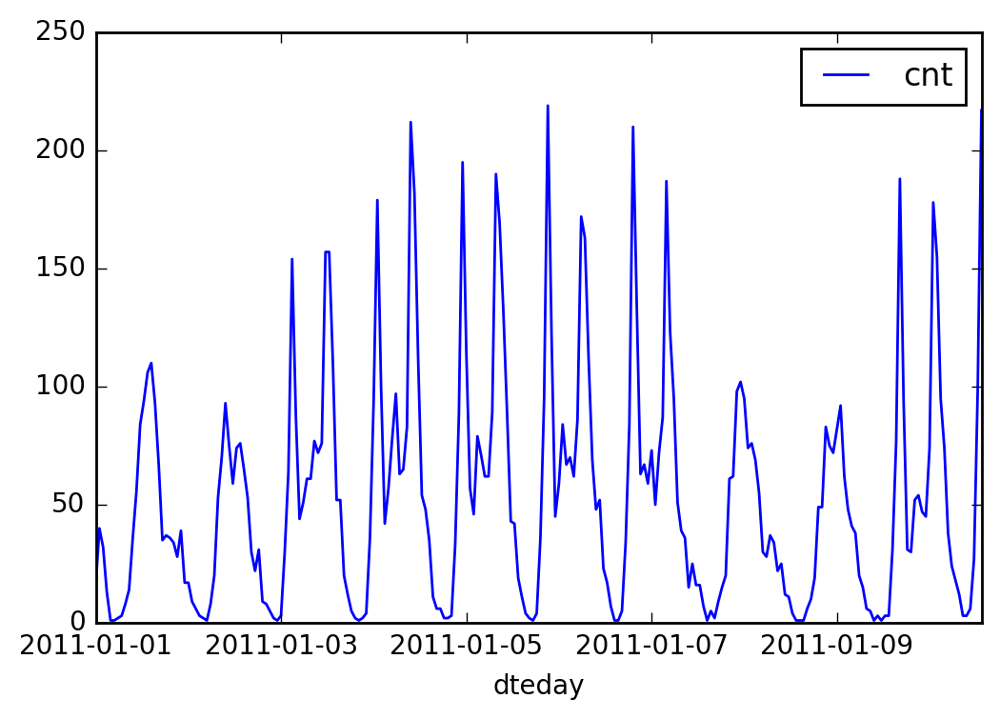

In [4]:
rides[:24*10].plot(x='dteday', y='cnt')

### Dummy variables
Here we have some categorical variables like season, weather, month. To include these in our model, we'll need to make binary dummy variables. This is simple to do with Pandas thanks to `get_dummies()`.

In [5]:
dummy_fields = ['season', 'weathersit', 'mnth', 'hr', 'weekday']
for each in dummy_fields:
    dummies = pd.get_dummies(rides[each], prefix=each, drop_first=False)
    rides = pd.concat([rides, dummies], axis=1)

fields_to_drop = ['instant', 'dteday', 'season', 'weathersit', 
                  'weekday', 'atemp', 'mnth', 'workingday', 'hr']
data = rides.drop(fields_to_drop, axis=1)
data.head()

,yr,holiday,temp,hum,windspeed,casual,registered,cnt,season_1,season_2,...,hr_21,hr_22,hr_23,weekday_0,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6
0,0,0,0.24,0.81,0.0,3,13,16,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0,0,0.22,0.80,0.0,8,32,40,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0,0,0.22,0.80,0.0,5,27,32,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0,0,0.24,0.75,0.0,3,10,13,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0,0,0.24,0.75,0.0,0,1,1,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


### Scaling target variables
To make training the network easier, we'll standardize each of the continuous variables. That is, we'll shift and scale the variables such that they have zero mean and a standard deviation of 1.

The scaling factors are saved so we can go backwards when we use the network for predictions.

In [7]:
quant_features = ['casual', 'registered', 'cnt', 'temp', 'hum', 'windspeed']
# Store scalings in a dictionary so we can convert back later
scaled_features = {}
for each in quant_features:
    mean, std = data[each].mean(), data[each].std()
    scaled_features[each] = [mean, std]
    data.loc[:, each] = (data[each] - mean)/std

### Splitting the data into training, testing, and validation sets

We'll save the data for the last approximately 21 days to use as a test set after we've trained the network. We'll use this set to make predictions and compare them with the actual number of riders.

In [8]:
# Save data for approximately the last 21 days 
test_data = data[-21*24:]

# Now remove the test data from the data set 
data = data[:-21*24]

# Separate the data into features and targets
target_fields = ['cnt', 'casual', 'registered']
features, targets = data.drop(target_fields, axis=1), data[target_fields]
test_features, test_targets = test_data.drop(target_fields, axis=1), test_data[target_fields]

We'll split the data into two sets, one for training and one for validating as the network is being trained. Since this is time series data, we'll train on historical data, then try to predict on future data (the validation set).

In [9]:
# Hold out the last 60 days or so of the remaining data as a validation set
train_features, train_targets = features[:-60*24], targets[:-60*24]
val_features, val_targets = features[-60*24:], targets[-60*24:]

## Time to build the network

Below you'll build your network. We've built out the structure and the backwards pass. You'll implement the forward pass through the network. You'll also set the hyperparameters: the learning rate, the number of hidden units, and the number of training passes.

<img src="assets/neural_network.png" width=300px>

The network has two layers, a hidden layer and an output layer. The hidden layer will use the sigmoid function for activations. The output layer has only one node and is used for the regression, the output of the node is the same as the input of the node. That is, the activation function is $f(x)=x$. A function that takes the input signal and generates an output signal, but takes into account the threshold, is called an activation function. We work through each layer of our network calculating the outputs for each neuron. All of the outputs from one layer become inputs to the neurons on the next layer. This process is called *forward propagation*.

We use the weights to propagate signals forward from the input to the output layers in a neural network. We use the weights to also propagate error backwards from the output back into the network to update our weights. This is called *backpropagation*.

> **Hint:** You'll need the derivative of the output activation function ($f(x) = x$) for the backpropagation implementation. If you aren't familiar with calculus, this function is equivalent to the equation $y = x$. What is the slope of that equation? That is the derivative of $f(x)$.

Below, you have these tasks:
1. Implement the sigmoid function to use as the activation function. Set `self.activation_function` in `__init__` to your sigmoid function.
2. Implement the forward pass in the `train` method.
3. Implement the backpropagation algorithm in the `train` method, including calculating the output error.
4. Implement the forward pass in the `run` method.
  

In [156]:
class NeuralNetwork(object):
    def __init__(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Set number of nodes in input, hidden and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Initialize weights
        self.weights_input_to_hidden = np.random.normal(0.0, self.input_nodes**-0.5, 
                                       (self.input_nodes, self.hidden_nodes))

        self.weights_hidden_to_output = np.random.normal(0.0, self.hidden_nodes**-0.5, 
                                       (self.hidden_nodes, self.output_nodes))
        self.lr = learning_rate
        
        #### TODO: Set self.activation_function to your implemented sigmoid function ####
        #
        # Note: in Python, you can define a function with a lambda expression,
        # as shown below.
        self.activation_function = lambda x : 1/(1 + np.exp(-x))  # Replace 0 with your sigmoid calculation.
        
        ### If the lambda code above is not something you're familiar with,
        # You can uncomment out the following three lines and put your 
        # implementation there instead.
        #
        #def sigmoid(x):
        #    return 0  # Replace 0 with your sigmoid calculation here
        #self.activation_function = sigmoid
                    
    
    def train(self, features, targets):
        ''' Train the network on batch of features and targets. 
        
            Arguments
            ---------
            
            features: 2D array, each row is one data record, each column is a feature
            targets: 1D array of target values
        
        '''
        n_records = features.shape[0]
        delta_weights_i_h = np.zeros(self.weights_input_to_hidden.shape)
        delta_weights_h_o = np.zeros(self.weights_hidden_to_output.shape)
        for X, y in zip(features, targets):
            #### Implement the forward pass here ####
            ### Forward pass ###
            # TODO: Hidden layer - Replace these values with your calculations.
            hidden_inputs = np.dot(X, self.weights_input_to_hidden) # signals into hidden layer
            hidden_outputs = self.activation_function(hidden_inputs) # signals from hidden layer

            # TODO: Output layer - Replace these values with your calculations.
            final_inputs = np.dot(hidden_outputs, self.weights_hidden_to_output) # signals into final output layer
            final_outputs = final_inputs # signals from final output layer
            
            #### Implement the backward pass here ####
            ### Backward pass ###

            # TODO: Output error - Replace this value with your calculations.
            error = (y - final_outputs)  # Output layer error is the difference between desired target and actual output.
            
            # TODO: Calculate the hidden layer's contribution to the error
            hidden_error =  (hidden_outputs * (1 - hidden_outputs)) * (self.weights_hidden_to_output * error).T
            
            # TODO: Backpropagated error terms - Replace these values with your calculations.
            output_error_term =  error * hidden_outputs[:,None]
            hidden_error_term = hidden_error * X[:,None]

            # Weight step (input to hidden)
            delta_weights_i_h += hidden_error_term
            # Weight step (hidden to output)
            delta_weights_h_o += output_error_term

        # TODO: Update the weights - Replace these values with your calculations.
        self.weights_hidden_to_output += self.lr * delta_weights_h_o # update hidden-to-output weights with gradient descent step
        self.weights_input_to_hidden += self.lr * delta_weights_i_h # update input-to-hidden weights with gradient descent step
        print(self.weights_hidden_to_output)
        print(self.weights_input_to_hidden)
    def run(self, features):
        ''' Run a forward pass through the network with input features 
        
            Arguments
            ---------
            features: 1D array of feature values
        '''
        
        #### Implement the forward pass here ####
        # TODO: Hidden layer - replace these values with the appropriate calculations.
        hidden_inputs = np.dot(features, self.weights_input_to_hidden) # signals into hidden layer
        hidden_outputs = self.activation_function(hidden_inputs) # signals from hidden layer
        
        # TODO: Output layer - Replace these values with the appropriate calculations.
        final_inputs = np.dot(hidden_outputs, self.weights_hidden_to_output) # signals into final output layer
        final_outputs = final_inputs # signals from final output layer 
        
        return final_outputs

In [157]:
def MSE(y, Y):
    return np.mean((y-Y)**2)

## Unit tests

Run these unit tests to check the correctness of your network implementation. This will help you be sure your network was implemented correctly befor you starting trying to train it. These tests must all be successful to pass the project.

In [158]:
import unittest

inputs = np.array([[0.5, -0.2, 0.1]])
targets = np.array([[0.4]])
test_w_i_h = np.array([[0.1, -0.2],
                       [0.4, 0.5],
                       [-0.3, 0.2]])
test_w_h_o = np.array([[0.3],
                       [-0.1]])

class TestMethods(unittest.TestCase):
    
    ##########
    # Unit tests for data loading
    ##########
    
    def test_data_path(self):
        # Test that file path to dataset has been unaltered
        self.assertTrue(data_path.lower() == 'bike-sharing-dataset/hour.csv')
        
    def test_data_loaded(self):
        # Test that data frame loaded
        self.assertTrue(isinstance(rides, pd.DataFrame))
    
    ##########
    # Unit tests for network functionality
    ##########

    def test_activation(self):
        network = NeuralNetwork(3, 2, 1, 0.5)
        # Test that the activation function is a sigmoid
        self.assertTrue(np.all(network.activation_function(0.5) == 1/(1+np.exp(-0.5))))

    def test_train(self):
        # Test that weights are updated correctly on training
        network = NeuralNetwork(3, 2, 1, 0.5)
        network.weights_input_to_hidden = test_w_i_h.copy()
        network.weights_hidden_to_output = test_w_h_o.copy()
        
        network.train(inputs, targets)
        self.assertTrue(np.allclose(network.weights_hidden_to_output, 
                                    np.array([[ 0.37275328], 
                                              [-0.03172939]])))
        self.assertTrue(np.allclose(network.weights_input_to_hidden,
                                    np.array([[ 0.10562014, -0.20185996], 
                                              [0.39775194, 0.50074398], 
                                              [-0.29887597, 0.19962801]])))

    def test_run(self):
        # Test correctness of run method
        network = NeuralNetwork(3, 2, 1, 0.5)
        network.weights_input_to_hidden = test_w_i_h.copy()
        network.weights_hidden_to_output = test_w_h_o.copy()

        self.assertTrue(np.allclose(network.run(inputs), 0.09998924))

suite = unittest.TestLoader().loadTestsFromModule(TestMethods())
unittest.TextTestRunner().run(suite)

.....

[[ 0.37275328]
 [-0.03172939]]
[[ 0.10562014 -0.20185996]
 [ 0.39775194  0.50074398]
 [-0.29887597  0.19962801]]



----------------------------------------------------------------------
Ran 5 tests in 0.006s

OK


<unittest.runner.TextTestResult run=5 errors=0 failures=0>

## Training the network

Here you'll set the hyperparameters for the network. The strategy here is to find hyperparameters such that the error on the training set is low, but you're not overfitting to the data. If you train the network too long or have too many hidden nodes, it can become overly specific to the training set and will fail to generalize to the validation set. That is, the loss on the validation set will start increasing as the training set loss drops.

You'll also be using a method know as Stochastic Gradient Descent (SGD) to train the network. The idea is that for each training pass, you grab a random sample of the data instead of using the whole data set. You use many more training passes than with normal gradient descent, but each pass is much faster. This ends up training the network more efficiently. You'll learn more about SGD later.

### Choose the number of iterations
This is the number of batches of samples from the training data we'll use to train the network. The more iterations you use, the better the model will fit the data. However, if you use too many iterations, then the model with not generalize well to other data, this is called overfitting. You want to find a number here where the network has a low training loss, and the validation loss is at a minimum. As you start overfitting, you'll see the training loss continue to decrease while the validation loss starts to increase.

### Choose the learning rate
This scales the size of weight updates. If this is too big, the weights tend to explode and the network fails to fit the data. A good choice to start at is 0.1. If the network has problems fitting the data, try reducing the learning rate. Note that the lower the learning rate, the smaller the steps are in the weight updates and the longer it takes for the neural network to converge.

### Choose the number of hidden nodes
The more hidden nodes you have, the more accurate predictions the model will make. Try a few different numbers and see how it affects the performance. You can look at the losses dictionary for a metric of the network performance. If the number of hidden units is too low, then the model won't have enough space to learn and if it is too high there are too many options for the direction that the learning can take. The trick here is to find the right balance in number of hidden units you choose.

In [171]:
import sys

### Set the hyperparameters here ###
iterations = 1000
learning_rate = 0.01
hidden_nodes = 10
output_nodes = 1

N_i = train_features.shape[1]
network = NeuralNetwork(N_i, hidden_nodes, output_nodes, learning_rate)

losses = {'train':[], 'validation':[]}
for ii in range(iterations):
    # Go through a random batch of 128 records from the training data set
    batch = np.random.choice(train_features.index, size=128)
    X, y = train_features.ix[batch].values, train_targets.ix[batch]['cnt']
                             
    network.train(X, y)
    
    # Printing out the training progress
    train_loss = MSE(network.run(train_features).T, train_targets['cnt'].values)
    val_loss = MSE(network.run(val_features).T, val_targets['cnt'].values)
    sys.stdout.write("\rProgress: {:2.1f}".format(100 * ii/float(iterations)) \
                     + "% ... Training loss: " + str(train_loss)[:5] \
                     + " ... Validation loss: " + str(val_loss)[:5])
    sys.stdout.flush()
    
    losses['train'].append(train_loss)
    losses['validation'].append(val_loss)

[[-0.11053189]
 [ 0.26115583]
 [-0.50308858]
 [-0.19318668]
 [-0.23497272]
 [-0.48381099]
 [-0.72252402]
 [-0.39856197]
 [ 0.26341989]
 [-0.53240326]]
[[  4.23607314e-02  -1.10287946e-01  -2.32180325e-01   3.06701336e-02
    7.53001284e-02  -2.04771269e-01   1.75141799e-02  -2.45542258e-01
   -6.00095438e-02  -5.26548477e-02]
 [  2.93728609e-01   3.39713116e-02  -1.89016528e-01  -6.33853437e-03
    7.85244619e-02  -3.02637965e-03   1.63742616e-01   3.50219421e-03
   -1.95895061e-02  -8.29941205e-02]
 [  1.28931840e-01   1.27395363e-01  -3.00597365e-01   1.13011870e-01
    8.24669881e-02  -6.24664381e-02  -1.11163025e-01   1.24642237e-01
    2.61292347e-01   1.22547184e-02]
 [ -1.64113969e-01   5.88716690e-02   3.62269184e-01  -3.17022368e-01
    1.49609838e-01   3.83129165e-02   3.44964505e-02   2.35673487e-02
   -3.88894266e-02  -1.92671701e-02]
 [ -9.80182443e-02  -1.15925299e-01  -3.04672711e-02   5.15844698e-02
    8.86660621e-03   2.61825082e-02  -1.49516483e-01  -3.02603583e-01
 

Progress: 0.0% ... Training loss: 2.532 ... Validation loss: 3.541[[ 0.66136364]
 [ 0.99075768]
 [ 0.14726416]
 [ 0.55765491]
 [ 0.58548888]
 [ 0.24505679]
 [ 0.10514608]
 [ 0.41440228]
 [ 1.03047118]
 [ 0.26967409]]
[[  1.95241011e-02  -5.63197022e-02  -3.27704859e-01  -8.88189890e-03
    2.58214194e-02  -3.04634140e-01  -1.32839170e-01  -3.27419309e-01
   -5.99358624e-03  -1.63752174e-01]
 [  2.93032081e-01   3.55910856e-02  -1.92096585e-01  -7.55674614e-03
    7.70044145e-02  -6.15613099e-03   1.59141485e-01   1.06160561e-03
   -1.79265155e-02  -8.64462639e-02]
 [  1.19579219e-01   1.51234286e-01  -3.28105665e-01   9.63177697e-02
    6.22180658e-02  -1.05149866e-01  -1.73621136e-01   9.05594735e-02
    2.83919134e-01  -3.29290543e-02]
 [ -1.60796616e-01   5.18874665e-02   3.61371682e-01  -3.10497187e-01
    1.56760518e-01   5.18267722e-02   5.57105404e-02   3.38471859e-02
   -4.72769739e-02  -3.29567191e-03]
 [ -9.61531213e-02  -1.20103514e-01  -2.48685553e-02   5.34600519e-02
    1

Progress: 0.1% ... Training loss: 6.467 ... Validation loss: 4.798[[-0.74919637]
 [-0.53702467]
 [-1.14026148]
 [-0.7725727 ]
 [-0.90677937]
 [-1.08818286]
 [-1.28459685]
 [-1.07875555]
 [-0.51216485]
 [-1.07398892]]
[[ -1.57905142e-01  -3.26893564e-01  -3.63166850e-01  -1.55592363e-01
   -1.34826345e-01  -3.67424124e-01  -1.60615526e-01  -4.39146498e-01
   -2.85223729e-01  -2.35044435e-01]
 [  2.82741790e-01   2.04721608e-02  -1.94348817e-01  -1.54317168e-02
    6.79970841e-02  -9.78296690e-03   1.57507049e-01  -5.14519099e-03
   -3.30375064e-02  -9.05642124e-02]
 [  1.86771934e-01   2.45530054e-01  -3.09271994e-01   1.51604708e-01
    1.21121774e-01  -7.80241192e-02  -1.61696843e-01   1.32557652e-01
    3.90611415e-01  -3.54314176e-03]
 [ -2.21132362e-01  -5.65666172e-02   3.40188603e-01  -3.54375046e-01
    9.06682602e-02   2.51225340e-02   4.42945813e-02  -9.89267350e-03
   -1.50825538e-01  -3.08722817e-02]
 [ -2.29455652e-02  -1.99705519e-03  -7.45534902e-03   1.09745252e-01
    8

Progress: 0.2% ... Training loss: 11.51 ... Validation loss: 11.25[[ 0.68781785]
 [ 0.71374463]
 [ 0.30326475]
 [ 0.69764905]
 [ 0.60908817]
 [ 0.43832154]
 [ 0.39959447]
 [ 0.53163003]
 [ 0.87463765]
 [ 0.51555836]]
[[ -4.54102423e-01  -5.18665097e-01  -7.35618169e-01  -4.59841410e-01
   -4.99705168e-01  -7.82702878e-01  -6.85201475e-01  -8.63697622e-01
   -4.74117258e-01  -6.64681112e-01]
 [  2.68880393e-01   1.09343694e-02  -2.10274915e-01  -2.88730385e-02
    5.19646975e-02  -2.91590982e-02   1.35029475e-01  -2.50289465e-02
   -4.22684299e-02  -1.08569013e-01]
 [ -1.65966149e-02   1.06800820e-01  -3.94774468e-01  -3.83667914e-02
   -8.06509751e-02  -2.63832156e-01  -3.79927427e-01  -7.95675614e-02
    2.34458067e-01  -2.16101913e-01]
 [ -1.40083080e-01  -2.95691102e-02   2.53054927e-01  -2.51625115e-01
    1.11818858e-01   4.50168801e-02   6.79389413e-02   1.04540314e-02
   -8.61856001e-02   9.29786787e-03]
 [  1.36942215e-02   2.07752333e-02   8.51105620e-02   1.27711653e-01
    1

Progress: 0.3% ... Training loss: 2.384 ... Validation loss: 1.622[[ 0.38696922]
 [ 0.40357587]
 [-0.06077183]
 [ 0.36241552]
 [ 0.2919126 ]
 [ 0.11378838]
 [ 0.09891226]
 [ 0.23073757]
 [ 0.54050068]
 [ 0.21332511]]
[[ -4.78650982e-01  -5.43274253e-01  -7.47125401e-01  -4.86061337e-01
   -5.23132905e-01  -7.97588589e-01  -6.98971068e-01  -8.81675383e-01
   -5.03148832e-01  -6.83000081e-01]
 [  2.63861292e-01   6.92187819e-03  -2.11631311e-01  -3.32540985e-02
    4.83568399e-02  -3.14789464e-02   1.32662568e-01  -2.78624111e-02
   -4.76247254e-02  -1.11179146e-01]
 [  4.56583345e-02   1.65003778e-01  -3.55106752e-01   3.91673245e-02
   -1.47965113e-02  -2.11156836e-01  -3.29689561e-01  -2.59727187e-02
    3.14675933e-01  -1.56735944e-01]
 [ -1.67780379e-01  -7.28999505e-02   2.32825369e-01  -2.74021020e-01
    7.44736369e-02   2.33957733e-02   4.65528962e-02  -1.94136900e-02
   -1.25300778e-01  -1.89261787e-02]
 [ -6.81107900e-03   4.11878344e-03   7.43450069e-02   8.48103255e-02
    9

Progress: 0.4% ... Training loss: 1.204 ... Validation loss: 1.276[[ 0.27785959]
 [ 0.30484379]
 [-0.22144923]
 [ 0.25210126]
 [ 0.17062893]
 [-0.02461512]
 [-0.02623447]
 [ 0.10772314]
 [ 0.44968234]
 [ 0.09097565]]
[[-0.47670547 -0.53994976 -0.7464597  -0.48481431 -0.52381361 -0.79818995
  -0.6993985  -0.88170618 -0.49752311 -0.68333327]
 [ 0.26205058  0.00517785 -0.21126511 -0.03447053  0.04698531 -0.03216041
   0.13209005 -0.02910135 -0.04868196 -0.11229092]
 [ 0.07559598  0.19268224 -0.36035012  0.0681709   0.00621301 -0.20179245
  -0.32195667 -0.00837616  0.35340143 -0.14081256]
 [-0.18202447 -0.09259221  0.23574945 -0.28404014  0.05947826  0.01880903
   0.04268638 -0.02928403 -0.14831472 -0.02784916]
 [-0.01384895 -0.00170299  0.07575546  0.07369513  0.0873685   0.09458194
  -0.01258234 -0.12132001  0.20736054  0.04346843]
 [-0.40763283 -0.55905818 -0.26471203 -0.31286194 -0.34193835 -0.21049473
  -0.35548298 -0.34106388 -0.28261383 -0.2900963 ]
 [-0.25874012 -0.19853142 -0.4327

Progress: 0.6% ... Training loss: 0.939 ... Validation loss: 1.280[[ 0.19819924]
 [ 0.2222734 ]
 [-0.40615633]
 [ 0.15945187]
 [ 0.05144106]
 [-0.16985506]
 [-0.17062602]
 [-0.02075822]
 [ 0.41053409]
 [-0.03477264]]
[[-0.4698582  -0.53124907 -0.7427798  -0.47973636 -0.52257801 -0.79755469
  -0.6987397  -0.88113559 -0.47668078 -0.68301827]
 [ 0.26114415  0.00449866 -0.21017509 -0.03503189  0.04659757 -0.03183918
   0.13244273 -0.02932335 -0.04924668 -0.11237819]
 [ 0.10829598  0.22771626 -0.39750999  0.09928918  0.02234398 -0.21011248
  -0.33018465 -0.00122314  0.41399447 -0.13461911]
 [-0.20183767 -0.11848882  0.25556025 -0.29955315  0.04793363  0.02260385
   0.04628332 -0.03525501 -0.18586018 -0.03234347]
 [-0.00400204  0.01080443  0.0707122   0.08027724  0.09096256  0.0932802
  -0.01397782 -0.11873653  0.22637886  0.04461747]
 [-0.42078548 -0.57140736 -0.24470772 -0.32591874 -0.34939028 -0.2060582
  -0.35101497 -0.34467836 -0.30251472 -0.29300431]
 [-0.26262061 -0.20389591 -0.424723

Progress: 0.8% ... Training loss: 0.873 ... Validation loss: 1.309[[ 0.19438968]
 [ 0.21480173]
 [-0.51554283]
 [ 0.13914163]
 [ 0.00475938]
 [-0.23495896]
 [-0.24065181]
 [-0.06514151]
 [ 0.43223258]
 [-0.08995657]]
[[ -4.64038249e-01  -5.23911242e-01  -7.40337724e-01  -4.75720121e-01
   -5.22106062e-01  -7.98812168e-01  -6.99736513e-01  -8.81591713e-01
   -4.58760085e-01  -6.83658880e-01]
 [  2.59824605e-01   3.18146379e-03  -2.07649492e-01  -3.56944175e-02
    4.63852306e-02  -3.08179121e-02   1.33556942e-01  -2.91434733e-02
   -5.12013174e-02  -1.12117186e-01]
 [  1.26694959e-01   2.47004578e-01  -4.42812601e-01   1.14531257e-01
    2.52707754e-02  -2.27683651e-01  -3.48595127e-01  -4.21078008e-03
    4.55474767e-01  -1.39396595e-01]
 [ -2.15993715e-01  -1.36423369e-01   2.75019301e-01  -3.09296999e-01
    4.60422973e-02   3.18847623e-02   5.43886425e-02  -3.31505898e-02
   -2.22320634e-01  -2.92288718e-02]
 [ -2.79393138e-03   1.20928392e-02   6.63864720e-02   7.96691874e-02
    9

Progress: 0.9% ... Training loss: 0.860 ... Validation loss: 1.304[[ 0.19462708]
 [ 0.21628088]
 [-0.55769956]
 [ 0.1368462 ]
 [-0.00787691]
 [-0.26258176]
 [-0.26487964]
 [-0.08290583]
 [ 0.44789225]
 [-0.1095261 ]]
[[ -4.59805890e-01  -5.18799839e-01  -7.43214697e-01  -4.72818848e-01
   -5.22036849e-01  -8.01207116e-01  -7.02057678e-01  -8.82404838e-01
   -4.47159402e-01  -6.84762033e-01]
 [  2.59322191e-01   2.71637335e-03  -2.06664494e-01  -3.60005135e-02
    4.63758571e-02  -3.03347278e-02   1.34058034e-01  -2.90011201e-02
   -5.22655459e-02  -1.11926028e-01]
 [  1.33402608e-01   2.54384207e-01  -4.59347451e-01   1.19399253e-01
    2.54202428e-02  -2.34817440e-01  -3.55815733e-01  -6.09749933e-03
    4.73751814e-01  -1.42003873e-01]
 [ -2.22317683e-01  -1.44226237e-01   2.88103743e-01  -3.13691957e-01
    4.59150425e-02   3.78285904e-02   5.96078057e-02  -3.15903919e-02
   -2.39865537e-01  -2.67710575e-02]
 [ -2.31016099e-03   1.24772458e-02   6.32448268e-02   8.03047443e-02
    9

Progress: 1.0% ... Training loss: 0.847 ... Validation loss: 1.305[[ 0.21333806]
 [ 0.2314063 ]
 [-0.60107074]
 [ 0.15513944]
 [-0.017856  ]
 [-0.28354196]
 [-0.28988126]
 [-0.09522504]
 [ 0.48376186]
 [-0.12029961]]
[[ -4.55322302e-01  -5.13645569e-01  -7.44931839e-01  -4.69721218e-01
   -5.22122752e-01  -8.02973538e-01  -7.03517872e-01  -8.83212499e-01
   -4.33860156e-01  -6.85850408e-01]
 [  2.58773638e-01   2.17667856e-03  -2.05204950e-01  -3.62660248e-02
    4.63917719e-02  -2.96097057e-02   1.34843882e-01  -2.87879552e-02
   -5.28082280e-02  -1.11638386e-01]
 [  1.39762791e-01   2.61647190e-01  -4.75581744e-01   1.23892638e-01
    2.51876866e-02  -2.42340672e-01  -3.63666096e-01  -8.38589394e-03
    4.91334939e-01  -1.44967086e-01]
 [ -2.33467632e-01  -1.59466943e-01   3.14659384e-01  -3.21527644e-01
    4.63306790e-02   5.05157704e-02   7.15672302e-02  -2.77466111e-02
   -2.69403596e-01  -2.10217377e-02]
 [  5.70844321e-05   1.58163558e-02   6.02528913e-02   8.20834938e-02
    9

Progress: 1.1% ... Training loss: 0.831 ... Validation loss: 1.296[[ 0.22305868]
 [ 0.24223925]
 [-0.65843849]
 [ 0.16471566]
 [-0.03183939]
 [-0.31426994]
 [-0.32149873]
 [-0.11753376]
 [ 0.53226729]
 [-0.13729811]]
[[ -4.51066678e-01  -5.08061924e-01  -7.42704361e-01  -4.66403319e-01
   -5.22333062e-01  -8.03867029e-01  -7.03943613e-01  -8.83777460e-01
   -4.16002227e-01  -6.86960345e-01]
 [  2.59010409e-01   2.46815110e-03  -2.04958195e-01  -3.61259486e-02
    4.63810963e-02  -2.96181969e-02   1.34954255e-01  -2.88231099e-02
   -5.18086195e-02  -1.11649895e-01]
 [  1.51182387e-01   2.74307705e-01  -4.96158799e-01   1.32515720e-01
    2.44245421e-02  -2.52575503e-01  -3.73440522e-01  -1.16770246e-02
    5.23614135e-01  -1.49705076e-01]
 [ -2.45248078e-01  -1.74599910e-01   3.42066083e-01  -3.30466803e-01
    4.72639137e-02   6.31782694e-02   8.22845695e-02  -2.36371229e-02
   -3.05236652e-01  -1.58124770e-02]
 [  4.49641965e-03   2.04821657e-02   5.46841092e-02   8.58351657e-02
    9

Progress: 1.2% ... Training loss: 0.811 ... Validation loss: 1.288[[ 0.2710879 ]
 [ 0.29313172]
 [-0.69940666]
 [ 0.20636205]
 [-0.0241827 ]
 [-0.3279276 ]
 [-0.34403624]
 [-0.11940117]
 [ 0.63663199]
 [-0.13968816]]
[[ -4.42344895e-01  -4.99563669e-01  -7.42631486e-01  -4.60535094e-01
   -5.22872290e-01  -8.06276660e-01  -7.06034330e-01  -8.85299369e-01
   -3.84461081e-01  -6.88812240e-01]
 [  2.58932804e-01   2.43470848e-03  -2.03875608e-01  -3.62696637e-02
    4.64099217e-02  -2.91654502e-02   1.35416965e-01  -2.87136675e-02
   -5.19296431e-02  -1.11471861e-01]
 [  1.70090003e-01   2.94835194e-01  -5.30948512e-01   1.46058677e-01
    2.24547192e-02  -2.69510541e-01  -3.89987336e-01  -1.80344467e-02
    5.81609700e-01  -1.57481880e-01]
 [ -2.63078929e-01  -1.94219996e-01   3.67140188e-01  -3.42854950e-01
    4.90348359e-02   7.55396970e-02   9.44367813e-02  -1.81072543e-02
   -3.60729034e-01  -8.81010066e-03]
 [  1.22179485e-02   2.85688917e-02   4.34601870e-02   9.09512556e-02
    8

Progress: 1.3% ... Training loss: 0.782 ... Validation loss: 1.251[[ 0.27598067]
 [ 0.30522233]
 [-0.75378965]
 [ 0.20808392]
 [-0.04013192]
 [-0.35883739]
 [-0.37477917]
 [-0.14242448]
 [ 0.67078042]
 [-0.15906775]]
[[ -4.40202695e-01  -4.96499453e-01  -7.34984823e-01  -4.58674655e-01
   -5.22836421e-01  -8.04622664e-01  -7.04130973e-01  -8.85068185e-01
   -3.73624935e-01  -6.88623022e-01]
 [  2.58123921e-01   1.84134696e-03  -2.02049003e-01  -3.68158408e-02
    4.64653760e-02  -2.84154523e-02   1.36190409e-01  -2.85394717e-02
   -5.34212581e-02  -1.11181069e-01]
 [  1.80629238e-01   3.06464771e-01  -5.49545635e-01   1.54241597e-01
    2.17397858e-02  -2.78123693e-01  -3.98891302e-01  -2.09405436e-02
    6.11681765e-01  -1.61356321e-01]
 [ -2.77086263e-01  -2.12084875e-01   3.87168062e-01  -3.52598997e-01
    4.98893120e-02   8.45514777e-02   1.03313866e-01  -1.41241014e-02
   -4.06561090e-01  -4.29748792e-03]
 [  1.31857679e-02   2.99834536e-02   3.66812953e-02   9.15573935e-02
    8

Progress: 1.4% ... Training loss: 0.763 ... Validation loss: 1.245[[ 0.27995436]
 [ 0.3074881 ]
 [-0.79257537]
 [ 0.20154743]
 [-0.05099817]
 [-0.38142482]
 [-0.39867406]
 [-0.15515958]
 [ 0.68748021]
 [-0.17650115]]
[[ -4.35851455e-01  -4.92635579e-01  -7.34394885e-01  -4.56344244e-01
   -5.23141274e-01  -8.05464843e-01  -7.04949808e-01  -8.86005044e-01
   -3.60612027e-01  -6.89205971e-01]
 [  2.59082855e-01   2.91569797e-03  -2.02631928e-01  -3.63883920e-02
    4.63915699e-02  -2.88266059e-02   1.35839517e-01  -2.87520919e-02
   -5.17865036e-02  -1.11330105e-01]
 [  1.89665373e-01   3.16388487e-01  -5.78897846e-01   1.61005732e-01
    2.05286232e-02  -2.90196629e-01  -4.11343864e-01  -2.51767898e-02
    6.36909902e-01  -1.66371747e-01]
 [ -2.75610944e-01  -2.11457402e-01   3.85261002e-01  -3.51091901e-01
    4.97510582e-02   8.22731363e-02   1.01405110e-01  -1.46195489e-02
   -4.05635159e-01  -4.68673739e-03]
 [  1.23599683e-02   2.90751812e-02   3.86073128e-02   9.02339125e-02
    8

Progress: 1.5% ... Training loss: 0.751 ... Validation loss: 1.246[[ 0.2866042 ]
 [ 0.31166204]
 [-0.82144193]
 [ 0.19526063]
 [-0.05971333]
 [-0.39383923]
 [-0.41774633]
 [-0.16448188]
 [ 0.70254415]
 [-0.19175584]]
[[ -4.33023506e-01  -4.89820426e-01  -7.32939381e-01  -4.55146347e-01
   -5.23390847e-01  -8.06648493e-01  -7.05815385e-01  -8.86671982e-01
   -3.52698818e-01  -6.89788954e-01]
 [  2.59602552e-01   3.48286818e-03  -2.01624482e-01  -3.62056452e-02
    4.63679043e-02  -2.85788653e-02   1.36158058e-01  -2.87286268e-02
   -4.94966381e-02  -1.11247403e-01]
 [  1.98172292e-01   3.23488188e-01  -5.99975902e-01   1.66422523e-01
    1.95334604e-02  -2.98161375e-01  -4.21284868e-01  -2.78818044e-02
    6.58443634e-01  -1.69754669e-01]
 [ -2.76078623e-01  -2.13292159e-01   3.72830370e-01  -3.50795654e-01
    4.94291464e-02   7.62505607e-02   9.62188180e-02  -1.61613957e-02
   -4.13720639e-01  -6.40371211e-03]
 [  1.24590069e-02   2.94828643e-02   4.30036927e-02   8.98385654e-02
    8

Progress: 1.6% ... Training loss: 0.743 ... Validation loss: 1.246[[ 0.27629622]
 [ 0.29908692]
 [-0.86980454]
 [ 0.18542194]
 [-0.08232595]
 [-0.42444919]
 [-0.44604867]
 [-0.18635585]
 [ 0.70809048]
 [-0.21739033]]
[[ -4.29361728e-01  -4.85878793e-01  -7.32203961e-01  -4.52667425e-01
   -5.23708994e-01  -8.07531299e-01  -7.06479917e-01  -8.87581496e-01
   -3.36606127e-01  -6.90551028e-01]
 [  2.59331815e-01   3.23699362e-03  -2.01391406e-01  -3.63905075e-02
    4.64018917e-02  -2.83881316e-02   1.36373174e-01  -2.86470761e-02
   -5.02440098e-02  -1.11134494e-01]
 [  2.02203227e-01   3.27651126e-01  -6.08764157e-01   1.69652490e-01
    1.89654284e-02  -3.02037460e-01  -4.26059068e-01  -2.96556787e-02
    6.74275667e-01  -1.71558994e-01]
 [ -2.83347338e-01  -2.24266879e-01   3.95854862e-01  -3.55976692e-01
    5.10291661e-02   8.44616369e-02   1.03849900e-01  -1.27204889e-02
   -4.41786117e-01  -1.55745685e-03]
 [  1.24558980e-02   3.03896887e-02   4.16867067e-02   9.00447133e-02
    8

Progress: 1.7% ... Training loss: 0.734 ... Validation loss: 1.254[[ 0.32036644]
 [ 0.34855047]
 [-0.86686266]
 [ 0.22515255]
 [-0.05988129]
 [-0.41145109]
 [-0.44114157]
 [-0.17474681]
 [ 0.79749066]
 [-0.20322129]]
[[ -4.21305395e-01  -4.76041234e-01  -7.39460227e-01  -4.47476454e-01
   -5.25128444e-01  -8.12999657e-01  -7.10456671e-01  -8.90025125e-01
   -3.04788768e-01  -6.93092727e-01]
 [  2.60307654e-01   4.24282522e-03  -2.03007996e-01  -3.59685114e-02
    4.62001618e-02  -2.92746697e-02   1.35555457e-01  -2.89559780e-02
   -4.82813159e-02  -1.11610725e-01]
 [  2.10866510e-01   3.37371362e-01  -6.15425790e-01   1.74663574e-01
    1.77657671e-02  -3.07122807e-01  -4.30361050e-01  -3.16412867e-02
    7.08372491e-01  -1.73827355e-01]
 [ -2.92251586e-01  -2.35557432e-01   4.08937299e-01  -3.60804881e-01
    5.23485475e-02   8.93512483e-02   1.09101871e-01  -9.38848466e-03
   -4.71869880e-01   1.02009841e-03]
 [  1.64002936e-02   3.63710582e-02   2.81657477e-02   9.24557309e-02
    8

Progress: 1.8% ... Training loss: 0.716 ... Validation loss: 1.207[[ 0.37216705]
 [ 0.41334468]
 [-0.86483175]
 [ 0.28101857]
 [-0.03411845]
 [-0.40066992]
 [-0.4399502 ]
 [-0.15892205]
 [ 0.9199025 ]
 [-0.19154567]]
[[ -4.06063608e-01  -4.57219228e-01  -7.56257635e-01  -4.36083060e-01
   -5.27061234e-01  -8.22164971e-01  -7.18165152e-01  -8.94406213e-01
   -2.49840825e-01  -6.97748287e-01]
 [  2.60044866e-01   3.99453887e-03  -2.02620681e-01  -3.61927128e-02
    4.62377438e-02  -2.90350790e-02   1.35805694e-01  -2.88660850e-02
   -4.91171519e-02  -1.11488429e-01]
 [  2.29897420e-01   3.60648588e-01  -6.34565346e-01   1.88766877e-01
    1.56614933e-02  -3.18890452e-01  -4.39985559e-01  -3.69550997e-02
    7.75925599e-01  -1.80103771e-01]
 [ -3.00500940e-01  -2.45976633e-01   3.98939206e-01  -3.66133462e-01
    5.26490932e-02   8.78345556e-02   1.07459583e-01  -8.71789551e-03
   -5.06020983e-01   1.92796174e-03]
 [  2.50317949e-02   4.86639442e-02   2.60686285e-02   9.90189706e-02
    8

Progress: 1.9% ... Training loss: 0.704 ... Validation loss: 1.149[[ 0.32959052]
 [ 0.37075496]
 [-0.93301839]
 [ 0.23703474]
 [-0.07313649]
 [-0.45385286]
 [-0.48947809]
 [-0.20433213]
 [ 0.87741573]
 [-0.23359361]]
[[ -4.05880136e-01  -4.57438933e-01  -7.52883434e-01  -4.36114956e-01
   -5.27059065e-01  -8.21029450e-01  -7.17101835e-01  -8.94283858e-01
   -2.49931429e-01  -6.97224520e-01]
 [  2.60132281e-01   4.05743444e-03  -2.02028739e-01  -3.60417925e-02
    4.62374705e-02  -2.90121159e-02   1.35984698e-01  -2.87952746e-02
   -4.85577310e-02  -1.11458559e-01]
 [  2.33336726e-01   3.64947029e-01  -6.54072291e-01   1.93109604e-01
    1.52908284e-02  -3.25823818e-01  -4.48267807e-01  -3.92196280e-02
    7.83953020e-01  -1.82644319e-01]
 [ -3.00553847e-01  -2.47315061e-01   3.98977949e-01  -3.64145809e-01
    5.26484348e-02   8.67526836e-02   1.06348103e-01  -8.94678229e-03
   -5.06516304e-01   1.52700430e-03]
 [  2.18483754e-02   4.70105735e-02   3.18165732e-02   9.63959507e-02
    8

Progress: 2.0% ... Training loss: 0.690 ... Validation loss: 1.184[[ 0.32274261]
 [ 0.36160403]
 [-0.94778249]
 [ 0.23071581]
 [-0.07915629]
 [-0.46005903]
 [-0.499259  ]
 [-0.21085907]
 [ 0.87474632]
 [-0.24064386]]
[[ -4.04358002e-01  -4.55314740e-01  -7.52791141e-01  -4.34903724e-01
   -5.27205046e-01  -8.21852751e-01  -7.17335460e-01  -8.95083666e-01
   -2.45199125e-01  -6.97758180e-01]
 [  2.60211928e-01   4.12209046e-03  -2.02327381e-01  -3.59863517e-02
    4.62164746e-02  -2.91675339e-02   1.35827359e-01  -2.88478392e-02
   -4.84325809e-02  -1.11529197e-01]
 [  2.31774711e-01   3.63182326e-01  -6.53286898e-01   1.92227254e-01
    1.56388243e-02  -3.25250181e-01  -4.47220746e-01  -3.78920688e-02
    7.78710864e-01  -1.82057080e-01]
 [ -3.02080963e-01  -2.51164747e-01   3.99468267e-01  -3.65237267e-01
    5.28305716e-02   8.51290826e-02   1.07105261e-01  -9.30707944e-03
   -5.18977075e-01   1.62457507e-03]
 [  1.91993275e-02   4.60681472e-02   4.62051818e-02   9.38897810e-02
    8

Progress: 2.1% ... Training loss: 0.687 ... Validation loss: 1.186[[ 0.34181293]
 [ 0.38713711]
 [-0.94877586]
 [ 0.24753059]
 [-0.06991967]
 [-0.45705204]
 [-0.49701884]
 [-0.20561249]
 [ 0.92648333]
 [-0.2360516 ]]
[[ -3.97149150e-01  -4.46988373e-01  -7.47518252e-01  -4.31178309e-01
   -5.27841085e-01  -8.22545085e-01  -7.18152245e-01  -8.96052382e-01
   -2.15742203e-01  -6.98793430e-01]
 [  2.59680312e-01   3.86266904e-03  -2.01594181e-01  -3.63963581e-02
    4.63144412e-02  -2.83001334e-02   1.36405113e-01  -2.84564156e-02
   -4.93628323e-02  -1.11128105e-01]
 [  2.35185771e-01   3.67242116e-01  -6.58340714e-01   1.95353512e-01
    1.52755059e-02  -3.27082794e-01  -4.48500755e-01  -3.81306693e-02
    7.97959449e-01  -1.82811341e-01]
 [ -3.06919920e-01  -2.57867769e-01   4.00101289e-01  -3.68414526e-01
    5.32647313e-02   8.43853551e-02   1.06776128e-01  -9.04761971e-03
   -5.42836480e-01   1.65505366e-03]
 [  2.21188110e-02   4.93194252e-02   4.84650241e-02   9.45388370e-02
    8

Progress: 2.2% ... Training loss: 0.678 ... Validation loss: 1.156[[ 0.34705225]
 [ 0.38956409]
 [-0.96346876]
 [ 0.25414121]
 [-0.07158689]
 [-0.46148668]
 [-0.50434563]
 [-0.20359625]
 [ 0.94091476]
 [-0.23514537]]
[[ -3.95563554e-01  -4.45888662e-01  -7.35845691e-01  -4.30806849e-01
   -5.27543746e-01  -8.20565730e-01  -7.15660063e-01  -8.95718485e-01
   -2.09111069e-01  -6.97838376e-01]
 [  2.59489726e-01   3.71198958e-03  -2.01020387e-01  -3.63506693e-02
    4.63417349e-02  -2.81726903e-02   1.36588163e-01  -2.83917694e-02
   -4.95251524e-02  -1.11044937e-01]
 [  2.34277187e-01   3.66658488e-01  -6.65035387e-01   1.95964174e-01
    1.51827218e-02  -3.28069867e-01  -4.52121063e-01  -3.88088583e-02
    7.95619041e-01  -1.83941297e-01]
 [ -3.11856251e-01  -2.64466544e-01   4.09615420e-01  -3.71103051e-01
    5.38427345e-02   8.64699124e-02   1.09560244e-01  -8.03567749e-03
   -5.64006725e-01   3.24591071e-03]
 [  2.58023889e-02   5.30880141e-02   3.38196489e-02   9.72587935e-02
    8

Progress: 2.3% ... Training loss: 0.672 ... Validation loss: 1.148[[ 0.35226303]
 [ 0.39272975]
 [-0.97498918]
 [ 0.26117484]
 [-0.0691036 ]
 [-0.46449549]
 [-0.51149154]
 [-0.20720275]
 [ 0.95874213]
 [-0.23665605]]
[[ -3.88753018e-01  -4.38435822e-01  -7.46080592e-01  -4.25937552e-01
   -5.28590408e-01  -8.26334685e-01  -7.20503955e-01  -8.98015997e-01
   -1.83963206e-01  -7.00704414e-01]
 [  2.59087736e-01   3.38359724e-03  -2.00197731e-01  -3.64324991e-02
    4.63865153e-02  -2.79140033e-02   1.37193905e-01  -2.81905621e-02
   -5.05155499e-02  -1.10972689e-01]
 [  2.32162193e-01   3.64341532e-01  -6.65761741e-01   1.95662872e-01
    1.54441540e-02  -3.27459311e-01  -4.52009514e-01  -3.80069660e-02
    7.96445599e-01  -1.83654845e-01]
 [ -3.13736433e-01  -2.66409975e-01   4.10937801e-01  -3.71646959e-01
    5.41843925e-02   8.72250760e-02   1.10294068e-01  -7.09692455e-03
   -5.77890995e-01   4.15277708e-03]
 [  2.84482245e-02   5.77650212e-02   2.36586079e-02   9.94383723e-02
    8

Progress: 2.4% ... Training loss: 0.668 ... Validation loss: 1.135[[ 0.34533084]
 [ 0.38404104]
 [-1.01582189]
 [ 0.24716385]
 [-0.08723381]
 [-0.48564745]
 [-0.53363964]
 [-0.22513436]
 [ 0.97156026]
 [-0.25549639]]
[[ -3.86687008e-01  -4.36191026e-01  -7.32809600e-01  -4.25500599e-01
   -5.28518461e-01  -8.24159328e-01  -7.18202306e-01  -8.97812494e-01
   -1.75101703e-01  -7.00043906e-01]
 [  2.59231692e-01   3.42698333e-03  -2.00247337e-01  -3.62834008e-02
    4.63681691e-02  -2.81937753e-02   1.37016950e-01  -2.82863079e-02
   -5.00088832e-02  -1.11027781e-01]
 [  2.37970324e-01   3.71633214e-01  -6.72129368e-01   2.00219012e-01
    1.48296445e-02  -3.31410629e-01  -4.56576632e-01  -3.94780510e-02
    8.20163786e-01  -1.85801768e-01]
 [ -3.18774134e-01  -2.73501120e-01   4.19333244e-01  -3.74470813e-01
    5.48619510e-02   9.04928118e-02   1.12596002e-01  -5.53225508e-03
   -5.88704276e-01   6.23508752e-03]
 [  2.98811613e-02   5.96296258e-02   2.59721999e-02   9.97275080e-02
    8

Progress: 2.5% ... Training loss: 0.661 ... Validation loss: 1.142[[ 0.35129546]
 [ 0.38759844]
 [-1.01893643]
 [ 0.25123722]
 [-0.09245624]
 [-0.48245136]
 [-0.53448287]
 [-0.2226899 ]
 [ 0.98781477]
 [-0.25632799]]
[[ -3.85861342e-01  -4.35057884e-01  -7.24675249e-01  -4.24607193e-01
   -5.28266077e-01  -8.23203041e-01  -7.15397241e-01  -8.97077351e-01
   -1.69499500e-01  -6.99347985e-01]
 [  2.60293510e-01   4.76957362e-03  -2.00608600e-01  -3.54484458e-02
    4.61968086e-02  -2.95423206e-02   1.36445043e-01  -2.87117851e-02
   -4.68032455e-02  -1.11663265e-01]
 [  2.34777613e-01   3.67301118e-01  -6.58718728e-01   1.98110955e-01
    1.60274487e-02  -3.26759221e-01  -4.50819908e-01  -3.72520998e-02
    8.12350121e-01  -1.82880035e-01]
 [ -3.23392916e-01  -2.79714646e-01   4.30867222e-01  -3.77188014e-01
    5.57669942e-02   9.47110841e-02   1.16511944e-01  -4.01440338e-03
   -6.06872927e-01   8.48957936e-03]
 [  3.47801292e-02   6.44483050e-02   2.15043564e-02   1.02242223e-01
    8

Progress: 2.6% ... Training loss: 0.658 ... Validation loss: 1.133[[ 0.36330676]
 [ 0.39753513]
 [-1.0338858 ]
 [ 0.25706447]
 [-0.09683141]
 [-0.49130623]
 [-0.53828419]
 [-0.22226842]
 [ 1.01387278]
 [-0.26060996]]
[[ -3.80379368e-01  -4.29691771e-01  -7.15811428e-01  -4.22388920e-01
   -5.28257059e-01  -8.21009736e-01  -7.13589076e-01  -8.97221085e-01
   -1.44151997e-01  -6.98844012e-01]
 [  2.62113889e-01   6.53060488e-03  -1.99667766e-01  -3.46028145e-02
    4.60134470e-02  -2.97935569e-02   1.36242211e-01  -2.90130639e-02
   -3.97121972e-02  -1.11926522e-01]
 [  2.38526041e-01   3.71348767e-01  -6.59729429e-01   1.99479234e-01
    1.56244670e-02  -3.26292164e-01  -4.51017286e-01  -3.70982909e-02
    8.34673384e-01  -1.82806944e-01]
 [ -3.28401473e-01  -2.86042838e-01   4.51939913e-01  -3.80627908e-01
    5.72514067e-02   1.00797078e-01   1.24638029e-01  -9.31059379e-04
   -6.27662930e-01   1.17370265e-02]
 [  2.28417141e-02   4.91208378e-02   4.45083340e-02   9.36279033e-02
    8

Progress: 2.7% ... Training loss: 0.651 ... Validation loss: 1.116[[ 0.35027385]
 [ 0.37610836]
 [-1.04899913]
 [ 0.23158414]
 [-0.11703591]
 [-0.50665855]
 [-0.55301594]
 [-0.23786829]
 [ 0.99824405]
 [-0.27537597]]
[[ -3.74587461e-01  -4.23624573e-01  -7.15836436e-01  -4.19238057e-01
   -5.28910053e-01  -8.23444049e-01  -7.15437710e-01  -8.98571964e-01
   -1.19694745e-01  -7.00030869e-01]
 [  2.61249734e-01   5.82374300e-03  -1.97819883e-01  -3.50152861e-02
    4.61687895e-02  -2.90696779e-02   1.37060206e-01  -2.86766069e-02
   -4.14565982e-02  -1.11621222e-01]
 [  2.38824239e-01   3.71671232e-01  -6.44952014e-01   2.00036269e-01
    1.64764087e-02  -3.22191066e-01  -4.45383060e-01  -3.51676754e-02
    8.47831155e-01  -1.80461166e-01]
 [ -3.18590064e-01  -2.76271467e-01   4.24714828e-01  -3.72094681e-01
    5.44206726e-02   8.39689479e-02   1.08700734e-01  -7.72876431e-03
   -6.07621000e-01   4.22232151e-03]
 [  1.95095466e-02   4.65245462e-02   4.73134740e-02   9.01573982e-02
    8

Progress: 2.8% ... Training loss: 0.648 ... Validation loss: 1.127[[ 0.36982373]
 [ 0.40036118]
 [-1.05705858]
 [ 0.24334557]
 [-0.11350241]
 [-0.50893411]
 [-0.55310534]
 [-0.23640491]
 [ 1.08577663]
 [-0.26886829]]
[[ -3.69046637e-01  -4.16998349e-01  -7.11691072e-01  -4.16314755e-01
   -5.29361473e-01  -8.22578638e-01  -7.15208951e-01  -8.98880068e-01
   -9.19454521e-02  -7.00348759e-01]
 [  2.61650534e-01   6.30376666e-03  -1.96662432e-01  -3.49489314e-02
    4.61547957e-02  -2.87382035e-02   1.37340186e-01  -2.86976914e-02
   -4.03880513e-02  -1.11604162e-01]
 [  2.48932899e-01   3.82628184e-01  -6.53826609e-01   2.05722755e-01
    1.52547855e-02  -3.24885666e-01  -4.50611027e-01  -3.65293245e-02
    8.92525007e-01  -1.83117224e-01]
 [ -3.25151635e-01  -2.85212702e-01   4.28639740e-01  -3.75057164e-01
    5.51606282e-02   8.22690701e-02   1.07929808e-01  -6.71706849e-03
   -6.37279618e-01   5.07896886e-03]
 [  2.45151541e-02   5.25413772e-02   3.77697813e-02   9.27113907e-02
    8

Progress: 2.9% ... Training loss: 0.639 ... Validation loss: 1.087[[ 0.35718437]
 [ 0.39046852]
 [-1.06002276]
 [ 0.23629932]
 [-0.12052403]
 [-0.51608235]
 [-0.55578102]
 [-0.2428173 ]
 [ 1.08835349]
 [-0.27408962]]
[[ -3.63930252e-01  -4.11647562e-01  -7.11647313e-01  -4.13121284e-01
   -5.30064692e-01  -8.23388981e-01  -7.16411823e-01  -9.00148428e-01
   -7.72581985e-02  -7.01123233e-01]
 [  2.61828850e-01   6.60222996e-03  -1.95377249e-01  -3.47197765e-02
    4.61727220e-02  -2.80716342e-02   1.38242080e-01  -2.82958670e-02
   -3.91861360e-02  -1.11506371e-01]
 [  2.45902978e-01   3.79448770e-01  -6.40121758e-01   2.04245172e-01
    1.67010034e-02  -3.17288301e-01  -4.43446284e-01  -3.31436379e-02
    8.94367080e-01  -1.79284247e-01]
 [ -3.26736937e-01  -2.87185389e-01   4.15499586e-01  -3.75126352e-01
    5.44421995e-02   7.64902675e-02   1.00852830e-01  -8.70978344e-03
   -6.46878660e-01   2.90492288e-03]
 [  2.04880769e-02   5.02978180e-02   5.94521944e-02   9.03319456e-02
    8

Progress: 3.0% ... Training loss: 0.635 ... Validation loss: 1.087[[ 0.36638599]
 [ 0.39991578]
 [-1.05420953]
 [ 0.24522366]
 [-0.10987658]
 [-0.51824666]
 [-0.55041599]
 [-0.23699749]
 [ 1.11428475]
 [-0.26824389]]
[[ -3.58782939e-01  -4.05438485e-01  -7.16534144e-01  -4.09535416e-01
   -5.31064681e-01  -8.25032714e-01  -7.18183985e-01  -9.01687572e-01
   -5.30997759e-02  -7.02368759e-01]
 [  2.61527402e-01   6.34137195e-03  -1.93583089e-01  -3.49212880e-02
    4.62731954e-02  -2.75277526e-02   1.38903930e-01  -2.81634735e-02
   -4.00311386e-02  -1.11252343e-01]
 [  2.47329915e-01   3.81224244e-01  -6.54142493e-01   2.06043960e-01
    1.64394298e-02  -3.20118037e-01  -4.48210205e-01  -3.36937573e-02
    9.14984143e-01  -1.80345952e-01]
 [ -3.23504084e-01  -2.83356053e-01   3.89758382e-01  -3.71986285e-01
    5.22445051e-02   6.59128226e-02   8.92691590e-02  -1.31299217e-02
   -6.48771582e-01  -2.80066768e-03]
 [  1.36650386e-02   4.20009453e-02   8.24320207e-02   8.55474790e-02
    9

Progress: 3.1% ... Training loss: 0.630 ... Validation loss: 1.065[[ 0.35037609]
 [ 0.38207779]
 [-1.05013107]
 [ 0.23013709]
 [-0.11191728]
 [-0.51673131]
 [-0.54675514]
 [-0.2344267 ]
 [ 1.08040354]
 [-0.27191991]]
[[ -3.58928338e-01  -4.05263979e-01  -7.13152816e-01  -4.09070803e-01
   -5.30949431e-01  -8.24514690e-01  -7.18011433e-01  -9.01783567e-01
   -5.37243453e-02  -7.02008626e-01]
 [  2.61657027e-01   6.47088774e-03  -1.93780822e-01  -3.48490043e-02
    4.62503037e-02  -2.76695764e-02   1.38737388e-01  -2.82209918e-02
   -3.95919928e-02  -1.11325052e-01]
 [  2.39854115e-01   3.73028306e-01  -6.41111190e-01   2.02430350e-01
    1.80871819e-02  -3.14496494e-01  -4.42403164e-01  -3.07618942e-02
    8.99184375e-01  -1.76741876e-01]
 [ -3.14499471e-01  -2.73100044e-01   3.57540137e-01  -3.64963251e-01
    4.91210229e-02   5.02288014e-02   7.28745930e-02  -2.03946005e-02
   -6.35253582e-01  -1.04512490e-02]
 [  1.14390467e-02   3.97928399e-02   9.73427215e-02   8.32261913e-02
    9

Progress: 3.2% ... Training loss: 0.627 ... Validation loss: 1.078[[ 0.34163297]
 [ 0.37332097]
 [-1.06667632]
 [ 0.21925095]
 [-0.12110951]
 [-0.52846143]
 [-0.55819347]
 [-0.24361219]
 [ 1.08337303]
 [-0.28103642]]
[[ -3.54488694e-01  -3.99693329e-01  -7.18037238e-01  -4.06559905e-01
   -5.31726475e-01  -8.26141361e-01  -7.20426358e-01  -9.02784315e-01
   -3.27125374e-02  -7.03538236e-01]
 [  2.59918333e-01   4.84027420e-03  -1.90953791e-01  -3.59972063e-02
    4.66449931e-02  -2.59670848e-02   1.40377744e-01  -2.74234994e-02
   -4.54443252e-02  -1.10489318e-01]
 [  2.38203050e-01   3.70625333e-01  -6.39627542e-01   2.01318638e-01
    1.88248287e-02  -3.13135131e-01  -4.42339928e-01  -2.98897579e-02
    8.95711269e-01  -1.75687117e-01]
 [ -3.10364931e-01  -2.68129954e-01   3.48560112e-01  -3.60910940e-01
    4.75091999e-02   4.37343307e-02   6.61086211e-02  -2.34176080e-02
   -6.27994227e-01  -1.38217370e-02]
 [  1.18218884e-02   4.02858187e-02   9.99204398e-02   8.32660955e-02
    9

Progress: 3.3% ... Training loss: 0.623 ... Validation loss: 1.077[[ 0.30502645]
 [ 0.33005692]
 [-1.1343726 ]
 [ 0.17632145]
 [-0.16166702]
 [-0.57610798]
 [-0.59722005]
 [-0.28245288]
 [ 1.04396196]
 [-0.32408385]]
[[ -3.55060689e-01  -3.99824093e-01  -7.02000693e-01  -4.07145288e-01
   -5.31073169e-01  -8.20423639e-01  -7.15890269e-01  -9.01345216e-01
   -3.38747488e-02  -7.01291450e-01]
 [  2.60296166e-01   5.25946998e-03  -1.90216240e-01  -3.59523975e-02
    4.66340264e-02  -2.56085574e-02   1.40766558e-01  -2.73617271e-02
   -4.27200878e-02  -1.10326763e-01]
 [  2.35761643e-01   3.66910310e-01  -6.43169787e-01   2.00315089e-01
    1.93846234e-02  -3.11411255e-01  -4.44071863e-01  -2.83233030e-02
    8.79653608e-01  -1.74315229e-01]
 [ -3.12109624e-01  -2.70117755e-01   3.58614745e-01  -3.60328251e-01
    4.79906286e-02   4.51655964e-02   6.75354284e-02  -2.26451285e-02
   -6.27949696e-01  -1.33135818e-02]
 [  1.33236707e-02   4.09064009e-02   1.00966815e-01   8.31011164e-02
    9

Progress: 3.4% ... Training loss: 0.633 ... Validation loss: 1.117[[ 0.32780855]
 [ 0.36157721]
 [-1.11403719]
 [ 0.20133619]
 [-0.1437764 ]
 [-0.55544905]
 [-0.57995236]
 [-0.26626488]
 [ 1.12278209]
 [-0.30361613]]
[[ -3.50789982e-01  -3.93512105e-01  -6.97844087e-01  -4.04685937e-01
   -5.32079820e-01  -8.20956755e-01  -7.16172086e-01  -9.01773321e-01
   -7.35140972e-03  -7.01967452e-01]
 [  2.60247270e-01   5.20553419e-03  -1.90152648e-01  -3.59704325e-02
    4.66496567e-02  -2.55757066e-02   1.40801688e-01  -2.73327109e-02
   -4.29246673e-02  -1.10307518e-01]
 [  2.37187534e-01   3.70229815e-01  -6.32165339e-01   2.01152431e-01
    2.03824440e-02  -3.03680538e-01  -4.35270971e-01  -2.50043895e-02
    8.99135184e-01  -1.70720754e-01]
 [ -3.16670184e-01  -2.76431649e-01   3.68328857e-01  -3.62893467e-01
    4.87433050e-02   4.34401976e-02   6.79261876e-02  -2.19926298e-02
   -6.62064965e-01  -1.27790769e-02]
 [  1.51389792e-02   4.37626022e-02   9.97440940e-02   8.39486661e-02
    9

Progress: 3.5% ... Training loss: 0.614 ... Validation loss: 1.066[[ 0.33997316]
 [ 0.3741819 ]
 [-1.1142509 ]
 [ 0.20581408]
 [-0.14111096]
 [-0.55260789]
 [-0.5784873 ]
 [-0.26684508]
 [ 1.17398245]
 [-0.30011407]]
[[ -3.45253135e-01  -3.87236850e-01  -6.94967358e-01  -4.02552106e-01
   -5.33007142e-01  -8.21204390e-01  -7.17232787e-01  -9.03013095e-01
    1.66703571e-02  -7.03286639e-01]
 [  2.60632576e-01   5.67032126e-03  -1.89655199e-01  -3.57739982e-02
    4.65803780e-02  -2.55897066e-02   1.41000614e-01  -2.74189267e-02
   -4.07238907e-02  -1.10418980e-01]
 [  2.38776954e-01   3.71993005e-01  -6.19121186e-01   2.01095771e-01
    2.16260019e-02  -2.95912680e-01  -4.28528061e-01  -2.10462521e-02
    9.15902390e-01  -1.67084687e-01]
 [ -3.20027582e-01  -2.80456264e-01   3.73837569e-01  -3.63899419e-01
    4.91530666e-02   4.21824956e-02   6.79711876e-02  -2.18729934e-02
   -6.71108484e-01  -1.36509123e-02]
 [  1.95051652e-02   4.94827261e-02   8.44506812e-02   8.68034680e-02
    9

Progress: 3.6% ... Training loss: 0.606 ... Validation loss: 1.038[[ 0.35551886]
 [ 0.38808648]
 [-1.11184534]
 [ 0.21017464]
 [-0.13609942]
 [-0.54664226]
 [-0.56930973]
 [-0.25584192]
 [ 1.21454501]
 [-0.29045763]]
[[ -3.40222416e-01  -3.82039754e-01  -6.92266066e-01  -4.01063116e-01
   -5.33254426e-01  -8.20479442e-01  -7.18768307e-01  -9.03722286e-01
    3.15424643e-02  -7.04048171e-01]
 [  2.60475184e-01   5.33682396e-03  -1.87943837e-01  -3.60585438e-02
    4.67369821e-02  -2.51094965e-02   1.41386564e-01  -2.72803585e-02
   -4.15051380e-02  -1.10209133e-01]
 [  2.41141852e-01   3.74211499e-01  -6.06848317e-01   2.01801621e-01
    2.20879623e-02  -2.90725333e-01  -4.24984387e-01  -1.94747834e-02
    9.32034223e-01  -1.65439524e-01]
 [ -3.15590768e-01  -2.77145564e-01   3.53112014e-01  -3.61770009e-01
    4.69755724e-02   3.13579086e-02   5.76558409e-02  -2.60351648e-02
   -6.59392258e-01  -1.83155792e-02]
 [  1.28310648e-02   4.42158891e-02   1.00380960e-01   8.36160244e-02
    9

Progress: 3.7% ... Training loss: 0.599 ... Validation loss: 1.015[[ 0.33171796]
 [ 0.36086707]
 [-1.14954264]
 [ 0.18283927]
 [-0.1565334 ]
 [-0.56835885]
 [-0.58702716]
 [-0.2726984 ]
 [ 1.17406508]
 [-0.30821925]]
[[ -3.42531603e-01  -3.85383976e-01  -6.75311969e-01  -4.02494075e-01
   -5.32194773e-01  -8.16257160e-01  -7.14317002e-01  -9.02206080e-01
    1.90611672e-02  -7.01855952e-01]
 [  2.59225008e-01   4.05131927e-03  -1.85571065e-01  -3.66569910e-02
    4.70499862e-02  -2.38975619e-02   1.42512302e-01  -2.67004833e-02
   -4.61867845e-02  -1.09720658e-01]
 [  2.35529886e-01   3.67317199e-01  -5.99485479e-01   1.99548333e-01
    2.39093503e-02  -2.85157278e-01  -4.19825767e-01  -1.61981205e-02
    9.14853411e-01  -1.63003754e-01]
 [ -3.13817461e-01  -2.75728066e-01   3.43049197e-01  -3.59549852e-01
    4.62479062e-02   2.58441004e-02   5.32377300e-02  -2.69414576e-02
   -6.60696090e-01  -2.05742611e-02]
 [  7.47066745e-03   3.82374607e-02   1.17328004e-01   7.89164581e-02
    9

Progress: 3.8% ... Training loss: 0.599 ... Validation loss: 1.043[[ 0.3207377 ]
 [ 0.35218316]
 [-1.17212413]
 [ 0.17455278]
 [-0.16474038]
 [-0.57896266]
 [-0.59537303]
 [-0.28020773]
 [ 1.1717378 ]
 [-0.31700188]]
[[ -3.45219199e-01  -3.88056314e-01  -6.57652020e-01  -4.03068336e-01
   -5.31017006e-01  -8.12432527e-01  -7.09457180e-01  -9.00298978e-01
    9.64228741e-03  -6.99978414e-01]
 [  2.58142292e-01   3.15874023e-03  -1.81527810e-01  -3.71237829e-02
    4.74281277e-02  -2.23169560e-02   1.44107733e-01  -2.61354826e-02
   -5.04460262e-02  -1.09133914e-01]
 [  2.33942547e-01   3.65598283e-01  -5.84253904e-01   1.98990744e-01
    2.53840216e-02  -2.80304533e-01  -4.14875647e-01  -1.42561100e-02
    9.07664777e-01  -1.60406744e-01]
 [ -3.17298266e-01  -2.79262417e-01   3.46860406e-01  -3.60360103e-01
    4.65888811e-02   2.26156211e-02   5.18602587e-02  -2.73700009e-02
   -6.84916544e-01  -2.09009112e-02]
 [  8.23879651e-03   3.95259875e-02   1.10123468e-01   7.92593466e-02
    9

Progress: 3.9% ... Training loss: 0.599 ... Validation loss: 1.050[[ 0.33879941]
 [ 0.36279745]
 [-1.16391491]
 [ 0.19029286]
 [-0.15632678]
 [-0.56737016]
 [-0.5852872 ]
 [-0.27249826]
 [ 1.22681246]
 [-0.3118881 ]]
[[ -3.37430484e-01  -3.80285840e-01  -6.63894416e-01  -3.99126571e-01
   -5.33187921e-01  -8.18893078e-01  -7.14181452e-01  -9.03518865e-01
    4.04559394e-02  -7.03029009e-01]
 [  2.57806279e-01   2.83946744e-03  -1.80650319e-01  -3.72575320e-02
    4.75767450e-02  -2.18604011e-02   1.44517062e-01  -2.58800305e-02
   -5.16392775e-02  -1.08923116e-01]
 [  2.32898374e-01   3.64430154e-01  -5.54287298e-01   1.98097143e-01
    2.77484631e-02  -2.69976208e-01  -4.05288571e-01  -1.00481147e-02
    9.09719752e-01  -1.55875860e-01]
 [ -3.19115707e-01  -2.81954936e-01   3.40370846e-01  -3.61851392e-01
    4.62514024e-02   1.79958451e-02   4.71713799e-02  -2.90982105e-02
   -6.97829899e-01  -2.24226720e-02]
 [  1.29307642e-02   4.51528139e-02   9.24809457e-02   8.29867448e-02
    9

Progress: 4.0% ... Training loss: 0.587 ... Validation loss: 1.019[[ 0.35056439]
 [ 0.38951158]
 [-1.14472151]
 [ 0.20851184]
 [-0.1429885 ]
 [-0.55503149]
 [-0.56813662]
 [-0.25623271]
 [ 1.28287968]
 [-0.29513813]]
[[ -3.32532560e-01  -3.72247029e-01  -6.72776850e-01  -3.96032271e-01
   -5.34786856e-01  -8.22620901e-01  -7.17579675e-01  -9.05564205e-01
    6.64447646e-02  -7.05849413e-01]
 [  2.57628428e-01   2.53130977e-03  -1.80185513e-01  -3.73615822e-02
    4.75189021e-02  -2.20561201e-02   1.44324133e-01  -2.60030893e-02
   -5.37727969e-02  -1.09058386e-01]
 [  2.29274252e-01   3.62576506e-01  -5.31736164e-01   1.96509795e-01
    3.04791899e-02  -2.59443204e-01  -3.94113500e-01  -5.65230470e-03
    9.11675314e-01  -1.50220971e-01]
 [ -3.20158554e-01  -2.86341054e-01   3.31276211e-01  -3.63295373e-01
    4.55152998e-02   1.25776336e-02   4.35302894e-02  -3.08784076e-02
   -7.05605207e-01  -2.39703048e-02]
 [  5.68748989e-03   4.01785873e-02   1.17500058e-01   8.03465972e-02
    9

Progress: 4.1% ... Training loss: 0.579 ... Validation loss: 0.982[[ 0.35030479]
 [ 0.38674328]
 [-1.15437624]
 [ 0.20767757]
 [-0.14466273]
 [-0.55907365]
 [-0.57241052]
 [-0.25799075]
 [ 1.29365289]
 [-0.30171882]]
[[ -3.31187707e-01  -3.71144837e-01  -6.71655612e-01  -3.95495033e-01
   -5.35004125e-01  -8.23281410e-01  -7.17497763e-01  -9.06177648e-01
    7.05793821e-02  -7.05649433e-01]
 [  2.58037635e-01   2.99986275e-03  -1.81047652e-01  -3.71599376e-02
    4.74027981e-02  -2.26213777e-02   1.43897239e-01  -2.61930071e-02
   -5.22365202e-02  -1.09297088e-01]
 [  2.29942926e-01   3.62801460e-01  -5.24095004e-01   1.96697137e-01
    3.12162954e-02  -2.56346055e-01  -3.90592302e-01  -4.18181014e-03
    9.16040635e-01  -1.47992819e-01]
 [ -3.17118680e-01  -2.83156104e-01   3.17231396e-01  -3.61468483e-01
    4.40477467e-02   7.20136236e-03   3.81381272e-02  -3.33660229e-02
   -6.88871457e-01  -2.67721078e-02]
 [  9.86940344e-03   4.63215733e-02   1.08226216e-01   8.27979153e-02
    9

Progress: 4.2% ... Training loss: 0.574 ... Validation loss: 0.981[[ 0.35843004]
 [ 0.40056309]
 [-1.13749725]
 [ 0.21957217]
 [-0.13164271]
 [-0.54847174]
 [-0.56207844]
 [-0.24519219]
 [ 1.31635134]
 [-0.29002706]]
[[ -3.30993524e-01  -3.69689963e-01  -6.67776922e-01  -3.94633574e-01
   -5.35367130e-01  -8.22398167e-01  -7.16158527e-01  -9.05938627e-01
    7.19868347e-02  -7.05983382e-01]
 [  2.57257740e-01   2.25456632e-03  -1.78332444e-01  -3.74514205e-02
    4.75943762e-02  -2.18576820e-02   1.44822632e-01  -2.59174873e-02
   -5.52526872e-02  -1.08971644e-01]
 [  2.28940124e-01   3.62103948e-01  -5.12649760e-01   1.96642228e-01
    3.21049289e-02  -2.51295222e-01  -3.84106396e-01  -1.44026485e-03
    9.25287521e-01  -1.45380288e-01]
 [ -3.09365697e-01  -2.74138389e-01   2.83326034e-01  -3.56766497e-01
    4.00148047e-02  -8.48862084e-03   2.30030971e-02  -4.01888010e-02
   -6.47222764e-01  -3.42834893e-02]
 [  1.74040351e-02   5.72037691e-02   1.01367728e-01   8.67142922e-02
    9

Progress: 4.3% ... Training loss: 0.570 ... Validation loss: 0.971[[ 0.33962151]
 [ 0.37573707]
 [-1.18713744]
 [ 0.19955062]
 [-0.15187414]
 [-0.57448144]
 [-0.58661777]
 [-0.26587644]
 [ 1.29391304]
 [-0.31176278]]
[[ -3.31821171e-01  -3.71650588e-01  -6.51420480e-01  -3.95556558e-01
   -5.34600270e-01  -8.18345201e-01  -7.12308028e-01  -9.04831063e-01
    6.35826292e-02  -7.03793040e-01]
 [  2.56506473e-01   1.60451470e-03  -1.74206006e-01  -3.78151224e-02
    4.78127108e-02  -2.03844002e-02   1.46390148e-01  -2.52948749e-02
   -5.57814862e-02  -1.08439631e-01]
 [  2.28138964e-01   3.60700637e-01  -4.98960705e-01   1.96097127e-01
    3.28467305e-02  -2.48421753e-01  -3.80763389e-01  -4.20587241e-05
    9.17663899e-01  -1.43989273e-01]
 [ -3.07078406e-01  -2.71285824e-01   2.83617340e-01  -3.54563536e-01
    3.94727962e-02  -1.19159647e-02   2.06497760e-02  -4.10098953e-02
   -6.28651957e-01  -3.61508051e-02]
 [  1.58794505e-02   5.52631833e-02   1.03285094e-01   8.49378953e-02
    9

Progress: 4.4% ... Training loss: 0.566 ... Validation loss: 0.992[[ 0.37174241]
 [ 0.40765461]
 [-1.17579571]
 [ 0.22719724]
 [-0.13870586]
 [-0.56424792]
 [-0.57739589]
 [-0.25621307]
 [ 1.39687732]
 [-0.30197178]]
[[ -3.24032772e-01  -3.62377051e-01  -6.55275484e-01  -3.91544052e-01
   -5.36203854e-01  -8.21093969e-01  -7.15472223e-01  -9.06696422e-01
    9.98307838e-02  -7.06467602e-01]
 [  2.57427558e-01   2.45905639e-03  -1.75501726e-01  -3.74700900e-02
    4.76072642e-02  -2.12034177e-02   1.45803821e-01  -2.56292173e-02
   -5.13058504e-02  -1.08783828e-01]
 [  2.33638391e-01   3.67471349e-01  -4.95393544e-01   1.98892162e-01
    3.23042216e-02  -2.46741214e-01  -3.80361226e-01   1.27009776e-04
    9.54163849e-01  -1.44301448e-01]
 [ -3.14025088e-01  -2.80363544e-01   2.92079315e-01  -3.58672432e-01
    4.11972862e-02  -8.47489094e-03   2.42620399e-02  -3.82846563e-02
   -6.62693802e-01  -3.19813557e-02]
 [  1.43624313e-02   5.32923946e-02   9.65686987e-02   8.37850738e-02
    9

Progress: 4.5% ... Training loss: 0.560 ... Validation loss: 0.938[[ 0.39150689]
 [ 0.43761327]
 [-1.18512451]
 [ 0.24485353]
 [-0.13488669]
 [-0.5669249 ]
 [-0.57787872]
 [-0.25426179]
 [ 1.48330845]
 [-0.3000655 ]]
[[ -3.14915632e-01  -3.50695192e-01  -6.59504615e-01  -3.86444318e-01
   -5.37614360e-01  -8.24000801e-01  -7.18341014e-01  -9.08684730e-01
    1.41290845e-01  -7.08923603e-01]
 [  2.57396271e-01   2.39080021e-03  -1.75893803e-01  -3.74208569e-02
    4.75011133e-02  -2.15515969e-02   1.45653502e-01  -2.57659301e-02
   -5.21388839e-02  -1.08935018e-01]
 [  2.38586376e-01   3.74392083e-01  -4.98328737e-01   2.01978561e-01
    3.17752729e-02  -2.45567394e-01  -3.80029762e-01   3.57946985e-04
    9.78071286e-01  -1.44709212e-01]
 [ -3.23282634e-01  -2.92495742e-01   3.05705226e-01  -3.65297687e-01
    4.25583781e-02  -4.80783019e-03   2.60953075e-02  -3.76116767e-02
   -6.93065460e-01  -2.96251570e-02]
 [  1.73931104e-02   5.95456221e-02   9.84753111e-02   8.60020151e-02
    9

Progress: 4.6% ... Training loss: 0.562 ... Validation loss: 0.905[[ 0.38713635]
 [ 0.43437209]
 [-1.19119764]
 [ 0.23981023]
 [-0.13621922]
 [-0.57247261]
 [-0.58230249]
 [-0.26019676]
 [ 1.49503112]
 [-0.30158672]]
[[ -3.10851486e-01  -3.44834590e-01  -6.59408434e-01  -3.84043019e-01
   -5.38371446e-01  -8.24997310e-01  -7.19010470e-01  -9.09401055e-01
    1.57612990e-01  -7.10545187e-01]
 [  2.57849972e-01   2.79231605e-03  -1.76145389e-01  -3.72801081e-02
    4.74376882e-02  -2.16912118e-02   1.45499680e-01  -2.58402071e-02
   -5.02922257e-02  -1.09022535e-01]
 [  2.37282636e-01   3.72610602e-01  -4.92917757e-01   2.01208465e-01
    3.31780172e-02  -2.41193971e-01  -3.76143281e-01   3.25429428e-03
    9.74675170e-01  -1.42203969e-01]
 [ -3.18970730e-01  -2.87777101e-01   2.80772139e-01  -3.61958195e-01
    4.02413797e-02  -1.71843358e-02   1.44207163e-02  -4.24873678e-02
   -6.68632155e-01  -3.56864530e-02]
 [  2.05795490e-02   6.53326223e-02   9.33923606e-02   8.79984672e-02
    9

Progress: 4.7% ... Training loss: 0.556 ... Validation loss: 0.905[[ 0.39438805]
 [ 0.44881581]
 [-1.23176227]
 [ 0.24100675]
 [-0.14378001]
 [-0.59098104]
 [-0.60039009]
 [-0.27078266]
 [ 1.5522421 ]
 [-0.31492492]]
[[ -3.05275927e-01  -3.37985583e-01  -6.42815903e-01  -3.81079954e-01
   -5.38787623e-01  -8.23642379e-01  -7.16048422e-01  -9.09355773e-01
    1.64297237e-01  -7.10627003e-01]
 [  2.57130934e-01   1.95038543e-03  -1.72030146e-01  -3.75691106e-02
    4.76657288e-02  -2.07435457e-02   1.46557918e-01  -2.55495071e-02
   -5.29588770e-02  -1.08535222e-01]
 [  2.53967421e-01   3.94277849e-01  -5.10232403e-01   2.11556100e-01
    2.98080518e-02  -2.50057040e-01  -3.83678228e-01  -6.00092467e-04
    1.02578771e+00  -1.48596750e-01]
 [ -3.16668981e-01  -2.86656791e-01   2.63274032e-01  -3.60491634e-01
    3.92763364e-02  -2.67516816e-02   6.02455232e-03  -4.53500368e-02
   -6.40131547e-01  -3.86088340e-02]
 [  1.95125356e-02   6.38346156e-02   1.06205448e-01   8.65027814e-02
    9

Progress: 4.8% ... Training loss: 0.552 ... Validation loss: 0.891[[ 0.39194164]
 [ 0.44967259]
 [-1.21722583]
 [ 0.24317348]
 [-0.13247819]
 [-0.57979197]
 [-0.58659478]
 [-0.26075776]
 [ 1.57103163]
 [-0.30074732]]
[[-0.30647431 -0.33840304 -0.63242234 -0.38136442 -0.53824963 -0.82053067
  -0.7130019  -0.90817855  0.16695008 -0.70931542]
 [ 0.25701059  0.00180371 -0.17155633 -0.03763173  0.04771329 -0.02063434
   0.1467125  -0.02550554 -0.0539534  -0.10843871]
 [ 0.24875097  0.39053584 -0.48606612  0.2082497   0.0321241  -0.23737799
  -0.37262291  0.00444394  1.02601615 -0.14339886]
 [-0.31587592 -0.28664291  0.26228208 -0.3601159   0.03868022 -0.03054632
   0.0027453  -0.04689461 -0.65060519 -0.04034148]
 [ 0.01945029  0.06426308  0.10112892  0.08743471  0.091121    0.13951229
   0.01558218 -0.1166665   0.29832235  0.04612158]
 [-0.44602589 -0.58867382 -0.13179352 -0.34853978 -0.35345638 -0.16985356
  -0.31605123 -0.34122567 -0.36383953 -0.28458803]
 [-0.22902267 -0.16774031 -0.2229

Progress: 5.0% ... Training loss: 0.531 ... Validation loss: 0.899[[ 0.34564454]
 [ 0.3833031 ]
 [-1.31538919]
 [ 0.19091837]
 [-0.1799226 ]
 [-0.63498433]
 [-0.63381412]
 [-0.30994354]
 [ 1.50743468]
 [-0.34745563]]
[[ -3.01414014e-01  -3.33409236e-01  -6.09725199e-01  -3.79730955e-01
   -5.38068834e-01  -8.16797042e-01  -7.08890836e-01  -9.07705233e-01
    1.77689016e-01  -7.08819675e-01]
 [  2.56136077e-01   9.79574552e-04  -1.69195888e-01  -3.80018687e-02
    4.78450976e-02  -2.01444807e-02   1.47447246e-01  -2.53528343e-02
   -5.74362704e-02  -1.08312784e-01]
 [  2.35571552e-01   3.73276239e-01  -4.16376222e-01   2.00128823e-01
    3.92393720e-02  -2.07966007e-01  -3.49492956e-01   1.72619025e-02
    9.59588759e-01  -1.29406166e-01]
 [ -3.14998808e-01  -2.85577978e-01   2.34471390e-01  -3.57513523e-01
    3.64856567e-02  -4.54653709e-02  -8.79589106e-03  -5.08760053e-02
   -6.18817328e-01  -4.50914280e-02]
 [  1.37361076e-02   5.67268602e-02   1.21615848e-01   8.35953902e-02
    9

Progress: 5.1% ... Training loss: 0.526 ... Validation loss: 0.916[[ 0.38078123]
 [ 0.41792484]
 [-1.29915631]
 [ 0.21563255]
 [-0.16682856]
 [-0.61822709]
 [-0.62238605]
 [-0.29876924]
 [ 1.5947885 ]
 [-0.33626269]]
[[ -2.94678936e-01  -3.26271597e-01  -6.16466644e-01  -3.77223844e-01
   -5.39277468e-01  -8.20838123e-01  -7.12033716e-01  -9.09973720e-01
    2.10539363e-01  -7.10925585e-01]
 [  2.56585972e-01   1.38970645e-03  -1.71101035e-01  -3.78750638e-02
    4.76287101e-02  -2.08569710e-02   1.46870942e-01  -2.56449418e-02
   -5.49680147e-02  -1.08581687e-01]
 [  2.38988003e-01   3.77023527e-01  -4.07340575e-01   2.01485278e-01
    4.00958603e-02  -2.03024031e-01  -3.43572959e-01   1.87261508e-02
    9.80723839e-01  -1.26777677e-01]
 [ -3.23422976e-01  -2.94855811e-01   2.64352717e-01  -3.61373321e-01
    3.88500349e-02  -3.77909877e-02  -1.61953749e-03  -4.71979375e-02
   -6.59688420e-01  -4.09102309e-02]
 [  1.94580319e-02   6.35572834e-02   8.87425063e-02   8.69287423e-02
    8

Progress: 5.2% ... Training loss: 0.519 ... Validation loss: 0.872[[ 0.38292742]
 [ 0.42612066]
 [-1.30619772]
 [ 0.21854361]
 [-0.16088422]
 [-0.61639548]
 [-0.6215186 ]
 [-0.29322673]
 [ 1.60455874]
 [-0.32934642]]
[[ -2.93752501e-01  -3.24386159e-01  -6.10112564e-01  -3.76826559e-01
   -5.39666628e-01  -8.19790943e-01  -7.10485734e-01  -9.10608968e-01
    2.09814258e-01  -7.11047629e-01]
 [  2.56540295e-01   1.33615777e-03  -1.70389661e-01  -3.79565605e-02
    4.77155005e-02  -2.02522293e-02   1.47225495e-01  -2.54922151e-02
   -5.31543188e-02  -1.08292557e-01]
 [  2.36305459e-01   3.74667410e-01  -3.95003420e-01   2.00050733e-01
    4.10948747e-02  -1.98815461e-01  -3.39541627e-01   2.07903482e-02
    9.79956564e-01  -1.24488401e-01]
 [ -3.14750171e-01  -2.85330096e-01   2.25452202e-01  -3.56491873e-01
    3.56857725e-02  -5.12116124e-02  -1.23594002e-02  -5.18639091e-02
   -6.18114892e-01  -4.64841167e-02]
 [  1.48335535e-02   5.80285051e-02   1.11669621e-01   8.35144948e-02
    9

Progress: 5.3% ... Training loss: 0.510 ... Validation loss: 0.865[[ 0.39201274]
 [ 0.43657866]
 [-1.31653703]
 [ 0.22179027]
 [-0.15915371]
 [-0.61778227]
 [-0.61728745]
 [-0.28843745]
 [ 1.67052226]
 [-0.3263731 ]]
[[ -2.87048968e-01  -3.16672991e-01  -6.06411759e-01  -3.74199846e-01
   -5.40129841e-01  -8.21225861e-01  -7.12458451e-01  -9.12100894e-01
    2.45679545e-01  -7.12266463e-01]
 [  2.56222586e-01   1.19616155e-03  -1.69024157e-01  -3.82416401e-02
    4.77810706e-02  -1.96615075e-02   1.48088113e-01  -2.52717544e-02
   -5.35240755e-02  -1.07931515e-01]
 [  2.32584592e-01   3.69916681e-01  -3.52757889e-01   1.96695005e-01
    4.40450977e-02  -1.85008929e-01  -3.26573267e-01   2.64208047e-02
    9.75252681e-01  -1.17888315e-01]
 [ -3.17417490e-01  -2.89994902e-01   2.42778423e-01  -3.56594668e-01
    3.54169180e-02  -5.43265690e-02  -1.21305510e-02  -5.22223271e-02
   -6.50979405e-01  -4.79321991e-02]
 [  1.31878789e-02   5.79032202e-02   9.93707167e-02   8.20059388e-02
    9

Progress: 5.4% ... Training loss: 0.505 ... Validation loss: 0.835[[ 0.36239851]
 [ 0.40012931]
 [-1.35887413]
 [ 0.18955949]
 [-0.17822381]
 [-0.64337697]
 [-0.63512662]
 [-0.30581939]
 [ 1.59831503]
 [-0.34581277]]
[[ -2.88408614e-01  -3.18968886e-01  -5.94604276e-01  -3.75389439e-01
   -5.39604358e-01  -8.17607928e-01  -7.10670356e-01  -9.11204354e-01
    2.40441482e-01  -7.10943075e-01]
 [  2.53652921e-01  -1.36964098e-03  -1.61251715e-01  -3.94989487e-02
    4.85570181e-02  -1.67532791e-02   1.51076424e-01  -2.40791152e-02
   -6.29280897e-02  -1.06679073e-01]
 [  2.21935738e-01   3.56029249e-01  -3.17397661e-01   1.90971487e-01
    4.69829863e-02  -1.70758798e-01  -3.18772836e-01   3.14975875e-02
    9.34501957e-01  -1.12111639e-01]
 [ -3.05862664e-01  -2.75959773e-01   2.15402563e-01  -3.49973572e-01
    3.22706757e-02  -6.83273230e-02  -2.26696131e-02  -5.86072746e-02
   -6.01785673e-01  -5.52095699e-02]
 [  3.94841552e-03   4.63286324e-02   1.21848675e-01   7.77787335e-02
    9

Progress: 5.5% ... Training loss: 0.498 ... Validation loss: 0.860[[ 0.38378237]
 [ 0.41634748]
 [-1.34913335]
 [ 0.20275584]
 [-0.1689643 ]
 [-0.63384016]
 [-0.62369871]
 [-0.29298116]
 [ 1.65104002]
 [-0.33588466]]
[[ -2.84326838e-01  -3.14910764e-01  -5.98877682e-01  -3.73662323e-01
   -5.40378658e-01  -8.20741974e-01  -7.13552642e-01  -9.12741312e-01
    2.59930669e-01  -7.12421814e-01]
 [  2.54654640e-01  -3.65216942e-04  -1.63418662e-01  -3.90667011e-02
    4.81846331e-02  -1.81969142e-02   1.49683803e-01  -2.46874418e-02
   -5.96123450e-02  -1.07250991e-01]
 [  2.24563164e-01   3.58241998e-01  -3.07412334e-01   1.91366154e-01
    4.70905667e-02  -1.68901526e-01  -3.18130782e-01   3.12075050e-02
    9.44002624e-01  -1.11654119e-01]
 [ -3.05641492e-01  -2.75839628e-01   2.11823940e-01  -3.49832389e-01
    3.14471804e-02  -7.28724199e-02  -2.67213079e-02  -6.09400418e-02
   -6.03496637e-01  -5.74676469e-02]
 [  3.76403547e-04   4.20297739e-02   1.30418289e-01   7.59974288e-02
    9

Progress: 5.6% ... Training loss: 0.490 ... Validation loss: 0.836[[ 0.40396302]
 [ 0.44174703]
 [-1.35646972]
 [ 0.21855443]
 [-0.16160055]
 [-0.6290032 ]
 [-0.6177516 ]
 [-0.28514053]
 [ 1.72036421]
 [-0.32863612]]
[[ -2.77789195e-01  -3.05954194e-01  -6.03177065e-01  -3.70932177e-01
   -5.41471974e-01  -8.23228230e-01  -7.16224743e-01  -9.14493497e-01
    3.02779253e-01  -7.14510715e-01]
 [  2.54846878e-01  -1.09873167e-04  -1.63149461e-01  -3.90213592e-02
    4.81785555e-02  -1.81711614e-02   1.49768309e-01  -2.46895029e-02
   -5.84426338e-02  -1.07238115e-01]
 [  2.24970252e-01   3.59763751e-01  -3.02377189e-01   1.91545932e-01
    4.78554097e-02  -1.63677784e-01  -3.15608150e-01   3.25818227e-02
    9.52379500e-01  -1.10426572e-01]
 [ -3.10687553e-01  -2.81995036e-01   2.29723289e-01  -3.51857614e-01
    3.26170956e-02  -7.03370861e-02  -2.26115872e-02  -5.95552220e-02
   -6.32130410e-01  -5.50594595e-02]
 [ -1.73460577e-03   4.04175765e-02   1.31809778e-01   7.53453953e-02
    9

Progress: 5.7% ... Training loss: 0.488 ... Validation loss: 0.808[[ 0.39546274]
 [ 0.42732302]
 [-1.37127431]
 [ 0.20540824]
 [-0.16973886]
 [-0.64133093]
 [-0.62415346]
 [-0.29717741]
 [ 1.68489215]
 [-0.33844575]]
[[ -2.77413997e-01  -3.06326599e-01  -5.99812764e-01  -3.70707294e-01
   -5.41567664e-01  -8.22953313e-01  -7.16147383e-01  -9.14017425e-01
    2.93964151e-01  -7.14108244e-01]
 [  2.54014497e-01  -1.01035513e-03  -1.60441804e-01  -3.92673011e-02
    4.83672584e-02  -1.74479750e-02   1.50562402e-01  -2.43528326e-02
   -6.27606524e-02  -1.06827078e-01]
 [  2.17595682e-01   3.48327892e-01  -2.68377423e-01   1.86681370e-01
    5.08143397e-02  -1.50806710e-01  -3.06984796e-01   3.77749132e-02
    9.12882875e-01  -1.03741311e-01]
 [ -3.00073820e-01  -2.69835822e-01   1.95598560e-01  -3.46135752e-01
    2.91560687e-02  -8.17485474e-02  -3.29735477e-02  -6.47461919e-02
   -5.72896348e-01  -6.14313407e-02]
 [  2.79622836e-03   4.67524908e-02   1.22408320e-01   7.71392770e-02
    9

Progress: 5.8% ... Training loss: 0.478 ... Validation loss: 0.821[[ 0.42075176]
 [ 0.45671435]
 [-1.33360817]
 [ 0.23336633]
 [-0.14201412]
 [-0.61840591]
 [-0.60249834]
 [-0.27661486]
 [ 1.74958966]
 [-0.31487135]]
[[ -2.72590923e-01  -3.00975635e-01  -6.09666221e-01  -3.68611659e-01
   -5.43075698e-01  -8.26121977e-01  -7.19210373e-01  -9.15348095e-01
    3.24927958e-01  -7.16497794e-01]
 [  2.53347392e-01  -1.73992316e-03  -1.58648000e-01  -3.94503024e-02
    4.83743511e-02  -1.74673600e-02   1.50554688e-01  -2.42169201e-02
   -6.69819243e-02  -1.06830125e-01]
 [  2.16521835e-01   3.49448495e-01  -2.61490558e-01   1.86767065e-01
    5.09998070e-02  -1.45499570e-01  -3.03442399e-01   4.06212743e-02
    9.26100040e-01  -1.02218002e-01]
 [ -2.95321887e-01  -2.66684364e-01   1.68117903e-01  -3.44529676e-01
    2.67281490e-02  -9.50944715e-02  -4.31491452e-02  -6.97329139e-02
   -5.50724255e-01  -6.61589596e-02]
 [  5.13395297e-03   5.04569443e-02   1.13460272e-01   7.84597861e-02
    9

Progress: 5.9% ... Training loss: 0.484 ... Validation loss: 0.802[[ 0.38965933]
 [ 0.43138025]
 [-1.39212759]
 [ 0.21062889]
 [-0.1684233 ]
 [-0.6563137 ]
 [-0.63275635]
 [-0.30765823]
 [ 1.73301932]
 [-0.34294622]]
[[ -2.72224645e-01  -2.99543056e-01  -6.04732195e-01  -3.67753725e-01
   -5.42830721e-01  -8.23861815e-01  -7.18514119e-01  -9.14939234e-01
    3.22114068e-01  -7.15881457e-01]
 [  2.52871023e-01  -2.11625432e-03  -1.56490822e-01  -3.96898720e-02
    4.85008127e-02  -1.69183111e-02   1.51361349e-01  -2.39513835e-02
   -6.81341880e-02  -1.06526700e-01]
 [  2.12361750e-01   3.45356814e-01  -2.46224020e-01   1.85856345e-01
    5.18355468e-02  -1.40963713e-01  -3.01681086e-01   4.28729536e-02
    9.03184531e-01  -1.00980913e-01]
 [ -2.92501210e-01  -2.65365185e-01   1.63899202e-01  -3.42236111e-01
    2.61103735e-02  -1.02462161e-01  -4.78799324e-02  -7.15804993e-02
   -5.46484192e-01  -6.75529281e-02]
 [  5.62125956e-03   5.12558664e-02   1.09417550e-01   7.74881105e-02
    9

Progress: 6.0% ... Training loss: 0.466 ... Validation loss: 0.806[[ 0.3784167 ]
 [ 0.42349296]
 [-1.42206346]
 [ 0.2000811 ]
 [-0.17464891]
 [-0.66329955]
 [-0.64274901]
 [-0.31355123]
 [ 1.71325068]
 [-0.34547135]]
[[ -2.74316651e-01  -3.00366003e-01  -5.84379951e-01  -3.68695664e-01
   -5.42194058e-01  -8.22071023e-01  -7.14181720e-01  -9.13504541e-01
    3.16285617e-01  -7.15372663e-01]
 [  2.52323774e-01  -2.42874828e-03  -1.53730742e-01  -3.97638271e-02
    4.86344483e-02  -1.66665762e-02   1.51929581e-01  -2.36930596e-02
   -7.01426536e-02  -1.06412702e-01]
 [  2.07545331e-01   3.40792351e-01  -2.31509095e-01   1.84186476e-01
    5.30849214e-02  -1.38092415e-01  -2.98497016e-01   4.55622594e-02
    8.90802766e-01  -9.98764236e-02]
 [ -2.86170069e-01  -2.58949724e-01   1.46986895e-01  -3.38193242e-01
    2.35010033e-02  -1.15861465e-01  -5.51412662e-02  -7.55959376e-02
   -5.23099353e-01  -7.28194800e-02]
 [  6.83872532e-03   5.51269782e-02   1.04584732e-01   7.68919946e-02
    9

Progress: 6.1% ... Training loss: 0.464 ... Validation loss: 0.814[[ 0.42393016]
 [ 0.47302173]
 [-1.38054675]
 [ 0.2351389 ]
 [-0.14932375]
 [-0.63522555]
 [-0.61561071]
 [-0.28439188]
 [ 1.8135343 ]
 [-0.32164805]]
[[ -2.70800799e-01  -2.96830547e-01  -5.86364882e-01  -3.67695869e-01
   -5.42497474e-01  -8.22975041e-01  -7.15693772e-01  -9.13899050e-01
    3.36233989e-01  -7.15601447e-01]
 [  2.53112724e-01  -1.65948758e-03  -1.56022150e-01  -3.94578198e-02
    4.84261642e-02  -1.75945849e-02   1.51302824e-01  -2.40583607e-02
   -6.63177554e-02  -1.06752109e-01]
 [  2.11194487e-01   3.43855881e-01  -2.39691463e-01   1.84758247e-01
    5.28060568e-02  -1.38251664e-01  -2.98997856e-01   4.47729503e-02
    9.12724094e-01  -9.99622825e-02]
 [ -2.92479140e-01  -2.65952990e-01   1.75276951e-01  -3.41401984e-01
    2.47012082e-02  -1.08881933e-01  -4.79834759e-02  -7.33357557e-02
   -5.67290447e-01  -7.02721051e-02]
 [  4.29948340e-03   5.39015804e-02   9.96897988e-02   7.60275924e-02
    9

Progress: 6.2% ... Training loss: 0.470 ... Validation loss: 0.778[[ 0.43686857]
 [ 0.49115376]
 [-1.40426341]
 [ 0.24847858]
 [-0.1504418 ]
 [-0.64222385]
 [-0.6246921 ]
 [-0.28682754]
 [ 1.88490316]
 [-0.32218754]]
[[ -2.68209749e-01  -2.92686628e-01  -5.76277824e-01  -3.66018615e-01
   -5.42396975e-01  -8.21015056e-01  -7.13028763e-01  -9.13426731e-01
    3.36998909e-01  -7.14839334e-01]
 [  2.52571150e-01  -2.09280938e-03  -1.52990176e-01  -3.97554905e-02
    4.85898495e-02  -1.65776184e-02   1.52176105e-01  -2.39038289e-02
   -6.86412283e-02  -1.06393845e-01]
 [  2.19365909e-01   3.54301263e-01  -2.59766033e-01   1.89764537e-01
    5.09776008e-02  -1.45209809e-01  -3.03854478e-01   4.24786175e-02
    9.41749293e-01  -1.03325551e-01]
 [ -2.98151651e-01  -2.74402379e-01   1.86421274e-01  -3.43918473e-01
    2.51441750e-02  -1.09436364e-01  -4.81223087e-02  -7.21233880e-02
   -5.85637722e-01  -6.95321232e-02]
 [ -1.04055854e-03   4.78817896e-02   1.18202148e-01   7.27597783e-02
    9

Progress: 6.3% ... Training loss: 0.474 ... Validation loss: 0.757[[ 0.39098339]
 [ 0.44025465]
 [-1.47496754]
 [ 0.19847932]
 [-0.17801782]
 [-0.6783491 ]
 [-0.65257977]
 [-0.31328898]
 [ 1.78496481]
 [-0.35223086]]
[[ -2.77025391e-01  -3.03706408e-01  -5.32817877e-01  -3.71347491e-01
   -5.40392118e-01  -8.10202804e-01  -7.04504820e-01  -9.10103902e-01
    2.74090033e-01  -7.10138158e-01]
 [  2.52664495e-01  -1.84552236e-03  -1.52301564e-01  -3.97041770e-02
    4.85586710e-02  -1.66396375e-02   1.52165999e-01  -2.40096264e-02
   -6.81517020e-02  -1.06485552e-01]
 [  2.07821803e-01   3.39958126e-01  -2.29999571e-01   1.83680589e-01
    5.30879683e-02  -1.35300297e-01  -2.97874792e-01   4.66945165e-02
    8.93987555e-01  -9.93170927e-02]
 [ -2.82892747e-01  -2.55558280e-01   1.42329466e-01  -3.34911005e-01
    2.17630529e-02  -1.25971176e-01  -6.03517437e-02  -7.77619978e-02
   -5.08135300e-01  -7.60791973e-02]
 [ -2.58548865e-03   4.72480809e-02   1.07064116e-01   7.16955849e-02
    9

Progress: 6.4% ... Training loss: 0.449 ... Validation loss: 0.787[[ 0.40152556]
 [ 0.44583264]
 [-1.48036232]
 [ 0.20019024]
 [-0.17840351]
 [-0.68251581]
 [-0.65154906]
 [-0.31293679]
 [ 1.82664226]
 [-0.35640685]]
[[ -2.72720767e-01  -2.99613407e-01  -5.32173578e-01  -3.69901122e-01
   -5.40649475e-01  -8.10739961e-01  -7.04527245e-01  -9.10417178e-01
    2.83837133e-01  -7.10234425e-01]
 [  2.52960934e-01  -1.52206963e-03  -1.52718515e-01  -3.96030677e-02
    4.84997958e-02  -1.69629573e-02   1.52026794e-01  -2.42051421e-02
   -6.69397483e-02  -1.06600382e-01]
 [  2.09996052e-01   3.41427599e-01  -2.15965642e-01   1.83276465e-01
    5.41412644e-02  -1.30420970e-01  -2.94988536e-01   4.88181349e-02
    9.06422267e-01  -9.66144846e-02]
 [ -2.86460749e-01  -2.59030893e-01   1.45688369e-01  -3.35513177e-01
    2.11462731e-02  -1.30204051e-01  -6.33237819e-02  -7.91188062e-02
   -5.26208390e-01  -7.78014291e-02]
 [ -4.50892437e-03   4.40514652e-02   1.16929351e-01   6.95929422e-02
    9

Progress: 6.5% ... Training loss: 0.443 ... Validation loss: 0.774[[ 0.41266957]
 [ 0.46206813]
 [-1.483001  ]
 [ 0.20587477]
 [-0.17442162]
 [-0.68305954]
 [-0.64980672]
 [-0.3128041 ]
 [ 1.87884945]
 [-0.3514185 ]]
[[ -2.66975022e-01  -2.91423604e-01  -5.50424930e-01  -3.67694140e-01
   -5.41987183e-01  -8.15001631e-01  -7.07853515e-01  -9.12403139e-01
    3.16479284e-01  -7.13115019e-01]
 [  2.54448013e-01   1.24377335e-04  -1.57307555e-01  -3.89945505e-02
    4.80536125e-02  -1.88068229e-02   1.50755230e-01  -2.48303781e-02
   -5.81549251e-02  -1.07349475e-01]
 [  2.11654772e-01   3.43611997e-01  -2.16339316e-01   1.83472433e-01
    5.46635131e-02  -1.27935673e-01  -2.93227299e-01   4.95801605e-02
    9.21703262e-01  -9.61886356e-02]
 [ -2.88270280e-01  -2.60277091e-01   1.38068099e-01  -3.35422401e-01
    2.01989259e-02  -1.33476856e-01  -6.57372117e-02  -8.06585740e-02
   -5.21460035e-01  -7.90416971e-02]
 [ -9.56407067e-03   3.79003606e-02   1.26670540e-01   6.70720878e-02
    1

Progress: 6.6% ... Training loss: 0.438 ... Validation loss: 0.754[[ 0.3908141 ]
 [ 0.43425712]
 [-1.55017243]
 [ 0.17941344]
 [-0.19759044]
 [-0.71471776]
 [-0.67122418]
 [-0.33745393]
 [ 1.84541658]
 [-0.37404243]]
[[ -2.65620875e-01  -2.89082522e-01  -5.30864385e-01  -3.67246677e-01
   -5.41700532e-01  -8.11458874e-01  -7.05330221e-01  -9.11798984e-01
    3.18110888e-01  -7.13159028e-01]
 [  2.54735485e-01   3.43931116e-04  -1.58484687e-01  -3.88685614e-02
    4.79620456e-02  -1.93371142e-02   1.50279473e-01  -2.50138810e-02
   -5.76459028e-02  -1.07571363e-01]
 [  1.97321034e-01   3.25993823e-01  -1.59281105e-01   1.76658460e-01
    5.98632796e-02  -1.06988957e-01  -2.80236670e-01   5.84008170e-02
    8.58296180e-01  -8.56219275e-02]
 [ -2.83794920e-01  -2.55211837e-01   1.26302072e-01  -3.32146055e-01
    1.89269442e-02  -1.41973105e-01  -7.08195170e-02  -8.33437487e-02
   -5.01718057e-01  -8.27998392e-02]
 [ -1.04699827e-02   3.60791646e-02   1.24441093e-01   6.56279589e-02
    1

Progress: 6.7% ... Training loss: 0.442 ... Validation loss: 0.767[[ 0.4304097 ]
 [ 0.47762813]
 [-1.48749259]
 [ 0.2168976 ]
 [-0.15807402]
 [-0.66895044]
 [-0.63234328]
 [-0.29736569]
 [ 1.92591266]
 [-0.33635658]]
[[ -2.64807971e-01  -2.88493740e-01  -5.25319850e-01  -3.67195983e-01
   -5.41967106e-01  -8.11202996e-01  -7.05935307e-01  -9.12025425e-01
    3.31095043e-01  -7.13348795e-01]
 [  2.55894752e-01   1.44959974e-03  -1.64242831e-01  -3.84512637e-02
    4.74176910e-02  -2.11022051e-02   1.48728432e-01  -2.57205348e-02
   -5.10834026e-02  -1.08308505e-01]
 [  1.97539797e-01   3.26698167e-01  -1.56775490e-01   1.76293267e-01
    6.01636500e-02  -1.05072717e-01  -2.77612570e-01   5.89935215e-02
    8.87516327e-01  -8.46622398e-02]
 [ -2.78920963e-01  -2.48498546e-01   9.51024763e-02  -3.29671286e-01
    1.60814578e-02  -1.51736080e-01  -7.94583150e-02  -8.74287950e-02
   -4.83813189e-01  -8.76359993e-02]
 [ -6.16135797e-03   4.30126654e-02   1.03201613e-01   6.74434865e-02
    9

Progress: 6.8% ... Training loss: 0.427 ... Validation loss: 0.744[[ 0.41088607]
 [ 0.45748641]
 [-1.54308324]
 [ 0.19693594]
 [-0.17334624]
 [-0.68644105]
 [-0.65100646]
 [-0.31114303]
 [ 1.88600006]
 [-0.35323665]]
[[ -2.69857184e-01  -2.93549246e-01  -4.88328161e-01  -3.69385134e-01
   -5.40580150e-01  -8.03671318e-01  -6.99891594e-01  -9.09388902e-01
    3.01726376e-01  -7.10576284e-01]
 [  2.54221184e-01  -5.45109909e-05  -1.57617756e-01  -3.89145857e-02
    4.77858371e-02  -1.96175016e-02   1.50338469e-01  -2.50137981e-02
   -5.87049515e-02  -1.07706575e-01]
 [  1.92628961e-01   3.20298356e-01  -1.37614567e-01   1.74135046e-01
    6.12617807e-02  -1.00836723e-01  -2.75039602e-01   6.11079471e-02
    8.75362517e-01  -8.29083394e-02]
 [ -2.74149630e-01  -2.42079687e-01   9.16667604e-02  -3.26900424e-01
    1.53603816e-02  -1.59395306e-01  -8.21765143e-02  -8.85698231e-02
   -4.64705817e-01  -8.95300496e-02]
 [ -6.80675033e-03   4.18718637e-02   9.72139847e-02   6.57857332e-02
    9

Progress: 6.9% ... Training loss: 0.425 ... Validation loss: 0.754[[ 0.39134092]
 [ 0.43503395]
 [-1.59462831]
 [ 0.1747205 ]
 [-0.1934936 ]
 [-0.71197802]
 [-0.66936614]
 [-0.32982152]
 [ 1.84751025]
 [-0.37242301]]
[[ -2.73323583e-01  -2.97183103e-01  -4.64098131e-01  -3.71170950e-01
   -5.38997901e-01  -7.97343859e-01  -6.94915149e-01  -9.06973036e-01
    2.74210490e-01  -7.07845591e-01]
 [  2.53289210e-01  -1.04997504e-03  -1.51344111e-01  -3.93148074e-02
    4.80970123e-02  -1.81803908e-02   1.51648004e-01  -2.46568768e-02
   -6.39582017e-02  -1.07136441e-01]
 [  1.89323474e-01   3.16341414e-01  -1.16691946e-01   1.72620044e-01
    6.29113625e-02  -9.48186284e-02  -2.69998211e-01   6.44824065e-02
    8.52365694e-01  -7.96224272e-02]
 [ -2.71876427e-01  -2.40688253e-01   9.31222236e-02  -3.25709431e-01
    1.49191397e-02  -1.62461352e-01  -8.49508143e-02  -8.90590438e-02
   -4.54156481e-01  -9.08600588e-02]
 [ -1.35673243e-02   3.42570239e-02   1.20526825e-01   6.26091163e-02
    1

Progress: 7.0% ... Training loss: 0.450 ... Validation loss: 0.784[[ 0.44889631]
 [ 0.49865755]
 [-1.53988106]
 [ 0.22048607]
 [-0.1563213 ]
 [-0.67272137]
 [-0.63521987]
 [-0.29694175]
 [ 1.94244624]
 [-0.33964749]]
[[ -2.64094770e-01  -2.86660321e-01  -4.86205022e-01  -3.67926863e-01
   -5.41246232e-01  -8.03949925e-01  -6.99775962e-01  -9.10238951e-01
    3.16885833e-01  -7.10855484e-01]
 [  2.54762869e-01   2.73439001e-04  -1.57199528e-01  -3.87633282e-02
    4.75228857e-02  -2.06907854e-02   1.49704066e-01  -2.56348911e-02
   -5.90444206e-02  -1.08187616e-01]
 [  1.95099988e-01   3.22690316e-01  -1.14554984e-01   1.74066204e-01
    6.32834544e-02  -9.13211661e-02  -2.64473970e-01   6.55284441e-02
    8.77658400e-01  -7.77123272e-02]
 [ -2.68488772e-01  -2.34389759e-01   5.30765562e-02  -3.23684680e-01
    1.16557100e-02  -1.73192463e-01  -9.55221552e-02  -9.31939896e-02
   -4.12592113e-01  -9.68172067e-02]
 [ -1.77729843e-02   3.09948666e-02   1.22918869e-01   6.16391498e-02
    1

Progress: 7.1% ... Training loss: 0.417 ... Validation loss: 0.742[[ 0.44652432]
 [ 0.51236634]
 [-1.5474481 ]
 [ 0.21929278]
 [-0.16078342]
 [-0.67964153]
 [-0.64571166]
 [-0.31275612]
 [ 1.98873863]
 [-0.34638134]]
[[ -2.59511008e-01  -2.78842403e-01  -4.97348461e-01  -3.66383940e-01
   -5.42014817e-01  -8.05033570e-01  -7.00008877e-01  -9.10142806e-01
    3.52239890e-01  -7.11909811e-01]
 [  2.54379932e-01   3.26690023e-05  -1.56165217e-01  -3.89517967e-02
    4.76539197e-02  -1.99691958e-02   1.50244852e-01  -2.50686927e-02
   -6.00064391e-02  -1.07954234e-01]
 [  1.97714281e-01   3.27923631e-01  -1.29110019e-01   1.74824521e-01
    6.30161034e-02  -9.02841235e-02  -2.63869565e-01   6.71361392e-02
    9.06413414e-01  -7.82853084e-02]
 [ -2.75775935e-01  -2.41747353e-01   8.61186782e-02  -3.26472179e-01
    1.34803387e-02  -1.66125190e-01  -8.81167065e-02  -8.93283186e-02
   -4.43795689e-01  -9.25691140e-02]
 [ -1.10730667e-02   3.80119242e-02   9.10303990e-02   6.46339242e-02
    1

Progress: 7.2% ... Training loss: 0.408 ... Validation loss: 0.718[[ 0.43233638]
 [ 0.4945701 ]
 [-1.5873425 ]
 [ 0.1984736 ]
 [-0.1705091 ]
 [-0.69238899]
 [-0.6567258 ]
 [-0.3234229 ]
 [ 1.95340391]
 [-0.35602852]]
[[ -2.64135895e-01  -2.84335245e-01  -4.60761903e-01  -3.69207345e-01
   -5.40563689e-01  -7.98071737e-01  -6.93358416e-01  -9.07445509e-01
    3.16329138e-01  -7.08906014e-01]
 [  2.53448319e-01  -8.52140274e-04  -1.51649581e-01  -3.94060481e-02
    4.79582115e-02  -1.84093474e-02   1.51690077e-01  -2.46153757e-02
   -6.32089737e-02  -1.07250191e-01]
 [  1.91514547e-01   3.18369530e-01  -8.71807580e-02   1.70976543e-01
    6.52932730e-02  -7.90200051e-02  -2.55953847e-01   7.14789988e-02
    8.75073005e-01  -7.32416036e-02]
 [ -2.65856411e-01  -2.29166812e-01   3.88177769e-02  -3.21717539e-01
    1.07326581e-02  -1.79078164e-01  -9.97857112e-02  -9.44367332e-02
   -3.94848606e-01  -9.85105468e-02]
 [ -8.64306118e-03   4.04834381e-02   8.85380195e-02   6.51528614e-02
    1

Progress: 7.3% ... Training loss: 0.409 ... Validation loss: 0.741[[ 0.46541146]
 [ 0.52909383]
 [-1.5743769 ]
 [ 0.22413638]
 [-0.15095277]
 [-0.6729442 ]
 [-0.6398609 ]
 [-0.30892396]
 [ 2.0331782 ]
 [-0.33760339]]
[[ -2.60551596e-01  -2.80868589e-01  -4.58021700e-01  -3.68183156e-01
   -5.41158786e-01  -7.99887532e-01  -6.94581019e-01  -9.08410422e-01
    3.37041583e-01  -7.09609372e-01]
 [  2.52776018e-01  -1.65297417e-03  -1.47633414e-01  -3.96148300e-02
    4.81383302e-02  -1.76848274e-02   1.52451978e-01  -2.43739534e-02
   -6.69643142e-02  -1.06949172e-01]
 [  1.96171031e-01   3.23153189e-01  -8.90914287e-02   1.71934361e-01
    6.48827197e-02  -8.16069968e-02  -2.56700430e-01   7.03574676e-02
    8.84316273e-01  -7.39633938e-02]
 [ -2.65807931e-01  -2.29637749e-01   4.30341302e-02  -3.21636376e-01
    1.07053597e-02  -1.77918174e-01  -9.75081844e-02  -9.44011470e-02
   -3.88824403e-01  -9.74356420e-02]
 [  1.06241145e-03   5.37542049e-02   2.51009511e-02   7.01330683e-02
    9

Progress: 7.4% ... Training loss: 0.398 ... Validation loss: 0.708[[ 0.4539142 ]
 [ 0.51282865]
 [-1.6195181 ]
 [ 0.21294034]
 [-0.16678605]
 [-0.68572589]
 [-0.65068901]
 [-0.32225302]
 [ 2.01197416]
 [-0.35092161]]
[[ -2.61120359e-01  -2.82433077e-01  -4.40925934e-01  -3.68616929e-01
   -5.40417521e-01  -7.97690316e-01  -6.92265308e-01  -9.07709514e-01
    3.20760162e-01  -7.08151041e-01]
 [  2.52461974e-01  -2.03749834e-03  -1.46934049e-01  -3.96312947e-02
    4.81357063e-02  -1.76240216e-02   1.52545652e-01  -2.43399131e-02
   -6.91823062e-02  -1.06913981e-01]
 [  1.90314167e-01   3.16321955e-01  -5.13618995e-02   1.69734282e-01
    6.67471740e-02  -7.22889196e-02  -2.48604409e-01   7.49506924e-02
    8.42528840e-01  -7.00315717e-02]
 [ -2.71137443e-01  -2.37581027e-01   7.09289794e-02  -3.23740441e-01
    1.21190962e-02  -1.72906792e-01  -9.23283550e-02  -9.22359453e-02
   -4.25593457e-01  -9.45790992e-02]
 [  3.76901186e-03   5.80794591e-02   1.33154163e-02   7.13121953e-02
    9

Progress: 7.5% ... Training loss: 0.396 ... Validation loss: 0.712[[ 0.48362293]
 [ 0.55270595]
 [-1.58747141]
 [ 0.2394965 ]
 [-0.15433606]
 [-0.67014319]
 [-0.64196699]
 [-0.3093278 ]
 [ 2.13160345]
 [-0.33628079]]
[[ -2.54307430e-01  -2.72450859e-01  -4.67141251e-01  -3.65931109e-01
   -5.41255527e-01  -8.01074661e-01  -6.93281565e-01  -9.08803853e-01
    3.64892586e-01  -7.09702489e-01]
 [  2.51977131e-01  -2.20336681e-03  -1.43651203e-01  -3.98682899e-02
    4.83273049e-02  -1.67289673e-02   1.53541562e-01  -2.40069162e-02
   -6.96100137e-02  -1.06453199e-01]
 [  2.00396713e-01   3.29709577e-01  -9.08691698e-02   1.73335354e-01
    6.56860551e-02  -7.66340102e-02  -2.50096191e-01   7.37005240e-02
    9.03540502e-01  -7.19868798e-02]
 [ -2.80408302e-01  -2.48786484e-01   1.04858974e-01  -3.27076431e-01
    1.37894970e-02  -1.64716017e-01  -8.67063627e-02  -8.98718405e-02
   -4.72011227e-01  -9.19892441e-02]
 [ -2.02783006e-03   5.06103014e-02   4.14989941e-02   6.89902077e-02
    9

Progress: 7.6% ... Training loss: 0.403 ... Validation loss: 0.677[[ 0.48750592]
 [ 0.55213125]
 [-1.62560151]
 [ 0.23360135]
 [-0.16317605]
 [-0.69099324]
 [-0.65204514]
 [-0.31661358]
 [ 2.16322485]
 [-0.34743782]]
[[ -2.44928833e-01  -2.62744413e-01  -4.75492486e-01  -3.62540393e-01
   -5.42396006e-01  -8.04877345e-01  -6.98076062e-01  -9.11248801e-01
    3.91255097e-01  -7.11690155e-01]
 [  2.52589811e-01  -1.65086604e-03  -1.45903230e-01  -3.97161602e-02
    4.82301506e-02  -1.70683765e-02   1.53208484e-01  -2.41625159e-02
   -6.63135532e-02  -1.06657536e-01]
 [  1.98089832e-01   3.26442584e-01  -6.55741820e-02   1.71759813e-01
    6.70329070e-02  -7.05970928e-02  -2.47354878e-01   7.60587226e-02
    8.88635362e-01  -6.91696779e-02]
 [ -2.72203898e-01  -2.41020249e-01   7.73821370e-02  -3.22385250e-01
    1.10406990e-02  -1.81924523e-01  -9.86543961e-02  -9.53864421e-02
   -4.34266093e-01  -9.76413089e-02]
 [ -1.57452393e-02   3.48493885e-02   9.68342663e-02   6.12819897e-02
    1

Progress: 7.7% ... Training loss: 0.390 ... Validation loss: 0.668[[ 0.44578907]
 [ 0.50325196]
 [-1.73043734]
 [ 0.19761851]
 [-0.19437751]
 [-0.72832441]
 [-0.68525909]
 [-0.34877151]
 [ 2.0685005 ]
 [-0.37805117]]
[[ -2.52357462e-01  -2.71059255e-01  -4.26484890e-01  -3.65301597e-01
   -5.40418047e-01  -7.96559249e-01  -6.89603284e-01  -9.07412580e-01
    3.47742254e-01  -7.08045734e-01]
 [  2.52195501e-01  -1.73699748e-03  -1.42669945e-01  -3.98207591e-02
    4.83159644e-02  -1.65437631e-02   1.53975532e-01  -2.41494633e-02
   -6.67256382e-02  -1.06463282e-01]
 [  1.78410606e-01   2.99251448e-01   1.77016751e-02   1.63695693e-01
    7.13056985e-02  -5.00107976e-02  -2.34130630e-01   8.47923509e-02
    7.84098262e-01  -6.09721966e-02]
 [ -2.67276381e-01  -2.33724819e-01   6.49251228e-02  -3.19082175e-01
    9.98920563e-03  -1.90600031e-01  -1.01284608e-01  -9.74727389e-02
   -4.19675029e-01  -1.00417125e-01]
 [ -9.16982265e-03   4.17102528e-02   7.29873374e-02   6.30704037e-02
    1

Progress: 7.8% ... Training loss: 0.404 ... Validation loss: 0.692[[ 0.49113024]
 [ 0.54946573]
 [-1.64788369]
 [ 0.23544314]
 [-0.16249701]
 [-0.69082948]
 [-0.65745219]
 [-0.31945198]
 [ 2.17506487]
 [-0.34754843]]
[[ -2.46958303e-01  -2.64318575e-01  -4.51178652e-01  -3.63079746e-01
   -5.41749818e-01  -8.01340640e-01  -6.92981655e-01  -9.09114048e-01
    3.80682026e-01  -7.09773896e-01]
 [  2.53596125e-01  -3.48786545e-04  -1.47468273e-01  -3.93968420e-02
    4.79597276e-02  -1.81041833e-02   1.53223000e-01  -2.47712990e-02
   -6.05891436e-02  -1.06918239e-01]
 [  1.91293247e-01   3.15217112e-01  -4.21730520e-02   1.68522777e-01
    6.75074490e-02  -6.65303362e-02  -2.45653213e-01   7.90489599e-02
    8.69133917e-01  -6.76072605e-02]
 [ -2.64036319e-01  -2.31968470e-01   6.34496288e-02  -3.17908902e-01
    8.21933416e-03  -1.94828503e-01  -1.07937615e-01  -1.01216968e-01
   -4.09962645e-01  -1.02674574e-01]
 [ -4.45565117e-03   4.99990281e-02   4.28743570e-02   6.54721018e-02
    9

Progress: 7.9% ... Training loss: 0.377 ... Validation loss: 0.662[[ 0.46878028]
 [ 0.53777152]
 [-1.68979873]
 [ 0.2204861 ]
 [-0.17408919]
 [-0.70831229]
 [-0.66931787]
 [-0.33257836]
 [ 2.15383754]
 [-0.35491372]]
[[ -2.52166616e-01  -2.68102123e-01  -4.21364543e-01  -3.64906710e-01
   -5.40676101e-01  -7.94926475e-01  -6.88758271e-01  -9.07114398e-01
    3.51152488e-01  -7.08116774e-01]
 [  2.52752704e-01  -9.24081278e-04  -1.45398585e-01  -3.96761359e-02
    4.81108387e-02  -1.74783536e-02   1.54202972e-01  -2.44526850e-02
   -6.32443826e-02  -1.06684455e-01]
 [  1.84323188e-01   3.08514402e-01  -1.45315459e-02   1.66361241e-01
    6.86162202e-02  -6.03278776e-02  -2.43836767e-01   8.05879783e-02
    8.39061665e-01  -6.63309591e-02]
 [ -2.61489654e-01  -2.32847786e-01   5.99434518e-02  -3.17578806e-01
    8.18637987e-03  -1.98462917e-01  -1.07918955e-01  -1.01274331e-01
   -4.00582654e-01  -1.02704698e-01]
 [ -9.82488413e-03   4.44431957e-02   5.54885701e-02   6.37303527e-02
    1

Progress: 8.0% ... Training loss: 0.368 ... Validation loss: 0.662[[ 0.46582911]
 [ 0.53763538]
 [-1.71743077]
 [ 0.21825367]
 [-0.17900815]
 [-0.71051807]
 [-0.66651288]
 [-0.33619901]
 [ 2.1701317 ]
 [-0.35702629]]
[[ -2.51221802e-01  -2.65819734e-01  -4.04220364e-01  -3.64739828e-01
   -5.40281539e-01  -7.93509305e-01  -6.88496852e-01  -9.06891242e-01
    3.38625370e-01  -7.07587838e-01]
 [  2.52709120e-01  -9.43555045e-04  -1.44560029e-01  -3.96833865e-02
    4.81749869e-02  -1.74493170e-02   1.54561018e-01  -2.43948914e-02
   -6.24421739e-02  -1.06585651e-01]
 [  1.77821909e-01   3.02015952e-01   3.66902849e-02   1.63580909e-01
    7.13312142e-02  -4.79520966e-02  -2.33818638e-01   8.64233755e-02
    7.92781850e-01  -6.06361072e-02]
 [ -2.71700125e-01  -2.45300967e-01   1.00888510e-01  -3.21038654e-01
    1.04517207e-02  -1.90897254e-01  -9.96987441e-02  -9.72187251e-02
   -4.62681313e-01  -9.96362240e-02]
 [ -4.71122917e-03   4.98502558e-02   1.68877266e-02   6.53523527e-02
    9

Progress: 8.1% ... Training loss: 0.374 ... Validation loss: 0.658[[ 0.49498506]
 [ 0.56542283]
 [-1.68821804]
 [ 0.23066491]
 [-0.17096151]
 [-0.70165491]
 [-0.66013987]
 [-0.32574906]
 [ 2.25844822]
 [-0.35084891]]
[[ -2.44551413e-01  -2.57797269e-01  -4.22552877e-01  -3.62277714e-01
   -5.41223797e-01  -7.97544399e-01  -6.91156678e-01  -9.08464251e-01
    3.78183645e-01  -7.09281321e-01]
 [  2.53523403e-01  -1.51238184e-04  -1.47703649e-01  -3.95343541e-02
    4.80334832e-02  -1.77326210e-02   1.54258286e-01  -2.47620583e-02
   -5.67647532e-02  -1.06801785e-01]
 [  1.89390495e-01   3.15348553e-01  -9.24146631e-03   1.67577591e-01
    6.89220742e-02  -5.90270163e-02  -2.43028890e-01   8.19410812e-02
    8.60609817e-01  -6.58771695e-02]
 [ -2.72638006e-01  -2.46896260e-01   9.61557833e-02  -3.21005456e-01
    9.40112118e-03  -1.96285545e-01  -1.04784298e-01  -9.95729065e-02
   -4.61322362e-01  -1.01854584e-01]
 [ -3.93110607e-03   5.25979780e-02  -9.11855235e-04   6.67764792e-02
    9

Progress: 8.2% ... Training loss: 0.374 ... Validation loss: 0.642[[ 0.47594843]
 [ 0.54292176]
 [-1.7438917 ]
 [ 0.20930937]
 [-0.19023038]
 [-0.72892414]
 [-0.68321681]
 [-0.34740659]
 [ 2.23599914]
 [-0.37158036]]
[[ -2.43657936e-01  -2.55843298e-01  -4.09019583e-01  -3.61709619e-01
   -5.41250385e-01  -7.95467786e-01  -6.90086600e-01  -9.08373762e-01
    3.63185077e-01  -7.09264725e-01]
 [  2.53523403e-01  -1.51238184e-04  -1.47703649e-01  -3.95343541e-02
    4.80334832e-02  -1.77326210e-02   1.54258286e-01  -2.47620583e-02
   -5.67647532e-02  -1.06801785e-01]
 [  1.84775766e-01   3.09568471e-01   1.99385389e-02   1.65071058e-01
    7.07567333e-02  -4.90201296e-02  -2.36869722e-01   8.61288354e-02
    8.30519353e-01  -6.14665713e-02]
 [ -2.64123827e-01  -2.37535204e-01   5.22503174e-02  -3.16748206e-01
    6.99116048e-03  -2.10848091e-01  -1.14594207e-01  -1.04309738e-01
   -3.94653245e-01  -1.07154470e-01]
 [ -3.51562638e-03   5.51795452e-02  -1.03126565e-02   6.69412772e-02
    9

Progress: 8.3% ... Training loss: 0.357 ... Validation loss: 0.640[[ 0.48092687]
 [ 0.55278989]
 [-1.74891581]
 [ 0.21422188]
 [-0.18776303]
 [-0.73151769]
 [-0.68505808]
 [-0.34637409]
 [ 2.26131817]
 [-0.37415306]]
[[ -2.43017763e-01  -2.54287954e-01  -3.97972338e-01  -3.61084251e-01
   -5.41195502e-01  -7.94880328e-01  -6.88058744e-01  -9.08571518e-01
    3.59199600e-01  -7.08354750e-01]
 [  2.53303245e-01  -2.55147167e-04  -1.45552492e-01  -3.95045030e-02
    4.80703120e-02  -1.78942336e-02   1.54574754e-01  -2.46953921e-02
   -5.82299953e-02  -1.06852696e-01]
 [  1.88924080e-01   3.14939134e-01   4.16908674e-03   1.66907295e-01
    6.99566983e-02  -5.27667516e-02  -2.39021496e-01   8.52260301e-02
    8.52920211e-01  -6.23791479e-02]
 [ -2.69529877e-01  -2.43194821e-01   7.58810791e-02  -3.17724084e-01
    7.55400374e-03  -2.08798966e-01  -1.12307153e-01  -1.02688055e-01
   -4.26760305e-01  -1.06198583e-01]
 [ -9.95550903e-03   4.74919798e-02   2.53136914e-02   6.38753633e-02
    1

Progress: 8.4% ... Training loss: 0.353 ... Validation loss: 0.629[[ 0.46664983]
 [ 0.53543944]
 [-1.78638489]
 [ 0.19945984]
 [-0.19641966]
 [-0.74469308]
 [-0.69446902]
 [-0.35648338]
 [ 2.24097866]
 [-0.3820869 ]]
[[ -2.45174023e-01  -2.58384266e-01  -3.69578740e-01  -3.62512037e-01
   -5.40003943e-01  -7.90072785e-01  -6.83475151e-01  -9.07123182e-01
    3.43092313e-01  -7.06510590e-01]
 [  2.52369941e-01  -1.36118591e-03  -1.40088119e-01  -3.97874125e-02
    4.82716764e-02  -1.69868523e-02   1.55295913e-01  -2.44067088e-02
   -6.45390406e-02  -1.06525685e-01]
 [  1.81969407e-01   3.05890747e-01   4.57111737e-02   1.63774712e-01
    7.22875265e-02  -4.10760612e-02  -2.31954170e-01   9.04929895e-02
    8.35008700e-01  -5.74703409e-02]
 [ -2.63268971e-01  -2.35298207e-01   4.77310016e-02  -3.14831162e-01
    5.68413097e-03  -2.19963360e-01  -1.20220043e-01  -1.07245476e-01
   -3.94825114e-01  -1.10831699e-01]
 [ -9.09395187e-03   4.87390931e-02   1.76315942e-02   6.37278199e-02
    1

Progress: 8.5% ... Training loss: 0.360 ... Validation loss: 0.640[[ 0.49348404]
 [ 0.5720691 ]
 [-1.75142285]
 [ 0.2258746 ]
 [-0.17543957]
 [-0.7241468 ]
 [-0.67927749]
 [-0.3418727 ]
 [ 2.32149486]
 [-0.36514203]]
[[ -2.39882837e-01  -2.50527901e-01  -3.87932646e-01  -3.60686683e-01
   -5.41207714e-01  -7.92069402e-01  -6.85664981e-01  -9.08537627e-01
    3.74292181e-01  -7.08160815e-01]
 [  2.53381662e-01  -3.84956074e-04  -1.45128345e-01  -3.95317950e-02
    4.80422600e-02  -1.78138267e-02   1.54888689e-01  -2.46975329e-02
   -5.72375424e-02  -1.06767236e-01]
 [  1.90641985e-01   3.17797265e-01   3.97268243e-03   1.66859497e-01
    7.01596949e-02  -4.85705954e-02  -2.37671130e-01   8.77328355e-02
    8.76516248e-01  -6.02893383e-02]
 [ -2.68934570e-01  -2.43882845e-01   7.63715531e-02  -3.17253140e-01
    6.98843196e-03  -2.14790631e-01  -1.18004200e-01  -1.05762486e-01
   -4.08018011e-01  -1.08867549e-01]
 [ -5.08138536e-03   5.27449056e-02  -7.86344515e-03   6.51592088e-02
    9

Progress: 8.6% ... Training loss: 0.350 ... Validation loss: 0.615[[ 0.48496731]
 [ 0.55471709]
 [-1.77933452]
 [ 0.21765938]
 [-0.17719842]
 [-0.7263179 ]
 [-0.68112309]
 [-0.34680199]
 [ 2.30890599]
 [-0.36844335]]
[[ -2.41399367e-01  -2.53583155e-01  -3.71151220e-01  -3.61211935e-01
   -5.40883589e-01  -7.90584131e-01  -6.83871838e-01  -9.07369918e-01
    3.68018395e-01  -7.07364202e-01]
 [  2.51820705e-01  -2.35126178e-03  -1.39445055e-01  -4.00590625e-02
    4.83285139e-02  -1.64790959e-02   1.55903486e-01  -2.42962934e-02
   -6.42267037e-02  -1.06252353e-01]
 [  1.82554677e-01   3.08149453e-01   3.66706100e-02   1.63060961e-01
    7.24310512e-02  -3.79729119e-02  -2.30166905e-01   9.25226586e-02
    8.58350606e-01  -5.54220018e-02]
 [ -2.63970310e-01  -2.35217581e-01   5.24811271e-02  -3.14366676e-01
    5.27848162e-03  -2.22253638e-01  -1.22951167e-01  -1.09058757e-01
   -3.83465176e-01  -1.11617593e-01]
 [  6.63752985e-04   5.93220557e-02  -4.32625417e-02   6.76070510e-02
    9

Progress: 8.7% ... Training loss: 0.347 ... Validation loss: 0.621[[ 0.48706501]
 [ 0.5533948 ]
 [-1.78390938]
 [ 0.21573351]
 [-0.1757864 ]
 [-0.73118557]
 [-0.68060287]
 [-0.34409301]
 [ 2.31557311]
 [-0.36828648]]
[[ -2.42234325e-01  -2.54677063e-01  -3.55583117e-01  -3.61599910e-01
   -5.40292675e-01  -7.86446138e-01  -6.80702123e-01  -9.06061367e-01
    3.59016268e-01  -7.05952305e-01]
 [  2.52646041e-01  -1.35913684e-03  -1.41050627e-01  -3.97393348e-02
    4.81582532e-02  -1.74099458e-02   1.55582107e-01  -2.46655658e-02
   -6.00441057e-02  -1.06524111e-01]
 [  1.78376180e-01   3.01286021e-01   6.03618171e-02   1.61085081e-01
    7.37064441e-02  -2.81665365e-02  -2.24430641e-01   9.51481641e-02
    8.46152305e-01  -5.18892244e-02]
 [ -2.56987724e-01  -2.25976793e-01   1.86782244e-02  -3.11445028e-01
    2.85743638e-03  -2.35498988e-01  -1.30725179e-01  -1.14024062e-01
   -3.54728710e-01  -1.16443459e-01]
 [ -7.29950228e-03   4.99074053e-02  -3.01764133e-03   6.43286458e-02
    9

Progress: 8.8% ... Training loss: 0.341 ... Validation loss: 0.621[[ 0.51261678]
 [ 0.59057895]
 [-1.76327417]
 [ 0.24055612]
 [-0.16536644]
 [-0.71559564]
 [-0.67263871]
 [-0.33310852]
 [ 2.41032964]
 [-0.35706207]]
[[ -2.36307760e-01  -2.46456734e-01  -3.67441504e-01  -3.59292305e-01
   -5.41364021e-01  -7.89896927e-01  -6.83475483e-01  -9.07490283e-01
    3.94720522e-01  -7.07363768e-01]
 [  2.51318604e-01  -2.72654066e-03  -1.36575775e-01  -4.01546555e-02
    4.85951581e-02  -1.60568677e-02   1.56932808e-01  -2.37329252e-02
   -6.66941163e-02  -1.05960149e-01]
 [  1.83566095e-01   3.09423781e-01   4.46069387e-02   1.63630018e-01
    7.25994186e-02  -3.47552353e-02  -2.27678210e-01   9.31489262e-02
    8.70879184e-01  -5.50987600e-02]
 [ -2.65827200e-01  -2.38071190e-01   7.37706633e-02  -3.15960705e-01
    6.36291518e-03  -2.20500213e-01  -1.17730114e-01  -1.07522963e-01
   -4.06910550e-01  -1.08995185e-01]
 [ -3.37188496e-03   5.61326010e-02  -2.99280573e-02   6.58973081e-02
    9

Progress: 8.9% ... Training loss: 0.353 ... Validation loss: 0.599[[ 0.49928444]
 [ 0.57680766]
 [-1.81872929]
 [ 0.22278529]
 [-0.17897061]
 [-0.7392127 ]
 [-0.68987277]
 [-0.34975462]
 [ 2.40105528]
 [-0.36914064]]
[[ -2.34663830e-01  -2.43245379e-01  -3.53342042e-01  -3.58773438e-01
   -5.41247447e-01  -7.88306102e-01  -6.81966832e-01  -9.06680259e-01
    3.82170904e-01  -7.07445392e-01]
 [  2.51434607e-01  -2.67806922e-03  -1.35613987e-01  -4.01973007e-02
    4.86119629e-02  -1.58809938e-02   1.57134389e-01  -2.39015509e-02
   -6.76675155e-02  -1.05920824e-01]
 [  1.83702304e-01   3.08919820e-01   5.42757999e-02   1.63706098e-01
    7.32726368e-02  -3.19832481e-02  -2.27426782e-01   9.52581305e-02
    8.68589549e-01  -5.39550669e-02]
 [ -2.58575840e-01  -2.30200469e-01   2.02523361e-02  -3.11029592e-01
    2.88271535e-03  -2.38997049e-01  -1.32514105e-01  -1.14450228e-01
   -3.51898905e-01  -1.16682810e-01]
 [ -4.05263008e-03   5.62402174e-02  -2.00065028e-02   6.45676498e-02
    9

Progress: 9.0% ... Training loss: 0.333 ... Validation loss: 0.596[[ 0.50550398]
 [ 0.58266388]
 [-1.81187675]
 [ 0.2233899 ]
 [-0.17685452]
 [-0.73654448]
 [-0.68745183]
 [-0.3436523 ]
 [ 2.42250713]
 [-0.36432056]]
[[-0.23537632 -0.24451868 -0.33861837 -0.359523   -0.54053332 -0.78423332
  -0.67833767 -0.9056502   0.36303054 -0.70600394]
 [ 0.25126796 -0.00293952 -0.13249749 -0.04029608  0.04870883 -0.01552495
   0.15766455 -0.02388347 -0.06906062 -0.10578072]
 [ 0.18692894  0.3146111   0.05160265  0.16483535  0.07347882 -0.03222155
  -0.22564946  0.09602952  0.89753691 -0.05297342]
 [-0.25660604 -0.22948788  0.00987396 -0.30992019  0.00210427 -0.24422346
  -0.13804354 -0.11615751 -0.33950446 -0.11966692]
 [-0.01166669  0.04832679  0.02196572  0.06138961  0.10170002  0.21079482
   0.04458284 -0.10618136  0.05812646  0.06254487]
 [-0.4441385  -0.58708331 -0.18251346 -0.34962354 -0.36181991 -0.18849913
  -0.34016414 -0.35809829 -0.45274252 -0.29949177]
 [-0.22121091 -0.15206989 -0.0697

Progress: 9.2% ... Training loss: 0.341 ... Validation loss: 0.577[[ 0.4854932 ]
 [ 0.5488133 ]
 [-1.91611581]
 [ 0.19294449]
 [-0.20314378]
 [-0.772824  ]
 [-0.71272618]
 [-0.37168239]
 [ 2.39006951]
 [-0.38918948]]
[[ -2.32894735e-01  -2.43692671e-01  -3.14570764e-01  -3.59983154e-01
   -5.39835358e-01  -7.79409908e-01  -6.73869704e-01  -9.04658482e-01
    3.57149884e-01  -7.04560130e-01]
 [  2.52139991e-01  -2.03389282e-03  -1.36611672e-01  -3.99289219e-02
    4.84449314e-02  -1.72213178e-02   1.56345571e-01  -2.44130547e-02
   -6.62027321e-02  -1.06460071e-01]
 [  1.68162773e-01   2.89337391e-01   1.62005551e-01   1.56300064e-01
    7.96573645e-02  -1.95775863e-03  -2.01861800e-01   1.09110304e-01
    7.95393531e-01  -4.05886715e-02]
 [ -2.49359907e-01  -2.19173782e-01  -1.95800046e-02  -3.04980317e-01
    4.08813656e-06  -2.59372136e-01  -1.44936272e-01  -1.17981992e-01
   -3.01337629e-01  -1.23715293e-01]
 [ -6.42946424e-03   5.04807015e-02   2.58264891e-03   6.05639581e-02
    1

Progress: 9.3% ... Training loss: 0.373 ... Validation loss: 0.617[[ 0.54030032]
 [ 0.61762721]
 [-1.81607286]
 [ 0.23867657]
 [-0.16503149]
 [-0.72482581]
 [-0.67588122]
 [-0.33799902]
 [ 2.51260332]
 [-0.35360991]]
[[ -2.25226403e-01  -2.32812510e-01  -3.46882478e-01  -3.57290909e-01
   -5.41575030e-01  -7.86053289e-01  -6.79171850e-01  -9.07013290e-01
    4.06683336e-01  -7.06875047e-01]
 [  2.53378673e-01  -4.97504069e-04  -1.40971126e-01  -3.95461997e-02
    4.82191426e-02  -1.82680951e-02   1.55795817e-01  -2.46451346e-02
   -6.30348075e-02  -1.06803696e-01]
 [  1.85168382e-01   3.10429927e-01   7.79057845e-02   1.62067494e-01
    7.52326639e-02  -2.35627701e-02  -2.16284134e-01   1.02320212e-01
    8.98867744e-01  -4.85487048e-02]
 [ -2.60245049e-01  -2.32260981e-01   3.08521688e-02  -3.07717772e-01
    1.77619722e-03  -2.47335151e-01  -1.38033595e-01  -1.13809041e-01
   -3.75450475e-01  -1.20384266e-01]
 [  1.74743181e-03   6.21491814e-02  -3.99945173e-02   6.35218027e-02
    9

Progress: 9.4% ... Training loss: 0.344 ... Validation loss: 0.573[[ 0.51415382]
 [ 0.59215052]
 [-1.88088258]
 [ 0.21780103]
 [-0.17961948]
 [-0.74892883]
 [-0.69322276]
 [-0.35025626]
 [ 2.46031965]
 [-0.36982733]]
[[ -2.34787316e-01  -2.43767079e-01  -2.88399071e-01  -3.60798283e-01
   -5.39623040e-01  -7.74907136e-01  -6.70246008e-01  -9.03143979e-01
    3.43199558e-01  -7.02790895e-01]
 [  2.53027189e-01  -7.77358244e-04  -1.40260378e-01  -3.96792369e-02
    4.82823297e-02  -1.80220341e-02   1.56063423e-01  -2.45126421e-02
   -6.40918810e-02  -1.06622459e-01]
 [  1.77002640e-01   3.02025561e-01   1.12014533e-01   1.59806206e-01
    7.64380595e-02  -1.75779538e-02  -2.12525724e-01   1.04826529e-01
    8.48268139e-01  -4.69264488e-02]
 [ -2.53416830e-01  -2.24464657e-01   1.42959278e-02  -3.05262097e-01
    7.94717522e-04  -2.54164807e-01  -1.43309104e-01  -1.15964332e-01
   -3.50445293e-01  -1.23002060e-01]
 [ -6.92746955e-03   5.06043883e-02  -3.44417403e-03   5.92024517e-02
    1

Progress: 9.5% ... Training loss: 0.323 ... Validation loss: 0.580[[ 0.5011871 ]
 [ 0.57711278]
 [-1.90353593]
 [ 0.2091261 ]
 [-0.18682884]
 [-0.75613899]
 [-0.6989108 ]
 [-0.3567573 ]
 [ 2.44083077]
 [-0.37435172]]
[[ -2.38384582e-01  -2.48846871e-01  -2.59832249e-01  -3.62054233e-01
   -5.38446138e-01  -7.70441097e-01  -6.64993390e-01  -9.01321550e-01
    3.19005895e-01  -7.00859104e-01]
 [  2.53027189e-01  -7.77358244e-04  -1.40260378e-01  -3.96792369e-02
    4.82823297e-02  -1.80220341e-02   1.56063423e-01  -2.45126421e-02
   -6.40918810e-02  -1.06622459e-01]
 [  1.74589142e-01   2.99231288e-01   1.21454512e-01   1.58967370e-01
    7.72131381e-02  -1.50781271e-02  -2.10132862e-01   1.06859276e-01
    8.41723234e-01  -4.56837119e-02]
 [ -2.54027684e-01  -2.24869616e-01   1.52978321e-02  -3.04511976e-01
    5.79047099e-04  -2.56206183e-01  -1.42997302e-01  -1.15555562e-01
   -3.61143965e-01  -1.23576988e-01]
 [ -9.44347476e-03   4.76932070e-02   8.69862153e-03   5.75193660e-02
    1

Progress: 9.6% ... Training loss: 0.333 ... Validation loss: 0.602[[ 0.51233157]
 [ 0.58751911]
 [-1.89059197]
 [ 0.21770559]
 [-0.17861905]
 [-0.74500173]
 [-0.69114618]
 [-0.34868606]
 [ 2.46294086]
 [-0.36289174]]
[[ -2.37147386e-01  -2.47914170e-01  -2.54156370e-01  -3.61859058e-01
   -5.38132296e-01  -7.69004031e-01  -6.63661732e-01  -9.00742335e-01
    3.22803487e-01  -7.00442936e-01]
 [  2.52734056e-01  -1.00872015e-03  -1.37783456e-01  -3.97516953e-02
    4.83564509e-02  -1.76728184e-02   1.56475773e-01  -2.43883730e-02
   -6.50201946e-02  -1.06477807e-01]
 [  1.74283727e-01   3.00213377e-01   1.24390337e-01   1.58556012e-01
    7.74978576e-02  -1.28115354e-02  -2.08874066e-01   1.07883652e-01
    8.53620535e-01  -4.46436125e-02]
 [ -2.51619499e-01  -2.22394821e-01   4.77912916e-04  -3.03485833e-01
   -6.71430886e-04  -2.61354850e-01  -1.47742985e-01  -1.18204444e-01
   -3.50033720e-01  -1.25731324e-01]
 [ -1.23135635e-02   4.35270688e-02   2.28937538e-02   5.64329872e-02
    1

Progress: 9.7% ... Training loss: 0.323 ... Validation loss: 0.592[[ 0.51892047]
 [ 0.60296735]
 [-1.88254613]
 [ 0.22200803]
 [-0.1761248 ]
 [-0.7447498 ]
 [-0.6884721 ]
 [-0.34669486]
 [ 2.50298017]
 [-0.35779299]]
[[ -2.33797706e-01  -2.42603599e-01  -2.58598346e-01  -3.60605609e-01
   -5.38526984e-01  -7.69995954e-01  -6.64741503e-01  -9.01640397e-01
    3.36600007e-01  -7.01730871e-01]
 [  2.50660366e-01  -2.36713991e-03  -1.29862698e-01  -4.02452608e-02
    4.86825910e-02  -1.62621218e-02   1.57892426e-01  -2.35625855e-02
   -7.55212903e-02  -1.05796450e-01]
 [  1.76122122e-01   3.03612147e-01   1.17047938e-01   1.59557878e-01
    7.69809870e-02  -1.38687476e-02  -2.10223670e-01   1.07302619e-01
    8.57197526e-01  -4.63385535e-02]
 [ -2.56126755e-01  -2.28298261e-01   1.73161028e-02  -3.04778376e-01
   -5.34798818e-04  -2.63542510e-01  -1.46643567e-01  -1.17318334e-01
   -3.67857448e-01  -1.25582022e-01]
 [ -1.68549505e-02   3.49773587e-02   3.77038975e-02   5.39563729e-02
    1

Progress: 9.8% ... Training loss: 0.315 ... Validation loss: 0.569[[ 0.52394608]
 [ 0.61839163]
 [-1.8778398 ]
 [ 0.22725884]
 [-0.17209849]
 [-0.73947898]
 [-0.68686244]
 [-0.34525191]
 [ 2.53636407]
 [-0.35461308]]
[[ -2.34847431e-01  -2.41701137e-01  -2.50271812e-01  -3.60933075e-01
   -5.38106744e-01  -7.69808964e-01  -6.62928429e-01  -9.00536428e-01
    3.31660577e-01  -7.01108555e-01]
 [  2.51207334e-01  -1.78621967e-03  -1.32714680e-01  -4.00916672e-02
    4.85947325e-02  -1.66108766e-02   1.57548639e-01  -2.37293972e-02
   -7.16658549e-02  -1.05975897e-01]
 [  1.83405493e-01   3.12546913e-01   8.69978299e-02   1.62120507e-01
    7.52955515e-02  -2.23299098e-02  -2.17172032e-01   1.04239441e-01
    8.99512672e-01  -4.97272109e-02]
 [ -2.57898478e-01  -2.32598369e-01   2.32037795e-02  -3.05363136e-01
   -4.34970571e-04  -2.62559580e-01  -1.47781269e-01  -1.18386526e-01
   -3.71390075e-01  -1.26181857e-01]
 [ -8.46447664e-03   4.81129379e-02  -9.09007268e-03   5.75051284e-02
    1

Progress: 9.9% ... Training loss: 0.316 ... Validation loss: 0.559[[ 0.50965036]
 [ 0.60131537]
 [-1.92548644]
 [ 0.21182325]
 [-0.18598916]
 [-0.76160668]
 [-0.69902242]
 [-0.35686735]
 [ 2.52738807]
 [-0.36753582]]
[[ -2.34940934e-01  -2.42054043e-01  -2.32335702e-01  -3.61190813e-01
   -5.37528283e-01  -7.66096580e-01  -6.61054533e-01  -8.99834066e-01
    3.27278037e-01  -7.00373669e-01]
 [  2.52549388e-01  -2.48123911e-04  -1.36224373e-01  -3.96133388e-02
    4.83407433e-02  -1.79771605e-02   1.56926494e-01  -2.41820332e-02
   -6.43144916e-02  -1.06368903e-01]
 [  1.73297510e-01   3.00253492e-01   1.37038571e-01   1.58451495e-01
    7.82516245e-02  -7.89359365e-03  -2.08896486e-01   1.09230112e-01
    8.53798018e-01  -4.50447478e-02]
 [ -2.51175150e-01  -2.26452905e-01  -4.91093235e-03  -3.02531274e-01
   -2.59002097e-03  -2.73213367e-01  -1.55110898e-01  -1.22756787e-01
   -3.39892317e-01  -1.30005244e-01]
 [ -9.08831935e-03   4.78245615e-02  -1.02124966e-02   5.64677564e-02
    1

Progress: 10.0% ... Training loss: 0.315 ... Validation loss: 0.566[[ 0.54506248]
 [ 0.65001672]
 [-1.87861606]
 [ 0.24241817]
 [-0.16473741]
 [-0.73552123]
 [-0.68289702]
 [-0.3371836 ]
 [ 2.63105694]
 [-0.34717321]]
[[ -2.22911095e-01  -2.24680098e-01  -2.82506901e-01  -3.56580811e-01
   -5.40210938e-01  -7.79246135e-01  -6.68358391e-01  -9.03796949e-01
    4.01164514e-01  -7.05356078e-01]
 [  2.52134167e-01  -7.26285764e-04  -1.34469341e-01  -3.97387592e-02
    4.84307937e-02  -1.74989884e-02   1.57385055e-01  -2.40375662e-02
   -6.65969168e-02  -1.06193299e-01]
 [  1.84938751e-01   3.15866675e-01   8.67000718e-02   1.62583208e-01
    7.59589815e-02  -2.15021969e-02  -2.15863285e-01   1.05659374e-01
    9.18090160e-01  -5.06942803e-02]
 [ -2.53749617e-01  -2.31698040e-01   1.91503203e-02  -3.03741751e-01
   -2.30655124e-03  -2.68981403e-01  -1.54603730e-01  -1.23691789e-01
   -3.54114276e-01  -1.28311707e-01]
 [ -3.33153217e-03   5.74810288e-02  -4.52313068e-02   5.96152862e-02
    

Progress: 10.1% ... Training loss: 0.335 ... Validation loss: 0.534[[ 0.48791828]
 [ 0.57193387]
 [-1.98849806]
 [ 0.18916215]
 [-0.20867628]
 [-0.78517221]
 [-0.72131315]
 [-0.37990531]
 [ 2.50209085]
 [-0.38298892]]
[[ -2.34598589e-01  -2.41784415e-01  -2.08856882e-01  -3.61577257e-01
   -5.37132346e-01  -7.63797425e-01  -6.56662384e-01  -8.98288036e-01
    3.09874039e-01  -6.99728467e-01]
 [  2.51140912e-01  -1.97927695e-03  -1.30239324e-01  -3.99654145e-02
    4.85696082e-02  -1.69449467e-02   1.57803205e-01  -2.38862742e-02
   -7.37882535e-02  -1.05997896e-01]
 [  1.66830553e-01   2.89027648e-01   1.75009395e-01   1.54213596e-01
    8.05944527e-02   2.35374347e-03  -2.00808055e-01   1.15059991e-01
    8.18519037e-01  -4.19437984e-02]
 [ -2.45859686e-01  -2.19770951e-01  -1.32712956e-02  -2.99082276e-01
   -3.69547191e-03  -2.79829566e-01  -1.59880906e-01  -1.25783930e-01
   -3.26244171e-01  -1.31638298e-01]
 [ -3.33315959e-03   5.62527216e-02  -2.75821342e-02   5.78984316e-02
    

Progress: 10.2% ... Training loss: 0.359 ... Validation loss: 0.608[[ 0.55829983]
 [ 0.65208044]
 [-1.86161743]
 [ 0.24468205]
 [-0.1663202 ]
 [-0.73055306]
 [-0.6786618 ]
 [-0.33903867]
 [ 2.66277286]
 [-0.3397971 ]]
[[-0.21596518 -0.21736561 -0.3093211  -0.3559296  -0.54140666 -0.78289015
  -0.66967822 -0.90516706  0.42056946 -0.70727553]
 [ 0.25159616 -0.00178268 -0.13481562 -0.03974991  0.04838777 -0.01840364
   0.15665913 -0.02424171 -0.07257304 -0.10635116]
 [ 0.1823797   0.31114508  0.10543688  0.15840412  0.07789454 -0.00932569
  -0.20610128  0.11036141  0.91345512 -0.04618426]
 [-0.2572824  -0.23629244  0.02916058 -0.30242247 -0.00191243 -0.26741868
  -0.15254763 -0.12213719 -0.38401008 -0.12802369]
 [-0.01004028  0.04982358  0.00244393  0.0563444   0.10442561  0.22586285
   0.05234864 -0.10226132  0.02870355  0.06856222]
 [-0.44635533 -0.58983177 -0.18596254 -0.35122233 -0.36283948 -0.1861678
  -0.34332342 -0.36051466 -0.48486212 -0.30110755]
 [-0.21736826 -0.14511263 -0.0870

Progress: 10.4% ... Training loss: 0.363 ... Validation loss: 0.589[[ 0.57327356]
 [ 0.67859034]
 [-1.84789146]
 [ 0.26303845]
 [-0.15123603]
 [-0.71793447]
 [-0.66206622]
 [-0.32818544]
 [ 2.70389958]
 [-0.32637319]]
[[ -2.13549039e-01  -2.10863386e-01  -3.25990320e-01  -3.54592813e-01
   -5.43450044e-01  -7.88763343e-01  -6.73555420e-01  -9.06463303e-01
    4.34021550e-01  -7.09095254e-01]
 [  2.48544857e-01  -4.87335759e-03  -1.27530797e-01  -4.05233612e-02
    4.88281689e-02  -1.69049706e-02   1.58372752e-01  -2.31263910e-02
   -8.50621783e-02  -1.05750378e-01]
 [  1.77234105e-01   3.07108898e-01   1.19201779e-01   1.56699981e-01
    7.73301515e-02  -7.90566746e-03  -2.03115565e-01   1.12036725e-01
    8.75539485e-01  -4.55048504e-02]
 [ -2.65466669e-01  -2.45601196e-01   5.54164425e-02  -3.04226405e-01
   -1.18104819e-03  -2.64780144e-01  -1.47672394e-01  -1.19309419e-01
   -4.33742663e-01  -1.27297895e-01]
 [ -6.32457637e-03   5.40549635e-02  -2.00964494e-03   5.66304940e-02
    

Progress: 10.5% ... Training loss: 0.385 ... Validation loss: 0.559[[ 0.51714789]
 [ 0.61168838]
 [-1.98424201]
 [ 0.20961763]
 [-0.19515453]
 [-0.77778326]
 [-0.70830587]
 [-0.37029458]
 [ 2.59501319]
 [-0.36909642]]
[[ -2.22188862e-01  -2.23810203e-01  -2.56995740e-01  -3.58652097e-01
   -5.41294504e-01  -7.77765233e-01  -6.63303601e-01  -9.02864498e-01
    3.60736508e-01  -7.05129653e-01]
 [  2.47665019e-01  -5.67078616e-03  -1.24936216e-01  -4.09073139e-02
    4.90148729e-02  -1.57774626e-02   1.59235896e-01  -2.26934722e-02
   -8.75416705e-02  -1.05375457e-01]
 [  1.64135205e-01   2.88154877e-01   1.72832348e-01   1.52105170e-01
    7.95588345e-02   5.33525744e-03  -1.96654516e-01   1.16786358e-01
    8.09969011e-01  -4.13639200e-02]
 [ -2.49181455e-01  -2.23689532e-01   3.90423735e-03  -2.96134345e-01
   -3.76485134e-03  -2.87166650e-01  -1.61646706e-01  -1.24620456e-01
   -3.43561145e-01  -1.33505641e-01]
 [ -1.01673843e-02   4.74637824e-02   1.01673447e-02   5.37117988e-02
    

Progress: 10.6% ... Training loss: 0.315 ... Validation loss: 0.551[[ 0.54103228]
 [ 0.64041052]
 [-1.94732195]
 [ 0.22916746]
 [-0.18022732]
 [-0.76338186]
 [-0.69487886]
 [-0.35616243]
 [ 2.64665655]
 [-0.3565544 ]]
[[ -2.17605476e-01  -2.18016206e-01  -2.76831821e-01  -3.57091964e-01
   -5.42168644e-01  -7.80133847e-01  -6.65104875e-01  -9.03855101e-01
    3.82995665e-01  -7.06579887e-01]
 [  2.47677135e-01  -5.66351412e-03  -1.24974189e-01  -4.08972270e-02
    4.90257822e-02  -1.59372906e-02   1.59231776e-01  -2.26510838e-02
   -8.71014553e-02  -1.05355858e-01]
 [  1.71747804e-01   2.99268403e-01   1.46488069e-01   1.54827589e-01
    7.82557742e-02  -1.29251612e-04  -1.99780704e-01   1.14811314e-01
    8.57136128e-01  -4.37341140e-02]
 [ -2.51349268e-01  -2.27025213e-01   1.32509470e-02  -2.97069799e-01
   -3.70305926e-03  -2.83299571e-01  -1.58980228e-01  -1.23881997e-01
   -3.54854376e-01  -1.32315845e-01]
 [ -2.13320127e-02   3.25612440e-02   6.57238188e-02   4.96367685e-02
    

Progress: 10.7% ... Training loss: 0.304 ... Validation loss: 0.531[[ 0.52033133]
 [ 0.61946807]
 [-1.97681989]
 [ 0.20993036]
 [-0.19180432]
 [-0.77566833]
 [-0.70958391]
 [-0.37027119]
 [ 2.60730703]
 [-0.36786846]]
[[ -2.18597135e-01  -2.17403096e-01  -2.70541051e-01  -3.57245814e-01
   -5.42147158e-01  -7.81804066e-01  -6.64445403e-01  -9.03721771e-01
    3.87165014e-01  -7.06454286e-01]
 [  2.45633065e-01  -7.61473099e-03  -1.17369734e-01  -4.15470081e-02
    4.93769304e-02  -1.41244624e-02   1.61107160e-01  -2.19364437e-02
   -9.74739779e-02  -1.04680227e-01]
 [  1.66247029e-01   2.91593346e-01   1.70762170e-01   1.52916157e-01
    7.91743412e-02   2.79486095e-03  -1.97508679e-01   1.16815859e-01
    8.31766632e-01  -4.22874525e-02]
 [ -2.38724409e-01  -2.11092353e-01  -1.19330694e-02  -2.91829629e-01
   -6.76408631e-03  -2.98849327e-01  -1.71127292e-01  -1.30159864e-01
   -2.99144184e-01  -1.38192801e-01]
 [ -1.67678711e-02   3.73633648e-02   2.13845523e-02   5.03752865e-02
    

Progress: 10.8% ... Training loss: 0.308 ... Validation loss: 0.548[[ 0.53188844]
 [ 0.63594835]
 [-1.981971  ]
 [ 0.21360106]
 [-0.19326509]
 [-0.77338419]
 [-0.71025466]
 [-0.37131906]
 [ 2.64168686]
 [-0.36818927]]
[[ -2.13500528e-01  -2.11329735e-01  -2.82262740e-01  -3.55859378e-01
   -5.42671103e-01  -7.85981201e-01  -6.66767953e-01  -9.04915900e-01
    4.17687640e-01  -7.07946914e-01]
 [  2.45486700e-01  -7.74014589e-03  -1.16511763e-01  -4.15743632e-02
    4.94167722e-02  -1.40218739e-02   1.61252839e-01  -2.18466250e-02
   -9.78866234e-02  -1.04613959e-01]
 [  1.70461744e-01   2.96089355e-01   1.67241741e-01   1.54039576e-01
    7.83332663e-02  -7.34766981e-04  -1.99925684e-01   1.15432998e-01
    8.54361642e-01  -4.34705921e-02]
 [ -2.49181840e-01  -2.24886488e-01   4.45369282e-02  -2.95095353e-01
   -3.97238449e-03  -2.85476208e-01  -1.59624772e-01  -1.25060422e-01
   -3.65782688e-01  -1.32996385e-01]
 [ -1.16784456e-02   4.66431945e-02  -1.01116012e-02   5.20158193e-02
    

Progress: 10.9% ... Training loss: 0.300 ... Validation loss: 0.521[[ 0.55036669]
 [ 0.65341705]
 [-1.96041188]
 [ 0.22585997]
 [-0.18314079]
 [-0.76550015]
 [-0.69851367]
 [-0.36202146]
 [ 2.68615369]
 [-0.3598907 ]]
[[ -2.05144138e-01  -2.00727749e-01  -3.13835809e-01  -3.53569337e-01
   -5.43997595e-01  -7.92173376e-01  -6.71123195e-01  -9.07018394e-01
    4.70437300e-01  -7.09513759e-01]
 [  2.44909645e-01  -8.31484348e-03  -1.13936503e-01  -4.17356633e-02
    4.95580826e-02  -1.32854832e-02   1.61965371e-01  -2.14982936e-02
   -1.00188253e-01  -1.04384420e-01]
 [  1.61686298e-01   2.85348023e-01   2.21696938e-01   1.50440990e-01
    8.14387746e-02   1.58381941e-02  -1.86183809e-01   1.21512424e-01
    8.00403888e-01  -3.62022759e-02]
 [ -2.45320310e-01  -2.20670358e-01   3.69926920e-02  -2.93835460e-01
   -5.14287715e-03  -2.90515036e-01  -1.61458390e-01  -1.27905161e-01
   -3.48857189e-01  -1.35188426e-01]
 [ -1.22204905e-02   4.81021953e-02  -2.83377178e-02   5.21329732e-02
    

Progress: 11.0% ... Training loss: 0.300 ... Validation loss: 0.528[[ 0.53453903]
 [ 0.63537617]
 [-1.9995649 ]
 [ 0.2113007 ]
 [-0.1954628 ]
 [-0.7822276 ]
 [-0.70954   ]
 [-0.37212981]
 [ 2.6587319 ]
 [-0.36993174]]
[[ -2.12205742e-01  -2.08482335e-01  -2.70820140e-01  -3.55800968e-01
   -5.42123101e-01  -7.83591811e-01  -6.64592199e-01  -9.03358860e-01
    4.37344591e-01  -7.06808244e-01]
 [  2.47295168e-01  -5.67321813e-03  -1.19817602e-01  -4.09129514e-02
    4.90009614e-02  -1.59588984e-02   1.60794673e-01  -2.25585084e-02
   -8.85149502e-02  -1.05244611e-01]
 [  1.55702875e-01   2.77463098e-01   2.48697871e-01   1.48774241e-01
    8.23193388e-02   2.08678861e-02  -1.84180999e-01   1.23004564e-01
    7.62148667e-01  -3.50632057e-02]
 [ -2.42554005e-01  -2.16358697e-01   4.91435553e-02  -2.92919598e-01
   -4.86905342e-03  -2.94480728e-01  -1.60091661e-01  -1.27390399e-01
   -3.46813351e-01  -1.35389627e-01]
 [ -2.31537061e-02   3.31381252e-02   8.30548419e-03   4.79333960e-02
    

Progress: 11.1% ... Training loss: 0.303 ... Validation loss: 0.525[[ 0.54170461]
 [ 0.64238074]
 [-2.0043898 ]
 [ 0.21298612]
 [-0.19402588]
 [-0.78036697]
 [-0.71374304]
 [-0.37123835]
 [ 2.69007231]
 [-0.37377276]]
[[ -2.10822888e-01  -2.06391298e-01  -2.54816327e-01  -3.55311381e-01
   -5.42074061e-01  -7.83600128e-01  -6.62820891e-01  -9.02516976e-01
    4.27348189e-01  -7.05880585e-01]
 [  2.48143033e-01  -4.66189004e-03  -1.24764597e-01  -4.07641995e-02
    4.88441195e-02  -1.63464082e-02   1.60613462e-01  -2.27967887e-02
   -8.11505255e-02  -1.05370226e-01]
 [  1.65866711e-01   2.90234857e-01   1.97681717e-01   1.52332072e-01
    7.98087259e-02   6.56321260e-03  -1.96508236e-01   1.18285968e-01
    8.12931876e-01  -3.99668933e-02]
 [ -2.41918050e-01  -2.14685596e-01   4.35494230e-02  -2.92642913e-01
   -5.46638299e-03  -2.97489196e-01  -1.64759528e-01  -1.28929539e-01
   -3.31501699e-01  -1.36745364e-01]
 [ -1.24347757e-02   4.81254566e-02  -4.58337360e-02   5.16020835e-02
    

Progress: 11.2% ... Training loss: 0.293 ... Validation loss: 0.512[[ 0.55508895]
 [ 0.66088409]
 [-1.97872324]
 [ 0.22382093]
 [-0.18719575]
 [-0.77889133]
 [-0.70944499]
 [-0.36465369]
 [ 2.73568325]
 [-0.36670071]]
[[ -2.05794538e-01  -1.99129878e-01  -2.72513927e-01  -3.53414253e-01
   -5.42765772e-01  -7.85888211e-01  -6.64423611e-01  -9.03625580e-01
    4.41986288e-01  -7.07413107e-01]
 [  2.49524798e-01  -3.06164238e-03  -1.30913510e-01  -4.02260912e-02
    4.83995448e-02  -1.87856469e-02   1.59548845e-01  -2.36509781e-02
   -7.35921248e-02  -1.06145221e-01]
 [  1.74920907e-01   3.02865759e-01   1.66879607e-01   1.55449627e-01
    7.81883567e-02   1.54651464e-03  -1.99906232e-01   1.15878046e-01
    8.42485238e-01  -4.34142951e-02]
 [ -2.43442608e-01  -2.20213387e-01   5.23304395e-02  -2.93286825e-01
   -5.55444489e-03  -3.02328052e-01  -1.67023397e-01  -1.30626290e-01
   -3.28449050e-01  -1.37885781e-01]
 [ -2.80973915e-02   2.87803049e-02   2.67197540e-02   4.63116880e-02
    

Progress: 11.3% ... Training loss: 0.301 ... Validation loss: 0.508[[ 0.53142116]
 [ 0.63518745]
 [-2.02557408]
 [ 0.2084078 ]
 [-0.19958258]
 [-0.79069195]
 [-0.71750099]
 [-0.37731803]
 [ 2.69281397]
 [-0.37306745]]
[[ -2.11164599e-01  -2.05881918e-01  -2.33769289e-01  -3.55198481e-01
   -5.41118076e-01  -7.79106186e-01  -6.59810506e-01  -9.01319544e-01
    4.02001476e-01  -7.05273516e-01]
 [  2.46648335e-01  -5.97608147e-03  -1.24613142e-01  -4.08949808e-02
    4.87859251e-02  -1.76268187e-02   1.60770376e-01  -2.27186951e-02
   -8.59627350e-02  -1.05712016e-01]
 [  1.61118023e-01   2.86333735e-01   2.36443239e-01   1.50765581e-01
    8.11878370e-02   1.80270368e-02  -1.90173670e-01   1.21283859e-01
    7.66720634e-01  -3.83482055e-02]
 [ -2.46365507e-01  -2.22528183e-01   4.28146136e-02  -2.92520942e-01
   -5.78794080e-03  -3.07516992e-01  -1.67240522e-01  -1.30488399e-01
   -3.37811021e-01  -1.38739536e-01]
 [ -1.92548440e-02   3.94322220e-02  -1.13694898e-02   4.91014931e-02
    

Progress: 11.4% ... Training loss: 0.300 ... Validation loss: 0.526[[ 0.54387258]
 [ 0.65286359]
 [-2.01351206]
 [ 0.22222394]
 [-0.18327945]
 [-0.77873956]
 [-0.70517217]
 [-0.36273597]
 [ 2.71377286]
 [-0.35838032]]
[[ -2.09528818e-01  -2.03553598e-01  -2.24968791e-01  -3.54456238e-01
   -5.41478114e-01  -7.79106331e-01  -6.59307738e-01  -9.01191688e-01
    4.07991318e-01  -7.05163941e-01]
 [  2.44737139e-01  -7.88412888e-03  -1.17556766e-01  -4.14504586e-02
    4.92828081e-02  -1.59523830e-02   1.62544433e-01  -2.16009177e-02
   -9.41888594e-02  -1.04963081e-01]
 [  1.54396258e-01   2.79546679e-01   2.78052193e-01   1.48729937e-01
    8.32909413e-02   2.80311002e-02  -1.81885730e-01   1.25611526e-01
    7.30749760e-01  -3.42788127e-02]
 [ -2.37530067e-01  -2.11067311e-01  -9.95935291e-03  -2.89238155e-01
   -9.34397085e-03  -3.22170092e-01  -1.79654447e-01  -1.37940571e-01
   -2.90654541e-01  -1.45834244e-01]
 [ -1.81772508e-02   4.03875004e-02  -2.20700767e-02   4.92867751e-02
    

Progress: 11.5% ... Training loss: 0.300 ... Validation loss: 0.526[[ 0.56521425]
 [ 0.67936782]
 [-1.9906801 ]
 [ 0.23659055]
 [-0.17485382]
 [-0.7712869 ]
 [-0.69828403]
 [-0.35611464]
 [ 2.78063184]
 [-0.35324046]]
[[ -2.02024234e-01  -1.93847301e-01  -2.47026529e-01  -3.52044472e-01
   -5.42538839e-01  -7.83147107e-01  -6.62444491e-01  -9.02491465e-01
    4.50220813e-01  -7.06513948e-01]
 [  2.44614561e-01  -7.92905083e-03  -1.16605612e-01  -4.15139045e-02
    4.93194554e-02  -1.58281509e-02   1.62801145e-01  -2.15462395e-02
   -9.44096512e-02  -1.04869498e-01]
 [  1.67661918e-01   2.96266852e-01   2.23081051e-01   1.53289827e-01
    8.03916665e-02   1.51439044e-02  -1.94416917e-01   1.21289015e-01
    7.91617842e-01  -3.94304377e-02]
 [ -2.40546202e-01  -2.14682144e-01   6.64774186e-03  -2.90356046e-01
   -9.07600042e-03  -3.18439650e-01  -1.77307635e-01  -1.37094938e-01
   -2.96385353e-01  -1.45134342e-01]
 [ -1.39681293e-02   4.54829605e-02  -3.96214176e-02   5.05764435e-02
    

Progress: 11.6% ... Training loss: 0.292 ... Validation loss: 0.502[[ 0.53244899]
 [ 0.64152134]
 [-2.05795029]
 [ 0.21445835]
 [-0.19258897]
 [-0.79096443]
 [-0.71832565]
 [-0.37371696]
 [ 2.71874679]
 [-0.36754974]]
[[ -2.13478883e-01  -2.09487502e-01  -1.86240248e-01  -3.55455947e-01
   -5.40170399e-01  -7.72699203e-01  -6.51106715e-01  -8.98446253e-01
    3.58951515e-01  -7.02773562e-01]
 [  2.42885674e-01  -9.84934765e-03  -1.08338473e-01  -4.20586430e-02
    4.96530250e-02  -1.40171296e-02   1.64138626e-01  -2.09057909e-02
   -1.04073935e-01  -1.04309507e-01]
 [  1.65784969e-01   2.93921957e-01   2.40326306e-01   1.52518518e-01
    8.10878577e-02   1.83549596e-02  -1.93572749e-01   1.22719187e-01
    7.77171800e-01  -3.89247016e-02]
 [ -2.36672336e-01  -2.10583919e-01   2.95215304e-03  -2.88919748e-01
   -9.77691909e-03  -3.23225490e-01  -1.79973316e-01  -1.38953289e-01
   -2.79738668e-01  -1.46808221e-01]
 [ -8.64019031e-03   5.28758710e-02  -6.56387074e-02   5.29563478e-02
    

Progress: 11.7% ... Training loss: 0.314 ... Validation loss: 0.539[[ 0.585617  ]
 [ 0.70144425]
 [-1.95615316]
 [ 0.25403642]
 [-0.1551285 ]
 [-0.75422173]
 [-0.68684406]
 [-0.33622267]
 [ 2.82699766]
 [-0.33614733]]
[[ -2.02066135e-01  -1.95005961e-01  -2.42758776e-01  -3.52228918e-01
   -5.42414368e-01  -7.80641217e-01  -6.58222192e-01  -9.02643043e-01
    4.34955051e-01  -7.05719396e-01]
 [  2.43360032e-01  -9.31149134e-03  -1.10375018e-01  -4.18792487e-02
    4.95239127e-02  -1.47477297e-02   1.63644125e-01  -2.13526483e-02
   -1.02035394e-01  -1.04501345e-01]
 [  1.83216894e-01   3.17131434e-01   1.64933130e-01   1.58106258e-01
    7.69850023e-02   1.51599373e-03  -2.07283575e-01   1.14920852e-01
    8.99069692e-01  -4.63837345e-02]
 [ -2.27362873e-01  -2.01689144e-01  -3.59530426e-02  -2.86167361e-01
   -1.25305148e-02  -3.33776583e-01  -1.88032912e-01  -1.43717325e-01
   -2.36403808e-01  -1.51318403e-01]
 [ -1.76731490e-02   4.24369083e-02  -2.29220609e-02   4.98129752e-02
    

Progress: 11.8% ... Training loss: 0.332 ... Validation loss: 0.501[[ 0.553564  ]
 [ 0.66356457]
 [-2.04833152]
 [ 0.23220536]
 [-0.18156913]
 [-0.7742204 ]
 [-0.70649645]
 [-0.36000882]
 [ 2.76421831]
 [-0.35813349]]
[[ -2.09390837e-01  -2.07077258e-01  -1.96854806e-01  -3.54424623e-01
   -5.40719689e-01  -7.74597052e-01  -6.53328947e-01  -9.00798390e-01
    3.67624268e-01  -7.02752825e-01]
 [  2.42449282e-01  -1.01187090e-02  -1.06471019e-01  -4.21054393e-02
    4.97126562e-02  -1.43100282e-02   1.64184470e-01  -2.08735799e-02
   -1.04117233e-01  -1.04278769e-01]
 [  1.65400162e-01   2.95922678e-01   2.61570856e-01   1.51767223e-01
    8.06146323e-02   2.22024976e-02  -1.90848644e-01   1.22595764e-01
    7.67921307e-01  -3.90722375e-02]
 [ -2.47252569e-01  -2.27345838e-01   5.96820208e-02  -2.93203042e-01
   -8.24009497e-03  -3.13721988e-01  -1.69861553e-01  -1.34483957e-01
   -3.47339028e-01  -1.43166386e-01]
 [ -1.74274231e-02   4.29812624e-02  -2.57952117e-02   5.07700649e-02
    

Progress: 11.9% ... Training loss: 0.296 ... Validation loss: 0.510[[ 0.58103243]
 [ 0.70137207]
 [-1.97261128]
 [ 0.248512  ]
 [-0.15869344]
 [-0.75440868]
 [-0.69009265]
 [-0.34099988]
 [ 2.84482422]
 [-0.33887771]]
[[ -2.03817300e-01  -1.99205736e-01  -2.10590825e-01  -3.52717251e-01
   -5.41653854e-01  -7.77732457e-01  -6.54584797e-01  -9.02147999e-01
    3.93491644e-01  -7.04517488e-01]
 [  2.42730528e-01  -1.01062196e-02  -1.06046420e-01  -4.20313000e-02
    4.96563288e-02  -1.47145632e-02   1.63908663e-01  -2.10384107e-02
   -1.04841909e-01  -1.04355385e-01]
 [  1.80393876e-01   3.17906387e-01   1.76745015e-01   1.57715948e-01
    7.63342802e-02   1.86723037e-03  -2.06433946e-01   1.15154910e-01
    8.74287440e-01  -4.77945032e-02]
 [ -2.35190269e-01  -2.12071039e-01  -2.10540675e-04  -2.88276220e-01
   -1.25888333e-02  -3.31634075e-01  -1.87879088e-01  -1.42915154e-01
   -2.63384907e-01  -1.50892011e-01]
 [ -1.26091146e-02   4.93353116e-02  -5.45506267e-02   5.25857069e-02
    

Progress: 12.0% ... Training loss: 0.315 ... Validation loss: 0.486[[ 0.54062411]
 [ 0.65579418]
 [-2.03965014]
 [ 0.2163535 ]
 [-0.18304734]
 [-0.78576291]
 [-0.71262027]
 [-0.3647329 ]
 [ 2.77017872]
 [-0.36347117]]
[[ -2.11766830e-01  -2.10618421e-01  -1.70839230e-01  -3.56043263e-01
   -5.40085213e-01  -7.68466834e-01  -6.47806998e-01  -8.99232439e-01
    3.47308569e-01  -7.01344661e-01]
 [  2.39379837e-01  -1.42746446e-02  -9.33056835e-02  -4.31220367e-02
    5.02261550e-02  -1.15544298e-02   1.66560469e-01  -2.02954014e-02
   -1.16946889e-01  -1.03313820e-01]
 [  1.63486945e-01   2.96472946e-01   2.44608969e-01   1.51839380e-01
    7.94490284e-02   2.02036607e-02  -1.94914604e-01   1.22717992e-01
    7.96836946e-01  -4.15127503e-02]
 [ -2.30400458e-01  -2.05010667e-01  -1.64974208e-02  -2.86124087e-01
   -1.33706658e-02  -3.37464661e-01  -1.90969024e-01  -1.43705996e-01
   -2.41623110e-01  -1.52623151e-01]
 [ -1.94121611e-02   4.00425030e-02  -3.32439895e-02   4.91300761e-02
    

Progress: 12.1% ... Training loss: 0.293 ... Validation loss: 0.527[[ 0.57050586]
 [ 0.69438797]
 [-2.00449852]
 [ 0.24154779]
 [-0.1646785 ]
 [-0.75099421]
 [-0.69091745]
 [-0.34493095]
 [ 2.83459424]
 [-0.3444303 ]]
[[ -2.03970438e-01  -1.98041798e-01  -2.03063467e-01  -3.53405610e-01
   -5.41365971e-01  -7.77578734e-01  -6.53009571e-01  -9.01436889e-01
    4.05809871e-01  -7.03166139e-01]
 [  2.38810949e-01  -1.50750163e-02  -9.20542858e-02  -4.33567447e-02
    5.03536795e-02  -1.09119183e-02   1.66784405e-01  -2.01409145e-02
   -1.14503607e-01  -1.03206943e-01]
 [  1.60333380e-01   2.93779781e-01   2.52001132e-01   1.51043959e-01
    8.04688282e-02   2.23154034e-02  -1.89901949e-01   1.24811205e-01
    7.85968430e-01  -3.93579174e-02]
 [ -2.39797028e-01  -2.20090206e-01   4.05491789e-02  -2.89634998e-01
   -1.16382634e-02  -3.19738264e-01  -1.81112505e-01  -1.39916933e-01
   -3.15881268e-01  -1.47937286e-01]
 [ -1.23151708e-02   5.22705265e-02  -8.51808780e-02   5.27100427e-02
    

Progress: 12.2% ... Training loss: 0.295 ... Validation loss: 0.487[[ 0.54364366]
 [ 0.66817242]
 [-2.04708319]
 [ 0.21990041]
 [-0.18353287]
 [-0.778665  ]
 [-0.71348976]
 [-0.37052357]
 [ 2.80073941]
 [-0.36470967]]
[[ -2.02729174e-01  -1.95561137e-01  -2.01217893e-01  -3.53109206e-01
   -5.41344023e-01  -7.76208882e-01  -6.51937755e-01  -9.01313984e-01
    4.08767708e-01  -7.03096963e-01]
 [  2.39361552e-01  -1.43233986e-02  -9.51556148e-02  -4.31713746e-02
    5.02697042e-02  -1.13737244e-02   1.66502621e-01  -2.03078569e-02
   -1.10634343e-01  -1.03320987e-01]
 [  1.57358609e-01   2.90592427e-01   2.64421701e-01   1.50291803e-01
    8.09828886e-02   2.45806350e-02  -1.90552544e-01   1.26536594e-01
    7.70979617e-01  -3.88376051e-02]
 [ -2.33875740e-01  -2.13165339e-01   2.04120574e-02  -2.86644802e-01
   -1.27528464e-02  -3.28570033e-01  -1.87001146e-01  -1.40771682e-01
   -2.78798551e-01  -1.50493033e-01]
 [ -8.33580565e-03   5.65895297e-02  -1.05631023e-01   5.30954413e-02
    

Progress: 12.3% ... Training loss: 0.285 ... Validation loss: 0.500[[ 0.54972155]
 [ 0.6768186 ]
 [-2.02798955]
 [ 0.22072274]
 [-0.18067158]
 [-0.77745644]
 [-0.71200806]
 [-0.36725997]
 [ 2.84243703]
 [-0.36064191]]
[[ -2.01081336e-01  -1.93170802e-01  -1.98992557e-01  -3.52684737e-01
   -5.41379357e-01  -7.74838616e-01  -6.50739154e-01  -9.00916516e-01
    4.10100665e-01  -7.02844181e-01]
 [  2.38165099e-01  -1.60868073e-02  -9.11977283e-02  -4.36097208e-02
    5.05395852e-02  -9.99420777e-03   1.67805571e-01  -1.98699809e-02
   -1.18990758e-01  -1.02780685e-01]
 [  1.68921118e-01   3.08456626e-01   2.08332010e-01   1.54169719e-01
    7.83136324e-02   1.17816383e-02  -2.00461178e-01   1.22107769e-01
    8.41642060e-01  -4.40058286e-02]
 [ -2.36888244e-01  -2.17634766e-01   2.75014328e-02  -2.87021226e-01
   -1.31748502e-02  -3.29725899e-01  -1.89623634e-01  -1.41239155e-01
   -2.84980487e-01  -1.50885699e-01]
 [ -2.05613953e-02   3.88812027e-02  -3.88268022e-02   4.85207353e-02
    

Progress: 12.4% ... Training loss: 0.289 ... Validation loss: 0.488[[ 0.51223714]
 [ 0.6304745 ]
 [-2.12100132]
 [ 0.19031634]
 [-0.20299198]
 [-0.80067789]
 [-0.73082623]
 [-0.39534899]
 [ 2.74435059]
 [-0.37864715]]
[[ -2.06818639e-01  -2.01298619e-01  -1.58129776e-01  -3.54314320e-01
   -5.40255306e-01  -7.71803430e-01  -6.46792553e-01  -8.98489633e-01
    3.56476903e-01  -7.00953756e-01]
 [  2.37611775e-01  -1.67403712e-02  -8.82730917e-02  -4.37558958e-02
    5.06893498e-02  -9.41813472e-03   1.68286777e-01  -1.95793823e-02
   -1.22854057e-01  -1.02567595e-01]
 [  1.44933572e-01   2.75335328e-01   3.35597609e-01   1.46066022e-01
    8.40369579e-02   3.77135576e-02  -1.80310623e-01   1.34265583e-01
    6.83411334e-01  -3.43381952e-02]
 [ -2.34749754e-01  -2.15252752e-01   2.27018294e-02  -2.85802893e-01
   -1.35210116e-02  -3.33462391e-01  -1.92997746e-01  -1.42680491e-01
   -2.84006610e-01  -1.51702722e-01]
 [ -1.02691845e-03   6.65013882e-02  -1.39983767e-01   5.52715529e-02
    

Progress: 12.5% ... Training loss: 0.375 ... Validation loss: 0.570[[ 0.59366877]
 [ 0.71422605]
 [-1.95190088]
 [ 0.25079754]
 [-0.1554218 ]
 [-0.74939034]
 [-0.68533676]
 [-0.34118204]
 [ 2.89887314]
 [-0.3353411 ]]
[[ -1.88434280e-01  -1.78886167e-01  -2.66585299e-01  -3.49163652e-01
   -5.44657070e-01  -7.88838854e-01  -6.62310481e-01  -9.06667464e-01
    4.89253804e-01  -7.07867582e-01]
 [  2.36856289e-01  -1.75999820e-02  -8.46388710e-02  -4.40595042e-02
    5.09419429e-02  -8.57917435e-03   1.69488478e-01  -1.91561554e-02
   -1.28096209e-01  -1.02072207e-01]
 [  1.66502007e-01   3.02915824e-01   2.23433083e-01   1.52547245e-01
    7.87024960e-02   1.06448454e-02  -1.99568044e-01   1.22866796e-01
    8.34371642e-01  -4.35942040e-02]
 [ -2.33730021e-01  -2.13302830e-01   1.17405579e-03  -2.85394156e-01
   -1.51431235e-02  -3.34860274e-01  -1.96917455e-01  -1.44754353e-01
   -2.72000846e-01  -1.54089732e-01]
 [ -1.67412319e-02   4.73224234e-02  -4.24252991e-02   5.06881177e-02
    

Progress: 12.6% ... Training loss: 0.360 ... Validation loss: 0.510[[ 0.52677546]
 [ 0.64131872]
 [-2.08888402]
 [ 0.19228032]
 [-0.20159474]
 [-0.81151267]
 [-0.73477003]
 [-0.38686434]
 [ 2.76425137]
 [-0.38125017]]
[[ -2.03448515e-01  -1.97883156e-01  -1.84412665e-01  -3.54979540e-01
   -5.41713379e-01  -7.72265373e-01  -6.48710299e-01  -9.01078396e-01
    3.93908555e-01  -7.01907442e-01]
 [  2.35591088e-01  -1.92431145e-02  -7.86346349e-02  -4.45421052e-02
    5.11978987e-02  -7.09589272e-03   1.70601549e-01  -1.87655783e-02
   -1.34405730e-01  -1.01446701e-01]
 [  1.45761655e-01   2.72324359e-01   3.26981998e-01   1.45529047e-01
    8.21057824e-02   3.10550652e-02  -1.88807869e-01   1.30574663e-01
    7.00902717e-01  -3.65941444e-02]
 [ -2.19232522e-01  -1.92580181e-01  -4.97675311e-02  -2.79000801e-01
   -1.75466619e-02  -3.56072118e-01  -2.08961648e-01  -1.49892043e-01
   -2.09619483e-01  -1.59879068e-01]
 [ -2.49573563e-02   3.38519322e-02  -2.21021685e-02   4.64332108e-02
    

Progress: 12.7% ... Training loss: 0.338 ... Validation loss: 0.548[[ 0.61985552]
 [ 0.74276026]
 [-1.91234355]
 [ 0.26705824]
 [-0.1438367 ]
 [-0.72920992]
 [-0.67658288]
 [-0.32340967]
 [ 2.9563005 ]
 [-0.32050926]]
[[ -1.87356407e-01  -1.77860805e-01  -2.68685764e-01  -3.50519831e-01
   -5.45000424e-01  -7.87452106e-01  -6.59186195e-01  -9.07027433e-01
    4.99319853e-01  -7.07915938e-01]
 [  2.35721741e-01  -1.89429669e-02  -8.14679155e-02  -4.44786806e-02
    5.11105807e-02  -7.65227870e-03   1.70641724e-01  -1.91848043e-02
   -1.32197368e-01  -1.01628822e-01]
 [  1.74823579e-01   3.09891570e-01   1.83741940e-01   1.54033393e-01
    7.54710484e-02  -2.34257621e-03  -2.09366254e-01   1.16637827e-01
    8.87469282e-01  -4.84790222e-02]
 [ -2.31453641e-01  -2.11051661e-01   7.92542180e-03  -2.83305196e-01
   -1.50570539e-02  -3.35833531e-01  -1.96772838e-01  -1.44481828e-01
   -2.85206620e-01  -1.54265269e-01]
 [ -2.38962652e-02   3.65871795e-02  -3.02319135e-02   4.66831287e-02
    

Progress: 12.8% ... Training loss: 0.476 ... Validation loss: 0.536[[ 0.50237718]
 [ 0.60456158]
 [-2.13527016]
 [ 0.17572024]
 [-0.21969526]
 [-0.81529142]
 [-0.75299374]
 [-0.39992212]
 [ 2.6931918 ]
 [-0.39255757]]
[[ -2.17437579e-01  -2.18653083e-01  -1.32261696e-01  -3.61242328e-01
   -5.40603577e-01  -7.63071048e-01  -6.39722786e-01  -8.98271478e-01
    3.19866071e-01  -6.99173133e-01]
 [  2.35255657e-01  -1.92979171e-02  -8.09715312e-02  -4.46181723e-02
    5.11705968e-02  -7.30316067e-03   1.71187020e-01  -1.90925660e-02
   -1.33153763e-01  -1.01529032e-01]
 [  1.32388462e-01   2.51452215e-01   3.62103142e-01   1.39047847e-01
    8.17918426e-02   3.52288303e-02  -1.84746701e-01   1.30944664e-01
    6.67501391e-01  -3.51533673e-02]
 [ -2.16982612e-01  -1.94332476e-01  -2.41914465e-02  -2.78678992e-01
   -1.53904725e-02  -3.46678047e-01  -2.02068103e-01  -1.46598463e-01
   -2.46720203e-01  -1.55993814e-01]
 [ -7.12072287e-03   5.46455694e-02  -1.08372277e-01   5.13905208e-02
    

Progress: 12.9% ... Training loss: 0.442 ... Validation loss: 0.615[[ 0.58690465]
 [ 0.6988073 ]
 [-1.95668654]
 [ 0.23731232]
 [-0.1663045 ]
 [-0.7538503 ]
 [-0.70001709]
 [-0.34658148]
 [ 2.8485741 ]
 [-0.34098054]]
[[ -1.99074839e-01  -1.95445626e-01  -2.33850091e-01  -3.56299247e-01
   -5.44886663e-01  -7.82609881e-01  -6.54423138e-01  -9.06118548e-01
    4.39025142e-01  -7.06759814e-01]
 [  2.35712661e-01  -1.90108699e-02  -8.19047764e-02  -4.45653442e-02
    5.11184389e-02  -7.43662444e-03   1.71176966e-01  -1.92132509e-02
   -1.31771317e-01  -1.01583924e-01]
 [  1.56616432e-01   2.83636058e-01   2.30119756e-01   1.45879929e-01
    7.44302532e-02   7.26416886e-03  -2.08178403e-01   1.18582330e-01
    8.32168864e-01  -4.70221176e-02]
 [ -2.23336545e-01  -2.05115308e-01   5.59043149e-03  -2.80865342e-01
   -1.54017827e-02  -3.34369402e-01  -1.98453181e-01  -1.46850123e-01
   -2.94055413e-01  -1.54055723e-01]
 [ -1.17244564e-02   5.09322559e-02  -7.70505313e-02   5.02565092e-02
    

Progress: 13.0% ... Training loss: 0.315 ... Validation loss: 0.485[[ 0.54908332]
 [ 0.6512189 ]
 [-2.04189271]
 [ 0.20734983]
 [-0.19389995]
 [-0.78197978]
 [-0.72397577]
 [-0.3660805 ]
 [ 2.75537545]
 [-0.36345026]]
[[ -2.10486933e-01  -2.11524934e-01  -1.58996491e-01  -3.60082182e-01
   -5.42612733e-01  -7.71460404e-01  -6.44359278e-01  -9.02007678e-01
    3.62482791e-01  -7.02594379e-01]
 [  2.35369012e-01  -1.98323707e-02  -8.05305100e-02  -4.47278618e-02
    5.11336070e-02  -7.10735084e-03   1.71325067e-01  -1.92646230e-02
   -1.35540739e-01  -1.01489692e-01]
 [  1.42107485e-01   2.63644238e-01   2.91318217e-01   1.40827755e-01
    7.73024348e-02   1.80943857e-02  -2.00610604e-01   1.22859926e-01
    7.51467689e-01  -4.21084198e-02]
 [ -2.21838019e-01  -2.03115963e-01  -9.67974017e-03  -2.79541215e-01
   -1.56068172e-02  -3.38667493e-01  -2.00773612e-01  -1.47324221e-01
   -2.80985028e-01  -1.55125618e-01]
 [ -2.03494457e-02   4.11241309e-02  -4.93296585e-02   4.63355227e-02
    

Progress: 13.1% ... Training loss: 0.293 ... Validation loss: 0.522[[ 0.57261109]
 [ 0.67797835]
 [-1.99437948]
 [ 0.22950336]
 [-0.17706606]
 [-0.75612766]
 [-0.70554995]
 [-0.35202739]
 [ 2.80962379]
 [-0.34422377]]
[[ -2.02233957e-01  -2.01007043e-01  -1.94229617e-01  -3.57474667e-01
   -5.44348461e-01  -7.79222409e-01  -6.49373016e-01  -9.04225858e-01
    4.09720649e-01  -7.05652914e-01]
 [  2.35751444e-01  -1.95589270e-02  -8.25872592e-02  -4.45734971e-02
    5.09407109e-02  -7.93185847e-03   1.70645780e-01  -1.95563831e-02
   -1.35365621e-01  -1.01785690e-01]
 [  1.48735153e-01   2.72508700e-01   2.63443373e-01   1.42229481e-01
    7.64998177e-02   1.55600435e-02  -2.01908914e-01   1.21313807e-01
    8.04142442e-01  -4.33298708e-02]
 [ -2.29699652e-01  -2.13094319e-01   3.20530269e-02  -2.81788970e-01
   -1.37473082e-02  -3.28343443e-01  -1.92085689e-01  -1.43239422e-01
   -3.29178475e-01  -1.51102747e-01]
 [ -1.79558027e-02   4.38633565e-02  -7.14515356e-02   4.71838722e-02
    

Progress: 13.2% ... Training loss: 0.282 ... Validation loss: 0.486[[ 0.56629958]
 [ 0.66621875]
 [-2.00859452]
 [ 0.22458891]
 [-0.1805792 ]
 [-0.76059064]
 [-0.71049573]
 [-0.35701647]
 [ 2.79484208]
 [-0.34737651]]
[[ -2.03807223e-01  -2.04950661e-01  -1.84052666e-01  -3.58403863e-01
   -5.43399551e-01  -7.74448809e-01  -6.44264440e-01  -9.02769491e-01
    3.99226833e-01  -7.04295787e-01]
 [  2.35449224e-01  -1.98797523e-02  -8.12227060e-02  -4.46266743e-02
    5.09943163e-02  -7.80010419e-03   1.70852738e-01  -1.94631014e-02
   -1.36905501e-01  -1.01700628e-01]
 [  1.47515455e-01   2.70625706e-01   2.74432878e-01   1.41819583e-01
    7.71414718e-02   1.97138123e-02  -1.97544908e-01   1.23567027e-01
    8.00536156e-01  -4.21838813e-02]
 [ -2.28916763e-01  -2.13336061e-01   2.76551234e-02  -2.81209575e-01
   -1.36914355e-02  -3.28960258e-01  -1.91811916e-01  -1.43611567e-01
   -3.11943496e-01  -1.51237082e-01]
 [ -2.30851004e-02   3.62466028e-02  -4.56785049e-02   4.57504798e-02
    

Progress: 13.3% ... Training loss: 0.278 ... Validation loss: 0.491[[ 0.56274524]
 [ 0.66014113]
 [-2.04001694]
 [ 0.21754728]
 [-0.18688566]
 [-0.77051279]
 [-0.71873338]
 [-0.36464204]
 [ 2.78009648]
 [-0.35449986]]
[[ -1.99675159e-01  -2.00554436e-01  -1.82495859e-01  -3.57755604e-01
   -5.43682934e-01  -7.74715230e-01  -6.43331554e-01  -9.03347635e-01
    4.10858856e-01  -7.04611982e-01]
 [  2.34435435e-01  -2.07777526e-02  -7.72971031e-02  -4.49285862e-02
    5.11985468e-02  -6.73869525e-03   1.71832659e-01  -1.91401120e-02
   -1.42195354e-01  -1.01368422e-01]
 [  1.44315882e-01   2.64437837e-01   3.04358686e-01   1.40086539e-01
    7.83679853e-02   2.88575787e-02  -1.92633914e-01   1.27109796e-01
    7.92955856e-01  -3.93837613e-02]
 [ -2.18705716e-01  -2.01908907e-01  -5.10813114e-03  -2.78198905e-01
   -1.55486077e-02  -3.38883299e-01  -1.98350856e-01  -1.47046761e-01
   -2.75565402e-01  -1.53946945e-01]
 [ -2.37149871e-02   3.52611922e-02  -5.27958025e-02   4.52645282e-02
    

Progress: 13.4% ... Training loss: 0.281 ... Validation loss: 0.510[[ 0.56900884]
 [ 0.67081705]
 [-2.02099188]
 [ 0.22714063]
 [-0.17997404]
 [-0.75719765]
 [-0.70861306]
 [-0.35883378]
 [ 2.80296292]
 [-0.34643628]]
[[ -1.99381489e-01  -1.99098225e-01  -1.85810266e-01  -3.57360377e-01
   -5.43555283e-01  -7.75667602e-01  -6.43540030e-01  -9.03308461e-01
    4.22806634e-01  -7.04542018e-01]
 [  2.33845220e-01  -2.12712712e-02  -7.55072841e-02  -4.50340097e-02
    5.11747222e-02  -7.11309754e-03   1.71730578e-01  -1.92660208e-02
   -1.44403718e-01  -1.01463335e-01]
 [  1.43225475e-01   2.64183576e-01   3.04858194e-01   1.39646023e-01
    7.83375223e-02   2.91959305e-02  -1.91960267e-01   1.27446006e-01
    7.95516128e-01  -3.91381242e-02]
 [ -2.20994168e-01  -2.04971050e-01   9.98773780e-03  -2.78936366e-01
   -1.46811726e-02  -3.34763367e-01  -1.93903053e-01  -1.45639132e-01
   -3.00406845e-01  -1.52498350e-01]
 [ -2.13888037e-02   3.84271444e-02  -7.71561064e-02   4.66592794e-02
    

Progress: 13.5% ... Training loss: 0.276 ... Validation loss: 0.488[[ 0.57168733]
 [ 0.67414789]
 [-2.02786931]
 [ 0.23125122]
 [-0.17631482]
 [-0.74840182]
 [-0.70539062]
 [-0.3568941 ]
 [ 2.82381875]
 [-0.3442379 ]]
[[ -1.99169994e-01  -1.99110806e-01  -1.73059204e-01  -3.57361627e-01
   -5.43229530e-01  -7.72411425e-01  -6.40935939e-01  -9.02344796e-01
    4.12127704e-01  -7.03722337e-01]
 [  2.33297872e-01  -2.19997644e-02  -7.34650888e-02  -4.51995996e-02
    5.11815489e-02  -6.89635606e-03   1.71859960e-01  -1.92674107e-02
   -1.48489109e-01  -1.01427995e-01]
 [  1.48972436e-01   2.71889132e-01   2.91769484e-01   1.41824566e-01
    7.73646801e-02   2.35794253e-02  -1.96784593e-01   1.25734626e-01
    8.11620754e-01  -4.09805645e-02]
 [ -2.31771877e-01  -2.17240855e-01   4.87012153e-02  -2.81206506e-01
   -1.26199679e-02  -3.28235922e-01  -1.87739501e-01  -1.40350964e-01
   -3.59373223e-01  -1.48886298e-01]
 [ -1.56305013e-02   4.43514195e-02  -1.03836105e-01   4.80998704e-02
    

Progress: 13.6% ... Training loss: 0.282 ... Validation loss: 0.480[[ 0.57724504]
 [ 0.67563896]
 [-2.02872727]
 [ 0.22863025]
 [-0.17889321]
 [-0.7617478 ]
 [-0.70824184]
 [-0.35647139]
 [ 2.85061181]
 [-0.34721087]]
[[ -1.89628667e-01  -1.87171027e-01  -2.04001758e-01  -3.54688898e-01
   -5.44315657e-01  -7.77453224e-01  -6.44937033e-01  -9.05159195e-01
    4.66747775e-01  -7.05643518e-01]
 [  2.33297872e-01  -2.19997644e-02  -7.34650888e-02  -4.51995996e-02
    5.11815489e-02  -6.89635606e-03   1.71859960e-01  -1.92674107e-02
   -1.48489109e-01  -1.01427995e-01]
 [  1.47230250e-01   2.67743933e-01   3.04830875e-01   1.40506273e-01
    7.85581137e-02   3.04502057e-02  -1.93751201e-01   1.27826381e-01
    7.97485093e-01  -3.86329316e-02]
 [ -2.25148430e-01  -2.10220026e-01   1.82494810e-02  -2.78078253e-01
   -1.55814924e-02  -3.44106582e-01  -1.97210188e-01  -1.45014114e-01
   -3.30690277e-01  -1.53603894e-01]
 [ -2.19113431e-02   3.87632487e-02  -8.75299956e-02   4.56929377e-02
    

Progress: 13.7% ... Training loss: 0.279 ... Validation loss: 0.473[[ 0.55270383]
 [ 0.64711873]
 [-2.0971762 ]
 [ 0.20578499]
 [-0.20151906]
 [-0.79297925]
 [-0.73595181]
 [-0.37953147]
 [ 2.79979331]
 [-0.3715818 ]]
[[ -1.93376839e-01  -1.92224392e-01  -1.66906808e-01  -3.56356162e-01
   -5.42830319e-01  -7.69215202e-01  -6.38264825e-01  -9.02911265e-01
    4.34117086e-01  -7.02663067e-01]
 [  2.33899121e-01  -2.11062911e-02  -7.89549786e-02  -4.50167935e-02
    5.10036510e-02  -7.63366816e-03   1.71315414e-01  -1.96128957e-02
   -1.45084494e-01  -1.01722089e-01]
 [  1.46163845e-01   2.65687965e-01   3.21963959e-01   1.40577947e-01
    7.87883130e-02   3.38587124e-02  -1.93919070e-01   1.29609617e-01
    7.70262685e-01  -3.82268846e-02]
 [ -2.15956161e-01  -1.97835204e-01  -1.92167117e-02  -2.74654855e-01
   -1.72422326e-02  -3.57914004e-01  -2.07126227e-01  -1.48706972e-01
   -2.81094184e-01  -1.57621135e-01]
 [ -2.36065889e-02   3.34400146e-02  -8.53417545e-02   4.42779122e-02
    

Progress: 13.8% ... Training loss: 0.300 ... Validation loss: 0.506[[ 0.59762343]
 [ 0.70043436]
 [-2.00119579]
 [ 0.23774247]
 [-0.17742884]
 [-0.75968243]
 [-0.70225009]
 [-0.35852884]
 [ 2.91595724]
 [-0.34348396]]
[[ -1.77008067e-01  -1.71209567e-01  -2.48937183e-01  -3.51952196e-01
   -5.45670634e-01  -7.82609224e-01  -6.49847042e-01  -9.07440726e-01
    5.32704474e-01  -7.07604124e-01]
 [  2.33193243e-01  -2.18482814e-02  -7.71752385e-02  -4.52288890e-02
    5.11751006e-02  -6.75046222e-03   1.72190501e-01  -1.93225611e-02
   -1.47972026e-01  -1.01385327e-01]
 [  1.58342986e-01   2.80010123e-01   2.67569617e-01   1.43241181e-01
    7.67924151e-02   2.82723848e-02  -2.01405068e-01   1.28425275e-01
    8.32140685e-01  -4.05936614e-02]
 [ -2.32523940e-01  -2.17710339e-01   4.56030419e-02  -2.79453341e-01
   -1.46033739e-02  -3.41830404e-01  -1.94398820e-01  -1.43867310e-01
   -3.72217856e-01  -1.52403009e-01]
 [ -1.74173390e-02   4.17811170e-02  -1.11637678e-01   4.68932220e-02
    

Progress: 13.9% ... Training loss: 0.328 ... Validation loss: 0.490[[ 0.57337813]
 [ 0.6682619 ]
 [-2.06357801]
 [ 0.21375914]
 [-0.19578602]
 [-0.78604594]
 [-0.72287722]
 [-0.37645996]
 [ 2.86326796]
 [-0.36070522]]
[[ -1.83098648e-01  -1.79789095e-01  -2.06496617e-01  -3.54317767e-01
   -5.44242503e-01  -7.74453245e-01  -6.42867001e-01  -9.04726784e-01
    4.73914500e-01  -7.04752076e-01]
 [  2.33367039e-01  -2.15247707e-02  -7.80347456e-02  -4.52480673e-02
    5.11772086e-02  -6.47589775e-03   1.72455158e-01  -1.92197597e-02
   -1.45563770e-01  -1.01293131e-01]
 [  1.52230807e-01   2.70952326e-01   3.10710978e-01   1.40274028e-01
    7.83509996e-02   3.89539829e-02  -1.95911244e-01   1.32084339e-01
    7.93304941e-01  -3.75056772e-02]
 [ -2.21543824e-01  -2.03434745e-01  -1.12617183e-02  -2.74744090e-01
   -1.72125110e-02  -3.58120239e-01  -2.04055076e-01  -1.48960052e-01
   -3.12182865e-01  -1.57165745e-01]
 [ -1.72103899e-02   4.21966088e-02  -1.20245184e-01   4.66500247e-02
    

Progress: 14.0% ... Training loss: 0.274 ... Validation loss: 0.473[[ 0.58162513]
 [ 0.67833499]
 [-2.06756422]
 [ 0.2207437 ]
 [-0.18805373]
 [-0.77940589]
 [-0.71446434]
 [-0.36869952]
 [ 2.86940692]
 [-0.35332937]]
[[ -1.83906144e-01  -1.80333731e-01  -1.86165560e-01  -3.54319401e-01
   -5.43915653e-01  -7.72768914e-01  -6.41299881e-01  -9.03859225e-01
    4.61895134e-01  -7.04130546e-01]
 [  2.33122570e-01  -2.15837895e-02  -7.50992762e-02  -4.52641376e-02
    5.11718162e-02  -6.33434942e-03   1.72662311e-01  -1.90987851e-02
   -1.46200176e-01  -1.01293321e-01]
 [  1.45267076e-01   2.61993377e-01   3.46190228e-01   1.37924768e-01
    8.00453860e-02   4.82030335e-02  -1.89812176e-01   1.35617438e-01
    7.40639576e-01  -3.47967695e-02]
 [ -2.20453458e-01  -2.03339558e-01  -1.63909677e-02  -2.74938546e-01
   -1.79030722e-02  -3.58015747e-01  -2.05458113e-01  -1.50380925e-01
   -3.18224845e-01  -1.57783372e-01]
 [ -2.36413139e-02   3.50552943e-02  -9.20634866e-02   4.50695264e-02
    

Progress: 14.1% ... Training loss: 0.275 ... Validation loss: 0.480[[ 0.58471746]
 [ 0.68210702]
 [-2.06419395]
 [ 0.22259533]
 [-0.18554721]
 [-0.77932046]
 [-0.71393898]
 [-0.36954177]
 [ 2.86797494]
 [-0.35704766]]
[[ -1.80910916e-01  -1.76026869e-01  -1.92194371e-01  -3.53295888e-01
   -5.44224771e-01  -7.74567824e-01  -6.41020732e-01  -9.03764173e-01
    4.69431042e-01  -7.03844783e-01]
 [  2.33052514e-01  -2.13926825e-02  -7.28519663e-02  -4.51443929e-02
    5.10962495e-02  -7.06417367e-03   1.72347369e-01  -1.93473454e-02
   -1.47490899e-01  -1.01453893e-01]
 [  1.45372901e-01   2.63486931e-01   3.50820684e-01   1.38331166e-01
    7.95044862e-02   5.16415269e-02  -1.90971589e-01   1.36757114e-01
    7.54464978e-01  -3.48223690e-02]
 [ -2.20471453e-01  -2.01931042e-01  -1.40344455e-02  -2.74560089e-01
   -1.78920498e-02  -3.60145469e-01  -2.05872846e-01  -1.51735134e-01
   -3.16138304e-01  -1.57423003e-01]
 [ -2.45032025e-02   3.40559030e-02  -1.01629474e-01   4.44651929e-02
    

Progress: 14.2% ... Training loss: 0.275 ... Validation loss: 0.479[[ 0.58401554]
 [ 0.6828165 ]
 [-2.08833799]
 [ 0.21998629]
 [-0.18777589]
 [-0.78152175]
 [-0.71597251]
 [-0.37398093]
 [ 2.87574063]
 [-0.35750731]]
[[ -1.82165176e-01  -1.77903165e-01  -1.70845720e-01  -3.54037618e-01
   -5.43714344e-01  -7.70805583e-01  -6.38391881e-01  -9.02181291e-01
    4.58076967e-01  -7.02318312e-01]
 [  2.32654387e-01  -2.16456428e-02  -6.83707334e-02  -4.51382605e-02
    5.11266490e-02  -7.28122433e-03   1.72337320e-01  -1.92387476e-02
   -1.51511969e-01  -1.01512576e-01]
 [  1.42758846e-01   2.60839138e-01   3.63591253e-01   1.37495455e-01
    8.00264713e-02   5.61411899e-02  -1.88563729e-01   1.38441406e-01
    7.37677731e-01  -3.35403045e-02]
 [ -2.24050266e-01  -2.06545652e-01   2.78894585e-03  -2.75324671e-01
   -1.70296151e-02  -3.58491718e-01  -2.02059128e-01  -1.50032074e-01
   -3.36823680e-01  -1.55939590e-01]
 [ -1.84032871e-02   4.11434689e-02  -1.41018620e-01   4.61598164e-02
    

Progress: 14.3% ... Training loss: 0.277 ... Validation loss: 0.474[[ 0.59142325]
 [ 0.69306701]
 [-2.08343796]
 [ 0.22171629]
 [-0.18618794]
 [-0.79136106]
 [-0.72082803]
 [-0.37763029]
 [ 2.89958684]
 [-0.36160901]]
[[ -1.73507824e-01  -1.65317419e-01  -2.08727984e-01  -3.51394690e-01
   -5.45231265e-01  -7.74801809e-01  -6.42312313e-01  -9.04106394e-01
    5.06665284e-01  -7.04618130e-01]
 [  2.32382498e-01  -2.19518591e-02  -6.76399476e-02  -4.52015606e-02
    5.11761110e-02  -7.03056643e-03   1.72695339e-01  -1.90939339e-02
   -1.52963188e-01  -1.01345728e-01]
 [  1.47851225e-01   2.67474225e-01   3.46187284e-01   1.38612354e-01
    7.94638011e-02   5.60780722e-02  -1.90610922e-01   1.39718391e-01
    7.45164648e-01  -3.42085596e-02]
 [ -2.13722178e-01  -1.92286800e-01  -4.61791105e-02  -2.71380042e-01
   -1.95008413e-02  -3.75351082e-01  -2.15405383e-01  -1.56834625e-01
   -2.49016077e-01  -1.61846017e-01]
 [ -2.16715246e-02   3.68076985e-02  -1.31476600e-01   4.52867035e-02
    

Progress: 14.4% ... Training loss: 0.275 ... Validation loss: 0.479[[ 0.59905557]
 [ 0.69763321]
 [-2.10945093]
 [ 0.22353784]
 [-0.18923951]
 [-0.8031194 ]
 [-0.72647703]
 [-0.38147312]
 [ 2.93219068]
 [-0.36300765]]
[[ -1.69838417e-01  -1.62003249e-01  -1.97800553e-01  -3.50360376e-01
   -5.45533332e-01  -7.72709791e-01  -6.41518240e-01  -9.03852135e-01
    5.13044283e-01  -7.05015606e-01]
 [  2.32127886e-01  -2.21979368e-02  -6.64347541e-02  -4.52636491e-02
    5.12369217e-02  -6.77385834e-03   1.73003662e-01  -1.90342207e-02
   -1.53916853e-01  -1.01251514e-01]
 [  1.50699276e-01   2.69872263e-01   3.53709918e-01   1.39375886e-01
    7.88681763e-02   5.77799023e-02  -1.92850572e-01   1.39042132e-01
    7.44719989e-01  -3.53746306e-02]
 [ -2.13798951e-01  -1.93120344e-01  -4.12675330e-02  -2.71069862e-01
   -1.89079158e-02  -3.76436995e-01  -2.14851755e-01  -1.56294287e-01
   -2.57254353e-01  -1.61212873e-01]
 [ -3.22838236e-02   2.20527120e-02  -8.37364105e-02   4.19808546e-02
    

Progress: 14.5% ... Training loss: 0.279 ... Validation loss: 0.478[[ 0.59982916]
 [ 0.70306947]
 [-2.09430799]
 [ 0.22829766]
 [-0.18260314]
 [-0.79162799]
 [-0.71670072]
 [-0.3700864 ]
 [ 2.92744525]
 [-0.35441783]]
[[ -1.74667004e-01  -1.67838849e-01  -1.74875182e-01  -3.51653965e-01
   -5.44366287e-01  -7.69663689e-01  -6.38787459e-01  -9.02632822e-01
    4.82404638e-01  -7.03420194e-01]
 [  2.29803516e-01  -2.45630563e-02  -5.84754103e-02  -4.59010860e-02
    5.16544611e-02  -4.50574955e-03   1.74632722e-01  -1.84801702e-02
   -1.61818180e-01  -1.00549224e-01]
 [  1.46636967e-01   2.65978910e-01   3.67817705e-01   1.38543848e-01
    7.97850658e-02   5.73043237e-02  -1.91595367e-01   1.39505424e-01
    7.28554895e-01  -3.43062313e-02]
 [ -2.20979864e-01  -2.04509588e-01   1.80090854e-03  -2.73069955e-01
   -1.80379565e-02  -3.68752720e-01  -2.10264108e-01  -1.54397263e-01
   -3.14071989e-01  -1.59287038e-01]
 [ -3.45905824e-02   1.99758819e-02  -8.06715549e-02   4.18777611e-02
    

Progress: 14.6% ... Training loss: 0.276 ... Validation loss: 0.475[[ 0.58669007]
 [ 0.68903688]
 [-2.12120444]
 [ 0.21163841]
 [-0.19364924]
 [-0.80668907]
 [-0.72961233]
 [-0.38002071]
 [ 2.91904594]
 [-0.36507491]]
[[ -1.80063051e-01  -1.74670957e-01  -1.36144060e-01  -3.53722281e-01
   -5.42840439e-01  -7.62438806e-01  -6.31858589e-01  -8.99964865e-01
    4.39381737e-01  -7.00585008e-01]
 [  2.29577685e-01  -2.46292709e-02  -5.70963388e-02  -4.59493858e-02
    5.17057034e-02  -4.72264167e-03   1.75012137e-01  -1.83944097e-02
   -1.61645251e-01  -1.00371783e-01]
 [  1.54274204e-01   2.75829299e-01   3.36537079e-01   1.40847738e-01
    7.81050643e-02   4.88737087e-02  -1.98573330e-01   1.36867860e-01
    7.57306142e-01  -3.71236833e-02]
 [ -2.13829065e-01  -1.94583852e-01  -3.66574027e-02  -2.69665862e-01
   -1.99255447e-02  -3.81769367e-01  -2.20214644e-01  -1.59355273e-01
   -2.66637009e-01  -1.63141073e-01]
 [ -2.84340217e-02   2.54513083e-02  -1.07991241e-01   4.28497118e-02
    

Progress: 14.7% ... Training loss: 0.281 ... Validation loss: 0.470[[ 0.59500258]
 [ 0.70038453]
 [-2.11479306]
 [ 0.2200804 ]
 [-0.18722925]
 [-0.78699825]
 [-0.71684303]
 [-0.37427242]
 [ 2.93894055]
 [-0.35354272]]
[[ -1.76859203e-01  -1.69391927e-01  -1.44826193e-01  -3.52376230e-01
   -5.43430407e-01  -7.69989041e-01  -6.35597443e-01  -9.00449340e-01
    4.36245650e-01  -7.02766414e-01]
 [  2.30538088e-01  -2.38508546e-02  -6.06712891e-02  -4.56483185e-02
    5.14461257e-02  -6.34067640e-03   1.73720217e-01  -1.88398164e-02
   -1.60039519e-01  -1.00864104e-01]
 [  1.57984086e-01   2.82143517e-01   3.37387849e-01   1.41390955e-01
    7.83255754e-02   4.93917689e-02  -1.97699838e-01   1.37491370e-01
    7.58497606e-01  -3.74100727e-02]
 [ -2.27524997e-01  -2.13557922e-01   1.04079091e-02  -2.73663512e-01
   -1.72848399e-02  -3.67149098e-01  -2.10631287e-01  -1.56419185e-01
   -3.32549891e-01  -1.58460309e-01]
 [ -1.62839085e-02   4.40599757e-02  -1.73181876e-01   4.78606694e-02
    

Progress: 14.8% ... Training loss: 0.278 ... Validation loss: 0.462[[ 0.57867141]
 [ 0.6860819 ]
 [-2.13443573]
 [ 0.20834382]
 [-0.19693735]
 [-0.80316378]
 [-0.72709252]
 [-0.38737934]
 [ 2.91399193]
 [-0.3635001 ]]
[[ -1.75897283e-01  -1.67194284e-01  -1.46384838e-01  -3.52030189e-01
   -5.43302767e-01  -7.70541538e-01  -6.35052394e-01  -8.99907479e-01
    4.34494272e-01  -7.02483140e-01]
 [  2.30863031e-01  -2.35833806e-02  -6.20897605e-02  -4.55232847e-02
    5.13586753e-02  -6.87987787e-03   1.73249798e-01  -1.90278883e-02
   -1.59842138e-01  -1.01072058e-01]
 [  1.50679218e-01   2.73299039e-01   3.74051893e-01   1.38869422e-01
    8.03619908e-02   6.19159834e-02  -1.90521658e-01   1.43106751e-01
    7.18225119e-01  -3.33836004e-02]
 [ -2.29112848e-01  -2.16888579e-01   1.88233881e-02  -2.73112787e-01
   -1.79810569e-02  -3.75051188e-01  -2.14111376e-01  -1.58509723e-01
   -3.41429570e-01  -1.60208478e-01]
 [ -1.81224232e-02   4.21502954e-02  -1.66618009e-01   4.65471127e-02
    

Progress: 14.9% ... Training loss: 0.297 ... Validation loss: 0.478[[ 0.58736794]
 [ 0.70240008]
 [-2.07484591]
 [ 0.21678058]
 [-0.18701939]
 [-0.79311595]
 [-0.71969501]
 [-0.37968489]
 [ 2.95508077]
 [-0.35457884]]
[[ -1.69692309e-01  -1.57378696e-01  -1.86757080e-01  -3.50402156e-01
   -5.44350026e-01  -7.76147615e-01  -6.37896484e-01  -9.01294124e-01
    4.78109511e-01  -7.03940168e-01]
 [  2.28587463e-01  -2.60902381e-02  -5.51918714e-02  -4.61352092e-02
    5.18031832e-02  -4.96852822e-03   1.74982010e-01  -1.79741120e-02
   -1.72623756e-01  -1.00568931e-01]
 [  1.62331681e-01   2.88542454e-01   3.08848776e-01   1.42222149e-01
    7.80491436e-02   5.00662954e-02  -1.99946567e-01   1.39751135e-01
    7.90229261e-01  -3.73056238e-02]
 [ -2.28264166e-01  -2.19549369e-01   1.54942278e-02  -2.72854344e-01
   -1.88889547e-02  -3.77017365e-01  -2.17806252e-01  -1.61245809e-01
   -3.44884133e-01  -1.62526886e-01]
 [ -2.09191680e-02   4.18446184e-02  -1.55183919e-01   4.60709481e-02
    

Progress: 15.0% ... Training loss: 0.277 ... Validation loss: 0.462[[ 0.58500339]
 [ 0.69222268]
 [-2.08772037]
 [ 0.21266662]
 [-0.19054838]
 [-0.80601356]
 [-0.72131828]
 [-0.37869327]
 [ 2.94984396]
 [-0.35639148]]
[[ -1.66451374e-01  -1.54774888e-01  -1.87076852e-01  -3.49897302e-01
   -5.44731700e-01  -7.76410010e-01  -6.38289917e-01  -9.02109997e-01
    4.87093462e-01  -7.04501490e-01]
 [  2.27423624e-01  -2.71545282e-02  -5.07206364e-02  -4.64527438e-02
    5.20874417e-02  -3.72691864e-03   1.76104367e-01  -1.73173606e-02
   -1.76257695e-01  -1.00145805e-01]
 [  1.59024314e-01   2.83350494e-01   3.43640177e-01   1.40504943e-01
    7.99296800e-02   6.03490785e-02  -1.93202459e-01   1.44383544e-01
    7.64080431e-01  -3.35491598e-02]
 [ -2.23307900e-01  -2.14856065e-01   1.33342294e-03  -2.70835553e-01
   -2.02603465e-02  -3.86303836e-01  -2.23805925e-01  -1.64164061e-01
   -3.18614956e-01  -1.66121260e-01]
 [ -3.56733623e-02   2.05858006e-02  -1.07638846e-01   4.02145332e-02
    

Progress: 15.1% ... Training loss: 0.273 ... Validation loss: 0.472[[ 0.57620832]
 [ 0.67730422]
 [-2.11222309]
 [ 0.20409896]
 [-0.19684896]
 [-0.81845531]
 [-0.72889171]
 [-0.38294329]
 [ 2.93033662]
 [-0.36294875]]
[[ -1.67962397e-01  -1.57870474e-01  -1.69837057e-01  -3.50251149e-01
   -5.44218090e-01  -7.73798474e-01  -6.35866511e-01  -9.01114798e-01
    4.64227020e-01  -7.03624855e-01]
 [  2.28195795e-01  -2.64879999e-02  -5.34070946e-02  -4.62231620e-02
    5.18990760e-02  -5.07957387e-03   1.75041092e-01  -1.75802480e-02
   -1.73177391e-01  -1.00423610e-01]
 [  1.53322580e-01   2.77126793e-01   3.78251398e-01   1.39004117e-01
    8.12717402e-02   6.79244771e-02  -1.87224064e-01   1.47325939e-01
    7.24684158e-01  -3.11686010e-02]
 [ -2.15701781e-01  -2.04669958e-01  -2.93512523e-02  -2.68060305e-01
   -2.23638697e-02  -3.96639459e-01  -2.32127803e-01  -1.69177410e-01
   -2.59814502e-01  -1.70561381e-01]
 [ -3.75222022e-02   1.95117928e-02  -1.09764667e-01   3.89791036e-02
    

Progress: 15.2% ... Training loss: 0.290 ... Validation loss: 0.487[[ 0.61700837]
 [ 0.73403201]
 [-2.04428801]
 [ 0.23803608]
 [-0.16848637]
 [-0.7715899 ]
 [-0.69883636]
 [-0.35525289]
 [ 3.02663985]
 [-0.33349598]]
[[ -1.58863301e-01  -1.45403475e-01  -2.09135034e-01  -3.48020625e-01
   -5.45406486e-01  -7.81454363e-01  -6.39958727e-01  -9.02749931e-01
    5.21152802e-01  -7.05638993e-01]
 [  2.26026724e-01  -2.83124647e-02  -4.50206907e-02  -4.67506960e-02
    5.22915575e-02  -3.01693556e-03   1.76741924e-01  -1.66899219e-02
   -1.85994062e-01  -9.97634541e-02]
 [  1.67340310e-01   2.96183969e-01   3.19571717e-01   1.42559308e-01
    7.88016053e-02   5.66399235e-02  -1.94003630e-01   1.43122614e-01
    8.18750126e-01  -3.50192511e-02]
 [ -2.27896320e-01  -2.20902885e-01   2.13040929e-02  -2.71924978e-01
   -1.94801792e-02  -3.79271058e-01  -2.19750619e-01  -1.62641109e-01
   -3.30321452e-01  -1.65997026e-01]
 [ -2.83849316e-02   3.37814480e-02  -1.58990058e-01   4.22843063e-02
    

Progress: 15.3% ... Training loss: 0.309 ... Validation loss: 0.470[[ 0.56132932]
 [ 0.66938739]
 [-2.13589107]
 [ 0.1942912 ]
 [-0.20336638]
 [-0.81673897]
 [-0.73532155]
 [-0.38939045]
 [ 2.91608196]
 [-0.36426216]]
[[ -1.72722996e-01  -1.62501262e-01  -1.47041465e-01  -3.52127107e-01
   -5.43183082e-01  -7.70105320e-01  -6.29910648e-01  -8.98187671e-01
    4.44051276e-01  -7.01553041e-01]
 [  2.26233416e-01  -2.81283269e-02  -4.55546147e-02  -4.66878037e-02
    5.22500898e-02  -3.33840350e-03   1.76489169e-01  -1.67728971e-02
   -1.85539877e-01  -9.98629150e-02]
 [  1.50258401e-01   2.73151624e-01   3.92781724e-01   1.37418123e-01
    8.13937844e-02   7.25744760e-02  -1.84467891e-01   1.49901607e-01
    7.03990006e-01  -2.97647702e-02]
 [ -2.18924858e-01  -2.08220265e-01  -2.22854266e-02  -2.68706652e-01
   -2.11117375e-02  -3.93688846e-01  -2.27745939e-01  -1.65637102e-01
   -2.84675935e-01  -1.69667630e-01]
 [ -3.43313250e-02   2.48247971e-02  -1.35878796e-01   3.93854403e-02
    

Progress: 15.4% ... Training loss: 0.309 ... Validation loss: 0.496[[ 0.58434278]
 [ 0.69411997]
 [-2.06807679]
 [ 0.21360742]
 [-0.18653295]
 [-0.78956711]
 [-0.71566802]
 [-0.36930933]
 [ 2.96264962]
 [-0.34569611]]
[[ -1.68136565e-01  -1.56916317e-01  -1.72745942e-01  -3.51236396e-01
   -5.43924764e-01  -7.73674296e-01  -6.33264191e-01  -8.99736566e-01
    4.84956452e-01  -7.02823519e-01]
 [  2.25942187e-01  -2.84670617e-02  -4.63442434e-02  -4.68088335e-02
    5.23474954e-02  -3.05413750e-03   1.76992015e-01  -1.67888884e-02
   -1.87222581e-01  -9.97246318e-02]
 [  1.56089269e-01   2.81298370e-01   3.56159591e-01   1.39045577e-01
    7.96031141e-02   6.47284108e-02  -1.92442579e-01   1.46760855e-01
    7.67366628e-01  -3.28192512e-02]
 [ -2.16608775e-01  -2.06374733e-01  -2.53420462e-02  -2.68730076e-01
   -2.08968350e-02  -3.92273419e-01  -2.26660709e-01  -1.65141515e-01
   -2.92527983e-01  -1.69030653e-01]
 [ -3.62963703e-02   2.36992041e-02  -1.23613004e-01   3.96709209e-02
    

Progress: 15.5% ... Training loss: 0.270 ... Validation loss: 0.472[[ 0.55004089]
 [ 0.65304743]
 [-2.12204378]
 [ 0.19332419]
 [-0.20131459]
 [-0.80452855]
 [-0.72830123]
 [-0.38588833]
 [ 2.89068879]
 [-0.36080091]]
[[ -1.78282747e-01  -1.69960226e-01  -1.23391855e-01  -3.53907492e-01
   -5.42127255e-01  -7.64615684e-01  -6.26103637e-01  -8.96005259e-01
    4.15746311e-01  -6.99427315e-01]
 [  2.25743826e-01  -2.86549499e-02  -4.46755413e-02  -4.68439482e-02
    5.23502704e-02  -3.44094597e-03   1.76666761e-01  -1.67615280e-02
   -1.88104314e-01  -9.97889028e-02]
 [  1.39949257e-01   2.61179628e-01   4.24142604e-01   1.34519211e-01
    8.27044193e-02   8.34700926e-02  -1.81672703e-01   1.53806493e-01
    6.95325138e-01  -2.68220341e-02]
 [ -2.12896298e-01  -2.01785644e-01  -3.31173645e-02  -2.68203923e-01
   -2.04381258e-02  -3.96998295e-01  -2.26801133e-01  -1.65269956e-01
   -2.96506828e-01  -1.69120959e-01]
 [ -3.15669300e-02   2.99996769e-02  -1.48783564e-01   4.12640890e-02
    

Progress: 15.6% ... Training loss: 0.314 ... Validation loss: 0.505[[ 0.57989559]
 [ 0.6977412 ]
 [-2.03413144]
 [ 0.22047452]
 [-0.17517041]
 [-0.77169498]
 [-0.70619412]
 [-0.35660583]
 [ 2.95729067]
 [-0.33633652]]
[[ -1.72757841e-01  -1.59796722e-01  -1.65070364e-01  -3.52117913e-01
   -5.43661316e-01  -7.70862568e-01  -6.30313281e-01  -8.98931151e-01
    4.73214905e-01  -7.01743372e-01]
 [  2.25288269e-01  -2.89984810e-02  -4.34910132e-02  -4.69625433e-02
    5.23795853e-02  -3.54259470e-03   1.76852085e-01  -1.65901281e-02
   -1.92213223e-01  -9.96919977e-02]
 [  1.51828298e-01   2.79713056e-01   3.54361831e-01   1.38551148e-01
    7.83002641e-02   6.54283380e-02  -1.96520256e-01   1.46311411e-01
    7.94685997e-01  -3.43654574e-02]
 [ -2.11342916e-01  -1.99025868e-01  -4.96496758e-02  -2.67792266e-01
   -2.13804975e-02  -4.00364833e-01  -2.28502315e-01  -1.66896691e-01
   -3.02776827e-01  -1.69822308e-01]
 [ -3.26993584e-02   2.60546309e-02  -1.31584620e-01   4.08063699e-02
    

Progress: 15.7% ... Training loss: 0.275 ... Validation loss: 0.475[[ 0.56076857]
 [ 0.67604294]
 [-2.08680854]
 [ 0.20571582]
 [-0.19269184]
 [-0.79199315]
 [-0.72337366]
 [-0.37809708]
 [ 2.92806914]
 [-0.35301325]]
[[ -1.69858872e-01  -1.54561764e-01  -1.73744964e-01  -3.51076256e-01
   -5.43881959e-01  -7.72965400e-01  -6.30000357e-01  -8.99092969e-01
    4.90474321e-01  -7.02014294e-01]
 [  2.24594733e-01  -2.96767409e-02  -4.10995758e-02  -4.71139230e-02
    5.24582042e-02  -3.19063175e-03   1.77178515e-01  -1.63921389e-02
   -1.94790538e-01  -9.95418820e-02]
 [  1.42199849e-01   2.66114475e-01   4.09164079e-01   1.35222956e-01
    8.08835034e-02   7.99889544e-02  -1.87419259e-01   1.53145900e-01
    7.10911395e-01  -2.97068479e-02]
 [ -2.11824993e-01  -1.98876722e-01  -4.01519000e-02  -2.67677437e-01
   -2.14540467e-02  -4.03131340e-01  -2.28558599e-01  -1.66898100e-01
   -3.05103160e-01  -1.69918345e-01]
 [ -2.58969579e-02   3.48367527e-02  -1.66560755e-01   4.28511254e-02
    

Progress: 15.8% ... Training loss: 0.277 ... Validation loss: 0.482[[ 0.5870586 ]
 [ 0.70766398]
 [-2.04293913]
 [ 0.22671916]
 [-0.1702308 ]
 [-0.77157781]
 [-0.70697534]
 [-0.35372448]
 [ 2.9709723 ]
 [-0.3348012 ]]
[[ -1.66056622e-01  -1.48857722e-01  -1.76933651e-01  -3.50009000e-01
   -5.44482734e-01  -7.74506795e-01  -6.30881891e-01  -8.99568819e-01
    5.11790247e-01  -7.02999908e-01]
 [  2.24290768e-01  -2.99425318e-02  -3.86019715e-02  -4.71887943e-02
    5.25229741e-02  -2.91115329e-03   1.77564719e-01  -1.62945157e-02
   -1.95700778e-01  -9.94241235e-02]
 [  1.49014421e-01   2.74643134e-01   3.71829688e-01   1.37082040e-01
    7.92560330e-02   7.28768284e-02  -1.95212885e-01   1.49405447e-01
    7.45481229e-01  -3.27560958e-02]
 [ -2.04529496e-01  -1.90126338e-01  -9.01363463e-02  -2.65238310e-01
   -2.42947485e-02  -4.14375117e-01  -2.40715586e-01  -1.74149769e-01
   -2.51729782e-01  -1.74973118e-01]
 [ -2.80109380e-02   3.32873458e-02  -1.37360967e-01   4.29339285e-02
    

Progress: 15.9% ... Training loss: 0.273 ... Validation loss: 0.481[[ 0.55603343]
 [ 0.6743289 ]
 [-2.11340087]
 [ 0.19643272]
 [-0.19663093]
 [-0.80362293]
 [-0.73564798]
 [-0.38137671]
 [ 2.92363906]
 [-0.35877783]]
[[ -1.71062970e-01  -1.55329178e-01  -1.45024135e-01  -3.51890940e-01
   -5.43354243e-01  -7.68906005e-01  -6.26887007e-01  -8.97242543e-01
    4.75370077e-01  -7.01145566e-01]
 [  2.24362714e-01  -2.97431064e-02  -4.01931592e-02  -4.71787983e-02
    5.25776149e-02  -2.93513092e-03   1.77653434e-01  -1.64286727e-02
   -1.93273205e-01  -9.94432544e-02]
 [  1.45669189e-01   2.69673990e-01   3.96674550e-01   1.36046043e-01
    7.93055724e-02   7.61340865e-02  -1.98248982e-01   1.50676726e-01
    7.02320264e-01  -3.32044152e-02]
 [ -2.05723238e-01  -1.90799560e-01  -7.33604217e-02  -2.65688098e-01
   -2.38344888e-02  -4.15794050e-01  -2.39708306e-01  -1.73684630e-01
   -2.42592148e-01  -1.74403520e-01]
 [ -3.00135371e-02   3.01256540e-02  -1.43708824e-01   4.16208855e-02
    

Progress: 16.0% ... Training loss: 0.300 ... Validation loss: 0.497[[ 0.61637904]
 [ 0.75163603]
 [-2.00274822]
 [ 0.24678301]
 [-0.15779221]
 [-0.75865765]
 [-0.7000407 ]
 [-0.34295907]
 [ 3.07987192]
 [-0.32335263]]
[[ -1.51674216e-01  -1.26279776e-01  -2.38669187e-01  -3.46177720e-01
   -5.47166567e-01  -7.86011925e-01  -6.38850428e-01  -9.03680522e-01
    6.13815813e-01  -7.06931300e-01]
 [  2.24854372e-01  -2.92629192e-02  -4.28142013e-02  -4.70640572e-02
    5.24955442e-02  -3.23811177e-03   1.77392410e-01  -1.66550961e-02
   -1.89533956e-01  -9.95562145e-02]
 [  1.65825069e-01   2.97782261e-01   2.87888346e-01   1.41843861e-01
    7.53462954e-02   5.68627881e-02  -2.10917156e-01   1.43126894e-01
    8.19044326e-01  -3.96209470e-02]
 [ -2.10766890e-01  -1.97855333e-01  -5.03619438e-02  -2.67238958e-01
   -2.38987902e-02  -4.10793219e-01  -2.38125274e-01  -1.75454985e-01
   -2.57706443e-01  -1.74142687e-01]
 [ -3.11364075e-02   2.95863298e-02  -1.28983130e-01   4.25227963e-02
    

Progress: 16.1% ... Training loss: 0.364 ... Validation loss: 0.522[[ 0.5279617 ]
 [ 0.6561362 ]
 [-2.15142824]
 [ 0.18265465]
 [-0.20761111]
 [-0.82393806]
 [-0.74991033]
 [-0.39402089]
 [ 2.8988688 ]
 [-0.37184731]]
[[ -1.70380200e-01  -1.51086232e-01  -1.52249890e-01  -3.52103917e-01
   -5.44395467e-01  -7.70501357e-01  -6.27124233e-01  -8.98668907e-01
    5.07753646e-01  -7.02022459e-01]
 [  2.23862485e-01  -3.04370419e-02  -3.92564085e-02  -4.72753495e-02
    5.26136365e-02  -2.55876869e-03   1.78092210e-01  -1.63920254e-02
   -1.94560896e-01  -9.92244484e-02]
 [  1.28586556e-01   2.47884570e-01   4.41759659e-01   1.30246987e-01
    8.08534569e-02   9.24315422e-02  -1.89166976e-01   1.55401562e-01
    6.10178121e-01  -2.94488924e-02]
 [ -2.00973635e-01  -1.81221872e-01  -8.64051407e-02  -2.63026211e-01
   -2.49076349e-02  -4.25728000e-01  -2.45197097e-01  -1.78542743e-01
   -2.10465354e-01  -1.76913381e-01]
 [ -2.65101785e-02   3.51401280e-02  -1.53473262e-01   4.33621539e-02
    

Progress: 16.2% ... Training loss: 0.398 ... Validation loss: 0.517[[ 0.59307855]
 [ 0.72939188]
 [-2.00444084]
 [ 0.23245543]
 [-0.16643379]
 [-0.75635329]
 [-0.70292566]
 [-0.3476981 ]
 [ 3.01748294]
 [-0.33165474]]
[[ -1.57820195e-01  -1.33831687e-01  -2.17725732e-01  -3.49006426e-01
   -5.46917553e-01  -7.85520006e-01  -6.37108143e-01  -9.03235061e-01
    6.05067840e-01  -7.06297866e-01]
 [  2.24955289e-01  -2.87373129e-02  -4.69617985e-02  -4.70407799e-02
    5.23304627e-02  -4.14465427e-03   1.77474471e-01  -1.66822922e-02
   -1.84180312e-01  -9.94646643e-02]
 [  1.52150269e-01   2.79204928e-01   3.09668080e-01   1.36381856e-01
    7.49130820e-02   6.24073949e-02  -2.09638152e-01   1.43463121e-01
    7.84900084e-01  -3.91940859e-02]
 [ -2.19828808e-01  -2.08880213e-01   4.12267645e-03  -2.68734263e-01
   -2.04860937e-02  -3.96065099e-01  -2.23015014e-01  -1.68860312e-01
   -3.48152653e-01  -1.67563263e-01]
 [ -2.74374506e-02   3.49550124e-02  -1.40655684e-01   4.37729673e-02
    

Progress: 16.3% ... Training loss: 0.320 ... Validation loss: 0.483[[ 0.54184934]
 [ 0.66619659]
 [-2.10073826]
 [ 0.19199555]
 [-0.20023789]
 [-0.79922121]
 [-0.73949386]
 [-0.38094153]
 [ 2.90561732]
 [-0.36354045]]
[[ -1.70024270e-01  -1.51665857e-01  -1.51398072e-01  -3.52599625e-01
   -5.44575942e-01  -7.75152636e-01  -6.27309554e-01  -8.99238752e-01
    5.11025898e-01  -7.02347884e-01]
 [  2.19744676e-01  -3.38234255e-02  -3.21083148e-02  -4.81387280e-02
    5.29035549e-02  -2.21204611e-03   1.79901706e-01  -1.53933625e-02
   -2.12501249e-01  -9.86455338e-02]
 [  1.42259932e-01   2.62230944e-01   3.65858639e-01   1.33212402e-01
    7.68734045e-02   7.46456115e-02  -2.05053162e-01   1.47663359e-01
    6.98073333e-01  -3.60952498e-02]
 [ -2.21313125e-01  -2.06437860e-01  -1.15452174e-02  -2.67298110e-01
   -2.11300288e-02  -4.07921881e-01  -2.26299172e-01  -1.70090085e-01
   -3.22066078e-01  -1.70004391e-01]
 [ -2.70381053e-02   3.00230610e-02  -1.33273289e-01   4.29537947e-02
    

Progress: 16.4% ... Training loss: 0.303 ... Validation loss: 0.482[[ 0.58841007]
 [ 0.71091023]
 [-2.00905394]
 [ 0.22695304]
 [-0.17164482]
 [-0.75831074]
 [-0.71137477]
 [-0.35124781]
 [ 2.9929511 ]
 [-0.33795348]]
[[ -1.58175578e-01  -1.38543613e-01  -2.08616235e-01  -3.49688438e-01
   -5.46519677e-01  -7.88955721e-01  -6.36700496e-01  -9.03568617e-01
    5.92961296e-01  -7.05511709e-01]
 [  2.19837813e-01  -3.37015357e-02  -3.26310371e-02  -4.81177065e-02
    5.28833118e-02  -2.31003328e-03   1.79826814e-01  -1.54197454e-02
   -2.11836987e-01  -9.86771673e-02]
 [  1.61310378e-01   2.86547505e-01   2.72004601e-01   1.38450522e-01
    7.22139898e-02   5.20453489e-02  -2.22405680e-01   1.38659185e-01
    8.32072639e-01  -4.35006531e-02]
 [ -2.26293925e-01  -2.15325760e-01   2.17084441e-02  -2.68399162e-01
   -2.06838902e-02  -3.99902041e-01  -2.22152156e-01  -1.69902835e-01
   -3.82834521e-01  -1.69568812e-01]
 [ -1.89431816e-02   3.95101403e-02  -1.68951454e-01   4.50220098e-02
    

Progress: 16.5% ... Training loss: 0.307 ... Validation loss: 0.461[[ 0.55636785]
 [ 0.67450869]
 [-2.0627217 ]
 [ 0.2031132 ]
 [-0.18872591]
 [-0.78524961]
 [-0.72742755]
 [-0.36769145]
 [ 2.91783165]
 [-0.35237958]]
[[ -1.67119479e-01  -1.50327199e-01  -1.66058721e-01  -3.52439081e-01
   -5.44825505e-01  -7.79569461e-01  -6.29421601e-01  -9.00695308e-01
    5.38019685e-01  -7.02563702e-01]
 [  2.19766118e-01  -3.37868803e-02  -3.22882939e-02  -4.81060025e-02
    5.28954513e-02  -2.42447494e-03   1.79720797e-01  -1.53902926e-02
   -2.12203068e-01  -9.87106285e-02]
 [  1.44062274e-01   2.64492960e-01   3.50295148e-01   1.33485038e-01
    7.52835185e-02   6.98040318e-02  -2.10184163e-01   1.45256152e-01
    7.36314046e-01  -3.78152616e-02]
 [ -2.14034008e-01  -1.97942230e-01  -2.85860807e-02  -2.64857256e-01
   -2.27299795e-02  -4.13440410e-01  -2.31944784e-01  -1.74100435e-01
   -2.99899670e-01  -1.73713211e-01]
 [ -2.58927918e-02   2.96791418e-02  -1.43593100e-01   4.28989765e-02
    

Progress: 16.6% ... Training loss: 0.271 ... Validation loss: 0.473[[ 0.58350922]
 [ 0.70241445]
 [-2.01532115]
 [ 0.22660814]
 [-0.16742066]
 [-0.7557422 ]
 [-0.70520559]
 [-0.34441048]
 [ 2.96457363]
 [-0.3333109 ]]
[[ -1.64180704e-01  -1.45772154e-01  -1.80280590e-01  -3.51199446e-01
   -5.45578490e-01  -7.84804393e-01  -6.33293158e-01  -9.02327329e-01
    5.62469122e-01  -7.03748253e-01]
 [  2.21627855e-01  -3.19254789e-02  -3.92251233e-02  -4.76002688e-02
    5.24973207e-02  -4.62800051e-03   1.78210772e-01  -1.64489923e-02
   -2.03642421e-01  -9.93702610e-02]
 [  1.53850366e-01   2.77465584e-01   3.01766325e-01   1.36557760e-01
    7.26767046e-02   5.53508352e-02  -2.19972243e-01   1.40129100e-01
    8.00250160e-01  -4.22780399e-02]
 [ -2.17455388e-01  -2.02424815e-01  -1.84431915e-02  -2.65514323e-01
   -2.26282314e-02  -4.11796223e-01  -2.30823794e-01  -1.73462970e-01
   -3.27014141e-01  -1.73662270e-01]
 [ -2.43528655e-02   3.31676987e-02  -1.61231946e-01   4.36997037e-02
    

Progress: 16.7% ... Training loss: 0.276 ... Validation loss: 0.459[[ 0.57162995]
 [ 0.68154052]
 [-2.07514523]
 [ 0.21626246]
 [-0.17657831]
 [-0.76925016]
 [-0.71457393]
 [-0.35455433]
 [ 2.92862627]
 [-0.34598167]]
[[ -1.67895438e-01  -1.52318826e-01  -1.42408899e-01  -3.52228044e-01
   -5.44610800e-01  -7.81457155e-01  -6.29291721e-01  -9.00542508e-01
    5.20675150e-01  -7.01978823e-01]
 [  2.21721674e-01  -3.18379295e-02  -4.07326926e-02  -4.76080155e-02
    5.24749778e-02  -4.92118370e-03   1.77873266e-01  -1.65279090e-02
   -2.04964825e-01  -9.94156992e-02]
 [  1.41649206e-01   2.59713402e-01   3.64512099e-01   1.32747432e-01
    7.52786317e-02   6.91108454e-02  -2.09881113e-01   1.45109400e-01
    7.12076434e-01  -3.75468622e-02]
 [ -2.14345238e-01  -1.95008976e-01  -4.21142810e-02  -2.63252758e-01
   -2.39733804e-02  -4.21452164e-01  -2.36086776e-01  -1.76036909e-01
   -2.91804887e-01  -1.76554440e-01]
 [ -1.62989466e-02   4.20909289e-02  -1.99920991e-01   4.54973737e-02
    

Progress: 16.8% ... Training loss: 0.276 ... Validation loss: 0.474[[ 0.59930288]
 [ 0.71754389]
 [-2.02776464]
 [ 0.23487321]
 [-0.16086464]
 [-0.75232531]
 [-0.70291309]
 [-0.34088613]
 [ 3.00701133]
 [-0.3343392 ]]
[[ -1.60356525e-01  -1.39749671e-01  -1.75626532e-01  -3.50073888e-01
   -5.45918737e-01  -7.88625994e-01  -6.32563117e-01  -9.02039955e-01
    5.81042127e-01  -7.04377252e-01]
 [  2.23112333e-01  -3.04762756e-02  -4.60678287e-02  -4.71655040e-02
    5.21823929e-02  -6.60431828e-03   1.76446521e-01  -1.72753798e-02
   -1.98766861e-01  -9.99403121e-02]
 [  1.60844277e-01   2.84528549e-01   2.77244351e-01   1.38121523e-01
    7.14209178e-02   5.04429044e-02  -2.25776761e-01   1.38962109e-01
    8.34097038e-01  -4.44028367e-02]
 [ -2.13126320e-01  -1.94787443e-01  -5.44364883e-02  -2.62787658e-01
   -2.46188313e-02  -4.23637245e-01  -2.38713266e-01  -1.77761877e-01
   -2.79319059e-01  -1.77545029e-01]
 [ -6.31951961e-03   5.75703792e-02  -2.47516230e-01   4.85994844e-02
    

Progress: 16.9% ... Training loss: 0.304 ... Validation loss: 0.455[[ 0.57616856]
 [ 0.68157943]
 [-2.0797489 ]
 [ 0.21244528]
 [-0.17665859]
 [-0.78325861]
 [-0.71522783]
 [-0.35603162]
 [ 2.93248211]
 [-0.35074021]]
[[ -1.64715141e-01  -1.48629122e-01  -1.33233736e-01  -3.52113298e-01
   -5.44878342e-01  -7.78919356e-01  -6.26725168e-01  -8.99594320e-01
    5.42349237e-01  -7.01693932e-01]
 [  2.24634896e-01  -2.89365385e-02  -5.27685741e-02  -4.67916303e-02
    5.18900692e-02  -8.12888262e-03   1.75094739e-01  -1.76729103e-02
   -1.88788897e-01  -1.00402578e-01]
 [  1.44269931e-01   2.60316016e-01   3.61061433e-01   1.32172838e-01
    7.46305212e-02   7.36607267e-02  -2.12271067e-01   1.46370007e-01
    7.39439208e-01  -3.79027374e-02]
 [ -2.03224541e-01  -1.80519670e-01  -8.96486167e-02  -2.58720498e-01
   -2.63120748e-02  -4.39539005e-01  -2.44591440e-01  -1.79800402e-01
   -2.25776661e-01  -1.81184933e-01]
 [ -2.14792317e-02   3.65964142e-02  -1.83919623e-01   4.28821017e-02
    

Progress: 17.0% ... Training loss: 0.276 ... Validation loss: 0.478[[ 0.58302415]
 [ 0.69290042]
 [-2.05485587]
 [ 0.21569095]
 [-0.1741401 ]
 [-0.7774966 ]
 [-0.70769334]
 [-0.35476043]
 [ 2.95250814]
 [-0.34909852]]
[[ -1.60631730e-01  -1.43201817e-01  -1.58800493e-01  -3.51264385e-01
   -5.45488222e-01  -7.82357586e-01  -6.29398580e-01  -9.00504388e-01
    5.81398686e-01  -7.02827775e-01]
 [  2.25752242e-01  -2.75177532e-02  -5.87129761e-02  -4.65685687e-02
    5.16797956e-02  -9.20449432e-03   1.74178472e-01  -1.79055271e-02
   -1.80764914e-01  -1.00749971e-01]
 [  1.45467333e-01   2.62113913e-01   3.64762085e-01   1.32291628e-01
    7.43108756e-02   7.68266559e-02  -2.10136564e-01   1.47489695e-01
    7.48499621e-01  -3.74034986e-02]
 [ -2.07134167e-01  -1.85518658e-01  -7.58325984e-02  -2.59787629e-01
   -2.52801489e-02  -4.33718682e-01  -2.38951481e-01  -1.78722372e-01
   -2.48463609e-01  -1.79494075e-01]
 [ -2.15913104e-02   3.66982108e-02  -1.77394752e-01   4.28667945e-02
    

Progress: 17.1% ... Training loss: 0.265 ... Validation loss: 0.465[[ 0.57398967]
 [ 0.68414974]
 [-2.08450247]
 [ 0.20776314]
 [-0.18723813]
 [-0.78429581]
 [-0.71840889]
 [-0.36753239]
 [ 2.95383064]
 [-0.35573669]]
[[ -1.60089112e-01  -1.41259277e-01  -1.59923642e-01  -3.50752282e-01
   -5.45426300e-01  -7.85495483e-01  -6.28154512e-01  -8.99916400e-01
    5.79552748e-01  -7.03113235e-01]
 [  2.26318461e-01  -2.68463735e-02  -6.11950950e-02  -4.64631063e-02
    5.15752919e-02  -9.68588699e-03   1.73889365e-01  -1.80831429e-02
   -1.77060477e-01  -1.00822738e-01]
 [  1.47820664e-01   2.65133900e-01   3.62915857e-01   1.32853517e-01
    7.42819835e-02   7.59591290e-02  -2.11542386e-01   1.48015822e-01
    7.37274632e-01  -3.86075194e-02]
 [ -2.22352538e-01  -2.05143024e-01  -1.24166237e-02  -2.63901599e-01
   -2.26160175e-02  -4.20278279e-01  -2.28108458e-01  -1.72848229e-01
   -3.50319587e-01  -1.74044580e-01]
 [ -1.62165280e-02   4.28238250e-02  -1.99908980e-01   4.41382866e-02
    

Progress: 17.2% ... Training loss: 0.269 ... Validation loss: 0.456[[ 0.59668109]
 [ 0.70945599]
 [-2.04693499]
 [ 0.22129474]
 [-0.17685195]
 [-0.7773609 ]
 [-0.70932769]
 [-0.35820985]
 [ 3.01685854]
 [-0.34718231]]
[[ -1.50695867e-01  -1.29097885e-01  -1.90297790e-01  -3.48601959e-01
   -5.46875593e-01  -7.89974254e-01  -6.32665220e-01  -9.02183205e-01
    6.35678991e-01  -7.05475307e-01]
 [  2.26831203e-01  -2.64327235e-02  -6.35215868e-02  -4.63615675e-02
    5.14671573e-02  -1.03328076e-02   1.73360160e-01  -1.83201272e-02
   -1.75738989e-01  -1.01010349e-01]
 [  1.55720840e-01   2.73654664e-01   3.30647240e-01   1.34589692e-01
    7.30837955e-02   7.15006371e-02  -2.15172940e-01   1.46144088e-01
    7.76463504e-01  -4.06867428e-02]
 [ -2.18877932e-01  -2.01522693e-01  -3.34554560e-02  -2.63266981e-01
   -2.31785767e-02  -4.21017190e-01  -2.29804226e-01  -1.74867478e-01
   -3.33744970e-01  -1.75160669e-01]
 [ -2.76900694e-02   2.98590767e-02  -1.46619753e-01   4.08545456e-02
    

Progress: 17.3% ... Training loss: 0.277 ... Validation loss: 0.463[[ 0.58760073]
 [ 0.69803101]
 [-2.07104414]
 [ 0.2123484 ]
 [-0.18347952]
 [-0.78207413]
 [-0.7195356 ]
 [-0.36360784]
 [ 2.99221014]
 [-0.35266831]]
[[ -1.57945741e-01  -1.37903535e-01  -1.47177374e-01  -3.50271420e-01
   -5.45713171e-01  -7.83768556e-01  -6.26402878e-01  -8.99657745e-01
    5.78104159e-01  -7.03698461e-01]
 [  2.25736148e-01  -2.78917462e-02  -6.13823040e-02  -4.65386904e-02
    5.15739036e-02  -1.04871345e-02   1.74155206e-01  -1.83529061e-02
   -1.83122768e-01  -1.00772953e-01]
 [  1.54718868e-01   2.71660687e-01   3.41287840e-01   1.34482608e-01
    7.29701528e-02   7.15046728e-02  -2.18677056e-01   1.44733019e-01
    7.65837014e-01  -4.16289722e-02]
 [ -2.21969223e-01  -2.05887082e-01  -2.93376858e-02  -2.64332475e-01
   -2.25792759e-02  -4.21494672e-01  -2.27475500e-01  -1.73440013e-01
   -3.41768447e-01  -1.73655757e-01]
 [ -2.73693495e-02   2.97080853e-02  -1.41014071e-01   4.08259272e-02
    

Progress: 17.4% ... Training loss: 0.263 ... Validation loss: 0.450[[ 0.57136485]
 [ 0.67758129]
 [-2.09537472]
 [ 0.19697733]
 [-0.19123116]
 [-0.78877967]
 [-0.72054804]
 [-0.37029458]
 [ 2.94798017]
 [-0.35961635]]
[[ -1.64074971e-01  -1.45667334e-01  -1.15768700e-01  -3.52075853e-01
   -5.44605299e-01  -7.78703731e-01  -6.23049610e-01  -8.97349866e-01
    5.45467825e-01  -7.01661073e-01]
 [  2.25777896e-01  -2.78503877e-02  -6.16478727e-02  -4.65319483e-02
    5.15641940e-02  -1.05151961e-02   1.74101313e-01  -1.83746852e-02
   -1.83026633e-01  -1.00788106e-01]
 [  1.46185140e-01   2.59255867e-01   3.95770551e-01   1.31391006e-01
    7.49988916e-02   8.35158535e-02  -2.09853693e-01   1.49005398e-01
    7.08006960e-01  -3.76945767e-02]
 [ -2.25490216e-01  -2.08122960e-01  -2.04349274e-02  -2.64574127e-01
   -2.22246495e-02  -4.22201077e-01  -2.25120550e-01  -1.72634084e-01
   -3.57526618e-01  -1.72767010e-01]
 [ -2.68162957e-02   2.87835930e-02  -1.46626483e-01   4.03535099e-02
    

Progress: 17.5% ... Training loss: 0.276 ... Validation loss: 0.467[[ 0.59969098]
 [ 0.71347164]
 [-2.01788206]
 [ 0.21812351]
 [-0.16863896]
 [-0.76149128]
 [-0.7011687 ]
 [-0.34706916]
 [ 3.00401206]
 [-0.33952315]]
[[ -1.59743088e-01  -1.39179284e-01  -1.35019060e-01  -3.51117725e-01
   -5.45135720e-01  -7.81237092e-01  -6.25389043e-01  -8.98657740e-01
    5.78426045e-01  -7.02622727e-01]
 [  2.26255343e-01  -2.73706209e-02  -6.37380528e-02  -4.63752870e-02
    5.14051337e-02  -1.13246942e-02   1.73712610e-01  -1.86578120e-02
   -1.80858237e-01  -1.00966611e-01]
 [  1.59658895e-01   2.77433989e-01   3.22202474e-01   1.35115556e-01
    7.16913982e-02   6.52308080e-02  -2.24176864e-01   1.42034899e-01
    8.03525810e-01  -4.45409522e-02]
 [ -2.18556106e-01  -1.99341770e-01  -5.32950097e-02  -2.62389128e-01
   -2.40531689e-02  -4.29061102e-01  -2.33339348e-01  -1.76460742e-01
   -3.20811982e-01  -1.77130839e-01]
 [ -2.61077295e-02   2.97438159e-02  -1.51410524e-01   4.09069657e-02
    

Progress: 17.6% ... Training loss: 0.282 ... Validation loss: 0.452[[ 0.57771993]
 [ 0.68207906]
 [-2.08451964]
 [ 0.20417533]
 [-0.18159598]
 [-0.78573688]
 [-0.71643717]
 [-0.35895577]
 [ 2.95200023]
 [-0.35224103]]
[[ -1.67703359e-01  -1.51297603e-01  -7.68960029e-02  -3.53196844e-01
   -5.43697311e-01  -7.71164453e-01  -6.18819150e-01  -8.95649594e-01
    5.12286879e-01  -6.99770658e-01]
 [  2.24851668e-01  -2.87738896e-02  -6.13802714e-02  -4.68145001e-02
    5.17072504e-02  -9.61912622e-03   1.75009301e-01  -1.80492429e-02
   -1.85321692e-01  -1.00399294e-01]
 [  1.49575426e-01   2.62513631e-01   3.84535946e-01   1.32478256e-01
    7.37147743e-02   7.96416794e-02  -2.17344657e-01   1.46249994e-01
    7.19068315e-01  -4.08653751e-02]
 [ -2.10804081e-01  -1.87213106e-01  -8.06480544e-02  -2.60458330e-01
   -2.50483150e-02  -4.38841802e-01  -2.39488319e-01  -1.79148069e-01
   -2.71670084e-01  -1.79823996e-01]
 [ -3.11518224e-02   2.23057967e-02  -1.41859933e-01   3.97186940e-02
    

Progress: 17.7% ... Training loss: 0.278 ... Validation loss: 0.466[[ 0.5919909 ]
 [ 0.69940993]
 [-2.04285711]
 [ 0.21810685]
 [-0.16566813]
 [-0.76118572]
 [-0.6996785 ]
 [-0.34793963]
 [ 2.9841314 ]
 [-0.33569001]]
[[ -1.64262259e-01  -1.46601286e-01  -1.00439418e-01  -3.51894243e-01
   -5.44537837e-01  -7.77198490e-01  -6.21723343e-01  -8.96712450e-01
    5.41354597e-01  -7.01716126e-01]
 [  2.23636323e-01  -2.96920784e-02  -5.56222539e-02  -4.70315409e-02
    5.18739873e-02  -9.15881933e-03   1.75546553e-01  -1.77840372e-02
   -1.92763121e-01  -1.00197941e-01]
 [  1.56545925e-01   2.72274993e-01   3.46652439e-01   1.34456875e-01
    7.15057237e-02   7.14459827e-02  -2.23903905e-01   1.43729088e-01
    7.57874886e-01  -4.44468722e-02]
 [ -2.15458222e-01  -1.94488517e-01  -6.94973656e-02  -2.62515251e-01
   -2.38304714e-02  -4.33482159e-01  -2.35318636e-01  -1.77809392e-01
   -2.92466686e-01  -1.78370290e-01]
 [ -2.23728157e-02   3.44915286e-02  -1.84629117e-01   4.30538852e-02
    

Progress: 17.8% ... Training loss: 0.264 ... Validation loss: 0.455[[ 0.60283772]
 [ 0.70573946]
 [-2.05757739]
 [ 0.22185413]
 [-0.16262827]
 [-0.76167629]
 [-0.69684584]
 [-0.34366419]
 [ 3.00636916]
 [-0.33475378]]
[[ -1.63530184e-01  -1.46832550e-01  -8.46600349e-02  -3.52178626e-01
   -5.44146722e-01  -7.75353273e-01  -6.20903458e-01  -8.96104860e-01
    5.40406131e-01  -7.00744045e-01]
 [  2.23752890e-01  -2.94436911e-02  -5.63987278e-02  -4.69770733e-02
    5.18158458e-02  -9.71943451e-03   1.75483830e-01  -1.79182533e-02
   -1.90029143e-01  -1.00267126e-01]
 [  1.54747472e-01   2.68128675e-01   3.68347291e-01   1.33329946e-01
    7.21453551e-02   7.53944469e-02  -2.21238328e-01   1.45411820e-01
    7.26789986e-01  -4.28319580e-02]
 [ -2.14852295e-01  -1.94707029e-01  -7.69276583e-02  -2.61363447e-01
   -2.48098451e-02  -4.36644186e-01  -2.37076802e-01  -1.79701075e-01
   -2.91249361e-01  -1.80338309e-01]
 [ -2.25161811e-02   3.54470877e-02  -1.78722045e-01   4.25186311e-02
    

Progress: 17.9% ... Training loss: 0.265 ... Validation loss: 0.455[[ 0.60090919]
 [ 0.69894978]
 [-2.07681697]
 [ 0.21345129]
 [-0.1715633 ]
 [-0.7789981 ]
 [-0.70995378]
 [-0.35161048]
 [ 3.00610389]
 [-0.34611532]]
[[ -1.60477690e-01  -1.44702562e-01  -8.14061160e-02  -3.51712720e-01
   -5.44003833e-01  -7.75387830e-01  -6.19955845e-01  -8.95731743e-01
    5.41708075e-01  -7.00444161e-01]
 [  2.23779058e-01  -2.95166127e-02  -5.72761003e-02  -4.69438727e-02
    5.17885810e-02  -9.91762093e-03   1.75200678e-01  -1.79182604e-02
   -1.89667727e-01  -1.00266422e-01]
 [  1.57674953e-01   2.71152270e-01   3.70129785e-01   1.34096772e-01
    7.19425116e-02   7.34595808e-02  -2.22151514e-01   1.45790357e-01
    7.27338754e-01  -4.34894486e-02]
 [ -2.13298626e-01  -1.90541940e-01  -8.88519282e-02  -2.59703534e-01
   -2.62901075e-02  -4.44403143e-01  -2.43270916e-01  -1.82204965e-01
   -2.69926749e-01  -1.83487182e-01]
 [ -3.45534823e-02   2.19143942e-02  -1.41172405e-01   3.78620294e-02
    

Progress: 18.0% ... Training loss: 0.262 ... Validation loss: 0.454[[ 0.62408292]
 [ 0.73274311]
 [-2.04044827]
 [ 0.23357448]
 [-0.15771264]
 [-0.74715447]
 [-0.69560796]
 [-0.33598101]
 [ 3.07743286]
 [-0.32662873]]
[[ -1.56311417e-01  -1.37467626e-01  -9.88209167e-02  -3.50445252e-01
   -5.44474557e-01  -7.82064249e-01  -6.22332657e-01  -8.96584893e-01
    5.80040195e-01  -7.02209206e-01]
 [  2.25351651e-01  -2.77737871e-02  -6.47931767e-02  -4.66823721e-02
    5.15438500e-02  -1.12790822e-02   1.74345524e-01  -1.81927624e-02
   -1.77917287e-01  -1.00691627e-01]
 [  1.70453627e-01   2.88527331e-01   3.15567524e-01   1.37902489e-01
    6.92487134e-02   5.73121592e-02  -2.33289837e-01   1.40677287e-01
    8.20033026e-01  -4.88916139e-02]
 [ -2.30651129e-01  -2.14477927e-01   2.27404102e-03  -2.65019691e-01
   -2.26265318e-02  -4.22927858e-01  -2.27216369e-01  -1.75432123e-01
   -3.84727008e-01  -1.76399475e-01]
 [ -2.66409991e-02   3.22490446e-02  -1.74909657e-01   4.04505367e-02
    

Progress: 18.1% ... Training loss: 0.324 ... Validation loss: 0.453[[ 0.5883802 ]
 [ 0.68920955]
 [-2.12458691]
 [ 0.20304669]
 [-0.17864716]
 [-0.78341578]
 [-0.71609667]
 [-0.35581259]
 [ 3.00273843]
 [-0.34807106]]
[[ -1.66944296e-01  -1.51835937e-01  -3.69635957e-02  -3.54019309e-01
   -5.42601541e-01  -7.71624065e-01  -6.13596192e-01  -8.93188450e-01
    5.12438726e-01  -6.98403532e-01]
 [  2.24190519e-01  -2.88721403e-02  -5.88841379e-02  -4.68985248e-02
    5.16863445e-02  -1.07963813e-02   1.74826532e-01  -1.78677236e-02
   -1.83466933e-01  -1.00537359e-01]
 [  1.51851293e-01   2.64110960e-01   4.03513133e-01   1.32062617e-01
    7.27258059e-02   7.55798043e-02  -2.21328117e-01   1.48358210e-01
    7.16179410e-01  -4.24942058e-02]
 [ -2.17810087e-01  -1.96505953e-01  -5.18826735e-02  -2.60907596e-01
   -2.47592356e-02  -4.37616988e-01  -2.36965217e-01  -1.80137927e-01
   -3.10416140e-01  -1.80820038e-01]
 [ -3.43283314e-02   2.20798608e-02  -1.50668556e-01   3.75550145e-02
    

Progress: 18.2% ... Training loss: 0.270 ... Validation loss: 0.455[[ 0.61588626]
 [ 0.72536469]
 [-2.0535003 ]
 [ 0.22051749]
 [-0.16316566]
 [-0.76409012]
 [-0.70036921]
 [-0.3413725 ]
 [ 3.06185744]
 [-0.33423688]]
[[ -1.55268914e-01  -1.35422211e-01  -9.32284441e-02  -3.51252617e-01
   -5.44166206e-01  -7.81328887e-01  -6.20863252e-01  -8.96451240e-01
    5.84455479e-01  -7.01215733e-01]
 [  2.23115493e-01  -3.01261534e-02  -5.64135941e-02  -4.70270829e-02
    5.16978249e-02  -1.11558302e-02   1.74642790e-01  -1.77445935e-02
   -1.91778699e-01  -1.00651878e-01]
 [  1.58353527e-01   2.73716552e-01   3.73117134e-01   1.33726504e-01
    7.12869872e-02   6.95965278e-02  -2.28010756e-01   1.46273281e-01
    7.55820087e-01  -4.47071063e-02]
 [ -2.21633820e-01  -2.03996627e-01  -3.13143787e-02  -2.61347091e-01
   -2.53104573e-02  -4.36103746e-01  -2.36045911e-01  -1.80636741e-01
   -3.56981733e-01  -1.81814484e-01]
 [ -4.01440726e-02   1.60742015e-02  -1.22957757e-01   3.62150137e-02
    

Progress: 18.3% ... Training loss: 0.286 ... Validation loss: 0.462[[ 0.59077959]
 [ 0.69643542]
 [-2.1105651 ]
 [ 0.19767894]
 [-0.17859538]
 [-0.79229182]
 [-0.7250558 ]
 [-0.35648921]
 [ 3.01152254]
 [-0.35173778]]
[[ -1.63303785e-01  -1.46657836e-01  -4.43313056e-02  -3.54033313e-01
   -5.42495565e-01  -7.70005853e-01  -6.11262417e-01  -8.93368631e-01
    5.37576967e-01  -6.97733679e-01]
 [  2.22227020e-01  -3.10246903e-02  -5.55802833e-02  -4.73062590e-02
    5.18147194e-02  -1.01907298e-02   1.75610309e-01  -1.74726253e-02
   -1.98126805e-01  -1.00198836e-01]
 [  1.55680614e-01   2.68566186e-01   3.89445110e-01   1.33324676e-01
    7.14391103e-02   6.90592445e-02  -2.31468327e-01   1.46343064e-01
    7.31400855e-01  -4.56525073e-02]
 [ -2.07936754e-01  -1.86191047e-01  -7.56202071e-02  -2.56745571e-01
   -2.75143510e-02  -4.54154959e-01  -2.48904649e-01  -1.85781861e-01
   -2.68166950e-01  -1.86690676e-01]
 [ -4.35379773e-02   1.29705895e-02  -1.23130781e-01   3.47933928e-02
    

Progress: 18.4% ... Training loss: 0.267 ... Validation loss: 0.456[[ 0.58412715]
 [ 0.69212712]
 [-2.1168902 ]
 [ 0.19837895]
 [-0.17913268]
 [-0.78514304]
 [-0.72640087]
 [-0.36101302]
 [ 3.00600157]
 [-0.35058693]]
[[ -1.61687845e-01  -1.43122133e-01  -4.76057609e-02  -3.53430112e-01
   -5.42762768e-01  -7.72501146e-01  -6.11131272e-01  -8.93436058e-01
    5.54075734e-01  -6.98530516e-01]
 [  2.20592891e-01  -3.26701385e-02  -4.94039266e-02  -4.75926595e-02
    5.20725652e-02  -9.23411439e-03   1.76730124e-01  -1.69594891e-02
   -2.06318153e-01  -9.97720184e-02]
 [  1.54546047e-01   2.65350452e-01   3.93916685e-01   1.33172880e-01
    7.14881530e-02   7.07415899e-02  -2.31847889e-01   1.47642830e-01
    7.27042040e-01  -4.53213281e-02]
 [ -2.12738578e-01  -1.93882465e-01  -5.78145214e-02  -2.58090570e-01
   -2.62225296e-02  -4.47683098e-01  -2.43397851e-01  -1.83805587e-01
   -2.97761892e-01  -1.84173353e-01]
 [ -3.14931942e-02   2.99733717e-02  -1.68295024e-01   3.83689293e-02
    

Progress: 18.5% ... Training loss: 0.264 ... Validation loss: 0.450[[ 0.61326522]
 [ 0.72763801]
 [-2.07235377]
 [ 0.22212176]
 [-0.15934228]
 [-0.76306413]
 [-0.70825997]
 [-0.3459792 ]
 [ 3.07147552]
 [-0.3325804 ]]
[[ -1.51744914e-01  -1.30228773e-01  -9.32941317e-02  -3.51099480e-01
   -5.44131872e-01  -7.77993670e-01  -6.14685027e-01  -8.95517938e-01
    6.11017966e-01  -7.00528101e-01]
 [  2.20359982e-01  -3.28854065e-02  -4.85512880e-02  -4.76484807e-02
    5.21270937e-02  -9.06898244e-03   1.76857026e-01  -1.68355070e-02
   -2.06900134e-01  -9.97173108e-02]
 [  1.63068317e-01   2.77269971e-01   3.62560762e-01   1.34959156e-01
    7.05271495e-02   6.68077665e-02  -2.34678887e-01   1.46761312e-01
    7.84665338e-01  -4.63132661e-02]
 [ -2.10802083e-01  -1.91305074e-01  -6.56928506e-02  -2.57300383e-01
   -2.70698627e-02  -4.46634353e-01  -2.44673187e-01  -1.85070312e-01
   -2.72882783e-01  -1.85174552e-01]
 [ -2.15307543e-02   4.39318780e-02  -2.04978856e-01   4.12083430e-02
    

Progress: 18.6% ... Training loss: 0.279 ... Validation loss: 0.446[[ 0.57340141]
 [ 0.66479207]
 [-2.17010109]
 [ 0.18765008]
 [-0.18755569]
 [-0.80317344]
 [-0.7323796 ]
 [-0.37349618]
 [ 2.962149  ]
 [-0.36192354]]
[[ -1.61868329e-01  -1.47183978e-01  -2.89947766e-02  -3.54583061e-01
   -5.42015362e-01  -7.65007695e-01  -6.05165226e-01  -8.91570769e-01
    5.49755848e-01  -6.95697225e-01]
 [  2.20192553e-01  -3.30653738e-02  -4.76011512e-02  -4.76925605e-02
    5.21545155e-02  -8.89444195e-03   1.77030427e-01  -1.67971841e-02
   -2.07401123e-01  -9.96662914e-02]
 [  1.40833293e-01   2.43384817e-01   4.73004563e-01   1.27898955e-01
    7.41391202e-02   9.56829964e-02  -2.21086764e-01   1.57316308e-01
    6.53998927e-01  -3.76759214e-02]
 [ -2.01958006e-01  -1.76362202e-01  -1.14121571e-01  -2.54470550e-01
   -2.79184583e-02  -4.60952181e-01  -2.49574883e-01  -1.88428409e-01
   -2.17514681e-01  -1.88140867e-01]
 [ -2.34279112e-02   4.19952009e-02  -1.96800192e-01   3.99241996e-02
    

Progress: 18.7% ... Training loss: 0.330 ... Validation loss: 0.485[[ 0.64320391]
 [ 0.74264239]
 [-2.02631034]
 [ 0.23849077]
 [-0.14461391]
 [-0.73980305]
 [-0.68948931]
 [-0.32470627]
 [ 3.10122545]
 [-0.32048405]]
[[ -1.48461108e-01  -1.30461666e-01  -9.62327273e-02  -3.51633464e-01
   -5.44155548e-01  -7.75900816e-01  -6.12236181e-01  -8.95275525e-01
    6.36958531e-01  -6.99157185e-01]
 [  2.20484996e-01  -3.27433817e-02  -4.86497300e-02  -4.76308410e-02
    5.20956466e-02  -9.14339395e-03   1.76943570e-01  -1.69569674e-02
   -2.05275126e-01  -9.97101717e-02]
 [  1.75965149e-01   2.86911340e-01   3.01932945e-01   1.36924791e-01
    6.65424798e-02   5.33433837e-02  -2.49286509e-01   1.41564551e-01
    8.69098291e-01  -5.16407028e-02]
 [ -2.10748110e-01  -1.90232864e-01  -7.64166752e-02  -2.57433723e-01
   -2.59692621e-02  -4.41870364e-01  -2.38148486e-01  -1.83579678e-01
   -2.71196744e-01  -1.83195557e-01]
 [ -2.53334550e-02   4.23752399e-02  -1.91790478e-01   3.92141462e-02
    

Progress: 18.8% ... Training loss: 0.379 ... Validation loss: 0.455[[ 0.55990506]
 [ 0.64606708]
 [-2.16787563]
 [ 0.17351903]
 [-0.2045971 ]
 [-0.81494983]
 [-0.7446074 ]
 [-0.37512499]
 [ 2.94581833]
 [-0.37349936]]
[[ -1.66281458e-01  -1.52998043e-01  -3.93754728e-03  -3.56928026e-01
   -5.41505497e-01  -7.57081652e-01  -5.98502217e-01  -8.89713448e-01
    5.26611784e-01  -6.93340042e-01]
 [  2.18008957e-01  -3.49230071e-02  -4.11594830e-02  -4.82846096e-02
    5.24665407e-02  -6.45394646e-03   1.79220810e-01  -1.62959778e-02
   -2.13738900e-01  -9.89125468e-02]
 [  1.48631547e-01   2.50079145e-01   4.22881766e-01   1.29355049e-01
    7.04200887e-02   7.83420467e-02  -2.35986358e-01   1.50122601e-01
    6.94603620e-01  -4.46480033e-02]
 [ -2.04761566e-01  -1.81333505e-01  -9.62970218e-02  -2.55555190e-01
   -2.57324103e-02  -4.49020071e-01  -2.40219701e-01  -1.83884018e-01
   -2.45435796e-01  -1.84040582e-01]
 [ -5.42847979e-02   4.40942401e-03  -1.38132454e-01   2.95633054e-02
    

Progress: 18.9% ... Training loss: 0.327 ... Validation loss: 0.512[[ 0.63973047]
 [ 0.73149413]
 [-2.02145257]
 [ 0.23567179]
 [-0.14967419]
 [-0.74222394]
 [-0.6888375 ]
 [-0.31813092]
 [ 3.06060563]
 [-0.32263109]]
[[ -1.50821362e-01  -1.34163420e-01  -8.91020041e-02  -3.53192866e-01
   -5.45124958e-01  -7.74644328e-01  -6.12268583e-01  -8.95469758e-01
    6.35016994e-01  -6.99398794e-01]
 [  2.18484058e-01  -3.43449776e-02  -4.39774019e-02  -4.82510426e-02
    5.24377677e-02  -6.70385638e-03   1.79240546e-01  -1.64469026e-02
   -2.08739059e-01  -9.89053398e-02]
 [  1.68696829e-01   2.74205154e-01   3.19815412e-01   1.33515106e-01
    6.59936132e-02   5.89047563e-02  -2.50026201e-01   1.42394239e-01
    8.21833475e-01  -5.13641039e-02]
 [ -2.05214619e-01  -1.83268377e-01  -9.03868983e-02  -2.55771071e-01
   -2.62239272e-02  -4.43621252e-01  -2.35831892e-01  -1.84546150e-01
   -2.61150826e-01  -1.83792836e-01]
 [ -4.80631924e-02   1.34992122e-02  -1.61983350e-01   3.12740213e-02
    

Progress: 19.0% ... Training loss: 0.337 ... Validation loss: 0.452[[ 0.58262618]
 [ 0.66688281]
 [-2.14213236]
 [ 0.19135737]
 [-0.1895321 ]
 [-0.77839829]
 [-0.72522648]
 [-0.35208636]
 [ 2.9454068 ]
 [-0.35708763]]
[[ -1.69242836e-01  -1.56764366e-01  -1.55298718e-03  -3.58537775e-01
   -5.42382962e-01  -7.62462326e-01  -6.00498239e-01  -8.90592265e-01
    5.26327299e-01  -6.94284056e-01]
 [  2.14080412e-01  -3.87559079e-02  -3.40831811e-02  -4.92823744e-02
    5.28772425e-02  -4.88620322e-03   1.81042935e-01  -1.54072397e-02
   -2.26777990e-01  -9.83075570e-02]
 [  1.49848189e-01   2.48901759e-01   3.96361622e-01   1.28445120e-01
    6.83711483e-02   7.08467759e-02  -2.42786604e-01   1.46659323e-01
    6.97400363e-01  -4.78727917e-02]
 [ -2.19669450e-01  -1.99320070e-01  -3.04161531e-02  -2.59568344e-01
   -2.36875218e-02  -4.36071966e-01  -2.23940499e-01  -1.78732087e-01
   -3.38636031e-01  -1.78499930e-01]
 [ -4.47867797e-02   1.70449300e-02  -1.84556244e-01   3.19984114e-02
    

Progress: 19.1% ... Training loss: 0.280 ... Validation loss: 0.474[[ 0.62150969]
 [ 0.71226488]
 [-2.06924043]
 [ 0.22204244]
 [-0.16559671]
 [-0.74099009]
 [-0.69887301]
 [-0.32609703]
 [ 3.02106003]
 [-0.32956252]]
[[ -1.55768184e-01  -1.39620678e-01  -5.68983979e-02  -3.55277764e-01
   -5.44684140e-01  -7.76112233e-01  -6.11122790e-01  -8.94347781e-01
    6.12234560e-01  -6.98635874e-01]
 [  2.13024471e-01  -3.98111021e-02  -2.98263936e-02  -4.96430987e-02
    5.31875789e-02  -3.40778092e-03   1.82354165e-01  -1.50351291e-02
   -2.32482693e-01  -9.78063079e-02]
 [  1.58782794e-01   2.61624412e-01   3.54674325e-01   1.30903626e-01
    6.61843456e-02   5.86371954e-02  -2.50385220e-01   1.42967220e-01
    7.58269315e-01  -5.27205795e-02]
 [ -2.22420177e-01  -2.05675911e-01  -1.52451973e-02  -2.60065581e-01
   -2.34614590e-02  -4.28227440e-01  -2.19068604e-01  -1.78644471e-01
   -3.70275697e-01  -1.76816112e-01]
 [ -3.60417446e-02   3.15165572e-02  -2.27353517e-01   3.41502018e-02
    

Progress: 19.2% ... Training loss: 0.287 ... Validation loss: 0.436[[ 0.57966003]
 [ 0.65934072]
 [-2.15370586]
 [ 0.18380755]
 [-0.19772439]
 [-0.78287756]
 [-0.73229991]
 [-0.35442524]
 [ 2.93206129]
 [-0.35987252]]
[[ -1.65578507e-01  -1.54347064e-01   3.41455993e-03  -3.58399384e-01
   -5.42898042e-01  -7.65212171e-01  -6.02525950e-01  -8.91395503e-01
    5.49318076e-01  -6.95248885e-01]
 [  2.13024471e-01  -3.98111021e-02  -2.98263936e-02  -4.96430987e-02
    5.31875789e-02  -3.40778092e-03   1.82354165e-01  -1.50351291e-02
   -2.32482693e-01  -9.78063079e-02]
 [  1.49422269e-01   2.47952398e-01   4.00753787e-01   1.28400202e-01
    6.72900318e-02   6.53977813e-02  -2.50584252e-01   1.45104226e-01
    6.82185820e-01  -5.05560807e-02]
 [ -2.11835294e-01  -1.93744578e-01  -6.63498996e-02  -2.57555037e-01
   -2.42001145e-02  -4.39193953e-01  -2.24928711e-01  -1.80824301e-01
   -3.10792143e-01  -1.79518014e-01]
 [ -4.80868185e-02   1.64418832e-02  -1.76710329e-01   3.02078228e-02
    

Progress: 19.3% ... Training loss: 0.289 ... Validation loss: 0.490[[ 0.62644653]
 [ 0.71871574]
 [-2.03937344]
 [ 0.22090973]
 [-0.16187443]
 [-0.74301927]
 [-0.69393222]
 [-0.32255111]
 [ 3.02481846]
 [-0.32672533]]
[[ -1.52530269e-01  -1.38071235e-01  -6.77084503e-02  -3.55365831e-01
   -5.45584817e-01  -7.75638599e-01  -6.12549272e-01  -8.94941362e-01
    6.39670258e-01  -6.99361830e-01]
 [  2.11436048e-01  -4.13078783e-02  -2.53142786e-02  -5.01303083e-02
    5.35028957e-02  -2.31476395e-03   1.83691562e-01  -1.44747640e-02
   -2.43340021e-01  -9.70870410e-02]
 [  1.66260213e-01   2.68991087e-01   3.19335621e-01   1.32200914e-01
    6.38234571e-02   5.16398121e-02  -2.61316323e-01   1.39691031e-01
    7.91198816e-01  -5.59229053e-02]
 [ -2.15699708e-01  -1.98650698e-01  -5.65526633e-02  -2.58544284e-01
   -2.44136316e-02  -4.35086602e-01  -2.25046361e-01  -1.80673062e-01
   -3.47322039e-01  -1.79090097e-01]
 [ -4.80960702e-02   1.73009113e-02  -1.75407938e-01   3.10003229e-02
    

Progress: 19.4% ... Training loss: 0.306 ... Validation loss: 0.434[[ 0.58400608]
 [ 0.66528422]
 [-2.11928567]
 [ 0.18568062]
 [-0.19425313]
 [-0.78456338]
 [-0.73031807]
 [-0.35138268]
 [ 2.93429128]
 [-0.36042189]]
[[ -1.66349787e-01  -1.57094490e-01   2.46267061e-03  -3.59312091e-01
   -5.43086085e-01  -7.60804027e-01  -6.00497081e-01  -8.90725742e-01
    5.40297158e-01  -6.94743815e-01]
 [  2.10361164e-01  -4.21920858e-02  -2.20483430e-02  -5.03292452e-02
    5.36336080e-02  -1.63118194e-03   1.84449707e-01  -1.43579733e-02
   -2.49660876e-01  -9.68225501e-02]
 [  1.62178147e-01   2.60744662e-01   3.56041471e-01   1.30997055e-01
    6.41449722e-02   5.58389050e-02  -2.63473132e-01   1.40142537e-01
    7.43002109e-01  -5.63301731e-02]
 [ -2.09230417e-01  -1.88701095e-01  -8.98789853e-02  -2.56804662e-01
   -2.44530754e-02  -4.44949182e-01  -2.29497999e-01  -1.81624353e-01
   -2.95253050e-01  -1.79659920e-01]
 [ -5.74783471e-02   2.47221101e-03  -1.45040159e-01   2.75217969e-02
    

Progress: 19.5% ... Training loss: 0.281 ... Validation loss: 0.514[[ 0.58770188]
 [ 0.67237475]
 [-2.10303708]
 [ 0.19787605]
 [-0.18236466]
 [-0.76676382]
 [-0.7132103 ]
 [-0.34085152]
 [ 2.93232648]
 [-0.34857075]]
[[ -1.67306878e-01  -1.57778810e-01   1.62317927e-03  -3.59073395e-01
   -5.43430518e-01  -7.63126596e-01  -6.03223241e-01  -8.91099865e-01
    5.35829085e-01  -6.95259386e-01]
 [  2.10164554e-01  -4.23323666e-02  -2.19121681e-02  -5.02785601e-02
    5.35293998e-02  -2.62378190e-03   1.83423067e-01  -1.44757557e-02
   -2.54212070e-01  -9.70090879e-02]
 [  1.55443666e-01   2.54220164e-01   3.89668158e-01   1.29405089e-01
    6.53155100e-02   6.51619638e-02  -2.56221250e-01   1.42830088e-01
    7.14248028e-01  -5.35421365e-02]
 [ -2.06323457e-01  -1.84852006e-01  -9.65459728e-02  -2.56582442e-01
   -2.45438110e-02  -4.44461546e-01  -2.27384470e-01  -1.81630962e-01
   -2.88868380e-01  -1.79919259e-01]
 [ -5.14565114e-02   9.78175294e-03  -1.82189258e-01   2.96718036e-02
    

Progress: 19.6% ... Training loss: 0.272 ... Validation loss: 0.500[[ 0.63978585]
 [ 0.73603856]
 [-2.04390439]
 [ 0.23890363]
 [-0.14816921]
 [-0.71865681]
 [-0.67982007]
 [-0.3110621 ]
 [ 3.02705954]
 [-0.31725831]]
[[ -1.54458261e-01  -1.40857222e-01  -3.81131627e-02  -3.55708746e-01
   -5.45573942e-01  -7.74346934e-01  -6.11216317e-01  -8.94119132e-01
    6.09706075e-01  -6.98840732e-01]
 [  2.12846015e-01  -3.97211983e-02  -3.27009751e-02  -4.94997241e-02
    5.29197605e-02  -6.38529662e-03   1.80697390e-01  -1.57459445e-02
   -2.43988565e-01  -9.82037212e-02]
 [  1.64963661e-01   2.66915004e-01   3.60147827e-01   1.31642083e-01
    6.33911179e-02   5.86017058e-02  -2.61746516e-01   1.39457603e-01
    7.68515003e-01  -5.66222044e-02]
 [ -2.13665675e-01  -1.94776648e-01  -6.61357929e-02  -2.58752130e-01
   -2.30390167e-02  -4.32502755e-01  -2.17504163e-01  -1.78470783e-01
   -3.29665144e-01  -1.76867591e-01]
 [ -3.09018868e-02   3.76576721e-02  -2.59199386e-01   3.58518062e-02
    

Progress: 19.7% ... Training loss: 0.296 ... Validation loss: 0.437[[ 0.59070365]
 [ 0.6744876 ]
 [-2.13966838]
 [ 0.19757763]
 [-0.17822551]
 [-0.76334484]
 [-0.71281905]
 [-0.3415844 ]
 [ 2.92121257]
 [-0.34601563]]
[[ -1.69884875e-01  -1.60953723e-01   3.73893349e-02  -3.60541242e-01
   -5.43244820e-01  -7.60710687e-01  -6.00562988e-01  -8.89775084e-01
    5.23033947e-01  -6.94477861e-01]
 [  2.12840509e-01  -3.97844425e-02  -3.30600072e-02  -4.95164745e-02
    5.29338861e-02  -6.32394762e-03   1.80745458e-01  -1.58262885e-02
   -2.45075063e-01  -9.81963878e-02]
 [  1.48835994e-01   2.44528540e-01   4.24976395e-01   1.26723380e-01
    6.52779539e-02   7.24787029e-02  -2.57429047e-01   1.43597739e-01
    6.69698136e-01  -5.30213971e-02]
 [ -2.02585010e-01  -1.79944155e-01  -1.03695448e-01  -2.54429950e-01
   -2.44248157e-02  -4.45295772e-01  -2.24769597e-01  -1.82004430e-01
   -2.75118641e-01  -1.80135668e-01]
 [ -3.86176466e-02   2.85003774e-02  -2.31256957e-01   3.30739668e-02
    

Progress: 19.8% ... Training loss: 0.297 ... Validation loss: 0.508[[ 0.64109093]
 [ 0.73194239]
 [-2.03216557]
 [ 0.23666768]
 [-0.14871895]
 [-0.7258812 ]
 [-0.68364559]
 [-0.30825506]
 [ 3.02546269]
 [-0.31931591]]
[[ -1.56938095e-01  -1.44292750e-01  -2.39423073e-02  -3.57224201e-01
   -5.44994947e-01  -7.68618959e-01  -6.07620961e-01  -8.92986304e-01
    5.97947297e-01  -6.97692120e-01]
 [  2.12600192e-01  -4.00225155e-02  -3.21686652e-02  -4.95680303e-02
    5.29833461e-02  -6.08729735e-03   1.80951373e-01  -1.57448553e-02
   -2.45857832e-01  -9.81086384e-02]
 [  1.69066371e-01   2.69215738e-01   3.36325278e-01   1.32083982e-01
    6.10581132e-02   5.36207021e-02  -2.73456133e-01   1.36330689e-01
    7.78145654e-01  -6.09584464e-02]
 [ -2.14221617e-01  -1.94103662e-01  -5.42672936e-02  -2.57934613e-01
   -2.24924883e-02  -4.34479172e-01  -2.14588353e-01  -1.77580306e-01
   -3.36086576e-01  -1.76217307e-01]
 [ -5.23923610e-02   1.06908102e-02  -1.53630092e-01   2.92519531e-02
    

Progress: 19.9% ... Training loss: 0.299 ... Validation loss: 0.437[[ 0.56934086]
 [ 0.65603055]
 [-2.14180428]
 [ 0.18409031]
 [-0.19374486]
 [-0.77937245]
 [-0.72842585]
 [-0.35332045]
 [ 2.91350211]
 [-0.36220578]]
[[ -1.71050175e-01  -1.60839026e-01   4.07168564e-02  -3.60914975e-01
   -5.43165626e-01  -7.58605687e-01  -5.99336396e-01  -8.89456196e-01
    5.27769877e-01  -6.94146864e-01]
 [  2.12204060e-01  -4.03129061e-02  -2.99382938e-02  -4.96653685e-02
    5.30468562e-02  -5.80785300e-03   1.81324771e-01  -1.56181707e-02
   -2.46492688e-01  -9.79821006e-02]
 [  1.50302136e-01   2.47561707e-01   4.06103251e-01   1.26882983e-01
    6.31628194e-02   7.12029255e-02  -2.69352884e-01   1.41167087e-01
    6.66051250e-01  -5.79464557e-02]
 [ -2.14922693e-01  -1.92597052e-01  -5.58118982e-02  -2.57503097e-01
   -2.15693408e-02  -4.42485368e-01  -2.12779286e-01  -1.76155180e-01
   -3.12753766e-01  -1.74793970e-01]
 [ -5.50927350e-02   5.47664646e-03  -1.56437745e-01   2.77825775e-02
    

Progress: 20.0% ... Training loss: 0.306 ... Validation loss: 0.503[[ 0.60203522]
 [ 0.70049176]
 [-2.06004047]
 [ 0.21004241]
 [-0.17277741]
 [-0.75266276]
 [-0.71033567]
 [-0.33767883]
 [ 2.9965758 ]
 [-0.34131554]]
[[ -1.59080733e-01  -1.43058166e-01  -3.30233802e-02  -3.57345095e-01
   -5.46025264e-01  -7.74616037e-01  -6.10167051e-01  -8.93456162e-01
    6.27843683e-01  -6.99878694e-01]
 [  2.12314720e-01  -4.02196729e-02  -3.07094751e-02  -4.96465386e-02
    5.30194685e-02  -5.89662527e-03   1.81200765e-01  -1.56815467e-02
   -2.46241178e-01  -9.80295540e-02]
 [  1.66679929e-01   2.70116830e-01   3.19613593e-01   1.31867272e-01
    5.86822871e-02   5.17328234e-02  -2.83730222e-01   1.34404162e-01
    7.79015320e-01  -6.58800410e-02]
 [ -2.15501510e-01  -1.97101282e-01  -4.89647863e-02  -2.58027321e-01
   -2.17909604e-02  -4.37773791e-01  -2.12946980e-01  -1.77826539e-01
   -3.36149023e-01  -1.74929008e-01]
 [ -4.78746794e-02   1.74330531e-02  -1.93858924e-01   3.01076275e-02
    

Progress: 20.1% ... Training loss: 0.274 ... Validation loss: 0.430[[ 0.57743377]
 [ 0.66620657]
 [-2.10646166]
 [ 0.18906248]
 [-0.18952586]
 [-0.77312209]
 [-0.72212972]
 [-0.34674938]
 [ 2.92625176]
 [-0.35847133]]
[[ -1.68852543e-01  -1.56745608e-01   1.93194940e-02  -3.60005035e-01
   -5.44064531e-01  -7.65983493e-01  -6.03143382e-01  -8.90699408e-01
    5.67348092e-01  -6.96386159e-01]
 [  2.11861024e-01  -4.08281310e-02  -3.01591995e-02  -4.96358180e-02
    5.29719273e-02  -6.32597138e-03   1.80856528e-01  -1.57659169e-02
   -2.48781197e-01  -9.81678259e-02]
 [  1.55179968e-01   2.52859515e-01   3.81666072e-01   1.28715969e-01
    6.06289259e-02   6.23790203e-02  -2.78825741e-01   1.37307062e-01
    7.05915322e-01  -6.29696585e-02]
 [ -2.10435480e-01  -1.89792122e-01  -7.18324097e-02  -2.56582153e-01
   -2.20060130e-02  -4.45586263e-01  -2.15038735e-01  -1.79283889e-01
   -3.02402178e-01  -1.75660969e-01]
 [ -5.01237247e-02   1.34383992e-02  -1.81849443e-01   2.91554816e-02
    

Progress: 20.2% ... Training loss: 0.267 ... Validation loss: 0.465[[ 0.59935132]
 [ 0.68974916]
 [-2.07344694]
 [ 0.20645655]
 [-0.17876144]
 [-0.75033184]
 [-0.70922526]
 [-0.33556122]
 [ 2.97424624]
 [-0.34669015]]
[[ -1.63983723e-01  -1.50724397e-01   2.83288019e-03  -3.59165054e-01
   -5.44459725e-01  -7.71581485e-01  -6.05674598e-01  -8.91216642e-01
    5.97346141e-01  -6.96991375e-01]
 [  2.13008989e-01  -3.95838328e-02  -3.54032569e-02  -4.93444470e-02
    5.27327920e-02  -7.72470903e-03   1.79794961e-01  -1.63232260e-02
   -2.43103403e-01  -9.86312342e-02]
 [  1.63357189e-01   2.61821990e-01   3.50326314e-01   1.30282564e-01
    5.92473603e-02   5.58846217e-02  -2.84703674e-01   1.35139262e-01
    7.54781877e-01  -6.51887837e-02]
 [ -2.24671480e-01  -2.07105156e-01  -2.08177358e-02  -2.60193428e-01
   -1.97287113e-02  -4.29279019e-01  -2.04067119e-01  -1.75148733e-01
   -4.01726663e-01  -1.70558511e-01]
 [ -4.50543742e-02   1.94316385e-02  -1.94948937e-01   3.06812797e-02
    

Progress: 20.3% ... Training loss: 0.270 ... Validation loss: 0.437[[ 0.57796438]
 [ 0.66173786]
 [-2.10269682]
 [ 0.19297706]
 [-0.18795397]
 [-0.76341453]
 [-0.71773279]
 [-0.34271467]
 [ 2.90854474]
 [-0.35375536]]
[[ -1.69370082e-01  -1.57959771e-01   2.71584910e-02  -3.60451785e-01
   -5.43600966e-01  -7.68037124e-01  -6.01692318e-01  -8.89751866e-01
    5.58644055e-01  -6.95875089e-01]
 [  2.09617292e-01  -4.30465412e-02  -2.42370844e-02  -5.00060502e-02
    5.31606598e-02  -5.99204237e-03   1.81343342e-01  -1.54851181e-02
   -2.61464639e-01  -9.80710887e-02]
 [  1.51897083e-01   2.46811324e-01   3.95134811e-01   1.27296641e-01
    6.08750131e-02   6.62043175e-02  -2.80475504e-01   1.38799339e-01
    6.82375958e-01  -6.30894879e-02]
 [ -2.16072986e-01  -1.97230054e-01  -6.18353971e-02  -2.57564970e-01
   -2.17143439e-02  -4.39953932e-01  -2.09544127e-01  -1.78981595e-01
   -3.53609175e-01  -1.73405687e-01]
 [ -4.11316037e-02   2.57662860e-02  -2.21306747e-01   3.15018600e-02
    

Progress: 20.4% ... Training loss: 0.275 ... Validation loss: 0.469[[ 0.60181342]
 [ 0.68226449]
 [-2.03414659]
 [ 0.20464567]
 [-0.17404267]
 [-0.75847292]
 [-0.71486563]
 [-0.33101822]
 [ 2.95131974]
 [-0.3458142 ]]
[[ -1.57326459e-01  -1.43685504e-01  -3.97928301e-02  -3.57628220e-01
   -5.45825402e-01  -7.77412078e-01  -6.07888921e-01  -8.93508382e-01
    6.55346881e-01  -6.98990796e-01]
 [  2.09667603e-01  -4.29899927e-02  -2.45270477e-02  -4.99954139e-02
    5.31487200e-02  -6.03584741e-03   1.81304508e-01  -1.55090333e-02
   -2.61286530e-01  -9.80862557e-02]
 [  1.68285834e-01   2.66374333e-01   3.17731249e-01   1.31257110e-01
    5.71947882e-02   5.03811977e-02  -2.95735208e-01   1.33185406e-01
    7.94626402e-01  -6.92367896e-02]
 [ -2.06447192e-01  -1.82802405e-01  -9.66386790e-02  -2.53540336e-01
   -2.52910856e-02  -4.54040856e-01  -2.23281784e-01  -1.85605880e-01
   -3.13235032e-01  -1.80382840e-01]
 [ -5.04381314e-02   1.48896988e-02  -1.87596415e-01   2.79651885e-02
    

Progress: 20.5% ... Training loss: 0.274 ... Validation loss: 0.438[[ 0.56812627]
 [ 0.64085718]
 [-2.1104653 ]
 [ 0.18356688]
 [-0.18865332]
 [-0.7849655 ]
 [-0.72702033]
 [-0.3475877 ]
 [ 2.86349835]
 [-0.36265049]]
[[ -1.66523413e-01  -1.56488039e-01   2.27273213e-02  -3.60029266e-01
   -5.44202690e-01  -7.66019877e-01  -6.00586993e-01  -8.90553230e-01
    5.88639263e-01  -6.95287514e-01]
 [  2.11402909e-01  -4.14448636e-02  -3.00546418e-02  -4.96269855e-02
    5.28909186e-02  -7.22744642e-03   1.80363041e-01  -1.59278088e-02
   -2.52484893e-01  -9.84699153e-02]
 [  1.39484563e-01   2.31375322e-01   4.42916061e-01   1.23648148e-01
    6.21612918e-02   8.37696854e-02  -2.78908707e-01   1.43402812e-01
    6.49629725e-01  -5.97639917e-02]
 [ -1.92089309e-01  -1.63612067e-01  -1.50918422e-01  -2.49607669e-01
   -2.74624792e-02  -4.71720291e-01  -2.30422174e-01  -1.89463912e-01
   -2.38620788e-01  -1.84926456e-01]
 [ -4.82024016e-02   1.61996630e-02  -1.94305755e-01   2.83216756e-02
    

Progress: 20.6% ... Training loss: 0.322 ... Validation loss: 0.494[[ 0.59899933]
 [ 0.6761159 ]
 [-2.03221551]
 [ 0.21118042]
 [-0.16737437]
 [-0.74335781]
 [-0.69599095]
 [-0.32095759]
 [ 2.91919072]
 [-0.33955091]]
[[ -1.60027987e-01  -1.46839255e-01  -2.22969006e-02  -3.58321763e-01
   -5.45616313e-01  -7.74692211e-01  -6.07086890e-01  -8.92913703e-01
    6.54231499e-01  -6.97629203e-01]
 [  2.11687400e-01  -4.11354464e-02  -3.13915299e-02  -4.95755472e-02
    5.28280085e-02  -7.44860092e-03   1.80128289e-01  -1.60448288e-02
   -2.50858535e-01  -9.86029276e-02]
 [  1.47349383e-01   2.41693277e-01   3.99291837e-01   1.25493812e-01
    6.00960815e-02   7.40065694e-02  -2.87439103e-01   1.40367050e-01
    7.24658916e-01  -6.29667281e-02]
 [ -2.06166795e-01  -1.82864128e-01  -8.88210453e-02  -2.54536403e-01
   -2.31343880e-02  -4.48857007e-01  -2.09965304e-01  -1.81606549e-01
   -3.33309472e-01  -1.76647123e-01]
 [ -5.04321476e-02   1.23766641e-02  -2.00036133e-01   2.77336455e-02
    

Progress: 20.7% ... Training loss: 0.260 ... Validation loss: 0.448[[ 0.59337965]
 [ 0.67262782]
 [-2.06152804]
 [ 0.20712315]
 [-0.1709432 ]
 [-0.74599253]
 [-0.70211507]
 [-0.32656658]
 [ 2.93096013]
 [-0.34365827]]
[[-0.16133772 -0.14800556 -0.0047391  -0.35872378 -0.5451779  -0.77308293
  -0.60449892 -0.89185615  0.63556476 -0.6966727 ]
 [ 0.2116874  -0.04113545 -0.03139153 -0.04957555  0.05282801 -0.0074486
   0.18012829 -0.01604483 -0.25085853 -0.09860293]
 [ 0.14969924  0.24560814  0.39915784  0.12639391  0.05962567  0.07228042
  -0.28963572  0.14014401  0.7218487  -0.06451258]
 [-0.20925612 -0.18613985 -0.07022243 -0.2551718  -0.02237547 -0.44810495
  -0.20729245 -0.18035602 -0.3446902  -0.17575996]
 [-0.04515209  0.02000729 -0.22478358  0.02934928  0.12756297  0.27499949
   0.11253337 -0.05942095 -0.0474348   0.11108983]
 [-0.49705457 -0.63910058 -0.29973334 -0.36787986 -0.35933091 -0.16497331
  -0.30350621 -0.35446888 -0.72654723 -0.28720819]
 [-0.23437206 -0.16776782 -0.0886

Progress: 20.9% ... Training loss: 0.260 ... Validation loss: 0.441[[ 0.57956263]
 [ 0.66627305]
 [-2.07179631]
 [ 0.19652721]
 [-0.17712488]
 [-0.76232398]
 [-0.7104519 ]
 [-0.32913098]
 [ 2.93522625]
 [-0.34884678]]
[[ -1.67017625e-01  -1.53242202e-01   2.44831886e-02  -3.59871391e-01
   -5.44196929e-01  -7.68375452e-01  -6.01458221e-01  -8.90308759e-01
    6.17470731e-01  -6.95368320e-01]
 [  2.11291085e-01  -4.14763841e-02  -3.23612739e-02  -4.97632683e-02
    5.28982418e-02  -6.81482101e-03   1.80606197e-01  -1.59402621e-02
   -2.52331361e-01  -9.84215882e-02]
 [  1.49079273e-01   2.43671838e-01   3.83732478e-01   1.27202856e-01
    5.78954181e-02   6.68153471e-02  -3.04031873e-01   1.36876372e-01
    7.45448615e-01  -6.94538705e-02]
 [ -2.02953735e-01  -1.79412335e-01  -8.51463689e-02  -2.52914571e-01
   -2.35284770e-02  -4.60590022e-01  -2.12699533e-01  -1.82922765e-01
   -3.27245220e-01  -1.78454544e-01]
 [ -5.33818652e-02   1.20697239e-02  -1.86960154e-01   2.65693704e-02
    

Progress: 21.0% ... Training loss: 0.258 ... Validation loss: 0.439[[ 0.58076817]
 [ 0.66840001]
 [-2.07134984]
 [ 0.19876573]
 [-0.17284719]
 [-0.75940192]
 [-0.71191104]
 [-0.32278246]
 [ 2.93101691]
 [-0.34583371]]
[[ -1.68940351e-01  -1.54921333e-01   4.09166078e-02  -3.60420448e-01
   -5.43803967e-01  -7.65702712e-01  -5.98380491e-01  -8.89553397e-01
    6.00878375e-01  -6.94489619e-01]
 [  2.11224954e-01  -4.15228952e-02  -3.29805849e-02  -4.97847178e-02
    5.28997997e-02  -6.83478921e-03   1.80593426e-01  -1.59327789e-02
   -2.52172673e-01  -9.83654126e-02]
 [  1.52115283e-01   2.48328162e-01   3.73452188e-01   1.28393772e-01
    5.66796358e-02   6.03965519e-02  -3.09567754e-01   1.34883230e-01
    7.57376292e-01  -7.16212455e-02]
 [ -1.97923782e-01  -1.72784350e-01  -1.04749330e-01  -2.51586923e-01
   -2.45893335e-02  -4.64886883e-01  -2.17420571e-01  -1.84901519e-01
   -3.04797783e-01  -1.80092514e-01]
 [ -5.85835407e-02   5.04194202e-03  -1.69838223e-01   2.51950896e-02
    

Progress: 21.1% ... Training loss: 0.259 ... Validation loss: 0.442[[ 0.56303807]
 [ 0.65113507]
 [-2.10676892]
 [ 0.18822341]
 [-0.185916  ]
 [-0.76656774]
 [-0.72652455]
 [-0.33561885]
 [ 2.89268439]
 [-0.35561257]]
[[ -1.73653343e-01  -1.60909197e-01   6.73538520e-02  -3.61235524e-01
   -5.42844927e-01  -7.63286115e-01  -5.93549379e-01  -8.87786653e-01
    5.59748664e-01  -6.93187888e-01]
 [  2.10123455e-01  -4.24382377e-02  -2.97062476e-02  -5.00138592e-02
    5.30740202e-02  -6.50537364e-03   1.80856869e-01  -1.55139169e-02
   -2.56973753e-01  -9.81521810e-02]
 [  1.46785813e-01   2.41240810e-01   4.03678522e-01   1.27389849e-01
    5.73341406e-02   6.45615842e-02  -3.09652134e-01   1.36044053e-01
    7.14928227e-01  -7.08955027e-02]
 [ -2.04805482e-01  -1.81284270e-01  -7.30806858e-02  -2.53579372e-01
   -2.29342171e-02  -4.59490533e-01  -2.12209814e-01  -1.81790284e-01
   -3.39312174e-01  -1.76997005e-01]
 [ -5.50673572e-02   8.68807741e-03  -1.87966902e-01   2.62825063e-02
    

Progress: 21.2% ... Training loss: 0.277 ... Validation loss: 0.471[[ 0.58446181]
 [ 0.66936488]
 [-2.06161355]
 [ 0.20394958]
 [-0.17096112]
 [-0.74979556]
 [-0.71365523]
 [-0.32215072]
 [ 2.92008211]
 [-0.3426493 ]]
[[ -1.67492894e-01  -1.53643592e-01   3.81165251e-02  -3.59657502e-01
   -5.44355792e-01  -7.70385326e-01  -5.99913354e-01  -8.90074787e-01
    6.03354562e-01  -6.95815943e-01]
 [  2.10244658e-01  -4.23102966e-02  -3.01202860e-02  -4.99666545e-02
    5.30264766e-02  -6.74957924e-03   1.80620404e-01  -1.55845484e-02
   -2.56710989e-01  -9.82466439e-02]
 [  1.51160025e-01   2.47145219e-01   3.80961605e-01   1.28188504e-01
    5.66133384e-02   6.10333432e-02  -3.11560810e-01   1.34537336e-01
    7.48282906e-01  -7.21208504e-02]
 [ -2.01553463e-01  -1.76919700e-01  -8.41355430e-02  -2.52716586e-01
   -2.37886737e-02  -4.60325823e-01  -2.15631254e-01  -1.83451245e-01
   -3.26774992e-01  -1.78468096e-01]
 [ -5.56373368e-02   7.47682536e-03  -1.92389277e-01   2.59894887e-02
    

Progress: 21.3% ... Training loss: 0.257 ... Validation loss: 0.446[[ 0.59484746]
 [ 0.68304721]
 [-2.06060422]
 [ 0.21117491]
 [-0.16332708]
 [-0.74628584]
 [-0.70993869]
 [-0.31656906]
 [ 2.9464467 ]
 [-0.33338097]]
[[ -1.65088827e-01  -1.51095537e-01   2.99310746e-02  -3.59199360e-01
   -5.44566115e-01  -7.70326508e-01  -6.00088987e-01  -8.90627454e-01
    6.25161182e-01  -6.96457456e-01]
 [  2.10583718e-01  -4.19546042e-02  -3.32223907e-02  -4.99755744e-02
    5.30543023e-02  -6.78700622e-03   1.80859742e-01  -1.55666230e-02
   -2.52278138e-01  -9.81994298e-02]
 [  1.54141241e-01   2.50952769e-01   3.78464817e-01   1.28700943e-01
    5.56568951e-02   5.98269514e-02  -3.16423687e-01   1.33616491e-01
    7.58000594e-01  -7.40942342e-02]
 [ -1.91103460e-01  -1.64806390e-01  -1.28433850e-01  -2.49898555e-01
   -2.57274043e-02  -4.68474976e-01  -2.21377767e-01  -1.87560489e-01
   -2.54688499e-01  -1.82036519e-01]
 [ -5.57666264e-02   8.56270583e-03  -1.91255261e-01   2.63002099e-02
    

Progress: 21.4% ... Training loss: 0.262 ... Validation loss: 0.445[[ 0.59033194]
 [ 0.67970337]
 [-2.07900986]
 [ 0.21034166]
 [-0.16496905]
 [-0.75012063]
 [-0.71033986]
 [-0.32068136]
 [ 2.93985305]
 [-0.33699997]]
[[ -1.64721835e-01  -1.49238095e-01   3.33494225e-02  -3.58656492e-01
   -5.44720887e-01  -7.71494023e-01  -6.01178959e-01  -8.90860345e-01
    6.36723544e-01  -6.96739890e-01]
 [  2.09698673e-01  -4.25192090e-02  -3.04142874e-02  -5.01800094e-02
    5.31737164e-02  -5.87113038e-03   1.81757807e-01  -1.54156230e-02
   -2.55344402e-01  -9.79097655e-02]
 [  1.43870388e-01   2.40849860e-01   4.15923965e-01   1.26331846e-01
    5.73073061e-02   6.82433677e-02  -3.09807696e-01   1.37532382e-01
    6.98873902e-01  -7.05479090e-02]
 [ -1.91132577e-01  -1.65538062e-01  -1.18076316e-01  -2.49806123e-01
   -2.58033539e-02  -4.69467102e-01  -2.21697573e-01  -1.88238794e-01
   -2.69896879e-01  -1.82366362e-01]
 [ -5.21063817e-02   1.28964021e-02  -2.12724098e-01   2.71949323e-02
    

Progress: 21.5% ... Training loss: 0.260 ... Validation loss: 0.445[[ 0.60395157]
 [ 0.69966852]
 [-2.04560794]
 [ 0.22241762]
 [-0.16280103]
 [-0.73785326]
 [-0.70976859]
 [-0.31745241]
 [ 2.99570226]
 [-0.33359558]]
[[ -1.59611933e-01  -1.41988697e-01   1.29626660e-02  -3.56806543e-01
   -5.45286271e-01  -7.75552562e-01  -6.02744788e-01  -8.91422800e-01
    6.48169773e-01  -6.97596930e-01]
 [  2.11167401e-01  -4.08753072e-02  -3.66593916e-02  -4.98242530e-02
    5.29232604e-02  -7.69110638e-03   1.81008982e-01  -1.58757948e-02
   -2.45179183e-01  -9.81931171e-02]
 [  1.62430665e-01   2.63026337e-01   3.48361904e-01   1.31917139e-01
    5.43457641e-02   5.15988497e-02  -3.23041663e-01   1.31765045e-01
    7.81042219e-01  -7.65534947e-02]
 [ -2.04700587e-01  -1.81923853e-01  -5.26564964e-02  -2.53520421e-01
   -2.36182543e-02  -4.57380093e-01  -2.14758860e-01  -1.84213968e-01
   -3.30220083e-01  -1.78528184e-01]
 [ -4.83529961e-02   1.41299026e-02  -2.15362569e-01   2.79942417e-02
    

Progress: 21.6% ... Training loss: 0.273 ... Validation loss: 0.429[[ 0.56600211]
 [ 0.65578346]
 [-2.10477108]
 [ 0.19384267]
 [-0.18586754]
 [-0.77392445]
 [-0.73620506]
 [-0.34285302]
 [ 2.91216601]
 [-0.35817911]]
[[-0.16719009 -0.15193365  0.05056601 -0.358891   -0.54412277 -0.76858589
  -0.59857819 -0.88920907  0.5987486  -0.6949652 ]
 [ 0.21038322 -0.0416095  -0.03405445 -0.05002223  0.05300182 -0.00727159
   0.18139927 -0.01572952 -0.24832686 -0.09803174]
 [ 0.14909339  0.24634994  0.40293254  0.1284087   0.05623331  0.06275522
  -0.31602908  0.13602255  0.69013382 -0.07295605]
 [-0.19958623 -0.17300747 -0.08244644 -0.25045921 -0.02511547 -0.47333597
  -0.22399372 -0.1872623  -0.29001579 -0.18205164]
 [-0.04962658  0.00820554 -0.21173895  0.02676202  0.13049943  0.29213795
   0.1231867  -0.05386853 -0.06497448  0.11664794]
 [-0.50233213 -0.6439055  -0.29230277 -0.36962095 -0.35771395 -0.15515986
  -0.29268642 -0.35124809 -0.73456501 -0.28345522]
 [-0.24102815 -0.17671658 -0.063

Progress: 21.8% ... Training loss: 0.289 ... Validation loss: 0.446[[ 0.56295428]
 [ 0.65557456]
 [-2.10043782]
 [ 0.18828492]
 [-0.19323387]
 [-0.78257341]
 [-0.74669573]
 [-0.35049965]
 [ 2.91177848]
 [-0.36318764]]
[[-0.1647067  -0.15101247  0.04361296 -0.3590448  -0.54435855 -0.76642687
  -0.59666671 -0.88948965  0.59730134 -0.69509978]
 [ 0.21057692 -0.04133035 -0.03453533 -0.05001528  0.05290966 -0.00711102
   0.18116876 -0.01585758 -0.24316396 -0.0980114 ]
 [ 0.15442208  0.25015606  0.40004138  0.12936698  0.0550869   0.06204589
  -0.32081684  0.13402518  0.68512553 -0.07536161]
 [-0.19605016 -0.16533854 -0.10620587 -0.24910312 -0.02590088 -0.47651762
  -0.22509752 -0.18876827 -0.22936814 -0.18214214]
 [-0.06382551 -0.01032403 -0.1692486   0.0232352   0.13306782  0.29902863
   0.13027224 -0.05071661 -0.13880031  0.12140574]
 [-0.5060603  -0.64864615 -0.28968917 -0.37084363 -0.35707197 -0.15282076
  -0.28893648 -0.34988946 -0.75542318 -0.28223857]
 [-0.23665913 -0.17154163 -0.077

Progress: 22.0% ... Training loss: 0.261 ... Validation loss: 0.443[[ 0.59061126]
 [ 0.69119075]
 [-2.03601176]
 [ 0.21676217]
 [-0.16764256]
 [-0.74588219]
 [-0.7221841 ]
 [-0.3253404 ]
 [ 2.96562048]
 [-0.33755581]]
[[ -1.63674338e-01  -1.47239679e-01   3.48790886e-02  -3.58196477e-01
   -5.44573788e-01  -7.70470891e-01  -5.97489418e-01  -8.89075417e-01
    6.09112833e-01  -6.95750865e-01]
 [  2.10693827e-01  -4.11770323e-02  -3.47322523e-02  -4.99953069e-02
    5.28949394e-02  -7.23355535e-03   1.81050046e-01  -1.59029591e-02
   -2.42485300e-01  -9.80422050e-02]
 [  1.61733391e-01   2.61268390e-01   3.57096070e-01   1.32131121e-01
    5.30224490e-02   5.34047179e-02  -3.29628078e-01   1.30608638e-01
    7.34610719e-01  -7.94460242e-02]
 [ -2.03586320e-01  -1.75725277e-01  -6.09674488e-02  -2.51193728e-01
   -2.43706893e-02  -4.63968837e-01  -2.18139273e-01  -1.87170198e-01
   -3.06327419e-01  -1.78390701e-01]
 [ -5.69170026e-02   1.80364920e-03  -2.03485716e-01   2.56589753e-02
    

Progress: 22.1% ... Training loss: 0.257 ... Validation loss: 0.434[[ 0.56697053]
 [ 0.67305506]
 [-2.07227031]
 [ 0.20456009]
 [-0.17866553]
 [-0.75991496]
 [-0.73859952]
 [-0.33795529]
 [ 2.93547186]
 [-0.34951304]]
[[ -1.67421870e-01  -1.50014768e-01   5.68403678e-02  -3.58726270e-01
   -5.44105774e-01  -7.69437576e-01  -5.94212451e-01  -8.88130294e-01
    5.83300432e-01  -6.94857607e-01]
 [  2.10307898e-01  -4.15603344e-02  -3.24489611e-02  -5.00721720e-02
    5.29663657e-02  -6.92657533e-03   1.81580493e-01  -1.57913769e-02
   -2.43577609e-01  -9.79035683e-02]
 [  1.57832271e-01   2.56619757e-01   3.84502956e-01   1.31929037e-01
    5.32010345e-02   5.73818158e-02  -3.33929204e-01   1.31132165e-01
    6.96927254e-01  -7.97462744e-02]
 [ -1.99988808e-01  -1.71582654e-01  -6.64403293e-02  -2.50668776e-01
   -2.46704812e-02  -4.68971197e-01  -2.20168997e-01  -1.87896485e-01
   -2.74275943e-01  -1.78782247e-01]
 [ -4.98410134e-02   1.11139480e-02  -2.30469748e-01   2.77097269e-02
    

Progress: 22.2% ... Training loss: 0.268 ... Validation loss: 0.451[[ 0.57908094]
 [ 0.6852324 ]
 [-2.02642759]
 [ 0.21110839]
 [-0.17490947]
 [-0.74877807]
 [-0.72797653]
 [-0.32775801]
 [ 2.95873057]
 [-0.34500733]]
[[ -1.60450169e-01  -1.40921335e-01   9.66917287e-03  -3.56797263e-01
   -5.45409773e-01  -7.78115838e-01  -6.01800541e-01  -8.91471793e-01
    6.41475184e-01  -6.97756793e-01]
 [  2.11740941e-01  -4.01628726e-02  -3.82042860e-02  -4.96246653e-02
    5.26524005e-02  -8.92873962e-03   1.79959612e-01  -1.65421002e-02
   -2.38831961e-01  -9.85901238e-02]
 [  1.63468111e-01   2.63677921e-01   3.61498655e-01   1.33329291e-01
    5.19314313e-02   5.26984819e-02  -3.43064183e-01   1.28663844e-01
    7.42485064e-01  -8.27547931e-02]
 [ -2.07048507e-01  -1.81713776e-01  -2.27596775e-02  -2.52889422e-01
   -2.32131157e-02  -4.56300573e-01  -2.10687243e-01  -1.84772206e-01
   -3.42304924e-01  -1.75316987e-01]
 [ -5.22143414e-02   7.51973149e-03  -2.21742904e-01   2.65283732e-02
    

Progress: 22.3% ... Training loss: 0.259 ... Validation loss: 0.436[[ 0.56635352]
 [ 0.67187334]
 [-2.03596839]
 [ 0.20157851]
 [-0.18283783]
 [-0.76374741]
 [-0.73640366]
 [-0.33420752]
 [ 2.94098064]
 [-0.3536195 ]]
[[ -1.60206629e-01  -1.40966349e-01   5.44618897e-03  -3.57010187e-01
   -5.45119948e-01  -7.76780453e-01  -6.00267817e-01  -8.91513698e-01
    6.40858828e-01  -6.97114568e-01]
 [  2.11340053e-01  -4.05778772e-02  -3.65397954e-02  -4.97562272e-02
    5.27703049e-02  -8.45139499e-03   1.80482280e-01  -1.63956902e-02
   -2.40965992e-01  -9.84226180e-02]
 [  1.59684855e-01   2.59988043e-01   3.76047261e-01   1.32522258e-01
    5.24642823e-02   5.57428631e-02  -3.42783888e-01   1.29715118e-01
    7.21630408e-01  -8.20101168e-02]
 [ -2.01070116e-01  -1.75253471e-01  -3.84243540e-02  -2.51111328e-01
   -2.40395986e-02  -4.64276946e-01  -2.15192987e-01  -1.86752479e-01
   -3.17012339e-01  -1.77098168e-01]
 [ -5.97434021e-02  -2.14186773e-03  -1.87476020e-01   2.42550600e-02
    

Progress: 22.4% ... Training loss: 0.254 ... Validation loss: 0.442[[ 0.58558491]
 [ 0.687527  ]
 [-2.01626762]
 [ 0.2060104 ]
 [-0.18019819]
 [-0.76623695]
 [-0.7378633 ]
 [-0.33190353]
 [ 2.97411466]
 [-0.35573748]]
[[ -1.50866674e-01  -1.29728107e-01  -2.41865075e-02  -3.54814758e-01
   -5.46417913e-01  -7.82096100e-01  -6.03472259e-01  -8.93799126e-01
    6.93962217e-01  -6.98991368e-01]
 [  2.12357017e-01  -3.93194239e-02  -4.18601953e-02  -4.95722041e-02
    5.25844257e-02  -9.18385545e-03   1.80023599e-01  -1.65756445e-02
   -2.32945414e-01  -9.86557283e-02]
 [  1.68224081e-01   2.68475182e-01   3.47093096e-01   1.34330921e-01
    5.10302313e-02   4.95877371e-02  -3.52141751e-01   1.27162948e-01
    7.66009703e-01  -8.44430904e-02]
 [ -1.96695879e-01  -1.69412073e-01  -6.11478674e-02  -2.49017917e-01
   -2.55685447e-02  -4.72752302e-01  -2.22399842e-01  -1.90078359e-01
   -2.79224444e-01  -1.80976690e-01]
 [ -5.91668547e-02  -1.85910407e-04  -1.93883970e-01   2.42499114e-02
    

Progress: 22.5% ... Training loss: 0.260 ... Validation loss: 0.435[[ 0.53147677]
 [ 0.62837834]
 [-2.08955485]
 [ 0.16767086]
 [-0.20966004]
 [-0.80307613]
 [-0.7671279 ]
 [-0.36336624]
 [ 2.85013486]
 [-0.38412071]]
[[ -1.67244685e-01  -1.51126911e-01   4.57774639e-02  -3.58865690e-01
   -5.43440503e-01  -7.68354131e-01  -5.90602011e-01  -8.88608119e-01
    5.71997995e-01  -6.93409239e-01]
 [  2.12357017e-01  -3.93194239e-02  -4.18601953e-02  -4.95722041e-02
    5.25844257e-02  -9.18385545e-03   1.80023599e-01  -1.65756445e-02
   -2.32945414e-01  -9.86557283e-02]
 [  1.50292510e-01   2.44432272e-01   4.23489526e-01   1.29514736e-01
    5.44024411e-02   6.91521455e-02  -3.44546112e-01   1.34089844e-01
    6.49502975e-01  -7.90927409e-02]
 [ -1.94423065e-01  -1.65167904e-01  -7.91553710e-02  -2.47800147e-01
   -2.62614401e-02  -4.84180260e-01  -2.26662348e-01  -1.90950294e-01
   -2.59786965e-01  -1.82645283e-01]
 [ -6.02565340e-02  -2.85584960e-03  -2.00574011e-01   2.35888028e-02
    

Progress: 22.6% ... Training loss: 0.351 ... Validation loss: 0.521[[ 0.61345422]
 [ 0.72342281]
 [-1.92347591]
 [ 0.23395191]
 [-0.14984085]
 [-0.72258901]
 [-0.70532961]
 [-0.30241341]
 [ 2.98621094]
 [-0.32097638]]
[[ -1.49694841e-01  -1.27463964e-01  -5.54364995e-02  -3.54353367e-01
   -5.47975006e-01  -7.90249555e-01  -6.07569857e-01  -8.95534329e-01
    7.09103413e-01  -7.01892720e-01]
 [  2.12566530e-01  -3.91042740e-02  -4.28215137e-02  -4.95145488e-02
    5.25119061e-02  -9.60379581e-03   1.79656503e-01  -1.67104130e-02
   -2.32637974e-01  -9.88043031e-02]
 [  1.70420506e-01   2.71700805e-01   3.08917117e-01   1.34736449e-01
    4.83383096e-02   4.11330255e-02  -3.62148344e-01   1.23810458e-01
    7.86358463e-01  -9.01846799e-02]
 [ -2.04472482e-01  -1.78574805e-01  -3.01676635e-02  -2.50563033e-01
   -2.41242383e-02  -4.60382932e-01  -2.14322391e-01  -1.85959526e-01
   -3.46662476e-01  -1.77082325e-01]
 [ -6.21222956e-02  -3.83145961e-03  -1.77138857e-01   2.38326662e-02
    

Progress: 22.7% ... Training loss: 0.328 ... Validation loss: 0.474[[ 0.5736906 ]
 [ 0.67539366]
 [-1.99687704]
 [ 0.20163501]
 [-0.18534369]
 [-0.75906213]
 [-0.74007091]
 [-0.33612908]
 [ 2.93079072]
 [-0.35367366]]
[[ -1.57279591e-01  -1.38226012e-01  -9.56138565e-03  -3.56628470e-01
   -5.46211039e-01  -7.83178658e-01  -5.99986656e-01  -8.93021576e-01
    6.43894800e-01  -6.98478672e-01]
 [  2.12011402e-01  -4.01779764e-02  -3.88853142e-02  -4.95694463e-02
    5.25135168e-02  -9.35910238e-03   1.79969715e-01  -1.68371767e-02
   -2.37693939e-01  -9.88285773e-02]
 [  1.65282350e-01   2.65261847e-01   3.27034349e-01   1.34054083e-01
    4.87429964e-02   4.46625554e-02  -3.61873451e-01   1.25375608e-01
    7.27509181e-01  -8.95376268e-02]
 [ -2.19364462e-01  -1.99555650e-01   1.41631553e-02  -2.55419772e-01
   -2.07060545e-02  -4.49559677e-01  -2.03085307e-01  -1.80720537e-01
   -4.06909290e-01  -1.70885105e-01]
 [ -6.85190711e-02  -1.48612107e-02  -1.57360427e-01   2.11533521e-02
    

Progress: 22.8% ... Training loss: 0.265 ... Validation loss: 0.443[[ 0.56493585]
 [ 0.66705313]
 [-2.00826621]
 [ 0.19119875]
 [-0.18774566]
 [-0.77008428]
 [-0.75019994]
 [-0.34367037]
 [ 2.91557329]
 [-0.36088963]]
[[ -1.55576404e-01  -1.35987588e-01  -3.17936939e-03  -3.56392033e-01
   -5.46667618e-01  -7.82188148e-01  -5.99139310e-01  -8.92653914e-01
    6.49671329e-01  -6.98503170e-01]
 [  2.11039426e-01  -4.10135169e-02  -3.55162548e-02  -4.98102079e-02
    5.27044391e-02  -8.77953439e-03   1.80411424e-01  -1.63998476e-02
   -2.40690939e-01  -9.85526049e-02]
 [  1.66223778e-01   2.68303717e-01   3.26838293e-01   1.34203381e-01
    4.81304454e-02   4.17969545e-02  -3.63166579e-01   1.25775118e-01
    7.37023772e-01  -9.05875529e-02]
 [ -2.08443358e-01  -1.84394295e-01  -2.28331438e-02  -2.51273742e-01
   -2.35354121e-02  -4.67784666e-01  -2.17700756e-01  -1.85633114e-01
   -3.25919854e-01  -1.77351784e-01]
 [ -6.58725394e-02  -1.11675792e-02  -1.67399288e-01   2.14544151e-02
    

Progress: 22.9% ... Training loss: 0.262 ... Validation loss: 0.446[[ 0.58218544]
 [ 0.68453277]
 [-1.98883754]
 [ 0.20663005]
 [-0.17315868]
 [-0.75590826]
 [-0.73370783]
 [-0.32799668]
 [ 2.946862  ]
 [-0.34726966]]
[[ -1.50897557e-01  -1.29920336e-01  -1.67677240e-02  -3.54894410e-01
   -5.47629622e-01  -7.87512616e-01  -6.04152046e-01  -8.94580189e-01
    6.87299090e-01  -7.00120613e-01]
 [  2.10053737e-01  -4.19410399e-02  -3.38874829e-02  -5.00715601e-02
    5.29094930e-02  -7.89751362e-03   1.81780894e-01  -1.59987484e-02
   -2.44978444e-01  -9.82206361e-02]
 [  1.65192243e-01   2.65096800e-01   3.43718811e-01   1.33470725e-01
    4.85557876e-02   4.49200480e-02  -3.64268792e-01   1.26604497e-01
    7.30963562e-01  -8.95277362e-02]
 [ -2.05460994e-01  -1.80398931e-01  -3.49357342e-02  -2.50140911e-01
   -2.48259479e-02  -4.69459587e-01  -2.18434485e-01  -1.87300886e-01
   -3.41848512e-01  -1.78867148e-01]
 [ -5.92235061e-02  -2.91023869e-03  -1.86890852e-01   2.27942958e-02
    

Progress: 23.0% ... Training loss: 0.261 ... Validation loss: 0.442[[ 0.58641319]
 [ 0.68703564]
 [-2.01167957]
 [ 0.2046419 ]
 [-0.18022029]
 [-0.76212501]
 [-0.74653101]
 [-0.3380344 ]
 [ 2.96205587]
 [-0.35457344]]
[[ -1.46833503e-01  -1.27033256e-01  -4.36134666e-03  -3.53589423e-01
   -5.48071684e-01  -7.88891604e-01  -6.03907480e-01  -8.94686381e-01
    6.94702790e-01  -7.01097879e-01]
 [  2.11141339e-01  -4.08180682e-02  -3.85025576e-02  -4.98099495e-02
    5.27424538e-02  -8.97018098e-03   1.81211658e-01  -1.64093652e-02
   -2.38299844e-01  -9.85068166e-02]
 [  1.72515320e-01   2.73009512e-01   3.38859899e-01   1.35960223e-01
    4.69168989e-02   3.62128353e-02  -3.71591520e-01   1.23912969e-01
    7.51694726e-01  -9.29377609e-02]
 [ -2.05328394e-01  -1.81213938e-01  -3.40158904e-02  -2.49503791e-01
   -2.46600169e-02  -4.70452042e-01  -2.18902122e-01  -1.87611307e-01
   -3.30354913e-01  -1.79083857e-01]
 [ -5.67755376e-02  -9.16744243e-04  -1.86991584e-01   2.29020320e-02
    

Progress: 23.1% ... Training loss: 0.260 ... Validation loss: 0.433[[ 0.5773155 ]
 [ 0.68033312]
 [-2.04283768]
 [ 0.19946253]
 [-0.18580322]
 [-0.76912623]
 [-0.75599569]
 [-0.34422082]
 [ 2.96012747]
 [-0.36144407]]
[[ -1.48178165e-01  -1.29047491e-01   1.63753369e-02  -3.54158229e-01
   -5.47402323e-01  -7.85692864e-01  -6.01395879e-01  -8.93444708e-01
    6.80265634e-01  -6.99959003e-01]
 [  2.11332730e-01  -4.06314872e-02  -3.93679348e-02  -4.97442722e-02
    5.26869403e-02  -9.37076715e-03   1.80793642e-01  -1.64660912e-02
   -2.37548116e-01  -9.86063152e-02]
 [  1.68749100e-01   2.69110016e-01   3.58754332e-01   1.35394682e-01
    4.69309082e-02   4.05975404e-02  -3.74355983e-01   1.24706386e-01
    7.17267808e-01  -9.29324929e-02]
 [ -2.06012168e-01  -1.81289176e-01  -4.20458527e-02  -2.49636817e-01
   -2.41825192e-02  -4.72575024e-01  -2.17812367e-01  -1.87819688e-01
   -3.29770076e-01  -1.79068188e-01]
 [ -5.18761095e-02   5.95512870e-03  -2.08435882e-01   2.44531584e-02
    

Progress: 23.2% ... Training loss: 0.256 ... Validation loss: 0.433[[ 0.58596619]
 [ 0.69773797]
 [-2.01263478]
 [ 0.20866939]
 [-0.17746626]
 [-0.75777114]
 [-0.75011735]
 [-0.33622044]
 [ 2.98582183]
 [-0.35311996]]
[[ -1.44854069e-01  -1.22624732e-01   5.16188780e-05  -3.53174129e-01
   -5.48045031e-01  -7.90106537e-01  -6.02646791e-01  -8.94556978e-01
    7.07537944e-01  -7.01429243e-01]
 [  2.11729986e-01  -4.01494078e-02  -4.11688708e-02  -4.97128455e-02
    5.26260999e-02  -9.67651531e-03   1.80677536e-01  -1.66323052e-02
   -2.35222305e-01  -9.86592624e-02]
 [  1.70529830e-01   2.73176033e-01   3.23770260e-01   1.36233211e-01
    4.61218448e-02   3.60548692e-02  -3.78303721e-01   1.22741780e-01
    7.46395780e-01  -9.50368194e-02]
 [ -2.08025747e-01  -1.84904230e-01  -4.43075982e-02  -2.50013798e-01
   -2.42625587e-02  -4.70933127e-01  -2.17772884e-01  -1.87626881e-01
   -3.49958382e-01  -1.78325557e-01]
 [ -5.16563246e-02   8.73302615e-03  -1.98160689e-01   2.49163271e-02
    

Progress: 23.3% ... Training loss: 0.259 ... Validation loss: 0.431[[ 0.57217392]
 [ 0.67470326]
 [-2.04116719]
 [ 0.18858884]
 [-0.19284325]
 [-0.78190884]
 [-0.76768686]
 [-0.35032493]
 [ 2.95201864]
 [-0.37343182]]
[[ -1.46677317e-01  -1.27252989e-01   1.93457008e-02  -3.54227187e-01
   -5.47061616e-01  -7.85582235e-01  -5.98893367e-01  -8.93491447e-01
    6.83888127e-01  -6.99194650e-01]
 [  2.12230376e-01  -3.97385166e-02  -4.25687685e-02  -4.96320483e-02
    5.25696414e-02  -9.91315652e-03   1.80444402e-01  -1.67429213e-02
   -2.33132897e-01  -9.87517779e-02]
 [  1.71007352e-01   2.71946176e-01   3.40661566e-01   1.36149349e-01
    4.60947004e-02   3.94114364e-02  -3.81019417e-01   1.22641845e-01
    7.47761017e-01  -9.49766039e-02]
 [ -2.04829927e-01  -1.80454121e-01  -5.32898116e-02  -2.48220189e-01
   -2.48354438e-02  -4.79781928e-01  -2.22038940e-01  -1.89933333e-01
   -3.30250641e-01  -1.79974474e-01]
 [ -5.84486204e-02  -1.85745698e-03  -1.68622681e-01   2.26290691e-02
    

Progress: 23.4% ... Training loss: 0.259 ... Validation loss: 0.437[[ 0.58680674]
 [ 0.68829523]
 [-2.03036887]
 [ 0.19932181]
 [-0.18294331]
 [-0.76842606]
 [-0.7544706 ]
 [-0.34048053]
 [ 2.97167937]
 [-0.36095515]]
[[ -1.44321462e-01  -1.25261873e-01   2.09321722e-02  -3.54062348e-01
   -5.47247799e-01  -7.85153401e-01  -5.98216780e-01  -8.93380426e-01
    6.96687509e-01  -6.98809453e-01]
 [  2.13875899e-01  -3.81164208e-02  -4.81134260e-02  -4.92760343e-02
    5.23039844e-02  -1.12691210e-02   1.79488399e-01  -1.73163223e-02
   -2.24274787e-01  -9.90891429e-02]
 [  1.71609245e-01   2.71890802e-01   3.38689024e-01   1.35764083e-01
    4.63115153e-02   4.40698160e-02  -3.78298243e-01   1.23621154e-01
    7.57287434e-01  -9.34205351e-02]
 [ -1.99487124e-01  -1.74260866e-01  -8.16760309e-02  -2.47191927e-01
   -2.49629364e-02  -4.85398564e-01  -2.22239645e-01  -1.90834264e-01
   -2.89745278e-01  -1.80774479e-01]
 [ -5.11844720e-02   8.68398070e-03  -1.89624944e-01   2.46586501e-02
    

Progress: 23.5% ... Training loss: 0.255 ... Validation loss: 0.431[[ 0.57986124]
 [ 0.68470861]
 [-2.02979107]
 [ 0.19642049]
 [-0.18418953]
 [-0.76936814]
 [-0.7531443 ]
 [-0.34289398]
 [ 2.95665596]
 [-0.36122514]]
[[ -1.45935389e-01  -1.25410930e-01   2.13000667e-02  -3.53926000e-01
   -5.47384608e-01  -7.87884370e-01  -5.99389684e-01  -8.93255126e-01
    7.00924339e-01  -6.99482531e-01]
 [  2.14921811e-01  -3.72015867e-02  -5.27784830e-02  -4.90505556e-02
    5.21073525e-02  -1.25093951e-02   1.78324437e-01  -1.76086288e-02
   -2.18800095e-01  -9.94068885e-02]
 [  1.64054870e-01   2.64233973e-01   3.65847601e-01   1.34088664e-01
    4.76123296e-02   5.06911129e-02  -3.71546544e-01   1.26109384e-01
    7.17678237e-01  -9.09972964e-02]
 [ -1.99342633e-01  -1.73651309e-01  -7.95029897e-02  -2.46969121e-01
   -2.53043076e-02  -4.85140125e-01  -2.21744852e-01  -1.90984455e-01
   -2.89510976e-01  -1.81112209e-01]
 [ -5.02791135e-02   9.07089220e-03  -2.10526443e-01   2.43394945e-02
    

Progress: 23.6% ... Training loss: 0.253 ... Validation loss: 0.434[[ 0.59022407]
 [ 0.6993977 ]
 [-2.02146893]
 [ 0.21165483]
 [-0.17099705]
 [-0.74690499]
 [-0.73882995]
 [-0.32847701]
 [ 2.97342914]
 [-0.34575896]]
[[-0.14615192 -0.12565297  0.03034536 -0.35387219 -0.54723547 -0.78777475
  -0.59826065 -0.89285341  0.70004124 -0.69900712]
 [ 0.21438177 -0.03779724 -0.05249114 -0.04905173  0.0520484  -0.01347748
   0.17766889 -0.0176587  -0.22553053 -0.0994972 ]
 [ 0.16055255  0.2605151   0.38002939  0.13297301  0.0482798   0.05287548
  -0.37108898  0.12739346  0.70037869 -0.0905883 ]
 [-0.20668206 -0.18355959 -0.0418674  -0.24943646 -0.02335871 -0.47371534
  -0.21017491 -0.18654293 -0.32812477 -0.17664431]
 [-0.04673744  0.01423068 -0.22159111  0.02521354  0.13326812  0.288297
   0.1278299  -0.05197758 -0.01979535  0.1202459 ]
 [-0.5071312  -0.6470984  -0.32799758 -0.37179722 -0.35577969 -0.14512317
  -0.27059365 -0.3468927  -0.72385428 -0.27685464]
 [-0.23651965 -0.17054308 -0.12634

Progress: 23.8% ... Training loss: 0.277 ... Validation loss: 0.434[[ 0.55783246]
 [ 0.65936256]
 [-2.07707353]
 [ 0.18104094]
 [-0.19780287]
 [-0.80133371]
 [-0.78001306]
 [-0.3539409 ]
 [ 2.91743438]
 [-0.37455942]]
[[-0.15087003 -0.13206738  0.07303982 -0.35561612 -0.54551092 -0.78037221
  -0.58847863 -0.8903309   0.66033758 -0.69587056]
 [ 0.21281715 -0.03905363 -0.04785442 -0.04931585  0.0521231  -0.01299818
   0.17859831 -0.01755516 -0.23207263 -0.09927394]
 [ 0.15577339  0.25398943  0.40372404  0.13229762  0.04770406  0.0576146
  -0.37827231  0.12794052  0.66021594 -0.09265075]
 [-0.1840329  -0.15328497 -0.12642779 -0.24108525 -0.02797393 -0.50885558
  -0.2343627  -0.19689913 -0.20227623 -0.18686637]
 [-0.05860249 -0.00616591 -0.17279884  0.01920908  0.13748439  0.31720838
   0.14889298 -0.04551525 -0.10002889  0.12961287]
 [-0.51433371 -0.65619433 -0.30661624 -0.37478024 -0.35380672 -0.13353807
  -0.25840976 -0.34355564 -0.76708572 -0.27246193]
 [-0.23946126 -0.17664298 -0.1096

Progress: 24.0% ... Training loss: 0.252 ... Validation loss: 0.433[[ 0.57975553]
 [ 0.6881102 ]
 [-2.02381413]
 [ 0.2012217 ]
 [-0.1851988 ]
 [-0.76313663]
 [-0.75795048]
 [-0.33907079]
 [ 2.97776444]
 [-0.35562683]]
[[-0.14594722 -0.12389087  0.0457703  -0.35426168 -0.54627788 -0.78828096
  -0.59189333 -0.89084055  0.70716126 -0.69729727]
 [ 0.21239594 -0.03941203 -0.04649275 -0.04936603  0.05217038 -0.01300595
   0.17878243 -0.01749991 -0.23404047 -0.09921657]
 [ 0.16320436  0.26472206  0.36153232  0.13370531  0.04648954  0.05243352
  -0.38473416  0.12672199  0.72652922 -0.09434474]
 [-0.20462609 -0.17928331 -0.04652127 -0.2471849  -0.02224984 -0.48359209
  -0.21192763 -0.18821105 -0.34316308 -0.17595369]
 [-0.0474626   0.00809595 -0.2229308   0.0224833   0.13484414  0.3009415
   0.13493604 -0.04978282 -0.01312731  0.12400872]
 [-0.51421123 -0.65604135 -0.31190626 -0.37457124 -0.35400691 -0.13645736
  -0.25922482 -0.34396717 -0.76716142 -0.27309046]
 [-0.23501024 -0.1705935  -0.1339

Progress: 24.2% ... Training loss: 0.255 ... Validation loss: 0.441[[ 0.58303688]
 [ 0.69415285]
 [-2.0438405 ]
 [ 0.20582883]
 [-0.18418086]
 [-0.76311893]
 [-0.75684117]
 [-0.34330893]
 [ 2.98291774]
 [-0.35462513]]
[[ -1.45291163e-01  -1.23444943e-01   5.90934113e-02  -3.53940934e-01
   -5.46139282e-01  -7.86138071e-01  -5.90105434e-01  -8.90019068e-01
    7.15086908e-01  -6.96735806e-01]
 [  2.16234637e-01  -3.54190842e-02  -6.10432889e-02  -4.83184808e-02
    5.14045121e-02  -1.72311740e-02   1.75465322e-01  -1.86342540e-02
   -2.13593115e-01  -1.00479353e-01]
 [  1.54672258e-01   2.51618440e-01   4.08125524e-01   1.31272753e-01
    4.79319828e-02   6.63699711e-02  -3.80090109e-01   1.30660443e-01
    6.68141657e-01  -9.08972261e-02]
 [ -2.07602607e-01  -1.79934599e-01  -4.62150332e-02  -2.47345214e-01
   -2.12760775e-02  -4.87076764e-01  -2.05204496e-01  -1.86794985e-01
   -3.50960447e-01  -1.74869490e-01]
 [ -4.54910190e-02   6.97726282e-03  -2.04971996e-01   2.24170852e-02
    

Progress: 24.3% ... Training loss: 0.254 ... Validation loss: 0.434[[ 0.59673061]
 [ 0.7127624 ]
 [-2.02915785]
 [ 0.21459938]
 [-0.1774177 ]
 [-0.75298706]
 [-0.75061398]
 [-0.33403969]
 [ 3.0153878 ]
 [-0.34620734]]
[[ -1.44227756e-01  -1.19836860e-01   5.87401283e-02  -3.53651187e-01
   -5.46200832e-01  -7.86346781e-01  -5.90653162e-01  -8.90230793e-01
    7.29164635e-01  -6.97171952e-01]
 [  2.16813452e-01  -3.47655980e-02  -6.25340782e-02  -4.80843898e-02
    5.12214304e-02  -1.85657456e-02   1.74326843e-01  -1.89795340e-02
   -2.12063413e-01  -1.00977477e-01]
 [  1.59658204e-01   2.58512800e-01   3.84216539e-01   1.32824344e-01
    4.66929430e-02   6.00592441e-02  -3.86665253e-01   1.27416135e-01
    6.93791037e-01  -9.37519698e-02]
 [ -2.10144834e-01  -1.83923967e-01  -3.18702492e-02  -2.48132439e-01
   -2.04703784e-02  -4.84680692e-01  -2.02661132e-01  -1.85562544e-01
   -3.73617497e-01  -1.73216517e-01]
 [ -4.37009437e-02   8.03009519e-03  -2.03041571e-01   2.22530185e-02
    

Progress: 24.4% ... Training loss: 0.260 ... Validation loss: 0.435[[ 0.57851436]
 [ 0.69037101]
 [-2.04518316]
 [ 0.19167726]
 [-0.19459165]
 [-0.78391306]
 [-0.77554354]
 [-0.35148444]
 [ 2.96860055]
 [-0.3645229 ]]
[[ -1.48659958e-01  -1.24215367e-01   7.27966905e-02  -3.54620170e-01
   -5.45634933e-01  -7.80646426e-01  -5.86506332e-01  -8.88587177e-01
    7.02977681e-01  -6.95995309e-01]
 [  2.17411805e-01  -3.42848444e-02  -6.54834036e-02  -4.78911437e-02
    5.09836006e-02  -1.96046304e-02   1.73975254e-01  -1.93954750e-02
   -2.12383849e-01  -1.01329159e-01]
 [  1.56522588e-01   2.54584485e-01   3.92785938e-01   1.32245589e-01
    4.65080494e-02   6.05369872e-02  -3.91714740e-01   1.27653535e-01
    6.62587351e-01  -9.50390994e-02]
 [ -1.95745523e-01  -1.64321974e-01  -8.06348056e-02  -2.43004130e-01
   -2.35828005e-02  -5.03967296e-01  -2.19985759e-01  -1.91723415e-01
   -2.78710902e-01  -1.80052093e-01]
 [ -5.73043958e-02  -1.29154236e-02  -1.47401726e-01   1.71545822e-02
    

Progress: 24.5% ... Training loss: 0.256 ... Validation loss: 0.438[[ 0.62337547]
 [ 0.73319235]
 [-2.00756103]
 [ 0.22578036]
 [-0.16564793]
 [-0.75077937]
 [-0.74814861]
 [-0.32317503]
 [ 3.02517852]
 [-0.34049006]]
[[ -1.37629503e-01  -1.11070349e-01   4.34985144e-02  -3.51707518e-01
   -5.47701162e-01  -7.90023918e-01  -5.92570963e-01  -8.91695958e-01
    7.66945240e-01  -6.99205672e-01]
 [  2.18459922e-01  -3.33473305e-02  -6.92566035e-02  -4.76772088e-02
    5.07878265e-02  -2.05556114e-02   1.73307624e-01  -1.99180958e-02
   -2.08805814e-01  -1.01578493e-01]
 [  1.67177869e-01   2.66335245e-01   3.64063026e-01   1.34400427e-01
    4.52293325e-02   5.42989441e-02  -3.93837782e-01   1.24634212e-01
    7.20968930e-01  -9.67802015e-02]
 [ -1.93774808e-01  -1.61892990e-01  -7.18403131e-02  -2.42620729e-01
   -2.39038294e-02  -5.04169813e-01  -2.19591176e-01  -1.92880397e-01
   -2.67589968e-01  -1.80239200e-01]
 [ -5.23452763e-02  -5.85199105e-03  -1.71075278e-01   1.91870068e-02
    

Progress: 24.6% ... Training loss: 0.266 ... Validation loss: 0.433[[ 0.59595262]
 [ 0.70172009]
 [-2.06075482]
 [ 0.19903758]
 [-0.18765912]
 [-0.78197334]
 [-0.77218517]
 [-0.3520806 ]
 [ 2.98601943]
 [-0.3659737 ]]
[[-0.13741285 -0.11142385  0.05554425 -0.35185876 -0.54779503 -0.78851034
  -0.5920775  -0.89089771  0.76870025 -0.69895569]
 [ 0.21854295 -0.0332979  -0.06998865 -0.04764046  0.05078773 -0.02083711
   0.17331374 -0.01991144 -0.20742144 -0.1015619 ]
 [ 0.1552383   0.24782387  0.41868784  0.13090133  0.04677697  0.06896275
  -0.39378282  0.12936486  0.65010863 -0.09367647]
 [-0.18953488 -0.15461666 -0.08162893 -0.2415775  -0.02408543 -0.51187677
  -0.21959086 -0.19430161 -0.23669861 -0.18132985]
 [-0.04350385  0.00550619 -0.20678746  0.02151135  0.13536677  0.31028878
   0.13337882 -0.04796213 -0.03577976  0.12506565]
 [-0.51781344 -0.65919774 -0.31199104 -0.37577832 -0.35318185 -0.1330627
  -0.25086619 -0.34091921 -0.78228936 -0.27059103]
 [-0.23011162 -0.16334911 -0.1540

Progress: 24.8% ... Training loss: 0.256 ... Validation loss: 0.432[[ 0.58344691]
 [ 0.6813201 ]
 [-2.09739525]
 [ 0.19527952]
 [-0.19284607]
 [-0.78469071]
 [-0.77148568]
 [-0.35149162]
 [ 2.95847723]
 [-0.37177309]]
[[ -1.47374623e-01  -1.25078869e-01   1.08049298e-01  -3.54466979e-01
   -5.45623466e-01  -7.76954890e-01  -5.84852243e-01  -8.88118642e-01
    6.91036413e-01  -6.94566380e-01]
 [  2.17947959e-01  -3.36533864e-02  -6.84168578e-02  -4.77689565e-02
    5.09042057e-02  -2.04222941e-02   1.74327066e-01  -1.97605145e-02
   -2.10077791e-01  -1.01331159e-01]
 [  1.48957829e-01   2.40971591e-01   4.51989174e-01   1.29443920e-01
    4.74794956e-02   7.37771618e-02  -3.97409115e-01   1.30327472e-01
    6.07289584e-01  -9.32530121e-02]
 [ -1.94576805e-01  -1.60116947e-01  -7.11424727e-02  -2.43538678e-01
   -2.23083934e-02  -5.05325959e-01  -2.11762220e-01  -1.90474343e-01
   -2.49229339e-01  -1.77645599e-01]
 [ -4.95725114e-02  -1.08546502e-03  -1.99209785e-01   1.99595737e-02
    

Progress: 24.9% ... Training loss: 0.286 ... Validation loss: 0.450[[ 0.6140261 ]
 [ 0.72298781]
 [-2.02604009]
 [ 0.22225621]
 [-0.16750909]
 [-0.74441381]
 [-0.74574079]
 [-0.32833757]
 [ 3.01768786]
 [-0.34492957]]
[[-0.14119984 -0.11504729  0.07211123 -0.35294869 -0.54681582 -0.78384909
  -0.59053316 -0.8899862   0.74267519 -0.69709096]
 [ 0.21964961 -0.03182132 -0.07498544 -0.04739199  0.05053785 -0.02215965
   0.17260141 -0.02042529 -0.2038155  -0.10210406]
 [ 0.1593113   0.25610496  0.39511622  0.13248989  0.04478553  0.05927368
  -0.40707709  0.12555065  0.68201744 -0.09832046]
 [-0.20037852 -0.16784925 -0.0495351  -0.24504732 -0.02109036 -0.49411223
  -0.20463149 -0.18701688 -0.28985483 -0.17475478]
 [-0.04238021  0.00935242 -0.23312978  0.02234629  0.13424746  0.30321292
   0.12871807 -0.05130279 -0.02725814  0.12339571]
 [-0.51582849 -0.65679607 -0.32622024 -0.37497833 -0.35405288 -0.13716696
  -0.25382331 -0.3422869  -0.77530201 -0.27164186]
 [-0.23349415 -0.16551066 -0.164

Progress: 25.1% ... Training loss: 0.260 ... Validation loss: 0.421[[ 0.59640738]
 [ 0.69735862]
 [-2.05559128]
 [ 0.20334223]
 [-0.18222329]
 [-0.7604975 ]
 [-0.75337217]
 [-0.33308509]
 [ 2.97484971]
 [-0.35464381]]
[[-0.14609683 -0.12313329  0.10068146 -0.35469763 -0.54592034 -0.77722711
  -0.58567834 -0.88878802  0.70766503 -0.69497025]
 [ 0.21928055 -0.03234453 -0.07575281 -0.04757764  0.05062938 -0.02128692
   0.17353729 -0.02038482 -0.20695765 -0.10187153]
 [ 0.15341027  0.24615061  0.41737254  0.13018058  0.04625843  0.06652343
  -0.40955081  0.12647963  0.64893666 -0.09680418]
 [-0.19687157 -0.16230715 -0.07823151 -0.24356921 -0.0213847  -0.49782141
  -0.20548846 -0.18725389 -0.25471819 -0.17443695]
 [-0.04544824  0.00432291 -0.19504644  0.02075012  0.13559917  0.31004383
   0.13324426 -0.04882379 -0.04935253  0.1259681 ]
 [-0.51562405 -0.65617644 -0.32777592 -0.3749609  -0.35412464 -0.13696592
  -0.25399435 -0.34253908 -0.76682497 -0.27176996]
 [-0.23923246 -0.17382284 -0.141

Progress: 25.3% ... Training loss: 0.271 ... Validation loss: 0.444[[ 0.58222382]
 [ 0.67866743]
 [-2.09592883]
 [ 0.18933848]
 [-0.2030234 ]
 [-0.78222848]
 [-0.77261736]
 [-0.34862646]
 [ 2.97505178]
 [-0.37194678]]
[[ -1.42228137e-01  -1.16485478e-01   9.91863801e-02  -3.54063429e-01
   -5.45586962e-01  -7.80959850e-01  -5.86223152e-01  -8.89370307e-01
    7.40171112e-01  -6.94529402e-01]
 [  2.18666716e-01  -3.27101343e-02  -7.30138304e-02  -4.76239790e-02
    5.07256045e-02  -2.18697049e-02   1.74951172e-01  -2.05892554e-02
   -2.08212522e-01  -1.01763707e-01]
 [  1.47836268e-01   2.35630541e-01   4.44178477e-01   1.28733259e-01
    4.72444472e-02   7.87613509e-02  -4.17029014e-01   1.29337572e-01
    5.71830592e-01  -9.53254930e-02]
 [ -1.98719300e-01  -1.65953968e-01  -5.88086088e-02  -2.44497554e-01
   -2.01489695e-02  -4.97722609e-01  -1.99324216e-01  -1.86841992e-01
   -2.60492313e-01  -1.73362806e-01]
 [ -5.31587332e-02  -2.85555621e-03  -1.79080934e-01   1.96088493e-02
    

Progress: 25.4% ... Training loss: 0.270 ... Validation loss: 0.439[[ 0.62925181]
 [ 0.73823044]
 [-2.03541792]
 [ 0.2268096 ]
 [-0.17613574]
 [-0.74332594]
 [-0.74392894]
 [-0.32066645]
 [ 3.08380138]
 [-0.34437832]]
[[ -1.28191035e-01  -9.70939464e-02   5.16908581e-02  -3.50548988e-01
   -5.47698020e-01  -7.93024658e-01  -5.93915502e-01  -8.93126197e-01
    8.27082004e-01  -6.98488629e-01]
 [  2.19876847e-01  -3.13384609e-02  -7.80807593e-02  -4.72967342e-02
    5.04509823e-02  -2.36527870e-02   1.73827456e-01  -2.10486006e-02
   -2.05886839e-01  -1.02360116e-01]
 [  1.57505814e-01   2.48220826e-01   4.06672818e-01   1.31444618e-01
    4.56413639e-02   7.05479601e-02  -4.19469974e-01   1.26801961e-01
    6.17630539e-01  -9.75914471e-02]
 [ -2.10236984e-01  -1.81917329e-01  -2.07880364e-02  -2.47668939e-01
   -1.85845753e-02  -4.81802799e-01  -1.89412012e-01  -1.84201473e-01
   -3.11103710e-01  -1.69659127e-01]
 [ -4.99967337e-02   4.76299513e-03  -1.97153772e-01   2.09043999e-02
    

Progress: 25.5% ... Training loss: 0.275 ... Validation loss: 0.465[[ 0.59992763]
 [ 0.70281815]
 [-2.07661208]
 [ 0.19635736]
 [-0.2016786 ]
 [-0.78121577]
 [-0.77900011]
 [-0.34658355]
 [ 3.03276908]
 [-0.37222979]]
[[ -1.31305734e-01  -9.92526762e-02   7.26070498e-02  -3.51561954e-01
   -5.47010906e-01  -7.89573783e-01  -5.90854548e-01  -8.92411142e-01
    7.98114696e-01  -6.97349913e-01]
 [  2.15443073e-01  -3.52059513e-02  -6.37405922e-02  -4.80719177e-02
    5.08595373e-02  -2.22127179e-02   1.75225384e-01  -2.02991257e-02
   -2.27977433e-01  -1.01730533e-01]
 [  1.58310792e-01   2.49149041e-01   4.21147180e-01   1.31947725e-01
    4.47555909e-02   6.84246324e-02  -4.32016940e-01   1.25723414e-01
    6.16489927e-01  -9.96702737e-02]
 [ -2.03124052e-01  -1.71393261e-01  -4.67423201e-02  -2.44251843e-01
   -2.05169112e-02  -4.99609642e-01  -2.01255794e-01  -1.88136536e-01
   -2.40941864e-01  -1.74263360e-01]
 [ -5.02539565e-02   7.45171618e-04  -1.90446344e-01   1.93644973e-02
    

Progress: 25.6% ... Training loss: 0.250 ... Validation loss: 0.428[[ 0.59154691]
 [ 0.69601539]
 [-2.08871816]
 [ 0.19850147]
 [-0.19645422]
 [-0.76547481]
 [-0.77724541]
 [-0.34585827]
 [ 2.99981642]
 [-0.36470471]]
[[-0.13597855 -0.10360188  0.0931756  -0.35179089 -0.54687175 -0.79192641
  -0.58892914 -0.89111089  0.77108801 -0.69786039]
 [ 0.2154927  -0.03514753 -0.06403638 -0.04806479  0.05084874 -0.02225889
   0.17513222 -0.02032316 -0.22791465 -0.10175082]
 [ 0.15325477  0.24366679  0.43953996  0.13126682  0.04476606  0.0698902
  -0.43521243  0.12680677  0.58526813 -0.10052684]
 [-0.20454271 -0.1739229  -0.04865149 -0.24507841 -0.01988522 -0.49662018
  -0.19796543 -0.18809093 -0.24886889 -0.17289933]
 [-0.0269273   0.03416753 -0.27244275  0.02578985  0.13112338  0.28591291
   0.10880616 -0.05553356  0.05933657  0.11555942]
 [-0.52355429 -0.66406644 -0.30774528 -0.3781882  -0.351815   -0.12777553
  -0.23958124 -0.33933535 -0.80877321 -0.26721136]
 [-0.23615309 -0.16919753 -0.1593

Progress: 25.8% ... Training loss: 0.263 ... Validation loss: 0.432[[ 0.60668532]
 [ 0.709287  ]
 [-2.05453332]
 [ 0.20936613]
 [-0.18564559]
 [-0.76596499]
 [-0.7679121 ]
 [-0.3299318 ]
 [ 3.02249164]
 [-0.35317595]]
[[-0.13539023 -0.10210477  0.08518379 -0.352118   -0.54648565 -0.78804646
  -0.58785327 -0.89127217  0.79746318 -0.69710163]
 [ 0.21436651 -0.03648589 -0.06328823 -0.04828854  0.05089146 -0.02191458
   0.17495039 -0.02029016 -0.23264203 -0.10180002]
 [ 0.15509165  0.24679001  0.42975096  0.13161679  0.04389582  0.06869633
  -0.44096116  0.12545631  0.62073503 -0.10205107]
 [-0.19065215 -0.1571064  -0.08182089 -0.24063302 -0.02250706 -0.51621413
  -0.21048287 -0.1924311  -0.19058809 -0.17850526]
 [-0.04264629  0.01589073 -0.21459529  0.02010445  0.13538843  0.3125517
   0.12844264 -0.04951731 -0.02306167  0.12440299]
 [-0.52096979 -0.66044371 -0.32141798 -0.37721661 -0.35238661 -0.1292534
  -0.24146339 -0.34057712 -0.7912817  -0.26816864]
 [-0.2394444  -0.17272855 -0.15640

Progress: 26.0% ... Training loss: 0.282 ... Validation loss: 0.443[[ 0.61227391]
 [ 0.71698421]
 [-2.10393266]
 [ 0.20130163]
 [-0.19965558]
 [-0.78399816]
 [-0.78698079]
 [-0.33841917]
 [ 3.06344811]
 [-0.37089533]]
[[ -1.29837259e-01  -9.55474975e-02   1.00190440e-01  -3.51292313e-01
   -5.46428064e-01  -7.86937075e-01  -5.87387912e-01  -8.92001778e-01
    8.10650710e-01  -6.97057310e-01]
 [  2.12292176e-01  -3.85888819e-02  -5.67585508e-02  -4.88120788e-02
    5.12501262e-02  -1.99510497e-02   1.77105326e-01  -1.97651105e-02
   -2.42730756e-01  -1.01116264e-01]
 [  1.60213541e-01   2.52583096e-01   4.39416971e-01   1.32588196e-01
    4.29155198e-02   6.63950762e-02  -4.52168549e-01   1.24189210e-01
    6.03405359e-01  -1.05148418e-01]
 [ -1.99703146e-01  -1.68938381e-01  -4.10352518e-02  -2.42642412e-01
   -2.12553001e-02  -5.12070088e-01  -2.05216786e-01  -1.90501342e-01
   -2.20908995e-01  -1.76527463e-01]
 [ -5.22290902e-02   2.04595807e-03  -1.90876718e-01   1.65147215e-02
    

Progress: 26.1% ... Training loss: 0.251 ... Validation loss: 0.428[[ 0.62972695]
 [ 0.74420607]
 [-2.0560116 ]
 [ 0.22179675]
 [-0.17985156]
 [-0.75612124]
 [-0.7697478 ]
 [-0.32099353]
 [ 3.10982756]
 [-0.34926319]]
[[ -1.27202693e-01  -9.08018153e-02   8.65191344e-02  -3.50255466e-01
   -5.46967628e-01  -7.90851536e-01  -5.88806438e-01  -8.92892812e-01
    8.33751255e-01  -6.98659499e-01]
 [  2.13459092e-01  -3.69540988e-02  -6.64879745e-02  -4.86395558e-02
    5.11382471e-02  -2.12596547e-02   1.78279183e-01  -2.00998625e-02
   -2.32472679e-01  -1.01128264e-01]
 [  1.72182493e-01   2.67238112e-01   3.94779287e-01   1.35509059e-01
    4.04313091e-02   5.47731246e-02  -4.60142385e-01   1.20002102e-01
    6.72756357e-01  -1.09282466e-01]
 [ -2.09041842e-01  -1.80335465e-01  -2.39911378e-03  -2.44964296e-01
   -1.99237427e-02  -5.00585789e-01  -1.97303910e-01  -1.87490822e-01
   -2.85768987e-01  -1.73547440e-01]
 [ -5.48799617e-02  -1.05850836e-03  -1.74083559e-01   1.64406868e-02
    

Progress: 26.2% ... Training loss: 0.271 ... Validation loss: 0.425[[ 0.61288236]
 [ 0.72249994]
 [-2.08897484]
 [ 0.20741538]
 [-0.18817595]
 [-0.77267217]
 [-0.78103134]
 [-0.32520046]
 [ 3.07732779]
 [-0.35633153]]
[[-0.13402615 -0.09852854  0.11766587 -0.35238689 -0.54575274 -0.78376735
  -0.58197328 -0.89136035  0.7955992  -0.69643974]
 [ 0.21336077 -0.03729356 -0.06475473 -0.04860107  0.05113474 -0.02129936
   0.1782464  -0.02017084 -0.23416328 -0.10118116]
 [ 0.17072259  0.2657392   0.40752699  0.13504211  0.04055888  0.05629253
  -0.46631021  0.12003011  0.66333213 -0.11004885]
 [-0.19942858 -0.16764109 -0.01921988 -0.24178854 -0.0211257  -0.51510364
  -0.20686433 -0.19022754 -0.22560238 -0.17716394]
 [-0.05944222 -0.00793774 -0.17403513  0.0149262   0.13953894  0.33129066
   0.14327774 -0.04463102 -0.1227982   0.13138739]
 [-0.52336281 -0.66252276 -0.32884298 -0.37774438 -0.35227173 -0.12648893
  -0.23665091 -0.34019148 -0.80536442 -0.26715302]
 [-0.23592846 -0.16576505 -0.179

Progress: 26.4% ... Training loss: 0.257 ... Validation loss: 0.431[[ 0.63365726]
 [ 0.73862751]
 [-2.07583871]
 [ 0.22196766]
 [-0.1725587 ]
 [-0.74954521]
 [-0.75370762]
 [-0.30655502]
 [ 3.09400425]
 [-0.33828609]]
[[ -1.34654959e-01  -9.87551560e-02   1.40862172e-01  -3.52791309e-01
   -5.45561781e-01  -7.83044809e-01  -5.79735630e-01  -8.90333841e-01
    7.80300521e-01  -6.95915001e-01]
 [  2.14586908e-01  -3.61009388e-02  -6.97086901e-02  -4.82948117e-02
    5.08524436e-02  -2.28586613e-02   1.76929452e-01  -2.08018240e-02
   -2.30043385e-01  -1.01721646e-01]
 [  1.64538614e-01   2.57272855e-01   4.39524303e-01   1.32284460e-01
    4.25048609e-02   7.15259026e-02  -4.59360233e-01   1.24334337e-01
    6.29294665e-01  -1.06188464e-01]
 [ -2.07114015e-01  -1.75671047e-01  -1.79743177e-02  -2.43879304e-01
   -1.90722791e-02  -5.08328992e-01  -1.93593410e-01  -1.87100086e-01
   -2.54388905e-01  -1.72858407e-01]
 [ -5.91152527e-02  -7.78736742e-03  -1.67938701e-01   1.55992171e-02
    

Progress: 26.5% ... Training loss: 0.251 ... Validation loss: 0.433[[ 0.61722745]
 [ 0.72876061]
 [-2.09776184]
 [ 0.20852512]
 [-0.17972673]
 [-0.75726675]
 [-0.76865601]
 [-0.31777733]
 [ 3.07636046]
 [-0.34388597]]
[[ -1.38662078e-01  -1.02298976e-01   1.59592641e-01  -3.54013096e-01
   -5.44884572e-01  -7.78620583e-01  -5.74677353e-01  -8.88660162e-01
    7.48374981e-01  -6.94612811e-01]
 [  2.13494788e-01  -3.71180926e-02  -6.72452785e-02  -4.85561153e-02
    5.10534967e-02  -2.18208163e-02   1.78144305e-01  -2.04623412e-02
   -2.34819557e-01  -1.01387121e-01]
 [  1.64756972e-01   2.58547388e-01   4.42853197e-01   1.32421474e-01
    4.17999254e-02   6.98883908e-02  -4.67789882e-01   1.24251059e-01
    6.23185238e-01  -1.07914493e-01]
 [ -2.06767106e-01  -1.76040000e-01  -2.00192001e-02  -2.43053980e-01
   -1.91836681e-02  -5.10705061e-01  -1.95460535e-01  -1.87880083e-01
   -2.48365715e-01  -1.73106423e-01]
 [ -5.14466347e-02   3.64905015e-03  -1.91619813e-01   1.84729470e-02
    

Progress: 26.6% ... Training loss: 0.246 ... Validation loss: 0.422[[ 0.6193443 ]
 [ 0.73688878]
 [-2.08855993]
 [ 0.21209494]
 [-0.17292784]
 [-0.74216981]
 [-0.76229942]
 [-0.31721276]
 [ 3.08540002]
 [-0.34052662]]
[[ -1.34624382e-01  -9.61383503e-02   1.46609075e-01  -3.52885670e-01
   -5.45599295e-01  -7.82712019e-01  -5.77780692e-01  -8.89623962e-01
    7.79042323e-01  -6.95758293e-01]
 [  2.15429972e-01  -3.51942910e-02  -7.43856317e-02  -4.79973625e-02
    5.07223900e-02  -2.39127254e-02   1.76721602e-01  -2.11094556e-02
   -2.26600951e-01  -1.01950699e-01]
 [  1.65781262e-01   2.61647506e-01   4.39516997e-01   1.32846565e-01
    4.13626488e-02   6.95751633e-02  -4.67795892e-01   1.23993088e-01
    6.43155552e-01  -1.08338965e-01]
 [ -2.07095225e-01  -1.76718469e-01  -9.65025200e-03  -2.42842943e-01
   -1.86995698e-02  -5.10313945e-01  -1.93131288e-01  -1.87554905e-01
   -2.53772166e-01  -1.73217001e-01]
 [ -3.54716820e-02   2.27081108e-02  -2.41990320e-01   2.34802323e-02
    

Progress: 26.7% ... Training loss: 0.251 ... Validation loss: 0.421[[ 0.62152604]
 [ 0.74169731]
 [-2.07634862]
 [ 0.2108266 ]
 [-0.17305366]
 [-0.75814572]
 [-0.77253569]
 [-0.31705104]
 [ 3.10492129]
 [-0.34432348]]
[[ -1.33046892e-01  -9.34212459e-02   1.34019306e-01  -3.53005173e-01
   -5.45266139e-01  -7.78706812e-01  -5.73356570e-01  -8.89346835e-01
    7.90556491e-01  -6.94712024e-01]
 [  2.14921773e-01  -3.57063373e-02  -7.32128832e-02  -4.80881719e-02
    5.07715870e-02  -2.37809159e-02   1.76855531e-01  -2.10818053e-02
   -2.30995383e-01  -1.01847544e-01]
 [  1.71001321e-01   2.71609453e-01   4.10980263e-01   1.34636757e-01
    4.00549165e-02   6.22737535e-02  -4.75108357e-01   1.22277030e-01
    6.85019654e-01  -1.11278794e-01]
 [ -1.93433852e-01  -1.62084792e-01  -5.64312066e-02  -2.38896717e-01
   -2.11654309e-02  -5.25276818e-01  -2.07746199e-01  -1.92360113e-01
   -1.75464329e-01  -1.77987154e-01]
 [ -5.03251474e-02   2.12583644e-03  -1.90313291e-01   1.84432634e-02
    

Progress: 26.8% ... Training loss: 0.255 ... Validation loss: 0.423[[ 0.61832664]
 [ 0.72956419]
 [-2.10917863]
 [ 0.20856   ]
 [-0.17797261]
 [-0.76180367]
 [-0.77494315]
 [-0.32067106]
 [ 3.09426882]
 [-0.34755368]]
[[ -1.33585915e-01  -9.68642916e-02   1.51263951e-01  -3.53526577e-01
   -5.44717598e-01  -7.75030436e-01  -5.70600440e-01  -8.88554487e-01
    7.77699171e-01  -6.93754918e-01]
 [  2.14921773e-01  -3.57063373e-02  -7.32128832e-02  -4.80881719e-02
    5.07715870e-02  -2.37809159e-02   1.76855531e-01  -2.10818053e-02
   -2.30995383e-01  -1.01847544e-01]
 [  1.64355836e-01   2.61749171e-01   4.51684448e-01   1.32343187e-01
    4.16166502e-02   7.42199122e-02  -4.70306056e-01   1.25041949e-01
    6.45820823e-01  -1.08663697e-01]
 [ -1.95263015e-01  -1.66449003e-01  -5.60510115e-02  -2.39911034e-01
   -2.01456880e-02  -5.21236755e-01  -2.01057381e-01  -1.90747554e-01
   -1.75413931e-01  -1.75506035e-01]
 [ -6.15543597e-02  -1.02073871e-02  -1.50311358e-01   1.58850080e-02
    

Progress: 26.9% ... Training loss: 0.255 ... Validation loss: 0.432[[ 0.61133812]
 [ 0.72628418]
 [-2.11317971]
 [ 0.20707114]
 [-0.17989191]
 [-0.7579393 ]
 [-0.77518596]
 [-0.3257564 ]
 [ 3.0957661 ]
 [-0.34762877]]
[[ -1.29872503e-01  -9.10074396e-02   1.37916356e-01  -3.52427836e-01
   -5.45303444e-01  -7.79752146e-01  -5.72845386e-01  -8.89490309e-01
    8.08297299e-01  -6.95106013e-01]
 [  2.14866296e-01  -3.57180503e-02  -7.41610701e-02  -4.81535214e-02
    5.08377166e-02  -2.35271996e-02   1.77137654e-01  -2.09910638e-02
   -2.29414454e-01  -1.01715373e-01]
 [  1.61950385e-01   2.59323471e-01   4.50615200e-01   1.31646754e-01
    4.21563169e-02   7.99789788e-02  -4.69450344e-01   1.27187072e-01
    6.31074338e-01  -1.07418480e-01]
 [ -2.03596013e-01  -1.76265162e-01  -2.75164194e-02  -2.41904756e-01
   -1.85545199e-02  -5.13311622e-01  -1.90692565e-01  -1.88118760e-01
   -2.23608261e-01  -1.72386362e-01]
 [ -5.63590777e-02  -3.81786218e-03  -1.70684633e-01   1.71829982e-02
    

Progress: 27.0% ... Training loss: 0.247 ... Validation loss: 0.424[[ 0.61605556]
 [ 0.73102182]
 [-2.10328852]
 [ 0.20973327]
 [-0.17549974]
 [-0.75251666]
 [-0.77542313]
 [-0.32402241]
 [ 3.1142769 ]
 [-0.34657828]]
[[ -1.25164217e-01  -8.49308537e-02   1.22727468e-01  -3.51209730e-01
   -5.46289409e-01  -7.85213772e-01  -5.76364520e-01  -8.90966165e-01
    8.51885574e-01  -6.96912966e-01]
 [  2.15269599e-01  -3.52968446e-02  -7.60216498e-02  -4.81353353e-02
    5.08044181e-02  -2.35339773e-02   1.77347893e-01  -2.10944431e-02
   -2.26307986e-01  -1.01722170e-01]
 [  1.65172689e-01   2.62573124e-01   4.38711889e-01   1.32549460e-01
    4.13108359e-02   7.53236054e-02  -4.75902457e-01   1.25875759e-01
    6.61094691e-01  -1.09445841e-01]
 [ -1.98206407e-01  -1.69962612e-01  -4.53260390e-02  -2.40382195e-01
   -1.93813389e-02  -5.18393210e-01  -1.94997840e-01  -1.90629332e-01
   -2.04092367e-01  -1.74054011e-01]
 [ -4.79624256e-02   8.96433565e-03  -2.10181187e-01   1.98590608e-02
    

Progress: 27.1% ... Training loss: 0.248 ... Validation loss: 0.423[[ 0.63747427]
 [ 0.75430314]
 [-2.0918575 ]
 [ 0.22248996]
 [-0.16797185]
 [-0.7365564 ]
 [-0.76892385]
 [-0.31868885]
 [ 3.16916917]
 [-0.34107673]]
[[ -1.15979159e-01  -7.39735736e-02   1.02420204e-01  -3.48982635e-01
   -5.47330038e-01  -7.92074532e-01  -5.78246660e-01  -8.92531801e-01
    8.95922371e-01  -6.98328338e-01]
 [  2.17196500e-01  -3.29479995e-02  -8.34034938e-02  -4.76911590e-02
    5.05348081e-02  -2.54753964e-02   1.76465559e-01  -2.14851529e-02
   -2.16212454e-01  -1.02171233e-01]
 [  1.73185506e-01   2.71687509e-01   4.10293895e-01   1.34218259e-01
    4.04925294e-02   6.94012240e-02  -4.77968621e-01   1.25173776e-01
    6.92059321e-01  -1.10725811e-01]
 [ -2.07780987e-01  -1.82646388e-01  -1.66503732e-02  -2.43401373e-01
   -1.74325390e-02  -5.05524075e-01  -1.86867403e-01  -1.87540218e-01
   -2.39390075e-01  -1.70236401e-01]
 [ -4.71164887e-02   1.02174128e-02  -2.06518618e-01   2.03294666e-02
    

Progress: 27.2% ... Training loss: 0.276 ... Validation loss: 0.439[[ 0.6047202 ]
 [ 0.71756069]
 [-2.13592834]
 [ 0.20158517]
 [-0.19119921]
 [-0.75601561]
 [-0.79564232]
 [-0.3377825 ]
 [ 3.13370057]
 [-0.36215289]]
[[ -1.20120064e-01  -7.92439074e-02   1.34809348e-01  -3.49899984e-01
   -5.46400457e-01  -7.87819134e-01  -5.73196948e-01  -8.91573683e-01
    8.62657411e-01  -6.97008836e-01]
 [  2.15978830e-01  -3.43429624e-02  -7.96197464e-02  -4.79834151e-02
    5.07033059e-02  -2.43586021e-02   1.77321594e-01  -2.11491513e-02
   -2.21249071e-01  -1.01853822e-01]
 [  1.71979507e-01   2.71449517e-01   4.18203795e-01   1.34854601e-01
    3.99109223e-02   6.74495622e-02  -4.84394232e-01   1.24344638e-01
    6.77213376e-01  -1.12786910e-01]
 [ -2.14968250e-01  -1.93314489e-01   5.02113730e-03  -2.45788442e-01
   -1.53288418e-02  -5.00248726e-01  -1.80327427e-01  -1.84243944e-01
   -2.60022769e-01  -1.66044261e-01]
 [ -4.97922955e-02   6.74500352e-03  -2.03991850e-01   1.89832778e-02
    

Progress: 27.3% ... Training loss: 0.246 ... Validation loss: 0.407[[ 0.60022578]
 [ 0.71342267]
 [-2.13704807]
 [ 0.20045427]
 [-0.19278107]
 [-0.75226228]
 [-0.79576004]
 [-0.33707689]
 [ 3.13706873]
 [-0.36257042]]
[[ -1.23071492e-01  -8.29712508e-02   1.51704567e-01  -3.50656468e-01
   -5.45370348e-01  -7.83641791e-01  -5.67848626e-01  -8.90277231e-01
    8.44984524e-01  -6.95416881e-01]
 [  2.14925371e-01  -3.56699444e-02  -7.56903736e-02  -4.81940936e-02
    5.08586939e-02  -2.33531436e-02   1.78000581e-01  -2.10804756e-02
   -2.25794417e-01  -1.01598725e-01]
 [  1.72367168e-01   2.73023952e-01   4.21668933e-01   1.34958240e-01
    3.98806982e-02   6.84736031e-02  -4.83553489e-01   1.24843101e-01
    6.91490424e-01  -1.13249851e-01]
 [ -2.16997286e-01  -1.97170883e-01   2.48717333e-03  -2.46516833e-01
   -1.42534595e-02  -4.96613728e-01  -1.76393891e-01  -1.83346920e-01
   -2.67519728e-01  -1.63682084e-01]
 [ -5.61522936e-02  -9.74504630e-04  -1.76218252e-01   1.77972379e-02
    

Progress: 27.4% ... Training loss: 0.247 ... Validation loss: 0.407[[ 0.59580494]
 [ 0.71975297]
 [-2.12700157]
 [ 0.20087635]
 [-0.19261078]
 [-0.73963224]
 [-0.79315207]
 [-0.33858346]
 [ 3.15355219]
 [-0.35931478]]
[[ -1.22813220e-01  -8.08165288e-02   1.43766642e-01  -3.50580777e-01
   -5.45287703e-01  -7.86162770e-01  -5.68011112e-01  -8.90380546e-01
    8.54928454e-01  -6.95771252e-01]
 [  2.14466193e-01  -3.58653708e-02  -7.50873616e-02  -4.82383861e-02
    5.09461486e-02  -2.35638252e-02   1.78522610e-01  -2.09771755e-02
   -2.25813843e-01  -1.01592776e-01]
 [  1.73613010e-01   2.77029329e-01   4.10429239e-01   1.35467321e-01
    3.90776685e-02   6.56971086e-02  -4.86417763e-01   1.24604795e-01
    6.97234012e-01  -1.14139990e-01]
 [ -2.34784485e-01  -2.20811905e-01   4.82859407e-02  -2.51528905e-01
   -1.00923712e-02  -4.78122962e-01  -1.58544879e-01  -1.76768004e-01
   -3.73394294e-01  -1.56238074e-01]
 [ -5.58520176e-02   1.36438822e-03  -1.86407281e-01   1.84878328e-02
    

Progress: 27.5% ... Training loss: 0.265 ... Validation loss: 0.426[[ 0.57314701]
 [ 0.68850171]
 [-2.15069838]
 [ 0.18236316]
 [-0.20325563]
 [-0.7614583 ]
 [-0.80391157]
 [-0.35132815]
 [ 3.09493427]
 [-0.37245197]]
[[ -1.27653624e-01  -8.73682506e-02   1.63898155e-01  -3.52010107e-01
   -5.44339419e-01  -7.81933640e-01  -5.63226579e-01  -8.88917995e-01
    8.24544930e-01  -6.93761471e-01]
 [  2.14116389e-01  -3.62366378e-02  -7.32662674e-02  -4.83264405e-02
    5.10339778e-02  -2.32518328e-02   1.79068394e-01  -2.08348130e-02
   -2.26691152e-01  -1.01432416e-01]
 [  1.63212630e-01   2.61020553e-01   4.52407933e-01   1.32375622e-01
    4.04139096e-02   8.05204609e-02  -4.84742511e-01   1.28115593e-01
    6.26967733e-01  -1.11979146e-01]
 [ -2.19821302e-01  -1.99747524e-01  -2.86954081e-02  -2.47292724e-01
   -1.29565232e-02  -4.95057162e-01  -1.66548472e-01  -1.82946706e-01
   -2.81317373e-01  -1.60338535e-01]
 [ -5.65620354e-02   8.11586539e-04  -1.78743760e-01   1.85478309e-02
    

Progress: 27.6% ... Training loss: 0.262 ... Validation loss: 0.416[[ 0.60006441]
 [ 0.71891843]
 [-2.08645534]
 [ 0.20083578]
 [-0.18904248]
 [-0.73704832]
 [-0.79280167]
 [-0.33493517]
 [ 3.14138012]
 [-0.358986  ]]
[[ -1.19289213e-01  -7.64816343e-02   1.24402604e-01  -3.49987831e-01
   -5.45593826e-01  -7.88503064e-01  -5.66501435e-01  -8.91150534e-01
    8.82804113e-01  -6.95673833e-01]
 [  2.14529681e-01  -3.58923407e-02  -7.52550921e-02  -4.82410437e-02
    5.09677730e-02  -2.34452884e-02   1.78880526e-01  -2.09391639e-02
   -2.24699134e-01  -1.01493240e-01]
 [  1.74600469e-01   2.75904027e-01   4.03764526e-01   1.35275197e-01
    3.80642273e-02   6.90129053e-02  -4.92651294e-01   1.24442687e-01
    6.98094963e-01  -1.16042420e-01]
 [ -2.21342919e-01  -2.01388360e-01  -4.10272234e-02  -2.47824630e-01
   -1.29359271e-02  -4.90608564e-01  -1.67907411e-01  -1.83071233e-01
   -2.93370084e-01  -1.59730258e-01]
 [ -5.84919832e-02  -5.88935133e-04  -1.57932537e-01   1.83345419e-02
    

Progress: 27.7% ... Training loss: 0.255 ... Validation loss: 0.421[[ 0.5666131 ]
 [ 0.67366126]
 [-2.15394779]
 [ 0.1778552 ]
 [-0.20676373]
 [-0.75965346]
 [-0.80778316]
 [-0.35681273]
 [ 3.0541846 ]
 [-0.3758002 ]]
[[ -1.29752952e-01  -9.24923933e-02   1.79816878e-01  -3.52406204e-01
   -5.43860646e-01  -7.81178668e-01  -5.59660731e-01  -8.87412304e-01
    8.17951793e-01  -6.93037633e-01]
 [  2.14832668e-01  -3.56047180e-02  -7.59040725e-02  -4.81504853e-02
    5.08971091e-02  -2.37267895e-02   1.79185963e-01  -2.12024174e-02
   -2.24454163e-01  -1.01537602e-01]
 [  1.53921887e-01   2.45725563e-01   4.88886195e-01   1.29922423e-01
    4.15945017e-02   8.77791209e-02  -4.85823231e-01   1.32244038e-01
    5.94600528e-01  -1.09601345e-01]
 [ -2.16883877e-01  -1.95395449e-01  -6.46818634e-02  -2.46687068e-01
   -1.32862573e-02  -4.99122871e-01  -1.69018181e-01  -1.84626443e-01
   -2.65313186e-01  -1.60901013e-01]
 [ -4.79264244e-02   1.16097328e-02  -2.03782921e-01   2.07286718e-02
    

Progress: 27.8% ... Training loss: 0.280 ... Validation loss: 0.429[[ 0.60716009]
 [ 0.72106864]
 [-2.07198136]
 [ 0.21118944]
 [-0.17611064]
 [-0.71858355]
 [-0.78533915]
 [-0.32460269]
 [ 3.10879105]
 [-0.34660012]]
[[ -1.24044401e-01  -8.56957849e-02   1.47581431e-01  -3.51216217e-01
   -5.44815753e-01  -7.86614825e-01  -5.60916953e-01  -8.88948324e-01
    8.58352282e-01  -6.94532822e-01]
 [  2.14832668e-01  -3.56047180e-02  -7.59040725e-02  -4.81504853e-02
    5.08971091e-02  -2.37267895e-02   1.79185963e-01  -2.12024174e-02
   -2.24454163e-01  -1.01537602e-01]
 [  1.69399997e-01   2.65628476e-01   4.10362345e-01   1.33872188e-01
    3.71516959e-02   6.98738116e-02  -5.03562939e-01   1.25192021e-01
    6.91947594e-01  -1.17460672e-01]
 [ -2.15654646e-01  -1.94272236e-01  -8.79521760e-02  -2.46489904e-01
   -1.43294485e-02  -4.98779856e-01  -1.72231251e-01  -1.87181154e-01
   -2.76928464e-01  -1.62011421e-01]
 [ -3.89565410e-02   2.42223838e-02  -2.43740922e-01   2.37503258e-02
    

Progress: 27.9% ... Training loss: 0.255 ... Validation loss: 0.420[[ 0.59857235]
 [ 0.7166003 ]
 [-2.10250517]
 [ 0.20242011]
 [-0.18222214]
 [-0.72728119]
 [-0.7951258 ]
 [-0.32974883]
 [ 3.10591493]
 [-0.35238434]]
[[ -1.26126550e-01  -8.76581469e-02   1.70167420e-01  -3.51905771e-01
   -5.44210440e-01  -7.84340994e-01  -5.57115204e-01  -8.87983160e-01
    8.28225238e-01  -6.93634721e-01]
 [  2.15126661e-01  -3.54596849e-02  -7.70468184e-02  -4.80918150e-02
    5.08407290e-02  -2.39744788e-02   1.78713110e-01  -2.13085815e-02
   -2.24592390e-01  -1.01653045e-01]
 [  1.68222121e-01   2.64645741e-01   4.24854710e-01   1.33836017e-01
    3.69677283e-02   7.07594559e-02  -5.06245799e-01   1.25421765e-01
    6.64289214e-01  -1.18087725e-01]
 [ -2.19384410e-01  -1.99854118e-01  -7.48835444e-02  -2.47036277e-01
   -1.39294414e-02  -4.98216953e-01  -1.70330623e-01  -1.86703176e-01
   -2.91065892e-01  -1.61211807e-01]
 [ -3.98844094e-02   2.28355165e-02  -2.35353354e-01   2.32442761e-02
    

Progress: 28.0% ... Training loss: 0.246 ... Validation loss: 0.413[[ 0.61219248]
 [ 0.73098924]
 [-2.07873072]
 [ 0.21323091]
 [-0.17520239]
 [-0.71020229]
 [-0.78413244]
 [-0.3157583 ]
 [ 3.13401698]
 [-0.34288895]]
[[ -1.25335932e-01  -8.75432094e-02   1.71391939e-01  -3.51569508e-01
   -5.44169454e-01  -7.85911284e-01  -5.58705447e-01  -8.88540141e-01
    8.31113402e-01  -6.94137858e-01]
 [  2.16233726e-01  -3.41580053e-02  -8.28839586e-02  -4.78111997e-02
    5.06068236e-02  -2.52239295e-02   1.77796884e-01  -2.17916893e-02
   -2.19817654e-01  -1.02022477e-01]
 [  1.73416400e-01   2.72307463e-01   4.03113473e-01   1.35429592e-01
    3.59486683e-02   6.46332528e-02  -5.10114460e-01   1.22318244e-01
    6.93931153e-01  -1.20236099e-01]
 [ -2.27563954e-01  -2.11328749e-01  -7.87933137e-02  -2.49338059e-01
   -1.24630681e-02  -4.89035507e-01  -1.64563723e-01  -1.84233676e-01
   -3.27398767e-01  -1.58217114e-01]
 [ -4.64446552e-02   1.42353863e-02  -1.95795504e-01   2.15883049e-02
    

Progress: 28.1% ... Training loss: 0.259 ... Validation loss: 0.417[[ 0.58917768]
 [ 0.70099543]
 [-2.13076441]
 [ 0.18745233]
 [-0.19640396]
 [-0.74874021]
 [-0.80757871]
 [-0.34035956]
 [ 3.08698929]
 [-0.36689677]]
[[-0.12648375 -0.08980574  0.18459271 -0.35240326 -0.54346542 -0.77959757
  -0.55422744 -0.88717366  0.80020973 -0.6923577 ]
 [ 0.21600905 -0.03446021 -0.08276036 -0.04791006  0.05068177 -0.02463544
   0.17796633 -0.02162708 -0.22073719 -0.1019475 ]
 [ 0.16241005  0.25511946  0.46697118  0.13244523  0.03781429  0.08134048
  -0.51006906  0.12743768  0.61119993 -0.11659034]
 [-0.21545284 -0.19470195 -0.12876376 -0.24548455 -0.01477241 -0.50840665
  -0.17503804 -0.18918141 -0.23842689 -0.16364179]
 [-0.04703597  0.01212158 -0.19487032  0.02104522  0.13854341  0.2851176
   0.13015456 -0.04999821 -0.08842457  0.12250781]
 [-0.52490515 -0.66606491 -0.34035448 -0.37832079 -0.35169596 -0.12963504
  -0.22523004 -0.34048232 -0.84276031 -0.26582536]
 [-0.24418315 -0.17524842 -0.1754

Progress: 28.3% ... Training loss: 0.275 ... Validation loss: 0.417[[ 0.57929872]
 [ 0.69370147]
 [-2.14897103]
 [ 0.18437848]
 [-0.1991199 ]
 [-0.74369981]
 [-0.81548617]
 [-0.34256371]
 [ 3.08095453]
 [-0.36887851]]
[[-0.12843915 -0.09139909  0.19744679 -0.35304588 -0.54330967 -0.78054321
  -0.55190834 -0.88620934  0.78922469 -0.69209395]
 [ 0.21547004 -0.03491042 -0.08041525 -0.04801862  0.05075702 -0.02432312
   0.17848924 -0.02146568 -0.22227384 -0.10181244]
 [ 0.1584844   0.25151172  0.48500612  0.13084321  0.03756565  0.08512361
  -0.51547467  0.12813447  0.59175358 -0.11729501]
 [-0.22976298 -0.21352609 -0.07096148 -0.24913733 -0.01118812 -0.49681769
  -0.15797474 -0.18346647 -0.31416959 -0.15683012]
 [-0.04370742  0.0198712  -0.20828699  0.02198105  0.13767853  0.2800302
   0.12694673 -0.05045417 -0.04633533  0.1208987 ]
 [-0.52531565 -0.66650025 -0.34142525 -0.37839149 -0.35173377 -0.12945685
  -0.2235583  -0.34049044 -0.84629458 -0.26577683]
 [-0.24268875 -0.1726717  -0.1911

Progress: 28.5% ... Training loss: 0.248 ... Validation loss: 0.431[[ 0.61085659]
 [ 0.73397274]
 [-2.09816462]
 [ 0.20601195]
 [-0.18088103]
 [-0.72241443]
 [-0.80476535]
 [-0.32144091]
 [ 3.14590063]
 [-0.34945369]]
[[ -1.20491501e-01  -7.90745057e-02   1.71967751e-01  -3.51325386e-01
   -5.44657128e-01  -7.86328549e-01  -5.55921115e-01  -8.88102776e-01
    8.49281051e-01  -6.94244527e-01]
 [  2.13689061e-01  -3.59478369e-02  -7.44076757e-02  -4.83829135e-02
    5.09329114e-02  -2.28313477e-02   1.80026736e-01  -2.07857285e-02
   -2.28573935e-01  -1.01238152e-01]
 [  1.67560471e-01   2.64933564e-01   4.39769640e-01   1.33949096e-01
    3.50212142e-02   7.53096644e-02  -5.33481002e-01   1.23859828e-01
    6.20218681e-01  -1.23569555e-01]
 [ -2.25795961e-01  -2.09525995e-01  -9.43059663e-02  -2.47940822e-01
   -1.32946777e-02  -4.97937147e-01  -1.64243183e-01  -1.86625708e-01
   -3.23818744e-01  -1.59089582e-01]
 [ -4.72327272e-02   1.72478923e-02  -1.84530074e-01   2.09305538e-02
    

Progress: 28.6% ... Training loss: 0.243 ... Validation loss: 0.418[[ 0.60780554]
 [ 0.71919088]
 [-2.11414428]
 [ 0.19681174]
 [-0.18904279]
 [-0.73818113]
 [-0.81491957]
 [-0.32928148]
 [ 3.12768449]
 [-0.36100761]]
[[-0.11502754 -0.07421051  0.16295155 -0.35021428 -0.54519851 -0.7869877
  -0.55901404 -0.88923174  0.87138523 -0.69518172]
 [ 0.21413271 -0.03538152 -0.07563927 -0.04827729  0.05088358 -0.0232372
   0.1798702  -0.02085888 -0.22717774 -0.10134344]
 [ 0.16637639  0.25935714  0.45811955  0.13336352  0.03538267  0.07982483
  -0.53400182  0.12466575  0.5901131  -0.12289958]
 [-0.21182254 -0.18901392 -0.14257472 -0.24398016 -0.01587245 -0.51431854
  -0.1752609  -0.19102631 -0.22926375 -0.16437842]
 [-0.04580986  0.0171003  -0.19393546  0.02104834  0.13916101  0.28410737
   0.13176796 -0.04868936 -0.07994229  0.12277252]
 [-0.52930109 -0.67172693 -0.33243429 -0.3799687  -0.35060364 -0.12276173
  -0.2151459  -0.33846504 -0.86657484 -0.26331164]
 [-0.24258336 -0.17140411 -0.20613

Progress: 28.8% ... Training loss: 0.241 ... Validation loss: 0.418[[ 0.62913088]
 [ 0.74193792]
 [-2.09532054]
 [ 0.21524857]
 [-0.17438623]
 [-0.71096167]
 [-0.79721285]
 [-0.31118672]
 [ 3.15737599]
 [-0.34471415]]
[[-0.11426579 -0.07312188  0.16543767 -0.35034192 -0.54476033 -0.78516421
  -0.5572346  -0.88920172  0.89017617 -0.69386992]
 [ 0.2153891  -0.03373584 -0.0840792  -0.04788565  0.05060734 -0.02506538
   0.17875561 -0.02131191 -0.22098382 -0.10188236]
 [ 0.16689836  0.26075028  0.45993241  0.1332909   0.03528632  0.08231359
  -0.53778063  0.12494732  0.59509017 -0.12307384]
 [-0.21578727 -0.19560832 -0.12878769 -0.24554324 -0.01407721 -0.50654805
  -0.16282497 -0.18764191 -0.26257905 -0.1592718 ]
 [-0.04208184  0.02073315 -0.20101141  0.02243119  0.13799841  0.27598769
   0.12073953 -0.05233813 -0.05651412  0.11961419]
 [-0.52703644 -0.66935366 -0.34101579 -0.37910901 -0.35132198 -0.12525431
  -0.21750447 -0.33974511 -0.85711543 -0.26431756]
 [-0.24052632 -0.16769998 -0.216

Progress: 29.0% ... Training loss: 0.242 ... Validation loss: 0.426[[ 0.6335611 ]
 [ 0.75007236]
 [-2.11812219]
 [ 0.21451833]
 [-0.18135288]
 [-0.71526054]
 [-0.81546032]
 [-0.3128543 ]
 [ 3.17513973]
 [-0.35175728]]
[[ -1.16917973e-01  -7.69688765e-02   1.88328885e-01  -3.51310945e-01
   -5.43429059e-01  -7.78687365e-01  -5.50543920e-01  -8.87097414e-01
    8.58718611e-01  -6.91573166e-01]
 [  2.14975671e-01  -3.41859365e-02  -8.20386597e-02  -4.79828044e-02
    5.06821486e-02  -2.47654604e-02   1.79292086e-01  -2.12264632e-02
   -2.22561280e-01  -1.01757336e-01]
 [  1.74132696e-01   2.69458398e-01   4.53585176e-01   1.35809201e-01
    3.28640427e-02   7.71412439e-02  -5.54464117e-01   1.20695372e-01
    6.03783229e-01  -1.27754131e-01]
 [ -2.25681481e-01  -2.07017985e-01  -1.00140921e-01  -2.47781758e-01
   -1.18485974e-02  -5.02869360e-01  -1.51284919e-01  -1.84532990e-01
   -2.80690156e-01  -1.55651737e-01]
 [ -4.09609373e-02   2.21429552e-02  -2.02644198e-01   2.27696988e-02
    

Progress: 29.1% ... Training loss: 0.240 ... Validation loss: 0.420[[ 0.59181147]
 [ 0.70635939]
 [-2.16568595]
 [ 0.19318887]
 [-0.19806055]
 [-0.73181905]
 [-0.83260375]
 [-0.33356962]
 [ 3.09226203]
 [-0.36590423]]
[[ -1.31612513e-01  -9.37458907e-02   2.44171327e-01  -3.54043268e-01
   -5.41518163e-01  -7.71339464e-01  -5.43491404e-01  -8.83541130e-01
    7.65348989e-01  -6.88661806e-01]
 [  2.14674433e-01  -3.44420674e-02  -8.14505038e-02  -4.80864381e-02
    5.07873291e-02  -2.43588815e-02   1.79910020e-01  -2.10899694e-02
   -2.22997194e-01  -1.01561570e-01]
 [  1.58931750e-01   2.52561911e-01   5.05715885e-01   1.33010618e-01
    3.46508565e-02   8.37778652e-02  -5.50027396e-01   1.24604740e-01
    4.98745338e-01  -1.24675042e-01]
 [ -2.31990778e-01  -2.10697885e-01  -8.46159060e-02  -2.48400307e-01
   -1.12816882e-02  -5.05679641e-01  -1.51793114e-01  -1.83524441e-01
   -3.22407011e-01  -1.55042936e-01]
 [ -3.39302479e-02   3.00593332e-02  -2.42069879e-01   2.47130552e-02
    

Progress: 29.2% ... Training loss: 0.305 ... Validation loss: 0.434[[ 0.66328808]
 [ 0.79518155]
 [-2.01489157]
 [ 0.25181238]
 [-0.15013341]
 [-0.66882206]
 [-0.78981459]
 [-0.28000934]
 [ 3.21659861]
 [-0.32403544]]
[[ -1.14794577e-01  -6.98420843e-02   1.53829526e-01  -3.49786173e-01
   -5.45061725e-01  -7.85288680e-01  -5.58776851e-01  -8.89416792e-01
    8.86171573e-01  -6.94125905e-01]
 [  2.14323813e-01  -3.47796312e-02  -8.08272026e-02  -4.81749651e-02
    5.08577654e-02  -2.39868356e-02   1.80544834e-01  -2.10186621e-02
   -2.25152093e-01  -1.01398389e-01]
 [  1.86029966e-01   2.90577309e-01   3.75824750e-01   1.40456406e-01
    2.84806260e-02   5.30727549e-02  -5.70627691e-01   1.13139824e-01
    6.75809458e-01  -1.34725479e-01]
 [ -2.44200669e-01  -2.28269200e-01  -4.96703966e-02  -2.51902571e-01
   -9.58311989e-03  -4.87481821e-01  -1.44221703e-01  -1.79667067e-01
   -4.15205408e-01  -1.52212797e-01]
 [ -3.88084139e-02   2.46362718e-02  -2.03220781e-01   2.29750939e-02
    

Progress: 29.3% ... Training loss: 0.354 ... Validation loss: 0.513[[ 0.55279385]
 [ 0.64989108]
 [-2.15435779]
 [ 0.17309896]
 [-0.20589948]
 [-0.76832818]
 [-0.8457457 ]
 [-0.33921008]
 [ 2.98212323]
 [-0.38104391]]
[[ -1.40998598e-01  -1.07165771e-01   2.41818058e-01  -3.56713198e-01
   -5.42375018e-01  -7.66782839e-01  -5.44341972e-01  -8.84714069e-01
    7.40864100e-01  -6.88841421e-01]
 [  2.12847228e-01  -3.65699389e-02  -7.55095444e-02  -4.84952770e-02
    5.10454433e-02  -2.31970429e-02   1.81286546e-01  -2.07839502e-02
   -2.33758926e-01  -1.01147673e-01]
 [  1.30070315e-01   2.13676684e-01   5.50335541e-01   1.24222417e-01
    3.50945920e-02   9.74815970e-02  -5.59720257e-01   1.26049138e-01
    4.09346247e-01  -1.22407235e-01]
 [ -1.95909161e-01  -1.62133521e-01  -1.90568297e-01  -2.37026699e-01
   -1.51466276e-02  -5.36948861e-01  -1.74638096e-01  -1.91471269e-01
   -1.79046714e-01  -1.66253467e-01]
 [ -5.49752321e-02   2.46829791e-03  -1.57613721e-01   1.76806661e-02
    

Progress: 29.4% ... Training loss: 0.487 ... Validation loss: 0.512[[ 0.65404496]
 [ 0.77272609]
 [-1.95367217]
 [ 0.2477124 ]
 [-0.14991875]
 [-0.67902306]
 [-0.78420302]
 [-0.28509045]
 [ 3.15593009]
 [-0.32739626]]
[[ -1.07319139e-01  -6.22443859e-02   5.69449144e-02  -3.48730228e-01
   -5.49358573e-01  -8.03036851e-01  -5.74350977e-01  -8.94813204e-01
    9.85054874e-01  -7.00719023e-01]
 [  2.15011497e-01  -3.35015609e-02  -8.73322676e-02  -4.79579891e-02
    5.04838234e-02  -2.70030150e-02   1.79295429e-01  -2.15520010e-02
   -2.20052777e-01  -1.02241671e-01]
 [  1.63325380e-01   2.56930597e-01   3.68623425e-01   1.31463871e-01
    2.90608834e-02   6.03665904e-02  -5.76413320e-01   1.15176759e-01
    6.44095204e-01  -1.33127775e-01]
 [ -2.15990631e-01  -1.91184426e-01  -8.24105571e-02  -2.42650756e-01
   -1.05606680e-02  -5.05489873e-01  -1.53505185e-01  -1.83452148e-01
   -3.30154265e-01  -1.56709059e-01]
 [ -4.71831752e-02   1.32372924e-02  -1.80461300e-01   2.02504468e-02
    

Progress: 29.5% ... Training loss: 0.372 ... Validation loss: 0.560[[ 0.55987307]
 [ 0.66222405]
 [-2.08391555]
 [ 0.18288499]
 [-0.2020825 ]
 [-0.75494079]
 [-0.84626715]
 [-0.334886  ]
 [ 2.96415969]
 [-0.37682015]]
[[ -1.39578593e-01  -1.04718206e-01   1.80222905e-01  -3.57289759e-01
   -5.45273654e-01  -7.79140898e-01  -5.50670251e-01  -8.88120557e-01
    7.94486372e-01  -6.92925628e-01]
 [  2.11334578e-01  -3.80540045e-02  -7.82643024e-02  -4.86146363e-02
    5.07755578e-02  -2.61436203e-02   1.80495307e-01  -2.10224403e-02
   -2.39054001e-01  -1.01882528e-01]
 [  1.30451105e-01   2.14645040e-01   4.61750855e-01   1.23089179e-01
    3.23827848e-02   8.26625498e-02  -5.75230410e-01   1.21372979e-01
    4.73119359e-01  -1.27881476e-01]
 [ -1.93097824e-01  -1.57102319e-01  -1.32101778e-01  -2.34682114e-01
   -1.28416205e-02  -5.40245860e-01  -1.67288497e-01  -1.87699434e-01
   -1.80587102e-01  -1.63066216e-01]
 [ -5.43796481e-02  -3.86292529e-04  -1.76579681e-01   1.66433895e-02
    

Progress: 29.6% ... Training loss: 0.338 ... Validation loss: 0.473[[ 0.6189599 ]
 [ 0.73247579]
 [-1.97694711]
 [ 0.22910457]
 [-0.16850995]
 [-0.69099704]
 [-0.81987244]
 [-0.29849768]
 [ 3.06466365]
 [-0.34278178]]
[[ -1.24378992e-01  -8.36521335e-02   1.04203364e-01  -3.53184471e-01
   -5.48337535e-01  -7.98962278e-01  -5.64568891e-01  -8.93591493e-01
    9.05941914e-01  -6.98759887e-01]
 [  2.11691915e-01  -3.76983296e-02  -7.96072342e-02  -4.85087494e-02
    5.06763648e-02  -2.68218761e-02   1.79784048e-01  -2.11454862e-02
   -2.37661925e-01  -1.02077162e-01]
 [  1.62374779e-01   2.57576649e-01   3.14881133e-01   1.31063508e-01
    2.55365074e-02   4.44306830e-02  -5.96416436e-01   1.09142761e-01
    6.55746054e-01  -1.40541648e-01]
 [ -2.17811363e-01  -1.90921195e-01  -2.74231318e-02  -2.40967518e-01
   -7.74881380e-03  -5.05702815e-01  -1.42143673e-01  -1.78251769e-01
   -3.49629644e-01  -1.52404860e-01]
 [ -5.21719941e-02   3.84945031e-03  -1.83646209e-01   1.73002892e-02
    

Progress: 29.7% ... Training loss: 0.280 ... Validation loss: 0.431[[ 0.59883866]
 [ 0.70207599]
 [-2.03054827]
 [ 0.20793414]
 [-0.18792506]
 [-0.71700841]
 [-0.83964442]
 [-0.3154397 ]
 [ 3.03747535]
 [-0.36328767]]
[[ -1.29311279e-01  -9.20562981e-02   1.42155688e-01  -3.55266716e-01
   -5.46663478e-01  -7.91612059e-01  -5.54687502e-01  -8.91071877e-01
    8.58639881e-01  -6.95388661e-01]
 [  2.11247907e-01  -3.82007470e-02  -7.87553507e-02  -4.86638062e-02
    5.07588470e-02  -2.63468737e-02   1.80253089e-01  -2.09737591e-02
   -2.39733112e-01  -1.01913887e-01]
 [  1.52918031e-01   2.43639429e-01   3.61170001e-01   1.27667419e-01
    2.71705344e-02   5.71244959e-02  -5.93551207e-01   1.12430533e-01
    5.98303537e-01  -1.36876980e-01]
 [ -2.13551965e-01  -1.84387357e-01  -3.66752568e-02  -2.39492397e-01
   -8.10029518e-03  -5.10910904e-01  -1.41844790e-01  -1.80166665e-01
   -3.20201370e-01  -1.53240716e-01]
 [ -5.30046679e-02   9.43262718e-04  -1.88869242e-01   1.69528131e-02
    

Progress: 29.8% ... Training loss: 0.243 ... Validation loss: 0.415[[ 0.60830706]
 [ 0.71678684]
 [-2.03680553]
 [ 0.21606861]
 [-0.17822328]
 [-0.70824825]
 [-0.82805601]
 [-0.31047753]
 [ 3.06290803]
 [-0.3518398 ]]
[[ -1.26678056e-01  -8.92627097e-02   1.44444076e-01  -3.54817999e-01
   -5.46999002e-01  -7.92331332e-01  -5.57280160e-01  -8.91570028e-01
    8.76204593e-01  -6.96322710e-01]
 [  2.11247907e-01  -3.82007470e-02  -7.87553507e-02  -4.86638062e-02
    5.07588470e-02  -2.63468737e-02   1.80253089e-01  -2.09737591e-02
   -2.39733112e-01  -1.01913887e-01]
 [  1.52384156e-01   2.43427554e-01   3.74857916e-01   1.27232760e-01
    2.74346614e-02   6.00762527e-02  -5.91523937e-01   1.12755855e-01
    6.04796067e-01  -1.36494035e-01]
 [ -2.15313116e-01  -1.85855763e-01  -5.08547290e-02  -2.39760177e-01
   -7.80780428e-03  -5.10682456e-01  -1.39765712e-01  -1.79754631e-01
   -3.18069395e-01  -1.52201676e-01]
 [ -5.03167590e-02   3.27996492e-03  -1.94601673e-01   1.78240089e-02
    

Progress: 29.9% ... Training loss: 0.242 ... Validation loss: 0.414[[ 0.59165486]
 [ 0.69090121]
 [-2.06389549]
 [ 0.20163342]
 [-0.18472719]
 [-0.71980836]
 [-0.83705218]
 [-0.31533367]
 [ 3.00414087]
 [-0.35941856]]
[[-0.13498752 -0.10205985  0.1819397  -0.35729255 -0.54540949 -0.7848222
  -0.54972765 -0.88889876  0.81779131 -0.69336323]
 [ 0.21164898 -0.03771538 -0.08037917 -0.04856849  0.05069616 -0.02675477
   0.17997237 -0.0210737  -0.23795728 -0.10202621]
 [ 0.14555337  0.22984139  0.41767976  0.12476998  0.02853699  0.06836312
  -0.59491957  0.11493359  0.55644866 -0.1351773 ]
 [-0.20437575 -0.16918666 -0.09689817 -0.2359141  -0.00965979 -0.52419818
  -0.14834127 -0.1836873  -0.24594453 -0.15625121]
 [-0.04363877  0.01154879 -0.21811499  0.01941703  0.13818271  0.28650428
   0.12830094 -0.05353167 -0.05255581  0.1214217 ]
 [-0.53312596 -0.67858671 -0.3604222  -0.38129295 -0.35125125 -0.1220021
  -0.2052426  -0.33843028 -0.8966992  -0.26217632]
 [-0.25734485 -0.19094851 -0.19711

Progress: 30.1% ... Training loss: 0.244 ... Validation loss: 0.419[[ 0.61495176]
 [ 0.71830502]
 [-2.04057341]
 [ 0.22087618]
 [-0.16802475]
 [-0.70028794]
 [-0.82415811]
 [-0.29781515]
 [ 3.04195324]
 [-0.34629749]]
[[ -1.29342374e-01  -9.45051571e-02   1.64566036e-01  -3.55336739e-01
   -5.46205905e-01  -7.90883993e-01  -5.52131488e-01  -8.90688522e-01
    8.31423038e-01  -6.94536444e-01]
 [  2.13325747e-01  -3.58540476e-02  -8.88232595e-02  -4.81578210e-02
    5.02829652e-02  -2.85941198e-02   1.78109151e-01  -2.17320942e-02
   -2.33130058e-01  -1.02884973e-01]
 [  1.53646346e-01   2.40540079e-01   3.98660765e-01   1.27071874e-01
    2.67404954e-02   6.21509732e-02  -6.01785921e-01   1.12328101e-01
    5.79631475e-01  -1.38412713e-01]
 [ -2.09509039e-01  -1.74806898e-01  -7.60632662e-02  -2.36150972e-01
   -9.90943232e-03  -5.27613164e-01  -1.46087621e-01  -1.83851136e-01
   -2.80748427e-01  -1.56708924e-01]
 [ -4.31744104e-02   1.27733670e-02  -2.25988509e-01   1.99446451e-02
    

Progress: 30.2% ... Training loss: 0.244 ... Validation loss: 0.418[[ 0.63128413]
 [ 0.74222065]
 [-2.02289283]
 [ 0.23207563]
 [-0.16097935]
 [-0.68788219]
 [-0.82152471]
 [-0.29093716]
 [ 3.07811461]
 [-0.34037709]]
[[ -1.23397069e-01  -8.52906025e-02   1.49603936e-01  -3.53513040e-01
   -5.46971361e-01  -7.96882410e-01  -5.53460588e-01  -8.91714447e-01
    8.62574306e-01  -6.95673278e-01]
 [  2.13392089e-01  -3.56259735e-02  -8.97932314e-02  -4.81740995e-02
    5.02716863e-02  -2.86018167e-02   1.78079387e-01  -2.17497077e-02
   -2.32243654e-01  -1.02872189e-01]
 [  1.63805652e-01   2.53381793e-01   3.70224829e-01   1.30237144e-01
    2.52876380e-02   5.41237456e-02  -6.09042638e-01   1.10325138e-01
    6.25092592e-01  -1.41844927e-01]
 [ -2.13135655e-01  -1.79964030e-01  -6.44959866e-02  -2.37111886e-01
   -9.69782847e-03  -5.25234434e-01  -1.46121745e-01  -1.83631020e-01
   -3.01567831e-01  -1.56691550e-01]
 [ -3.58012338e-02   2.22121480e-02  -2.46007976e-01   2.19814492e-02
    

Progress: 30.3% ... Training loss: 0.247 ... Validation loss: 0.417[[ 0.59757056]
 [ 0.70914966]
 [-2.06099744]
 [ 0.20659022]
 [-0.17987282]
 [-0.71756289]
 [-0.8447121 ]
 [-0.31211112]
 [ 3.03047442]
 [-0.35989123]]
[[ -1.32848176e-01  -9.60875069e-02   1.87273624e-01  -3.55958709e-01
   -5.45559894e-01  -7.90969454e-01  -5.44594373e-01  -8.88987024e-01
    8.10125669e-01  -6.92880712e-01]
 [  2.13024820e-01  -3.60133192e-02  -8.87326775e-02  -4.82670098e-02
    5.03255978e-02  -2.84089394e-02   1.78479776e-01  -2.17040590e-02
   -2.33466194e-01  -1.02757480e-01]
 [  1.55401438e-01   2.42207894e-01   4.01731562e-01   1.27704796e-01
    2.59759078e-02   6.29389629e-02  -6.13369850e-01   1.12555746e-01
    5.61754811e-01  -1.40997208e-01]
 [ -2.09865951e-01  -1.74383247e-01  -7.06940381e-02  -2.35998659e-01
   -9.65233478e-03  -5.33231150e-01  -1.42353127e-01  -1.83919697e-01
   -2.68758390e-01  -1.56863050e-01]
 [ -4.22575998e-02   1.19314129e-02  -2.23832657e-01   1.96608339e-02
    

Progress: 30.4% ... Training loss: 0.255 ... Validation loss: 0.432[[ 0.62774084]
 [ 0.74983321]
 [-2.01392165]
 [ 0.2305125 ]
 [-0.16014921]
 [-0.68885156]
 [-0.82519351]
 [-0.2924666 ]
 [ 3.08859512]
 [-0.33936533]]
[[ -1.23493455e-01  -8.26554402e-02   1.49152611e-01  -3.53490637e-01
   -5.47022937e-01  -7.98924526e-01  -5.50845567e-01  -8.91318801e-01
    8.80667704e-01  -6.95866162e-01]
 [  2.12959310e-01  -3.60600826e-02  -8.89118079e-02  -4.82829016e-02
    5.03194156e-02  -2.83700180e-02   1.78525338e-01  -2.17193359e-02
   -2.34047079e-01  -1.02765340e-01]
 [  1.65784462e-01   2.57260895e-01   3.62515828e-01   1.30369662e-01
    2.40005296e-02   5.52856656e-02  -6.16416586e-01   1.09136938e-01
    6.38316067e-01  -1.44961815e-01]
 [ -2.16002397e-01  -1.84208902e-01  -4.17346967e-02  -2.38050826e-01
   -8.44725607e-03  -5.24899631e-01  -1.34327561e-01  -1.81152360e-01
   -3.17936266e-01  -1.53564398e-01]
 [ -4.35851871e-02   9.17168323e-03  -2.00071109e-01   1.88512739e-02
    

Progress: 30.5% ... Training loss: 0.251 ... Validation loss: 0.413[[ 0.60217878]
 [ 0.72274181]
 [-2.05028411]
 [ 0.21141602]
 [-0.17116368]
 [-0.70963198]
 [-0.832228  ]
 [-0.30344421]
 [ 3.04699512]
 [-0.34941802]]
[[ -1.31230462e-01  -9.12369117e-02   1.81116437e-01  -3.55460353e-01
   -5.46022502e-01  -7.93605851e-01  -5.44979950e-01  -8.89369921e-01
    8.41568454e-01  -6.93887824e-01]
 [  2.13416027e-01  -3.54050126e-02  -9.05406601e-02  -4.82433747e-02
    5.02909404e-02  -2.82985288e-02   1.79030224e-01  -2.17538888e-02
   -2.30099800e-01  -1.02776615e-01]
 [  1.52453225e-01   2.41579750e-01   4.06534608e-01   1.26262518e-01
    2.58792976e-02   6.89935603e-02  -6.10573394e-01   1.13089226e-01
    5.71743509e-01  -1.40776272e-01]
 [ -2.05649600e-01  -1.70784383e-01  -5.52145964e-02  -2.34253127e-01
   -1.04131298e-02  -5.35044604e-01  -1.41420567e-01  -1.84846278e-01
   -2.70167597e-01  -1.57510897e-01]
 [ -4.39099560e-02   8.86903037e-03  -2.16765882e-01   1.82818941e-02
    

Progress: 30.6% ... Training loss: 0.243 ... Validation loss: 0.422[[ 0.60332254]
 [ 0.72514854]
 [-2.05009207]
 [ 0.21099064]
 [-0.17344332]
 [-0.70690398]
 [-0.83730103]
 [-0.30429043]
 [ 3.06499336]
 [-0.35151991]]
[[ -1.31007603e-01  -8.96109963e-02   1.79268902e-01  -3.55032768e-01
   -5.46044811e-01  -7.96455178e-01  -5.43636210e-01  -8.89479549e-01
    8.59266431e-01  -6.94138007e-01]
 [  2.12954902e-01  -3.58951144e-02  -8.91329234e-02  -4.83637089e-02
    5.03651010e-02  -2.78208493e-02   1.79752688e-01  -2.16296011e-02
   -2.31961475e-01  -1.02585844e-01]
 [  1.55385398e-01   2.47852646e-01   3.91681882e-01   1.27741810e-01
    2.50257403e-02   6.18358479e-02  -6.16188737e-01   1.11495361e-01
    6.02102531e-01  -1.43003249e-01]
 [ -2.11180070e-01  -1.80757629e-01  -2.74471850e-02  -2.35905281e-01
   -9.29612998e-03  -5.29695544e-01  -1.39839645e-01  -1.83012767e-01
   -3.15838222e-01  -1.55811859e-01]
 [ -4.21112376e-02   1.16592888e-02  -2.29716330e-01   1.83028101e-02
    

Progress: 30.7% ... Training loss: 0.243 ... Validation loss: 0.417[[ 0.59366041]
 [ 0.71094486]
 [-2.06557845]
 [ 0.20387256]
 [-0.18064013]
 [-0.7128934 ]
 [-0.83860463]
 [-0.31429444]
 [ 3.04312395]
 [-0.35573827]]
[[ -1.33209042e-01  -9.33956495e-02   1.96439658e-01  -3.55913044e-01
   -5.45365358e-01  -7.92337916e-01  -5.39490371e-01  -8.88225056e-01
    8.34587704e-01  -6.92952934e-01]
 [  2.12943012e-01  -3.59071876e-02  -8.90768179e-02  -4.83667078e-02
    5.03677456e-02  -2.78027963e-02   1.79780564e-01  -2.16242349e-02
   -2.31977092e-01  -1.02578664e-01]
 [  1.50509004e-01   2.39395451e-01   4.11648068e-01   1.25703327e-01
    2.66959366e-02   6.96342427e-02  -6.08462914e-01   1.14856598e-01
    5.59740899e-01  -1.39350244e-01]
 [ -2.14630330e-01  -1.82673948e-01  -4.27251508e-02  -2.36239443e-01
   -8.81266948e-03  -5.32436448e-01  -1.36761034e-01  -1.81118819e-01
   -3.08674733e-01  -1.54493570e-01]
 [ -4.12504587e-02   1.29329989e-02  -2.17825158e-01   1.84653835e-02
    

Progress: 30.8% ... Training loss: 0.247 ... Validation loss: 0.430[[ 0.60550114]
 [ 0.72555407]
 [-2.04352006]
 [ 0.20845624]
 [-0.17753387]
 [-0.70537108]
 [-0.83954941]
 [-0.31095449]
 [ 3.06264714]
 [-0.35511325]]
[[ -1.28731031e-01  -8.72869657e-02   1.76720607e-01  -3.55100628e-01
   -5.45947776e-01  -7.95105575e-01  -5.40232128e-01  -8.88760319e-01
    8.69298069e-01  -6.93542504e-01]
 [  2.13105690e-01  -3.56921210e-02  -8.94701274e-02  -4.83301615e-02
    5.03289908e-02  -2.80600946e-02   1.79550252e-01  -2.16735422e-02
   -2.31173026e-01  -1.02650850e-01]
 [  1.57384564e-01   2.46870805e-01   3.79906133e-01   1.27889898e-01
    2.49227234e-02   6.49726754e-02  -6.19473055e-01   1.12250370e-01
    5.93007870e-01  -1.42582873e-01]
 [ -2.11963125e-01  -1.78360599e-01  -5.71927104e-02  -2.35782072e-01
   -8.62766543e-03  -5.30946998e-01  -1.33945026e-01  -1.81527407e-01
   -2.86801639e-01  -1.53925313e-01]
 [ -4.32042105e-02   9.52625585e-03  -2.04308938e-01   1.76642223e-02
    

Progress: 30.9% ... Training loss: 0.240 ... Validation loss: 0.420[[ 0.62388297]
 [ 0.74762257]
 [-2.02360043]
 [ 0.22592546]
 [-0.16591616]
 [-0.68587656]
 [-0.82734481]
 [-0.30099312]
 [ 3.10889798]
 [-0.34170283]]
[[ -1.20212779e-01  -7.53683935e-02   1.48339301e-01  -3.52569667e-01
   -5.47610343e-01  -8.03865475e-01  -5.48940429e-01  -8.91115086e-01
    9.35304721e-01  -6.96714211e-01]
 [  2.12805634e-01  -3.59924224e-02  -8.91698435e-02  -4.83983002e-02
    5.03970651e-02  -2.80841689e-02   1.80253965e-01  -2.16188174e-02
   -2.32839939e-01  -1.02583993e-01]
 [  1.58547230e-01   2.49520552e-01   3.72293646e-01   1.28080605e-01
    2.47888482e-02   6.20379433e-02  -6.17878715e-01   1.12298513e-01
    6.18312450e-01  -1.42852855e-01]
 [ -2.20153720e-01  -1.89757827e-01  -2.84189444e-02  -2.38131384e-01
   -6.69281964e-03  -5.19180354e-01  -1.23482485e-01  -1.78386352e-01
   -3.41681361e-01  -1.50063345e-01]
 [ -4.21186817e-02   1.21213276e-02  -2.00185910e-01   1.77268982e-02
    

Progress: 31.0% ... Training loss: 0.265 ... Validation loss: 0.418[[ 0.59359539]
 [ 0.7130099 ]
 [-2.06786256]
 [ 0.20225309]
 [-0.18439651]
 [-0.71073958]
 [-0.8506098 ]
 [-0.31698039]
 [ 3.0502227 ]
 [-0.35976096]]
[[-0.12932821 -0.08774347  0.19041863 -0.35542477 -0.54606288 -0.79422818
  -0.54191706 -0.88866336  0.88718964 -0.693587  ]
 [ 0.2131088  -0.03568491 -0.09005167 -0.04828582  0.05026838 -0.02858226
   0.17956116 -0.02181547 -0.23260038 -0.10281324]
 [ 0.14572046  0.23210177  0.41665748  0.12490361  0.02593254  0.07008078
  -0.61875572  0.1143259   0.54600282 -0.14166558]
 [-0.21138922 -0.17794128 -0.0575957  -0.23573083 -0.00765659 -0.52719174
  -0.12632132 -0.18016479 -0.29566098 -0.15181569]
 [-0.04695239  0.00448238 -0.19221527  0.01625338  0.14110994  0.29352838
   0.14696877 -0.05121405 -0.0173637   0.12698152]
 [-0.53393102 -0.67901718 -0.37839935 -0.38152108 -0.3512619  -0.12639018
  -0.20393382 -0.33891473 -0.90912524 -0.26213898]
 [-0.24396625 -0.1702582  -0.260

Progress: 31.2% ... Training loss: 0.266 ... Validation loss: 0.417[[ 0.60306956]
 [ 0.7251159 ]
 [-2.08829063]
 [ 0.20479123]
 [-0.18211478]
 [-0.70973145]
 [-0.84924259]
 [-0.3169501 ]
 [ 3.08174751]
 [-0.36146459]]
[[ -1.23044917e-01  -8.12768657e-02   2.04040451e-01  -3.54432849e-01
   -5.46573895e-01  -7.94377148e-01  -5.41839319e-01  -8.89476111e-01
    9.18251076e-01  -6.93384113e-01]
 [  2.12532091e-01  -3.65178543e-02  -8.86239008e-02  -4.84366645e-02
    5.03527543e-02  -2.79299786e-02   1.80260983e-01  -2.16597504e-02
   -2.35773924e-01  -1.02585486e-01]
 [  1.47992977e-01   2.32978881e-01   4.35445861e-01   1.24846557e-01
    2.48944170e-02   7.20063441e-02  -6.24411461e-01   1.13653760e-01
    5.35601138e-01  -1.43773939e-01]
 [ -2.13956484e-01  -1.80241949e-01  -7.71584951e-02  -2.35480086e-01
   -7.23437080e-03  -5.26942957e-01  -1.20670107e-01  -1.79230470e-01
   -2.97299184e-01  -1.49751498e-01]
 [ -4.08221513e-02   1.44870867e-02  -1.84598339e-01   1.86038558e-02
    

Progress: 31.3% ... Training loss: 0.241 ... Validation loss: 0.419[[ 0.62153157]
 [ 0.74268859]
 [-2.07482265]
 [ 0.21947323]
 [-0.16902793]
 [-0.69880992]
 [-0.8368523 ]
 [-0.30365534]
 [ 3.09489995]
 [-0.3485136 ]]
[[ -1.19526224e-01  -7.91014560e-02   2.12479438e-01  -3.53829629e-01
   -5.46669008e-01  -7.92674443e-01  -5.41646180e-01  -8.89526474e-01
    9.25999124e-01  -6.93643831e-01]
 [  2.14780356e-01  -3.41956776e-02  -9.68403407e-02  -4.77649835e-02
    4.99658985e-02  -3.03310811e-02   1.79270948e-01  -2.25851292e-02
   -2.27020748e-01  -1.03291540e-01]
 [  1.50064306e-01   2.33946707e-01   4.38699613e-01   1.25265406e-01
    2.46422170e-02   7.20396189e-02  -6.22874199e-01   1.13179388e-01
    5.37736102e-01  -1.43691493e-01]
 [ -2.06769020e-01  -1.69505422e-01  -1.11637105e-01  -2.33274844e-01
   -8.36299732e-03  -5.35493176e-01  -1.23454118e-01  -1.81804825e-01
   -2.28171844e-01  -1.52086555e-01]
 [ -4.52377969e-02   9.87651025e-03  -1.46027734e-01   1.70276763e-02
    

Progress: 31.4% ... Training loss: 0.239 ... Validation loss: 0.419[[ 0.62611034]
 [ 0.74854216]
 [-2.08067143]
 [ 0.21790827]
 [-0.16979471]
 [-0.69817305]
 [-0.8398091 ]
 [-0.30297087]
 [ 3.11548207]
 [-0.3479258 ]]
[[-0.11525791 -0.07297439  0.20209556 -0.35292161 -0.54727872 -0.7949853
  -0.54297305 -0.89043196  0.95507431 -0.6946594 ]
 [ 0.21444932 -0.03461036 -0.09501535 -0.04782927  0.05000998 -0.03016785
   0.17943214 -0.02251957 -0.22885081 -0.10323945]
 [ 0.15410197  0.23843726  0.44030233  0.12611278  0.02389371  0.07018213
  -0.63151107  0.11167954  0.56158043 -0.14586058]
 [-0.2106378  -0.17444892 -0.09201378 -0.23480077 -0.00727295 -0.52891794
  -0.11625879 -0.17885453 -0.25220974 -0.14992093]
 [-0.04785125  0.00623641 -0.14853815  0.01571691  0.14089589  0.28976952
   0.14134779 -0.05221638 -0.00783948  0.12540615]
 [-0.53390407 -0.6784429  -0.39176152 -0.38120068 -0.35156206 -0.12734943
  -0.20264211 -0.3393207  -0.90925074 -0.26215604]
 [-0.24963917 -0.17875329 -0.2303

Progress: 31.6% ... Training loss: 0.240 ... Validation loss: 0.415[[ 0.63360551]
 [ 0.75360596]
 [-2.0879406 ]
 [ 0.2255832 ]
 [-0.16730268]
 [-0.69044976]
 [-0.83634624]
 [-0.29666663]
 [ 3.13663154]
 [-0.34133351]]
[[-0.11665034 -0.07478118  0.21752109 -0.35330003 -0.54659155 -0.79285835
  -0.54142275 -0.88948711  0.95679129 -0.69384573]
 [ 0.21508757 -0.03404153 -0.09930468 -0.04758047  0.04980464 -0.03111746
   0.17815359 -0.02285176 -0.22946366 -0.10373112]
 [ 0.15367351  0.23890567  0.44647362  0.12626317  0.02379676  0.07284744
  -0.63826487  0.11022211  0.55418228 -0.14715799]
 [-0.21558341 -0.18076676 -0.07161532 -0.23745837 -0.00508314 -0.52455879
  -0.10199412 -0.17440214 -0.28053214 -0.14515361]
 [-0.0525694  -0.0022558  -0.11729615  0.01501035  0.14156211  0.29641996
   0.14179045 -0.05201553 -0.02748171  0.12650749]
 [-0.53413289 -0.67881722 -0.39575446 -0.38122616 -0.35144707 -0.12789875
  -0.20128135 -0.33879967 -0.90736042 -0.26198704]
 [-0.25574802 -0.186827   -0.210

Progress: 31.8% ... Training loss: 0.244 ... Validation loss: 0.422[[ 0.62465671]
 [ 0.74155503]
 [-2.10385917]
 [ 0.21511773]
 [-0.17826906]
 [-0.69699268]
 [-0.84534704]
 [-0.30590994]
 [ 3.13441575]
 [-0.35121581]]
[[-0.11363139 -0.07006978  0.21451034 -0.35263514 -0.54677052 -0.79618615
  -0.54262685 -0.89023444  0.98617133 -0.69458774]
 [ 0.21567924 -0.03339729 -0.10167125 -0.04750683  0.04977963 -0.03155812
   0.17873658 -0.02308826 -0.22621548 -0.10382459]
 [ 0.14670073  0.22949063  0.4650929   0.12396335  0.0246896   0.07821444
  -0.63824431  0.11208293  0.51405638 -0.14565687]
 [-0.21797828 -0.18513414 -0.04770162 -0.23794806 -0.00387266 -0.51949798
  -0.09432623 -0.1727544  -0.30171476 -0.14189079]
 [-0.05342218 -0.00402812 -0.1159447   0.01449419  0.14227321  0.29571967
   0.1449657  -0.05143214 -0.01852134  0.12743945]
 [-0.53464143 -0.67995319 -0.39831875 -0.381515   -0.35129346 -0.12725038
  -0.19942487 -0.3385856  -0.91421962 -0.26137991]
 [-0.25580169 -0.1875373  -0.214

Progress: 32.0% ... Training loss: 0.234 ... Validation loss: 0.411[[ 0.60651678]
 [ 0.71647867]
 [-2.12518512]
 [ 0.19952868]
 [-0.19003267]
 [-0.70908615]
 [-0.86878998]
 [-0.31363851]
 [ 3.08987676]
 [-0.36257016]]
[[ -1.21058436e-01  -7.92380427e-02   2.47153069e-01  -3.54946557e-01
   -5.45261129e-01  -7.88410304e-01  -5.33049589e-01  -8.87803596e-01
    9.40038818e-01  -6.91785763e-01]
 [  2.16916438e-01  -3.20534627e-02  -1.05685044e-01  -4.71711783e-02
    4.95747483e-02  -3.21906606e-02   1.78171753e-01  -2.35113428e-02
   -2.20515806e-01  -1.04287637e-01]
 [  1.40774623e-01   2.21108277e-01   4.89254694e-01   1.22214400e-01
    2.46910459e-02   8.39597086e-02  -6.50298032e-01   1.12610047e-01
    4.78924130e-01  -1.46063945e-01]
 [ -2.15693280e-01  -1.81602826e-01  -7.14038921e-02  -2.36753505e-01
   -3.91028228e-03  -5.25883502e-01  -9.25596681e-02  -1.73288720e-01
   -2.84253133e-01  -1.41760952e-01]
 [ -6.19825150e-02  -1.60081240e-02  -9.55839117e-02   1.23106554e-02
    

Progress: 32.1% ... Training loss: 0.252 ... Validation loss: 0.415[[ 0.64425357]
 [ 0.75966137]
 [-2.0783326 ]
 [ 0.23019641]
 [-0.16524841]
 [-0.66963515]
 [-0.84559509]
 [-0.29001179]
 [ 3.15161501]
 [-0.34004629]]
[[ -1.10184627e-01  -6.49048479e-02   2.12636479e-01  -3.52039416e-01
   -5.47254955e-01  -7.97839802e-01  -5.40140955e-01  -8.90203297e-01
    1.01694761e+00  -6.94686209e-01]
 [  2.17863052e-01  -3.07992286e-02  -1.10277719e-01  -4.70376418e-02
    4.95624096e-02  -3.31967198e-02   1.78673074e-01  -2.35086514e-02
   -2.14676131e-01  -1.04309360e-01]
 [  1.50396022e-01   2.34823626e-01   4.39080168e-01   1.24877042e-01
    2.30991768e-02   7.16685006e-02  -6.50827342e-01   1.10140500e-01
    5.49101800e-01  -1.49040540e-01]
 [ -2.25721697e-01  -1.96232690e-01  -3.08930171e-02  -2.40371449e-01
   -8.99300607e-04  -5.09386499e-01  -8.04768554e-02  -1.69279701e-01
   -3.40238903e-01  -1.35796864e-01]
 [ -5.41346864e-02  -3.89128754e-03  -1.33484696e-01   1.50392743e-02
    

Progress: 32.2% ... Training loss: 0.249 ... Validation loss: 0.424[[ 0.60471544]
 [ 0.71735055]
 [-2.1310519 ]
 [ 0.20139094]
 [-0.18684297]
 [-0.701057  ]
 [-0.87721205]
 [-0.3114764 ]
 [ 3.08523741]
 [-0.36343328]]
[[ -1.21766653e-01  -7.87488418e-02   2.61500244e-01  -3.55084257e-01
   -5.45592302e-01  -7.88434453e-01  -5.31064147e-01  -8.87591585e-01
    9.54226983e-01  -6.91284192e-01]
 [  2.15972245e-01  -3.25457800e-02  -1.05202064e-01  -4.74577763e-02
    4.98283561e-02  -3.24614005e-02   1.79819328e-01  -2.31151669e-02
   -2.21340951e-01  -1.03918393e-01]
 [  1.42274288e-01   2.24335045e-01   4.77569345e-01   1.23143526e-01
    2.35245132e-02   7.80964011e-02  -6.56192925e-01   1.11020876e-01
    4.94487278e-01  -1.48718759e-01]
 [ -2.19982493e-01  -1.84596662e-01  -5.80126428e-02  -2.37923816e-01
   -1.88737013e-03  -5.19556512e-01  -8.39373571e-02  -1.71215651e-01
   -2.85771065e-01  -1.37910946e-01]
 [ -5.75190280e-02  -9.53721867e-03  -1.23810447e-01   1.39355618e-02
    

Progress: 32.3% ... Training loss: 0.251 ... Validation loss: 0.414[[ 0.61027129]
 [ 0.72006897]
 [-2.13244869]
 [ 0.20226598]
 [-0.18685456]
 [-0.69842729]
 [-0.86201288]
 [-0.31046675]
 [ 3.10540178]
 [-0.36202997]]
[[ -1.18976801e-01  -7.47313341e-02   2.56723124e-01  -3.54718245e-01
   -5.45958453e-01  -7.90223739e-01  -5.36183929e-01  -8.87932378e-01
    9.80221594e-01  -6.91757364e-01]
 [  2.14737447e-01  -3.42713468e-02  -1.01869499e-01  -4.78045506e-02
    5.00518734e-02  -3.13739854e-02   1.79836187e-01  -2.27170784e-02
   -2.28699205e-01  -1.03650087e-01]
 [  1.35763469e-01   2.15557646e-01   5.10580620e-01   1.20510827e-01
    2.58896392e-02   9.02941419e-02  -6.45296695e-01   1.15194408e-01
    4.56874079e-01  -1.43490203e-01]
 [ -2.25484248e-01  -1.90873674e-01  -4.59336178e-02  -2.39744087e-01
   -2.09597424e-04  -5.14046580e-01  -7.28591426e-02  -1.69027814e-01
   -3.22481308e-01  -1.35584884e-01]
 [ -6.34919140e-02  -1.77895069e-02  -1.17358476e-01   1.23902267e-02
    

Progress: 32.4% ... Training loss: 0.246 ... Validation loss: 0.416[[ 0.62802731]
 [ 0.7423902 ]
 [-2.12203358]
 [ 0.20496526]
 [-0.18350965]
 [-0.69584625]
 [-0.86904759]
 [-0.30717489]
 [ 3.15519172]
 [-0.36143557]]
[[ -1.14843857e-01  -6.79083461e-02   2.58992739e-01  -3.54202500e-01
   -5.46151722e-01  -7.90148168e-01  -5.33492916e-01  -8.87650183e-01
    1.00962589e+00  -6.91395357e-01]
 [  2.15408561e-01  -3.37716793e-02  -1.06789514e-01  -4.77677859e-02
    5.00359388e-02  -3.18595604e-02   1.81213974e-01  -2.30538248e-02
   -2.27799216e-01  -1.03667009e-01]
 [  1.51032151e-01   2.34781548e-01   4.55362610e-01   1.23886523e-01
    2.30846735e-02   7.91297900e-02  -6.60012775e-01   1.10562190e-01
    5.32828098e-01  -1.48833044e-01]
 [ -2.22081193e-01  -1.85165341e-01  -5.58422739e-02  -2.37940934e-01
   -1.12503147e-03  -5.20499638e-01  -7.97914162e-02  -1.71245404e-01
   -2.97265257e-01  -1.37923013e-01]
 [ -5.88675674e-02  -1.05651600e-02  -1.49205352e-01   1.34681276e-02
    

Progress: 32.5% ... Training loss: 0.234 ... Validation loss: 0.407[[ 0.63025489]
 [ 0.7411189 ]
 [-2.13518657]
 [ 0.2055948 ]
 [-0.18516213]
 [-0.70275981]
 [-0.86960124]
 [-0.30341748]
 [ 3.15215678]
 [-0.3613653 ]]
[[ -1.13850853e-01  -6.80047691e-02   2.78457728e-01  -3.54443516e-01
   -5.45818522e-01  -7.86065938e-01  -5.31216298e-01  -8.87187362e-01
    9.95754963e-01  -6.90607311e-01]
 [  2.14795947e-01  -3.41765047e-02  -1.08598889e-01  -4.80154349e-02
    5.01417217e-02  -3.08185766e-02   1.82754418e-01  -2.27817572e-02
   -2.29499538e-01  -1.03260479e-01]
 [  1.46348085e-01   2.27278254e-01   4.88301212e-01   1.22436352e-01
    2.42742773e-02   8.72165412e-02  -6.58437547e-01   1.12195074e-01
    5.01329022e-01  -1.46817620e-01]
 [ -2.07860231e-01  -1.68182011e-01  -1.09395242e-01  -2.34307729e-01
   -3.60249376e-03  -5.36476307e-01  -9.16849720e-02  -1.75926884e-01
   -2.16808399e-01  -1.43018967e-01]
 [ -6.03893399e-02  -1.43172167e-02  -1.35828022e-01   1.23753184e-02
    

Progress: 32.6% ... Training loss: 0.236 ... Validation loss: 0.405[[ 0.66046192]
 [ 0.77767019]
 [-2.10629662]
 [ 0.22735047]
 [-0.1641437 ]
 [-0.6752952 ]
 [-0.85510399]
 [-0.27974982]
 [ 3.20206281]
 [-0.34078095]]
[[ -1.07912111e-01  -5.96691763e-02   2.62456569e-01  -3.53361600e-01
   -5.46355899e-01  -7.89272895e-01  -5.31372669e-01  -8.88794095e-01
    1.03098742e+00  -6.91436249e-01]
 [  2.17068698e-01  -3.18140842e-02  -1.17032461e-01  -4.74892581e-02
    4.97720043e-02  -3.25020240e-02   1.81669105e-01  -2.34598309e-02
   -2.19951313e-01  -1.03763935e-01]
 [  1.58041135e-01   2.43843036e-01   4.38579666e-01   1.25547880e-01
    2.19506381e-02   7.66377893e-02  -6.69379527e-01   1.07819165e-01
    5.71441880e-01  -1.51643939e-01]
 [ -2.09524805e-01  -1.71005685e-01  -9.73869151e-02  -2.34924932e-01
   -3.21482566e-03  -5.33515509e-01  -8.92479117e-02  -1.75353338e-01
   -2.32518444e-01  -1.41482755e-01]
 [ -5.40451656e-02  -7.78270795e-03  -1.58294721e-01   1.42954794e-02
    

Progress: 32.7% ... Training loss: 0.245 ... Validation loss: 0.419[[ 0.63716366]
 [ 0.75130549]
 [-2.16181629]
 [ 0.21161659]
 [-0.17684978]
 [-0.69398902]
 [-0.86405537]
 [-0.29333364]
 [ 3.16191802]
 [-0.35146951]]
[[ -1.16116366e-01  -7.14302471e-02   3.10346418e-01  -3.55572706e-01
   -5.45117345e-01  -7.81848650e-01  -5.25980061e-01  -8.86383057e-01
    9.76667411e-01  -6.89334593e-01]
 [  2.16813263e-01  -3.20896417e-02  -1.15919780e-01  -4.75652507e-02
    4.98398355e-02  -3.25372126e-02   1.81913026e-01  -2.33860403e-02
   -2.20809514e-01  -1.03646314e-01]
 [  1.45250471e-01   2.26907876e-01   4.99439640e-01   1.22099070e-01
    2.38249510e-02   8.96754102e-02  -6.62040396e-01   1.11611178e-01
    4.87784042e-01  -1.48124861e-01]
 [ -2.04916398e-01  -1.63463493e-01  -1.18197028e-01  -2.33505116e-01
   -3.41954175e-03  -5.38495075e-01  -8.69502695e-02  -1.75964694e-01
   -1.79122626e-01  -1.41592990e-01]
 [ -5.17215244e-02  -5.75582669e-03  -1.52077246e-01   1.47567750e-02
    

Progress: 32.8% ... Training loss: 0.245 ... Validation loss: 0.406[[ 0.64453658]
 [ 0.76230243]
 [-2.12369215]
 [ 0.22047292]
 [-0.17270215]
 [-0.67771775]
 [-0.86240677]
 [-0.28508795]
 [ 3.18622552]
 [-0.34579462]]
[[ -1.13061525e-01  -6.62563710e-02   2.84610765e-01  -3.54507688e-01
   -5.45614403e-01  -7.86513007e-01  -5.28684324e-01  -8.87387517e-01
    1.00884333e+00  -6.90497935e-01]
 [  2.16620386e-01  -3.23114176e-02  -1.15130791e-01  -4.76439918e-02
    4.98851832e-02  -3.22572069e-02   1.82207058e-01  -2.33160884e-02
   -2.21901612e-01  -1.03551453e-01]
 [  1.51673537e-01   2.37283950e-01   4.55526186e-01   1.24269539e-01
    2.21139206e-02   8.07978900e-02  -6.69022295e-01   1.08401150e-01
    5.36501984e-01  -1.51604778e-01]
 [ -2.16502699e-01  -1.80626757e-01  -7.90319388e-02  -2.36593360e-01
   -8.78841862e-04  -5.28389168e-01  -7.35728954e-02  -1.72964943e-01
   -2.53714371e-01  -1.36952266e-01]
 [ -5.48412293e-02  -1.05757311e-02  -1.43487159e-01   1.42485764e-02
    

Progress: 32.9% ... Training loss: 0.233 ... Validation loss: 0.409[[ 0.65858185]
 [ 0.77361457]
 [-2.10969394]
 [ 0.22675379]
 [-0.16607726]
 [-0.67828099]
 [-0.86659259]
 [-0.28136836]
 [ 3.21146579]
 [-0.34298241]]
[[ -1.05157300e-01  -5.74668090e-02   2.59985062e-01  -3.53155920e-01
   -5.46687904e-01  -7.87701065e-01  -5.30107927e-01  -8.88460329e-01
    1.06050083e+00  -6.91932176e-01]
 [  2.17255982e-01  -3.17893792e-02  -1.17232190e-01  -4.75056512e-02
    4.97967935e-02  -3.29659238e-02   1.81258099e-01  -2.34606942e-02
   -2.19057575e-01  -1.03750435e-01]
 [  1.57342525e-01   2.42654288e-01   4.42161650e-01   1.25904519e-01
    2.05435711e-02   7.80274083e-02  -6.80130209e-01   1.06631653e-01
    5.77013396e-01  -1.54759057e-01]
 [ -2.07796954e-01  -1.69250196e-01  -1.15523708e-01  -2.34162804e-01
   -2.01292974e-03  -5.37253438e-01  -7.87546380e-02  -1.74939669e-01
   -2.06356086e-01  -1.38853465e-01]
 [ -6.38888786e-02  -2.04045696e-02  -1.15023298e-01   1.24598236e-02
    

Progress: 33.0% ... Training loss: 0.254 ... Validation loss: 0.440[[ 0.63354274]
 [ 0.74945816]
 [-2.15067833]
 [ 0.20805181]
 [-0.18207663]
 [-0.69541218]
 [-0.89269503]
 [-0.3004278 ]
 [ 3.18515181]
 [-0.35755646]]
[[ -1.10580826e-01  -6.40564998e-02   2.86473347e-01  -3.54872257e-01
   -5.45562908e-01  -7.81924419e-01  -5.22247220e-01  -8.86823190e-01
    1.02498345e+00  -6.89892109e-01]
 [  2.15749101e-01  -3.29952506e-02  -1.13384589e-01  -4.79065818e-02
    5.00441447e-02  -3.17526760e-02   1.83008038e-01  -2.29319770e-02
   -2.21680732e-01  -1.03246678e-01]
 [  1.54289560e-01   2.38574274e-01   4.74117443e-01   1.25300661e-01
    2.06740444e-02   8.32437933e-02  -6.88318024e-01   1.07343063e-01
    5.57795345e-01  -1.54951377e-01]
 [ -2.11843857e-01  -1.74031173e-01  -1.04367035e-01  -2.34991727e-01
   -1.15137877e-03  -5.35589806e-01  -7.20698742e-02  -1.73287850e-01
   -2.22370426e-01  -1.37199671e-01]
 [ -6.73117515e-02  -2.47257318e-02  -1.09791258e-01   1.16742223e-02
    

Progress: 33.1% ... Training loss: 0.236 ... Validation loss: 0.407[[ 0.64760138]
 [ 0.76161941]
 [-2.1476564 ]
 [ 0.22215879]
 [-0.16747294]
 [-0.6743063 ]
 [-0.8647522 ]
 [-0.28767533]
 [ 3.18971598]
 [-0.34204219]]
[[ -1.08315266e-01  -6.18641915e-02   2.91160367e-01  -3.54184186e-01
   -5.46066675e-01  -7.83460467e-01  -5.24535813e-01  -8.87040430e-01
    1.03745428e+00  -6.90575256e-01]
 [  2.15220432e-01  -3.35569181e-02  -1.11863550e-01  -4.80445308e-02
    5.01461888e-02  -3.11414161e-02   1.83877493e-01  -2.27551263e-02
   -2.23799131e-01  -1.02982696e-01]
 [  1.49291478e-01   2.31478317e-01   4.97651436e-01   1.23413664e-01
    2.21672216e-02   9.08225173e-02  -6.76508574e-01   1.10300075e-01
    5.34956051e-01  -1.51300760e-01]
 [ -2.10792519e-01  -1.73275991e-01  -1.08500813e-01  -2.34919761e-01
   -7.45057963e-04  -5.32699405e-01  -6.85775645e-02  -1.73086107e-01
   -2.19224726e-01  -1.36190928e-01]
 [ -6.30629217e-02  -1.61474065e-02  -1.30203138e-01   1.35179523e-02
    

Progress: 33.2% ... Training loss: 0.233 ... Validation loss: 0.415[[ 0.64854677]
 [ 0.77557782]
 [-2.15152242]
 [ 0.22658991]
 [-0.16725703]
 [-0.67151113]
 [-0.8664316 ]
 [-0.28834638]
 [ 3.22570261]
 [-0.34425052]]
[[ -1.06465847e-01  -5.56220878e-02   2.91744676e-01  -3.53276348e-01
   -5.46396212e-01  -7.84896707e-01  -5.24227395e-01  -8.87203944e-01
    1.06482892e+00  -6.90918735e-01]
 [  2.15303737e-01  -3.35054731e-02  -1.12138131e-01  -4.79650640e-02
    5.00916898e-02  -3.14063164e-02   1.83685120e-01  -2.28771787e-02
   -2.25251237e-01  -1.03138487e-01]
 [  1.52298327e-01   2.38390854e-01   4.92268096e-01   1.24750772e-01
    2.15337726e-02   8.80033882e-02  -6.79747312e-01   1.09545092e-01
    5.64095228e-01  -1.52726577e-01]
 [ -2.14920429e-01  -1.78746176e-01  -9.30286203e-02  -2.36377728e-01
    5.87010131e-04  -5.28899693e-01  -6.43720331e-02  -1.71016670e-01
   -2.17553313e-01  -1.33831420e-01]
 [ -5.95557447e-02  -9.94823670e-03  -1.36943862e-01   1.48674694e-02
    

Progress: 33.3% ... Training loss: 0.236 ... Validation loss: 0.419[[ 0.64531069]
 [ 0.77089936]
 [-2.18456476]
 [ 0.22856569]
 [-0.16372616]
 [-0.66628109]
 [-0.86307081]
 [-0.28003888]
 [ 3.21256221]
 [-0.33907047]]
[[ -1.16045187e-01  -6.79555071e-02   3.40663152e-01  -3.55839748e-01
   -5.44810802e-01  -7.78134607e-01  -5.17728856e-01  -8.84938755e-01
    1.00787802e+00  -6.88182424e-01]
 [  2.12907999e-01  -3.57066327e-02  -1.06400430e-01  -4.84919211e-02
    5.04753345e-02  -3.01020372e-02   1.86126224e-01  -2.23552930e-02
   -2.34382164e-01  -1.02405747e-01]
 [  1.48950381e-01   2.33183192e-01   5.26327271e-01   1.24273678e-01
    2.13478396e-02   8.89747288e-02  -6.79326880e-01   1.09385559e-01
    5.42904593e-01  -1.53067799e-01]
 [ -2.13804804e-01  -1.77968775e-01  -9.56545869e-02  -2.36201434e-01
    9.60737608e-04  -5.30012395e-01  -6.22524099e-02  -1.71451505e-01
   -2.15945441e-01  -1.33376900e-01]
 [ -5.64202854e-02  -7.46052697e-03  -1.52287813e-01   1.52604611e-02
    

Progress: 33.4% ... Training loss: 0.230 ... Validation loss: 0.404[[ 0.64592519]
 [ 0.76764942]
 [-2.17826308]
 [ 0.22488406]
 [-0.16565836]
 [-0.66847449]
 [-0.87123411]
 [-0.28185813]
 [ 3.20548759]
 [-0.34224567]]
[[ -1.16425612e-01  -6.77373540e-02   3.37680277e-01  -3.56072434e-01
   -5.44714717e-01  -7.76378684e-01  -5.15151096e-01  -8.84746323e-01
    1.01697310e+00  -6.87589110e-01]
 [  2.10828774e-01  -3.74054026e-02  -9.99528861e-02  -4.89181649e-02
    5.07564929e-02  -2.91435962e-02   1.87661146e-01  -2.19557463e-02
   -2.44911873e-01  -1.01834918e-01]
 [  1.50428610e-01   2.32258958e-01   5.09681356e-01   1.24978615e-01
    2.05044528e-02   8.49599298e-02  -6.89591238e-01   1.08126918e-01
    5.44765434e-01  -1.54944886e-01]
 [ -2.04656653e-01  -1.66372861e-01  -1.15157247e-01  -2.33690576e-01
   -4.99887084e-05  -5.36259417e-01  -6.89960859e-02  -1.73200518e-01
   -1.64261402e-01  -1.34989216e-01]
 [ -5.46142189e-02  -4.00161349e-03  -1.70950441e-01   1.52870391e-02
    

Progress: 33.5% ... Training loss: 0.232 ... Validation loss: 0.401[[ 0.64225856]
 [ 0.758725  ]
 [-2.20341731]
 [ 0.22599799]
 [-0.16735446]
 [-0.66003688]
 [-0.87324134]
 [-0.27849338]
 [ 3.1787078 ]
 [-0.34094955]]
[[ -1.24362787e-01  -7.74888625e-02   3.72376606e-01  -3.58088185e-01
   -5.43434874e-01  -7.71075448e-01  -5.08824370e-01  -8.82750624e-01
    9.70677965e-01  -6.85364082e-01]
 [  2.13640819e-01  -3.45193187e-02  -1.09678660e-01  -4.80903757e-02
    5.03526577e-02  -3.16953500e-02   1.86594231e-01  -2.28580881e-02
   -2.34380532e-01  -1.02609714e-01]
 [  1.45591391e-01   2.24305509e-01   5.25181093e-01   1.23633297e-01
    2.10487381e-02   9.11912492e-02  -6.88891085e-01   1.08631661e-01
    5.10675267e-01  -1.53754849e-01]
 [ -2.12329131e-01  -1.75311665e-01  -9.01061266e-02  -2.36848417e-01
    2.85972525e-03  -5.28505036e-01  -5.02279314e-02  -1.68816394e-01
   -1.91467416e-01  -1.28835516e-01]
 [ -5.72680412e-02  -7.28033524e-03  -1.56763286e-01   1.45079654e-02
    

Progress: 33.6% ... Training loss: 0.238 ... Validation loss: 0.398[[ 0.69094473]
 [ 0.80853486]
 [-2.12412962]
 [ 0.26667302]
 [-0.13423468]
 [-0.6115284 ]
 [-0.84368322]
 [-0.24536492]
 [ 3.25405899]
 [-0.31047716]]
[[ -1.09087126e-01  -5.74217764e-02   2.93843218e-01  -3.53331124e-01
   -5.46228705e-01  -7.84663360e-01  -5.22046612e-01  -8.86806833e-01
    1.09235231e+00  -6.90414414e-01]
 [  2.13174334e-01  -3.54926884e-02  -1.09683524e-01  -4.80698785e-02
    5.03239299e-02  -3.20973413e-02   1.85885278e-01  -2.30759361e-02
   -2.37005465e-01  -1.02730327e-01]
 [  1.62507310e-01   2.44810335e-01   4.49552776e-01   1.27918865e-01
    1.85098546e-02   7.91269493e-02  -6.99952188e-01   1.04072820e-01
    6.21431618e-01  -1.58629247e-01]
 [ -2.18671016e-01  -1.87378811e-01  -5.97789373e-02  -2.40033015e-01
    4.55513168e-03  -5.12714796e-01  -3.85431261e-02  -1.66094391e-01
   -2.56673029e-01  -1.24825509e-01]
 [ -5.36308410e-02  -1.12523601e-03  -1.61123762e-01   1.71552138e-02
    

Progress: 33.7% ... Training loss: 0.312 ... Validation loss: 0.479[[ 0.64026478]
 [ 0.75234353]
 [-2.20391333]
 [ 0.22841467]
 [-0.16105921]
 [-0.64861039]
 [-0.87824547]
 [-0.27031114]
 [ 3.16173358]
 [-0.33653193]]
[[ -1.24170615e-01  -7.78775032e-02   3.62985787e-01  -3.57939213e-01
   -5.44428869e-01  -7.73349582e-01  -5.08821562e-01  -8.84022202e-01
    1.00743839e+00  -6.86545781e-01]
 [  2.10073584e-01  -3.85770106e-02  -1.03963387e-01  -4.91383530e-02
    5.06720080e-02  -3.04261557e-02   1.89252273e-01  -2.24594059e-02
   -2.53255198e-01  -1.01739063e-01]
 [  1.46457041e-01   2.22554512e-01   5.06088839e-01   1.23599033e-01
    1.96310268e-02   8.96773364e-02  -7.05078837e-01   1.06154701e-01
    5.41029225e-01  -1.57089226e-01]
 [ -2.05859067e-01  -1.71150149e-01  -9.40822271e-02  -2.36248070e-01
    3.93038927e-03  -5.24040391e-01  -3.84499831e-02  -1.67442512e-01
   -2.03616922e-01  -1.26071386e-01]
 [ -5.49726147e-02  -5.00533872e-03  -1.51156146e-01   1.70455480e-02
    

Progress: 33.8% ... Training loss: 0.235 ... Validation loss: 0.394[[ 0.65443443]
 [ 0.76557882]
 [-2.17047398]
 [ 0.23653319]
 [-0.15329662]
 [-0.63887584]
 [-0.8654444 ]
 [-0.26038088]
 [ 3.18610632]
 [-0.32782469]]
[[ -1.17103046e-01  -6.91460428e-02   3.30972996e-01  -3.56472979e-01
   -5.45140539e-01  -7.75898831e-01  -5.14272351e-01  -8.85444651e-01
    1.05039207e+00  -6.88045650e-01]
 [  2.11863588e-01  -3.67813574e-02  -1.11731988e-01  -4.86647245e-02
    5.04420108e-02  -3.17268239e-02   1.88784713e-01  -2.29242789e-02
   -2.47413716e-01  -1.02187240e-01]
 [  1.47376763e-01   2.22613193e-01   4.95872292e-01   1.23366373e-01
    1.93309422e-02   9.33860077e-02  -7.04744417e-01   1.05783473e-01
    5.32704311e-01  -1.56841494e-01]
 [ -2.06333026e-01  -1.70274696e-01  -9.55455600e-02  -2.36216362e-01
    4.12378703e-03  -5.24727113e-01  -2.99488860e-02  -1.66460785e-01
   -2.12619472e-01  -1.25019732e-01]
 [ -6.01052742e-02  -1.09032377e-02  -1.16213104e-01   1.53360116e-02
    

Progress: 33.9% ... Training loss: 0.233 ... Validation loss: 0.412[[ 0.62989469]
 [ 0.74532031]
 [-2.19911719]
 [ 0.21951287]
 [-0.16886542]
 [-0.65653494]
 [-0.88895249]
 [-0.2781465 ]
 [ 3.15089868]
 [-0.34336645]]
[[ -1.25716735e-01  -7.90613043e-02   3.66928965e-01  -3.58651404e-01
   -5.43895090e-01  -7.70474981e-01  -5.06365158e-01  -8.83265455e-01
    9.92232660e-01  -6.85571781e-01]
 [  2.08947481e-01  -3.92138148e-02  -1.03072282e-01  -4.91718793e-02
    5.06626956e-02  -3.09555014e-02   1.89879196e-01  -2.24206101e-02
   -2.63451076e-01  -1.01776574e-01]
 [  1.42724346e-01   2.17937397e-01   5.21917357e-01   1.22854379e-01
    1.94122683e-02   9.49815456e-02  -7.11100261e-01   1.06240181e-01
    4.96482835e-01  -1.56997869e-01]
 [ -2.12906729e-01  -1.75947132e-01  -8.47211915e-02  -2.37396697e-01
    5.03382813e-03  -5.29464621e-01  -2.70619795e-02  -1.65175699e-01
   -2.34096780e-01  -1.24923594e-01]
 [ -5.50199812e-02  -6.89006933e-03  -1.38604809e-01   1.59387791e-02
    

Progress: 34.0% ... Training loss: 0.239 ... Validation loss: 0.396[[ 0.65730209]
 [ 0.77968744]
 [-2.13766937]
 [ 0.24043082]
 [-0.15663386]
 [-0.63872633]
 [-0.8825957 ]
 [-0.26183316]
 [ 3.21075746]
 [-0.33349276]]
[[ -1.13350712e-01  -6.27892654e-02   3.12894293e-01  -3.55225838e-01
   -5.46085768e-01  -7.79642633e-01  -5.18060203e-01  -8.86527329e-01
    1.07855988e+00  -6.89130894e-01]
 [  2.08947481e-01  -3.92138148e-02  -1.03072282e-01  -4.91718793e-02
    5.06626956e-02  -3.09555014e-02   1.89879196e-01  -2.24206101e-02
   -2.63451076e-01  -1.01776574e-01]
 [  1.59270223e-01   2.38712247e-01   4.45070916e-01   1.27296794e-01
    1.68415552e-02   8.08720453e-02  -7.23451897e-01   1.00774872e-01
    5.95249506e-01  -1.62229730e-01]
 [ -2.21249714e-01  -1.85881989e-01  -6.63203222e-02  -2.39767866e-01
    6.36229732e-03  -5.19067754e-01  -2.01281931e-02  -1.62951707e-01
   -2.87719727e-01  -1.21511708e-01]
 [ -6.77030398e-02  -2.53907121e-02  -1.22888293e-01   1.12608248e-02
    

Progress: 34.1% ... Training loss: 0.257 ... Validation loss: 0.412[[ 0.61842184]
 [ 0.737074  ]
 [-2.18735527]
 [ 0.20813265]
 [-0.17811531]
 [-0.66652695]
 [-0.90581228]
 [-0.28525372]
 [ 3.1461004 ]
 [-0.35327533]]
[[ -1.25601589e-01  -7.85280374e-02   3.66619009e-01  -3.59042805e-01
   -5.43916640e-01  -7.70433381e-01  -5.03677303e-01  -8.83234904e-01
    9.92994159e-01  -6.84894884e-01]
 [  2.09275264e-01  -3.89108867e-02  -1.04250951e-01  -4.90934538e-02
    5.06300433e-02  -3.11472456e-02   1.90404802e-01  -2.25275269e-02
   -2.63580507e-01  -1.01816511e-01]
 [  1.44894755e-01   2.22314076e-01   4.86127100e-01   1.22931838e-01
    1.86932826e-02   8.97334124e-02  -7.20559963e-01   1.04694092e-01
    5.01935508e-01  -1.58430149e-01]
 [ -2.19316559e-01  -1.83368305e-01  -7.65538345e-02  -2.38082690e-01
    5.81340019e-03  -5.27498554e-01  -2.24536786e-02  -1.64311123e-01
   -2.67870985e-01  -1.22918263e-01]
 [ -6.50166567e-02  -2.29206177e-02  -1.40495671e-01   1.21954426e-02
    

Progress: 34.2% ... Training loss: 0.238 ... Validation loss: 0.397[[ 0.61215202]
 [ 0.73058999]
 [-2.17774018]
 [ 0.20569027]
 [-0.17866058]
 [-0.66437292]
 [-0.90889765]
 [-0.28757143]
 [ 3.13847568]
 [-0.35363176]]
[[ -1.25342757e-01  -7.70625383e-02   3.62716187e-01  -3.58957115e-01
   -5.44017436e-01  -7.71188804e-01  -5.02563240e-01  -8.83072453e-01
    1.00373333e+00  -6.85084483e-01]
 [  2.09016913e-01  -3.92197249e-02  -1.03709683e-01  -4.91472148e-02
    5.06586070e-02  -3.09898913e-02   1.90473364e-01  -2.24694933e-02
   -2.64956224e-01  -1.01767558e-01]
 [  1.43698531e-01   2.22002785e-01   4.82278143e-01   1.22539471e-01
    1.84380403e-02   9.22521185e-02  -7.24960687e-01   1.04872719e-01
    4.98005315e-01  -1.59041574e-01]
 [ -2.22390644e-01  -1.86716034e-01  -8.01215620e-02  -2.38749611e-01
    6.69709949e-03  -5.26900955e-01  -1.73737235e-02  -1.62623332e-01
   -2.76473955e-01  -1.20833479e-01]
 [ -5.99659520e-02  -1.66848518e-02  -1.42221395e-01   1.31302009e-02
    

Progress: 34.3% ... Training loss: 0.237 ... Validation loss: 0.397[[ 0.63259949]
 [ 0.75322472]
 [-2.14487269]
 [ 0.21474558]
 [-0.1688014 ]
 [-0.65904383]
 [-0.90833653]
 [-0.27984977]
 [ 3.1679993 ]
 [-0.34847732]]
[[ -1.20545116e-01  -7.10033399e-02   3.35095762e-01  -3.58452362e-01
   -5.44422331e-01  -7.71662603e-01  -5.01423651e-01  -8.83433155e-01
    1.03495233e+00  -6.85357742e-01]
 [  2.08566301e-01  -3.96715607e-02  -1.05033216e-01  -4.91713875e-02
    5.06293464e-02  -3.12070981e-02   1.91134414e-01  -2.25366386e-02
   -2.70628946e-01  -1.01994548e-01]
 [  1.57802009e-01   2.39481797e-01   4.26641667e-01   1.25195943e-01
    1.65941998e-02   8.43157714e-02  -7.34424481e-01   1.02018159e-01
    5.84506484e-01  -1.62225755e-01]
 [ -2.18548349e-01  -1.81408041e-01  -1.03044856e-01  -2.37047063e-01
    5.12788145e-03  -5.33905246e-01  -2.89800464e-02  -1.65003452e-01
   -2.51383707e-01  -1.23365233e-01]
 [ -6.42883409e-02  -2.17229253e-02  -1.12750116e-01   1.19916132e-02
    

Progress: 34.4% ... Training loss: 0.238 ... Validation loss: 0.394[[ 0.64762199]
 [ 0.77352613]
 [-2.14674996]
 [ 0.22859918]
 [-0.15510384]
 [-0.64576415]
 [-0.88599553]
 [-0.27063787]
 [ 3.18426746]
 [-0.33597466]]
[[ -1.16516633e-01  -6.49943804e-02   3.30934698e-01  -3.56785033e-01
   -5.45539621e-01  -7.75653451e-01  -5.09762691e-01  -8.84425053e-01
    1.04086228e+00  -6.87777563e-01]
 [  2.07976867e-01  -4.07307891e-02  -1.02126492e-01  -4.92970497e-02
    5.07000081e-02  -3.06455971e-02   1.91365548e-01  -2.25538657e-02
   -2.75331173e-01  -1.01897210e-01]
 [  1.49667123e-01   2.28719556e-01   4.72050462e-01   1.23310876e-01
    1.78396583e-02   9.30155861e-02  -7.27229066e-01   1.04825882e-01
    5.21338590e-01  -1.59601615e-01]
 [ -2.15700733e-01  -1.79852911e-01  -1.33822431e-01  -2.36355616e-01
    4.36217495e-03  -5.34006233e-01  -3.33801572e-02  -1.67043374e-01
   -2.26062702e-01  -1.24049530e-01]
 [ -4.81491494e-02   1.73956425e-03  -1.53280906e-01   1.64191274e-02
    

Progress: 34.5% ... Training loss: 0.230 ... Validation loss: 0.403[[ 0.63921907]
 [ 0.75702688]
 [-2.17692962]
 [ 0.21816668]
 [-0.16821898]
 [-0.66055193]
 [-0.89365362]
 [-0.27920484]
 [ 3.17856   ]
 [-0.34565366]]
[[ -1.16634120e-01  -6.61996304e-02   3.48076188e-01  -3.57099866e-01
   -5.45158683e-01  -7.74576865e-01  -5.07823224e-01  -8.83962311e-01
    1.02778827e+00  -6.87150868e-01]
 [  2.06749784e-01  -4.18293214e-02  -9.89351419e-02  -4.96294907e-02
    5.09212880e-02  -2.93771167e-02   1.94077822e-01  -2.22636400e-02
   -2.80482671e-01  -1.01357058e-01]
 [  1.40375303e-01   2.14160419e-01   5.04086636e-01   1.19991411e-01
    1.96821870e-02   1.02720739e-01  -7.21730804e-01   1.07955269e-01
    4.52535191e-01  -1.56146175e-01]
 [ -2.21715861e-01  -1.88139945e-01  -1.15922688e-01  -2.38131784e-01
    5.69301700e-03  -5.31469494e-01  -2.70176485e-02  -1.65865218e-01
   -2.46235807e-01  -1.21265605e-01]
 [ -5.34625931e-02  -8.77988348e-03  -1.51843009e-01   1.40728362e-02
    

Progress: 34.6% ... Training loss: 0.230 ... Validation loss: 0.405[[ 0.63920574]
 [ 0.75405888]
 [-2.17085765]
 [ 0.21754547]
 [-0.16845465]
 [-0.65904056]
 [-0.90399542]
 [-0.27739615]
 [ 3.17240531]
 [-0.34652216]]
[[ -1.16602324e-01  -6.72564898e-02   3.44691304e-01  -3.57298175e-01
   -5.45002751e-01  -7.75490907e-01  -5.04869781e-01  -8.84083912e-01
    1.03111951e+00  -6.86754087e-01]
 [  2.07240563e-01  -4.12751629e-02  -1.00207109e-01  -4.94637874e-02
    5.07993517e-02  -3.02558130e-02   1.92906551e-01  -2.24442155e-02
   -2.79010961e-01  -1.01734717e-01]
 [  1.45855373e-01   2.21224211e-01   4.79273510e-01   1.21894281e-01
    1.83559055e-02   9.54023720e-02  -7.32290383e-01   1.05345741e-01
    4.86758851e-01  -1.59101346e-01]
 [ -2.24408367e-01  -1.90320726e-01  -1.06985890e-01  -2.38016999e-01
    5.92603808e-03  -5.32732079e-01  -2.56058372e-02  -1.65303491e-01
   -2.77429954e-01  -1.21468682e-01]
 [ -4.86045448e-02  -4.29454595e-03  -1.70303544e-01   1.48402220e-02
    

Progress: 34.7% ... Training loss: 0.227 ... Validation loss: 0.399[[ 0.63287358]
 [ 0.73770528]
 [-2.1779983 ]
 [ 0.2079408 ]
 [-0.17275642]
 [-0.66794586]
 [-0.90876902]
 [-0.28061217]
 [ 3.13439454]
 [-0.35672941]]
[[ -1.20830120e-01  -7.38583120e-02   3.58832553e-01  -3.58821507e-01
   -5.44252995e-01  -7.70301637e-01  -5.04500102e-01  -8.82864335e-01
    1.00294803e+00  -6.84566688e-01]
 [  2.08402670e-01  -4.01837573e-02  -1.04127740e-01  -4.92014648e-02
    5.06270400e-02  -3.14380225e-02   1.92838188e-01  -2.28540419e-02
   -2.76676276e-01  -1.01989772e-01]
 [  1.44396146e-01   2.15947271e-01   4.92079250e-01   1.21164726e-01
    1.84636886e-02   9.62256832e-02  -7.32820662e-01   1.05415276e-01
    4.44664770e-01  -1.58758429e-01]
 [ -2.18753639e-01  -1.81242400e-01  -1.31243908e-01  -2.35821774e-01
    5.03107941e-03  -5.38651310e-01  -3.07706511e-02  -1.66790052e-01
   -2.29159877e-01  -1.23319306e-01]
 [ -5.81299428e-02  -1.69587382e-02  -1.40028302e-01   1.15617270e-02
    

Progress: 34.8% ... Training loss: 0.241 ... Validation loss: 0.403[[ 0.65745013]
 [ 0.76199232]
 [-2.14413106]
 [ 0.23162347]
 [-0.15441017]
 [-0.63699652]
 [-0.8899765 ]
 [-0.26165952]
 [ 3.16258879]
 [-0.33956806]]
[[-0.11569234 -0.06880479  0.33551851 -0.35750616 -0.54490385 -0.77486475
  -0.50658188 -0.8838095   1.02335235 -0.68569738]
 [ 0.20948399 -0.03892173 -0.10879617 -0.04900927  0.05050342 -0.03225185
   0.19250091 -0.02304269 -0.26995906 -0.10215731]
 [ 0.14900797  0.22243543  0.46370312  0.12302806  0.01747761  0.0908538
  -0.73275027  0.10420233  0.46466536 -0.16096442]
 [-0.22238162 -0.18765067 -0.13068295 -0.23740597  0.00609572 -0.53191162
  -0.02403386 -0.16547993 -0.26140948 -0.12084749]
 [-0.04972626 -0.00529282 -0.172416    0.01428512  0.14729186  0.28484407
   0.13254061 -0.05266374 -0.05024461  0.12916473]
 [-0.53308857 -0.67466693 -0.47248441 -0.38163257 -0.35246067 -0.13061794
  -0.19354347 -0.34033118 -0.89832769 -0.26032099]
 [-0.25952492 -0.19297129 -0.2578

Progress: 35.0% ... Training loss: 0.233 ... Validation loss: 0.395[[ 0.66270808]
 [ 0.7721454 ]
 [-2.15053111]
 [ 0.23270343]
 [-0.15376108]
 [-0.63912719]
 [-0.88693105]
 [-0.26248977]
 [ 3.18362534]
 [-0.33617029]]
[[ -1.11066440e-01  -6.14813160e-02   3.22956731e-01  -3.56980433e-01
   -5.45145945e-01  -7.75277001e-01  -5.03900594e-01  -8.83672153e-01
    1.05306979e+00  -6.85566762e-01]
 [  2.08072896e-01  -4.03168860e-02  -1.05126804e-01  -4.94083077e-02
    5.07126790e-02  -3.11816762e-02   1.94447561e-01  -2.26812754e-02
   -2.75918900e-01  -1.01623508e-01]
 [  1.44441255e-01   2.14467783e-01   4.86452009e-01   1.21268211e-01
    1.82526626e-02   9.89869043e-02  -7.34085013e-01   1.06850223e-01
    4.38481793e-01  -1.59349893e-01]
 [ -2.19173963e-01  -1.82297129e-01  -1.38758562e-01  -2.36854164e-01
    6.27704039e-03  -5.35262804e-01  -1.85020971e-02  -1.66077346e-01
   -2.48906628e-01  -1.20480047e-01]
 [ -4.31045873e-02  -3.11464762e-04  -1.86979268e-01   1.58460231e-02
    

Progress: 35.1% ... Training loss: 0.229 ... Validation loss: 0.410[[ 0.64495669]
 [ 0.7534095 ]
 [-2.18015625]
 [ 0.22068457]
 [-0.16469663]
 [-0.65079991]
 [-0.89907029]
 [-0.27293149]
 [ 3.16244822]
 [-0.34544518]]
[[ -1.15087208e-01  -6.66722751e-02   3.50003614e-01  -3.57992486e-01
   -5.44553851e-01  -7.72953035e-01  -5.00835156e-01  -8.82975183e-01
    1.03034053e+00  -6.84571010e-01]
 [  2.07881174e-01  -4.05446346e-02  -1.04425314e-01  -4.94527903e-02
    5.07449278e-02  -3.09283063e-02   1.94760710e-01  -2.26299113e-02
   -2.76502133e-01  -1.01540116e-01]
 [  1.40640716e-01   2.09912567e-01   5.01732848e-01   1.20688654e-01
    1.85049750e-02   1.00091586e-01  -7.35588701e-01   1.07056614e-01
    4.19823875e-01  -1.59053748e-01]
 [ -2.17838548e-01  -1.79697532e-01  -1.41939526e-01  -2.36549091e-01
    6.58829154e-03  -5.37336646e-01  -1.77286049e-02  -1.65967947e-01
   -2.32310903e-01  -1.20244116e-01]
 [ -4.24984140e-02   6.37270702e-04  -2.01864997e-01   1.60358960e-02
    

Progress: 35.2% ... Training loss: 0.235 ... Validation loss: 0.397[[ 0.65784117]
 [ 0.76492168]
 [-2.15797389]
 [ 0.2262806 ]
 [-0.16345213]
 [-0.64489222]
 [-0.90773541]
 [-0.27111171]
 [ 3.19475231]
 [-0.34612035]]
[[ -1.11433299e-01  -6.22648072e-02   3.34833019e-01  -3.57308979e-01
   -5.44718160e-01  -7.75575642e-01  -5.00365850e-01  -8.83105901e-01
    1.05083465e+00  -6.84484538e-01]
 [  2.07967838e-01  -4.04385151e-02  -1.04778770e-01  -4.94279085e-02
    5.07258417e-02  -3.10493678e-02   1.94558007e-01  -2.26525788e-02
   -2.76199712e-01  -1.01585642e-01]
 [  1.52975452e-01   2.25734924e-01   4.55720089e-01   1.23910960e-01
    1.67224140e-02   8.84626158e-02  -7.46138775e-01   1.03820324e-01
    4.80245227e-01  -1.62907431e-01]
 [ -2.24760290e-01  -1.89516051e-01  -1.19026820e-01  -2.38147329e-01
    7.28554021e-03  -5.31536162e-01  -1.96227054e-02  -1.64369475e-01
   -2.78840706e-01  -1.19511443e-01]
 [ -4.58657082e-02  -3.70495537e-03  -1.76403421e-01   1.50339559e-02
    

Progress: 35.3% ... Training loss: 0.228 ... Validation loss: 0.399[[ 0.65391638]
 [ 0.7671933 ]
 [-2.16263766]
 [ 0.22802453]
 [-0.16705568]
 [-0.64539079]
 [-0.92053833]
 [-0.27325603]
 [ 3.21303809]
 [-0.34813352]]
[[ -1.11573253e-01  -6.07053096e-02   3.36110475e-01  -3.57371578e-01
   -5.44536130e-01  -7.73456682e-01  -4.95670729e-01  -8.83044135e-01
    1.05881579e+00  -6.83985669e-01]
 [  2.08912740e-01  -3.94908492e-02  -1.08272999e-01  -4.92570721e-02
    5.06160623e-02  -3.13902032e-02   1.93768882e-01  -2.28310232e-02
   -2.71745742e-01  -1.01808129e-01]
 [  1.52977995e-01   2.28223916e-01   4.48783596e-01   1.24226763e-01
    1.64916555e-02   8.78438513e-02  -7.51728304e-01   1.03134714e-01
    5.01453773e-01  -1.63848852e-01]
 [ -2.28105463e-01  -1.92568294e-01  -1.06133842e-01  -2.39100493e-01
    8.53353097e-03  -5.32320944e-01  -1.27352723e-02  -1.61928268e-01
   -2.92254353e-01  -1.17587889e-01]
 [ -4.87600162e-02  -9.98096802e-03  -1.61405932e-01   1.45330027e-02
    

Progress: 35.4% ... Training loss: 0.229 ... Validation loss: 0.403[[ 0.6473896 ]
 [ 0.75995777]
 [-2.20082735]
 [ 0.2209958 ]
 [-0.17547307]
 [-0.65439658]
 [-0.92730827]
 [-0.27937862]
 [ 3.20845056]
 [-0.35248063]]
[[ -1.12831148e-01  -6.29024302e-02   3.65475052e-01  -3.58050250e-01
   -5.43897759e-01  -7.70169756e-01  -4.92037780e-01  -8.82141616e-01
    1.04531179e+00  -6.82452600e-01]
 [  2.09605705e-01  -3.86537622e-02  -1.10741946e-01  -4.91020559e-02
    5.05059522e-02  -3.18482807e-02   1.93352038e-01  -2.29849432e-02
   -2.67834956e-01  -1.01979268e-01]
 [  1.48950180e-01   2.20251600e-01   4.92234488e-01   1.22819199e-01
    1.75215264e-02   9.45920292e-02  -7.51904964e-01   1.05374535e-01
    4.49272031e-01  -1.62256712e-01]
 [ -2.31575600e-01  -1.95464164e-01  -1.13431901e-01  -2.40269834e-01
    9.25494508e-03  -5.33037492e-01  -8.12887298e-03  -1.60781220e-01
   -2.92436449e-01  -1.16241031e-01]
 [ -4.62239244e-02  -6.43144854e-03  -1.69992172e-01   1.52366832e-02
    

Progress: 35.5% ... Training loss: 0.228 ... Validation loss: 0.394[[ 0.66712085]
 [ 0.78230552]
 [-2.17509398]
 [ 0.23949045]
 [-0.1603593 ]
 [-0.63115002]
 [-0.90743631]
 [-0.26065499]
 [ 3.23882591]
 [-0.3328478 ]]
[[ -1.09297443e-01  -5.93783444e-02   3.52038936e-01  -3.57241213e-01
   -5.44310178e-01  -7.72590403e-01  -4.95686825e-01  -8.83197822e-01
    1.06570807e+00  -6.83714945e-01]
 [  2.09739663e-01  -3.81628293e-02  -1.12209123e-01  -4.91269741e-02
    5.05974733e-02  -3.21049703e-02   1.94749594e-01  -2.28824103e-02
   -2.66088509e-01  -1.01750195e-01]
 [  1.55812691e-01   2.29871927e-01   4.73937968e-01   1.24211386e-01
    1.70698881e-02   9.10575440e-02  -7.50432284e-01   1.04191121e-01
    5.03773766e-01  -1.63363473e-01]
 [ -2.34940556e-01  -1.99652493e-01  -1.08585957e-01  -2.40655073e-01
    9.40324689e-03  -5.30383279e-01  -5.70053559e-03  -1.59678205e-01
   -3.15829152e-01  -1.14998741e-01]
 [ -4.25449615e-02  -2.47432868e-03  -1.66678703e-01   1.58289976e-02
    

Progress: 35.6% ... Training loss: 0.234 ... Validation loss: 0.412[[ 0.63365346]
 [ 0.73653165]
 [-2.2269068 ]
 [ 0.21384232]
 [-0.18246029]
 [-0.66935297]
 [-0.94243532]
 [-0.28141783]
 [ 3.1814279 ]
 [-0.35866298]]
[[ -1.16373159e-01  -7.07141854e-02   3.96578504e-01  -3.59098849e-01
   -5.43284720e-01  -7.65909793e-01  -4.88093285e-01  -8.81775332e-01
    1.00502663e+00  -6.81310661e-01]
 [  2.07883308e-01  -4.02278944e-02  -1.07656318e-01  -4.96305238e-02
    5.08478945e-02  -3.04380477e-02   1.96502899e-01  -2.25577930e-02
   -2.75081135e-01  -1.01272956e-01]
 [  1.50503979e-01   2.22967491e-01   5.03935132e-01   1.23285116e-01
    1.73465943e-02   9.58786292e-02  -7.57110577e-01   1.04523306e-01
    4.69001357e-01  -1.63239952e-01]
 [ -2.19329608e-01  -1.80829677e-01  -1.57339394e-01  -2.35961420e-01
    7.42645726e-03  -5.46297538e-01  -1.98203099e-02  -1.63515164e-01
   -2.19567609e-01  -1.20060528e-01]
 [ -5.25508086e-02  -1.54834417e-02  -1.43962575e-01   1.27018547e-02
    

Progress: 35.7% ... Training loss: 0.261 ... Validation loss: 0.391[[ 0.66655468]
 [ 0.78255344]
 [-2.17023772]
 [ 0.24548483]
 [-0.16022207]
 [-0.6266346 ]
 [-0.91064804]
 [-0.25505764]
 [ 3.23505451]
 [-0.33269163]]
[[ -1.10939646e-01  -6.24240187e-02   3.65585708e-01  -3.57205979e-01
   -5.44339978e-01  -7.72127421e-01  -4.98016015e-01  -8.83378504e-01
    1.03828614e+00  -6.83530239e-01]
 [  2.03901625e-01  -4.34015376e-02  -9.54169273e-02  -5.03314275e-02
    5.12979286e-02  -2.93340590e-02   1.98303728e-01  -2.16408156e-02
   -2.93192919e-01  -1.00623646e-01]
 [  1.55967011e-01   2.33780412e-01   4.80239883e-01   1.25337473e-01
    1.60828297e-02   8.58887516e-02  -7.53515798e-01   1.02018995e-01
    5.09937713e-01  -1.65830428e-01]
 [ -2.43863962e-01  -2.10789876e-01  -6.94497139e-02  -2.42886395e-01
    1.17867574e-02  -5.24083152e-01  -2.82178592e-03  -1.56089613e-01
   -3.55451987e-01  -1.11717780e-01]
 [ -4.73362735e-02  -1.15773876e-02  -1.49574936e-01   1.40000871e-02
    

Progress: 35.8% ... Training loss: 0.235 ... Validation loss: 0.410[[ 0.64916708]
 [ 0.76284058]
 [-2.19221479]
 [ 0.23571489]
 [-0.16583741]
 [-0.64166824]
 [-0.91122502]
 [-0.26198272]
 [ 3.21173898]
 [-0.33548173]]
[[ -1.12880814e-01  -6.46232856e-02   3.80105157e-01  -3.57647758e-01
   -5.44163728e-01  -7.69432266e-01  -4.97376250e-01  -8.83032498e-01
    1.03277266e+00  -6.83309650e-01]
 [  2.03460389e-01  -4.40790557e-02  -9.43707430e-02  -5.04352121e-02
    5.13414398e-02  -2.90214262e-02   1.98368861e-01  -2.16130297e-02
   -2.96957098e-01  -1.00596388e-01]
 [  1.44667671e-01   2.18864329e-01   5.21018125e-01   1.21868992e-01
    1.76785345e-02   9.57293094e-02  -7.51808960e-01   1.04650561e-01
    4.54277871e-01  -1.63327676e-01]
 [ -2.31689305e-01  -1.95613377e-01  -1.24320949e-01  -2.39101231e-01
    1.01566415e-02  -5.36112937e-01  -6.88510126e-03  -1.58639738e-01
   -3.06477151e-01  -1.14691742e-01]
 [ -4.69621651e-02  -1.12346970e-02  -1.44642124e-01   1.44695720e-02
    

Progress: 35.9% ... Training loss: 0.228 ... Validation loss: 0.404[[ 0.67097245]
 [ 0.78589469]
 [-2.15544732]
 [ 0.24662367]
 [-0.1661511 ]
 [-0.63358067]
 [-0.93780101]
 [-0.26343223]
 [ 3.2694007 ]
 [-0.3396759 ]]
[[ -9.60570648e-02  -4.48265068e-02   3.17404873e-01  -3.53407572e-01
   -5.45921159e-01  -7.78708296e-01  -5.02321608e-01  -8.85692380e-01
    1.11733945e+00  -6.86505814e-01]
 [  2.03460389e-01  -4.40790557e-02  -9.43707430e-02  -5.04352121e-02
    5.13414398e-02  -2.90214262e-02   1.98368861e-01  -2.16130297e-02
   -2.96957098e-01  -1.00596388e-01]
 [  1.70030228e-01   2.49726439e-01   4.47788019e-01   1.29262569e-01
    1.32058084e-02   7.79051389e-02  -7.80314973e-01   9.84461392e-02
    5.73409190e-01  -1.71778049e-01]
 [ -2.43047689e-01  -2.10080815e-01  -9.94707524e-02  -2.42135328e-01
    1.14726016e-02  -5.27294308e-01   9.60846401e-04  -1.56434614e-01
   -3.59187066e-01  -1.11470907e-01]
 [ -4.33621097e-02  -6.16584758e-03  -1.40791339e-01   1.52289512e-02
    

Progress: 36.0% ... Training loss: 0.260 ... Validation loss: 0.416[[ 0.61674237]
 [ 0.72680434]
 [-2.22662268]
 [ 0.21366655]
 [-0.19050728]
 [-0.66443867]
 [-0.96383569]
 [-0.28683066]
 [ 3.16413758]
 [-0.3577669 ]]
[[ -1.17122390e-01  -7.09370012e-02   3.92832941e-01  -3.58523984e-01
   -5.43474718e-01  -7.68397533e-01  -4.89554520e-01  -8.81773623e-01
    9.98247777e-01  -6.82813055e-01]
 [  2.01523106e-01  -4.64266570e-02  -9.11752866e-02  -5.07317001e-02
    5.14392312e-02  -2.90108350e-02   1.99193468e-01  -2.13483676e-02
   -3.07366947e-01  -1.00542095e-01]
 [  1.43514943e-01   2.18050311e-01   5.45499067e-01   1.22604915e-01
    1.57083310e-02   9.23477090e-02  -7.78320851e-01   1.03593657e-01
    4.51235027e-01  -1.67960143e-01]
 [ -2.37653157e-01  -2.01247711e-01  -1.31500815e-01  -2.40089954e-01
    1.08281289e-02  -5.36115738e-01  -3.16963823e-04  -1.57990223e-01
   -3.22272926e-01  -1.12667243e-01]
 [ -4.37894655e-02  -8.24373315e-03  -1.46669748e-01   1.33227070e-02
    

Progress: 36.1% ... Training loss: 0.262 ... Validation loss: 0.407[[ 0.67096484]
 [ 0.78740501]
 [-2.13882806]
 [ 0.24930418]
 [-0.16427092]
 [-0.63265162]
 [-0.93966945]
 [-0.26348889]
 [ 3.25815358]
 [-0.33454127]]
[[ -9.64612941e-02  -4.54151339e-02   3.04444862e-01  -3.53239065e-01
   -5.46842840e-01  -7.81195749e-01  -5.05056594e-01  -8.86251171e-01
    1.11980145e+00  -6.88091725e-01]
 [  2.03641388e-01  -4.44640872e-02  -9.93998110e-02  -5.03265436e-02
    5.11403984e-02  -3.02834715e-02   1.98180294e-01  -2.18327585e-02
   -2.98547096e-01  -1.00889643e-01]
 [  1.64148712e-01   2.45450326e-01   4.59429107e-01   1.27634341e-01
    1.25190162e-02   7.80728581e-02  -7.86002705e-01   9.92419137e-02
    5.82843767e-01  -1.72417674e-01]
 [ -2.38656068e-01  -2.04105347e-01  -1.28337645e-01  -2.40298621e-01
    1.05759599e-02  -5.31349284e-01  -9.40319375e-03  -1.59002911e-01
   -3.21222238e-01  -1.13628505e-01]
 [ -4.69339815e-02  -1.29940063e-02  -1.15245835e-01   1.25919235e-02
    

Progress: 36.2% ... Training loss: 0.262 ... Validation loss: 0.415[[ 0.61569615]
 [ 0.72813017]
 [-2.21081681]
 [ 0.21364576]
 [-0.1929546 ]
 [-0.67425509]
 [-0.9562367 ]
 [-0.28700815]
 [ 3.17205109]
 [-0.35513632]]
[[ -1.12963892e-01  -6.56251785e-02   3.74463010e-01  -3.57309312e-01
   -5.44639814e-01  -7.69962649e-01  -4.94178628e-01  -8.83290987e-01
    1.01556225e+00  -6.84483792e-01]
 [  2.01671733e-01  -4.68068260e-02  -9.28939486e-02  -5.09277728e-02
    5.14546508e-02  -2.84033444e-02   1.99876515e-01  -2.14674532e-02
   -3.10262252e-01  -1.00373312e-01]
 [  1.37340168e-01   2.12473897e-01   5.54203511e-01   1.20580005e-01
    1.63431941e-02   9.84503100e-02  -7.74318418e-01   1.05260807e-01
    4.37663145e-01  -1.66332067e-01]
 [ -2.33635942e-01  -1.96046140e-01  -1.49569832e-01  -2.38760020e-01
    1.01969451e-02  -5.40275143e-01  -6.78493209e-03  -1.58866037e-01
   -2.73064481e-01  -1.14094475e-01]
 [ -5.89953450e-02  -3.14059377e-02  -8.26755806e-02   8.67764720e-03
    

Progress: 36.3% ... Training loss: 0.268 ... Validation loss: 0.415[[ 0.65330777]
 [ 0.77391171]
 [-2.12619054]
 [ 0.24009828]
 [-0.16881131]
 [-0.62923486]
 [-0.94448012]
 [-0.26891854]
 [ 3.24221348]
 [-0.33618164]]
[[ -9.95138080e-02  -4.88193052e-02   3.01548803e-01  -3.54274966e-01
   -5.46562660e-01  -7.80791514e-01  -5.00966721e-01  -8.85505831e-01
    1.11846693e+00  -6.87180166e-01]
 [  2.03544241e-01  -4.44972030e-02  -1.04479928e-01  -5.04708412e-02
    5.11389565e-02  -2.96494441e-02   1.98753808e-01  -2.18698671e-02
   -2.97430192e-01  -1.00746339e-01]
 [  1.55488367e-01   2.37421230e-01   4.61969672e-01   1.25935623e-01
    1.20126787e-02   8.17596360e-02  -7.91680002e-01   9.99093896e-02
    5.62770385e-01  -1.72737624e-01]
 [ -2.40630496e-01  -2.07887627e-01  -1.07610650e-01  -2.41393601e-01
    1.27165319e-02  -5.26761187e-01   1.10042029e-02  -1.55942208e-01
   -3.39091709e-01  -1.09481178e-01]
 [ -4.54441981e-02  -1.22431678e-02  -1.41190978e-01   1.34033241e-02
    

Progress: 36.4% ... Training loss: 0.266 ... Validation loss: 0.419[[ 0.62308957]
 [ 0.74106263]
 [-2.17833029]
 [ 0.21720186]
 [-0.18064253]
 [-0.64984428]
 [-0.95873615]
 [-0.2845672 ]
 [ 3.18114295]
 [-0.34700077]]
[[ -1.13651027e-01  -6.63422960e-02   3.61917296e-01  -3.58664834e-01
   -5.44385458e-01  -7.71422463e-01  -4.87984832e-01  -8.81742596e-01
    1.02812374e+00  -6.83376456e-01]
 [  2.03544640e-01  -4.45407712e-02  -1.04631185e-01  -5.04591558e-02
    5.11242716e-02  -2.97250003e-02   1.98616137e-01  -2.18800160e-02
   -2.97751143e-01  -1.00760142e-01]
 [  1.43445118e-01   2.22919442e-01   5.14931570e-01   1.22623119e-01
    1.33936426e-02   8.90117196e-02  -7.87920540e-01   1.02923265e-01
    4.82390837e-01  -1.70168892e-01]
 [ -2.29368551e-01  -1.91834442e-01  -1.39489177e-01  -2.37704300e-01
    1.13557650e-02  -5.37062492e-01   1.17970271e-03  -1.59280570e-01
   -2.56634607e-01  -1.13082201e-01]
 [ -3.89487066e-02  -5.61414243e-03  -1.69823976e-01   1.50685066e-02
    

Progress: 36.5% ... Training loss: 0.226 ... Validation loss: 0.392[[ 0.65570918]
 [ 0.7761957 ]
 [-2.15279757]
 [ 0.24314574]
 [-0.16487823]
 [-0.6266143 ]
 [-0.94829709]
 [-0.26381712]
 [ 3.23178003]
 [-0.33196517]]
[[ -1.06994960e-01  -5.76688256e-02   3.46092624e-01  -3.56608181e-01
   -5.45085587e-01  -7.76730079e-01  -4.91786007e-01  -8.83159997e-01
    1.06096977e+00  -6.84952086e-01]
 [  2.02509116e-01  -4.53766289e-02  -1.00854358e-01  -5.05850997e-02
    5.12057093e-02  -2.95651395e-02   1.98986664e-01  -2.18037353e-02
   -3.05496739e-01  -1.00593243e-01]
 [  1.57311979e-01   2.40227485e-01   4.76119614e-01   1.26810474e-01
    1.13439533e-02   7.75079688e-02  -7.94512035e-01   9.87178369e-02
    5.33696697e-01  -1.74327581e-01]
 [ -2.30595276e-01  -1.94690902e-01  -1.26540960e-01  -2.37865300e-01
    1.16621864e-02  -5.34210170e-01   3.02560877e-04  -1.59785104e-01
   -2.77752001e-01  -1.12391866e-01]
 [ -3.48212699e-02  -1.43734747e-03  -1.71181539e-01   1.61658132e-02
    

Progress: 36.6% ... Training loss: 0.230 ... Validation loss: 0.391[[ 0.62592679]
 [ 0.72807233]
 [-2.21185645]
 [ 0.21243957]
 [-0.18939336]
 [-0.66115084]
 [-0.97201391]
 [-0.28476562]
 [ 3.17927799]
 [-0.35333523]]
[[ -1.13640981e-01  -6.89936366e-02   3.83922579e-01  -3.59184440e-01
   -5.43372344e-01  -7.70454621e-01  -4.80915629e-01  -8.81073777e-01
    1.01269964e+00  -6.82211985e-01]
 [  2.03094096e-01  -4.48386140e-02  -1.03726346e-01  -5.03683359e-02
    5.10534983e-02  -3.02532376e-02   1.97935661e-01  -2.20520429e-02
   -3.04974901e-01  -1.00910753e-01]
 [  1.44616146e-01   2.19007705e-01   5.35317896e-01   1.22690701e-01
    1.34786832e-02   8.91358634e-02  -7.97205579e-01   1.02598585e-01
    4.40403351e-01  -1.71301692e-01]
 [ -2.24111789e-01  -1.83755804e-01  -1.65281740e-01  -2.35629148e-01
    1.13307814e-02  -5.44684183e-01   1.84055366e-03  -1.61486026e-01
   -2.28506045e-01  -1.13198445e-01]
 [ -3.82334789e-02  -7.58725587e-03  -1.59730512e-01   1.45837604e-02
    

Progress: 36.7% ... Training loss: 0.249 ... Validation loss: 0.402[[ 0.63798236]
 [ 0.74671215]
 [-2.16986457]
 [ 0.2235782 ]
 [-0.17794594]
 [-0.63993977]
 [-0.95963324]
 [-0.27242378]
 [ 3.20668045]
 [-0.34217089]]
[[ -1.08175162e-01  -6.15370082e-02   3.53228693e-01  -3.57843828e-01
   -5.44339668e-01  -7.76120671e-01  -4.84460618e-01  -8.82233249e-01
    1.04981433e+00  -6.83522801e-01]
 [  2.03007628e-01  -4.49506316e-02  -1.03614749e-01  -5.03867053e-02
    5.10443758e-02  -3.02292937e-02   1.98261897e-01  -2.20980995e-02
   -3.06552680e-01  -1.00896668e-01]
 [  1.50193844e-01   2.28469576e-01   4.96722603e-01   1.24125885e-01
    1.25984116e-02   8.33564691e-02  -8.00588567e-01   1.01356836e-01
    4.90489134e-01  -1.72371265e-01]
 [ -2.31407030e-01  -1.94915842e-01  -1.35684510e-01  -2.37684367e-01
    1.29255608e-02  -5.36839955e-01   7.33148263e-03  -1.59619825e-01
   -2.89011503e-01  -1.11188815e-01]
 [ -3.32361829e-02   1.06768740e-04  -1.75126093e-01   1.63105150e-02
    

Progress: 36.8% ... Training loss: 0.223 ... Validation loss: 0.394[[ 0.65203257]
 [ 0.75950253]
 [-2.15139114]
 [ 0.23775479]
 [-0.16532079]
 [-0.62411293]
 [-0.95452957]
 [-0.25699006]
 [ 3.21093789]
 [-0.33006238]]
[[ -1.10092063e-01  -6.40206090e-02   3.63853496e-01  -3.58412924e-01
   -5.43844982e-01  -7.73591508e-01  -4.81703487e-01  -8.81727665e-01
    1.03538412e+00  -6.82735488e-01]
 [  2.03985696e-01  -4.39908173e-02  -1.07608869e-01  -5.01770675e-02
    5.09110154e-02  -3.07556605e-02   1.97770169e-01  -2.23957605e-02
   -3.02136201e-01  -1.01060055e-01]
 [  1.58946425e-01   2.36833071e-01   4.66592920e-01   1.26941826e-01
    1.02922125e-02   7.54375599e-02  -8.09585996e-01   9.77008522e-02
    5.17957392e-01  -1.76114954e-01]
 [ -2.29087500e-01  -1.90826936e-01  -1.55217695e-01  -2.37116256e-01
    1.29771133e-02  -5.39644913e-01   8.14706403e-03  -1.59437522e-01
   -2.75202466e-01  -1.11144639e-01]
 [ -3.68206133e-02  -4.50294923e-03  -1.45493635e-01   1.54152627e-02
    

Progress: 36.9% ... Training loss: 0.225 ... Validation loss: 0.389[[ 0.63767267]
 [ 0.75169776]
 [-2.17870037]
 [ 0.22976109]
 [-0.17258666]
 [-0.64274048]
 [-0.96526283]
 [-0.26566726]
 [ 3.22145714]
 [-0.33852749]]
[[ -1.07708773e-01  -5.96544698e-02   3.67706598e-01  -3.57867379e-01
   -5.44097592e-01  -7.71593714e-01  -4.82983572e-01  -8.81932929e-01
    1.06270452e+00  -6.82844146e-01]
 [  2.03363691e-01  -4.45812677e-02  -1.05695907e-01  -5.03285488e-02
    5.10262789e-02  -3.04665253e-02   1.98495237e-01  -2.22165590e-02
   -3.03437205e-01  -1.00915703e-01]
 [  1.49624854e-01   2.27499508e-01   4.98889486e-01   1.24469436e-01
    1.14833065e-02   8.39263276e-02  -8.12013951e-01   9.98410268e-02
    4.76542686e-01  -1.74735434e-01]
 [ -2.16326361e-01  -1.73518388e-01  -1.95896312e-01  -2.33457807e-01
    1.13744636e-02  -5.50154996e-01  -3.96933222e-05  -1.61741607e-01
   -1.78653834e-01  -1.14120864e-01]
 [ -4.09248529e-02  -1.16545815e-02  -1.30835405e-01   1.38213379e-02
    

Progress: 37.0% ... Training loss: 0.226 ... Validation loss: 0.393[[ 0.63982859]
 [ 0.75398929]
 [-2.18994881]
 [ 0.22782249]
 [-0.17277302]
 [-0.64064009]
 [-0.96476352]
 [-0.26624716]
 [ 3.23034432]
 [-0.33972453]]
[[ -1.10106615e-01  -6.29133545e-02   3.81952162e-01  -3.58905700e-01
   -5.43627293e-01  -7.70250520e-01  -4.81614550e-01  -8.80928413e-01
    1.06044560e+00  -6.81961435e-01]
 [  2.05396294e-01  -4.25629092e-02  -1.15397206e-01  -4.99065022e-02
    5.06959097e-02  -3.18830303e-02   1.97320412e-01  -2.25631486e-02
   -2.92294690e-01  -1.01410904e-01]
 [  1.51022918e-01   2.28827668e-01   4.96363826e-01   1.24559755e-01
    1.12622628e-02   8.38361839e-02  -8.08971432e-01   9.97212661e-02
    4.80808575e-01  -1.74921312e-01]
 [ -2.17784819e-01  -1.75356363e-01  -1.77921386e-01  -2.34091551e-01
    1.20477399e-02  -5.46710606e-01   6.17545215e-03  -1.61247202e-01
   -1.75951812e-01  -1.13001553e-01]
 [ -4.08055154e-02  -1.24655182e-02  -1.36646924e-01   1.39264745e-02
    

Progress: 37.1% ... Training loss: 0.225 ... Validation loss: 0.393[[ 0.6670826 ]
 [ 0.78835292]
 [-2.16840574]
 [ 0.24690817]
 [-0.15791678]
 [-0.61916009]
 [-0.95170667]
 [-0.25186193]
 [ 3.27872318]
 [-0.32652358]]
[[ -1.03456257e-01  -5.35073859e-02   3.63152561e-01  -3.57209146e-01
   -5.44478558e-01  -7.74157217e-01  -4.85767996e-01  -8.82160006e-01
    1.10068698e+00  -6.83167888e-01]
 [  2.07065365e-01  -4.06620148e-02  -1.20749859e-01  -4.94816798e-02
    5.03790285e-02  -3.34581931e-02   1.94792307e-01  -2.29844269e-02
   -2.86299677e-01  -1.02207904e-01]
 [  1.58975442e-01   2.37649962e-01   4.75162432e-01   1.27236078e-01
    9.74533733e-03   7.66619892e-02  -8.16000912e-01   9.75602720e-02
    5.14732911e-01  -1.77476418e-01]
 [ -2.28088433e-01  -1.87352445e-01  -1.38631059e-01  -2.37004975e-01
    1.39621279e-02  -5.38825099e-01   1.96956747e-02  -1.58089099e-01
   -2.29198742e-01  -1.09347510e-01]
 [ -3.62715966e-02  -6.21207135e-03  -1.57542251e-01   1.57159114e-02
    

Progress: 37.2% ... Training loss: 0.242 ... Validation loss: 0.429[[ 0.64741039]
 [ 0.76298246]
 [-2.20347752]
 [ 0.23367468]
 [-0.17157146]
 [-0.63256825]
 [-0.97154068]
 [-0.26254983]
 [ 3.24565869]
 [-0.34029177]]
[[ -1.10446967e-01  -6.19152496e-02   3.99171587e-01  -3.58761578e-01
   -5.43647498e-01  -7.70290169e-01  -4.80509924e-01  -8.81015761e-01
    1.05930114e+00  -6.81647962e-01]
 [  2.09610638e-01  -3.80778773e-02  -1.29562293e-01  -4.88606938e-02
    5.00051033e-02  -3.52275422e-02   1.93976599e-01  -2.35173881e-02
   -2.78004422e-01  -1.02794905e-01]
 [  1.57259827e-01   2.35608818e-01   4.91932925e-01   1.27265217e-01
    9.79526646e-03   7.47558858e-02  -8.18092067e-01   9.70686032e-02
    4.92959090e-01  -1.78142497e-01]
 [ -2.29535875e-01  -1.89258860e-01  -1.19615995e-01  -2.37435164e-01
    1.46840156e-02  -5.40769910e-01   2.02469791e-02  -1.56649998e-01
   -2.26478541e-01  -1.08421407e-01]
 [ -3.98635037e-02  -1.22796494e-02  -1.56850103e-01   1.40946316e-02
    

Progress: 37.3% ... Training loss: 0.221 ... Validation loss: 0.389[[ 0.65449114]
 [ 0.77430129]
 [-2.19295677]
 [ 0.23891732]
 [-0.1675725 ]
 [-0.62799584]
 [-0.96810647]
 [-0.25627455]
 [ 3.26254693]
 [-0.33457779]]
[[ -1.06689650e-01  -5.63240003e-02   3.86982446e-01  -3.57596158e-01
   -5.44249163e-01  -7.72305911e-01  -4.82753059e-01  -8.81969105e-01
    1.07208963e+00  -6.82979586e-01]
 [  2.09765315e-01  -3.79599588e-02  -1.29940837e-01  -4.88023934e-02
    4.99646519e-02  -3.54298344e-02   1.93666409e-01  -2.35829321e-02
   -2.77880846e-01  -1.02879782e-01]
 [  1.62196774e-01   2.43746026e-01   4.82796294e-01   1.29261434e-01
    8.67009289e-03   7.00739759e-02  -8.22912967e-01   9.56238389e-02
    5.22372364e-01  -1.79654859e-01]
 [ -2.30266678e-01  -1.90879404e-01  -1.31562264e-01  -2.37448652e-01
    1.47844429e-02  -5.45438658e-01   1.66459560e-02  -1.56899253e-01
   -2.24711820e-01  -1.08717146e-01]
 [ -3.00921155e-02   7.91928481e-04  -1.92758888e-01   1.63364618e-02
    

Progress: 37.4% ... Training loss: 0.225 ... Validation loss: 0.392[[ 0.64486968]
 [ 0.76025745]
 [-2.20995343]
 [ 0.2352874 ]
 [-0.17003025]
 [-0.63666028]
 [-0.96050984]
 [-0.25741572]
 [ 3.24123028]
 [-0.33453818]]
[[ -1.08055909e-01  -5.88958540e-02   3.95880506e-01  -3.57889069e-01
   -5.43990632e-01  -7.69296099e-01  -4.83370648e-01  -8.82042492e-01
    1.06006781e+00  -6.82625764e-01]
 [  2.10935437e-01  -3.65695743e-02  -1.34973789e-01  -4.85805394e-02
    4.98113044e-02  -3.61312463e-02   1.93132713e-01  -2.37344454e-02
   -2.70709202e-01  -1.03107321e-01]
 [  1.50565092e-01   2.29367163e-01   5.35971126e-01   1.25767003e-01
    1.02711090e-02   8.28648602e-02  -8.14465697e-01   9.86708229e-02
    4.61723806e-01  -1.76009287e-01]
 [ -2.27520320e-01  -1.87002075e-01  -1.45170813e-01  -2.36850180e-01
    1.49404295e-02  -5.50574344e-01   1.63762244e-02  -1.57136325e-01
   -2.00560886e-01  -1.08857450e-01]
 [ -4.41138738e-02  -1.81231505e-02  -1.35572046e-01   1.25647139e-02
    

Progress: 37.5% ... Training loss: 0.223 ... Validation loss: 0.396[[ 0.64800639]
 [ 0.76898884]
 [-2.20746388]
 [ 0.23912759]
 [-0.17125843]
 [-0.62312477]
 [-0.96978189]
 [-0.25968619]
 [ 3.26803552]
 [-0.33705218]]
[[ -1.03835192e-01  -5.18165609e-02   3.82989000e-01  -3.56254631e-01
   -5.44681233e-01  -7.74248114e-01  -4.85122820e-01  -8.82826612e-01
    1.08545617e+00  -6.84086304e-01]
 [  2.10877700e-01  -3.65958600e-02  -1.34670428e-01  -4.85493061e-02
    4.97829028e-02  -3.63431538e-02   1.92907505e-01  -2.37440969e-02
   -2.70735418e-01  -1.03167875e-01]
 [  1.57073849e-01   2.40930099e-01   5.07223866e-01   1.27999636e-01
    9.19076683e-03   7.54671886e-02  -8.19613965e-01   9.69384476e-02
    5.15595909e-01  -1.78230098e-01]
 [ -2.46818160e-01  -2.10203099e-01  -8.34344997e-02  -2.42437769e-01
    1.88414358e-02  -5.38536274e-01   3.48006477e-02  -1.51362423e-01
   -2.81183315e-01  -1.01968997e-01]
 [ -3.47413659e-02  -7.06102786e-03  -1.76304137e-01   1.51624125e-02
    

Progress: 37.6% ... Training loss: 0.225 ... Validation loss: 0.397[[ 0.63311499]
 [ 0.74632755]
 [-2.22009569]
 [ 0.22573032]
 [-0.18253248]
 [-0.65136798]
 [-0.97380743]
 [-0.26812153]
 [ 3.24273632]
 [-0.34609162]]
[[ -1.02243391e-01  -5.18527110e-02   3.83667739e-01  -3.56240746e-01
   -5.44426182e-01  -7.72785827e-01  -4.84475137e-01  -8.82899502e-01
    1.08606099e+00  -6.83282813e-01]
 [  2.10237281e-01  -3.72912746e-02  -1.36377036e-01  -4.88203933e-02
    4.99326837e-02  -3.56034540e-02   1.94123603e-01  -2.35920336e-02
   -2.76134206e-01  -1.02949458e-01]
 [  1.45947637e-01   2.25781780e-01   5.49449487e-01   1.24390027e-01
    1.13219665e-02   9.14106192e-02  -8.14309023e-01   1.00486029e-01
    4.41003987e-01  -1.74254612e-01]
 [ -2.36509163e-01  -1.96263007e-01  -1.29925047e-01  -2.38687959e-01
    1.69640525e-02  -5.54018538e-01   2.88216044e-02  -1.54270004e-01
   -2.11954020e-01  -1.05241653e-01]
 [ -5.43185870e-02  -3.52379956e-02  -1.03364763e-01   8.82532478e-03
    

Progress: 37.7% ... Training loss: 0.238 ... Validation loss: 0.405[[ 0.65949401]
 [ 0.78110522]
 [-2.18466672]
 [ 0.24489461]
 [-0.17098104]
 [-0.62179353]
 [-0.96057506]
 [-0.25447262]
 [ 3.28860994]
 [-0.33260833]]
[[ -9.52603542e-02  -4.21913276e-02   3.57364753e-01  -3.54616203e-01
   -5.45203090e-01  -7.78037690e-01  -4.87234948e-01  -8.84196523e-01
    1.13724548e+00  -6.84515654e-01]
 [  2.11729018e-01  -3.55164526e-02  -1.43309428e-01  -4.85650665e-02
    4.97262292e-02  -3.65044586e-02   1.93709176e-01  -2.37789982e-02
   -2.65903605e-01  -1.03204033e-01]
 [  1.56837589e-01   2.38026485e-01   5.03243030e-01   1.26899268e-01
    1.01127726e-02   8.40995936e-02  -8.17222861e-01   9.83846548e-02
    4.96605563e-01  -1.75674239e-01]
 [ -2.49771688e-01  -2.12318802e-01  -7.59450446e-02  -2.42369086e-01
    1.92881607e-02  -5.41619190e-01   4.10591988e-02  -1.49976563e-01
   -2.76117887e-01  -1.00947502e-01]
 [ -5.02393918e-02  -3.21899741e-02  -1.18282436e-01   1.00283584e-02
    

Progress: 37.8% ... Training loss: 0.234 ... Validation loss: 0.430[[ 0.64616135]
 [ 0.76872002]
 [-2.20410373]
 [ 0.23967047]
 [-0.17070283]
 [-0.62709035]
 [-0.95472828]
 [-0.2548149 ]
 [ 3.26390872]
 [-0.3319309 ]]
[[ -1.00889737e-01  -4.96682828e-02   3.87859400e-01  -3.56143317e-01
   -5.44713255e-01  -7.74379264e-01  -4.84041196e-01  -8.82996665e-01
    1.08460917e+00  -6.83393578e-01]
 [  2.11729018e-01  -3.55164526e-02  -1.43309428e-01  -4.85650665e-02
    4.97262292e-02  -3.65044586e-02   1.93709176e-01  -2.37789982e-02
   -2.65903605e-01  -1.03204033e-01]
 [  1.51173989e-01   2.32130616e-01   5.37869095e-01   1.25123359e-01
    1.14972703e-02   9.04333917e-02  -8.11447032e-01   1.00299398e-01
    4.68191549e-01  -1.73158242e-01]
 [ -2.41830256e-01  -2.02192680e-01  -1.20737105e-01  -2.39592007e-01
    1.79614654e-02  -5.49315298e-01   3.58890255e-02  -1.52136223e-01
   -2.39859644e-01  -1.03209940e-01]
 [ -4.47165113e-02  -2.60861145e-02  -1.42113508e-01   1.13931471e-02
    

Progress: 37.9% ... Training loss: 0.221 ... Validation loss: 0.399[[ 0.64880338]
 [ 0.77236788]
 [-2.19823792]
 [ 0.24184579]
 [-0.17053779]
 [-0.62703867]
 [-0.97033185]
 [-0.25447189]
 [ 3.26401694]
 [-0.33511219]]
[[ -1.02294340e-01  -5.09391252e-02   3.84005891e-01  -3.56493241e-01
   -5.44415336e-01  -7.72286188e-01  -4.79390707e-01  -8.82753578e-01
    1.07977112e+00  -6.82521514e-01]
 [  2.12871237e-01  -3.43025926e-02  -1.48890176e-01  -4.83721881e-02
    4.96280857e-02  -3.68580319e-02   1.93495256e-01  -2.39277389e-02
   -2.57119234e-01  -1.03273286e-01]
 [  1.56063812e-01   2.37430478e-01   5.20400707e-01   1.27015390e-01
    9.85698186e-03   8.52445308e-02  -8.25194995e-01   9.81074000e-02
    4.92208409e-01  -1.76198213e-01]
 [ -2.33866605e-01  -1.92634030e-01  -1.38897536e-01  -2.37872085e-01
    1.73073723e-02  -5.52489452e-01   3.35946434e-02  -1.53268990e-01
   -2.06298722e-01  -1.03793785e-01]
 [ -4.61522717e-02  -2.70004353e-02  -1.44141131e-01   1.14524098e-02
    

Progress: 38.0% ... Training loss: 0.221 ... Validation loss: 0.392[[ 0.65733544]
 [ 0.78177195]
 [-2.20206215]
 [ 0.25135462]
 [-0.16082916]
 [-0.61679895]
 [-0.95777858]
 [-0.24783194]
 [ 3.26588405]
 [-0.32218912]]
[[ -1.02296083e-01  -5.19173372e-02   3.98096833e-01  -3.56120870e-01
   -5.44418945e-01  -7.72855148e-01  -4.81083015e-01  -8.82593824e-01
    1.07032205e+00  -6.82748171e-01]
 [  2.10945872e-01  -3.66286580e-02  -1.44307119e-01  -4.88160519e-02
    4.98539609e-02  -3.56260853e-02   1.94287256e-01  -2.37023563e-02
   -2.64190234e-01  -1.02948266e-01]
 [  1.51288955e-01   2.30638641e-01   5.38197806e-01   1.26040233e-01
    1.04229568e-02   8.95795696e-02  -8.19972051e-01   9.82388457e-02
    4.58023585e-01  -1.75332909e-01]
 [ -2.29711345e-01  -1.85683028e-01  -1.56958964e-01  -2.36417470e-01
    1.64316768e-02  -5.54923415e-01   3.56166512e-02  -1.54258747e-01
   -1.78157315e-01  -1.05165918e-01]
 [ -3.92265045e-02  -1.84289524e-02  -1.57192750e-01   1.37481628e-02
    

Progress: 38.1% ... Training loss: 0.224 ... Validation loss: 0.397[[ 0.66608128]
 [ 0.79379162]
 [-2.19160909]
 [ 0.25061089]
 [-0.15971795]
 [-0.61520564]
 [-0.964566  ]
 [-0.24396029]
 [ 3.29053753]
 [-0.32290959]]
[[ -9.82277774e-02  -4.47611042e-02   3.83691954e-01  -3.55238590e-01
   -5.44928429e-01  -7.73740073e-01  -4.81958184e-01  -8.83306586e-01
    1.11172857e+00  -6.83481458e-01]
 [  2.14234536e-01  -3.31240272e-02  -1.59053383e-01  -4.80743277e-02
    4.93952351e-02  -3.78056148e-02   1.92723832e-01  -2.42741014e-02
   -2.47814637e-01  -1.03623000e-01]
 [  1.59408896e-01   2.39582253e-01   5.12718991e-01   1.28259783e-01
    8.65975298e-03   8.52649179e-02  -8.36439271e-01   9.56758646e-02
    4.88231060e-01  -1.78798214e-01]
 [ -2.27867307e-01  -1.82873432e-01  -1.68023749e-01  -2.35749291e-01
    1.65480446e-02  -5.57455942e-01   3.74029705e-02  -1.54604004e-01
   -1.51261341e-01  -1.04945976e-01]
 [ -4.01331944e-02  -2.16830576e-02  -1.54522655e-01   1.33749609e-02
    

Progress: 38.2% ... Training loss: 0.226 ... Validation loss: 0.403[[ 0.66566038]
 [ 0.78885595]
 [-2.20223374]
 [ 0.24601201]
 [-0.16619648]
 [-0.60866649]
 [-0.98055846]
 [-0.246777  ]
 [ 3.29007307]
 [-0.32995858]]
[[ -9.93016475e-02  -4.63109588e-02   3.95458452e-01  -3.55882627e-01
   -5.44432186e-01  -7.73254900e-01  -4.79692617e-01  -8.82730190e-01
    1.11250874e+00  -6.82438853e-01]
 [  2.14250103e-01  -3.31193611e-02  -1.59025767e-01  -4.80419442e-02
    4.93720442e-02  -3.79205921e-02   1.92430286e-01  -2.42758048e-02
   -2.47605927e-01  -1.03662746e-01]
 [  1.64929182e-01   2.44901996e-01   5.10576376e-01   1.29726417e-01
    7.71764712e-03   8.17887109e-02  -8.47355412e-01   9.38309402e-02
    5.21471979e-01  -1.80850249e-01]
 [ -2.40183997e-01  -1.97844594e-01  -1.19410694e-01  -2.39973767e-01
    1.92980854e-02  -5.47249645e-01   5.79505722e-02  -1.50508393e-01
   -1.97537311e-01  -9.91334368e-02]
 [ -3.24702125e-02  -1.10128747e-02  -1.88295493e-01   1.58563117e-02
    

Progress: 38.3% ... Training loss: 0.223 ... Validation loss: 0.391[[ 0.62854999]
 [ 0.7506101 ]
 [-2.23570195]
 [ 0.22347372]
 [-0.18157088]
 [-0.63309084]
 [-1.00307982]
 [-0.26633057]
 [ 3.22290001]
 [-0.34732447]]
[[ -1.11393704e-01  -6.11779195e-02   4.36557163e-01  -3.58936208e-01
   -5.42912244e-01  -7.66812164e-01  -4.69498035e-01  -8.80394848e-01
    1.01866857e+00  -6.79542463e-01]
 [  2.13179604e-01  -3.41358706e-02  -1.57410317e-01  -4.83685083e-02
    4.95913084e-02  -3.70173589e-02   1.93998706e-01  -2.39507738e-02
   -2.49704754e-01  -1.03307479e-01]
 [  1.54805181e-01   2.33177779e-01   5.38508165e-01   1.27538980e-01
    8.63322547e-03   8.58633768e-02  -8.46199582e-01   9.54802755e-02
    4.52784932e-01  -1.79575131e-01]
 [ -2.35457679e-01  -1.90253095e-01  -1.31493114e-01  -2.38161913e-01
    1.85345580e-02  -5.55808595e-01   4.90556719e-02  -1.52211316e-01
   -1.70961254e-01  -1.01555000e-01]
 [ -3.56391137e-02  -1.54310570e-02  -1.83864167e-01   1.48412244e-02
    

Progress: 38.4% ... Training loss: 0.250 ... Validation loss: 0.403[[ 0.65990983]
 [ 0.78254734]
 [-2.16268631]
 [ 0.249481  ]
 [-0.15856528]
 [-0.59553029]
 [-0.9648215 ]
 [-0.24150903]
 [ 3.2580189 ]
 [-0.32327925]]
[[ -1.01713792e-01  -4.73893491e-02   3.77101845e-01  -3.56167192e-01
   -5.44645957e-01  -7.75157318e-01  -4.83870532e-01  -8.82850173e-01
    1.08593144e+00  -6.82806441e-01]
 [  2.14803346e-01  -3.22396622e-02  -1.67230188e-01  -4.80032626e-02
    4.93407135e-02  -3.81132198e-02   1.93969863e-01  -2.44668696e-02
   -2.45280688e-01  -1.03575377e-01]
 [  1.56605414e-01   2.35020385e-01   4.97539067e-01   1.27643758e-01
    8.85508766e-03   8.29735318e-02  -8.38670250e-01   9.51071961e-02
    4.61688700e-01  -1.78832598e-01]
 [ -2.39229734e-01  -1.95896106e-01  -1.16030582e-01  -2.39477911e-01
    1.90801670e-02  -5.45414992e-01   5.23213507e-02  -1.50839865e-01
   -2.22619812e-01  -9.99253210e-02]
 [ -3.71404134e-02  -1.47229986e-02  -1.67862661e-01   1.50711859e-02
    

Progress: 38.5% ... Training loss: 0.223 ... Validation loss: 0.401[[ 0.65474435]
 [ 0.78248041]
 [-2.18401963]
 [ 0.24582221]
 [-0.16205945]
 [-0.59916963]
 [-0.97640459]
 [-0.24408535]
 [ 3.26661211]
 [-0.32953124]]
[[ -1.04574306e-01  -4.98161542e-02   4.01349060e-01  -3.56800349e-01
   -5.44378686e-01  -7.73432135e-01  -4.80989498e-01  -8.82034626e-01
    1.07593818e+00  -6.81833215e-01]
 [  2.14489398e-01  -3.28051116e-02  -1.65625211e-01  -4.80462848e-02
    4.93452620e-02  -3.80558254e-02   1.93711505e-01  -2.44691783e-02
   -2.49810139e-01  -1.03648099e-01]
 [  1.58077386e-01   2.39321229e-01   4.99319187e-01   1.29191075e-01
    8.30718015e-03   7.96340358e-02  -8.44995958e-01   9.41297704e-02
    4.74905268e-01  -1.80128227e-01]
 [ -2.37459538e-01  -1.94783026e-01  -1.12182184e-01  -2.39740317e-01
    1.92888114e-02  -5.44577812e-01   5.08163672e-02  -1.50853455e-01
   -2.13861887e-01  -9.95182491e-02]
 [ -3.30034121e-02  -1.17961729e-02  -1.71976015e-01   1.58185652e-02
    

Progress: 38.6% ... Training loss: 0.220 ... Validation loss: 0.388[[ 0.63862229]
 [ 0.759459  ]
 [-2.20626808]
 [ 0.23338251]
 [-0.17208803]
 [-0.61692219]
 [-0.9943485 ]
 [-0.25012445]
 [ 3.23287706]
 [-0.3400671 ]]
[[-0.11177329 -0.06050665  0.42397376 -0.35909994 -0.54304737 -0.7675043
  -0.47150283 -0.88054818  1.03148561 -0.67943642]
 [ 0.20984107 -0.03768505 -0.15535509 -0.04907678  0.04980222 -0.03668661
   0.19703356 -0.02366744 -0.27043224 -0.10294608]
 [ 0.1591906   0.23759405  0.51262038  0.12928786  0.00819829  0.08046708
  -0.85512778  0.09344364  0.46092003 -0.18148332]
 [-0.23193601 -0.18539533 -0.13485625 -0.23730769  0.01822683 -0.55325182
   0.04170494 -0.15226596 -0.15940404 -0.10216707]
 [-0.04147887 -0.02450061 -0.13276886  0.01322066  0.14707251  0.28707145
   0.12106461 -0.05526579 -0.09136136  0.12939015]
 [-0.5462904  -0.68581876 -0.54657099 -0.38493572 -0.35183667 -0.13253852
  -0.17001832 -0.33924254 -0.96414818 -0.25791566]
 [-0.26838692 -0.199614   -0.2956

Progress: 38.8% ... Training loss: 0.221 ... Validation loss: 0.387[[ 0.62068738]
 [ 0.73682864]
 [-2.24139127]
 [ 0.22273004]
 [-0.17743886]
 [-0.61522796]
 [-1.00565824]
 [-0.25751403]
 [ 3.18995535]
 [-0.34253881]]
[[ -1.23302379e-01  -7.69080824e-02   4.71381375e-01  -3.62014618e-01
   -5.41750501e-01  -7.65883239e-01  -4.63164649e-01  -8.78149413e-01
    9.41857706e-01  -6.77633257e-01]
 [  2.09070613e-01  -3.89721014e-02  -1.58492521e-01  -4.91778508e-02
    4.98307747e-02  -3.66308961e-02   1.97724759e-01  -2.37076414e-02
   -2.70830254e-01  -1.02833823e-01]
 [  1.51687323e-01   2.27419511e-01   5.50228863e-01   1.28377961e-01
    8.62429338e-03   8.05214567e-02  -8.55152812e-01   9.41197245e-02
    3.92153942e-01  -1.82034538e-01]
 [ -2.35645183e-01  -1.92928035e-01  -1.16988799e-01  -2.38291793e-01
    1.95318959e-02  -5.53271011e-01   4.71339482e-02  -1.51715438e-01
   -1.88388920e-01  -1.00937811e-01]
 [ -2.68727016e-02  -2.60293741e-03  -1.93475636e-01   1.80505144e-02
    

Progress: 38.9% ... Training loss: 0.285 ... Validation loss: 0.439[[ 0.6804597 ]
 [ 0.80418276]
 [-2.14612449]
 [ 0.26795352]
 [-0.13932981]
 [-0.56334481]
 [-0.96931081]
 [-0.21628144]
 [ 3.26496069]
 [-0.30671778]]
[[ -1.08686815e-01  -5.78879706e-02   4.02384208e-01  -3.58212722e-01
   -5.44036885e-01  -7.75499003e-01  -4.73169908e-01  -8.81344622e-01
    1.03167650e+00  -6.81511651e-01]
 [  2.09730512e-01  -3.82280133e-02  -1.60643460e-01  -4.90364600e-02
    4.97346839e-02  -3.70420045e-02   1.97393358e-01  -2.38362246e-02
   -2.67736730e-01  -1.03003998e-01]
 [  1.75232301e-01   2.58513507e-01   4.44008946e-01   1.34832627e-01
    4.93519377e-03   6.14438643e-02  -8.63303277e-01   8.80626237e-02
    5.41371151e-01  -1.88182709e-01]
 [ -2.42383796e-01  -2.01726418e-01  -1.00846416e-01  -2.40209619e-01
    2.02757585e-02  -5.42257457e-01   4.82222152e-02  -1.50368238e-01
   -2.43330392e-01  -9.93335006e-02]
 [ -2.90857524e-02  -3.33980969e-03  -1.76363018e-01   1.83020055e-02
    

Progress: 39.0% ... Training loss: 0.245 ... Validation loss: 0.388[[ 0.64461207]
 [ 0.76370214]
 [-2.19251436]
 [ 0.23969914]
 [-0.16684175]
 [-0.59472078]
 [-1.00237612]
 [-0.24144689]
 [ 3.22711049]
 [-0.33252155]]
[[ -1.13103170e-01  -6.38975845e-02   4.27805044e-01  -3.59594572e-01
   -5.43430864e-01  -7.73846206e-01  -4.68328035e-01  -8.80487040e-01
    1.00400114e+00  -6.80459885e-01]
 [  2.09944860e-01  -3.80238280e-02  -1.62994972e-01  -4.90554374e-02
    4.97495122e-02  -3.73908376e-02   1.98009750e-01  -2.38038826e-02
   -2.65315653e-01  -1.02965568e-01]
 [  1.63590048e-01   2.44087888e-01   4.88955595e-01   1.31557051e-01
    6.05512417e-03   6.97234206e-02  -8.63611897e-01   9.00701179e-02
    4.77730765e-01  -1.86182767e-01]
 [ -2.47423303e-01  -2.08916072e-01  -8.41578320e-02  -2.41638868e-01
    2.18502362e-02  -5.43027704e-01   6.58751697e-02  -1.48925056e-01
   -2.49057926e-01  -9.62676777e-02]
 [ -3.91526465e-02  -1.77543347e-02  -1.58781219e-01   1.47067100e-02
    

Progress: 39.1% ... Training loss: 0.223 ... Validation loss: 0.389[[ 0.64108119]
 [ 0.76275717]
 [-2.18534571]
 [ 0.23663835]
 [-0.17349962]
 [-0.59872711]
 [-1.01036938]
 [-0.2484543 ]
 [ 3.23220625]
 [-0.33516473]]
[[ -1.11798700e-01  -6.19600983e-02   4.22011861e-01  -3.58990182e-01
   -5.43349048e-01  -7.75266919e-01  -4.63090003e-01  -8.80224088e-01
    9.96180780e-01  -6.80498156e-01]
 [  2.10439720e-01  -3.75783296e-02  -1.64159771e-01  -4.89193412e-02
    4.96332260e-02  -3.80394350e-02   1.96374625e-01  -2.39166210e-02
   -2.64464029e-01  -1.03272193e-01]
 [  1.62222948e-01   2.44125309e-01   4.89052806e-01   1.31340931e-01
    6.57663973e-03   7.20764664e-02  -8.58463300e-01   9.12709379e-02
    4.87074712e-01  -1.84422647e-01]
 [ -2.55335417e-01  -2.18937245e-01  -6.74743691e-02  -2.43423559e-01
    2.29709386e-02  -5.40331054e-01   7.51454733e-02  -1.46614228e-01
   -3.04163432e-01  -9.45124781e-02]
 [ -4.56106958e-02  -2.72351220e-02  -1.35591850e-01   1.16956889e-02
    

Progress: 39.2% ... Training loss: 0.227 ... Validation loss: 0.394[[ 0.66099817]
 [ 0.79085852]
 [-2.15491266]
 [ 0.25481646]
 [-0.15620013]
 [-0.58076781]
 [-0.99270976]
 [-0.23486052]
 [ 3.27041123]
 [-0.31822165]]
[[ -1.03948792e-01  -4.82437537e-02   3.88373275e-01  -3.56523907e-01
   -5.44896097e-01  -7.82075331e-01  -4.70346746e-01  -8.81592080e-01
    1.06840743e+00  -6.83468746e-01]
 [  2.10318703e-01  -3.73194377e-02  -1.63934887e-01  -4.90190468e-02
    4.97063138e-02  -3.82082046e-02   1.97971207e-01  -2.38214894e-02
   -2.63557521e-01  -1.03221731e-01]
 [  1.65782109e-01   2.51104484e-01   4.73083224e-01   1.32618148e-01
    5.82465123e-03   6.95690789e-02  -8.58625338e-01   9.08270568e-02
    5.24342152e-01  -1.85514244e-01]
 [ -2.53364303e-01  -2.17717569e-01  -6.90886581e-02  -2.42972782e-01
    2.24170263e-02  -5.41272880e-01   7.55891914e-02  -1.47299232e-01
   -3.16292325e-01  -9.46668305e-02]
 [ -3.91380593e-02  -1.69159344e-02  -1.63291467e-01   1.36760138e-02
    

Progress: 39.3% ... Training loss: 0.235 ... Validation loss: 0.407[[ 0.6357844 ]
 [ 0.75524207]
 [-2.19406142]
 [ 0.23241528]
 [-0.16996073]
 [-0.60941485]
 [-1.00323516]
 [-0.2488234 ]
 [ 3.22022774]
 [-0.33000752]]
[[ -1.11394264e-01  -6.02283895e-02   4.26621443e-01  -3.59088460e-01
   -5.43770537e-01  -7.75517910e-01  -4.64314029e-01  -8.80312646e-01
    1.01208644e+00  -6.81572747e-01]
 [  2.10365283e-01  -3.72778290e-02  -1.64198712e-01  -4.90079620e-02
    4.96986006e-02  -3.82448151e-02   1.97825946e-01  -2.38314075e-02
   -2.63513293e-01  -1.03238455e-01]
 [  1.48372779e-01   2.27108413e-01   5.44696723e-01   1.27319993e-01
    8.36349230e-03   8.34419737e-02  -8.54305724e-01   9.40267164e-02
    4.24978567e-01  -1.81552299e-01]
 [ -2.35953477e-01  -1.95470870e-01  -1.31723731e-01  -2.37501762e-01
    1.99169460e-02  -5.55486623e-01   6.10687812e-02  -1.51092542e-01
   -2.25020145e-01  -9.97317173e-02]
 [ -4.58258354e-02  -2.58427576e-02  -1.37973922e-01   1.18095736e-02
    

Progress: 39.4% ... Training loss: 0.237 ... Validation loss: 0.392[[ 0.68385659]
 [ 0.80880132]
 [-2.14632492]
 [ 0.26349305]
 [-0.14727828]
 [-0.57207878]
 [-0.98869831]
 [-0.2269234 ]
 [ 3.28998699]
 [-0.30936566]]
[[ -9.87480721e-02  -4.37459003e-02   3.77494567e-01  -3.55847096e-01
   -5.45343966e-01  -7.83050940e-01  -4.69085409e-01  -8.82298790e-01
    1.08057729e+00  -6.83841030e-01]
 [  2.12944760e-01  -3.48830425e-02  -1.72930112e-01  -4.84775836e-02
    4.93792631e-02  -3.98497077e-02   1.95961341e-01  -2.42930180e-02
   -2.54013151e-01  -1.03698949e-01]
 [  1.70948347e-01   2.56855225e-01   4.69958890e-01   1.33343310e-01
    5.36337754e-03   6.81435496e-02  -8.66992522e-01   8.94965971e-02
    5.48567002e-01  -1.86462874e-01]
 [ -2.44994915e-01  -2.08685833e-01  -1.06505724e-01  -2.39935545e-01
    2.09638104e-02  -5.46174859e-01   6.48390421e-02  -1.49145740e-01
   -2.79808751e-01  -9.70304081e-02]
 [ -3.65804288e-02  -1.47679425e-02  -1.54355159e-01   1.48985460e-02
    

Progress: 39.5% ... Training loss: 0.244 ... Validation loss: 0.406[[ 0.62525568]
 [ 0.73895535]
 [-2.22695341]
 [ 0.22118106]
 [-0.18121186]
 [-0.61378718]
 [-1.02783995]
 [-0.26283463]
 [ 3.19561639]
 [-0.34212039]]
[[ -1.10778950e-01  -6.05326054e-02   4.30278399e-01  -3.59118765e-01
   -5.44251605e-01  -7.76441573e-01  -4.62617792e-01  -8.80424151e-01
    1.00205425e+00  -6.81750205e-01]
 [  2.12603526e-01  -3.52854957e-02  -1.72593957e-01  -4.85641292e-02
    4.94168947e-02  -3.97349873e-02   1.96274154e-01  -2.42574360e-02
   -2.55721224e-01  -1.03627845e-01]
 [  1.44618761e-01   2.21697883e-01   5.74730708e-01   1.26280896e-01
    7.84666604e-03   8.34819864e-02  -8.66686273e-01   9.38380443e-02
    3.98108193e-01  -1.82807016e-01]
 [ -2.39874694e-01  -2.01095892e-01  -1.40378363e-01  -2.38858869e-01
    2.16887063e-02  -5.52848152e-01   7.50502948e-02  -1.49071424e-01
   -2.28108578e-01  -9.56000638e-02]
 [ -2.64435489e-02  -2.96048526e-03  -1.93079415e-01   1.82720380e-02
    

Progress: 39.6% ... Training loss: 0.284 ... Validation loss: 0.411[[ 0.6810546 ]
 [ 0.8068991 ]
 [-2.13126685]
 [ 0.26157866]
 [-0.15219845]
 [-0.57877913]
 [-1.00061854]
 [-0.23425439]
 [ 3.2994118 ]
 [-0.31287674]]
[[ -8.81054892e-02  -2.97989311e-02   3.22062645e-01  -3.53185499e-01
   -5.47699368e-01  -7.88610284e-01  -4.78764680e-01  -8.84784829e-01
    1.15228717e+00  -6.87470608e-01]
 [  2.11286810e-01  -3.67546690e-02  -1.71475933e-01  -4.88945643e-02
    4.95900394e-02  -3.86995264e-02   1.96773655e-01  -2.40751775e-02
   -2.61358757e-01  -1.03354473e-01]
 [  1.67925568e-01   2.53657197e-01   4.77086532e-01   1.32285635e-01
    4.46823621e-03   6.88222484e-02  -8.76507843e-01   8.88750964e-02
    5.39292982e-01  -1.88809465e-01]
 [ -2.36982026e-01  -1.99774789e-01  -1.51118588e-01  -2.39036162e-01
    2.13755430e-02  -5.47333825e-01   6.92284018e-02  -1.48859986e-01
   -2.09474257e-01  -9.55619177e-02]
 [ -4.04814572e-02  -2.07655901e-02  -1.22916918e-01   1.50682976e-02
    

Progress: 39.7% ... Training loss: 0.248 ... Validation loss: 0.447[[ 0.65900722]
 [ 0.78142841]
 [-2.17818897]
 [ 0.24616553]
 [-0.1629612 ]
 [-0.59437348]
 [-1.00748539]
 [-0.24428965]
 [ 3.26708155]
 [-0.3227166 ]]
[[ -9.40051475e-02  -3.72200135e-02   3.55972441e-01  -3.54784315e-01
   -5.47049143e-01  -7.83781294e-01  -4.74281977e-01  -8.83868339e-01
    1.12179788e+00  -6.86137471e-01]
 [  2.10628027e-01  -3.73858687e-02  -1.70059917e-01  -4.90966029e-02
    4.96917969e-02  -3.81237094e-02   1.98279188e-01  -2.39482867e-02
   -2.64644481e-01  -1.03140015e-01]
 [  1.52020929e-01   2.33702026e-01   5.43486132e-01   1.27804450e-01
    6.42496175e-03   8.14026810e-02  -8.68665216e-01   9.18399573e-02
    4.70156083e-01  -1.84606938e-01]
 [ -2.27524925e-01  -1.88265768e-01  -1.78329163e-01  -2.36752642e-01
    2.11256485e-02  -5.53726013e-01   7.04754207e-02  -1.49207257e-01
   -1.43629090e-01  -9.59728446e-02]
 [ -3.98932592e-02  -2.05963897e-02  -1.27338309e-01   1.56395273e-02
    

Progress: 39.8% ... Training loss: 0.223 ... Validation loss: 0.404[[ 0.64540576]
 [ 0.76313726]
 [-2.19756984]
 [ 0.23698224]
 [-0.17477729]
 [-0.59425589]
 [-1.0338002 ]
 [-0.25647442]
 [ 3.24281078]
 [-0.3332045 ]]
[[ -1.02876196e-01  -4.82189703e-02   3.81227956e-01  -3.56839192e-01
   -5.45757125e-01  -7.81392992e-01  -4.59283535e-01  -8.81746033e-01
    1.06236510e+00  -6.83656523e-01]
 [  2.08653548e-01  -3.97347798e-02  -1.65887813e-01  -4.95446424e-02
    4.98762941e-02  -3.75619965e-02   1.98780714e-01  -2.37728163e-02
   -2.74533390e-01  -1.02940258e-01]
 [  1.54446716e-01   2.37004788e-01   5.36751229e-01   1.28733821e-01
    6.22947087e-03   7.76302362e-02  -8.74868133e-01   9.18086888e-02
    4.86420427e-01  -1.84872279e-01]
 [ -2.45787030e-01  -2.12843325e-01  -1.18980643e-01  -2.42395862e-01
    2.39732875e-02  -5.42444209e-01   8.64783324e-02  -1.44941383e-01
   -2.44248780e-01  -9.10484696e-02]
 [ -3.71888806e-02  -1.40380388e-02  -1.45385458e-01   1.68033710e-02
    

Progress: 39.9% ... Training loss: 0.222 ... Validation loss: 0.385[[ 0.66393889]
 [ 0.78289647]
 [-2.1672937 ]
 [ 0.25304041]
 [-0.15972333]
 [-0.57765143]
 [-1.01845735]
 [-0.24083526]
 [ 3.27748802]
 [-0.32064468]]
[[ -9.46598153e-02  -3.63584988e-02   3.45333490e-01  -3.54275540e-01
   -5.46787219e-01  -7.89143717e-01  -4.64140725e-01  -8.83267416e-01
    1.11472814e+00  -6.85568613e-01]
 [  2.09544149e-01  -3.86587791e-02  -1.70052830e-01  -4.93177269e-02
    4.97692709e-02  -3.82245943e-02   1.98578054e-01  -2.38957782e-02
   -2.68304192e-01  -1.03087309e-01]
 [  1.66520879e-01   2.53302842e-01   4.86703813e-01   1.32280584e-01
    4.18346830e-03   6.86035146e-02  -8.84245925e-01   8.91337097e-02
    5.51078727e-01  -1.88606359e-01]
 [ -2.56286085e-01  -2.26675990e-01  -9.50311585e-02  -2.44060187e-01
    2.46668580e-02  -5.40819600e-01   8.80174633e-02  -1.44303089e-01
   -3.21946120e-01  -9.05636481e-02]
 [ -3.09049614e-02  -5.66857465e-03  -1.57239884e-01   1.83564370e-02
    

Progress: 40.0% ... Training loss: 0.237 ... Validation loss: 0.407[[ 0.64430049]
 [ 0.75415699]
 [-2.20963216]
 [ 0.23605785]
 [-0.17113112]
 [-0.60268553]
 [-1.02542717]
 [-0.2504029 ]
 [ 3.23034747]
 [-0.33150916]]
[[-0.10112059 -0.04578515  0.38138289 -0.3565561  -0.54590444 -0.78237048
  -0.46110475 -0.88229298  1.07196285 -0.68387487]
 [ 0.21150753 -0.0366976  -0.17559385 -0.04880735  0.04950023 -0.03949284
   0.19780714 -0.02438963 -0.2634813  -0.10349904]
 [ 0.14428451  0.22314732  0.56805084  0.12600861  0.00670003  0.08307737
  -0.87853495  0.09300294  0.41234478 -0.18436581]
 [-0.2370823  -0.20037522 -0.15527328 -0.2385882   0.02258335 -0.55379043
   0.07663137 -0.14720478 -0.19205264 -0.09428508]
 [-0.0366969  -0.01489894 -0.13623952  0.01640007  0.14613425  0.27395623
   0.11323404 -0.05501932 -0.00648708  0.12852981]
 [-0.54963282 -0.6913635  -0.56794042 -0.38624749 -0.35260805 -0.13505043
  -0.1686697  -0.33951242 -1.00894499 -0.25958447]
 [-0.26272883 -0.19072149 -0.354

Progress: 40.2% ... Training loss: 0.221 ... Validation loss: 0.402[[ 0.66611035]
 [ 0.77535764]
 [-2.18688997]
 [ 0.24968516]
 [-0.16036752]
 [-0.58602635]
 [-1.02551023]
 [-0.24412229]
 [ 3.25834202]
 [-0.32676564]]
[[ -9.20912722e-02  -3.56278777e-02   3.53655880e-01  -3.54268246e-01
   -5.47420592e-01  -7.88845786e-01  -4.64209854e-01  -8.84077706e-01
    1.12755541e+00  -6.85681482e-01]
 [  2.11122571e-01  -3.71694847e-02  -1.75015080e-01  -4.88666534e-02
    4.95493765e-02  -3.93132924e-02   1.98440394e-01  -2.43486084e-02
   -2.65717988e-01  -1.03423957e-01]
 [  1.60357923e-01   2.43319840e-01   5.05300028e-01   1.30971494e-01
    4.19802041e-03   6.90851590e-02  -8.88264270e-01   8.94798005e-02
    5.02789338e-01  -1.88187989e-01]
 [ -2.47411136e-01  -2.14773385e-01  -1.15814726e-01  -2.42170999e-01
    2.42479626e-02  -5.41937549e-01   8.39107764e-02  -1.43985305e-01
   -2.72755800e-01  -9.12581240e-02]
 [ -3.51351430e-02  -1.32357101e-02  -1.36781840e-01   1.63774606e-02
    

Progress: 40.3% ... Training loss: 0.219 ... Validation loss: 0.394[[ 0.66849286]
 [ 0.77543523]
 [-2.19496254]
 [ 0.24606946]
 [-0.16016352]
 [-0.58624757]
 [-1.02500883]
 [-0.24483495]
 [ 3.25230515]
 [-0.32687209]]
[[ -9.32291941e-02  -3.79528428e-02   3.65852203e-01  -3.55165390e-01
   -5.47026588e-01  -7.87501194e-01  -4.60456252e-01  -8.83193843e-01
    1.10389270e+00  -6.84610133e-01]
 [  2.10949944e-01  -3.73038809e-02  -1.74373588e-01  -4.88777433e-02
    4.95611991e-02  -3.93324535e-02   1.98676394e-01  -2.43377717e-02
   -2.66455487e-01  -1.03417924e-01]
 [  1.64502978e-01   2.47172071e-01   5.02857096e-01   1.31427854e-01
    4.30058201e-03   6.86068740e-02  -8.86062162e-01   8.89602449e-02
    5.07778346e-01  -1.87800151e-01]
 [ -2.50572682e-01  -2.17288329e-01  -1.17635311e-01  -2.42192644e-01
    2.44741438e-02  -5.43995663e-01   8.18338460e-02  -1.44463395e-01
   -2.77419571e-01  -9.15251567e-02]
 [ -2.51921791e-02  -6.02324567e-04  -1.42241008e-01   1.90739333e-02
    

Progress: 40.4% ... Training loss: 0.220 ... Validation loss: 0.390[[ 0.6715846 ]
 [ 0.76779213]
 [-2.20413692]
 [ 0.24570305]
 [-0.15733873]
 [-0.59397666]
 [-1.02170417]
 [-0.23760475]
 [ 3.23073608]
 [-0.32481816]]
[[ -9.77071006e-02  -4.50774976e-02   3.84984385e-01  -3.56838794e-01
   -5.46225164e-01  -7.82606789e-01  -4.52004761e-01  -8.82014341e-01
    1.07348784e+00  -6.82726834e-01]
 [  2.13019323e-01  -3.53010838e-02  -1.81530306e-01  -4.84426229e-02
    4.93497672e-02  -4.00904801e-02   1.97407035e-01  -2.46301853e-02
   -2.55915359e-01  -1.03754216e-01]
 [  1.63074728e-01   2.42536117e-01   5.23122955e-01   1.30022931e-01
    4.86506662e-03   7.38527269e-02  -8.88126239e-01   8.96043348e-02
    4.87208375e-01  -1.86267071e-01]
 [ -2.31701950e-01  -1.93943506e-01  -1.85659273e-01  -2.36441524e-01
    2.17911511e-02  -5.57792615e-01   6.80852526e-02  -1.48955832e-01
   -1.78713845e-01  -9.66556145e-02]
 [ -3.07924955e-02  -6.90818844e-03  -1.24690320e-01   1.70008197e-02
    

Progress: 40.5% ... Training loss: 0.222 ... Validation loss: 0.380[[ 0.67989725]
 [ 0.77621643]
 [-2.20086009]
 [ 0.25180047]
 [-0.15158145]
 [-0.58240408]
 [-1.01131816]
 [-0.23147515]
 [ 3.24072708]
 [-0.31715502]]
[[ -9.53247238e-02  -4.18822615e-02   3.74954579e-01  -3.56207662e-01
   -5.46423843e-01  -7.85252760e-01  -4.52383883e-01  -8.82416643e-01
    1.08706012e+00  -6.83390013e-01]
 [  2.15142676e-01  -3.30559780e-02  -1.88556069e-01  -4.79462004e-02
    4.91303988e-02  -4.16906972e-02   1.96666355e-01  -2.49764576e-02
   -2.46820635e-01  -1.04087491e-01]
 [  1.65624481e-01   2.44559365e-01   5.23924045e-01   1.29956046e-01
    4.99383198e-03   7.42965583e-02  -8.85206794e-01   8.96771198e-02
    5.00998769e-01  -1.86171001e-01]
 [ -2.37849220e-01  -1.99939941e-01  -1.69798516e-01  -2.37762914e-01
    2.23187823e-02  -5.51355076e-01   7.54288089e-02  -1.47965729e-01
   -2.06012319e-01  -9.52174832e-02]
 [ -2.99614965e-02  -5.67097593e-03  -1.18777890e-01   1.71368677e-02
    

Progress: 40.6% ... Training loss: 0.216 ... Validation loss: 0.383[[ 0.69406322]
 [ 0.79141504]
 [-2.19947961]
 [ 0.26068733]
 [-0.14576597]
 [-0.575504  ]
 [-1.00105279]
 [-0.22703839]
 [ 3.27550472]
 [-0.30954919]]
[[ -8.90609465e-02  -3.37062259e-02   3.61749645e-01  -3.55136039e-01
   -5.46827534e-01  -7.87181446e-01  -4.55452237e-01  -8.82986917e-01
    1.13752689e+00  -6.84134790e-01]
 [  2.15207573e-01  -3.29931234e-02  -1.88653248e-01  -4.79219633e-02
    4.91124723e-02  -4.17812203e-02   1.96511075e-01  -2.49925746e-02
   -2.46634629e-01  -1.04123815e-01]
 [  1.66592897e-01   2.46894366e-01   5.21143616e-01   1.29904328e-01
    5.30210639e-03   7.46108621e-02  -8.78769845e-01   9.01202304e-02
    5.31561829e-01  -1.85342950e-01]
 [ -2.41469282e-01  -2.03018445e-01  -1.60731204e-01  -2.38680607e-01
    2.29181674e-02  -5.51044488e-01   8.14865872e-02  -1.46499095e-01
   -2.04993472e-01  -9.43972064e-02]
 [ -2.43727397e-02   3.04803812e-03  -1.34550802e-01   1.78851352e-02
    

Progress: 40.7% ... Training loss: 0.223 ... Validation loss: 0.401[[ 0.68260565]
 [ 0.7758262 ]
 [-2.22110386]
 [ 0.24977688]
 [-0.15712355]
 [-0.58496038]
 [-1.02043236]
 [-0.2399755 ]
 [ 3.26305071]
 [-0.32085851]]
[[ -8.76628314e-02  -3.35308871e-02   3.71617635e-01  -3.55097266e-01
   -5.46783747e-01  -7.86636146e-01  -4.53357202e-01  -8.82889193e-01
    1.14032117e+00  -6.83864388e-01]
 [  2.14832591e-01  -3.36165308e-02  -1.86347450e-01  -4.79455215e-02
    4.91335222e-02  -4.18605937e-02   1.96297721e-01  -2.49678394e-02
   -2.48752856e-01  -1.04141379e-01]
 [  1.65026326e-01   2.43729181e-01   5.35210701e-01   1.29541809e-01
    5.33443998e-03   7.60230122e-02  -8.80636291e-01   9.05452099e-02
    5.24953291e-01  -1.85043421e-01]
 [ -2.43773734e-01  -2.06497281e-01  -1.48436609e-01  -2.39580964e-01
    2.36911282e-02  -5.49428172e-01   8.97656817e-02  -1.45283890e-01
   -2.05700336e-01  -9.25753214e-02]
 [ -2.66610351e-02   1.85217595e-04  -1.34013028e-01   1.69831632e-02
    

Progress: 40.8% ... Training loss: 0.216 ... Validation loss: 0.384[[ 0.68457124]
 [ 0.77497254]
 [-2.22783917]
 [ 0.25021032]
 [-0.1609559 ]
 [-0.58484054]
 [-1.0209322 ]
 [-0.23789137]
 [ 3.26570301]
 [-0.32129295]]
[[ -8.84461155e-02  -3.53900007e-02   3.78832841e-01  -3.55642949e-01
   -5.46348778e-01  -7.84355510e-01  -4.51796182e-01  -8.82756062e-01
    1.13931567e+00  -6.83230878e-01]
 [  2.15322377e-01  -3.28981697e-02  -1.89186178e-01  -4.77798551e-02
    4.90819621e-02  -4.22400247e-02   1.96939976e-01  -2.51413163e-02
   -2.45973157e-01  -1.04165978e-01]
 [  1.61914090e-01   2.39214841e-01   5.53838065e-01   1.28898717e-01
    5.73578562e-03   7.84128500e-02  -8.81628448e-01   9.09496945e-02
    5.04118461e-01  -1.84098195e-01]
 [ -2.51867690e-01  -2.20021200e-01  -1.25828721e-01  -2.42955676e-01
    2.57100630e-02  -5.42116889e-01   1.06419236e-01  -1.42336495e-01
   -2.67072693e-01  -8.85250530e-02]
 [ -4.20372704e-02  -2.23943229e-02  -9.62070991e-02   1.21985961e-02
    

Progress: 40.9% ... Training loss: 0.214 ... Validation loss: 0.398[[ 0.68053178]
 [ 0.77047639]
 [-2.23171217]
 [ 0.25008742]
 [-0.15966363]
 [-0.58958535]
 [-1.02520005]
 [-0.23857087]
 [ 3.26547378]
 [-0.32032096]]
[[ -8.97797071e-02  -3.68363332e-02   3.83831413e-01  -3.55959173e-01
   -5.46126180e-01  -7.82528022e-01  -4.49028313e-01  -8.82408869e-01
    1.13876415e+00  -6.82894966e-01]
 [  2.14644336e-01  -3.37252255e-02  -1.89469767e-01  -4.79112754e-02
    4.91393574e-02  -4.17226507e-02   1.97988535e-01  -2.51247519e-02
   -2.52010409e-01  -1.04074316e-01]
 [  1.65931644e-01   2.43870387e-01   5.38584742e-01   1.29877331e-01
    5.38259465e-03   7.75412127e-02  -8.83838991e-01   9.01770002e-02
    5.29149163e-01  -1.84463715e-01]
 [ -2.42803445e-01  -2.09843691e-01  -1.50198575e-01  -2.39929370e-01
    2.45549716e-02  -5.51285508e-01   1.02164421e-01  -1.44685225e-01
   -2.30542645e-01  -9.07521982e-02]
 [ -4.25371177e-02  -2.23687652e-02  -8.76451046e-02   1.26613005e-02
    

Progress: 41.0% ... Training loss: 0.213 ... Validation loss: 0.388[[ 0.68875101]
 [ 0.77513764]
 [-2.23489041]
 [ 0.26191359]
 [-0.14623537]
 [-0.5747904 ]
 [-1.00401017]
 [-0.22817433]
 [ 3.26465247]
 [-0.30672756]]
[[ -8.91103219e-02  -3.75088125e-02   3.86195139e-01  -3.55218497e-01
   -5.46638497e-01  -7.83658115e-01  -4.52837813e-01  -8.82733752e-01
    1.13689314e+00  -6.83485915e-01]
 [  2.14920583e-01  -3.35627302e-02  -1.88498669e-01  -4.77788364e-02
    4.90737363e-02  -4.23373718e-02   1.97035811e-01  -2.52520354e-02
   -2.52963571e-01  -1.04339152e-01]
 [  1.61828035e-01   2.38842531e-01   5.57950953e-01   1.28143790e-01
    6.41078528e-03   8.19978860e-02  -8.74487346e-01   9.21387691e-02
    5.20688832e-01  -1.81725431e-01]
 [ -2.43633834e-01  -2.09367232e-01  -1.60626006e-01  -2.39729507e-01
    2.46452132e-02  -5.52912838e-01   1.01851386e-01  -1.44679393e-01
   -2.24870980e-01  -9.08334643e-02]
 [ -3.54674545e-02  -1.32766839e-02  -1.11223508e-01   1.50454474e-02
    

Progress: 41.1% ... Training loss: 0.212 ... Validation loss: 0.393[[ 0.70507496]
 [ 0.79785879]
 [-2.2175835 ]
 [ 0.26995537]
 [-0.14369234]
 [-0.56961826]
 [-1.00738678]
 [-0.22525451]
 [ 3.31338441]
 [-0.30575073]]
[[ -7.84167417e-02  -2.28278047e-02   3.48817353e-01  -3.52501166e-01
   -5.47691467e-01  -7.88270627e-01  -4.61596216e-01  -8.84615945e-01
    1.21829169e+00  -6.85455128e-01]
 [  2.13841101e-01  -3.50137170e-02  -1.90331977e-01  -4.82704343e-02
    4.92277898e-02  -4.18860672e-02   1.97622246e-01  -2.50459438e-02
   -2.52596544e-01  -1.04108686e-01]
 [  1.63950268e-01   2.41425231e-01   5.42332775e-01   1.28977870e-01
    5.75125543e-03   8.05122789e-02  -8.86460780e-01   9.11336794e-02
    5.37130129e-01  -1.83564015e-01]
 [ -2.49017246e-01  -2.17113437e-01  -1.48094200e-01  -2.41155773e-01
    2.52343637e-02  -5.50137142e-01   1.05214783e-01  -1.43603016e-01
   -2.60227522e-01  -8.93916781e-02]
 [ -3.63021552e-02  -1.76867124e-02  -9.00556722e-02   1.46961742e-02
    

Progress: 41.2% ... Training loss: 0.233 ... Validation loss: 0.451[[ 0.68841037]
 [ 0.77646563]
 [-2.24726065]
 [ 0.25468421]
 [-0.15494932]
 [-0.58847022]
 [-1.03910491]
 [-0.23637499]
 [ 3.28625217]
 [-0.32098882]]
[[ -8.31370630e-02  -2.94541929e-02   3.78896637e-01  -3.54244162e-01
   -5.46992384e-01  -7.83344238e-01  -4.49686578e-01  -8.83685562e-01
    1.19084733e+00  -6.83390226e-01]
 [  2.13463622e-01  -3.53313321e-02  -1.89231354e-01  -4.83956544e-02
    4.92791059e-02  -4.15747589e-02   1.98379389e-01  -2.49651398e-02
   -2.53330837e-01  -1.03999112e-01]
 [  1.65086905e-01   2.43383542e-01   5.47472226e-01   1.29877118e-01
    5.14241254e-03   7.73591096e-02  -8.99415788e-01   9.01591931e-02
    5.49555532e-01  -1.85439677e-01]
 [ -2.39021443e-01  -2.03022198e-01  -1.61468139e-01  -2.37665353e-01
    2.42111655e-02  -5.57983497e-01   9.46674150e-02  -1.45043370e-01
   -1.93254459e-01  -9.16954419e-02]
 [ -3.59394548e-02  -1.86973551e-02  -9.65344657e-02   1.44028460e-02
    

Progress: 41.3% ... Training loss: 0.215 ... Validation loss: 0.386[[ 0.69284262]
 [ 0.78551679]
 [-2.24678434]
 [ 0.26199176]
 [-0.14628829]
 [-0.57121529]
 [-1.0264494 ]
 [-0.23078844]
 [ 3.29125791]
 [-0.31366898]]
[[ -8.39352750e-02  -2.93231844e-02   3.83518596e-01  -3.54180606e-01
   -5.47216068e-01  -7.83797016e-01  -4.51104817e-01  -8.83446505e-01
    1.18353172e+00  -6.83361308e-01]
 [  2.13302273e-01  -3.56428858e-02  -1.90221742e-01  -4.83360292e-02
    4.92527343e-02  -4.19259597e-02   1.98260810e-01  -2.49877428e-02
   -2.56577644e-01  -1.04107497e-01]
 [  1.65640805e-01   2.46424374e-01   5.46526480e-01   1.29997712e-01
    4.99736219e-03   7.73872217e-02  -8.94614297e-01   9.00264795e-02
    5.61103340e-01  -1.85468393e-01]
 [ -2.42531454e-01  -2.06909410e-01  -1.54595977e-01  -2.38624752e-01
    2.50359478e-02  -5.54652323e-01   1.04802012e-01  -1.43494564e-01
   -2.05374868e-01  -8.93846914e-02]
 [ -2.49951730e-02  -4.58344620e-03  -1.23090196e-01   1.80599168e-02
    

Progress: 41.4% ... Training loss: 0.215 ... Validation loss: 0.383[[ 0.67894645]
 [ 0.77484806]
 [-2.25801695]
 [ 0.25556838]
 [-0.15081306]
 [-0.58111593]
 [-1.03836119]
 [-0.23757245]
 [ 3.2689107 ]
 [-0.32123418]]
[[ -9.04274575e-02  -3.71463723e-02   4.00327454e-01  -3.55903812e-01
   -5.46425225e-01  -7.80217407e-01  -4.39768059e-01  -8.82112420e-01
    1.15082630e+00  -6.81062789e-01]
 [  2.13226159e-01  -3.57153919e-02  -1.90205127e-01  -4.83287342e-02
    4.92474331e-02  -4.19141536e-02   1.98212895e-01  -2.49980300e-02
   -2.57386851e-01  -1.04114232e-01]
 [  1.62940568e-01   2.43875673e-01   5.43905749e-01   1.29547201e-01
    4.92235484e-03   7.82665876e-02  -8.95889780e-01   9.07318115e-02
    5.61152160e-01  -1.84861597e-01]
 [ -2.40828247e-01  -2.03636571e-01  -1.48464325e-01  -2.37631422e-01
    2.48662523e-02  -5.58763210e-01   1.03559082e-01  -1.43900665e-01
   -2.10245575e-01  -9.03478948e-02]
 [ -2.94963378e-02  -1.10482233e-02  -9.94821101e-02   1.65469528e-02
    

Progress: 41.5% ... Training loss: 0.213 ... Validation loss: 0.373[[ 0.69358013]
 [ 0.7923522 ]
 [-2.25228916]
 [ 0.27469655]
 [-0.13369331]
 [-0.56191455]
 [-1.01102086]
 [-0.22173867]
 [ 3.27537301]
 [-0.30243235]]
[[ -8.99608889e-02  -3.79159488e-02   4.03742769e-01  -3.55437185e-01
   -5.46679649e-01  -7.81967734e-01  -4.41869660e-01  -8.82296544e-01
    1.14725573e+00  -6.81609659e-01]
 [  2.14590602e-01  -3.42602386e-02  -1.95871228e-01  -4.81017918e-02
    4.91723746e-02  -4.24028544e-02   1.98212323e-01  -2.51832494e-02
   -2.49296435e-01  -1.04224727e-01]
 [  1.60428920e-01   2.41129526e-01   5.50331786e-01   1.28934487e-01
    5.09913703e-03   8.09833775e-02  -8.84168215e-01   9.16950015e-02
    5.43428601e-01  -1.83737932e-01]
 [ -2.42823679e-01  -2.04954400e-01  -1.56280244e-01  -2.38290815e-01
    2.51803440e-02  -5.57111367e-01   1.08241710e-01  -1.43842322e-01
   -2.28353325e-01  -8.96158503e-02]
 [ -2.36500024e-02  -3.28814616e-03  -1.11781762e-01   1.87305349e-02
    

Progress: 41.6% ... Training loss: 0.213 ... Validation loss: 0.383[[ 0.68919543]
 [ 0.78520653]
 [-2.26010164]
 [ 0.26365367]
 [-0.14367533]
 [-0.58026971]
 [-1.02008477]
 [-0.23170144]
 [ 3.28561656]
 [-0.31291591]]
[[ -8.44594119e-02  -3.28476141e-02   3.91250240e-01  -3.54386258e-01
   -5.46861838e-01  -7.82680923e-01  -4.45717631e-01  -8.82799727e-01
    1.16420323e+00  -6.82028176e-01]
 [  2.14491925e-01  -3.42742803e-02  -1.95930938e-01  -4.81291232e-02
    4.91937149e-02  -4.23741085e-02   1.98690552e-01  -2.51170603e-02
   -2.49582658e-01  -1.04139284e-01]
 [  1.59150952e-01   2.39017892e-01   5.60945722e-01   1.27970118e-01
    5.56539709e-03   8.41951367e-02  -8.83350863e-01   9.27837745e-02
    5.27204675e-01  -1.82625434e-01]
 [ -2.34434757e-01  -1.95861430e-01  -1.83958600e-01  -2.35012704e-01
    2.41364997e-02  -5.64758555e-01   9.73980013e-02  -1.46201291e-01
   -1.79602727e-01  -9.20237034e-02]
 [ -3.04680939e-02  -9.88432848e-03  -9.13941098e-02   1.63149278e-02
    

Progress: 41.7% ... Training loss: 0.214 ... Validation loss: 0.383[[ 0.69300817]
 [ 0.79146648]
 [-2.26808278]
 [ 0.26279364]
 [-0.14809159]
 [-0.58322147]
 [-1.04146727]
 [-0.23414619]
 [ 3.30452308]
 [-0.31929094]]
[[ -8.37952237e-02  -3.13987722e-02   3.93053485e-01  -3.54329918e-01
   -5.46726873e-01  -7.81778816e-01  -4.40803542e-01  -8.82660656e-01
    1.16942343e+00  -6.81576413e-01]
 [  2.14253346e-01  -3.45996565e-02  -1.94450095e-01  -4.81648376e-02
    4.92112483e-02  -4.23555270e-02   1.98515445e-01  -2.50932796e-02
   -2.51542078e-01  -1.04124345e-01]
 [  1.67229912e-01   2.48850894e-01   5.44060248e-01   1.31165299e-01
    3.93246445e-03   7.83905881e-02  -9.01107511e-01   9.06483405e-02
    5.54807999e-01  -1.86343997e-01]
 [ -2.36122085e-01  -1.99522338e-01  -1.67738820e-01  -2.36194140e-01
    2.49448655e-02  -5.62029262e-01   1.01480243e-01  -1.45424571e-01
   -1.72925702e-01  -9.03574912e-02]
 [ -2.98237286e-02  -8.36867704e-03  -9.56346722e-02   1.66477920e-02
    

Progress: 41.8% ... Training loss: 0.213 ... Validation loss: 0.376[[ 0.69136483]
 [ 0.78473333]
 [-2.27415981]
 [ 0.26143701]
 [-0.14819552]
 [-0.58264498]
 [-1.03129652]
 [-0.23316146]
 [ 3.29495342]
 [-0.31784229]]
[[ -8.52878506e-02  -3.41848698e-02   3.99723828e-01  -3.54879710e-01
   -5.46351736e-01  -7.80666082e-01  -4.38195150e-01  -8.82040036e-01
    1.15306759e+00  -6.80965018e-01]
 [  2.14604176e-01  -3.42489176e-02  -1.96223787e-01  -4.80285189e-02
    4.91311077e-02  -4.28043305e-02   1.97503679e-01  -2.52084956e-02
   -2.51225205e-01  -1.04348524e-01]
 [  1.59445291e-01   2.38626519e-01   5.84522213e-01   1.28203290e-01
    5.39870178e-03   8.70120730e-02  -8.91719950e-01   9.31816635e-02
    5.17890696e-01  -1.82786364e-01]
 [ -2.33522943e-01  -1.96701555e-01  -1.76617154e-01  -2.35283581e-01
    2.48297104e-02  -5.64734448e-01   1.04325344e-01  -1.45703006e-01
   -1.49094315e-01  -9.06985727e-02]
 [ -2.89311823e-02  -7.51010862e-03  -9.88131457e-02   1.63082987e-02
    

Progress: 41.9% ... Training loss: 0.215 ... Validation loss: 0.379[[ 0.69121422]
 [ 0.78861   ]
 [-2.26961898]
 [ 0.26354243]
 [-0.14746374]
 [-0.57549073]
 [-1.03375958]
 [-0.23032548]
 [ 3.29081375]
 [-0.31705629]]
[[ -8.46171992e-02  -3.27266154e-02   3.93477733e-01  -3.54325833e-01
   -5.46327776e-01  -7.82165419e-01  -4.36199725e-01  -8.82531002e-01
    1.15108747e+00  -6.80879485e-01]
 [  2.10820125e-01  -3.81249514e-02  -1.89354159e-01  -4.87982815e-02
    4.94708246e-02  -4.16173692e-02   2.00608988e-01  -2.47363953e-02
   -2.70510252e-01  -1.03711352e-01]
 [  1.60434279e-01   2.40496791e-01   5.77388833e-01   1.28781986e-01
    5.13247138e-03   8.84766402e-02  -8.95057543e-01   9.24970504e-02
    5.15607301e-01  -1.83249595e-01]
 [ -2.36023217e-01  -2.00051309e-01  -1.59200192e-01  -2.36368746e-01
    2.59023569e-02  -5.61032593e-01   1.18481887e-01  -1.43777616e-01
   -1.59840030e-01  -8.85526027e-02]
 [ -2.59836174e-02  -5.41189829e-03  -1.00914416e-01   1.62254080e-02
    

Progress: 42.0% ... Training loss: 0.214 ... Validation loss: 0.377[[ 0.70962444]
 [ 0.8099451 ]
 [-2.24828487]
 [ 0.28029445]
 [-0.13179711]
 [-0.5519007 ]
 [-1.00443771]
 [-0.21387859]
 [ 3.3161927 ]
 [-0.30041196]]
[[ -7.94905104e-02  -2.63849084e-02   3.69815267e-01  -3.52545169e-01
   -5.47197230e-01  -7.87328666e-01  -4.44020059e-01  -8.83863632e-01
    1.18823943e+00  -6.82684222e-01]
 [  2.11120957e-01  -3.78868145e-02  -1.90317117e-01  -4.86739795e-02
    4.94109232e-02  -4.19549602e-02   2.00040689e-01  -2.48353491e-02
   -2.70460378e-01  -1.03877407e-01]
 [  1.61167759e-01   2.42733604e-01   5.62904112e-01   1.28157111e-01
    5.71273275e-03   9.04660640e-02  -8.83274293e-01   9.30732457e-02
    5.45555692e-01  -1.81216374e-01]
 [ -2.44401535e-01  -2.10899629e-01  -1.35903667e-01  -2.39539899e-01
    2.72183089e-02  -5.52942451e-01   1.30123569e-01  -1.41701364e-01
   -2.15781979e-01  -8.51140653e-02]
 [ -2.74471855e-02  -6.25542439e-03  -8.71253313e-02   1.61355311e-02
    

Progress: 42.1% ... Training loss: 0.222 ... Validation loss: 0.408[[ 0.68380683]
 [ 0.7784106 ]
 [-2.28469571]
 [ 0.25800908]
 [-0.15150913]
 [-0.5828953 ]
 [-1.03492648]
 [-0.23412776]
 [ 3.29549609]
 [-0.32040714]]
[[ -7.86926104e-02  -2.63260868e-02   3.78564309e-01  -3.52733401e-01
   -5.46966241e-01  -7.86233363e-01  -4.42649588e-01  -8.83826633e-01
    1.19401132e+00  -6.82451704e-01]
 [  2.08388244e-01  -4.10042605e-02  -1.84676631e-01  -4.95026165e-02
    4.96309601e-02  -4.02417206e-02   2.00622146e-01  -2.43368583e-02
   -2.83323355e-01  -1.03446381e-01]
 [  1.51026304e-01   2.30609901e-01   6.03167920e-01   1.25577265e-01
    6.18850482e-03   9.87674834e-02  -8.93905692e-01   9.44562558e-02
    4.86579997e-01  -1.80800031e-01]
 [ -2.33274916e-01  -1.97040153e-01  -1.57291736e-01  -2.36188971e-01
    2.62850220e-02  -5.61006004e-01   1.24943624e-01  -1.44028152e-01
   -1.63160030e-01  -8.71470964e-02]
 [ -2.87032911e-02  -8.17587069e-03  -7.86184745e-02   1.60625390e-02
    

Progress: 42.2% ... Training loss: 0.215 ... Validation loss: 0.387[[ 0.67733871]
 [ 0.77662542]
 [-2.28225692]
 [ 0.25310009]
 [-0.15617252]
 [-0.58032894]
 [-1.04698302]
 [-0.2383323 ]
 [ 3.29113753]
 [-0.32299946]]
[[ -8.09454544e-02  -2.84414059e-02   3.84117143e-01  -3.53625133e-01
   -5.46423748e-01  -7.85527877e-01  -4.36581828e-01  -8.83094183e-01
    1.18343946e+00  -6.81488807e-01]
 [  2.08828131e-01  -4.06246311e-02  -1.85744499e-01  -4.93524970e-02
    4.95268530e-02  -4.07002767e-02   1.99646109e-01  -2.44738039e-02
   -2.82753423e-01  -1.03663675e-01]
 [  1.53025234e-01   2.35645239e-01   5.81401646e-01   1.26952567e-01
    5.54726665e-03   9.28569070e-02  -8.97420428e-01   9.35219428e-02
    4.97117139e-01  -1.82705486e-01]
 [ -2.45227364e-01  -2.10881636e-01  -1.26050539e-01  -2.39436167e-01
    2.82892698e-02  -5.57458061e-01   1.39606211e-01  -1.40771831e-01
   -2.39062322e-01  -8.37264630e-02]
 [ -2.37684284e-02  -2.28252169e-03  -9.55629829e-02   1.73863627e-02
    

Progress: 42.3% ... Training loss: 0.213 ... Validation loss: 0.388[[ 0.68715966]
 [ 0.78978475]
 [-2.26438255]
 [ 0.25405774]
 [-0.15385029]
 [-0.59040223]
 [-1.04922303]
 [-0.23228971]
 [ 3.30866813]
 [-0.32055281]]
[[ -7.86084906e-02  -2.41912500e-02   3.72366732e-01  -3.53715891e-01
   -5.46239257e-01  -7.83433862e-01  -4.35725402e-01  -8.83358451e-01
    1.19699106e+00  -6.81174318e-01]
 [  2.08734232e-01  -4.07269271e-02  -1.85787444e-01  -4.93440202e-02
    4.95273521e-02  -4.09022163e-02   1.99520111e-01  -2.44403863e-02
   -2.83529555e-01  -1.03732725e-01]
 [  1.61813885e-01   2.47104294e-01   5.61510107e-01   1.29446137e-01
    4.20245492e-03   8.73201015e-02  -9.11557490e-01   9.15687570e-02
    5.40337781e-01  -1.85889555e-01]
 [ -2.35082469e-01  -1.97724819e-01  -1.51844592e-01  -2.35240673e-01
    2.57315010e-02  -5.68099224e-01   1.21028802e-01  -1.44160180e-01
   -1.95677836e-01  -8.89343606e-02]
 [ -4.09610841e-02  -2.29274421e-02  -4.24439481e-02   1.10997473e-02
    

Progress: 42.4% ... Training loss: 0.217 ... Validation loss: 0.395[[ 0.67803956]
 [ 0.77425158]
 [-2.27721026]
 [ 0.24271091]
 [-0.16174377]
 [-0.59362279]
 [-1.05499864]
 [-0.237784  ]
 [ 3.29906237]
 [-0.32260854]]
[[ -8.08439847e-02  -2.86743049e-02   3.80329114e-01  -3.54845668e-01
   -5.45303804e-01  -7.82109387e-01  -4.28845141e-01  -8.82631675e-01
    1.17493722e+00  -6.79947491e-01]
 [  2.10357644e-01  -3.91091809e-02  -1.91106569e-01  -4.88922898e-02
    4.93830699e-02  -4.17995810e-02   1.99161678e-01  -2.46928938e-02
   -2.75146056e-01  -1.03918807e-01]
 [  1.59568983e-01   2.42580344e-01   5.73793957e-01   1.27888548e-01
    5.07784440e-03   9.43523596e-02  -9.11618195e-01   9.25329053e-02
    5.18603663e-01  -1.85055222e-01]
 [ -2.35581212e-01  -1.96509382e-01  -1.35673581e-01  -2.34948639e-01
    2.60728131e-02  -5.68861810e-01   1.27588507e-01  -1.44112780e-01
   -1.87566733e-01  -8.80081559e-02]
 [ -3.21823384e-02  -1.45705321e-02  -7.51919686e-02   1.34327011e-02
    

Progress: 42.5% ... Training loss: 0.213 ... Validation loss: 0.386[[ 0.69237119]
 [ 0.79484995]
 [-2.26659209]
 [ 0.26214957]
 [-0.14147015]
 [-0.57277506]
 [-1.01769565]
 [-0.21860082]
 [ 3.31363091]
 [-0.30551926]]
[[ -8.09693250e-02  -2.73194644e-02   3.84837473e-01  -3.54167349e-01
   -5.45556907e-01  -7.83962589e-01  -4.30729457e-01  -8.82785484e-01
    1.17653481e+00  -6.80134038e-01]
 [  2.11554933e-01  -3.78435954e-02  -1.94058916e-01  -4.86090878e-02
    4.92793821e-02  -4.30622327e-02   1.99129354e-01  -2.49919840e-02
   -2.71767956e-01  -1.04172300e-01]
 [  1.55362453e-01   2.36629312e-01   5.87291008e-01   1.26256972e-01
    6.46365322e-03   9.76437476e-02  -8.93494942e-01   9.43677585e-02
    4.97937746e-01  -1.81853183e-01]
 [ -2.35914576e-01  -1.94977006e-01  -1.35056585e-01  -2.34524316e-01
    2.55767051e-02  -5.69657765e-01   1.27065960e-01  -1.44738554e-01
   -1.96495645e-01  -8.89266229e-02]
 [ -2.86007786e-02  -1.04030469e-02  -8.77517118e-02   1.45908471e-02
    

Progress: 42.6% ... Training loss: 0.210 ... Validation loss: 0.404[[ 0.66737343]
 [ 0.76920758]
 [-2.29082139]
 [ 0.24469175]
 [-0.15403898]
 [-0.58854123]
 [-1.03977212]
 [-0.23437193]
 [ 3.28177478]
 [-0.31879262]]
[[ -8.47820217e-02  -3.12909418e-02   3.99553785e-01  -3.54760555e-01
   -5.45152811e-01  -7.84295712e-01  -4.29962830e-01  -8.82428836e-01
    1.16331585e+00  -6.80148283e-01]
 [  2.11339463e-01  -3.80363020e-02  -1.94265189e-01  -4.86975542e-02
    4.93087047e-02  -4.26929962e-02   1.99608781e-01  -2.49538447e-02
   -2.72012999e-01  -1.04102886e-01]
 [  1.47498849e-01   2.26006929e-01   6.22556591e-01   1.25168196e-01
    6.60115582e-03   1.00255996e-01  -9.01332887e-01   9.49732022e-02
    4.51390003e-01  -1.82525900e-01]
 [ -2.29055952e-01  -1.86089314e-01  -1.50259907e-01  -2.32502666e-01
    2.49736410e-02  -5.73648486e-01   1.26394287e-01  -1.45872788e-01
   -1.68375981e-01  -9.01205623e-02]
 [ -2.30830707e-02  -4.33516101e-03  -1.04096651e-01   1.59893073e-02
    

Progress: 42.7% ... Training loss: 0.224 ... Validation loss: 0.386[[ 0.69287487]
 [ 0.79716651]
 [-2.26335387]
 [ 0.26176386]
 [-0.14194099]
 [-0.56950761]
 [-1.03363934]
 [-0.22139054]
 [ 3.3132257 ]
 [-0.30871844]]
[[ -7.96056387e-02  -2.50620456e-02   3.76527962e-01  -3.53488289e-01
   -5.45584446e-01  -7.87039519e-01  -4.30055221e-01  -8.83071919e-01
    1.19467680e+00  -6.80584303e-01]
 [  2.08782907e-01  -4.08812827e-02  -1.88901625e-01  -4.93197878e-02
    4.95652606e-02  -4.13544216e-02   2.01622046e-01  -2.45900493e-02
   -2.84560082e-01  -1.03535798e-01]
 [  1.58117646e-01   2.38592787e-01   5.67586177e-01   1.27889267e-01
    5.59981120e-03   9.13360795e-02  -9.01157274e-01   9.32972298e-02
    5.12531787e-01  -1.84473610e-01]
 [ -2.36611672e-01  -1.95312590e-01  -1.26852712e-01  -2.34530366e-01
    2.55335939e-02  -5.67489874e-01   1.23681071e-01  -1.44700008e-01
   -2.05433690e-01  -8.92234793e-02]
 [ -3.35549243e-02  -1.57145647e-02  -7.86600091e-02   1.34780275e-02
    

Progress: 42.8% ... Training loss: 0.212 ... Validation loss: 0.394[[ 0.68829363]
 [ 0.79715889]
 [-2.27837931]
 [ 0.26264363]
 [-0.14109996]
 [-0.56860003]
 [-1.03329681]
 [-0.2177086 ]
 [ 3.32600343]
 [-0.30720672]]
[[ -8.18483130e-02  -2.59124192e-02   3.85775973e-01  -3.54463634e-01
   -5.45151377e-01  -7.86274677e-01  -4.28456756e-01  -8.82584701e-01
    1.20292326e+00  -6.79666578e-01]
 [  2.07994862e-01  -4.16365669e-02  -1.86433967e-01  -4.94885741e-02
    4.96228117e-02  -4.11771336e-02   2.01963035e-01  -2.44945459e-02
   -2.88162034e-01  -1.03434761e-01]
 [  1.50738279e-01   2.31413316e-01   6.06980213e-01   1.25969010e-01
    5.87200778e-03   9.63028732e-02  -9.07641290e-01   9.41113395e-02
    4.87063613e-01  -1.84490066e-01]
 [ -2.39012581e-01  -1.99823441e-01  -1.19439577e-01  -2.35801006e-01
    2.64737736e-02  -5.67734032e-01   1.38118877e-01  -1.43230862e-01
   -2.29752605e-01  -8.69012634e-02]
 [ -3.43762983e-02  -1.64267017e-02  -7.70911586e-02   1.32025862e-02
    

Progress: 42.9% ... Training loss: 0.213 ... Validation loss: 0.413[[ 0.70260482]
 [ 0.81504541]
 [-2.27452417]
 [ 0.27787265]
 [-0.13075902]
 [-0.56013016]
 [-1.03023947]
 [-0.20618867]
 [ 3.35137854]
 [-0.29706432]]
[[ -7.79834198e-02  -2.06900033e-02   3.77219440e-01  -3.53575663e-01
   -5.45439325e-01  -7.87017900e-01  -4.27334391e-01  -8.82880549e-01
    1.22776062e+00  -6.79881363e-01]
 [  2.08135391e-01  -4.13804823e-02  -1.86149104e-01  -4.94471510e-02
    4.96345362e-02  -4.11440316e-02   2.01896214e-01  -2.44688882e-02
   -2.85029718e-01  -1.03431739e-01]
 [  1.53725894e-01   2.37775252e-01   5.96336491e-01   1.27283987e-01
    5.30173879e-03   9.39203972e-02  -9.12616999e-01   9.33139503e-02
    5.17759838e-01  -1.85590587e-01]
 [ -2.33857963e-01  -1.96419921e-01  -1.27695599e-01  -2.34626187e-01
    2.58343047e-02  -5.68615627e-01   1.31417980e-01  -1.44240555e-01
   -2.21082836e-01  -8.81056766e-02]
 [ -3.56920620e-02  -1.63134609e-02  -8.11449188e-02   1.27951008e-02
    

Progress: 43.0% ... Training loss: 0.222 ... Validation loss: 0.429[[ 0.68664283]
 [ 0.78874558]
 [-2.3019532 ]
 [ 0.2622198 ]
 [-0.14074539]
 [-0.58109723]
 [-1.04640503]
 [-0.21710973]
 [ 3.32146589]
 [-0.30931044]]
[[ -8.01003801e-02  -2.51231726e-02   3.98592079e-01  -3.54539882e-01
   -5.45110060e-01  -7.84534894e-01  -4.22335174e-01  -8.82447977e-01
    1.22158553e+00  -6.79258016e-01]
 [  2.10223599e-01  -3.92120179e-02  -1.92848358e-01  -4.87789367e-02
    4.94185121e-02  -4.23000280e-02   2.00485217e-01  -2.48363581e-02
   -2.75562707e-01  -1.03874276e-01]
 [  1.49072697e-01   2.28752554e-01   6.12017601e-01   1.25654515e-01
    5.44905758e-03   9.81391541e-02  -9.19862629e-01   9.40225500e-02
    4.93610313e-01  -1.84996995e-01]
 [ -2.24177654e-01  -1.82504920e-01  -1.51077591e-01  -2.31546042e-01
    2.52792849e-02  -5.75738545e-01   1.32269341e-01  -1.45564661e-01
   -1.81586466e-01  -9.00006148e-02]
 [ -3.91046240e-02  -1.82727218e-02  -7.29423602e-02   1.19318735e-02
    

Progress: 43.1% ... Training loss: 0.212 ... Validation loss: 0.398[[ 0.68182848]
 [ 0.78684212]
 [-2.31769316]
 [ 0.25738657]
 [-0.14336949]
 [-0.57605849]
 [-1.0637769 ]
 [-0.21885282]
 [ 3.31550454]
 [-0.31365688]]
[[ -8.39967081e-02  -3.04333216e-02   4.25383069e-01  -3.55943746e-01
   -5.44530837e-01  -7.82602036e-01  -4.13389158e-01  -8.81411307e-01
    1.18371383e+00  -6.77838729e-01]
 [  2.09322307e-01  -3.99848052e-02  -1.92141252e-01  -4.90833543e-02
    4.95737322e-02  -4.15877208e-02   2.02247131e-01  -2.46007785e-02
   -2.76470505e-01  -1.03522495e-01]
 [  1.54545577e-01   2.36021396e-01   6.02725089e-01   1.27173148e-01
    4.37670531e-03   9.25737122e-02  -9.29309007e-01   9.25227067e-02
    5.03959520e-01  -1.87241126e-01]
 [ -2.32687149e-01  -1.93174335e-01  -1.22682433e-01  -2.34320729e-01
    2.68702379e-02  -5.68634163e-01   1.45515473e-01  -1.43174959e-01
   -2.18145807e-01  -8.66180259e-02]
 [ -3.28384966e-02  -9.84381361e-03  -9.92557930e-02   1.38088176e-02
    

Progress: 43.2% ... Training loss: 0.211 ... Validation loss: 0.381[[ 0.68813654]
 [ 0.79489785]
 [-2.31205997]
 [ 0.26190127]
 [-0.13825583]
 [-0.56961879]
 [-1.05655399]
 [-0.21462639]
 [ 3.33158597]
 [-0.30900383]]
[[ -8.07899607e-02  -2.52084694e-02   4.14765959e-01  -3.54984179e-01
   -5.45169789e-01  -7.84787148e-01  -4.19145625e-01  -8.82078501e-01
    1.21341267e+00  -6.78945179e-01]
 [  2.10066359e-01  -3.89779136e-02  -1.95818493e-01  -4.89103808e-02
    4.95230970e-02  -4.21723548e-02   2.02652718e-01  -2.47857867e-02
   -2.71779858e-01  -1.03525159e-01]
 [  1.55316018e-01   2.37637197e-01   5.96080754e-01   1.27324201e-01
    4.37337323e-03   9.33352010e-02  -9.29387446e-01   9.22476191e-02
    5.20887309e-01  -1.86873882e-01]
 [ -2.29098289e-01  -1.89457554e-01  -1.43030993e-01  -2.33771680e-01
    2.70295978e-02  -5.67695377e-01   1.47329355e-01  -1.43059832e-01
   -2.04131473e-01  -8.64044675e-02]
 [ -3.26619633e-02  -8.67978982e-03  -1.07508620e-01   1.41004633e-02
    

Progress: 43.3% ... Training loss: 0.209 ... Validation loss: 0.391[[ 0.67044208]
 [ 0.77172143]
 [-2.33453293]
 [ 0.24952108]
 [-0.14607042]
 [-0.57609136]
 [-1.07083613]
 [-0.22474827]
 [ 3.28208679]
 [-0.31643945]]
[[ -9.16689647e-02  -3.98250012e-02   4.52707876e-01  -3.58009856e-01
   -5.43933705e-01  -7.78721944e-01  -4.07877965e-01  -8.80022900e-01
    1.12344315e+00  -6.76453765e-01]
 [  2.11024506e-01  -3.77532392e-02  -1.99537477e-01  -4.86760382e-02
    4.93724864e-02  -4.28084579e-02   2.01301986e-01  -2.49919445e-02
   -2.69074934e-01  -1.03918642e-01]
 [  1.45410805e-01   2.24960495e-01   6.15763772e-01   1.24782910e-01
    5.39202515e-03   9.58539264e-02  -9.24530923e-01   9.36967609e-02
    4.35271965e-01  -1.85127009e-01]
 [ -2.25531568e-01  -1.84288825e-01  -1.57217151e-01  -2.32756608e-01
    2.71834857e-02  -5.70602713e-01   1.46064230e-01  -1.43175944e-01
   -1.71194566e-01  -8.59619086e-02]
 [ -2.80862066e-02  -4.48608916e-03  -1.39985407e-01   1.61688599e-02
    

Progress: 43.4% ... Training loss: 0.245 ... Validation loss: 0.373[[ 0.71126315]
 [ 0.81161807]
 [-2.283337  ]
 [ 0.27637309]
 [-0.12772314]
 [-0.54252694]
 [-1.0491766 ]
 [-0.20246603]
 [ 3.32941627]
 [-0.29442532]]
[[ -7.97516044e-02  -2.72318102e-02   4.10280444e-01  -3.55363996e-01
   -5.44830687e-01  -7.84365170e-01  -4.13101682e-01  -8.81601838e-01
    1.18392767e+00  -6.78494608e-01]
 [  2.12744298e-01  -3.62057556e-02  -2.05399951e-01  -4.82635106e-02
    4.92094432e-02  -4.37814554e-02   1.99896657e-01  -2.52462858e-02
   -2.62550400e-01  -1.04222811e-01]
 [  1.62792444e-01   2.45835171e-01   5.44356326e-01   1.29328597e-01
    3.80295093e-03   8.48903729e-02  -9.28569398e-01   9.04561905e-02
    5.29817349e-01  -1.88252417e-01]
 [ -2.36465213e-01  -2.00960618e-01  -1.27578580e-01  -2.36241336e-01
    2.86878680e-02  -5.60901446e-01   1.57600538e-01  -1.40520718e-01
   -2.40030983e-01  -8.32288153e-02]
 [ -2.99886299e-02  -6.04022713e-03  -1.28449980e-01   1.60620079e-02
    

Progress: 43.5% ... Training loss: 0.216 ... Validation loss: 0.405[[ 0.70944881]
 [ 0.80277277]
 [-2.30129889]
 [ 0.26834954]
 [-0.13472308]
 [-0.55450177]
 [-1.04195723]
 [-0.20965786]
 [ 3.32819672]
 [-0.30205051]]
[[ -8.04615499e-02  -2.93270262e-02   4.20169200e-01  -3.56391806e-01
   -5.44495019e-01  -7.81953833e-01  -4.14195789e-01  -8.80968043e-01
    1.18698297e+00  -6.77611969e-01]
 [  2.12370627e-01  -3.65057806e-02  -2.04511950e-01  -4.83618946e-02
    4.92510050e-02  -4.35968702e-02   1.99979494e-01  -2.51713286e-02
   -2.62965847e-01  -1.04137657e-01]
 [  1.56364393e-01   2.37533332e-01   5.60878601e-01   1.26343037e-01
    5.09549269e-03   8.99394794e-02  -9.13642856e-01   9.25970332e-02
    5.14441051e-01  -1.85227337e-01]
 [ -2.34760400e-01  -1.99086106e-01  -1.28541304e-01  -2.35156876e-01
    2.87908564e-02  -5.62241142e-01   1.56073171e-01  -1.40473372e-01
   -2.21635541e-01  -8.26985995e-02]
 [ -3.72700880e-02  -1.59564294e-02  -1.18720029e-01   1.29091088e-02
    

Progress: 43.6% ... Training loss: 0.214 ... Validation loss: 0.408[[ 0.70763283]
 [ 0.79739034]
 [-2.31778061]
 [ 0.26578545]
 [-0.1407164 ]
 [-0.55846928]
 [-1.05616669]
 [-0.21095366]
 [ 3.33692766]
 [-0.3086267 ]]
[[ -7.92898087e-02  -2.96451290e-02   4.29184694e-01  -3.56342162e-01
   -5.44310755e-01  -7.80285027e-01  -4.10965097e-01  -8.81113139e-01
    1.17914656e+00  -6.76747025e-01]
 [  2.11673264e-01  -3.69633752e-02  -2.04001493e-01  -4.86059648e-02
    4.93672367e-02  -4.31492325e-02   2.00838541e-01  -2.49791683e-02
   -2.63041274e-01  -1.03854874e-01]
 [  1.59317546e-01   2.39788767e-01   5.71273759e-01   1.27118139e-01
    4.81696905e-03   8.97076642e-02  -9.19531317e-01   9.17220600e-02
    5.20633479e-01  -1.85793148e-01]
 [ -2.36966144e-01  -1.98289585e-01  -1.32500224e-01  -2.36013508e-01
    2.95201683e-02  -5.60873589e-01   1.62487274e-01  -1.39026285e-01
   -2.15856841e-01  -8.13429345e-02]
 [ -4.19388943e-02  -2.32068058e-02  -1.08747416e-01   1.16191722e-02
    

Progress: 43.7% ... Training loss: 0.210 ... Validation loss: 0.401[[ 0.68500673]
 [ 0.76657503]
 [-2.35972126]
 [ 0.24939313]
 [-0.15341499]
 [-0.56851457]
 [-1.06890969]
 [-0.2200056 ]
 [ 3.29103753]
 [-0.31806752]]
[[ -8.57029614e-02  -3.85985638e-02   4.58958075e-01  -3.57984765e-01
   -5.43743171e-01  -7.78462080e-01  -4.07835809e-01  -8.80302164e-01
    1.13301301e+00  -6.75980668e-01]
 [  2.09878234e-01  -3.91265722e-02  -2.00388417e-01  -4.90628087e-02
    4.94879004e-02  -4.20903625e-02   2.00759893e-01  -2.47374052e-02
   -2.73123190e-01  -1.03755690e-01]
 [  1.40874327e-01   2.15473192e-01   6.41157973e-01   1.22065156e-01
    6.70808789e-03   9.84219981e-02  -9.15852245e-01   9.42009896e-02
    4.08727968e-01  -1.83197474e-01]
 [ -2.40276691e-01  -2.01983972e-01  -1.25557327e-01  -2.36480656e-01
    3.00149611e-02  -5.61250773e-01   1.70084586e-01  -1.38357594e-01
   -2.51519358e-01  -8.01198678e-02]
 [ -3.27826287e-02  -8.82401581e-03  -1.52794717e-01   1.45078470e-02
    

Progress: 43.8% ... Training loss: 0.246 ... Validation loss: 0.385[[ 0.73047574]
 [ 0.81787373]
 [-2.27393647]
 [ 0.28394481]
 [-0.12798372]
 [-0.52890085]
 [-1.06359736]
 [-0.18779864]
 [ 3.34981101]
 [-0.29570388]]
[[ -7.34836932e-02  -2.37786311e-02   3.95482454e-01  -3.54542063e-01
   -5.45346350e-01  -7.85899472e-01  -4.16973250e-01  -8.82706449e-01
    1.21517843e+00  -6.79175484e-01]
 [  2.09452824e-01  -3.94328850e-02  -2.03851178e-01  -4.91990798e-02
    4.95044187e-02  -4.16336466e-02   2.01671762e-01  -2.46384234e-02
   -2.75531960e-01  -1.03548413e-01]
 [  1.75158793e-01   2.56835253e-01   5.09841802e-01   1.32619452e-01
    1.31987530e-03   7.28839817e-02  -9.49033807e-01   8.56310190e-02
    5.88323928e-01  -1.94133651e-01]
 [ -2.46634185e-01  -2.10375490e-01  -1.03842351e-01  -2.38220052e-01
    3.08758033e-02  -5.54811551e-01   1.67889673e-01  -1.36842287e-01
   -2.87715143e-01  -7.88003939e-02]
 [ -4.14627339e-02  -1.90658043e-02  -1.25808431e-01   1.19354279e-02
    

Progress: 43.9% ... Training loss: 0.258 ... Validation loss: 0.426[[ 0.67397377]
 [ 0.75804745]
 [-2.34241092]
 [ 0.24772039]
 [-0.15426421]
 [-0.56548195]
 [-1.08447211]
 [-0.21257043]
 [ 3.26296575]
 [-0.31823812]]
[[ -9.18956072e-02  -4.58876399e-02   4.64142781e-01  -3.59649990e-01
   -5.43859816e-01  -7.76063025e-01  -4.04672766e-01  -8.80627338e-01
    1.11622221e+00  -6.75994984e-01]
 [  2.07135031e-01  -4.21228538e-02  -2.03335488e-01  -4.99270756e-02
    4.97505696e-02  -4.10791233e-02   2.03695507e-01  -2.41856131e-02
   -2.83720273e-01  -1.03097951e-01]
 [  1.49387211e-01   2.26027890e-01   5.98460773e-01   1.25430550e-01
    3.62847102e-03   8.56802468e-02  -9.37596151e-01   8.91045268e-02
    4.61810356e-01  -1.89935380e-01]
 [ -2.36215083e-01  -1.96912330e-01  -1.71518561e-01  -2.35439615e-01
    3.07348604e-02  -5.64577177e-01   1.68515637e-01  -1.37403010e-01
   -2.15270862e-01  -7.93470965e-02]
 [ -4.12485135e-02  -2.13319745e-02  -1.17628569e-01   1.11929515e-02
    

Progress: 44.0% ... Training loss: 0.240 ... Validation loss: 0.371[[ 0.70523138]
 [ 0.79732147]
 [-2.28896642]
 [ 0.27278831]
 [-0.13560029]
 [-0.53777216]
 [-1.06095032]
 [-0.19666269]
 [ 3.32882414]
 [-0.30327924]]
[[ -8.04104821e-02  -3.11766753e-02   4.09810618e-01  -3.56373349e-01
   -5.45236822e-01  -7.83045879e-01  -4.13255391e-01  -8.81934748e-01
    1.18993006e+00  -6.78334179e-01]
 [  2.07149054e-01  -4.21070680e-02  -2.03357066e-01  -4.99226195e-02
    4.97485740e-02  -4.10874509e-02   2.03687834e-01  -2.41886489e-02
   -2.83654666e-01  -1.03101698e-01]
 [  1.57852763e-01   2.38419735e-01   5.51219726e-01   1.27641108e-01
    2.56585251e-03   8.05146927e-02  -9.35869839e-01   8.84249254e-02
    5.21392989e-01  -1.91146952e-01]
 [ -2.42575438e-01  -2.06025289e-01  -1.72768314e-01  -2.37313174e-01
    3.15275628e-02  -5.58151161e-01   1.73375991e-01  -1.36631390e-01
   -2.57598611e-01  -7.72713652e-02]
 [ -3.06171303e-02  -7.99758225e-03  -1.49577074e-01   1.43366944e-02
    

Progress: 44.1% ... Training loss: 0.220 ... Validation loss: 0.413[[ 0.70002812]
 [ 0.78943904]
 [-2.30246743]
 [ 0.27024959]
 [-0.13163801]
 [-0.54036989]
 [-1.05165052]
 [-0.19545369]
 [ 3.31689898]
 [-0.29997148]]
[[ -8.08876387e-02  -3.17309736e-02   4.20241010e-01  -3.56440580e-01
   -5.45348543e-01  -7.84382045e-01  -4.12423828e-01  -8.82028864e-01
    1.18205988e+00  -6.78616679e-01]
 [  2.05316324e-01  -4.30821400e-02  -1.99632271e-01  -4.99946163e-02
    4.97726226e-02  -4.15824709e-02   2.04842526e-01  -2.41143420e-02
   -2.92383524e-01  -1.03037846e-01]
 [  1.53790219e-01   2.33595317e-01   5.64534559e-01   1.26525314e-01
    3.06597694e-03   8.23501463e-02  -9.32013066e-01   8.91609239e-02
    5.01493687e-01  -1.89836396e-01]
 [ -2.42367197e-01  -2.02455265e-01  -1.73795066e-01  -2.35813810e-01
    3.06551939e-02  -5.65062741e-01   1.67694500e-01  -1.37374245e-01
   -2.84796755e-01  -7.97741065e-02]
 [ -2.21798845e-02   9.14232855e-04  -1.73617338e-01   1.61866368e-02
    

Progress: 44.2% ... Training loss: 0.218 ... Validation loss: 0.408[[ 0.68573758]
 [ 0.77205938]
 [-2.31689608]
 [ 0.26052983]
 [-0.13760541]
 [-0.5605317 ]
 [-1.05509338]
 [-0.20170771]
 [ 3.29119472]
 [-0.30931127]]
[[ -8.15206769e-02  -3.32622276e-02   4.28909117e-01  -3.56192012e-01
   -5.45503485e-01  -7.82529726e-01  -4.15034114e-01  -8.82191935e-01
    1.17364324e+00  -6.78654494e-01]
 [  2.05383190e-01  -4.30263354e-02  -2.00056384e-01  -4.99704561e-02
    4.97651140e-02  -4.16278350e-02   2.04608719e-01  -2.41248040e-02
   -2.92315282e-01  -1.03060917e-01]
 [  1.47547664e-01   2.25953974e-01   5.88223026e-01   1.24772460e-01
    3.64861658e-03   8.66370899e-02  -9.29978016e-01   8.98936248e-02
    4.73385769e-01  -1.88654661e-01]
 [ -2.23274040e-01  -1.77237387e-01  -2.26258441e-01  -2.29468007e-01
    2.83359408e-02  -5.79882508e-01   1.44151846e-01  -1.40756198e-01
   -1.67720461e-01  -8.49766469e-02]
 [ -2.88829549e-02  -9.58792203e-03  -1.43084640e-01   1.37895140e-02
    

Progress: 44.3% ... Training loss: 0.218 ... Validation loss: 0.375[[ 0.72073001]
 [ 0.81015104]
 [-2.27545086]
 [ 0.28122523]
 [-0.12852635]
 [-0.54024882]
 [-1.03876779]
 [-0.18912271]
 [ 3.36293701]
 [-0.29739564]]
[[ -6.09943424e-02  -9.62361471e-03   3.52240628e-01  -3.50692889e-01
   -5.47415760e-01  -7.92597234e-01  -4.29883071e-01  -8.85287813e-01
    1.30447201e+00  -6.82774423e-01]
 [  2.05900634e-01  -4.22788167e-02  -2.02515137e-01  -4.98629855e-02
    4.97393990e-02  -4.19581465e-02   2.04781435e-01  -2.41571137e-02
   -2.88725162e-01  -1.03119470e-01]
 [  1.58974463e-01   2.38989279e-01   5.34843794e-01   1.27429443e-01
    3.20665722e-03   8.22192811e-02  -9.31208948e-01   8.90757467e-02
    5.62760941e-01  -1.89444920e-01]
 [ -2.35720484e-01  -1.92229081e-01  -1.88864183e-01  -2.33546831e-01
    3.01563082e-02  -5.69906797e-01   1.59645888e-01  -1.37691344e-01
   -2.26988654e-01  -8.13315142e-02]
 [ -3.46476294e-02  -1.76202072e-02  -1.22730817e-01   1.20510299e-02
    

Progress: 44.4% ... Training loss: 0.265 ... Validation loss: 0.469[[ 0.65806236]
 [ 0.74090529]
 [-2.37697998]
 [ 0.23733089]
 [-0.16221927]
 [-0.58210499]
 [-1.08153574]
 [-0.22128867]
 [ 3.26350395]
 [-0.32948329]]
[[ -8.30270400e-02  -3.72730899e-02   4.51808230e-01  -3.56629453e-01
   -5.45459585e-01  -7.83890488e-01  -4.13828546e-01  -8.82644038e-01
    1.17545877e+00  -6.78954378e-01]
 [  2.02439202e-01  -4.63640377e-02  -1.95700120e-01  -5.04752013e-02
    4.99160555e-02  -4.14886176e-02   2.06037610e-01  -2.38584789e-02
   -3.07055141e-01  -1.02924629e-01]
 [  1.32176985e-01   2.07154738e-01   6.39789259e-01   1.20391671e-01
    5.32884404e-03   9.41260259e-02  -9.24227645e-01   9.21563277e-02
    4.11860065e-01  -1.85781435e-01]
 [ -2.31997823e-01  -1.88387122e-01  -1.93012909e-01  -2.32192075e-01
    3.05531397e-02  -5.75987617e-01   1.70821605e-01  -1.37062831e-01
   -2.00745044e-01  -8.06832986e-02]
 [ -2.36728591e-02  -6.07786845e-03  -1.65166478e-01   1.33539979e-02
    

Progress: 44.5% ... Training loss: 0.267 ... Validation loss: 0.382[[ 0.71402108]
 [ 0.80780406]
 [-2.29187188]
 [ 0.28039554]
 [-0.12615895]
 [-0.53936756]
 [-1.0426376 ]
 [-0.18423603]
 [ 3.3355447 ]
 [-0.29870966]]
[[ -6.87601991e-02  -1.91913247e-02   3.84886708e-01  -3.52906145e-01
   -5.47397724e-01  -7.91207930e-01  -4.30461733e-01  -8.84981165e-01
    1.26572402e+00  -6.82183155e-01]
 [  2.02872955e-01  -4.60227110e-02  -1.97366100e-01  -5.03580178e-02
    4.98442097e-02  -4.18692713e-02   2.05492471e-01  -2.39754391e-02
   -3.06508798e-01  -1.03044489e-01]
 [  1.50310976e-01   2.31428804e-01   5.67753335e-01   1.25893565e-01
    2.44684385e-03   8.15224874e-02  -9.35242825e-01   8.79965835e-02
    5.06323130e-01  -1.90738923e-01]
 [ -2.21942987e-01  -1.78652669e-01  -2.15870573e-01  -2.29448123e-01
    2.83637648e-02  -5.78024836e-01   1.47907288e-01  -1.40153171e-01
   -1.69857797e-01  -8.40499454e-02]
 [ -1.94616850e-02   3.67511688e-04  -1.70315281e-01   1.48610465e-02
    

Progress: 44.6% ... Training loss: 0.226 ... Validation loss: 0.415[[ 0.68535351]
 [ 0.7678696 ]
 [-2.33518737]
 [ 0.25674319]
 [-0.14853043]
 [-0.56458139]
 [-1.07603697]
 [-0.20153279]
 [ 3.2772538 ]
 [-0.31939128]]
[[ -7.86083329e-02  -3.40797560e-02   4.26924316e-01  -3.55867969e-01
   -5.46179172e-01  -7.84844522e-01  -4.18360201e-01  -8.83605532e-01
    1.19497359e+00  -6.79377080e-01]
 [  2.04168281e-01  -4.48469436e-02  -2.02445996e-01  -4.99661135e-02
    4.97774517e-02  -4.24361655e-02   2.06080537e-01  -2.42954786e-02
   -3.06394991e-01  -1.03193761e-01]
 [  1.44699131e-01   2.21286513e-01   6.15491099e-01   1.24717634e-01
    2.80650305e-03   8.78330891e-02  -9.42013440e-01   8.82384160e-02
    4.49497626e-01  -1.90626692e-01]
 [ -2.16762143e-01  -1.75014839e-01  -2.49918505e-01  -2.28479902e-01
    2.86816395e-02  -5.81887245e-01   1.61881339e-01  -1.39653157e-01
   -1.30625225e-01  -8.24430762e-02]
 [ -3.52451343e-02  -1.97924980e-02  -1.08301032e-01   9.07267305e-03
    

Progress: 44.7% ... Training loss: 0.232 ... Validation loss: 0.373[[ 0.71303665]
 [ 0.81038067]
 [-2.30157361]
 [ 0.2813232 ]
 [-0.13004022]
 [-0.52684999]
 [-1.06161674]
 [-0.18537217]
 [ 3.33339779]
 [-0.30077907]]
[[ -7.13276825e-02  -2.27341974e-02   4.03185811e-01  -3.53769291e-01
   -5.46960978e-01  -7.89837210e-01  -4.25473107e-01  -8.84675251e-01
    1.24845642e+00  -6.81020813e-01]
 [  2.04805191e-01  -4.42018257e-02  -2.03807597e-01  -4.97677897e-02
    4.96537293e-02  -4.32173878e-02   2.04726812e-01  -2.44383462e-02
   -3.04473321e-01  -1.03520089e-01]
 [  1.56106802e-01   2.40152937e-01   5.58038549e-01   1.28835636e-01
    8.25694948e-04   7.48369194e-02  -9.43183424e-01   8.57075312e-02
    5.26969207e-01  -1.94556630e-01]
 [ -2.40028778e-01  -2.04908081e-01  -1.56897181e-01  -2.35382238e-01
    3.19043812e-02  -5.63758753e-01   1.80217945e-01  -1.34724621e-01
   -2.44024453e-01  -7.50851598e-02]
 [ -2.60631169e-02  -8.48157972e-03  -1.36753984e-01   1.20238795e-02
    

Progress: 44.8% ... Training loss: 0.229 ... Validation loss: 0.403[[ 0.69808662]
 [ 0.78877348]
 [-2.33289129]
 [ 0.26978526]
 [-0.14119665]
 [-0.53847084]
 [-1.07220187]
 [-0.19299609]
 [ 3.29497773]
 [-0.30743127]]
[[ -7.75850423e-02  -3.17405376e-02   4.34988399e-01  -3.55696413e-01
   -5.46333006e-01  -7.85267392e-01  -4.21618992e-01  -8.83894164e-01
    1.20323190e+00  -6.79707685e-01]
 [  2.04769032e-01  -4.43371634e-02  -2.03606137e-01  -4.97501511e-02
    4.96286569e-02  -4.32731174e-02   2.04284610e-01  -2.44805486e-02
   -3.06362343e-01  -1.03629530e-01]
 [  1.43381183e-01   2.23175949e-01   6.08381327e-01   1.25416768e-01
    1.85471002e-03   8.31664135e-02  -9.38422766e-01   8.69146964e-02
    4.55331825e-01  -1.92712341e-01]
 [ -2.35562845e-01  -1.99540093e-01  -1.94498092e-01  -2.34209166e-01
    3.20946653e-02  -5.67609308e-01   1.88763952e-01  -1.34556949e-01
   -2.27692987e-01  -7.42369486e-02]
 [ -2.82034138e-02  -1.09777904e-02  -1.23413339e-01   1.13790996e-02
    

Progress: 44.9% ... Training loss: 0.210 ... Validation loss: 0.376[[ 0.71940721]
 [ 0.80829731]
 [-2.32908289]
 [ 0.27822934]
 [-0.13672909]
 [-0.53087964]
 [-1.07080017]
 [-0.1844633 ]
 [ 3.32922057]
 [-0.30396059]]
[[ -7.19308071e-02  -2.65372377e-02   4.27080732e-01  -3.55032510e-01
   -5.46404301e-01  -7.85908922e-01  -4.24975570e-01  -8.84222539e-01
    1.24009669e+00  -6.79716973e-01]
 [  2.05000396e-01  -4.41473423e-02  -2.04241592e-01  -4.96533552e-02
    4.95806232e-02  -4.35219016e-02   2.03819528e-01  -2.45483981e-02
   -3.06316095e-01  -1.03749542e-01]
 [  1.52632184e-01   2.32626532e-01   5.90611870e-01   1.27670058e-01
    9.57699853e-04   7.88105097e-02  -9.44538526e-01   8.55837545e-02
    4.94558820e-01  -1.94776835e-01]
 [ -2.41369444e-01  -2.06652760e-01  -1.76960628e-01  -2.35509133e-01
    3.27187942e-02  -5.64871256e-01   1.94839204e-01  -1.33844870e-01
   -2.63507004e-01  -7.29071713e-02]
 [ -3.12476293e-02  -1.41598719e-02  -1.09893989e-01   1.00176895e-02
    

Progress: 45.0% ... Training loss: 0.217 ... Validation loss: 0.398[[ 0.7039478 ]
 [ 0.78994335]
 [-2.33962315]
 [ 0.27134126]
 [-0.13942458]
 [-0.53910401]
 [-1.0899049 ]
 [-0.18458182]
 [ 3.30196754]
 [-0.31203877]]
[[ -8.20037338e-02  -3.91313563e-02   4.48985565e-01  -3.57857087e-01
   -5.45570377e-01  -7.79793071e-01  -4.18198092e-01  -8.83299949e-01
    1.21151174e+00  -6.77472161e-01]
 [  2.04589491e-01  -4.46272967e-02  -2.02345421e-01  -4.97492604e-02
    4.96127151e-02  -4.33915251e-02   2.04145702e-01  -2.45061452e-02
   -3.08537611e-01  -1.03683142e-01]
 [  1.45028306e-01   2.23367991e-01   5.85096625e-01   1.27185341e-01
    4.68106872e-04   7.92929651e-02  -9.59097654e-01   8.46610614e-02
    4.63229766e-01  -1.96249825e-01]
 [ -2.27554268e-01  -1.89746497e-01  -2.02280692e-01  -2.32656879e-01
    3.19310300e-02  -5.70419701e-01   1.87684048e-01  -1.34836337e-01
   -2.07668062e-01  -7.40886375e-02]
 [ -3.60304582e-02  -2.18838308e-02  -1.03028187e-01   9.13403166e-03
    

Progress: 45.1% ... Training loss: 0.209 ... Validation loss: 0.377[[ 0.70492123]
 [ 0.79117306]
 [-2.35386429]
 [ 0.27203621]
 [-0.1406425 ]
 [-0.53060368]
 [-1.10127383]
 [-0.18483505]
 [ 3.29619159]
 [-0.31146217]]
[[ -8.51674003e-02  -4.41684807e-02   4.70755579e-01  -3.59004858e-01
   -5.44986027e-01  -7.77730671e-01  -4.12193069e-01  -8.82628408e-01
    1.19101715e+00  -6.76366068e-01]
 [  2.04464624e-01  -4.47577854e-02  -2.01795231e-01  -4.97863797e-02
    4.96307767e-02  -4.32995171e-02   2.04422535e-01  -2.44783381e-02
   -3.08742419e-01  -1.03635524e-01]
 [  1.44452080e-01   2.23796851e-01   6.01922061e-01   1.27237713e-01
    3.53827147e-04   7.94219255e-02  -9.60632899e-01   8.47879240e-02
    4.68327961e-01  -1.96610889e-01]
 [ -2.35604482e-01  -2.00038547e-01  -1.92986791e-01  -2.35397030e-01
    3.36072496e-02  -5.65265698e-01   2.05000886e-01  -1.32534187e-01
   -2.29429623e-01  -6.96996955e-02]
 [ -3.42914035e-02  -2.02425809e-02  -1.15561121e-01   9.40867625e-03
    

Progress: 45.2% ... Training loss: 0.208 ... Validation loss: 0.370[[ 0.7294001 ]
 [ 0.817799  ]
 [-2.33405627]
 [ 0.29384099]
 [-0.12293646]
 [-0.51496079]
 [-1.08579727]
 [-0.16779795]
 [ 3.31858822]
 [-0.29486588]]
[[ -8.00913698e-02  -3.88748646e-02   4.59926794e-01  -3.57383661e-01
   -5.45594614e-01  -7.80685964e-01  -4.18199520e-01  -8.83278205e-01
    1.20460643e+00  -6.77618053e-01]
 [  2.05958312e-01  -4.35807315e-02  -2.06876534e-01  -4.93615377e-02
    4.94722434e-02  -4.40017104e-02   2.03489557e-01  -2.47512149e-02
   -3.06047361e-01  -1.03936279e-01]
 [  1.52020960e-01   2.34323984e-01   5.84424465e-01   1.30070682e-01
   -5.65339683e-04   7.46559289e-02  -9.63809073e-01   8.30592007e-02
    5.01571154e-01  -1.98449914e-01]
 [ -2.30483245e-01  -1.94797921e-01  -2.12230501e-01  -2.33982866e-01
    3.26732884e-02  -5.67349205e-01   1.95502452e-01  -1.33863593e-01
   -2.21142761e-01  -7.13983746e-02]
 [ -3.49584765e-02  -2.13182727e-02  -1.12838512e-01   9.05287528e-03
    

Progress: 45.3% ... Training loss: 0.211 ... Validation loss: 0.375[[ 0.69114419]
 [ 0.7777994 ]
 [-2.37766762]
 [ 0.26523892]
 [-0.14248708]
 [-0.54665316]
 [-1.11224361]
 [-0.19425881]
 [ 3.27442276]
 [-0.3147274 ]]
[[ -8.52005748e-02  -4.51115125e-02   4.87655973e-01  -3.59147789e-01
   -5.45039403e-01  -7.77062849e-01  -4.12237615e-01  -8.82565058e-01
    1.17272877e+00  -6.76240118e-01]
 [  2.05908341e-01  -4.38839008e-02  -2.08158970e-01  -4.93348477e-02
    4.94792762e-02  -4.44338305e-02   2.03207317e-01  -2.47193301e-02
   -3.07383391e-01  -1.03966514e-01]
 [  1.35076224e-01   2.14853488e-01   6.44725218e-01   1.25012811e-01
    8.75670620e-04   8.27366299e-02  -9.64934246e-01   8.54098031e-02
    4.15621907e-01  -1.95978363e-01]
 [ -2.21189826e-01  -1.82722687e-01  -2.51086795e-01  -2.30455389e-01
    3.17497205e-02  -5.77348527e-01   1.90613502e-01  -1.34986211e-01
   -1.67008374e-01  -7.38488828e-02]
 [ -2.66632971e-02  -1.19839872e-02  -1.39090776e-01   1.11039590e-02
    

Progress: 45.4% ... Training loss: 0.235 ... Validation loss: 0.373[[ 0.73378809]
 [ 0.82795532]
 [-2.31711556]
 [ 0.29157256]
 [-0.12379244]
 [-0.52176747]
 [-1.1030112 ]
 [-0.1773109 ]
 [ 3.34426068]
 [-0.29872164]]
[[ -7.00043027e-02  -2.62188590e-02   4.23363066e-01  -3.55434702e-01
   -5.46401872e-01  -7.83681641e-01  -4.16829893e-01  -8.84037287e-01
    1.25761314e+00  -6.78681641e-01]
 [  2.04842459e-01  -4.48202748e-02  -2.04341253e-01  -4.94792684e-02
    4.95182433e-02  -4.46494571e-02   2.03556265e-01  -2.46637802e-02
   -3.14447467e-01  -1.03994729e-01]
 [  1.57415112e-01   2.42488098e-01   5.53087521e-01   1.31330523e-01
   -1.66801873e-03   7.13537508e-02  -9.78649372e-01   8.26429859e-02
    5.47033008e-01  -2.00359778e-01]
 [ -2.24522618e-01  -1.85374760e-01  -2.36044432e-01  -2.30579761e-01
    3.15495493e-02  -5.75882863e-01   1.91783236e-01  -1.34889720e-01
   -1.99834066e-01  -7.40600836e-02]
 [ -2.02674686e-02  -1.60709112e-03  -1.46582765e-01   1.32701468e-02
    

Progress: 45.5% ... Training loss: 0.235 ... Validation loss: 0.375[[ 0.72031816]
 [ 0.81205988]
 [-2.34117935]
 [ 0.28493332]
 [-0.12927605]
 [-0.52575916]
 [-1.10639678]
 [-0.18166003]
 [ 3.32297787]
 [-0.29936166]]
[[ -7.37285916e-02  -3.07110516e-02   4.51291352e-01  -3.56189557e-01
   -5.46180393e-01  -7.82572793e-01  -4.14916886e-01  -8.83605868e-01
    1.23398625e+00  -6.78578618e-01]
 [  2.06483982e-01  -4.30729457e-02  -2.09216466e-01  -4.90687813e-02
    4.93433421e-02  -4.53935180e-02   2.01458130e-01  -2.48760154e-02
   -3.09275057e-01  -1.04459364e-01]
 [  1.44768586e-01   2.29429883e-01   5.88824715e-01   1.28399834e-01
   -9.12740242e-04   7.49983219e-02  -9.70541004e-01   8.40896832e-02
    4.95233557e-01  -1.98563186e-01]
 [ -2.26209110e-01  -1.89385094e-01  -2.31865333e-01  -2.32002640e-01
    3.25074241e-02  -5.74161705e-01   2.01573921e-01  -1.33280217e-01
   -2.16702530e-01  -7.18592992e-02]
 [ -2.49129313e-02  -6.99117168e-03  -1.26819523e-01   1.16301464e-02
    

Progress: 45.6% ... Training loss: 0.208 ... Validation loss: 0.373[[ 0.71528048]
 [ 0.81158654]
 [-2.34787116]
 [ 0.28393257]
 [-0.12977767]
 [-0.52677228]
 [-1.10985046]
 [-0.18228333]
 [ 3.32232539]
 [-0.3000094 ]]
[[ -7.90362365e-02  -3.61565205e-02   4.67823377e-01  -3.57608427e-01
   -5.45800549e-01  -7.79284692e-01  -4.11878065e-01  -8.83084251e-01
    1.20613661e+00  -6.77499733e-01]
 [  2.06565144e-01  -4.29514152e-02  -2.11808287e-01  -4.89289127e-02
    4.92554038e-02  -4.56344145e-02   2.01829574e-01  -2.50777584e-02
   -3.11499497e-01  -1.04570472e-01]
 [  1.46853738e-01   2.33569708e-01   5.82872751e-01   1.29572465e-01
   -1.14606629e-03   7.29904212e-02  -9.70344011e-01   8.36990944e-02
    5.06082750e-01  -1.98980108e-01]
 [ -2.21505453e-01  -1.84392223e-01  -2.36807604e-01  -2.31427161e-01
    3.26678977e-02  -5.75706228e-01   2.01598283e-01  -1.32784586e-01
   -1.81071334e-01  -7.20851927e-02]
 [ -3.07062861e-02  -1.55327452e-02  -1.09357298e-01   9.74849495e-03
    

Progress: 45.7% ... Training loss: 0.206 ... Validation loss: 0.364[[ 0.72911707]
 [ 0.82811119]
 [-2.34959365]
 [ 0.29344757]
 [-0.12292096]
 [-0.52075785]
 [-1.0963864 ]
 [-0.17964698]
 [ 3.35075826]
 [-0.29197448]]
[[ -6.99756230e-02  -2.51878200e-02   4.51027765e-01  -3.54884769e-01
   -5.46765260e-01  -7.83337808e-01  -4.24416118e-01  -8.83986471e-01
    1.24708697e+00  -6.79663942e-01]
 [  2.07375353e-01  -4.20490608e-02  -2.14911458e-01  -4.86917344e-02
    4.91674677e-02  -4.61665547e-02   2.01048880e-01  -2.51802010e-02
   -3.08598641e-01  -1.04749913e-01]
 [  1.48631133e-01   2.37723958e-01   5.86449059e-01   1.29918595e-01
   -1.00845567e-03   7.31159789e-02  -9.63234463e-01   8.39677289e-02
    5.19067831e-01  -1.98577390e-01]
 [ -2.21220504e-01  -1.83364556e-01  -2.49488501e-01  -2.31587255e-01
    3.27250093e-02  -5.74858578e-01   1.99447485e-01  -1.33142481e-01
   -1.71451400e-01  -7.20930961e-02]
 [ -2.23801696e-02  -6.25945945e-03  -1.25589823e-01   1.22481167e-02
    

Progress: 45.8% ... Training loss: 0.214 ... Validation loss: 0.376[[ 0.71065664]
 [ 0.80081902]
 [-2.38093173]
 [ 0.2789302 ]
 [-0.13426265]
 [-0.53148262]
 [-1.10946515]
 [-0.18758015]
 [ 3.31273059]
 [-0.30017168]]
[[ -7.90185136e-02  -3.79962784e-02   4.89192751e-01  -3.58000977e-01
   -5.45395006e-01  -7.79107887e-01  -4.10722253e-01  -8.82529280e-01
    1.19395358e+00  -6.76983592e-01]
 [  2.07311956e-01  -4.21586163e-02  -2.15151804e-01  -4.87115907e-02
    4.91857665e-02  -4.61776570e-02   2.01022483e-01  -2.51746885e-02
   -3.08940190e-01  -1.04707555e-01]
 [  1.36525632e-01   2.21996417e-01   6.27459391e-01   1.26104530e-01
    1.38928157e-06   7.96541551e-02  -9.58993392e-01   8.55238109e-02
    4.67084186e-01  -1.96326031e-01]
 [ -2.23025456e-01  -1.85426883e-01  -2.35257555e-01  -2.31879278e-01
    3.31477988e-02  -5.74865845e-01   2.09078641e-01  -1.32900951e-01
   -1.86941636e-01  -7.11384506e-02]
 [ -2.62839181e-02  -1.23182410e-02  -1.16888986e-01   1.02573481e-02
    

Progress: 45.9% ... Training loss: 0.209 ... Validation loss: 0.363[[ 0.70712364]
 [ 0.79647508]
 [-2.3818485 ]
 [ 0.27458567]
 [-0.13537113]
 [-0.52975851]
 [-1.1127272 ]
 [-0.19348423]
 [ 3.29134407]
 [-0.3030665 ]]
[[ -7.93269253e-02  -3.80165174e-02   4.90188100e-01  -3.57974920e-01
   -5.45454382e-01  -7.79608356e-01  -4.11103747e-01  -8.82248437e-01
    1.18128564e+00  -6.77189737e-01]
 [  2.09203041e-01  -4.05168111e-02  -2.21014990e-01  -4.81359133e-02
    4.89365220e-02  -4.74494355e-02   1.99998273e-01  -2.55151525e-02
   -3.06681892e-01  -1.05173361e-01]
 [  1.29534309e-01   2.11783223e-01   6.34918104e-01   1.24206120e-01
    4.91556990e-04   8.23863305e-02  -9.55469274e-01   8.70483164e-02
    4.04787796e-01  -1.95367204e-01]
 [ -2.23216995e-01  -1.84240024e-01  -2.21450518e-01  -2.32064638e-01
    3.36813223e-02  -5.74887632e-01   2.18184803e-01  -1.33041896e-01
   -1.68566689e-01  -7.09291105e-02]
 [ -1.69079883e-02  -1.56398021e-04  -1.38498070e-01   1.32372717e-02
    

Progress: 46.0% ... Training loss: 0.223 ... Validation loss: 0.373[[ 0.72338272]
 [ 0.81412993]
 [-2.34826096]
 [ 0.28513958]
 [-0.13015657]
 [-0.52424372]
 [-1.11024431]
 [-0.188375  ]
 [ 3.32133038]
 [-0.29998328]]
[[ -6.94916912e-02  -2.59037988e-02   4.48612572e-01  -3.54981258e-01
   -5.46435319e-01  -7.83485467e-01  -4.16687878e-01  -8.83417924e-01
    1.23374695e+00  -6.78628832e-01]
 [  2.08875831e-01  -4.08187077e-02  -2.20673261e-01  -4.82545464e-02
    4.89941025e-02  -4.72687725e-02   2.00943807e-01  -2.54443551e-02
   -3.07529205e-01  -1.05037000e-01]
 [  1.35668157e-01   2.19105336e-01   5.89438923e-01   1.26380252e-01
    9.10701110e-05   7.88603670e-02  -9.54078437e-01   8.65744831e-02
    4.37418908e-01  -1.95536452e-01]
 [ -2.28125340e-01  -1.89980011e-01  -2.14534122e-01  -2.32943019e-01
    3.40228892e-02  -5.73159030e-01   2.18788297e-01  -1.32617562e-01
   -1.95805087e-01  -7.02238749e-02]
 [ -2.25695955e-02  -6.28818088e-03  -1.16432969e-01   1.17166160e-02
    

Progress: 46.1% ... Training loss: 0.204 ... Validation loss: 0.371[[ 0.73066848]
 [ 0.8323876 ]
 [-2.35037816]
 [ 0.29183933]
 [-0.1251474 ]
 [-0.5214716 ]
 [-1.11790144]
 [-0.18455008]
 [ 3.35212103]
 [-0.29893798]]
[[ -6.54544805e-02  -1.94132210e-02   4.34514011e-01  -3.53541796e-01
   -5.46868696e-01  -7.85772351e-01  -4.16234639e-01  -8.84134409e-01
    1.25591303e+00  -6.79089309e-01]
 [  2.08167964e-01  -4.12514887e-02  -2.20050444e-01  -4.84840952e-02
    4.90854948e-02  -4.67853808e-02   2.02762380e-01  -2.53067852e-02
   -3.08133524e-01  -1.04751030e-01]
 [  1.41853276e-01   2.27680283e-01   5.71811031e-01   1.28680630e-01
   -8.01208467e-04   7.56328087e-02  -9.61980817e-01   8.53041088e-02
    4.65508712e-01  -1.97410132e-01]
 [ -2.33264650e-01  -1.95971458e-01  -1.92928865e-01  -2.34597359e-01
    3.44295788e-02  -5.72017761e-01   2.21654031e-01  -1.31982606e-01
   -2.10799321e-01  -6.96393745e-02]
 [ -1.94088804e-02  -3.25628366e-03  -1.21323302e-01   1.20808373e-02
    

Progress: 46.2% ... Training loss: 0.207 ... Validation loss: 0.381[[ 0.71806688]
 [ 0.81692479]
 [-2.36289062]
 [ 0.28742238]
 [-0.12594662]
 [-0.52828523]
 [-1.10652004]
 [-0.18566725]
 [ 3.323561  ]
 [-0.29859747]]
[[ -7.16212597e-02  -2.73214887e-02   4.53495798e-01  -3.55124634e-01
   -5.46412123e-01  -7.82920627e-01  -4.13219389e-01  -8.83590711e-01
    1.22619413e+00  -6.78030612e-01]
 [  2.06951887e-01  -4.23197579e-02  -2.16156075e-01  -4.88172816e-02
    4.92075241e-02  -4.63302773e-02   2.04034670e-01  -2.50878314e-02
   -3.09738365e-01  -1.04514155e-01]
 [  1.30874140e-01   2.12808586e-01   6.03253643e-01   1.24831198e-01
    6.70871506e-04   8.19986184e-02  -9.46351213e-01   8.72214092e-02
    4.21721508e-01  -1.93957814e-01]
 [ -2.27833208e-01  -1.88078707e-01  -2.10495891e-01  -2.32950275e-01
    3.41953055e-02  -5.76501818e-01   2.20370145e-01  -1.32245214e-01
   -1.83100446e-01  -7.04422896e-02]
 [ -2.53126815e-02  -1.03346532e-02  -1.06055661e-01   1.02143851e-02
    

Progress: 46.3% ... Training loss: 0.208 ... Validation loss: 0.378[[ 0.70120111]
 [ 0.80027031]
 [-2.37175241]
 [ 0.2734211 ]
 [-0.13929685]
 [-0.5342821 ]
 [-1.14437   ]
 [-0.20076718]
 [ 3.29342248]
 [-0.31063666]]
[[ -8.04852680e-02  -3.68789247e-02   4.75141437e-01  -3.57083582e-01
   -5.45511875e-01  -7.80284920e-01  -3.95368508e-01  -8.81935243e-01
    1.15536917e+00  -6.76212074e-01]
 [  2.02811955e-01  -4.67073800e-02  -2.10689956e-01  -5.01352311e-02
    4.96298307e-02  -4.45786826e-02   2.10050868e-01  -2.45990215e-02
   -3.29123826e-01  -1.03542967e-01]
 [  1.39112800e-01   2.23137427e-01   5.87169087e-01   1.28474257e-01
   -6.17565463e-04   7.45848924e-02  -9.60306814e-01   8.58661443e-02
    4.26129785e-01  -1.97600841e-01]
 [ -2.35182780e-01  -1.95984357e-01  -1.78350835e-01  -2.34395695e-01
    3.49111857e-02  -5.73345983e-01   2.25476116e-01  -1.31101462e-01
   -2.25285301e-01  -6.91172998e-02]
 [ -1.45143537e-02   2.29263245e-03  -1.23874695e-01   1.31939305e-02
    

Progress: 46.4% ... Training loss: 0.227 ... Validation loss: 0.374[[ 0.71317561]
 [ 0.81714861]
 [-2.35413038]
 [ 0.28458522]
 [-0.12383372]
 [-0.5246233 ]
 [-1.11144202]
 [-0.18661045]
 [ 3.30484877]
 [-0.29293703]]
[[ -8.02427000e-02  -3.48771991e-02   4.63780249e-01  -3.57148469e-01
   -5.45412716e-01  -7.79292141e-01  -3.97061677e-01  -8.81884938e-01
    1.16284067e+00  -6.76531416e-01]
 [  2.00931661e-01  -4.85334643e-02  -2.08693677e-01  -5.06111957e-02
    4.98129465e-02  -4.33643251e-02   2.14060782e-01  -2.43888741e-02
   -3.38018688e-01  -1.03145479e-01]
 [  1.38690564e-01   2.21529202e-01   5.94031919e-01   1.27580417e-01
    1.45904939e-05   7.75222974e-02  -9.54584213e-01   8.68776279e-02
    4.27092569e-01  -1.95759153e-01]
 [ -2.25967275e-01  -1.84269237e-01  -2.06053208e-01  -2.31263438e-01
    3.34059483e-02  -5.78312934e-01   2.10633262e-01  -1.33287924e-01
   -1.86131303e-01  -7.25011799e-02]
 [ -2.53375311e-02  -8.33370392e-03  -7.60929040e-02   1.04243565e-02
    

Progress: 46.5% ... Training loss: 0.213 ... Validation loss: 0.367[[ 0.72083137]
 [ 0.82111183]
 [-2.3401402 ]
 [ 0.28472773]
 [-0.12926597]
 [-0.5242982 ]
 [-1.12312617]
 [-0.18970754]
 [ 3.32600304]
 [-0.29951906]]
[[ -7.20049190e-02  -2.63253004e-02   4.40237471e-01  -3.55462448e-01
   -5.45814666e-01  -7.81824740e-01  -4.00221816e-01  -8.82805140e-01
    1.20875882e+00  -6.77194114e-01]
 [  2.00591714e-01  -4.88201793e-02  -2.07865655e-01  -5.07202848e-02
    4.98582914e-02  -4.30510358e-02   2.14861825e-01  -2.43377676e-02
   -3.38714258e-01  -1.03035229e-01]
 [  1.47108953e-01   2.31344206e-01   5.66434313e-01   1.29406715e-01
   -5.10537641e-04   7.41221716e-02  -9.58433654e-01   8.59637457e-02
    4.73499232e-01  -1.96408181e-01]
 [ -2.37383235e-01  -2.01015758e-01  -1.86406516e-01  -2.34120964e-01
    3.48024258e-02  -5.75250922e-01   2.21580370e-01  -1.31274967e-01
   -2.55082591e-01  -6.94363817e-02]
 [ -2.69305415e-02  -1.15790783e-02  -6.04730577e-02   9.70147366e-03
    

Progress: 46.6% ... Training loss: 0.204 ... Validation loss: 0.370[[ 0.73027829]
 [ 0.8373958 ]
 [-2.34614045]
 [ 0.29411172]
 [-0.1179077 ]
 [-0.51952032]
 [-1.11170213]
 [-0.18088168]
 [ 3.33942526]
 [-0.28945089]]
[[ -7.26585397e-02  -2.59174852e-02   4.40701684e-01  -3.55490721e-01
   -5.45903399e-01  -7.80914878e-01  -3.99641130e-01  -8.82686002e-01
    1.20169087e+00  -6.77119422e-01]
 [  1.99992161e-01  -4.94700501e-02  -2.05685508e-01  -5.08589268e-02
    4.99015718e-02  -4.27187825e-02   2.14922684e-01  -2.43012888e-02
   -3.41664038e-01  -1.02981205e-01]
 [  1.43174898e-01   2.29410817e-01   5.76565326e-01   1.28809702e-01
   -3.01150762e-04   7.63054995e-02  -9.61125596e-01   8.64287222e-02
    4.62310238e-01  -1.96115778e-01]
 [ -2.32959630e-01  -1.96708285e-01  -1.95230587e-01  -2.32910071e-01
    3.42371235e-02  -5.77975583e-01   2.17852142e-01  -1.31796738e-01
   -2.39639041e-01  -7.01448325e-02]
 [ -2.01870141e-02  -2.40622720e-03  -7.29689843e-02   1.18630734e-02
    

Progress: 46.7% ... Training loss: 0.204 ... Validation loss: 0.377[[ 0.74123591]
 [ 0.84194567]
 [-2.34904545]
 [ 0.29968202]
 [-0.11142308]
 [-0.51529567]
 [-1.09944157]
 [-0.17064104]
 [ 3.34470648]
 [-0.28305381]]
[[ -7.00847902e-02  -2.45141559e-02   4.38349122e-01  -3.55337266e-01
   -5.45978802e-01  -7.79765368e-01  -3.98660159e-01  -8.82782290e-01
    1.21807839e+00  -6.77150015e-01]
 [  1.99164675e-01  -5.05279512e-02  -2.05476825e-01  -5.09958237e-02
    4.99219103e-02  -4.29352977e-02   2.14761949e-01  -2.43446136e-02
   -3.46184790e-01  -1.02973069e-01]
 [  1.40575581e-01   2.26061236e-01   5.79159840e-01   1.27430473e-01
    2.96836231e-05   7.89499689e-02  -9.57127098e-01   8.68170671e-02
    4.67189284e-01  -1.94711596e-01]
 [ -2.26994135e-01  -1.89900166e-01  -2.02900655e-01  -2.31474689e-01
    3.42720661e-02  -5.81138771e-01   2.20609502e-01  -1.31452756e-01
   -1.97687499e-01  -7.04659193e-02]
 [ -2.87061567e-02  -9.48671522e-03  -5.91517848e-02   1.06078027e-02
    

Progress: 46.8% ... Training loss: 0.206 ... Validation loss: 0.382[[ 0.73495519]
 [ 0.82992991]
 [-2.37838231]
 [ 0.2950002 ]
 [-0.11394794]
 [-0.51969946]
 [-1.10332383]
 [-0.17262905]
 [ 3.31042181]
 [-0.28289985]]
[[ -7.66408173e-02  -3.50587754e-02   4.64634037e-01  -3.57682528e-01
   -5.45258205e-01  -7.76434494e-01  -3.91271496e-01  -8.81887940e-01
    1.15966971e+00  -6.75681023e-01]
 [  1.98825391e-01  -5.09254445e-02  -2.03670890e-01  -5.10960737e-02
    4.99524775e-02  -4.29738380e-02   2.14980841e-01  -2.43009181e-02
   -3.47728323e-01  -1.02929675e-01]
 [  1.31128008e-01   2.12980062e-01   6.16361142e-01   1.24719967e-01
    7.37372993e-04   8.31779364e-02  -9.53156946e-01   8.79033614e-02
    4.06751581e-01  -1.93161640e-01]
 [ -2.21080883e-01  -1.83710142e-01  -2.22257913e-01  -2.29857223e-01
    3.42012397e-02  -5.85083337e-01   2.19033333e-01  -1.31861415e-01
   -1.63615187e-01  -7.08617451e-02]
 [ -2.31481981e-02  -7.83575666e-04  -7.66096183e-02   1.31493781e-02
    

Progress: 46.9% ... Training loss: 0.216 ... Validation loss: 0.369[[ 0.74530578]
 [ 0.84678931]
 [-2.35404217]
 [ 0.30117662]
 [-0.11175821]
 [-0.50601177]
 [-1.11817117]
 [-0.16868541]
 [ 3.34622723]
 [-0.28031289]]
[[ -7.29538150e-02  -2.84603162e-02   4.39527926e-01  -3.56666266e-01
   -5.45386168e-01  -7.79734186e-01  -3.88663388e-01  -8.82173003e-01
    1.19716851e+00  -6.75851365e-01]
 [  1.99907793e-01  -4.96792075e-02  -2.07722276e-01  -5.08252468e-02
    4.98891314e-02  -4.34940523e-02   2.15346223e-01  -2.45121668e-02
   -3.43197330e-01  -1.03071419e-01]
 [  1.47097211e-01   2.35475078e-01   5.41989241e-01   1.29906553e-01
   -6.89483441e-04   7.18572500e-02  -9.61993578e-01   8.51239347e-02
    4.97517008e-01  -1.96706076e-01]
 [ -2.44849462e-01  -2.12043481e-01  -1.51804432e-01  -2.37676058e-01
    3.63303711e-02  -5.75450879e-01   2.43457747e-01  -1.27695475e-01
   -2.75632394e-01  -6.58361770e-02]
 [ -3.10113397e-02  -9.44786670e-03  -5.05269207e-02   1.14048418e-02
    

Progress: 47.0% ... Training loss: 0.216 ... Validation loss: 0.394[[ 0.72414286]
 [ 0.82115958]
 [-2.38351467]
 [ 0.28771871]
 [-0.12287555]
 [-0.52389692]
 [-1.12307888]
 [-0.18054918]
 [ 3.31779215]
 [-0.29025934]]
[[ -7.56145000e-02  -3.19867730e-02   4.50251369e-01  -3.57245476e-01
   -5.45256829e-01  -7.78186384e-01  -3.89259104e-01  -8.82091456e-01
    1.18452495e+00  -6.75696870e-01]
 [  1.99337032e-01  -5.01743574e-02  -2.06303315e-01  -5.10119270e-02
    4.99426156e-02  -4.34433965e-02   2.16161027e-01  -2.44244293e-02
   -3.43574917e-01  -1.02948847e-01]
 [  1.35510859e-01   2.21044142e-01   5.81198752e-01   1.26133448e-01
    4.53755500e-04   7.88926734e-02  -9.56272299e-01   8.70831550e-02
    4.41575947e-01  -1.94178024e-01]
 [ -2.35182785e-01  -2.00116129e-01  -1.82275395e-01  -2.34372323e-01
    3.56739673e-02  -5.83495709e-01   2.36716468e-01  -1.29169846e-01
   -2.35081691e-01  -6.75195450e-02]
 [ -2.95288320e-02  -7.87899193e-03  -5.47252739e-02   1.19130084e-02
    

Progress: 47.1% ... Training loss: 0.203 ... Validation loss: 0.370[[ 0.71257585]
 [ 0.80939613]
 [-2.38517849]
 [ 0.28180833]
 [-0.12975766]
 [-0.52119507]
 [-1.13497216]
 [-0.18637941]
 [ 3.2945196 ]
 [-0.29221893]]
[[ -8.04058098e-02  -3.79115492e-02   4.63096524e-01  -3.58301919e-01
   -5.44877992e-01  -7.76673444e-01  -3.78985473e-01  -8.81334429e-01
    1.14943877e+00  -6.74920017e-01]
 [  2.01991384e-01  -4.73499086e-02  -2.16564264e-01  -5.01986781e-02
    4.97364538e-02  -4.48249686e-02   2.15928089e-01  -2.47786229e-02
   -3.31804878e-01  -1.03232038e-01]
 [  1.30781876e-01   2.15972082e-01   5.81655676e-01   1.24751388e-01
    1.11693001e-03   8.12845289e-02  -9.47924423e-01   8.79952221e-02
    4.25457424e-01  -1.92643079e-01]
 [ -2.42071659e-01  -2.06986883e-01  -1.79534554e-01  -2.36924316e-01
    3.71950746e-02  -5.81327944e-01   2.56200654e-01  -1.26996536e-01
   -2.51928729e-01  -6.43072586e-02]
 [ -2.87682029e-02  -7.98957019e-03  -5.09023387e-02   1.25896102e-02
    

Progress: 47.2% ... Training loss: 0.212 ... Validation loss: 0.372[[ 0.72609924]
 [ 0.82596926]
 [-2.36937351]
 [ 0.29159097]
 [-0.11989851]
 [-0.51860528]
 [-1.11694276]
 [-0.17725749]
 [ 3.31195791]
 [-0.28265773]]
[[ -7.77252263e-02  -3.34991355e-02   4.42771644e-01  -3.57465617e-01
   -5.45252319e-01  -7.77923267e-01  -3.87500437e-01  -8.81871181e-01
    1.17040060e+00  -6.75884130e-01]
 [  2.02074560e-01  -4.72959108e-02  -2.17205863e-01  -5.01826341e-02
    4.97316263e-02  -4.48167307e-02   2.15760149e-01  -2.47899834e-02
   -3.31846861e-01  -1.03240218e-01]
 [  1.29459074e-01   2.13786670e-01   5.86084145e-01   1.24182386e-01
    1.34627236e-03   8.17411613e-02  -9.47219285e-01   8.78602285e-02
    4.14473185e-01  -1.92474663e-01]
 [ -2.32089347e-01  -1.95364086e-01  -2.17623616e-01  -2.32801214e-01
    3.57115936e-02  -5.88393426e-01   2.41863690e-01  -1.29095352e-01
   -2.14129918e-01  -6.78613127e-02]
 [ -3.19808017e-02  -1.20881284e-02  -2.95259482e-02   1.17487666e-02
    

Progress: 47.3% ... Training loss: 0.205 ... Validation loss: 0.375[[ 0.72567009]
 [ 0.82041161]
 [-2.36760317]
 [ 0.28789299]
 [-0.12549139]
 [-0.52067457]
 [-1.1342584 ]
 [-0.17973142]
 [ 3.30375904]
 [-0.28796588]]
[[ -7.99330437e-02  -3.71428651e-02   4.39976221e-01  -3.58444929e-01
   -5.44913220e-01  -7.76312317e-01  -3.78216155e-01  -8.81388780e-01
    1.15256903e+00  -6.75138518e-01]
 [  2.02066324e-01  -4.72976921e-02  -2.17038332e-01  -5.01782482e-02
    4.97295387e-02  -4.48338578e-02   2.15784925e-01  -2.47848730e-02
   -3.31876155e-01  -1.03245101e-01]
 [  1.33703188e-01   2.18152889e-01   5.68125744e-01   1.25822535e-01
    9.43828957e-04   7.82262822e-02  -9.54451429e-01   8.71263119e-02
    4.38376174e-01  -1.93868710e-01]
 [ -2.33288294e-01  -1.96689390e-01  -2.14953990e-01  -2.32843387e-01
    3.61422464e-02  -5.88691706e-01   2.37696743e-01  -1.28631084e-01
   -1.95199422e-01  -6.73440671e-02]
 [ -3.13655426e-02  -1.11250762e-02  -3.60957617e-02   1.21224838e-02
    

Progress: 47.4% ... Training loss: 0.204 ... Validation loss: 0.365[[ 0.72886999]
 [ 0.82477253]
 [-2.35459391]
 [ 0.29555077]
 [-0.12101625]
 [-0.50852687]
 [-1.13434382]
 [-0.1768988 ]
 [ 3.32160505]
 [-0.28213932]]
[[ -8.29249267e-02  -4.08615537e-02   4.27717003e-01  -3.59229184e-01
   -5.44531445e-01  -7.75588653e-01  -3.75136912e-01  -8.81044705e-01
    1.15916528e+00  -6.74535107e-01]
 [  2.00158150e-01  -4.91439403e-02  -2.17147787e-01  -5.04218033e-02
    4.97621394e-02  -4.56203628e-02   2.16978831e-01  -2.47456835e-02
   -3.44013727e-01  -1.03428974e-01]
 [  1.36991724e-01   2.22709134e-01   5.45145822e-01   1.26961036e-01
    6.16384169e-04   7.47922759e-02  -9.54349576e-01   8.66037327e-02
    4.73012275e-01  -1.94466292e-01]
 [ -2.48234054e-01  -2.11279076e-01  -1.78934218e-01  -2.37364935e-01
    3.77210210e-02  -5.84377109e-01   2.50878500e-01  -1.25948289e-01
   -2.61391316e-01  -6.45596995e-02]
 [ -2.67809515e-02  -6.08083507e-03  -3.89379609e-02   1.44868017e-02
    

Progress: 47.5% ... Training loss: 0.208 ... Validation loss: 0.393[[ 0.72990091]
 [ 0.82562175]
 [-2.38069876]
 [ 0.29667137]
 [-0.12073649]
 [-0.5130731 ]
 [-1.13350012]
 [-0.17781001]
 [ 3.31892181]
 [-0.28215955]]
[[ -8.30817634e-02  -4.25281096e-02   4.47916057e-01  -3.59285811e-01
   -5.44500077e-01  -7.73926372e-01  -3.77564591e-01  -8.81026384e-01
    1.14307127e+00  -6.74634888e-01]
 [  2.01024887e-01  -4.81487869e-02  -2.20432062e-01  -5.01321932e-02
    4.96705711e-02  -4.62644277e-02   2.16476205e-01  -2.49085829e-02
   -3.41427619e-01  -1.03600827e-01]
 [  1.34750348e-01   2.18908970e-01   5.80371979e-01   1.26467951e-01
    7.94357203e-04   7.62706825e-02  -9.50303253e-01   8.66359872e-02
    4.48704366e-01  -1.94166370e-01]
 [ -2.43117534e-01  -2.02479139e-01  -1.98414954e-01  -2.35035546e-01
    3.72079988e-02  -5.90131056e-01   2.48219717e-01  -1.26217760e-01
   -2.14930708e-01  -6.59086911e-02]
 [ -2.45735345e-02  -2.41434313e-03  -3.80013748e-02   1.53403312e-02
    

Progress: 47.6% ... Training loss: 0.202 ... Validation loss: 0.374[[ 0.75331491]
 [ 0.85213828]
 [-2.3635285 ]
 [ 0.30813875]
 [-0.11156666]
 [-0.50619562]
 [-1.12694813]
 [-0.16733742]
 [ 3.36227869]
 [-0.27421529]]
[[ -7.31453534e-02  -3.11889911e-02   4.21983190e-01  -3.57136470e-01
   -5.44907753e-01  -7.77186731e-01  -3.77696642e-01  -8.81759264e-01
    1.18505860e+00  -6.75502000e-01]
 [  2.00311334e-01  -4.87475717e-02  -2.17949403e-01  -5.02972894e-02
    4.97273052e-02  -4.61152666e-02   2.17121033e-01  -2.48272139e-02
   -3.43554764e-01  -1.03511607e-01]
 [  1.46654908e-01   2.32853729e-01   5.59561444e-01   1.29410839e-01
    2.85130740e-04   7.19914874e-02  -9.58513960e-01   8.53730333e-02
    5.13811937e-01  -1.95620654e-01]
 [ -2.41689874e-01  -2.01605180e-01  -1.97566040e-01  -2.33955182e-01
    3.64545695e-02  -5.90288705e-01   2.37343781e-01  -1.27093637e-01
   -2.10918872e-01  -6.77396919e-02]
 [ -2.29885094e-02   1.25504777e-03  -3.41934002e-02   1.55902204e-02
    

Progress: 47.7% ... Training loss: 0.217 ... Validation loss: 0.397[[ 0.73148247]
 [ 0.82432552]
 [-2.40939974]
 [ 0.29185465]
 [-0.12600265]
 [-0.52392213]
 [-1.14084645]
 [-0.18212143]
 [ 3.33475265]
 [-0.28801586]]
[[ -7.81714729e-02  -3.88831146e-02   4.58445147e-01  -3.58919901e-01
   -5.44371869e-01  -7.73332250e-01  -3.69863960e-01  -8.80943912e-01
    1.14380851e+00  -6.74098617e-01]
 [  2.00113879e-01  -4.90043010e-02  -2.16706520e-01  -5.03437423e-02
    4.97451851e-02  -4.60535306e-02   2.17500087e-01  -2.48117587e-02
   -3.44348008e-01  -1.03476933e-01]
 [  1.36379902e-01   2.20096114e-01   6.04133925e-01   1.26070082e-01
    1.43769928e-03   7.78175775e-02  -9.49094211e-01   8.70916147e-02
    4.66180101e-01  -1.93300544e-01]
 [ -2.37883918e-01  -1.96419289e-01  -2.18106019e-01  -2.32673757e-01
    3.65643068e-02  -5.94961682e-01   2.39294368e-01  -1.27083134e-01
   -1.65143601e-01  -6.79733643e-02]
 [ -2.42468616e-02   6.93341851e-04  -4.22656171e-02   1.53807535e-02
    

Progress: 47.8% ... Training loss: 0.204 ... Validation loss: 0.357[[ 0.72392917]
 [ 0.82146216]
 [-2.40346377]
 [ 0.28810552]
 [-0.12373602]
 [-0.5176484 ]
 [-1.14432102]
 [-0.18472728]
 [ 3.31976378]
 [-0.28702994]]
[[ -8.16451296e-02  -4.37812805e-02   4.59089887e-01  -3.60260476e-01
   -5.44037131e-01  -7.74371640e-01  -3.64643390e-01  -8.80207191e-01
    1.10495644e+00  -6.73467858e-01]
 [  1.96759089e-01  -5.21513152e-02  -2.14647405e-01  -5.11948794e-02
    4.99007544e-02  -4.58069197e-02   2.19275949e-01  -2.44289890e-02
   -3.60623563e-01  -1.03354847e-01]
 [  1.36739123e-01   2.22542770e-01   6.02988504e-01   1.26437296e-01
    1.26293395e-03   7.40666347e-02  -9.49537318e-01   8.71038430e-02
    4.65705955e-01  -1.93945297e-01]
 [ -2.47726777e-01  -2.07369012e-01  -1.95563207e-01  -2.34839454e-01
    3.69775208e-02  -5.91916520e-01   2.36251259e-01  -1.26567129e-01
   -2.11063758e-01  -6.72090371e-02]
 [ -1.24863695e-02   1.50701794e-02  -6.95646658e-02   1.89025704e-02
    

Progress: 47.9% ... Training loss: 0.207 ... Validation loss: 0.364[[ 0.73023368]
 [ 0.82872922]
 [-2.38678023]
 [ 0.29234083]
 [-0.12293199]
 [-0.51100872]
 [-1.1493181 ]
 [-0.1838908 ]
 [ 3.33056621]
 [-0.28508043]]
[[ -7.99960868e-02  -4.25376825e-02   4.41601073e-01  -3.59900688e-01
   -5.44023007e-01  -7.75103609e-01  -3.63005515e-01  -8.80319104e-01
    1.10459052e+00  -6.73465066e-01]
 [  1.95858105e-01  -5.28511938e-02  -2.14060842e-01  -5.15033483e-02
    5.00036497e-02  -4.52469317e-02   2.21658985e-01  -2.42707727e-02
   -3.62312603e-01  -1.03030200e-01]
 [  1.41117608e-01   2.26361092e-01   5.88629307e-01   1.27729435e-01
    1.11506049e-03   7.07263229e-02  -9.53554654e-01   8.63711617e-02
    4.83620226e-01  -1.94557293e-01]
 [ -2.56448443e-01  -2.16522912e-01  -1.74677616e-01  -2.36689201e-01
    3.77089774e-02  -5.89557423e-01   2.42963237e-01  -1.24807100e-01
   -2.65564854e-01  -6.56804261e-02]
 [ -1.47474900e-02   1.35681973e-02  -5.54917832e-02   1.83714240e-02
    

Progress: 48.0% ... Training loss: 0.206 ... Validation loss: 0.374[[ 0.72539127]
 [ 0.82106357]
 [-2.38421265]
 [ 0.28464896]
 [-0.12566531]
 [-0.52087708]
 [-1.15632655]
 [-0.18938784]
 [ 3.32808378]
 [-0.29108007]]
[[ -7.71396482e-02  -3.88693738e-02   4.28438185e-01  -3.59030323e-01
   -5.44294556e-01  -7.76722319e-01  -3.62070388e-01  -8.80606348e-01
    1.11631417e+00  -6.73992206e-01]
 [  1.97996379e-01  -5.06518324e-02  -2.23835038e-01  -5.10477429e-02
    4.98674859e-02  -4.60093519e-02   2.21725133e-01  -2.44422849e-02
   -3.48854383e-01  -1.03190314e-01]
 [  1.45937651e-01   2.30887639e-01   5.71624577e-01   1.28502305e-01
    1.02037369e-03   6.81372318e-02  -9.53476647e-01   8.62282718e-02
    5.04578000e-01  -1.94452124e-01]
 [ -2.55947110e-01  -2.15183868e-01  -1.87844371e-01  -2.35042244e-01
    3.69807935e-02  -5.94708569e-01   2.36705954e-01  -1.25789312e-01
   -2.79291843e-01  -6.79896260e-02]
 [ -2.19117169e-02   6.26989526e-03  -3.97651017e-02   1.57526816e-02
    

Progress: 48.1% ... Training loss: 0.207 ... Validation loss: 0.371[[ 0.74421802]
 [ 0.83760199]
 [-2.37787783]
 [ 0.29799082]
 [-0.11725138]
 [-0.51215867]
 [-1.13809392]
 [-0.17900679]
 [ 3.35115469]
 [-0.28114409]]
[[ -7.09249826e-02  -3.21946014e-02   4.06173231e-01  -3.57124357e-01
   -5.44579064e-01  -7.79286141e-01  -3.63467348e-01  -8.81272739e-01
    1.14622777e+00  -6.74479491e-01]
 [  1.99683131e-01  -4.88778682e-02  -2.28925110e-01  -5.04191333e-02
    4.96483376e-02  -4.73192139e-02   2.20161333e-01  -2.48277181e-02
   -3.43757469e-01  -1.03712732e-01]
 [  1.43932813e-01   2.28823325e-01   5.74606997e-01   1.27470788e-01
    1.88803401e-03   7.13316380e-02  -9.41154107e-01   8.74377499e-02
    5.15880228e-01  -1.91979986e-01]
 [ -2.60583143e-01  -2.20861444e-01  -1.83830196e-01  -2.36255922e-01
    3.71873590e-02  -5.94110225e-01   2.42890403e-01  -1.25037882e-01
   -3.21576409e-01  -6.75053061e-02]
 [ -2.77963375e-02  -3.30796551e-05  -2.98330480e-02   1.42302670e-02
    

Progress: 48.2% ... Training loss: 0.214 ... Validation loss: 0.388[[ 0.7405046 ]
 [ 0.83589441]
 [-2.40055992]
 [ 0.29743279]
 [-0.11396433]
 [-0.52154685]
 [-1.12471905]
 [-0.17749094]
 [ 3.34043154]
 [-0.27480409]]
[[ -7.15885075e-02  -3.41151593e-02   4.23400686e-01  -3.57148225e-01
   -5.44583163e-01  -7.77472491e-01  -3.65930698e-01  -8.81411902e-01
    1.13754401e+00  -6.74870491e-01]
 [  1.99594511e-01  -4.89689203e-02  -2.28345483e-01  -5.04417463e-02
    4.96575805e-02  -4.72966321e-02   2.20441222e-01  -2.48191855e-02
   -3.43985958e-01  -1.03689183e-01]
 [  1.31029906e-01   2.11180543e-01   6.23332098e-01   1.23523519e-01
    3.20428749e-03   7.98319536e-02  -9.34773458e-01   8.93099111e-02
    4.42313409e-01  -1.89502949e-01]
 [ -2.48884350e-01  -2.05508700e-01  -2.19653179e-01  -2.31987293e-01
    3.57453536e-02  -6.03025158e-01   2.29559333e-01  -1.26950832e-01
   -2.69296274e-01  -7.08669094e-02]
 [ -3.52867559e-02  -8.25411442e-03  -1.30888502e-02   1.24221026e-02
    

Progress: 48.3% ... Training loss: 0.204 ... Validation loss: 0.382[[ 0.75273668]
 [ 0.85419972]
 [-2.39096278]
 [ 0.30652722]
 [-0.1036653 ]
 [-0.50729241]
 [-1.11917628]
 [-0.16916697]
 [ 3.37197919]
 [-0.26514953]]
[[ -6.66821058e-02  -2.66628090e-02   4.07194399e-01  -3.55494092e-01
   -5.45122296e-01  -7.80098795e-01  -3.65785407e-01  -8.81997558e-01
    1.17550001e+00  -6.75729730e-01]
 [  1.99376371e-01  -4.92094497e-02  -2.27529611e-01  -5.05002317e-02
    4.96832837e-02  -4.71952310e-02   2.20830752e-01  -2.47843332e-02
   -3.44500595e-01  -1.03633961e-01]
 [  1.40437189e-01   2.24110118e-01   5.93069401e-01   1.26828817e-01
    2.27452718e-03   7.37795826e-02  -9.47036653e-01   8.80567662e-02
    5.03328902e-01  -1.91753997e-01]
 [ -2.51956892e-01  -2.10048076e-01  -2.19952314e-01  -2.33412665e-01
    3.63459537e-02  -6.00327567e-01   2.34944373e-01  -1.26157667e-01
   -2.96655149e-01  -6.93708120e-02]
 [ -2.63706941e-02   2.50006719e-03  -4.56823838e-02   1.55601446e-02
    

Progress: 48.4% ... Training loss: 0.210 ... Validation loss: 0.407[[ 0.7336256 ]
 [ 0.83518565]
 [-2.42442894]
 [ 0.29576945]
 [-0.11421841]
 [-0.51587417]
 [-1.12640672]
 [-0.17606263]
 [ 3.34575334]
 [-0.27215744]]
[[ -7.24328586e-02  -3.35216809e-02   4.33405707e-01  -3.57402479e-01
   -5.44591817e-01  -7.77000519e-01  -3.60876102e-01  -8.81339850e-01
    1.14814196e+00  -6.74556927e-01]
 [  1.99269070e-01  -4.93564698e-02  -2.27757603e-01  -5.04852936e-02
    4.96867155e-02  -4.72583223e-02   2.20842961e-01  -2.48420150e-02
   -3.45145105e-01  -1.03640375e-01]
 [  1.23627952e-01   2.04159008e-01   6.52121436e-01   1.22269671e-01
    3.28949793e-03   8.16419174e-02  -9.40244689e-01   8.98169135e-02
    4.22160413e-01  -1.89762679e-01]
 [ -2.51032478e-01  -2.10252522e-01  -2.25885252e-01  -2.33422577e-01
    3.66937285e-02  -5.99193115e-01   2.45061822e-01  -1.25333313e-01
   -2.95615416e-01  -6.78344844e-02]
 [ -3.28362365e-02  -1.55614846e-03  -3.60180608e-02   1.47136824e-02
    

Progress: 48.5% ... Training loss: 0.206 ... Validation loss: 0.392[[ 0.74970956]
 [ 0.85418248]
 [-2.39876664]
 [ 0.30893168]
 [-0.10338986]
 [-0.50017489]
 [-1.11917423]
 [-0.16874419]
 [ 3.3681499 ]
 [-0.26272386]]
[[ -6.50159903e-02  -2.40515932e-02   4.02695018e-01  -3.55291077e-01
   -5.45321689e-01  -7.80306715e-01  -3.69802241e-01  -8.82158137e-01
    1.19274914e+00  -6.75880935e-01]
 [  1.99078320e-01  -4.95379380e-02  -2.27421936e-01  -5.05934664e-02
    4.97126247e-02  -4.71942664e-02   2.21485924e-01  -2.47781805e-02
   -3.45218365e-01  -1.03552074e-01]
 [  1.30628043e-01   2.13483126e-01   6.18508483e-01   1.24460016e-01
    2.62573076e-03   7.79137325e-02  -9.43740439e-01   8.86631005e-02
    4.67794419e-01  -1.91123025e-01]
 [ -2.53325266e-01  -2.12288973e-01  -2.19547989e-01  -2.34854814e-01
    3.73113482e-02  -5.96322133e-01   2.49681899e-01  -1.24324036e-01
   -3.01974308e-01  -6.65578205e-02]
 [ -2.54149728e-02   8.56957765e-03  -7.06131000e-02   1.80981974e-02
    

Progress: 48.6% ... Training loss: 0.207 ... Validation loss: 0.418[[ 0.73469049]
 [ 0.83576126]
 [-2.40683187]
 [ 0.29535667]
 [-0.11329628]
 [-0.51911013]
 [-1.13647454]
 [-0.17930559]
 [ 3.35834657]
 [-0.27230911]]
[[ -6.35681351e-02  -2.22359145e-02   3.95722406e-01  -3.54798725e-01
   -5.45325276e-01  -7.80462561e-01  -3.67117123e-01  -8.82324720e-01
    1.19161168e+00  -6.76194750e-01]
 [  1.99131597e-01  -4.94830232e-02  -2.27129937e-01  -5.05593931e-02
    4.97003538e-02  -4.72576233e-02   2.21568839e-01  -2.47915682e-02
   -3.45274136e-01  -1.03573970e-01]
 [  1.30010241e-01   2.13993117e-01   6.18047987e-01   1.24423048e-01
    2.73225082e-03   7.82591526e-02  -9.45599639e-01   8.86376297e-02
    4.70163573e-01  -1.91361934e-01]
 [ -2.44734921e-01  -2.02639293e-01  -2.26223463e-01  -2.31265567e-01
    3.66157945e-02  -6.04413316e-01   2.37737850e-01  -1.26235892e-01
   -2.62974559e-01  -6.86305446e-02]
 [ -3.62335779e-02  -1.19383740e-03  -3.00586781e-02   1.47175399e-02
    

Progress: 48.7% ... Training loss: 0.201 ... Validation loss: 0.393[[ 0.73997634]
 [ 0.84772103]
 [-2.40286132]
 [ 0.29384998]
 [-0.11323518]
 [-0.52288417]
 [-1.13994515]
 [-0.18239784]
 [ 3.39549994]
 [-0.27476714]]
[[ -5.74729337e-02  -1.26977138e-02   3.74311269e-01  -3.53634488e-01
   -5.45580675e-01  -7.82291174e-01  -3.68247417e-01  -8.82503910e-01
    1.23732061e+00  -6.76572226e-01]
 [  2.01771984e-01  -4.67536387e-02  -2.36307222e-01  -4.99136436e-02
    4.95316965e-02  -4.83195493e-02   2.20574724e-01  -2.50133783e-02
   -3.31157411e-01  -1.03879904e-01]
 [  1.38511600e-01   2.25270986e-01   5.96075440e-01   1.26813217e-01
    2.19068496e-03   7.32579169e-02  -9.47077305e-01   8.79396550e-02
    5.13300794e-01  -1.92297010e-01]
 [ -2.46098830e-01  -2.04261093e-01  -2.07445200e-01  -2.29827408e-01
    3.64980199e-02  -6.07726620e-01   2.36302886e-01  -1.26492488e-01
   -2.81325559e-01  -6.97458532e-02]
 [ -3.14964525e-02   5.87640128e-03  -5.25141400e-02   1.57205963e-02
    

Progress: 48.8% ... Training loss: 0.217 ... Validation loss: 0.423[[ 0.72527623]
 [ 0.83148164]
 [-2.42622929]
 [ 0.28261377]
 [-0.11936738]
 [-0.54069885]
 [-1.14237232]
 [-0.1907038 ]
 [ 3.37328331]
 [-0.28201798]]
[[ -6.18514386e-02  -1.89130949e-02   3.97702140e-01  -3.55107766e-01
   -5.45179215e-01  -7.78912596e-01  -3.66247496e-01  -8.82107484e-01
    1.21756594e+00  -6.75495041e-01]
 [  2.01037095e-01  -4.74024971e-02  -2.34250333e-01  -5.00818943e-02
    4.96045172e-02  -4.79206050e-02   2.21778672e-01  -2.49175209e-02
   -3.31757591e-01  -1.03735308e-01]
 [  1.28649952e-01   2.12357591e-01   6.27090315e-01   1.23888334e-01
    3.04696150e-03   8.05115673e-02  -9.42618492e-01   8.93485960e-02
    4.64767196e-01  -1.90199990e-01]
 [ -2.32209063e-01  -1.85028915e-01  -2.41938255e-01  -2.25334700e-01
    3.53211200e-02  -6.17620799e-01   2.27503480e-01  -1.28035993e-01
   -2.08777963e-01  -7.32765428e-02]
 [ -3.69993800e-02  -1.72146931e-03  -3.53050527e-02   1.39730230e-02
    

Progress: 48.9% ... Training loss: 0.202 ... Validation loss: 0.388[[ 0.72851695]
 [ 0.83280701]
 [-2.45017963]
 [ 0.28558346]
 [-0.11586489]
 [-0.54020556]
 [-1.13805147]
 [-0.18719574]
 [ 3.38108252]
 [-0.27834591]]
[[ -6.16046753e-02  -2.00305478e-02   4.16456660e-01  -3.55260629e-01
   -5.45098047e-01  -7.78383315e-01  -3.65936759e-01  -8.82121587e-01
    1.21518577e+00  -6.75546234e-01]
 [  1.98719078e-01  -5.01784360e-02  -2.29287193e-01  -5.06003804e-02
    4.97399248e-02  -4.68223648e-02   2.21953593e-01  -2.47818072e-02
   -3.40194086e-01  -1.03530115e-01]
 [  1.29423290e-01   2.13360164e-01   6.43953091e-01   1.24168924e-01
    3.10707818e-03   8.24721638e-02  -9.42777948e-01   8.93171739e-02
    4.65936550e-01  -1.90510680e-01]
 [ -2.28386254e-01  -1.80565092e-01  -2.51712651e-01  -2.24379233e-01
    3.49337237e-02  -6.20928435e-01   2.31431132e-01  -1.28054785e-01
   -1.88387189e-01  -7.35272802e-02]
 [ -3.42476887e-02   2.18262170e-03  -5.20503840e-02   1.50116411e-02
    

Progress: 49.0% ... Training loss: 0.203 ... Validation loss: 0.375[[ 0.7277046 ]
 [ 0.83331268]
 [-2.44110922]
 [ 0.28620933]
 [-0.11481378]
 [-0.53550974]
 [-1.13886332]
 [-0.18786229]
 [ 3.38695487]
 [-0.27818217]]
[[ -5.82360823e-02  -1.49427675e-02   4.02113959e-01  -3.53912755e-01
   -5.45599800e-01  -7.81581086e-01  -3.73820157e-01  -8.82645881e-01
    1.24434119e+00  -6.76782113e-01]
 [  1.99431270e-01  -4.95508379e-02  -2.32234629e-01  -5.04290444e-02
    4.96927462e-02  -4.71185113e-02   2.21097018e-01  -2.48875283e-02
   -3.38120852e-01  -1.03657541e-01]
 [  1.24260247e-01   2.06894657e-01   6.47345224e-01   1.23535328e-01
    3.28462077e-03   8.45238983e-02  -9.43737411e-01   8.96535763e-02
    4.48498634e-01  -1.89969437e-01]
 [ -2.26726766e-01  -1.76674113e-01  -2.47439180e-01  -2.23948050e-01
    3.51816564e-02  -6.21061544e-01   2.39376435e-01  -1.27857290e-01
   -1.78914842e-01  -7.33640264e-02]
 [ -2.09115550e-02   2.07326961e-02  -9.65819798e-02   1.96739261e-02
    

Progress: 49.1% ... Training loss: 0.200 ... Validation loss: 0.387[[ 0.72485589]
 [ 0.82638766]
 [-2.45377832]
 [ 0.28342847]
 [-0.11909766]
 [-0.53820003]
 [-1.15259961]
 [-0.18653049]
 [ 3.3730151 ]
 [-0.28198788]]
[[ -6.44464825e-02  -2.42379805e-02   4.32769440e-01  -3.55874498e-01
   -5.44849846e-01  -7.77955301e-01  -3.63159600e-01  -8.81481303e-01
    1.19623823e+00  -6.74908307e-01]
 [  1.97981076e-01  -5.11430887e-02  -2.29861511e-01  -5.09958116e-02
    4.98631315e-02  -4.63769532e-02   2.24162231e-01  -2.46531693e-02
   -3.45180291e-01  -1.03222211e-01]
 [  1.24097307e-01   2.05050929e-01   6.58955020e-01   1.23647523e-01
    3.30209581e-03   8.39262575e-02  -9.46475995e-01   8.92408313e-02
    4.26791621e-01  -1.90205464e-01]
 [ -2.32865502e-01  -1.81952476e-01  -2.39289944e-01  -2.24975504e-01
    3.57906444e-02  -6.19705058e-01   2.54421271e-01  -1.26528460e-01
   -2.07300908e-01  -7.20427396e-02]
 [ -2.93329824e-02   9.60709379e-03  -7.44348445e-02   1.64694245e-02
    

Progress: 49.2% ... Training loss: 0.205 ... Validation loss: 0.371[[ 0.74058638]
 [ 0.85050575]
 [-2.43525053]
 [ 0.29171439]
 [-0.11430349]
 [-0.52337694]
 [-1.15747775]
 [-0.18361997]
 [ 3.41179778]
 [-0.28035296]]
[[ -5.42412067e-02  -1.00582456e-02   3.98650480e-01  -3.52612039e-01
   -5.45824937e-01  -7.84248281e-01  -3.71387818e-01  -8.82689387e-01
    1.26236723e+00  -6.76769287e-01]
 [  1.97423185e-01  -5.17550405e-02  -2.28581563e-01  -5.11398018e-02
    4.99189400e-02  -4.60412588e-02   2.25175932e-01  -2.45674888e-02
   -3.46799493e-01  -1.03040989e-01]
 [  1.33187304e-01   2.16598823e-01   6.34691587e-01   1.26603853e-01
    2.41992556e-03   7.82891275e-02  -9.54302774e-01   8.82575696e-02
    4.81588990e-01  -1.92049255e-01]
 [ -2.40874168e-01  -1.92581060e-01  -2.12528305e-01  -2.27655072e-01
    3.67470922e-02  -6.13413439e-01   2.66618360e-01  -1.25119113e-01
   -2.59749626e-01  -6.94423318e-02]
 [ -2.27713497e-02   1.87817742e-02  -1.01606747e-01   1.92271093e-02
    

Progress: 49.3% ... Training loss: 0.209 ... Validation loss: 0.405[[ 0.71889317]
 [ 0.81608724]
 [-2.46328201]
 [ 0.27181696]
 [-0.12962067]
 [-0.55423319]
 [-1.18927364]
 [-0.19641717]
 [ 3.35818793]
 [-0.29644714]]
[[ -6.26140732e-02  -2.23515557e-02   4.34166979e-01  -3.55565740e-01
   -5.44844719e-01  -7.77419517e-01  -3.56177610e-01  -8.81422613e-01
    1.19766785e+00  -6.74429071e-01]
 [  1.97830129e-01  -5.15188875e-02  -2.33273946e-01  -5.09343413e-02
    4.98637346e-02  -4.62322669e-02   2.27093232e-01  -2.48119553e-02
   -3.50734327e-01  -1.03071490e-01]
 [  1.34438276e-01   2.14853039e-01   6.58492933e-01   1.26946155e-01
    2.32454504e-03   7.81844723e-02  -9.67323759e-01   8.77985445e-02
    4.69431338e-01  -1.92594441e-01]
 [ -2.24829570e-01  -1.71258508e-01  -2.51758061e-01  -2.22105656e-01
    3.50308072e-02  -6.26612140e-01   2.44135289e-01  -1.27740517e-01
   -1.63038664e-01  -7.40882024e-02]
 [ -3.66226198e-02   7.29009008e-04  -5.75604957e-02   1.41071500e-02
    

Progress: 49.4% ... Training loss: 0.219 ... Validation loss: 0.346[[ 0.74590412]
 [ 0.84768633]
 [-2.4229253 ]
 [ 0.29970737]
 [-0.10135115]
 [-0.51569307]
 [-1.14116716]
 [-0.17135407]
 [ 3.38032736]
 [-0.26586937]]
[[ -5.87301591e-02  -1.63307717e-02   4.02489149e-01  -3.54105362e-01
   -5.45678977e-01  -7.82754070e-01  -3.64409124e-01  -8.82164391e-01
    1.21542980e+00  -6.76297652e-01]
 [  1.99066987e-01  -5.04331344e-02  -2.36821283e-01  -5.06327353e-02
    4.97432733e-02  -4.68082238e-02   2.26301739e-01  -2.50749277e-02
   -3.48266373e-01  -1.03262089e-01]
 [  1.34771766e-01   2.17440832e-01   6.48703557e-01   1.25698933e-01
    2.89310806e-03   8.19921125e-02  -9.46435174e-01   8.88494692e-02
    4.92658129e-01  -1.89661792e-01]
 [ -2.25629369e-01  -1.70930863e-01  -2.38372165e-01  -2.22551470e-01
    3.51277802e-02  -6.20084615e-01   2.43370605e-01  -1.28090609e-01
   -1.80569302e-01  -7.38466271e-02]
 [ -2.45907535e-02   1.66170129e-02  -9.67806931e-02   1.88855566e-02
    

Progress: 49.5% ... Training loss: 0.199 ... Validation loss: 0.374[[ 0.76045075]
 [ 0.86032389]
 [-2.42394936]
 [ 0.30615887]
 [-0.09517809]
 [-0.51396688]
 [-1.12626351]
 [-0.16550646]
 [ 3.4048023 ]
 [-0.26044892]]
[[ -5.10149353e-02  -7.48660222e-03   3.94849307e-01  -3.52356597e-01
   -5.46020331e-01  -7.83994762e-01  -3.68548102e-01  -8.82812452e-01
    1.25860427e+00  -6.77069434e-01]
 [  2.00332665e-01  -4.93593639e-02  -2.40331582e-01  -5.02806751e-02
    4.96404018e-02  -4.74207602e-02   2.25318158e-01  -2.53124728e-02
   -3.46092317e-01  -1.03466135e-01]
 [  1.33163926e-01   2.16515309e-01   6.41524010e-01   1.24558199e-01
    3.30979635e-03   8.38699625e-02  -9.36848425e-01   8.97479034e-02
    4.99467897e-01  -1.88671348e-01]
 [ -2.18420650e-01  -1.62056095e-01  -2.56124121e-01  -2.20745708e-01
    3.46552230e-02  -6.21432334e-01   2.38733879e-01  -1.28766955e-01
   -1.48650854e-01  -7.45854177e-02]
 [ -3.13558481e-02   9.53763660e-03  -9.28149403e-02   1.67335968e-02
    

Progress: 49.6% ... Training loss: 0.206 ... Validation loss: 0.395[[ 0.72778685]
 [ 0.82490983]
 [-2.46452456]
 [ 0.28621194]
 [-0.11079257]
 [-0.52750027]
 [-1.14500827]
 [-0.18104132]
 [ 3.35295961]
 [-0.27271915]]
[[ -6.50695731e-02  -2.58805315e-02   4.41771452e-01  -3.56074667e-01
   -5.45083074e-01  -7.78777368e-01  -3.55247635e-01  -8.81245078e-01
    1.18665805e+00  -6.75064860e-01]
 [  1.98436060e-01  -5.09813661e-02  -2.37726324e-01  -5.08407922e-02
    4.97861849e-02  -4.69618518e-02   2.27023684e-01  -2.49892240e-02
   -3.49064341e-01  -1.03152660e-01]
 [  1.19088100e-01   1.99002255e-01   6.77949903e-01   1.21356903e-01
    3.98057419e-03   8.77166958e-02  -9.31179086e-01   9.10635890e-02
    4.28483296e-01  -1.87524169e-01]
 [ -2.19132565e-01  -1.63379056e-01  -2.51331369e-01  -2.22415584e-01
    3.54169012e-02  -6.19115151e-01   2.49584409e-01  -1.27613052e-01
   -1.46154039e-01  -7.31104404e-02]
 [ -2.88269321e-02   1.09961824e-02  -1.07579433e-01   1.76932552e-02
    

Progress: 49.7% ... Training loss: 0.215 ... Validation loss: 0.358[[ 0.76550391]
 [ 0.86534113]
 [-2.43273989]
 [ 0.31181607]
 [-0.0952617 ]
 [-0.50707693]
 [-1.11938811]
 [-0.16002292]
 [ 3.41036983]
 [-0.25777683]]
[[ -5.02139823e-02  -6.72249637e-03   3.99588615e-01  -3.51748045e-01
   -5.46287986e-01  -7.84458495e-01  -3.75200594e-01  -8.83383146e-01
    1.28122478e+00  -6.77705753e-01]
 [  1.99567715e-01  -4.97468021e-02  -2.41696271e-01  -5.06123489e-02
    4.96999794e-02  -4.72744220e-02   2.25211604e-01  -2.51114214e-02
   -3.44191957e-01  -1.03334711e-01]
 [  1.30704901e-01   2.12290496e-01   6.27494429e-01   1.24726406e-01
    3.17522400e-03   8.07522018e-02  -9.28418283e-01   8.95085603e-02
    4.79114943e-01  -1.89137894e-01]
 [ -2.23170188e-01  -1.66765914e-01  -2.22469725e-01  -2.23271241e-01
    3.55784407e-02  -6.16258345e-01   2.43657989e-01  -1.26827007e-01
   -1.62191168e-01  -7.28191903e-02]
 [ -4.07170136e-02  -2.51254475e-03  -7.45524449e-02   1.40989627e-02
    

Progress: 49.8% ... Training loss: 0.210 ... Validation loss: 0.410[[ 0.75665597]
 [ 0.86067501]
 [-2.45684644]
 [ 0.30668726]
 [-0.10108248]
 [-0.50829018]
 [-1.14122068]
 [-0.16306244]
 [ 3.41595546]
 [-0.26424023]]
[[ -5.32352188e-02  -8.84082312e-03   4.16466797e-01  -3.52270512e-01
   -5.46143450e-01  -7.83624833e-01  -3.68935230e-01  -8.83146741e-01
    1.27881554e+00  -6.77206363e-01]
 [  1.98234095e-01  -5.10197354e-02  -2.37616016e-01  -5.09200216e-02
    4.97763648e-02  -4.69216731e-02   2.26576312e-01  -2.49751540e-02
   -3.47599057e-01  -1.03154154e-01]
 [  1.35183296e-01   2.19722961e-01   6.26162769e-01   1.27092277e-01
    2.41469911e-03   7.43773723e-02  -9.38146658e-01   8.80699069e-02
    5.12834759e-01  -1.91427322e-01]
 [ -2.32676082e-01  -1.78961176e-01  -1.88890083e-01  -2.27287186e-01
    3.69522422e-02  -6.11711784e-01   2.61153291e-01  -1.24594437e-01
   -2.08653268e-01  -6.94529776e-02]
 [ -3.83250322e-02   7.71235138e-04  -8.12766609e-02   1.47155974e-02
    

Progress: 49.9% ... Training loss: 0.208 ... Validation loss: 0.394[[ 0.73884896]
 [ 0.84052077]
 [-2.48172074]
 [ 0.2957023 ]
 [-0.10812376]
 [-0.5230206 ]
 [-1.14951658]
 [-0.17189177]
 [ 3.39119846]
 [-0.26999971]]
[[ -5.85975586e-02  -1.66299662e-02   4.41222334e-01  -3.53787688e-01
   -5.45793963e-01  -7.80924544e-01  -3.62443497e-01  -8.82632940e-01
    1.24186876e+00  -6.76268777e-01]
 [  1.98229318e-01  -5.10372419e-02  -2.37624501e-01  -5.09200538e-02
    4.97757915e-02  -4.69097133e-02   2.26574457e-01  -2.49738077e-02
   -3.47615482e-01  -1.03150494e-01]
 [  1.27123409e-01   2.10541373e-01   6.57258302e-01   1.24570648e-01
    3.04869652e-03   7.82413115e-02  -9.31636177e-01   8.93428805e-02
    4.69357629e-01  -1.89937719e-01]
 [ -2.26068523e-01  -1.70421000e-01  -2.07873571e-01  -2.24686482e-01
    3.63064235e-02  -6.17481159e-01   2.55293915e-01  -1.25293008e-01
   -1.82347884e-01  -7.12427688e-02]
 [ -3.68042220e-02   1.51170831e-03  -8.66287979e-02   1.45351421e-02
    

Progress: 50.0% ... Training loss: 0.198 ... Validation loss: 0.362[[ 0.74689217]
 [ 0.8528863 ]
 [-2.48147158]
 [ 0.30433597]
 [-0.10397367]
 [-0.51725791]
 [-1.16478356]
 [-0.16895846]
 [ 3.39627958]
 [-0.26651   ]]
[[ -5.93581298e-02  -1.72775881e-02   4.48521919e-01  -3.53824704e-01
   -5.45650000e-01  -7.79634253e-01  -3.55002724e-01  -8.82305156e-01
    1.23276393e+00  -6.75921463e-01]
 [  1.98000169e-01  -5.12026856e-02  -2.36971290e-01  -5.10053444e-02
    4.98039314e-02  -4.67472452e-02   2.26863645e-01  -2.49239985e-02
   -3.47686655e-01  -1.03086337e-01]
 [  1.37241066e-01   2.24040025e-01   6.38388104e-01   1.28612950e-01
    1.87313672e-03   7.14068655e-02  -9.41148319e-01   8.74204298e-02
    5.06859073e-01  -1.93070540e-01]
 [ -2.29277254e-01  -1.73868847e-01  -2.02969008e-01  -2.25571215e-01
    3.66201111e-02  -6.16793355e-01   2.58610858e-01  -1.24610167e-01
   -2.10738549e-01  -7.07620277e-02]
 [ -3.54707344e-02   2.58232427e-03  -8.15296835e-02   1.51046942e-02
    

Progress: 50.1% ... Training loss: 0.197 ... Validation loss: 0.354[[ 0.7393136 ]
 [ 0.84627573]
 [-2.48680583]
 [ 0.30133672]
 [-0.10632576]
 [-0.5190719 ]
 [-1.16842778]
 [-0.17392227]
 [ 3.38780534]
 [-0.2686046 ]]
[[ -6.13666720e-02  -1.94562591e-02   4.49418162e-01  -3.53926935e-01
   -5.45518935e-01  -7.80411808e-01  -3.52780517e-01  -8.82054730e-01
    1.22496371e+00  -6.75762434e-01]
 [  2.01030474e-01  -4.85321745e-02  -2.46336788e-01  -5.00355523e-02
    4.95461116e-02  -4.85958682e-02   2.25617950e-01  -2.54114427e-02
   -3.42971249e-01  -1.03559298e-01]
 [  1.35514565e-01   2.22366584e-01   6.44125403e-01   1.28859268e-01
    1.85533991e-03   7.12041855e-02  -9.36988469e-01   8.78333763e-02
    4.93529971e-01  -1.92513296e-01]
 [ -2.30313006e-01  -1.73751783e-01  -1.97161177e-01  -2.25788447e-01
    3.70252133e-02  -6.18272037e-01   2.63448874e-01  -1.24289456e-01
   -1.98536458e-01  -7.05234820e-02]
 [ -3.08041795e-02   7.44748110e-03  -9.33443927e-02   1.65093230e-02
    

Progress: 50.2% ... Training loss: 0.199 ... Validation loss: 0.352[[ 0.76417077]
 [ 0.86909254]
 [-2.46708773]
 [ 0.32192866]
 [-0.0876335 ]
 [-0.49781909]
 [-1.13212075]
 [-0.14944165]
 [ 3.40199691]
 [-0.25018089]]
[[ -6.05296236e-02  -1.85217436e-02   4.43818960e-01  -3.53547836e-01
   -5.45793599e-01  -7.80922383e-01  -3.63961451e-01  -8.82476357e-01
    1.24049769e+00  -6.76590631e-01]
 [  2.01556874e-01  -4.82879260e-02  -2.49560135e-01  -4.97589362e-02
    4.94646575e-02  -4.93230393e-02   2.25537025e-01  -2.57354945e-02
   -3.46060464e-01  -1.03753585e-01]
 [  1.32234761e-01   2.17639455e-01   6.49080694e-01   1.28393888e-01
    1.98427333e-03   7.19358055e-02  -9.27635910e-01   8.74340196e-02
    4.71978719e-01  -1.92206699e-01]
 [ -2.24958576e-01  -1.68013218e-01  -2.17125868e-01  -2.24540431e-01
    3.66486843e-02  -6.16282589e-01   2.58165165e-01  -1.24585806e-01
   -1.69165615e-01  -7.07459370e-02]
 [ -4.35400791e-02  -6.05502452e-03  -6.18895103e-02   1.25411813e-02
    

Progress: 50.3% ... Training loss: 0.199 ... Validation loss: 0.380[[ 0.74078004]
 [ 0.84318781]
 [-2.50064755]
 [ 0.30291512]
 [-0.10096062]
 [-0.52288519]
 [-1.15102909]
 [-0.16176978]
 [ 3.36869369]
 [-0.26571062]]
[[ -7.11758317e-02  -3.14385902e-02   4.84360334e-01  -3.56723418e-01
   -5.45113629e-01  -7.75950493e-01  -3.57247172e-01  -8.81548143e-01
    1.18220659e+00  -6.74640892e-01]
 [  2.00989095e-01  -4.88333963e-02  -2.48432470e-01  -4.99587582e-02
    4.95159274e-02  -4.88654158e-02   2.26613798e-01  -2.56632108e-02
   -3.47265011e-01  -1.03614527e-01]
 [  1.25051957e-01   2.10616415e-01   6.73515506e-01   1.26958962e-01
    2.22648711e-03   7.38089901e-02  -9.28154231e-01   8.77379141e-02
    4.23991389e-01  -1.91806017e-01]
 [ -2.12113502e-01  -1.54866170e-01  -2.39701195e-01  -2.19938144e-01
    3.59879282e-02  -6.21729212e-01   2.54684550e-01  -1.26107451e-01
   -1.20013321e-01  -7.22255752e-02]
 [ -5.23575931e-02  -1.83654940e-02  -3.74838522e-02   9.01736596e-03
    

Progress: 50.4% ... Training loss: 0.224 ... Validation loss: 0.362[[ 0.76314896]
 [ 0.86804176]
 [-2.46951774]
 [ 0.31720184]
 [-0.09128714]
 [-0.50448628]
 [-1.13958831]
 [-0.15249817]
 [ 3.40345016]
 [-0.25698993]]
[[ -6.28962148e-02  -2.23484772e-02   4.49523163e-01  -3.54762382e-01
   -5.45396720e-01  -7.79758572e-01  -3.59957084e-01  -8.82123121e-01
    1.22707317e+00  -6.75284241e-01]
 [  2.00917886e-01  -4.88911556e-02  -2.48053169e-01  -4.99736773e-02
    4.95212171e-02  -4.88379573e-02   2.26697989e-01  -2.56514387e-02
   -3.47313580e-01  -1.03602758e-01]
 [  1.38010808e-01   2.26476614e-01   6.14343402e-01   1.30614337e-01
    1.36237879e-03   6.78733562e-02  -9.28046074e-01   8.69393261e-02
    4.93437793e-01  -1.93230057e-01]
 [ -2.22133023e-01  -1.67248846e-01  -2.01852058e-01  -2.23197670e-01
    3.66558488e-02  -6.13625273e-01   2.61242501e-01  -1.25174776e-01
   -1.73905362e-01  -7.06944544e-02]
 [ -4.98269915e-02  -1.51990788e-02  -4.08586709e-02   1.00410957e-02
    

Progress: 50.5% ... Training loss: 0.203 ... Validation loss: 0.372[[ 0.77889987]
 [ 0.88972273]
 [-2.47356023]
 [ 0.32872559]
 [-0.08024434]
 [-0.49233803]
 [-1.12618234]
 [-0.14432149]
 [ 3.43699695]
 [-0.24835525]]
[[ -5.38521937e-02  -1.13919500e-02   4.41407962e-01  -3.52007736e-01
   -5.46064429e-01  -7.83521603e-01  -3.72706243e-01  -8.82903082e-01
    1.27564455e+00  -6.76996129e-01]
 [  2.00655961e-01  -4.90809367e-02  -2.46968704e-01  -5.00372244e-02
    4.95338510e-02  -4.86783055e-02   2.27391056e-01  -2.56316535e-02
   -3.47795396e-01  -1.03559813e-01]
 [  1.45891654e-01   2.38101401e-01   5.98060218e-01   1.33007086e-01
    8.33279807e-04   6.56745600e-02  -9.32904989e-01   8.63479255e-02
    5.31764250e-01  -1.94207514e-01]
 [ -2.24655905e-01  -1.70969678e-01  -1.91491781e-01  -2.24317071e-01
    3.69941049e-02  -6.11749867e-01   2.66023408e-01  -1.24537951e-01
   -1.85369788e-01  -6.99321049e-02]
 [ -4.40143090e-02  -6.01258677e-03  -6.12797275e-02   1.27057177e-02
    

Progress: 50.6% ... Training loss: 0.230 ... Validation loss: 0.390[[ 0.73078447]
 [ 0.83726957]
 [-2.54439313]
 [ 0.29284214]
 [-0.10643566]
 [-0.53394346]
 [-1.15564455]
 [-0.17406916]
 [ 3.37569062]
 [-0.27244808]]
[[ -6.02787351e-02  -1.99383211e-02   4.90378591e-01  -3.54199355e-01
   -5.45875701e-01  -7.79122522e-01  -3.69462642e-01  -8.82374011e-01
    1.24164756e+00  -6.76302973e-01]
 [  2.00641349e-01  -4.90954291e-02  -2.46888350e-01  -5.00424348e-02
    4.95350665e-02  -4.86639506e-02   2.27433564e-01  -2.56303116e-02
   -3.47810411e-01  -1.03555080e-01]
 [  1.16533354e-01   2.02543687e-01   6.97447290e-01   1.24185861e-01
    2.23355642e-03   8.01784737e-02  -9.27853514e-01   8.91445941e-02
    4.00361402e-01  -1.90866172e-01]
 [ -2.08742119e-01  -1.51090350e-01  -2.36594657e-01  -2.20012690e-01
    3.66264090e-02  -6.22329708e-01   2.65176911e-01  -1.25357521e-01
   -9.36259870e-02  -7.10061056e-02]
 [ -4.57787827e-02  -9.95793158e-03  -7.20303221e-02   1.17006504e-02
    

Progress: 50.7% ... Training loss: 0.230 ... Validation loss: 0.365[[ 0.76357774]
 [ 0.87235985]
 [-2.49777045]
 [ 0.31457925]
 [-0.09334488]
 [-0.50716056]
 [-1.1360902 ]
 [-0.15500179]
 [ 3.42233229]
 [-0.25781055]]
[[ -5.20323861e-02  -1.02099258e-02   4.55416728e-01  -3.51909839e-01
   -5.46429175e-01  -7.82942655e-01  -3.77559592e-01  -8.83203465e-01
    1.28804590e+00  -6.77487841e-01]
 [  2.02685731e-01  -4.70069359e-02  -2.55907532e-01  -4.96069284e-02
    4.94197657e-02  -4.93439482e-02   2.26861998e-01  -2.58082921e-02
   -3.35367730e-01  -1.03693306e-01]
 [  1.29694518e-01   2.19040898e-01   6.45565379e-01   1.27730692e-01
    1.39497413e-03   7.42994338e-02  -9.30714114e-01   8.76714283e-02
    4.62243270e-01  -1.92581509e-01]
 [ -2.18786887e-01  -1.64471898e-01  -2.09279340e-01  -2.23398855e-01
    3.77816096e-02  -6.12703083e-01   2.77289055e-01  -1.23724682e-01
   -1.31775096e-01  -6.75391016e-02]
 [ -4.78660744e-02  -1.36905034e-02  -7.25246739e-02   1.13105176e-02
    

Progress: 50.8% ... Training loss: 0.203 ... Validation loss: 0.381[[ 0.74432094]
 [ 0.85338497]
 [-2.51421524]
 [ 0.30609456]
 [-0.09848082]
 [-0.51111914]
 [-1.15418264]
 [-0.15914978]
 [ 3.39201727]
 [-0.26209626]]
[[ -6.21752922e-02  -2.24076028e-02   4.88495512e-01  -3.54389198e-01
   -5.45689386e-01  -7.80395575e-01  -3.61961102e-01  -8.82179449e-01
    1.24039738e+00  -6.75842964e-01]
 [  1.99132358e-01  -5.12253341e-02  -2.52739306e-01  -5.08749549e-02
    4.96414947e-02  -4.77069891e-02   2.29825369e-01  -2.54661897e-02
   -3.52137152e-01  -1.03087779e-01]
 [  1.25393619e-01   2.13072995e-01   6.57907755e-01   1.27608898e-01
    1.31584372e-03   7.33270471e-02  -9.34149277e-01   8.75598837e-02
    4.33347913e-01  -1.92799346e-01]
 [ -2.11137897e-01  -1.55529323e-01  -2.17451075e-01  -2.21427283e-01
    3.75103972e-02  -6.14299571e-01   2.73274190e-01  -1.24399225e-01
   -1.14640848e-01  -6.86562499e-02]
 [ -3.44781591e-02   1.89413786e-03  -1.12463441e-01   1.56696012e-02
    

Progress: 50.9% ... Training loss: 0.202 ... Validation loss: 0.351[[ 0.74666241]
 [ 0.85477808]
 [-2.49783749]
 [ 0.30323114]
 [-0.10280848]
 [-0.51172383]
 [-1.16613559]
 [-0.16087556]
 [ 3.40440392]
 [-0.26760779]]
[[ -5.82052475e-02  -1.86809590e-02   4.73631049e-01  -3.53967388e-01
   -5.45855175e-01  -7.81280933e-01  -3.64493841e-01  -8.82381883e-01
    1.26642788e+00  -6.76018936e-01]
 [  2.00150426e-01  -4.99666208e-02  -2.58337299e-01  -5.07921353e-02
    4.96332053e-02  -4.80589513e-02   2.31776685e-01  -2.54900907e-02
   -3.43571894e-01  -1.02992381e-01]
 [  1.30390738e-01   2.19713456e-01   6.20723541e-01   1.28733590e-01
    1.01318340e-03   6.97904097e-02  -9.36091943e-01   8.70556285e-02
    4.56325586e-01  -1.93627467e-01]
 [ -2.16743708e-01  -1.61619023e-01  -1.99190125e-01  -2.22764169e-01
    3.79882338e-02  -6.13786024e-01   2.77714785e-01  -1.23625851e-01
   -1.27377796e-01  -6.75314721e-02]
 [ -3.48512507e-02   7.60326346e-04  -1.12271358e-01   1.50891033e-02
    

Progress: 51.0% ... Training loss: 0.196 ... Validation loss: 0.358[[ 0.74323608]
 [ 0.84736335]
 [-2.49777734]
 [ 0.30173493]
 [-0.10393935]
 [-0.50612915]
 [-1.16864451]
 [-0.15751628]
 [ 3.40199929]
 [-0.26606183]]
[[ -6.13038819e-02  -2.11043508e-02   4.77554879e-01  -3.54695333e-01
   -5.45699555e-01  -7.79642798e-01  -3.62614321e-01  -8.82260378e-01
    1.25751064e+00  -6.75924610e-01]
 [  2.02208403e-01  -4.82129788e-02  -2.64971845e-01  -5.00374611e-02
    4.94331627e-02  -4.96961946e-02   2.31432989e-01  -2.58882727e-02
   -3.43619069e-01  -1.03376227e-01]
 [  1.26162107e-01   2.14246969e-01   6.32275188e-01   1.27496371e-01
    1.29600722e-03   7.19836235e-02  -9.32083855e-01   8.75507595e-02
    4.46408381e-01  -1.92670347e-01]
 [ -2.17037835e-01  -1.63429560e-01  -2.05243852e-01  -2.23760916e-01
    3.85353911e-02  -6.13779106e-01   2.91286056e-01  -1.22600236e-01
   -1.34056528e-01  -6.58679027e-02]
 [ -3.93424556e-02  -3.43202879e-03  -9.57811381e-02   1.35894040e-02
    

Progress: 51.1% ... Training loss: 0.195 ... Validation loss: 0.359[[ 0.74310302]
 [ 0.84908357]
 [-2.4989057 ]
 [ 0.31056662]
 [-0.0920648 ]
 [-0.49335279]
 [-1.14465893]
 [-0.14661786]
 [ 3.39111962]
 [-0.25437794]]
[[ -6.57958967e-02  -2.61130954e-02   4.90351269e-01  -3.55212360e-01
   -5.45752999e-01  -7.78579635e-01  -3.64566713e-01  -8.82291367e-01
    1.24765854e+00  -6.75674169e-01]
 [  2.01756691e-01  -4.88036673e-02  -2.61558508e-01  -5.00669562e-02
    4.94393776e-02  -4.98575873e-02   2.31561470e-01  -2.58857226e-02
   -3.46483480e-01  -1.03455475e-01]
 [  1.16123379e-01   2.02733597e-01   6.61064223e-01   1.24592033e-01
    1.96245243e-03   7.65582488e-02  -9.24312686e-01   8.88310553e-02
    4.21240138e-01  -1.90850345e-01]
 [ -2.13331085e-01  -1.58308135e-01  -2.15191996e-01  -2.22757836e-01
    3.84742122e-02  -6.14059822e-01   2.93755946e-01  -1.22726942e-01
   -1.19660396e-01  -6.56137347e-02]
 [ -3.26957675e-02   3.60771910e-03  -1.07305921e-01   1.65333283e-02
    

Progress: 51.2% ... Training loss: 0.200 ... Validation loss: 0.368[[ 0.76114361]
 [ 0.86189182]
 [-2.47969328]
 [ 0.31573991]
 [-0.09239526]
 [-0.48380625]
 [-1.17292294]
 [-0.14643272]
 [ 3.41215905]
 [-0.25971993]]
[[ -6.13106896e-02  -2.15191023e-02   4.85810954e-01  -3.54394427e-01
   -5.45739852e-01  -7.79790905e-01  -3.56581955e-01  -8.82181924e-01
    1.26339940e+00  -6.75207254e-01]
 [  2.05628117e-01  -4.56040769e-02  -2.80942460e-01  -4.90096919e-02
    4.91843387e-02  -5.24350474e-02   2.31661619e-01  -2.63619607e-02
   -3.40548186e-01  -1.03927934e-01]
 [  1.36932216e-01   2.23905977e-01   5.92601370e-01   1.30911146e-01
    7.06185598e-04   6.59137103e-02  -9.41417848e-01   8.65735600e-02
    4.84520311e-01  -1.94022119e-01]
 [ -2.25841687e-01  -1.71946245e-01  -1.66887162e-01  -2.26212062e-01
    3.94449822e-02  -6.07991763e-01   3.05027271e-01  -1.21045142e-01
   -1.71136040e-01  -6.32792543e-02]
 [ -3.53475632e-02   2.54497114e-03  -8.41614540e-02   1.65459053e-02
    

Progress: 51.3% ... Training loss: 0.202 ... Validation loss: 0.367[[ 0.74498515]
 [ 0.84950285]
 [-2.49236182]
 [ 0.30730916]
 [-0.09975812]
 [-0.48849097]
 [-1.18998253]
 [-0.15389463]
 [ 3.38518399]
 [-0.266645  ]]
[[ -6.94763364e-02  -3.12086887e-02   5.17950181e-01  -3.56852384e-01
   -5.45226936e-01  -7.76474588e-01  -3.47202813e-01  -8.81395495e-01
    1.21122941e+00  -6.73965121e-01]
 [  2.04099725e-01  -4.71863567e-02  -2.77038025e-01  -4.96201637e-02
    4.93230641e-02  -5.13262620e-02   2.33248388e-01  -2.62140249e-02
   -3.47250971e-01  -1.03597977e-01]
 [  1.35101339e-01   2.22744661e-01   6.01872641e-01   1.31273884e-01
    7.33378442e-04   6.44044640e-02  -9.39330209e-01   8.64879841e-02
    4.77408598e-01  -1.94153611e-01]
 [ -2.32121424e-01  -1.78863962e-01  -1.63182232e-01  -2.27977988e-01
    3.99063598e-02  -6.07349224e-01   3.16898224e-01  -1.19850904e-01
   -2.00555417e-01  -6.19158405e-02]
 [ -3.28576683e-02   5.94193962e-03  -8.50596968e-02   1.70280700e-02
    

Progress: 51.4% ... Training loss: 0.199 ... Validation loss: 0.350[[ 0.74332057]
 [ 0.8490874 ]
 [-2.4903536 ]
 [ 0.30576854]
 [-0.09968174]
 [-0.49132608]
 [-1.20122184]
 [-0.15170702]
 [ 3.38122821]
 [-0.2682979 ]]
[[ -7.14961369e-02  -3.38439701e-02   5.18524435e-01  -3.57507325e-01
   -5.44957259e-01  -7.76326225e-01  -3.39851327e-01  -8.81069677e-01
    1.18342198e+00  -6.73394058e-01]
 [  2.04674699e-01  -4.65815348e-02  -2.83070432e-01  -4.95733787e-02
    4.93242105e-02  -5.12635961e-02   2.34477664e-01  -2.62150722e-02
   -3.42986861e-01  -1.03460589e-01]
 [  1.39201645e-01   2.27257971e-01   6.06272468e-01   1.32669052e-01
    3.45511643e-04   6.17840798e-02  -9.45073742e-01   8.57964094e-02
    4.82816061e-01  -1.95898913e-01]
 [ -2.34622710e-01  -1.81002443e-01  -1.64556333e-01  -2.27252375e-01
    3.96676811e-02  -6.10550328e-01   3.08591885e-01  -1.20216160e-01
   -2.19890010e-01  -6.30165633e-02]
 [ -4.13679449e-02  -2.73109222e-03  -5.83526550e-02   1.42785846e-02
    

Progress: 51.5% ... Training loss: 0.199 ... Validation loss: 0.349[[ 0.76427311]
 [ 0.86975796]
 [-2.47963655]
 [ 0.32516226]
 [-0.08216413]
 [-0.47988113]
 [-1.15490917]
 [-0.13122204]
 [ 3.39359124]
 [-0.2492099 ]]
[[ -6.64996360e-02  -2.73521216e-02   5.00141569e-01  -3.55363142e-01
   -5.45653893e-01  -7.78472806e-01  -3.57562314e-01  -8.82294525e-01
    1.21760661e+00  -6.75286759e-01]
 [  2.06200900e-01  -4.52207481e-02  -2.87349306e-01  -4.91455291e-02
    4.92132454e-02  -5.21209114e-02   2.34046308e-01  -2.64301173e-02
   -3.41034571e-01  -1.03681930e-01]
 [  1.27778704e-01   2.13504088e-01   6.37841034e-01   1.29092434e-01
    1.62617540e-03   6.86800972e-02  -9.23686146e-01   8.74467142e-02
    4.45614335e-01  -1.92572185e-01]
 [ -2.26787934e-01  -1.74450533e-01  -2.03906537e-01  -2.24441641e-01
    3.88881254e-02  -6.13621731e-01   3.00390877e-01  -1.21536230e-01
   -2.16944192e-01  -6.47913537e-02]
 [ -5.46989182e-02  -1.55204949e-02  -1.81564092e-02   9.70129640e-03
    

Progress: 51.6% ... Training loss: 0.196 ... Validation loss: 0.362[[ 0.77349222]
 [ 0.88039968]
 [-2.47637171]
 [ 0.32899978]
 [-0.08054717]
 [-0.47693646]
 [-1.14841563]
 [-0.1279023 ]
 [ 3.42455377]
 [-0.24932345]]
[[ -5.84740264e-02  -1.86257338e-02   4.81194812e-01  -3.53305417e-01
   -5.45990790e-01  -7.80729031e-01  -3.70793134e-01  -8.83065315e-01
    1.26465021e+00  -6.76281337e-01]
 [  2.05600941e-01  -4.55168498e-02  -2.88489538e-01  -4.93952390e-02
    4.92630880e-02  -5.16275046e-02   2.35129483e-01  -2.63265943e-02
   -3.40784485e-01  -1.03461896e-01]
 [  1.31532731e-01   2.17674869e-01   6.30133311e-01   1.30285302e-01
    1.37458475e-03   6.64842600e-02  -9.25444361e-01   8.69456711e-02
    4.58538800e-01  -1.93285802e-01]
 [ -2.32714041e-01  -1.82284574e-01  -1.86729159e-01  -2.26861328e-01
    3.92551107e-02  -6.10247196e-01   3.02167437e-01  -1.20588589e-01
   -2.51841649e-01  -6.40381590e-02]
 [ -6.02354338e-02  -2.32479993e-02  -5.94858008e-03   7.77667706e-03
    

Progress: 51.7% ... Training loss: 0.212 ... Validation loss: 0.403[[ 0.73808523]
 [ 0.84455045]
 [-2.51708681]
 [ 0.30601729]
 [-0.09611888]
 [-0.49788206]
 [-1.17827863]
 [-0.14692683]
 [ 3.37210964]
 [-0.26716665]]
[[ -7.14446573e-02  -3.53572767e-02   5.32074423e-01  -3.56821833e-01
   -5.45413694e-01  -7.76547243e-01  -3.57679764e-01  -8.82145267e-01
    1.19479581e+00  -6.74311533e-01]
 [  1.99401542e-01  -5.10462022e-02  -2.81604093e-01  -5.12244373e-02
    4.95845333e-02  -4.96636654e-02   2.42063409e-01  -2.56946829e-02
   -3.61213630e-01  -1.02369878e-01]
 [  1.18166035e-01   2.01032780e-01   6.67270801e-01   1.26990030e-01
    2.13210005e-03   6.93025958e-02  -9.13408771e-01   8.81628887e-02
    3.88653646e-01  -1.91490222e-01]
 [ -2.25379875e-01  -1.76099136e-01  -1.92798932e-01  -2.24302281e-01
    3.88523787e-02  -6.15867880e-01   2.95974741e-01  -1.21026349e-01
   -2.34039270e-01  -6.56776397e-02]
 [ -5.55140305e-02  -1.60687703e-02  -2.32749029e-02   9.54734529e-03
    

Progress: 51.8% ... Training loss: 0.215 ... Validation loss: 0.359[[ 0.76565805]
 [ 0.87248043]
 [-2.47494627]
 [ 0.32442648]
 [-0.08075047]
 [-0.48536646]
 [-1.16643529]
 [-0.13209477]
 [ 3.39692288]
 [-0.25554365]]
[[ -6.31131507e-02  -2.46947066e-02   4.90028779e-01  -3.54158652e-01
   -5.46142077e-01  -7.80109336e-01  -3.65603924e-01  -8.82994052e-01
    1.24039317e+00  -6.76206163e-01]
 [  2.00501373e-01  -4.99737438e-02  -2.84773785e-01  -5.09420531e-02
    4.95063261e-02  -5.00419137e-02   2.40725529e-01  -2.57914335e-02
   -3.56436970e-01  -1.02557723e-01]
 [  1.33244392e-01   2.18626185e-01   6.07019854e-01   1.32258604e-01
    7.32182688e-04   6.14641485e-02  -9.29502173e-01   8.59932561e-02
    4.51330096e-01  -1.94736017e-01]
 [ -2.16688135e-01  -1.65123999e-01  -2.07775288e-01  -2.21180767e-01
    3.79040090e-02  -6.17980027e-01   2.81145531e-01  -1.22453187e-01
   -2.04299432e-01  -6.77675869e-02]
 [ -6.21761683e-02  -2.39470815e-02  -2.39870955e-02   8.18855561e-03
    

Progress: 51.9% ... Training loss: 0.200 ... Validation loss: 0.367[[ 0.72831032]
 [ 0.83682121]
 [-2.50661564]
 [ 0.3009062 ]
 [-0.09735649]
 [-0.5101731 ]
 [-1.2003791 ]
 [-0.14936934]
 [ 3.34661378]
 [-0.27106347]]
[[ -7.58849337e-02  -3.95932314e-02   5.24182098e-01  -3.57448804e-01
   -5.45583147e-01  -7.75370307e-01  -3.48098142e-01  -8.82021298e-01
    1.15795198e+00  -6.74356033e-01]
 [  1.97325516e-01  -5.34777161e-02  -2.82596293e-01  -5.19427721e-02
    4.96898584e-02  -4.94070900e-02   2.43916174e-01  -2.54247014e-02
   -3.66916967e-01  -1.02117542e-01]
 [  1.25763445e-01   2.10412325e-01   6.27385811e-01   1.30681785e-01
    9.61322017e-04   6.31232901e-02  -9.31958789e-01   8.61740325e-02
    4.25750722e-01  -1.94324694e-01]
 [ -2.11397827e-01  -1.57120552e-01  -2.46064703e-01  -2.18845659e-01
    3.76816298e-02  -6.25406691e-01   2.80682340e-01  -1.22808047e-01
   -1.65413204e-01  -6.85013168e-02]
 [ -5.86405267e-02  -2.03509911e-02  -2.59708203e-02   8.90940883e-03
    

Progress: 52.0% ... Training loss: 0.231 ... Validation loss: 0.352[[ 0.76297455]
 [ 0.8784955 ]
 [-2.45329076]
 [ 0.32539006]
 [-0.07602434]
 [-0.4739491 ]
 [-1.17101529]
 [-0.13018989]
 [ 3.39604492]
 [-0.24931785]]
[[ -6.44970973e-02  -2.55797837e-02   4.75233885e-01  -3.54281964e-01
   -5.46480368e-01  -7.81844421e-01  -3.60449538e-01  -8.83068228e-01
    1.22537327e+00  -6.76682139e-01]
 [  1.95130202e-01  -5.58990903e-02  -2.80942130e-01  -5.26233395e-02
    4.98777881e-02  -4.88674650e-02   2.45618773e-01  -2.50959013e-02
   -3.73466445e-01  -1.01839461e-01]
 [  1.39339442e-01   2.27890038e-01   5.65703312e-01   1.34550373e-01
    2.95750484e-05   5.37096985e-02  -9.36123847e-01   8.47753850e-02
    4.96412033e-01  -1.96474178e-01]
 [ -2.23408377e-01  -1.71969430e-01  -2.16936420e-01  -2.22093508e-01
    3.83074431e-02  -6.14336656e-01   2.78139348e-01  -1.21626244e-01
   -2.20129611e-01  -6.67587640e-02]
 [ -4.20634491e-02   1.66677471e-03  -7.62160360e-02   1.47989131e-02
    

Progress: 52.1% ... Training loss: 0.205 ... Validation loss: 0.373[[ 0.74815751]
 [ 0.85571843]
 [-2.49281649]
 [ 0.30680805]
 [-0.08897334]
 [-0.49838466]
 [-1.17842804]
 [-0.14085317]
 [ 3.37450447]
 [-0.26123361]]
[[ -6.76929132e-02  -3.13971191e-02   5.00617942e-01  -3.55674447e-01
   -5.46257257e-01  -7.79806155e-01  -3.61047440e-01  -8.82886803e-01
    1.20405507e+00  -6.76151405e-01]
 [  1.98041812e-01  -5.35427019e-02  -2.87783269e-01  -5.16102262e-02
    4.96917964e-02  -5.06254691e-02   2.43259725e-01  -2.54534815e-02
   -3.70206621e-01  -1.02297598e-01]
 [  1.32040913e-01   2.16453890e-01   6.10151318e-01   1.32001983e-01
    4.03960748e-04   5.74445568e-02  -9.34744841e-01   8.54986029e-02
    4.39764310e-01  -1.95515522e-01]
 [ -2.13560931e-01  -1.57673364e-01  -2.48394967e-01  -2.17627542e-01
    3.76831636e-02  -6.22091338e-01   2.73289438e-01  -1.22863202e-01
   -1.60808899e-01  -6.87471270e-02]
 [ -5.09218972e-02  -9.83492663e-03  -4.60904850e-02   1.06382021e-02
    

Progress: 52.2% ... Training loss: 0.199 ... Validation loss: 0.348[[ 0.75442062]
 [ 0.86456699]
 [-2.48539874]
 [ 0.30878572]
 [-0.08611311]
 [-0.49409943]
 [-1.18086477]
 [-0.13846342]
 [ 3.37726069]
 [-0.25884868]]
[[ -6.66381872e-02  -3.05925133e-02   4.94576700e-01  -3.55792529e-01
   -5.46217888e-01  -7.79488474e-01  -3.61096531e-01  -8.82732260e-01
    1.20576150e+00  -6.76051474e-01]
 [  1.97833840e-01  -5.36999526e-02  -2.87222317e-01  -5.16868241e-02
    4.97096953e-02  -5.04453297e-02   2.43676729e-01  -2.54382414e-02
   -3.70606441e-01  -1.02256874e-01]
 [  1.31087224e-01   2.16776712e-01   6.06740527e-01   1.32529668e-01
    1.89390067e-04   5.52156075e-02  -9.37436372e-01   8.53165162e-02
    4.24625916e-01  -1.96367987e-01]
 [ -2.13187192e-01  -1.59117591e-01  -2.42503022e-01  -2.17796007e-01
    3.77136802e-02  -6.19823587e-01   2.72216142e-01  -1.22715270e-01
   -1.54227483e-01  -6.84262432e-02]
 [ -6.03895634e-02  -2.07969978e-02  -2.88623082e-02   7.39678159e-03
    

Progress: 52.3% ... Training loss: 0.198 ... Validation loss: 0.356[[ 0.74819102]
 [ 0.85785422]
 [-2.48977809]
 [ 0.30584279]
 [-0.09249696]
 [-0.48464433]
 [-1.19830709]
 [-0.14501722]
 [ 3.37845644]
 [-0.26075165]]
[[ -6.89744140e-02  -3.41668664e-02   4.95658827e-01  -3.56133987e-01
   -5.45977711e-01  -7.81675747e-01  -3.49508467e-01  -8.82326597e-01
    1.19364437e+00  -6.75931248e-01]
 [  1.98309659e-01  -5.29949812e-02  -2.88692978e-01  -5.15779739e-02
    4.97026630e-02  -5.07019067e-02   2.44585720e-01  -2.54467950e-02
   -3.68516605e-01  -1.02230093e-01]
 [  1.31507402e-01   2.17636166e-01   5.96371239e-01   1.33141019e-01
    4.17979344e-04   5.09017750e-02  -9.23474892e-01   8.55972207e-02
    4.40442865e-01  -1.96009249e-01]
 [ -2.39382230e-01  -1.89697735e-01  -1.81482297e-01  -2.26106468e-01
    3.96653767e-02  -6.09205677e-01   3.04173250e-01  -1.19540301e-01
   -2.61543675e-01  -6.34127828e-02]
 [ -4.86882156e-02  -5.19803585e-03  -7.86305515e-02   1.12287851e-02
    

Progress: 52.4% ... Training loss: 0.200 ... Validation loss: 0.368[[ 0.76830498]
 [ 0.88097753]
 [-2.47132708]
 [ 0.31730111]
 [-0.08048773]
 [-0.49032935]
 [-1.20168631]
 [-0.13767003]
 [ 3.39575025]
 [-0.25752546]]
[[ -5.71529548e-02  -1.97782354e-02   4.65124191e-01  -3.52912355e-01
   -5.46833832e-01  -7.82803987e-01  -3.59468949e-01  -8.83472763e-01
    1.24352602e+00  -6.77286184e-01]
 [  1.98260772e-01  -5.30461467e-02  -2.88387074e-01  -5.15924071e-02
    4.97074346e-02  -5.06867377e-02   2.44757265e-01  -2.54420619e-02
   -3.68635826e-01  -1.02215045e-01]
 [  1.42550206e-01   2.30474675e-01   5.81830771e-01   1.37226230e-01
   -6.93197049e-04   4.68586927e-02  -9.43607228e-01   8.36416758e-02
    4.92998366e-01  -1.99082358e-01]
 [ -2.22657051e-01  -1.67163285e-01  -2.28008364e-01  -2.20083271e-01
    3.83155836e-02  -6.19534959e-01   2.85121513e-01  -1.21344786e-01
   -1.82905869e-01  -6.69642749e-02]
 [ -6.13348349e-02  -2.11928885e-02  -2.30754197e-02   7.42544773e-03
    

Progress: 52.5% ... Training loss: 0.197 ... Validation loss: 0.357[[ 0.74633082]
 [ 0.85397813]
 [-2.51192811]
 [ 0.29658374]
 [-0.09088967]
 [-0.51596108]
 [-1.2025911 ]
 [-0.14819925]
 [ 3.35067852]
 [-0.26751503]]
[[ -6.65969330e-02  -3.10609264e-02   5.06939754e-01  -3.55723996e-01
   -5.46405217e-01  -7.78842779e-01  -3.56320906e-01  -8.82888431e-01
    1.19103101e+00  -6.76150459e-01]
 [  1.98340964e-01  -5.29815340e-02  -2.88656625e-01  -5.15603656e-02
    4.96991145e-02  -5.07295724e-02   2.44522286e-01  -2.54525737e-02
   -3.68559842e-01  -1.02243276e-01]
 [  1.22737381e-01   2.03114154e-01   6.56720431e-01   1.31054449e-01
    4.15996251e-04   5.54504308e-02  -9.30272816e-01   8.55398450e-02
    3.83859660e-01  -1.96044135e-01]
 [ -2.04279172e-01  -1.43303264e-01  -2.56838654e-01  -2.12657015e-01
    3.69287564e-02  -6.28691809e-01   2.69736969e-01  -1.23605023e-01
   -1.06819026e-01  -7.10732990e-02]
 [ -6.63748120e-02  -2.87517334e-02  -1.27763768e-02   5.07156463e-03
    

Progress: 52.6% ... Training loss: 0.232 ... Validation loss: 0.350[[ 0.78499801]
 [ 0.90099843]
 [-2.44517843]
 [ 0.32720658]
 [-0.07350384]
 [-0.46890743]
 [-1.1957964 ]
 [-0.13031898]
 [ 3.41123119]
 [-0.24998607]]
[[ -5.23660084e-02  -1.18544025e-02   4.29632193e-01  -3.51472873e-01
   -5.47112813e-01  -7.88974989e-01  -3.62179863e-01  -8.84111645e-01
    1.28656078e+00  -6.78245590e-01]
 [  1.98526754e-01  -5.28250065e-02  -2.88928385e-01  -5.14896760e-02
    4.96882869e-02  -5.08951118e-02   2.44089088e-01  -2.54574927e-02
   -3.67671592e-01  -1.02309371e-01]
 [  1.48864943e-01   2.37589060e-01   5.52625627e-01   1.39386531e-01
   -1.45190708e-03   4.04805259e-02  -9.41142018e-01   8.27542910e-02
    5.26609838e-01  -2.00711098e-01]
 [ -2.35334354e-01  -1.85690443e-01  -1.44750215e-01  -2.23059301e-01
    3.95221423e-02  -6.06974717e-01   3.06041731e-01  -1.19692200e-01
   -2.79805693e-01  -6.31513527e-02]
 [ -5.64859328e-02  -1.48622084e-02  -6.31356382e-02   8.90229574e-03
    

Progress: 52.7% ... Training loss: 0.257 ... Validation loss: 0.414[[ 0.76364717]
 [ 0.87427763]
 [-2.48510481]
 [ 0.3124595 ]
 [-0.07925562]
 [-0.49484545]
 [-1.19546059]
 [-0.13652214]
 [ 3.37723691]
 [-0.2557909 ]]
[[ -5.93405391e-02  -2.17819529e-02   4.72949029e-01  -3.53945827e-01
   -5.46840635e-01  -7.84554248e-01  -3.62448370e-01  -8.83607898e-01
    1.24973801e+00  -6.77532295e-01]
 [  1.97597467e-01  -5.38057128e-02  -2.88103636e-01  -5.17120267e-02
    4.97394140e-02  -5.06253211e-02   2.45549973e-01  -2.53760407e-02
   -3.70520684e-01  -1.02133865e-01]
 [  1.33482334e-01   2.20495121e-01   5.94420893e-01   1.34415953e-01
   -6.29288162e-04   4.60832602e-02  -9.28604675e-01   8.39139604e-02
    4.58758358e-01  -1.98348555e-01]
 [ -2.12312716e-01  -1.57076523e-01  -2.08530956e-01  -2.15123494e-01
    3.82353666e-02  -6.21639061e-01   2.82595148e-01  -1.22072119e-01
   -1.81684232e-01  -6.78584488e-02]
 [ -6.87776277e-02  -3.06821562e-02  -4.37068832e-02   4.82880086e-03
    

Progress: 52.8% ... Training loss: 0.194 ... Validation loss: 0.355[[ 0.75223825]
 [ 0.85567455]
 [-2.51955616]
 [ 0.30253954]
 [-0.08686236]
 [-0.50615338]
 [-1.20704772]
 [-0.14347113]
 [ 3.35590291]
 [-0.26238088]]
[[ -6.37766077e-02  -2.99299712e-02   5.06374740e-01  -3.55733129e-01
   -5.46462313e-01  -7.81912941e-01  -3.53202257e-01  -8.82870923e-01
    1.21561696e+00  -6.76292553e-01]
 [  1.96890274e-01  -5.44831728e-02  -2.86624468e-01  -5.19009405e-02
    4.97808038e-02  -5.02878134e-02   2.46971278e-01  -2.53173601e-02
   -3.73233352e-01  -1.01979565e-01]
 [  1.27743731e-01   2.08418635e-01   6.34607325e-01   1.31652618e-01
   -3.21968784e-05   5.05176382e-02  -9.29925670e-01   8.51060810e-02
    4.04327992e-01  -1.96618053e-01]
 [ -2.07815681e-01  -1.50619868e-01  -2.31088184e-01  -2.13011965e-01
    3.79737757e-02  -6.27176154e-01   2.77490675e-01  -1.22824245e-01
   -1.47343150e-01  -6.94249324e-02]
 [ -6.40890526e-02  -2.26103646e-02  -6.80451540e-02   6.75033004e-03
    

Progress: 52.9% ... Training loss: 0.206 ... Validation loss: 0.341[[ 0.77456767]
 [ 0.88011957]
 [-2.48747183]
 [ 0.32188784]
 [-0.07060779]
 [-0.49196576]
 [-1.19384936]
 [-0.12954274]
 [ 3.37587521]
 [-0.24931128]]
[[ -5.54800302e-02  -2.06486364e-02   4.73712834e-01  -3.52869771e-01
   -5.47128011e-01  -7.85219439e-01  -3.58934349e-01  -8.83784659e-01
    1.24780571e+00  -6.77880561e-01]
 [  1.96026470e-01  -5.54558061e-02  -2.85428088e-01  -5.20543709e-02
    4.98043992e-02  -5.01924658e-02   2.47408204e-01  -2.52745101e-02
   -3.77242766e-01  -1.01936150e-01]
 [  1.39667505e-01   2.22883939e-01   5.80368753e-01   1.35192643e-01
   -8.50544682e-04   4.30410851e-02  -9.35919340e-01   8.37922801e-02
    4.57823341e-01  -1.98536838e-01]
 [ -2.03125222e-01  -1.45339938e-01  -2.46032950e-01  -2.11025518e-01
    3.72564104e-02  -6.28059339e-01   2.59414068e-01  -1.23899201e-01
   -1.40377026e-01  -7.13613680e-02]
 [ -6.67323397e-02  -2.41197678e-02  -5.60966715e-02   6.19684999e-03
    

Progress: 53.0% ... Training loss: 0.196 ... Validation loss: 0.345[[ 0.75492122]
 [ 0.85774777]
 [-2.50604349]
 [ 0.30289825]
 [-0.08648151]
 [-0.51227431]
 [-1.22684777]
 [-0.14649226]
 [ 3.35597194]
 [-0.26666495]]
[[ -5.90382793e-02  -2.54602719e-02   4.87312898e-01  -3.54413378e-01
   -5.46835984e-01  -7.83076331e-01  -3.48886982e-01  -8.83285105e-01
    1.22687492e+00  -6.76542488e-01]
 [  1.95659223e-01  -5.58137932e-02  -2.84103851e-01  -5.21597616e-02
    4.98328036e-02  -5.00849821e-02   2.48389913e-01  -2.52253346e-02
   -3.77673782e-01  -1.01834754e-01]
 [  1.39216511e-01   2.20944844e-01   5.89712866e-01   1.35115577e-01
   -9.63048151e-04   4.31933664e-02  -9.45246826e-01   8.38189571e-02
    4.52776920e-01  -1.98918737e-01]
 [ -2.00358279e-01  -1.41988799e-01  -2.51480212e-01  -2.10214410e-01
    3.72441382e-02  -6.31080545e-01   2.63591229e-01  -1.23954150e-01
   -1.15896961e-01  -7.13649978e-02]
 [ -6.53093485e-02  -2.20350565e-02  -5.84272719e-02   6.33845508e-03
    

Progress: 53.1% ... Training loss: 0.202 ... Validation loss: 0.334[[ 0.75752062]
 [ 0.85823992]
 [-2.4959926 ]
 [ 0.30767402]
 [-0.0803837 ]
 [-0.49898354]
 [-1.21374967]
 [-0.1437905 ]
 [ 3.35037766]
 [-0.25806277]]
[[ -5.87686687e-02  -2.61254145e-02   4.68262431e-01  -3.54211507e-01
   -5.46772489e-01  -7.84194570e-01  -3.48327691e-01  -8.83216153e-01
    1.22973310e+00  -6.76394976e-01]
 [  1.95659223e-01  -5.58137932e-02  -2.84103851e-01  -5.21597616e-02
    4.98328036e-02  -5.00849821e-02   2.48389913e-01  -2.52253346e-02
   -3.77673782e-01  -1.01834754e-01]
 [  1.33317585e-01   2.14214224e-01   5.89884554e-01   1.33385906e-01
   -3.41125689e-04   4.48468296e-02  -9.31266927e-01   8.48217525e-02
    4.46484369e-01  -1.96507129e-01]
 [ -2.08690584e-01  -1.53586093e-01  -2.13375539e-01  -2.12326425e-01
    3.78477094e-02  -6.27641205e-01   2.73849194e-01  -1.22989626e-01
   -1.60082022e-01  -6.99237880e-02]
 [ -4.86076561e-02  -2.08343581e-03  -7.94350797e-02   1.18711674e-02
    

Progress: 53.2% ... Training loss: 0.194 ... Validation loss: 0.339[[ 0.77288593]
 [ 0.87619096]
 [-2.49502712]
 [ 0.32145406]
 [-0.06899929]
 [-0.48569206]
 [-1.19304995]
 [-0.13138902]
 [ 3.36958039]
 [-0.24551468]]
[[ -5.51009135e-02  -2.14290135e-02   4.61234341e-01  -3.52776223e-01
   -5.47108922e-01  -7.85827568e-01  -3.58661890e-01  -8.83784729e-01
    1.25509200e+00  -6.77370156e-01]
 [  1.98516090e-01  -5.29769316e-02  -2.93147405e-01  -5.12137115e-02
    4.96553887e-02  -5.17933392e-02   2.46060833e-01  -2.56191777e-02
   -3.70944976e-01  -1.02291509e-01]
 [  1.36413268e-01   2.17042053e-01   5.87387046e-01   1.34365901e-01
   -4.89510632e-04   4.18951396e-02  -9.28658061e-01   8.42319099e-02
    4.58318504e-01  -1.96944391e-01]
 [ -2.14149818e-01  -1.57662400e-01  -2.06182433e-01  -2.13600180e-01
    3.79555317e-02  -6.23913907e-01   2.72833033e-01  -1.22204140e-01
   -1.93477480e-01  -6.97050403e-02]
 [ -5.01984509e-02  -4.39233200e-03  -8.19599578e-02   1.13476831e-02
    

Progress: 53.3% ... Training loss: 0.197 ... Validation loss: 0.357[[ 0.74840112]
 [ 0.85184552]
 [-2.51005624]
 [ 0.29917258]
 [-0.09003385]
 [-0.51015353]
 [-1.23132711]
 [-0.151999  ]
 [ 3.35298393]
 [-0.26831161]]
[[ -6.05162851e-02  -2.68631976e-02   4.76532371e-01  -3.54903268e-01
   -5.46821079e-01  -7.81587061e-01  -3.48850808e-01  -8.83157982e-01
    1.22184883e+00  -6.76126074e-01]
 [  1.99714499e-01  -5.16501890e-02  -2.97920377e-01  -5.08145889e-02
    4.95831463e-02  -5.25272506e-02   2.45029084e-01  -2.57794228e-02
   -3.68428664e-01  -1.02512138e-01]
 [  1.35039781e-01   2.17483057e-01   5.91254800e-01   1.34441773e-01
   -6.63900595e-04   4.20977225e-02  -9.37143301e-01   8.42509888e-02
    4.55427545e-01  -1.97886123e-01]
 [ -2.16289281e-01  -1.58575485e-01  -2.17067760e-01  -2.13803618e-01
    3.82367141e-02  -6.28791857e-01   2.74451376e-01  -1.21694234e-01
   -1.61285231e-01  -6.92563993e-02]
 [ -6.74461288e-02  -2.66167795e-02  -3.49971721e-02   5.32831425e-03
    

Progress: 53.4% ... Training loss: 0.195 ... Validation loss: 0.341[[ 0.75015855]
 [ 0.85065566]
 [-2.50235013]
 [ 0.29927705]
 [-0.09233245]
 [-0.50616361]
 [-1.24100743]
 [-0.1557869 ]
 [ 3.34547722]
 [-0.26988675]]
[[ -5.71227230e-02  -2.45853602e-02   4.63550550e-01  -3.54091951e-01
   -5.46964413e-01  -7.82835719e-01  -3.49698375e-01  -8.83531216e-01
    1.21908979e+00  -6.76598567e-01]
 [  1.99458429e-01  -5.17740546e-02  -2.98037402e-01  -5.08435829e-02
    4.95884019e-02  -5.25151811e-02   2.45764283e-01  -2.57677883e-02
   -3.68853335e-01  -1.02453541e-01]
 [  1.36879363e-01   2.18604560e-01   6.02723188e-01   1.34498955e-01
   -6.76266071e-04   4.28487510e-02  -9.36672048e-01   8.42287759e-02
    4.57734095e-01  -1.97746541e-01]
 [ -2.16941762e-01  -1.58733948e-01  -2.27063412e-01  -2.14586473e-01
    3.85183861e-02  -6.27633448e-01   2.73628947e-01  -1.21151941e-01
   -1.49391514e-01  -6.83184127e-02]
 [ -6.78546198e-02  -2.55204224e-02  -3.99514304e-02   5.08698712e-03
    

Progress: 53.5% ... Training loss: 0.197 ... Validation loss: 0.339[[ 0.78438901]
 [ 0.89155303]
 [-2.49006306]
 [ 0.31799443]
 [-0.08233941]
 [-0.49886743]
 [-1.22958316]
 [-0.14503034]
 [ 3.41720206]
 [-0.26237951]]
[[ -4.04026842e-02  -6.21851759e-03   4.28325813e-01  -3.50264187e-01
   -5.47668642e-01  -7.86037389e-01  -3.65028034e-01  -8.84903422e-01
    1.30569516e+00  -6.78224744e-01]
 [  1.98632404e-01  -5.25152277e-02  -2.96085981e-01  -5.10465838e-02
    4.96367788e-02  -5.20202980e-02   2.47831213e-01  -2.57027928e-02
   -3.70708833e-01  -1.02271187e-01]
 [  1.52207194e-01   2.37328934e-01   5.76132538e-01   1.39202195e-01
   -1.59202467e-03   3.78953079e-02  -9.41221285e-01   8.29118389e-02
    5.21088206e-01  -1.99827064e-01]
 [ -2.17319911e-01  -1.61201200e-01  -2.21129653e-01  -2.14386624e-01
    3.86671784e-02  -6.27865654e-01   2.79367601e-01  -1.20694332e-01
   -1.55043242e-01  -6.74969306e-02]
 [ -6.45310759e-02  -2.18728440e-02  -4.82850353e-02   6.12876371e-03
    

Progress: 53.6% ... Training loss: 0.217 ... Validation loss: 0.374[[ 0.74656734]
 [ 0.84424099]
 [-2.55259824]
 [ 0.29578119]
 [-0.09849472]
 [-0.52059938]
 [-1.2437451 ]
 [-0.15950084]
 [ 3.3392861 ]
 [-0.27200755]]
[[ -6.12709623e-02  -3.30114693e-02   5.09716025e-01  -3.56196805e-01
   -5.46529280e-01  -7.77262851e-01  -3.45232266e-01  -8.83294819e-01
    1.18251470e+00  -6.75508739e-01]
 [  1.98632404e-01  -5.25152277e-02  -2.96085981e-01  -5.10465838e-02
    4.96367788e-02  -5.20202980e-02   2.47831213e-01  -2.57027928e-02
   -3.70708833e-01  -1.02271187e-01]
 [  1.26245961e-01   2.04942918e-01   6.73625432e-01   1.32001468e-01
   -2.50541602e-04   5.02357146e-02  -9.24720906e-01   8.52519404e-02
    3.86582109e-01  -1.96326197e-01]
 [ -2.09139206e-01  -1.52058558e-01  -2.70772322e-01  -2.12074859e-01
    3.86456744e-02  -6.33110670e-01   2.91488749e-01  -1.20684732e-01
   -1.17225109e-01  -6.77372166e-02]
 [ -6.44372037e-02  -2.34007263e-02  -3.40736094e-02   5.92817422e-03
    

Progress: 53.7% ... Training loss: 0.243 ... Validation loss: 0.349[[ 0.80250952]
 [ 0.91341644]
 [-2.48639859]
 [ 0.3351007 ]
 [-0.07316338]
 [-0.47828469]
 [-1.20310578]
 [-0.1309827 ]
 [ 3.44474233]
 [-0.24174454]]
[[ -3.43508940e-02   1.86950191e-03   4.13570659e-01  -3.48388041e-01
   -5.48250142e-01  -7.89260764e-01  -3.74481579e-01  -8.86166168e-01
    1.34334841e+00  -6.80484976e-01]
 [  1.96276776e-01  -5.49518290e-02  -2.93478201e-01  -5.17261600e-02
    4.97902589e-02  -5.14776928e-02   2.49649234e-01  -2.53265477e-02
   -3.78271216e-01  -1.02007962e-01]
 [  1.46476815e-01   2.31605810e-01   5.70216434e-01   1.38096221e-01
   -1.42400285e-03   4.10265493e-02  -9.25052520e-01   8.27515204e-02
    5.10048577e-01  -1.99144878e-01]
 [ -2.28201342e-01  -1.77709889e-01  -1.82306431e-01  -2.18398817e-01
    4.05644520e-02  -6.20316031e-01   3.19101830e-01  -1.17732020e-01
   -2.29559501e-01  -6.25692313e-02]
 [ -6.16402602e-02  -1.87234888e-02  -4.73225351e-02   7.84051130e-03
    

Progress: 53.8% ... Training loss: 0.267 ... Validation loss: 0.474[[ 0.74998669]
 [ 0.85227204]
 [-2.56252971]
 [ 0.29945874]
 [-0.0948391 ]
 [-0.53691363]
 [-1.23188336]
 [-0.15383128]
 [ 3.34910134]
 [-0.26455131]]
[[ -6.03825843e-02  -2.99551474e-02   5.18062590e-01  -3.55698108e-01
   -5.47200218e-01  -7.76648559e-01  -3.55340803e-01  -8.84404813e-01
    1.21707770e+00  -6.77239597e-01]
 [  1.96229749e-01  -5.49464550e-02  -2.92783883e-01  -5.17601825e-02
    4.98155858e-02  -5.12179831e-02   2.50244842e-01  -2.53154577e-02
   -3.76044904e-01  -1.01919405e-01]
 [  1.24938038e-01   2.04213977e-01   6.54826340e-01   1.33469294e-01
   -9.00213470e-04   4.62164696e-02  -9.26550423e-01   8.36054662e-02
    4.09274634e-01  -1.98616066e-01]
 [ -1.86278310e-01  -1.21852590e-01  -2.88863500e-01  -2.02391535e-01
    3.79274137e-02  -6.48028898e-01   2.79241398e-01  -1.22390233e-01
   -2.91051732e-02  -7.09473291e-02]
 [ -7.69505761e-02  -3.66922247e-02  -1.92825246e-02   2.09604097e-03
    

Progress: 53.9% ... Training loss: 0.249 ... Validation loss: 0.356[[ 0.80175546]
 [ 0.90200022]
 [-2.49803748]
 [ 0.33244846]
 [-0.07279967]
 [-0.48780291]
 [-1.20006726]
 [-0.12844832]
 [ 3.41212264]
 [-0.23951056]]
[[ -4.05757895e-02  -7.52041149e-03   4.46537279e-01  -3.50438894e-01
   -5.48321020e-01  -7.86360832e-01  -3.68722999e-01  -8.86241553e-01
    1.32148928e+00  -6.79902130e-01]
 [  1.95436816e-01  -5.57239757e-02  -2.91718563e-01  -5.19055435e-02
    4.98309369e-02  -5.11879909e-02   2.50426271e-01  -2.52809027e-02
   -3.80080606e-01  -1.01894868e-01]
 [  1.48506772e-01   2.30268357e-01   5.67984269e-01   1.39233379e-01
   -1.88255503e-03   3.66623546e-02  -9.25477525e-01   8.19652178e-02
    5.30259261e-01  -2.00506518e-01]
 [ -2.09149278e-01  -1.50163853e-01  -2.14163126e-01  -2.10024693e-01
    3.99753611e-02  -6.30720302e-01   3.10711553e-01  -1.19208432e-01
   -1.29253322e-01  -6.51331511e-02]
 [ -6.46878619e-02  -2.12865538e-02  -5.73921392e-02   6.11016479e-03
    

Progress: 54.0% ... Training loss: 0.229 ... Validation loss: 0.392[[ 0.73424577]
 [ 0.82490265]
 [-2.58605656]
 [ 0.28726553]
 [-0.10698011]
 [-0.52909998]
 [-1.24769809]
 [-0.16234372]
 [ 3.31263469]
 [-0.26994238]]
[[ -6.57193000e-02  -4.05584661e-02   5.40143402e-01  -3.57931660e-01
   -5.47116391e-01  -7.77113931e-01  -3.40525694e-01  -8.84226423e-01
    1.18274395e+00  -6.76348810e-01]
 [  1.93006565e-01  -5.82827795e-02  -2.87432574e-01  -5.24380892e-02
    4.98928335e-02  -5.07506378e-02   2.51805119e-01  -2.51635169e-02
   -3.88986855e-01  -1.01702173e-01]
 [  1.16864359e-01   1.93902560e-01   6.73462016e-01   1.29600493e-01
   -3.00164147e-04   4.86204743e-02  -9.03922739e-01   8.48609448e-02
    3.96614144e-01  -1.96421017e-01]
 [ -2.05245924e-01  -1.43485192e-01  -2.56788337e-01  -2.08586669e-01
    3.99108621e-02  -6.38266157e-01   3.20299338e-01  -1.19140845e-01
   -8.99223840e-02  -6.56008855e-02]
 [ -6.99043210e-02  -2.86707056e-02  -5.24662494e-02   3.08489462e-03
    

Progress: 54.1% ... Training loss: 0.277 ... Validation loss: 0.358[[ 0.78858751]
 [ 0.8922286 ]
 [-2.49810845]
 [ 0.32623775]
 [-0.08222978]
 [-0.48045008]
 [-1.22646949]
 [-0.13517609]
 [ 3.39825421]
 [-0.24599389]]
[[ -4.65388651e-02  -1.57056253e-02   4.47040504e-01  -3.52798146e-01
   -5.48292078e-01  -7.87052515e-01  -3.54640717e-01  -8.85886974e-01
    1.28685284e+00  -6.79104603e-01]
 [  1.93863473e-01  -5.69910454e-02  -2.94969106e-01  -5.20070060e-02
    4.97880818e-02  -5.20115822e-02   2.51371386e-01  -2.52616165e-02
   -3.82553310e-01  -1.01888261e-01]
 [  1.44404665e-01   2.29541051e-01   5.65399992e-01   1.37791967e-01
   -2.46785067e-03   3.39498715e-02  -9.18977860e-01   8.14847272e-02
    5.54860615e-01  -2.00819316e-01]
 [ -2.28437701e-01  -1.75391248e-01  -1.91209131e-01  -2.16063552e-01
    4.21078274e-02  -6.21866714e-01   3.45682893e-01  -1.15917780e-01
   -2.23695684e-01  -5.93779765e-02]
 [ -6.86566473e-02  -2.64188857e-02  -5.27291908e-02   4.80344032e-03
    

Progress: 54.2% ... Training loss: 0.227 ... Validation loss: 0.384[[ 0.7799432 ]
 [ 0.87696464]
 [-2.53383888]
 [ 0.31972087]
 [-0.08694454]
 [-0.49291105]
 [-1.23269697]
 [-0.1405435 ]
 [ 3.3735508 ]
 [-0.25104763]]
[[ -5.06151282e-02  -2.27441713e-02   4.78468484e-01  -3.53563034e-01
   -5.48162290e-01  -7.85735817e-01  -3.48384657e-01  -8.85471410e-01
    1.26170134e+00  -6.78605685e-01]
 [  1.94531364e-01  -5.63784095e-02  -2.97585400e-01  -5.18430124e-02
    4.97635240e-02  -5.21168769e-02   2.51051052e-01  -2.53020766e-02
   -3.78479223e-01  -1.01920711e-01]
 [  1.34714838e-01   2.14504949e-01   6.15445386e-01   1.34788240e-01
   -1.82604585e-03   3.80917651e-02  -9.09642453e-01   8.24422449e-02
    5.09282736e-01  -1.98960614e-01]
 [ -2.27002607e-01  -1.71815692e-01  -2.02618922e-01  -2.15216036e-01
    4.18811340e-02  -6.24149620e-01   3.47905019e-01  -1.16136488e-01
   -2.15247558e-01  -5.96334585e-02]
 [ -6.93548489e-02  -2.81197442e-02  -6.21044271e-02   4.34932559e-03
    

Progress: 54.3% ... Training loss: 0.193 ... Validation loss: 0.349[[ 0.76059528]
 [ 0.85614611]
 [-2.56662667]
 [ 0.30552138]
 [-0.09463535]
 [-0.51290112]
 [-1.23185717]
 [-0.15222403]
 [ 3.34869061]
 [-0.2578721 ]]
[[ -5.28727509e-02  -2.64552871e-02   4.96795181e-01  -3.54509366e-01
   -5.48074720e-01  -7.83343918e-01  -3.52103685e-01  -8.85324746e-01
    1.25098954e+00  -6.78490420e-01]
 [  1.91795578e-01  -5.87220731e-02  -2.93721274e-01  -5.25299937e-02
    4.99387108e-02  -5.13577775e-02   2.55717324e-01  -2.49855276e-02
   -3.85278639e-01  -1.01440068e-01]
 [  1.23481379e-01   1.99369382e-01   6.59489635e-01   1.31213029e-01
   -8.81000572e-04   4.24646388e-02  -8.95395479e-01   8.38620622e-02
    4.74280737e-01  -1.96518652e-01]
 [ -2.14612440e-01  -1.55353803e-01  -2.50917116e-01  -2.10485046e-01
    4.09347748e-02  -6.33567102e-01   3.33394179e-01  -1.17701147e-01
   -1.58256437e-01  -6.26226444e-02]
 [ -6.24829299e-02  -1.81883868e-02  -7.87469907e-02   6.57480294e-03
    

Progress: 54.4% ... Training loss: 0.200 ... Validation loss: 0.336[[ 0.78767221]
 [ 0.88293353]
 [-2.52691555]
 [ 0.32141273]
 [-0.08375569]
 [-0.49678212]
 [-1.22253138]
 [-0.13648284]
 [ 3.38306444]
 [-0.25004664]]
[[ -4.41671843e-02  -1.60819577e-02   4.54798938e-01  -3.51972897e-01
   -5.48615822e-01  -7.87404703e-01  -3.58378689e-01  -8.86144693e-01
    1.29509502e+00  -6.79714251e-01]
 [  1.97732059e-01  -5.31771173e-02  -3.15809294e-01  -5.08511157e-02
    4.95453037e-02  -5.43307002e-02   2.52928359e-01  -2.56255080e-02
   -3.67192648e-01  -1.02183683e-01]
 [  1.44608840e-01   2.21513998e-01   5.90690005e-01   1.36724980e-01
   -2.15401656e-03   3.36804568e-02  -9.04825671e-01   8.14169822e-02
    5.59409313e-01  -1.99199302e-01]
 [ -2.19971066e-01  -1.60844424e-01  -2.37978756e-01  -2.11499321e-01
    4.10677235e-02  -6.31241743e-01   3.31029895e-01  -1.17692331e-01
   -1.90094181e-01  -6.25035747e-02]
 [ -7.76625453e-02  -3.50252831e-02  -2.83438297e-02   2.28866925e-03
    

Progress: 54.5% ... Training loss: 0.206 ... Validation loss: 0.353[[ 0.75979171]
 [ 0.84966003]
 [-2.57228866]
 [ 0.303526  ]
 [-0.09680068]
 [-0.51473609]
 [-1.24029022]
 [-0.14956309]
 [ 3.32413818]
 [-0.25930965]]
[[ -5.76988257e-02  -3.46068062e-02   5.01432363e-01  -3.55976085e-01
   -5.47820760e-01  -7.83438940e-01  -3.40037126e-01  -8.84897073e-01
    1.21280524e+00  -6.77802129e-01]
 [  1.98197771e-01  -5.26297683e-02  -3.16641349e-01  -5.06915735e-02
    4.94960680e-02  -5.46459778e-02   2.51784591e-01  -2.56922732e-02
   -3.66249942e-01  -1.02350801e-01]
 [  1.25427994e-01   1.97858434e-01   6.63459071e-01   1.31104768e-01
   -1.06525899e-03   4.30326472e-02  -8.95104176e-01   8.33038235e-02
    4.78383110e-01  -1.96246096e-01]
 [ -2.14525085e-01  -1.51426615e-01  -2.72810745e-01  -2.08940247e-01
    4.08023307e-02  -6.37121473e-01   3.31327186e-01  -1.18467999e-01
   -1.52202047e-01  -6.33818922e-02]
 [ -7.05004509e-02  -2.60002165e-02  -6.16344851e-02   4.23683768e-03
    

Progress: 54.6% ... Training loss: 0.219 ... Validation loss: 0.341[[ 0.79427194]
 [ 0.88623076]
 [-2.52515921]
 [ 0.32638798]
 [-0.07839216]
 [-0.49278272]
 [-1.21857002]
 [-0.13597279]
 [ 3.35596519]
 [-0.24342412]]
[[ -4.37445029e-02  -1.92351992e-02   4.40065269e-01  -3.52011786e-01
   -5.48779019e-01  -7.88634939e-01  -3.46364248e-01  -8.85941915e-01
    1.27605295e+00  -6.79536023e-01]
 [  2.01703909e-01  -4.88401690e-02  -3.33049438e-01  -4.99495051e-02
    4.93277603e-02  -5.55826465e-02   2.49955968e-01  -2.59419948e-02
   -3.46133407e-01  -1.02584242e-01]
 [  1.35930574e-01   2.08991192e-01   6.13131298e-01   1.33282960e-01
   -1.50732254e-03   3.86246176e-02  -8.91989087e-01   8.31919851e-02
    5.50705741e-01  -1.96449403e-01]
 [ -2.13413216e-01  -1.48410383e-01  -2.73057715e-01  -2.08747037e-01
    4.07925338e-02  -6.36202048e-01   3.28807266e-01  -1.18255010e-01
   -1.52496007e-01  -6.36617630e-02]
 [ -6.63363186e-02  -1.93583323e-02  -6.45456237e-02   5.96471629e-03
    

Progress: 54.7% ... Training loss: 0.195 ... Validation loss: 0.342[[ 0.80193918]
 [ 0.89340577]
 [-2.54418295]
 [ 0.33003215]
 [-0.07631318]
 [-0.49294505]
 [-1.20839354]
 [-0.13620052]
 [ 3.37441916]
 [-0.2403292 ]]
[[ -3.75396823e-02  -1.31885341e-02   4.41144853e-01  -3.49629447e-01
   -5.49212488e-01  -7.91112883e-01  -3.56668633e-01  -8.86532204e-01
    1.30362762e+00  -6.80963503e-01]
 [  2.03171790e-01  -4.77579427e-02  -3.35495889e-01  -4.94561768e-02
    4.92303077e-02  -5.66609205e-02   2.49097558e-01  -2.60918987e-02
   -3.43131066e-01  -1.02772331e-01]
 [  1.30896432e-01   2.01611785e-01   6.54580664e-01   1.31938759e-01
   -1.16685790e-03   4.30063671e-02  -8.84541244e-01   8.39605494e-02
    5.29728379e-01  -1.95484242e-01]
 [ -2.14332129e-01  -1.46942554e-01  -2.81267989e-01  -2.09129867e-01
    4.09493660e-02  -6.38069547e-01   3.38767221e-01  -1.17982552e-01
   -1.61719540e-01  -6.35517516e-02]
 [ -5.39762342e-02  -6.88149962e-03  -9.37724122e-02   9.76728473e-03
    

Progress: 54.8% ... Training loss: 0.195 ... Validation loss: 0.351[[ 0.78234961]
 [ 0.87000524]
 [-2.58669039]
 [ 0.31287664]
 [-0.08991188]
 [-0.50805259]
 [-1.22995311]
 [-0.14835778]
 [ 3.34087086]
 [-0.25252544]]
[[ -4.41008033e-02  -2.22606576e-02   4.83319764e-01  -3.51961209e-01
   -5.48817851e-01  -7.87385402e-01  -3.45843895e-01  -8.85835394e-01
    1.26702167e+00  -6.79808182e-01]
 [  2.01583948e-01  -4.88396232e-02  -3.33398801e-01  -4.99409048e-02
    4.93407327e-02  -5.56217562e-02   2.52679998e-01  -2.59130034e-02
   -3.44933558e-01  -1.02383037e-01]
 [  1.23872647e-01   1.90673574e-01   7.03329947e-01   1.29411324e-01
   -8.99197030e-04   4.60148884e-02  -8.85937533e-01   8.46348133e-02
    4.79606241e-01  -1.94844023e-01]
 [ -2.16129082e-01  -1.50122858e-01  -2.87209936e-01  -2.10924475e-01
    4.15846777e-02  -6.37993496e-01   3.55464651e-01  -1.16681640e-01
   -1.60039490e-01  -6.12248856e-02]
 [ -5.59155984e-02  -9.86724789e-03  -8.59205106e-02   8.65487947e-03
    

Progress: 54.9% ... Training loss: 0.206 ... Validation loss: 0.339[[ 0.83252952]
 [ 0.93483321]
 [-2.51716676]
 [ 0.35041976]
 [-0.06684573]
 [-0.47257072]
 [-1.20718691]
 [-0.121997  ]
 [ 3.44292312]
 [-0.23060033]]
[[ -2.11158031e-02   7.67490405e-03   3.92031930e-01  -3.44538585e-01
   -5.50139055e-01  -7.97748362e-01  -3.65162007e-01  -8.87953726e-01
    1.40219208e+00  -6.83309231e-01]
 [  2.02145905e-01  -4.84774404e-02  -3.41210818e-01  -4.97267734e-02
    4.93363342e-02  -5.56865349e-02   2.55748039e-01  -2.61353855e-02
   -3.43302780e-01  -1.02265767e-01]
 [  1.50764352e-01   2.24947660e-01   5.94905600e-01   1.38504946e-01
   -2.59519917e-03   3.08664654e-02  -9.03632504e-01   8.17181785e-02
    6.26877088e-01  -1.99318828e-01]
 [ -2.35498411e-01  -1.74534459e-01  -2.17935321e-01  -2.17964471e-01
    4.29754056e-02  -6.24182465e-01   3.64878985e-01  -1.14260764e-01
   -2.59955856e-01  -5.76579146e-02]
 [ -6.41133050e-02  -1.78614213e-02  -7.75203658e-02   7.14240604e-03
    

Progress: 55.0% ... Training loss: 0.305 ... Validation loss: 0.464[[ 0.75866577]
 [ 0.85100065]
 [-2.58447369]
 [ 0.30246761]
 [-0.10648757]
 [-0.51614252]
 [-1.25926767]
 [-0.15755206]
 [ 3.31138961]
 [-0.26389527]]
[[ -5.06768259e-02  -2.99118815e-02   4.72834627e-01  -3.53156147e-01
   -5.48858616e-01  -7.88332119e-01  -3.36978582e-01  -8.85964596e-01
    1.24413332e+00  -6.79819010e-01]
 [  2.01737748e-01  -4.87413949e-02  -3.40459235e-01  -4.98407832e-02
    4.93695839e-02  -5.55334564e-02   2.56784827e-01  -2.60661070e-02
   -3.41816628e-01  -1.02172175e-01]
 [  1.15046523e-01   1.81098721e-01   6.68380696e-01   1.29177230e-01
   -1.15239706e-03   3.98034444e-02  -8.78719991e-01   8.41504015e-02
    4.50458332e-01  -1.96041190e-01]
 [ -2.26625179e-01  -1.65057341e-01  -2.34250860e-01  -2.16112203e-01
    4.30171479e-02  -6.29047456e-01   3.67921414e-01  -1.14488568e-01
   -2.02791707e-01  -5.79686117e-02]
 [ -8.00249504e-02  -4.20173295e-02  -6.16609646e-02   8.52949658e-04
    

Progress: 55.1% ... Training loss: 0.223 ... Validation loss: 0.346[[ 0.77254842]
 [ 0.86757616]
 [-2.54774047]
 [ 0.31837229]
 [-0.08666597]
 [-0.49909421]
 [-1.21158806]
 [-0.14418085]
 [ 3.31429544]
 [-0.24446109]]
[[ -4.46697202e-02  -2.21227830e-02   4.46817059e-01  -3.51071555e-01
   -5.49628084e-01  -7.91171552e-01  -3.55147685e-01  -8.86743546e-01
    1.26871968e+00  -6.81409664e-01]
 [  2.01280386e-01  -4.92734136e-02  -3.38532066e-01  -4.99252960e-02
    4.93788374e-02  -5.54727193e-02   2.57035715e-01  -2.60472941e-02
   -3.44546734e-01  -1.02154659e-01]
 [  1.04740096e-01   1.70216338e-01   6.61257957e-01   1.25772575e-01
   -5.45985891e-05   4.11215115e-02  -8.48362298e-01   8.59554616e-02
    4.14540430e-01  -1.93262074e-01]
 [ -2.18615744e-01  -1.55728317e-01  -2.73184287e-01  -2.12033869e-01
    4.15805592e-02  -6.33962053e-01   3.41558943e-01  -1.15990676e-01
   -2.03145643e-01  -6.13680229e-02]
 [ -7.27880189e-02  -3.35412323e-02  -7.11848912e-02   3.42637400e-03
    

Progress: 55.2% ... Training loss: 0.205 ... Validation loss: 0.353[[ 0.80963545]
 [ 0.91141038]
 [-2.52163054]
 [ 0.34685772]
 [-0.0687408 ]
 [-0.4684678 ]
 [-1.19434148]
 [-0.12404144]
 [ 3.38327841]
 [-0.22639894]]
[[ -3.20956649e-02  -7.24818454e-03   4.18494570e-01  -3.47408778e-01
   -5.50139526e-01  -7.95877295e-01  -3.66673373e-01  -8.87859932e-01
    1.34969371e+00  -6.82836923e-01]
 [  2.04442132e-01  -4.64454949e-02  -3.48641980e-01  -4.91355534e-02
    4.92370788e-02  -5.65787966e-02   2.55331319e-01  -2.63146320e-02
   -3.31329679e-01  -1.02404425e-01]
 [  1.23679353e-01   1.93531775e-01   6.01366685e-01   1.33077515e-01
   -1.44348503e-03   3.01010275e-02  -8.57448824e-01   8.35132572e-02
    4.99470580e-01  -1.96592819e-01]
 [ -2.31801584e-01  -1.70510667e-01  -2.14831005e-01  -2.17372768e-01
    4.26072147e-02  -6.23166879e-01   3.55415836e-01  -1.13906011e-01
   -2.52941788e-01  -5.83221573e-02]
 [ -6.95131074e-02  -3.03209476e-02  -8.60655328e-02   5.06645166e-03
    

Progress: 55.3% ... Training loss: 0.221 ... Validation loss: 0.414[[ 0.78253323]
 [ 0.88339184]
 [-2.56465085]
 [ 0.32383447]
 [-0.08505573]
 [-0.49990413]
 [-1.21829048]
 [-0.14009096]
 [ 3.35581003]
 [-0.24173535]]
[[ -4.23085438e-02  -1.95772577e-02   4.59262605e-01  -3.50920455e-01
   -5.49572996e-01  -7.89250815e-01  -3.51047247e-01  -8.87039087e-01
    1.29687317e+00  -6.81063985e-01]
 [  2.01468027e-01  -4.96380546e-02  -3.40997006e-01  -4.99685652e-02
    4.93836023e-02  -5.54438996e-02   2.60088769e-01  -2.61126403e-02
   -3.43071340e-01  -1.01998456e-01]
 [  1.16061006e-01   1.85072353e-01   6.35379800e-01   1.30861047e-01
   -1.05825734e-03   3.19365351e-02  -8.60917936e-01   8.42130114e-02
    4.54348107e-01  -1.95908752e-01]
 [ -2.17908820e-01  -1.54034589e-01  -2.68195781e-01  -2.13316815e-01
    4.21347678e-02  -6.32109523e-01   3.45035754e-01  -1.14854042e-01
   -1.73255165e-01  -6.00784961e-02]
 [ -8.23833187e-02  -4.76107647e-02  -4.92559679e-02   4.80652028e-04
    

Progress: 55.4% ... Training loss: 0.195 ... Validation loss: 0.357[[ 0.78992449]
 [ 0.88853681]
 [-2.56820712]
 [ 0.32654195]
 [-0.08374511]
 [-0.49395986]
 [-1.21052131]
 [-0.13766998]
 [ 3.35472953]
 [-0.2388676 ]]
[[ -4.25543744e-02  -2.07326627e-02   4.59814764e-01  -3.50501469e-01
   -5.49672460e-01  -7.91678699e-01  -3.51744162e-01  -8.86967380e-01
    1.28882234e+00  -6.81553528e-01]
 [  2.03300649e-01  -4.79066391e-02  -3.46090429e-01  -4.93938660e-02
    4.92691502e-02  -5.61419230e-02   2.58757106e-01  -2.63839166e-02
   -3.38636369e-01  -1.02224096e-01]
 [  1.21214438e-01   1.89079773e-01   6.17116059e-01   1.32874622e-01
   -1.36061714e-03   2.83418528e-02  -8.53296771e-01   8.36281369e-02
    4.57031268e-01  -1.96184490e-01]
 [ -2.19562786e-01  -1.55811766e-01  -2.47671459e-01  -2.14002260e-01
    4.22322884e-02  -6.29769096e-01   3.43820509e-01  -1.14725767e-01
   -1.79272056e-01  -6.01113616e-02]
 [ -7.95473847e-02  -4.21079504e-02  -7.14653426e-02   1.67102953e-03
    

Progress: 55.5% ... Training loss: 0.190 ... Validation loss: 0.347[[ 0.80475068]
 [ 0.90735911]
 [-2.56790181]
 [ 0.33826313]
 [-0.07413913]
 [-0.48484073]
 [-1.21229983]
 [-0.12485813]
 [ 3.372686  ]
 [-0.22834083]]
[[ -4.16721949e-02  -1.95000634e-02   4.64889442e-01  -3.49429549e-01
   -5.49772721e-01  -7.92763775e-01  -3.45100578e-01  -8.87002122e-01
    1.28821607e+00  -6.81785428e-01]
 [  2.02897332e-01  -4.82852551e-02  -3.44842083e-01  -4.95502461e-02
    4.92975453e-02  -5.59904453e-02   2.59576773e-01  -2.63342942e-02
   -3.39394373e-01  -1.02132942e-01]
 [  1.30587661e-01   2.01554665e-01   6.09710000e-01   1.37003794e-01
   -2.16211371e-03   2.25452504e-02  -8.63837879e-01   8.18940327e-02
    4.89248610e-01  -1.98865285e-01]
 [ -2.22385224e-01  -1.57388178e-01  -2.41179594e-01  -2.14306782e-01
    4.21171962e-02  -6.27503797e-01   3.42939834e-01  -1.14661400e-01
   -2.03329855e-01  -6.04642512e-02]
 [ -7.62059860e-02  -3.87962141e-02  -8.22195703e-02   2.65948584e-03
    

Progress: 55.6% ... Training loss: 0.190 ... Validation loss: 0.347[[ 0.78197453]
 [ 0.88213075]
 [-2.59214467]
 [ 0.31941619]
 [-0.08738089]
 [-0.50354754]
 [-1.24584937]
 [-0.13741606]
 [ 3.33271846]
 [-0.24362924]]
[[ -5.40824431e-02  -3.54240186e-02   5.02246351e-01  -3.53690183e-01
   -5.49075028e-01  -7.87233862e-01  -3.23854997e-01  -8.85892077e-01
    1.21837498e+00  -6.79530043e-01]
 [  2.01143960e-01  -4.98154358e-02  -3.43289703e-01  -5.01531813e-02
    4.94442962e-02  -5.50378165e-02   2.62679768e-01  -2.60942643e-02
   -3.40692315e-01  -1.01743308e-01]
 [  1.33627873e-01   2.04026339e-01   6.25380771e-01   1.38685278e-01
   -2.54699454e-03   1.87362088e-02  -8.79280507e-01   8.11774533e-02
    4.92786429e-01  -2.00147171e-01]
 [ -2.18357245e-01  -1.51109132e-01  -2.44493971e-01  -2.12609594e-01
    4.18718291e-02  -6.33024062e-01   3.32028093e-01  -1.14911146e-01
   -1.71101103e-01  -6.15741742e-02]
 [ -7.56617799e-02  -3.80883955e-02  -8.89350742e-02   2.76784862e-03
    

Progress: 55.7% ... Training loss: 0.202 ... Validation loss: 0.337[[ 0.79984015]
 [ 0.91077464]
 [-2.56756614]
 [ 0.33504031]
 [-0.07330913]
 [-0.47958552]
 [-1.22768405]
 [-0.12415556]
 [ 3.37224058]
 [-0.23021622]]
[[ -4.79309725e-02  -2.54724969e-02   4.67900271e-01  -3.51519628e-01
   -5.49469477e-01  -7.92812497e-01  -3.32719644e-01  -8.86476056e-01
    1.27057596e+00  -6.80732865e-01]
 [  2.01143960e-01  -4.98154358e-02  -3.43289703e-01  -5.01531813e-02
    4.94442962e-02  -5.50378165e-02   2.62679768e-01  -2.60942643e-02
   -3.40692315e-01  -1.01743308e-01]
 [  1.42641776e-01   2.18004185e-01   5.90365288e-01   1.41459921e-01
   -3.11160802e-03   1.26467936e-02  -8.83322997e-01   8.01726759e-02
    5.49636366e-01  -2.01713700e-01]
 [ -2.31338228e-01  -1.67344352e-01  -1.90552344e-01  -2.16427382e-01
    4.25333487e-02  -6.23940993e-01   3.44003908e-01  -1.13839759e-01
   -2.54062488e-01  -5.94699748e-02]
 [ -6.44137762e-02  -2.11891198e-02  -1.31110381e-01   6.32532090e-03
    

Progress: 55.8% ... Training loss: 0.206 ... Validation loss: 0.351[[ 0.76840347]
 [ 0.87085326]
 [-2.60368771]
 [ 0.31094331]
 [-0.08740141]
 [-0.51438949]
 [-1.25093546]
 [-0.14233958]
 [ 3.30370433]
 [-0.24459346]]
[[ -5.97946300e-02  -4.23605790e-02   5.05116749e-01  -3.55514451e-01
   -5.48923035e-01  -7.86670039e-01  -3.15344872e-01  -8.85442942e-01
    1.19218125e+00  -6.79106189e-01]
 [  2.00910108e-01  -5.00547168e-02  -3.42558203e-01  -5.02047474e-02
    4.94542731e-02  -5.49015048e-02   2.63311624e-01  -2.60819877e-02
   -3.41153942e-01  -1.01701068e-01]
 [  1.25188412e-01   1.96421533e-01   6.49505732e-01   1.36041745e-01
   -2.49812523e-03   2.13447079e-02  -8.78312914e-01   8.16848366e-02
    4.59425410e-01  -2.00272221e-01]
 [ -2.00311417e-01  -1.32033403e-01  -3.06859758e-01  -2.06654329e-01
    4.12991886e-02  -6.41641753e-01   3.26497413e-01  -1.16504373e-01
   -1.17785841e-01  -6.31837446e-02]
 [ -7.11019436e-02  -2.98490105e-02  -1.05597616e-01   3.05574812e-03
    

Progress: 55.9% ... Training loss: 0.230 ... Validation loss: 0.351[[ 0.80769543]
 [ 0.91552454]
 [-2.55416545]
 [ 0.3414154 ]
 [-0.06718957]
 [-0.47205525]
 [-1.22888749]
 [-0.1195191 ]
 [ 3.3482672 ]
 [-0.22313427]]
[[ -4.94934388e-02  -2.77738737e-02   4.61543519e-01  -3.51799502e-01
   -5.49598765e-01  -7.92791069e-01  -3.25493944e-01  -8.86365756e-01
    1.24468970e+00  -6.81087859e-01]
 [  2.01547946e-01  -4.95429660e-02  -3.43657963e-01  -5.00639540e-02
    4.94446463e-02  -5.53611065e-02   2.65712441e-01  -2.61872770e-02
   -3.42562201e-01  -1.01705475e-01]
 [  1.43591631e-01   2.18408009e-01   5.86226252e-01   1.42190067e-01
   -3.80092309e-03   1.05559366e-02  -8.86363228e-01   7.96630645e-02
    5.32898531e-01  -2.02987606e-01]
 [ -2.23263620e-01  -1.61283035e-01  -2.34422107e-01  -2.14728951e-01
    4.30827020e-02  -6.26894694e-01   3.56004330e-01  -1.13362890e-01
   -2.20992673e-01  -5.84036270e-02]
 [ -6.23323832e-02  -1.67312940e-02  -1.25196925e-01   5.78476496e-03
    

Progress: 56.0% ... Training loss: 0.198 ... Validation loss: 0.342[[ 0.78783098]
 [ 0.88838646]
 [-2.58035891]
 [ 0.32267885]
 [-0.08287728]
 [-0.49430939]
 [-1.24167578]
 [-0.13129966]
 [ 3.31828633]
 [-0.2382115 ]]
[[ -5.49201349e-02  -3.67785121e-02   4.88965181e-01  -3.53699454e-01
   -5.49314600e-01  -7.89815170e-01  -3.18964065e-01  -8.85928867e-01
    1.21909480e+00  -6.80057420e-01]
 [  2.02810268e-01  -4.80538345e-02  -3.47933454e-01  -4.95915088e-02
    4.93812391e-02  -5.61132069e-02   2.64648711e-01  -2.63219450e-02
   -3.37198089e-01  -1.01897523e-01]
 [  1.34030790e-01   2.03472769e-01   6.24219042e-01   1.38706348e-01
   -3.24482476e-03   1.48324202e-02  -8.78469176e-01   8.05992982e-02
    5.00639718e-01  -2.00970084e-01]
 [ -2.13466957e-01  -1.46158518e-01  -2.69655292e-01  -2.10679928e-01
    4.26314267e-02  -6.34713958e-01   3.47455402e-01  -1.14174748e-01
   -1.63337485e-01  -6.05641678e-02]
 [ -6.83104180e-02  -2.61018659e-02  -9.89189316e-02   2.09640662e-03
    

Progress: 56.1% ... Training loss: 0.191 ... Validation loss: 0.338[[ 0.78274485]
 [ 0.88464435]
 [-2.58470953]
 [ 0.32269776]
 [-0.08210996]
 [-0.49168419]
 [-1.22353642]
 [-0.1295004 ]
 [ 3.30188759]
 [-0.23229683]]
[[ -6.01997048e-02  -4.16059252e-02   4.82275356e-01  -3.54551423e-01
   -5.49179122e-01  -7.90838187e-01  -3.19299371e-01  -8.85739510e-01
    1.19351626e+00  -6.79870529e-01]
 [  2.01069599e-01  -5.03536334e-02  -3.49894989e-01  -4.99488774e-02
    4.94238486e-02  -5.63572983e-02   2.64941101e-01  -2.63980698e-02
   -3.49805381e-01  -1.01956098e-01]
 [  1.13562085e-01   1.78802235e-01   6.64928924e-01   1.31900793e-01
   -1.87468844e-03   2.50657943e-02  -8.51075098e-01   8.26350556e-02
    3.93097583e-01  -1.97286723e-01]
 [ -2.18113452e-01  -1.52706280e-01  -2.75031501e-01  -2.12730921e-01
    4.31561603e-02  -6.31291150e-01   3.68581172e-01  -1.13448901e-01
   -1.89477987e-01  -5.85920964e-02]
 [ -7.81597953e-02  -3.63447334e-02  -8.14969773e-02  -8.02481275e-04
    

Progress: 56.2% ... Training loss: 0.210 ... Validation loss: 0.352[[ 0.81536641]
 [ 0.91566347]
 [-2.55285612]
 [ 0.34342296]
 [-0.06712069]
 [-0.47582306]
 [-1.21023821]
 [-0.11398107]
 [ 3.3454987 ]
 [-0.21824801]]
[[ -5.03002940e-02  -3.14134795e-02   4.50177269e-01  -3.52041826e-01
   -5.49524642e-01  -7.93168384e-01  -3.22795967e-01  -8.86353515e-01
    1.23294980e+00  -6.80656706e-01]
 [  2.02751768e-01  -4.87358871e-02  -3.54350898e-01  -4.95810996e-02
    4.93747750e-02  -5.69997559e-02   2.65414118e-01  -2.65050294e-02
   -3.43907087e-01  -1.02010698e-01]
 [  1.32300729e-01   1.99287070e-01   6.11378383e-01   1.37245686e-01
   -2.83435969e-03   1.90729981e-02  -8.64756579e-01   8.10927570e-02
    4.65592059e-01  -1.99347193e-01]
 [ -2.20537745e-01  -1.54488411e-01  -2.74291449e-01  -2.12886129e-01
    4.30235257e-02  -6.29623891e-01   3.66051378e-01  -1.13702012e-01
   -2.09704057e-01  -5.86797468e-02]
 [ -7.16754723e-02  -2.71403610e-02  -7.76252887e-02   1.38379647e-03
    

Progress: 56.3% ... Training loss: 0.192 ... Validation loss: 0.359[[ 0.80647379]
 [ 0.90203889]
 [-2.57810977]
 [ 0.33133582]
 [-0.07607928]
 [-0.49697593]
 [-1.22637818]
 [-0.12408482]
 [ 3.32331413]
 [-0.22942061]]
[[ -5.01488442e-02  -3.34216183e-02   4.61187997e-01  -3.52431802e-01
   -5.49415713e-01  -7.91152887e-01  -3.15137889e-01  -8.86127154e-01
    1.22316890e+00  -6.79870131e-01]
 [  2.03724771e-01  -4.78231642e-02  -3.57659298e-01  -4.93744759e-02
    4.93823944e-02  -5.68380701e-02   2.66167760e-01  -2.65291493e-02
   -3.38279380e-01  -1.01919967e-01]
 [  1.32963291e-01   1.97405546e-01   6.16097770e-01   1.37373355e-01
   -2.84817029e-03   1.77551809e-02  -8.70985246e-01   8.11027776e-02
    4.63936757e-01  -1.99330971e-01]
 [ -2.03513207e-01  -1.30915774e-01  -2.86740526e-01  -2.06190433e-01
    4.21363049e-02  -6.40068554e-01   3.44637857e-01  -1.15085352e-01
   -1.16954829e-01  -6.14714963e-02]
 [ -7.40568716e-02  -3.08094255e-02  -8.55063780e-02   5.64286470e-04
    

Progress: 56.4% ... Training loss: 0.194 ... Validation loss: 0.338[[ 0.81747935]
 [ 0.91975722]
 [-2.56626005]
 [ 0.34248767]
 [-0.06854963]
 [-0.4844066 ]
 [-1.20462103]
 [-0.12000749]
 [ 3.36398341]
 [-0.22446325]]
[[ -3.96036883e-02  -2.01887257e-02   4.39352550e-01  -3.48853248e-01
   -5.49989027e-01  -7.95697130e-01  -3.29535035e-01  -8.86899812e-01
    1.27597715e+00  -6.81304724e-01]
 [  1.99600899e-01  -5.19949583e-02  -3.53184849e-01  -5.02531655e-02
    4.95276582e-02  -5.58889019e-02   2.68364535e-01  -2.62858678e-02
   -3.51060271e-01  -1.01590580e-01]
 [  1.29478880e-01   1.95102466e-01   6.10443249e-01   1.36184270e-01
   -2.19196919e-03   1.82697006e-02  -8.47852110e-01   8.18715318e-02
    4.67704135e-01  -1.97593379e-01]
 [ -2.16401188e-01  -1.45202999e-01  -2.53849068e-01  -2.10495256e-01
    4.29662024e-02  -6.34397890e-01   3.58830924e-01  -1.13603416e-01
   -1.51316572e-01  -5.87704359e-02]
 [ -6.91292518e-02  -2.40480113e-02  -9.84260852e-02   1.77627760e-03
    

Progress: 56.5% ... Training loss: 0.192 ... Validation loss: 0.357[[ 0.7985794 ]
 [ 0.89837517]
 [-2.59798711]
 [ 0.32395745]
 [-0.08365569]
 [-0.50746718]
 [-1.23230128]
 [-0.13225746]
 [ 3.33664466]
 [-0.23989374]]
[[ -4.62928227e-02  -2.99245621e-02   4.70530485e-01  -3.51892528e-01
   -5.49431357e-01  -7.90403060e-01  -3.12664579e-01  -8.86258186e-01
    1.23503934e+00  -6.79331004e-01]
 [  1.98837793e-01  -5.26122860e-02  -3.50266403e-01  -5.04463538e-02
    4.95603747e-02  -5.55329394e-02   2.69760394e-01  -2.62297200e-02
   -3.52160858e-01  -1.01495332e-01]
 [  1.29240718e-01   1.92621866e-01   6.17375640e-01   1.36317920e-01
   -2.21606639e-03   1.47096335e-02  -8.53612713e-01   8.17626727e-02
    4.58872413e-01  -1.97970750e-01]
 [ -2.14436319e-01  -1.42039186e-01  -2.62063436e-01  -2.08729248e-01
    4.27782836e-02  -6.41175377e-01   3.54853101e-01  -1.13861109e-01
   -1.35963799e-01  -5.98988619e-02]
 [ -7.52522854e-02  -3.12804384e-02  -9.10956389e-02  -2.75240873e-04
    

Progress: 56.6% ... Training loss: 0.192 ... Validation loss: 0.339[[ 0.8161538 ]
 [ 0.91782566]
 [-2.5697143 ]
 [ 0.33733518]
 [-0.07366036]
 [-0.49287599]
 [-1.21992755]
 [-0.12228406]
 [ 3.36463693]
 [-0.23018636]]
[[ -4.05292533e-02  -2.21619037e-02   4.45569345e-01  -3.49943211e-01
   -5.49763803e-01  -7.93400804e-01  -3.17842799e-01  -8.86715681e-01
    1.27238759e+00  -6.80258744e-01]
 [  1.98837793e-01  -5.26122860e-02  -3.50266403e-01  -5.04463538e-02
    4.95603747e-02  -5.55329394e-02   2.69760394e-01  -2.62297200e-02
   -3.52160858e-01  -1.01495332e-01]
 [  1.41720159e-01   2.08173222e-01   5.73357334e-01   1.40502626e-01
   -2.92657497e-03   9.10737282e-03  -8.57890683e-01   8.06479100e-02
    5.29024547e-01  -1.99482404e-01]
 [ -2.20373625e-01  -1.49988336e-01  -2.47366292e-01  -2.11120523e-01
    4.32090967e-02  -6.35938271e-01   3.59508258e-01  -1.13350414e-01
   -1.74429934e-01  -5.87160520e-02]
 [ -7.47098377e-02  -3.06465863e-02  -8.25040652e-02  -3.37775200e-04
    

Progress: 56.7% ... Training loss: 0.195 ... Validation loss: 0.341[[ 0.77984598]
 [ 0.87165734]
 [-2.59807204]
 [ 0.3121253 ]
 [-0.09389801]
 [-0.51084183]
 [-1.25385112]
 [-0.14559688]
 [ 3.30326598]
 [-0.25115172]]
[[ -5.06587901e-02  -3.45601441e-02   4.67891850e-01  -3.52483984e-01
   -5.49413263e-01  -7.91205983e-01  -3.11990874e-01  -8.86179282e-01
    1.23169227e+00  -6.78990741e-01]
 [  1.95227829e-01  -5.59606084e-02  -3.43901757e-01  -5.13431915e-02
    4.97123533e-02  -5.46094478e-02   2.74731952e-01  -2.60032586e-02
   -3.65919856e-01  -1.01060776e-01]
 [  1.16545777e-01   1.76605505e-01   6.25031517e-01   1.33526715e-01
   -1.84416346e-03   1.51603429e-02  -8.38416835e-01   8.24162490e-02
    4.34959034e-01  -1.96703145e-01]
 [ -2.22924432e-01  -1.53046561e-01  -2.48330262e-01  -2.11846505e-01
    4.37502831e-02  -6.37289353e-01   3.75658780e-01  -1.12565458e-01
   -1.88720203e-01  -5.69561611e-02]
 [ -7.41553792e-02  -3.15879973e-02  -8.46764706e-02  -3.24158832e-04
    

Progress: 56.8% ... Training loss: 0.202 ... Validation loss: 0.349[[ 0.81075808]
 [ 0.90902722]
 [-2.56649063]
 [ 0.33272511]
 [-0.07815832]
 [-0.49501196]
 [-1.2417371 ]
 [-0.12926493]
 [ 3.34305865]
 [-0.23855254]]
[[ -4.00135113e-02  -2.09825909e-02   4.41284779e-01  -3.49996723e-01
   -5.49885738e-01  -7.93440437e-01  -3.17207769e-01  -8.86863932e-01
    1.27012593e+00  -6.79900064e-01]
 [  1.94967631e-01  -5.61942117e-02  -3.43054318e-01  -5.14140254e-02
    4.97153890e-02  -5.44071535e-02   2.74711072e-01  -2.60052089e-02
   -3.67745994e-01  -1.01061752e-01]
 [  1.34242667e-01   1.97816830e-01   5.79424771e-01   1.38390093e-01
   -2.94498539e-03   6.38527783e-03  -8.55486378e-01   8.06491675e-02
    5.00386934e-01  -1.99627687e-01]
 [ -2.21438469e-01  -1.53947338e-01  -2.55605289e-01  -2.10826730e-01
    4.32417452e-02  -6.37826224e-01   3.59501957e-01  -1.13333530e-01
   -2.07567389e-01  -5.81537349e-02]
 [ -7.59809786e-02  -3.30961383e-02  -7.86428905e-02  -9.66098148e-04
    

Progress: 56.9% ... Training loss: 0.190 ... Validation loss: 0.338[[ 0.81956052]
 [ 0.92089181]
 [-2.57278038]
 [ 0.33627535]
 [-0.07567731]
 [-0.49729462]
 [-1.24564746]
 [-0.13019811]
 [ 3.36838515]
 [-0.23790473]]
[[ -3.04784177e-02  -8.76349766e-03   4.26548477e-01  -3.46869252e-01
   -5.50509414e-01  -7.95390996e-01  -3.32018175e-01  -8.87751303e-01
    1.31630346e+00  -6.81439578e-01]
 [  1.94779417e-01  -5.62890562e-02  -3.42381183e-01  -5.15487408e-02
    4.97560247e-02  -5.41495385e-02   2.75887143e-01  -2.59335272e-02
   -3.66266529e-01  -1.00936111e-01]
 [  1.36401022e-01   2.00654840e-01   5.91658239e-01   1.38977720e-01
   -3.02287330e-03   5.15172123e-03  -8.60857482e-01   8.04943623e-02
    5.14756129e-01  -2.00081805e-01]
 [ -2.20137702e-01  -1.52514278e-01  -2.55529212e-01  -2.10724064e-01
    4.31162506e-02  -6.39519363e-01   3.54876844e-01  -1.13142807e-01
   -1.93003285e-01  -5.83942057e-02]
 [ -7.48878806e-02  -3.17120021e-02  -8.15425532e-02   9.26665105e-04
    

Progress: 57.0% ... Training loss: 0.194 ... Validation loss: 0.341[[ 0.79490918]
 [ 0.89718473]
 [-2.59811443]
 [ 0.32118549]
 [-0.08396955]
 [-0.51950257]
 [-1.25738472]
 [-0.14139349]
 [ 3.32795061]
 [-0.24436547]]
[[ -3.74017457e-02  -1.71291709e-02   4.46653420e-01  -3.48831438e-01
   -5.50197365e-01  -7.93084683e-01  -3.18045119e-01  -8.87255055e-01
    1.27320142e+00  -6.80777062e-01]
 [  1.97321174e-01  -5.40215089e-02  -3.50932751e-01  -5.10899430e-02
    4.96805857e-02  -5.49546120e-02   2.75424595e-01  -2.60423320e-02
   -3.54898732e-01  -1.01095902e-01]
 [  1.24793661e-01   1.88497639e-01   6.18153793e-01   1.35222475e-01
   -2.40196180e-03   1.07363430e-02  -8.51716119e-01   8.17252362e-02
    4.63015181e-01  -1.98571615e-01]
 [ -2.09940946e-01  -1.40720312e-01  -2.76093948e-01  -2.06280342e-01
    4.23333408e-02  -6.48679891e-01   3.41244936e-01  -1.14619918e-01
   -1.56309037e-01  -6.09098154e-02]
 [ -7.94668375e-02  -3.87988190e-02  -6.60072121e-02  -1.53881891e-03
    

Progress: 57.1% ... Training loss: 0.197 ... Validation loss: 0.337[[ 0.81001026]
 [ 0.91929446]
 [-2.57883138]
 [ 0.3404172 ]
 [-0.06989449]
 [-0.48598238]
 [-1.22891258]
 [-0.12835405]
 [ 3.3689095 ]
 [-0.22664829]]
[[ -2.47481831e-02  -8.43702542e-04   4.03446464e-01  -3.44123692e-01
   -5.50955350e-01  -8.00843404e-01  -3.40389049e-01  -8.88811455e-01
    1.35947225e+00  -6.83218273e-01]
 [  1.94291115e-01  -5.74576039e-02  -3.47838033e-01  -5.19372315e-02
    4.98276479e-02  -5.38084360e-02   2.77081003e-01  -2.57968207e-02
   -3.68389151e-01  -1.00776444e-01]
 [  1.23481820e-01   1.87746449e-01   6.15325940e-01   1.35373798e-01
   -2.23560462e-03   1.12742190e-02  -8.52070811e-01   8.18259607e-02
    4.79289899e-01  -1.98273484e-01]
 [ -2.35945207e-01  -1.71195557e-01  -2.27288028e-01  -2.15457882e-01
    4.42247623e-02  -6.33299005e-01   3.86880343e-01  -1.10647937e-01
   -2.76293647e-01  -5.48139388e-02]
 [ -6.40374134e-02  -1.93274709e-02  -1.01578136e-01   4.08327479e-03
    

Progress: 57.2% ... Training loss: 0.208 ... Validation loss: 0.378[[ 0.76251138]
 [ 0.86640919]
 [-2.63252815]
 [ 0.30575069]
 [-0.09455964]
 [-0.5251532 ]
 [-1.25770387]
 [-0.15129507]
 [ 3.29739049]
 [-0.24832475]]
[[ -4.34837056e-02  -2.42405791e-02   4.65745053e-01  -3.50095029e-01
   -5.50155797e-01  -7.92452358e-01  -3.28307806e-01  -8.87632303e-01
    1.26963951e+00  -6.80975768e-01]
 [  1.91681980e-01  -6.02267347e-02  -3.44135978e-01  -5.26730125e-02
    4.99077684e-02  -5.31824513e-02   2.78195018e-01  -2.56221629e-02
   -3.75683328e-01  -1.00664230e-01]
 [  1.03183832e-01   1.63928282e-01   6.76643917e-01   1.29754716e-01
   -1.35483676e-03   1.62822425e-02  -8.43345289e-01   8.32085359e-02
    3.94280913e-01  -1.96476621e-01]
 [ -2.20904336e-01  -1.51385938e-01  -2.76977798e-01  -2.10584289e-01
    4.36868737e-02  -6.44559196e-01   3.79524211e-01  -1.11463341e-01
   -1.91054158e-01  -5.67276086e-02]
 [ -7.49478982e-02  -3.43569759e-02  -7.79981342e-02  -5.75786943e-04
    

Progress: 57.3% ... Training loss: 0.225 ... Validation loss: 0.342[[ 0.79751301]
 [ 0.9063658 ]
 [-2.58167123]
 [ 0.33152298]
 [-0.07324   ]
 [-0.50195425]
 [-1.23133018]
 [-0.13136126]
 [ 3.34463651]
 [-0.22875382]]
[[ -2.99737220e-02  -7.12385841e-03   4.02232935e-01  -3.46310205e-01
   -5.51017435e-01  -7.97993970e-01  -3.39192361e-01  -8.88797734e-01
    1.34405688e+00  -6.82886937e-01]
 [  1.89194239e-01  -6.24871002e-02  -3.42777076e-01  -5.32997309e-02
    5.00814847e-02  -5.26200959e-02   2.82750121e-01  -2.53486641e-02
   -3.81786142e-01  -1.00265911e-01]
 [  1.16292785e-01   1.80457384e-01   6.23702498e-01   1.34273005e-01
   -2.24898629e-03   8.87172337e-03  -8.51823888e-01   8.18292415e-02
    4.76625010e-01  -1.98307582e-01]
 [ -2.21466717e-01  -1.51815540e-01  -2.65440593e-01  -2.10256976e-01
    4.31601241e-02  -6.41372929e-01   3.60902761e-01  -1.12098820e-01
   -2.20640439e-01  -5.81322609e-02]
 [ -7.37967981e-02  -3.10890977e-02  -8.47243887e-02   1.58784173e-04
    

Progress: 57.4% ... Training loss: 0.190 ... Validation loss: 0.358[[ 0.78013033]
 [ 0.88727916]
 [-2.61827359]
 [ 0.32116957]
 [-0.08196284]
 [-0.5152728 ]
 [-1.25384388]
 [-0.1386282 ]
 [ 3.31132506]
 [-0.23743048]]
[[ -4.11618097e-02  -1.87582374e-02   4.52277619e-01  -3.49266997e-01
   -5.50545133e-01  -7.94035610e-01  -3.28251107e-01  -8.88068350e-01
    1.30241663e+00  -6.81796897e-01]
 [  1.87254419e-01  -6.40410628e-02  -3.42977597e-01  -5.31733921e-02
    5.00214959e-02  -5.37725248e-02   2.86264451e-01  -2.54238957e-02
   -3.98840393e-01  -1.00345207e-01]
 [  1.11368429e-01   1.75897654e-01   6.53883430e-01   1.34049006e-01
   -2.33928315e-03   9.77222447e-03  -8.54632103e-01   8.14719075e-02
    4.44581216e-01  -1.98735534e-01]
 [ -2.16324111e-01  -1.45308401e-01  -2.85705939e-01  -2.08552946e-01
    4.31165294e-02  -6.46870986e-01   3.59672713e-01  -1.12462576e-01
   -2.12454782e-01  -5.82689879e-02]
 [ -8.46716111e-02  -4.57620715e-02  -4.22784837e-02  -4.60039552e-03
    

Progress: 57.5% ... Training loss: 0.197 ... Validation loss: 0.338[[ 0.78106337]
 [ 0.88516471]
 [-2.62300833]
 [ 0.32386549]
 [-0.08188202]
 [-0.50589363]
 [-1.26471284]
 [-0.13900568]
 [ 3.29914301]
 [-0.23575526]]
[[ -4.86537915e-02  -2.75466804e-02   4.74134346e-01  -3.51172643e-01
   -5.50105575e-01  -7.92440742e-01  -3.12395301e-01  -8.87273558e-01
    1.25198702e+00  -6.80566561e-01]
 [  1.88249729e-01  -6.27208100e-02  -3.49967398e-01  -5.27844974e-02
    4.99634210e-02  -5.47329054e-02   2.86907816e-01  -2.55967517e-02
   -3.99617880e-01  -1.00490685e-01]
 [  1.14029209e-01   1.78055494e-01   6.45658528e-01   1.34434650e-01
   -2.36148143e-03   8.43630652e-03  -8.49414779e-01   8.15059683e-02
    4.36659856e-01  -1.98475792e-01]
 [ -2.25594642e-01  -1.57524310e-01  -2.73142351e-01  -2.11775567e-01
    4.39529159e-02  -6.42997061e-01   3.80701115e-01  -1.11081592e-01
   -2.45876731e-01  -5.58404057e-02]
 [ -7.65513470e-02  -3.60049818e-02  -6.33907961e-02  -2.22797023e-03
    

Progress: 57.6% ... Training loss: 0.203 ... Validation loss: 0.338[[ 0.818377  ]
 [ 0.92905122]
 [-2.58358908]
 [ 0.34724302]
 [-0.06691413]
 [-0.48845566]
 [-1.25262992]
 [-0.12561894]
 [ 3.36160406]
 [-0.22301663]]
[[ -3.08368773e-02  -7.12554763e-03   4.20242885e-01  -3.46335611e-01
   -5.50925432e-01  -7.97230444e-01  -3.24513046e-01  -8.88441340e-01
    1.33249479e+00  -6.82307458e-01]
 [  1.90123076e-01  -6.08616924e-02  -3.61491064e-01  -5.24073007e-02
    4.98661962e-02  -5.52700703e-02   2.86803034e-01  -2.56685363e-02
   -3.90828737e-01  -1.00615436e-01]
 [  1.31050312e-01   1.98833538e-01   5.78692820e-01   1.38826459e-01
   -3.14141908e-03   2.65688437e-03  -8.55610089e-01   8.03581327e-02
    5.16568151e-01  -2.00315501e-01]
 [ -2.28402562e-01  -1.59026971e-01  -2.65460717e-01  -2.12101971e-01
    4.39765489e-02  -6.40501236e-01   3.78041594e-01  -1.10811843e-01
   -2.58592953e-01  -5.59467010e-02]
 [ -7.95338318e-02  -3.99147282e-02  -4.41016659e-02  -2.43113610e-03
    

Progress: 57.7% ... Training loss: 0.200 ... Validation loss: 0.361[[ 0.79493444]
 [ 0.89998748]
 [-2.62181004]
 [ 0.32816314]
 [-0.0788608 ]
 [-0.51076388]
 [-1.26393157]
 [-0.1372897 ]
 [ 3.31620252]
 [-0.23449215]]
[[ -3.75877326e-02  -1.64260266e-02   4.58338988e-01  -3.48293943e-01
   -5.50733353e-01  -7.94570734e-01  -3.21830836e-01  -8.87944258e-01
    1.29701197e+00  -6.81527418e-01]
 [  1.87514500e-01  -6.42073136e-02  -3.62254975e-01  -5.33402038e-02
    4.99575541e-02  -5.41757023e-02   2.89176546e-01  -2.55614402e-02
   -4.04292477e-01  -1.00270441e-01]
 [  1.15014733e-01   1.76712207e-01   6.42156763e-01   1.34076127e-01
   -2.55226660e-03   9.46621663e-03  -8.44240563e-01   8.13134998e-02
    4.20036972e-01  -1.98536776e-01]
 [ -2.08510902e-01  -1.34243863e-01  -3.19413888e-01  -2.05372584e-01
    4.33248238e-02  -6.50600443e-01   3.74378480e-01  -1.11825413e-01
   -1.69829687e-01  -5.81208510e-02]
 [ -8.54147560e-02  -4.81519290e-02  -4.01371581e-02  -4.42457225e-03
    

Progress: 57.8% ... Training loss: 0.199 ... Validation loss: 0.335[[ 0.82310667]
 [ 0.93324365]
 [-2.58990712]
 [ 0.34497114]
 [-0.06680438]
 [-0.4954082 ]
 [-1.24953153]
 [-0.12504154]
 [ 3.36201598]
 [-0.22269721]]
[[ -2.56651328e-02  -1.94081254e-03   4.22907279e-01  -3.45485902e-01
   -5.51120090e-01  -7.97965497e-01  -3.29878696e-01  -8.88732231e-01
    1.35285683e+00  -6.82357513e-01]
 [  1.87825164e-01  -6.34819182e-02  -3.66361153e-01  -5.33326467e-02
    4.99578417e-02  -5.38578461e-02   2.89427655e-01  -2.55662338e-02
   -4.00138214e-01  -1.00189161e-01]
 [  1.27666524e-01   1.92053576e-01   5.86278795e-01   1.38047013e-01
   -3.12743068e-03   2.51968082e-03  -8.47527125e-01   8.03120071e-02
    4.76634161e-01  -1.99852642e-01]
 [ -2.12167577e-01  -1.39868163e-01  -2.96436943e-01  -2.07307100e-01
    4.36195496e-02  -6.46047410e-01   3.71303829e-01  -1.11634749e-01
   -1.86255968e-01  -5.72489883e-02]
 [ -8.59024561e-02  -4.58199355e-02  -5.28605593e-02  -3.41371181e-03
    

Progress: 57.9% ... Training loss: 0.194 ... Validation loss: 0.352[[ 0.80023799]
 [ 0.91057686]
 [-2.62530564]
 [ 0.32969902]
 [-0.08132033]
 [-0.49839478]
 [-1.27637146]
 [-0.13624378]
 [ 3.35127679]
 [-0.23436268]]
[[ -3.43792099e-02  -1.25241999e-02   4.65829637e-01  -3.48049994e-01
   -5.50641550e-01  -7.96412674e-01  -3.18049357e-01  -8.87930051e-01
    1.30857052e+00  -6.80990332e-01]
 [  1.83786106e-01  -6.76054521e-02  -3.59974085e-01  -5.47118422e-02
    5.01890533e-02  -5.24398707e-02   2.97224774e-01  -2.52216183e-02
   -4.13213559e-01  -9.94679201e-02]
 [  1.19210716e-01   1.81290941e-01   6.17177731e-01   1.36194519e-01
   -2.86558350e-03   4.70655613e-03  -8.43496585e-01   8.10624198e-02
    4.14237264e-01  -1.99315644e-01]
 [ -2.29498341e-01  -1.61961277e-01  -2.68032381e-01  -2.13486532e-01
    4.46106090e-02  -6.40614327e-01   3.99379041e-01  -1.09864440e-01
   -2.45165840e-01  -5.40570314e-02]
 [ -6.58764926e-02  -2.19896149e-02  -1.00917302e-01   2.96529302e-03
    

Progress: 58.0% ... Training loss: 0.189 ... Validation loss: 0.341[[ 0.81602403]
 [ 0.92773654]
 [-2.61663712]
 [ 0.34134488]
 [-0.0721132 ]
 [-0.4892236 ]
 [-1.25719409]
 [-0.12476083]
 [ 3.37663579]
 [-0.22602558]]
[[ -2.82665014e-02  -5.90776132e-03   4.50409226e-01  -3.46337793e-01
   -5.50933605e-01  -7.98569600e-01  -3.28058726e-01  -8.88529586e-01
    1.35284358e+00  -6.81788606e-01]
 [  1.82807119e-01  -6.88064033e-02  -3.57279704e-01  -5.49767780e-02
    5.02354181e-02  -5.20899647e-02   2.97936831e-01  -2.51630818e-02
   -4.18146376e-01  -9.93777094e-02]
 [  1.22930721e-01   1.84951739e-01   6.07119104e-01   1.37842346e-01
   -3.12528087e-03   1.24570262e-03  -8.41329138e-01   8.04689790e-02
    4.39355700e-01  -1.99982899e-01]
 [ -2.27924122e-01  -1.57560740e-01  -2.66117365e-01  -2.13662459e-01
    4.45874586e-02  -6.39388141e-01   3.94757053e-01  -1.09813227e-01
   -2.44789193e-01  -5.43181978e-02]
 [ -6.73308806e-02  -2.29964833e-02  -8.57312196e-02   2.74564089e-03
    

Progress: 58.1% ... Training loss: 0.191 ... Validation loss: 0.359[[ 0.79278225]
 [ 0.90126047]
 [-2.63370202]
 [ 0.32261713]
 [-0.08463   ]
 [-0.51210471]
 [-1.27717194]
 [-0.13758604]
 [ 3.32973555]
 [-0.23650764]]
[[ -3.95478779e-02  -1.99354692e-02   4.70119414e-01  -3.49577012e-01
   -5.50512899e-01  -7.96273879e-01  -3.12013731e-01  -8.87595022e-01
    1.28638628e+00  -6.80705896e-01]
 [  1.82816986e-01  -6.86798548e-02  -3.58312735e-01  -5.49936146e-02
    5.02394249e-02  -5.19470647e-02   2.98265096e-01  -2.51570884e-02
   -4.18089840e-01  -9.93569637e-02]
 [  1.09574041e-01   1.69158296e-01   6.27148147e-01   1.33479408e-01
   -2.53631498e-03   4.44781540e-03  -8.30104799e-01   8.13816231e-02
    3.62482261e-01  -1.98129460e-01]
 [ -2.17842485e-01  -1.45806539e-01  -2.94000253e-01  -2.09399278e-01
    4.38224457e-02  -6.46230323e-01   3.89635406e-01  -1.10982920e-01
   -2.19947099e-01  -5.71719375e-02]
 [ -8.25392898e-02  -4.02639011e-02  -5.13351931e-02  -2.76317121e-03
    

Progress: 58.2% ... Training loss: 0.198 ... Validation loss: 0.342[[ 0.81184464]
 [ 0.91659809]
 [-2.617662  ]
 [ 0.33415479]
 [-0.07771587]
 [-0.49987287]
 [-1.27214756]
 [-0.13106603]
 [ 3.35369861]
 [-0.22869559]]
[[ -3.32331247e-02  -1.38533261e-02   4.46064859e-01  -3.47686083e-01
   -5.50762909e-01  -7.99297411e-01  -3.14686698e-01  -8.88056354e-01
    1.31735040e+00  -6.81318328e-01]
 [  1.80560525e-01  -7.07430837e-02  -3.55815106e-01  -5.55205582e-02
    5.03459512e-02  -5.17432140e-02   3.01856260e-01  -2.49065596e-02
   -4.23964484e-01  -9.91260160e-02]
 [  1.20800947e-01   1.82041036e-01   5.90224071e-01   1.36871143e-01
   -2.79841420e-03  -4.99255892e-05  -8.25528742e-01   8.11400419e-02
    4.32826848e-01  -1.98250759e-01]
 [ -2.29481293e-01  -1.61020746e-01  -2.62365733e-01  -2.12727893e-01
    4.44502426e-02  -6.41463676e-01   4.05942666e-01  -1.09825296e-01
   -2.82881395e-01  -5.58372689e-02]
 [ -7.63357503e-02  -3.19141568e-02  -6.33303422e-02  -1.36305627e-03
    

Progress: 58.3% ... Training loss: 0.187 ... Validation loss: 0.357[[ 0.8303978 ]
 [ 0.9321946 ]
 [-2.61022478]
 [ 0.35092607]
 [-0.06364693]
 [-0.49353959]
 [-1.255662  ]
 [-0.11500214]
 [ 3.37025045]
 [-0.21886224]]
[[ -2.92193030e-02  -1.16764739e-02   4.37190570e-01  -3.45739951e-01
   -5.51088504e-01  -8.00253150e-01  -3.17167471e-01  -8.88709439e-01
    1.32258427e+00  -6.81910097e-01]
 [  1.82791697e-01  -6.82035971e-02  -3.63359184e-01  -5.47893287e-02
    5.02188342e-02  -5.28443877e-02   3.00156865e-01  -2.51228521e-02
   -4.14841174e-01  -9.94013870e-02]
 [  1.34335950e-01   1.97112501e-01   5.56796107e-01   1.41857122e-01
   -3.44769699e-03  -7.21767303e-03  -8.34880810e-01   7.95698660e-02
    5.03765008e-01  -1.99946939e-01]
 [ -2.26516977e-01  -1.56612170e-01  -2.74107960e-01  -2.11907886e-01
    4.40819641e-02  -6.44083551e-01   3.91149720e-01  -1.10327161e-01
   -2.79721810e-01  -5.74437777e-02]
 [ -8.54022863e-02  -4.07174617e-02  -3.76987722e-02  -4.32060941e-03
    

Progress: 58.4% ... Training loss: 0.197 ... Validation loss: 0.356[[ 0.80116675]
 [ 0.9021471 ]
 [-2.64285542]
 [ 0.33203377]
 [-0.07795207]
 [-0.50892526]
 [-1.28211026]
 [-0.1281998 ]
 [ 3.33086804]
 [-0.23130805]]
[[ -4.23109177e-02  -2.71402191e-02   4.77316297e-01  -3.49482418e-01
   -5.50601664e-01  -7.95877634e-01  -3.00129864e-01  -8.88018258e-01
    1.25435864e+00  -6.80562728e-01]
 [  1.79522305e-01  -7.13016864e-02  -3.56607611e-01  -5.56375255e-02
    5.03617083e-02  -5.17707866e-02   3.05768971e-01  -2.48924747e-02
   -4.22553062e-01  -9.89316874e-02]
 [  1.17489684e-01   1.78803186e-01   5.96599565e-01   1.36626340e-01
   -2.65831599e-03  -2.52949141e-03  -8.13881713e-01   8.09071866e-02
    4.30286939e-01  -1.97887186e-01]
 [ -2.24946129e-01  -1.51064492e-01  -2.89622869e-01  -2.11022783e-01
    4.41452296e-02  -6.47085711e-01   3.95609470e-01  -1.10225363e-01
   -2.54419453e-01  -5.74117596e-02]
 [ -8.76720788e-02  -4.20865368e-02  -4.74335973e-02  -5.37822695e-03
    

Progress: 58.5% ... Training loss: 0.193 ... Validation loss: 0.333[[ 0.81896719]
 [ 0.91944716]
 [-2.62527465]
 [ 0.34166756]
 [-0.07008187]
 [-0.50133856]
 [-1.26499401]
 [-0.12017043]
 [ 3.34329451]
 [-0.22512448]]
[[ -3.84491426e-02  -2.26298685e-02   4.59551226e-01  -3.48943294e-01
   -5.50704609e-01  -7.96110558e-01  -3.02902748e-01  -8.88123101e-01
    1.27085093e+00  -6.80483820e-01]
 [  1.79646012e-01  -7.11331446e-02  -3.56200727e-01  -5.56058249e-02
    5.03614687e-02  -5.17475885e-02   3.06053907e-01  -2.49002620e-02
   -4.21967072e-01  -9.89425969e-02]
 [  1.19830007e-01   1.80247603e-01   5.87095269e-01   1.36368096e-01
   -2.54503194e-03  -3.15965207e-03  -8.08439168e-01   8.11907253e-02
    4.48590662e-01  -1.96973687e-01]
 [ -2.11912716e-01  -1.34442295e-01  -3.16555715e-01  -2.06874728e-01
    4.34245195e-02  -6.50223149e-01   3.78409741e-01  -1.11570744e-01
   -2.05070176e-01  -5.93351622e-02]
 [ -8.37364449e-02  -3.69270996e-02  -5.37954628e-02  -3.77352250e-03
    

Progress: 58.6% ... Training loss: 0.185 ... Validation loss: 0.334[[ 0.81314923]
 [ 0.91417395]
 [-2.62809549]
 [ 0.33064862]
 [-0.08102752]
 [-0.50991296]
 [-1.28103791]
 [-0.12982052]
 [ 3.35279593]
 [-0.23598493]]
[[ -3.69939415e-02  -2.04470217e-02   4.55182623e-01  -3.48821913e-01
   -5.50670247e-01  -7.97105759e-01  -3.01602574e-01  -8.88015967e-01
    1.27606432e+00  -6.80239820e-01]
 [  1.79819819e-01  -7.10846606e-02  -3.57553820e-01  -5.56016845e-02
    5.03666960e-02  -5.15990200e-02   3.06804016e-01  -2.49457748e-02
   -4.21060380e-01  -9.88392725e-02]
 [  1.22859869e-01   1.84800497e-01   5.81927270e-01   1.37943120e-01
   -2.74144299e-03  -6.12182523e-03  -8.03644671e-01   8.08431740e-02
    4.44359082e-01  -1.97473715e-01]
 [ -2.16249293e-01  -1.40931932e-01  -3.03027598e-01  -2.07224725e-01
    4.34817450e-02  -6.49203195e-01   3.83175435e-01  -1.11811196e-01
   -2.36310249e-01  -5.90986212e-02]
 [ -7.85428901e-02  -2.99862467e-02  -6.28555807e-02  -3.00037904e-03
    

Progress: 58.7% ... Training loss: 0.183 ... Validation loss: 0.334[[ 0.81576194]
 [ 0.91552514]
 [-2.62206258]
 [ 0.33242215]
 [-0.07868314]
 [-0.51256751]
 [-1.27918243]
 [-0.12693426]
 [ 3.347714  ]
 [-0.23456404]]
[[ -3.89028778e-02  -2.29893125e-02   4.59721953e-01  -3.49122683e-01
   -5.50709398e-01  -7.96103109e-01  -3.02163651e-01  -8.88077330e-01
    1.26527432e+00  -6.80451664e-01]
 [  1.79853114e-01  -7.16296111e-02  -3.62451369e-01  -5.54069371e-02
    5.03355319e-02  -5.20393189e-02   3.06446573e-01  -2.51275373e-02
   -4.22130917e-01  -9.89241962e-02]
 [  1.27054085e-01   1.89272592e-01   5.67750566e-01   1.39465547e-01
   -3.01147176e-03  -8.60774499e-03  -8.10522032e-01   8.00928897e-02
    4.61853377e-01  -1.98483383e-01]
 [ -2.07217471e-01  -1.29117973e-01  -3.33549329e-01  -2.04303480e-01
    4.29178154e-02  -6.52952027e-01   3.70373454e-01  -1.12644579e-01
   -1.95505430e-01  -6.06570847e-02]
 [ -8.87096558e-02  -4.26256433e-02  -4.56648585e-02  -6.43284181e-03
    

Progress: 58.8% ... Training loss: 0.185 ... Validation loss: 0.328[[ 0.82218727]
 [ 0.92493565]
 [-2.61587545]
 [ 0.33486533]
 [-0.07981419]
 [-0.50934681]
 [-1.28635996]
 [-0.13041759]
 [ 3.37899185]
 [-0.23574309]]
[[ -3.16568304e-02  -1.34428818e-02   4.35944902e-01  -3.47170736e-01
   -5.50954227e-01  -7.98666243e-01  -3.04394911e-01  -8.88440232e-01
    1.30353992e+00  -6.81000760e-01]
 [  1.81638039e-01  -7.00011030e-02  -3.68021427e-01  -5.49826105e-02
    5.02797496e-02  -5.23422859e-02   3.05280338e-01  -2.52311950e-02
   -4.15162061e-01  -9.90316959e-02]
 [  1.36677967e-01   2.00234461e-01   5.46179133e-01   1.42528244e-01
   -3.34617785e-03  -1.33227391e-02  -8.17223674e-01   7.97490104e-02
    5.10452572e-01  -1.99374990e-01]
 [ -2.20083055e-01  -1.44500715e-01  -3.00580183e-01  -2.07925821e-01
    4.35522730e-02  -6.48907490e-01   3.81888563e-01  -1.11482800e-01
   -2.36980531e-01  -5.91756762e-02]
 [ -8.02664128e-02  -3.11645546e-02  -5.62856069e-02  -3.49669746e-03
    

Progress: 58.9% ... Training loss: 0.191 ... Validation loss: 0.340[[ 0.80345161]
 [ 0.90086589]
 [-2.66192887]
 [ 0.31857892]
 [-0.08989738]
 [-0.52622184]
 [-1.29681282]
 [-0.1398367 ]
 [ 3.34321419]
 [-0.24595307]]
[[ -4.05258949e-02  -2.53373276e-02   4.84244937e-01  -3.50212763e-01
   -5.50423109e-01  -7.94449012e-01  -2.92998524e-01  -8.87790189e-01
    1.25612907e+00  -6.79724841e-01]
 [  1.79958525e-01  -7.16140588e-02  -3.67374545e-01  -5.53705234e-02
    5.03473211e-02  -5.14055206e-02   3.08240659e-01  -2.51404960e-02
   -4.21450054e-01  -9.88440119e-02]
 [  1.29731160e-01   1.89644578e-01   6.08015164e-01   1.39101179e-01
   -2.83953003e-03  -1.01281756e-02  -8.18457013e-01   8.07127492e-02
    4.69383682e-01  -1.98358270e-01]
 [ -2.13791545e-01  -1.37710801e-01  -3.34028241e-01  -2.05843110e-01
    4.32169509e-02  -6.53689374e-01   3.75170979e-01  -1.12069328e-01
   -1.97055121e-01  -5.93605578e-02]
 [ -8.23957814e-02  -3.38109420e-02  -6.31298429e-02  -4.49964101e-03
    

Progress: 59.0% ... Training loss: 0.190 ... Validation loss: 0.322[[ 0.82091732]
 [ 0.91999641]
 [-2.64369643]
 [ 0.33653097]
 [-0.07216627]
 [-0.50679737]
 [-1.26780632]
 [-0.12286814]
 [ 3.36354862]
 [-0.22704206]]
[[ -3.61702344e-02  -2.08516897e-02   4.64994405e-01  -3.48968681e-01
   -5.50775518e-01  -7.97972447e-01  -3.02722333e-01  -8.88229330e-01
    1.27807960e+00  -6.80752348e-01]
 [  1.75814903e-01  -7.59372622e-02  -3.62768022e-01  -5.63761544e-02
    5.04975010e-02  -5.11659779e-02   3.12202306e-01  -2.48206454e-02
   -4.39169046e-01  -9.86534562e-02]
 [  1.31546019e-01   1.91136795e-01   5.92911938e-01   1.39448303e-01
   -2.88527566e-03  -1.21590946e-02  -8.16111999e-01   8.03649779e-02
    4.80293420e-01  -1.98535826e-01]
 [ -2.20390704e-01  -1.43996429e-01  -3.24036770e-01  -2.07177957e-01
    4.34230316e-02  -6.50530201e-01   3.84667665e-01  -1.11564649e-01
   -2.41736752e-01  -5.88410282e-02]
 [ -7.39297093e-02  -2.49124433e-02  -7.95155668e-02  -1.91400373e-03
    

Progress: 59.1% ... Training loss: 0.183 ... Validation loss: 0.339[[ 0.84547701]
 [ 0.95035371]
 [-2.62998209]
 [ 0.35543923]
 [-0.05878363]
 [-0.49769324]
 [-1.23870822]
 [-0.10750003]
 [ 3.40803214]
 [-0.2164474 ]]
[[ -2.13841537e-02  -3.26279641e-03   4.40341437e-01  -3.44719331e-01
   -5.51371833e-01  -8.02298670e-01  -3.19785444e-01  -8.89217260e-01
    1.34560786e+00  -6.82392470e-01]
 [  1.72563593e-01  -7.90489374e-02  -3.57169479e-01  -5.72152907e-02
    5.06408200e-02  -5.05022336e-02   3.16661194e-01  -2.45602375e-02
   -4.47480669e-01  -9.82796492e-02]
 [  1.41007068e-01   2.03322587e-01   5.65939959e-01   1.42253646e-01
   -3.21497109e-03  -1.57713264e-02  -8.14976152e-01   7.99232575e-02
    5.13582779e-01  -1.99133763e-01]
 [ -2.25057618e-01  -1.50484762e-01  -3.01897523e-01  -2.08159251e-01
    4.34686503e-02  -6.49155536e-01   3.85021681e-01  -1.11475864e-01
   -2.59544247e-01  -5.86503749e-02]
 [ -8.32115388e-02  -3.49174949e-02  -5.87195781e-02  -5.69568667e-03
    

Progress: 59.2% ... Training loss: 0.218 ... Validation loss: 0.388[[ 0.79451301]
 [ 0.89351345]
 [-2.69819134]
 [ 0.31818753]
 [-0.0858828 ]
 [-0.53352088]
 [-1.28500151]
 [-0.13319382]
 [ 3.31196502]
 [-0.24237231]]
[[ -4.35671815e-02  -3.05673273e-02   5.22407843e-01  -3.51583134e-01
   -5.50588707e-01  -7.93264450e-01  -2.95242638e-01  -8.87970366e-01
    1.22802751e+00  -6.80024392e-01]
 [  1.72985350e-01  -7.84820476e-02  -3.59157363e-01  -5.70951769e-02
    5.06245043e-02  -5.07840518e-02   3.16946416e-01  -2.45993567e-02
   -4.45826113e-01  -9.82972757e-02]
 [  1.11657444e-01   1.68362672e-01   6.52764178e-01   1.34227636e-01
   -2.29561157e-03  -7.61451472e-03  -7.97345177e-01   8.15640221e-02
    3.77628737e-01  -1.96811670e-01]
 [ -2.16019722e-01  -1.37903950e-01  -3.54217068e-01  -2.04935571e-01
    4.33966006e-02  -6.59494608e-01   3.97272908e-01  -1.11572936e-01
   -2.11655905e-01  -5.89929108e-02]
 [ -9.17739037e-02  -4.72009676e-02  -3.89082368e-02  -9.33163565e-03
    

Progress: 59.3% ... Training loss: 0.232 ... Validation loss: 0.339[[ 0.82437784]
 [ 0.92774849]
 [-2.64168412]
 [ 0.34164215]
 [-0.06886374]
 [-0.49845077]
 [-1.28305834]
 [-0.11711469]
 [ 3.34326643]
 [-0.22657917]]
[[ -3.49848609e-02  -2.12766423e-02   4.77337064e-01  -3.48904215e-01
   -5.51076773e-01  -7.97642935e-01  -3.01084416e-01  -8.88720690e-01
    1.24817441e+00  -6.81400638e-01]
 [  1.74358458e-01  -7.72499400e-02  -3.72167313e-01  -5.68287733e-02
    5.05298845e-02  -5.25047681e-02   3.17072769e-01  -2.47756704e-02
   -4.41879891e-01  -9.85767025e-02]
 [  1.33085567e-01   1.94104177e-01   5.78260642e-01   1.40830631e-01
   -3.45272923e-03  -1.90793469e-02  -8.08415401e-01   7.93217186e-02
    4.64763922e-01  -1.99449135e-01]
 [ -2.34045312e-01  -1.58850858e-01  -3.08266992e-01  -2.10496940e-01
    4.44271333e-02  -6.49047985e-01   4.08076072e-01  -1.09678626e-01
   -2.82437729e-01  -5.66156764e-02]
 [ -8.28946908e-02  -3.56873456e-02  -5.32290140e-02  -5.95979612e-03
    

Progress: 59.4% ... Training loss: 0.183 ... Validation loss: 0.335[[ 0.80479786]
 [ 0.9060416 ]
 [-2.6497235 ]
 [ 0.32661288]
 [-0.08188199]
 [-0.51174141]
 [-1.31723684]
 [-0.13254803]
 [ 3.31920924]
 [-0.24293775]]
[[ -4.06747331e-02  -2.81085869e-02   4.84562591e-01  -3.50692219e-01
   -5.50779144e-01  -7.95391687e-01  -2.88848133e-01  -8.88154205e-01
    1.21436915e+00  -6.80327373e-01]
 [  1.75160202e-01  -7.61825963e-02  -3.76968803e-01  -5.64896199e-02
    5.05008905e-02  -5.30266851e-02   3.17664715e-01  -2.48509069e-02
   -4.37358352e-01  -9.85784265e-02]
 [  1.35518239e-01   1.97292849e-01   5.61400357e-01   1.42337100e-01
   -3.66167410e-03  -2.30127991e-02  -8.07426148e-01   7.93703265e-02
    4.74305379e-01  -2.00173353e-01]
 [ -2.31211097e-01  -1.56117420e-01  -3.08157666e-01  -2.09953941e-01
    4.44776435e-02  -6.50994489e-01   4.05847317e-01  -1.09649491e-01
   -2.62868808e-01  -5.67301635e-02]
 [ -9.27067900e-02  -4.82522411e-02  -2.71218653e-02  -9.16705892e-03
    

Progress: 59.5% ... Training loss: 0.192 ... Validation loss: 0.336[[ 0.83023977]
 [ 0.93636031]
 [-2.63164746]
 [ 0.34963339]
 [-0.05807252]
 [-0.49204499]
 [-1.27066685]
 [-0.10796926]
 [ 3.34014752]
 [-0.22147091]]
[[ -3.59267715e-02  -2.28993102e-02   4.64276528e-01  -3.49139659e-01
   -5.51111532e-01  -7.97770790e-01  -3.05196091e-01  -8.88753720e-01
    1.23695298e+00  -6.81299836e-01]
 [  1.74514541e-01  -7.68663804e-02  -3.77638389e-01  -5.66476143e-02
    5.05170986e-02  -5.27576079e-02   3.18579060e-01  -2.48112293e-02
   -4.40649235e-01  -9.84282934e-02]
 [  1.32701073e-01   1.94592446e-01   5.77618127e-01   1.41311469e-01
   -3.61220979e-03  -2.16926760e-02  -8.06741930e-01   7.93915734e-02
    4.69610169e-01  -2.00231154e-01]
 [ -2.17861173e-01  -1.38958269e-01  -3.31015827e-01  -2.05540364e-01
    4.34682856e-02  -6.55272818e-01   3.83954387e-01  -1.11259626e-01
   -2.22671168e-01  -5.98828828e-02]
 [ -8.41265645e-02  -3.44848587e-02  -5.25952728e-02  -5.42058708e-03
    

Progress: 59.6% ... Training loss: 0.182 ... Validation loss: 0.325[[ 0.82049959]
 [ 0.91764584]
 [-2.64699065]
 [ 0.34042557]
 [-0.06633104]
 [-0.4970948 ]
 [-1.28059665]
 [-0.11352197]
 [ 3.32235145]
 [-0.22702529]]
[[ -3.96560807e-02  -2.75332786e-02   4.79582160e-01  -3.49536836e-01
   -5.51024168e-01  -7.97393408e-01  -3.03008083e-01  -8.88673644e-01
    1.20833316e+00  -6.81249202e-01]
 [  1.77504408e-01  -7.43759011e-02  -3.84331912e-01  -5.56408963e-02
    5.03919151e-02  -5.42119282e-02   3.16851183e-01  -2.50855710e-02
   -4.37875748e-01  -9.87681389e-02]
 [  1.26289930e-01   1.85408841e-01   5.90693994e-01   1.39046757e-01
   -3.30038176e-03  -2.18037742e-02  -7.93419373e-01   7.99003662e-02
    4.20074619e-01  -1.99356809e-01]
 [ -2.20560093e-01  -1.41606891e-01  -3.23060599e-01  -2.05462472e-01
    4.36250292e-02  -6.56635876e-01   3.90207862e-01  -1.10944857e-01
   -2.08684135e-01  -5.97983358e-02]
 [ -8.60736623e-02  -3.49457622e-02  -3.81389706e-02  -6.56084266e-03
    

Progress: 59.7% ... Training loss: 0.190 ... Validation loss: 0.326[[ 0.85917379]
 [ 0.95612666]
 [-2.62247817]
 [ 0.36486691]
 [-0.05013921]
 [-0.4790843 ]
 [-1.2594248 ]
 [-0.09765581]
 [ 3.37882639]
 [-0.21385794]]
[[ -2.49567723e-02  -1.11999069e-02   4.43713087e-01  -3.45323254e-01
   -5.51471293e-01  -8.01821708e-01  -3.12206659e-01  -8.89360578e-01
    1.27297069e+00  -6.82495832e-01]
 [  1.77533349e-01  -7.42523671e-02  -3.84435854e-01  -5.56924046e-02
    5.04069301e-02  -5.40017436e-02   3.17389012e-01  -2.50655905e-02
   -4.35891484e-01  -9.86990767e-02]
 [  1.44974514e-01   2.07600339e-01   5.46228129e-01   1.44803601e-01
   -3.89032468e-03  -2.78900624e-02  -7.96968627e-01   7.89756528e-02
    5.06415187e-01  -2.00779569e-01]
 [ -2.28869052e-01  -1.53239711e-01  -2.95019259e-01  -2.08615142e-01
    4.39343942e-02  -6.51503803e-01   3.94585366e-01  -1.10522644e-01
   -2.58151580e-01  -5.88511578e-02]
 [ -8.71816670e-02  -3.54038456e-02  -3.39055220e-02  -6.39835735e-03
    

Progress: 59.8% ... Training loss: 0.200 ... Validation loss: 0.352[[ 0.83151953]
 [ 0.92906916]
 [-2.64738408]
 [ 0.34687167]
 [-0.06398014]
 [-0.4910583 ]
 [-1.28864419]
 [-0.11329646]
 [ 3.35531201]
 [-0.22880754]]
[[ -3.19947560e-02  -1.81756835e-02   4.67287725e-01  -3.46723768e-01
   -5.51349419e-01  -8.00073932e-01  -3.08180968e-01  -8.89133640e-01
    1.25394715e+00  -6.82036506e-01]
 [  1.79070640e-01  -7.33496425e-02  -3.92114713e-01  -5.53568820e-02
    5.03736797e-02  -5.41876719e-02   3.18300978e-01  -2.51601760e-02
   -4.33372389e-01  -9.86976321e-02]
 [  1.37541383e-01   1.97970153e-01   5.76460152e-01   1.42863703e-01
   -3.78338784e-03  -2.76957875e-02  -7.96380659e-01   7.93149404e-02
    4.76621993e-01  -2.00516868e-01]
 [ -2.25893737e-01  -1.50672538e-01  -3.06916292e-01  -2.08885120e-01
    4.41196748e-02  -6.52949026e-01   4.03967861e-01  -1.10079389e-01
   -2.43287074e-01  -5.80015153e-02]
 [ -7.69160074e-02  -2.36044875e-02  -6.86938119e-02  -3.12425351e-03
    

Progress: 59.9% ... Training loss: 0.184 ... Validation loss: 0.330[[ 0.83642645]
 [ 0.93433233]
 [-2.65613975]
 [ 0.34785825]
 [-0.06264469]
 [-0.49456974]
 [-1.29404624]
 [-0.11296827]
 [ 3.37589469]
 [-0.22850769]]
[[ -2.62508847e-02  -1.18240267e-02   4.60710093e-01  -3.45465777e-01
   -5.51416552e-01  -8.00881431e-01  -3.05053078e-01  -8.89267075e-01
    1.28183941e+00  -6.82061748e-01]
 [  1.78748932e-01  -7.36305468e-02  -3.91105528e-01  -5.54079124e-02
    5.03849824e-02  -5.41510838e-02   3.19049926e-01  -2.51442594e-02
   -4.34090289e-01  -9.86615856e-02]
 [  1.46064033e-01   2.08212544e-01   5.67518138e-01   1.44855270e-01
   -3.93707518e-03  -2.93344546e-02  -7.99948306e-01   7.91016307e-02
    5.16693493e-01  -2.00929585e-01]
 [ -2.26551954e-01  -1.51802537e-01  -3.18793299e-01  -2.09017363e-01
    4.41078787e-02  -6.53842355e-01   4.10081972e-01  -1.09958402e-01
   -2.46953921e-01  -5.78736541e-02]
 [ -7.81013848e-02  -2.36805900e-02  -6.38405406e-02  -2.91448199e-03
    

Progress: 60.0% ... Training loss: 0.185 ... Validation loss: 0.327[[ 0.82429707]
 [ 0.91611592]
 [-2.67649083]
 [ 0.33795507]
 [-0.06535073]
 [-0.51172743]
 [-1.28787823]
 [-0.11653846]
 [ 3.34638253]
 [-0.2327015 ]]
[[ -2.72814808e-02  -1.52274284e-02   4.79990179e-01  -3.46310529e-01
   -5.51392503e-01  -7.98773788e-01  -3.11092952e-01  -8.89326683e-01
    1.27286157e+00  -6.81994279e-01]
 [  1.78239536e-01  -7.39532681e-02  -3.91784143e-01  -5.55305805e-02
    5.03990580e-02  -5.39093443e-02   3.20849336e-01  -2.51099106e-02
   -4.35619042e-01  -9.85441045e-02]
 [  1.32967574e-01   1.90037350e-01   6.14373716e-01   1.40670648e-01
   -3.41418636e-03  -2.38686443e-02  -7.91654357e-01   8.00789194e-02
    4.65107555e-01  -1.99172513e-01]
 [ -2.00136268e-01  -1.18563796e-01  -3.76914946e-01  -1.99788312e-01
    4.28946223e-02  -6.66823483e-01   3.84621378e-01  -1.12276758e-01
   -1.46599604e-01  -6.28805517e-02]
 [ -7.68496543e-02  -2.24213929e-02  -5.50518232e-02  -2.56540956e-03
    

Progress: 60.1% ... Training loss: 0.192 ... Validation loss: 0.316[[ 0.82873495]
 [ 0.92282622]
 [-2.6641188 ]
 [ 0.34076674]
 [-0.06885077]
 [-0.498779  ]
 [-1.30807042]
 [-0.11924975]
 [ 3.36904105]
 [-0.23418539]]
[[ -2.41410754e-02  -1.07953570e-02   4.68036609e-01  -3.45290580e-01
   -5.51383606e-01  -8.03168001e-01  -3.05810506e-01  -8.89336507e-01
    1.30061336e+00  -6.82367088e-01]
 [  1.78239536e-01  -7.39532681e-02  -3.91784143e-01  -5.55305805e-02
    5.03990580e-02  -5.39093443e-02   3.20849336e-01  -2.51099106e-02
   -4.35619042e-01  -9.85441045e-02]
 [  1.44538110e-01   2.04648661e-01   5.79138257e-01   1.44802884e-01
   -3.93655781e-03  -3.12964751e-02  -7.97364885e-01   7.92302579e-02
    5.21980720e-01  -2.01053141e-01]
 [ -2.28175066e-01  -1.54250595e-01  -2.83695026e-01  -2.09619374e-01
    4.44388936e-02  -6.53691475e-01   4.21715459e-01  -1.09966346e-01
   -2.73539711e-01  -5.79414138e-02]
 [ -7.20034100e-02  -1.51409073e-02  -7.10218542e-02  -1.09279642e-03
    

Progress: 60.2% ... Training loss: 0.188 ... Validation loss: 0.329[[ 0.82280126]
 [ 0.91176553]
 [-2.6617911 ]
 [ 0.33443559]
 [-0.06807997]
 [-0.5105378 ]
 [-1.30892718]
 [-0.12173222]
 [ 3.34805605]
 [-0.2358494 ]]
[[ -2.41480350e-02  -1.15070629e-02   4.58082730e-01  -3.45401632e-01
   -5.51491836e-01  -8.03182144e-01  -3.10299562e-01  -8.89469432e-01
    1.30200882e+00  -6.82768188e-01]
 [  1.83886307e-01  -6.86235746e-02  -4.07744239e-01  -5.41435734e-02
    5.02120625e-02  -5.62584114e-02   3.17885968e-01  -2.54679229e-02
   -4.16794737e-01  -9.90748585e-02]
 [  1.34791660e-01   1.90195794e-01   5.72216810e-01   1.41439061e-01
   -3.60829414e-03  -2.95068444e-02  -7.95670274e-01   7.96827485e-02
    4.62389016e-01  -2.00372322e-01]
 [ -2.17380272e-01  -1.37291765e-01  -3.11818577e-01  -2.04661981e-01
    4.37649897e-02  -6.62011760e-01   4.12645800e-01  -1.11213352e-01
   -2.22355701e-01  -6.05950295e-02]
 [ -8.14962184e-02  -2.40100839e-02  -4.39384571e-02  -3.97866277e-03
    

Progress: 60.3% ... Training loss: 0.179 ... Validation loss: 0.322[[ 0.82650432]
 [ 0.91870768]
 [-2.65771892]
 [ 0.33876578]
 [-0.06595867]
 [-0.50775158]
 [-1.30889175]
 [-0.11444567]
 [ 3.36728491]
 [-0.23386785]]
[[ -2.25903262e-02  -7.49179583e-03   4.50929006e-01  -3.44484063e-01
   -5.51565589e-01  -8.04313226e-01  -3.11127382e-01  -8.89843073e-01
    1.33004631e+00  -6.83076644e-01]
 [  1.82332563e-01  -7.02908664e-02  -4.05383105e-01  -5.44221826e-02
    5.02436723e-02  -5.63487089e-02   3.19554674e-01  -2.53873028e-02
   -4.21352051e-01  -9.90046375e-02]
 [  1.40461785e-01   1.99062043e-01   5.56781654e-01   1.44632480e-01
   -4.03730357e-03  -3.53292268e-02  -8.08468250e-01   7.85950011e-02
    5.16884475e-01  -2.02292743e-01]
 [ -2.20047290e-01  -1.43177099e-01  -2.88419675e-01  -2.06042619e-01
    4.42179455e-02  -6.60731629e-01   4.14136789e-01  -1.10793884e-01
   -2.40622116e-01  -6.00162678e-02]
 [ -9.05345780e-02  -3.54900262e-02  -3.04737036e-02  -6.91392087e-03
    

Progress: 60.4% ... Training loss: 0.187 ... Validation loss: 0.332[[ 0.80341741]
 [ 0.89361018]
 [-2.69353885]
 [ 0.32341229]
 [-0.07643321]
 [-0.53369194]
 [-1.32527104]
 [-0.12421896]
 [ 3.34203537]
 [-0.24281087]]
[[ -2.86531890e-02  -1.31901502e-02   4.76716174e-01  -3.45697632e-01
   -5.51382914e-01  -8.00342556e-01  -3.04827652e-01  -8.89625052e-01
    1.31813642e+00  -6.82386732e-01]
 [  1.81116073e-01  -7.12431272e-02  -4.03314894e-01  -5.47652559e-02
    5.03098484e-02  -5.55980794e-02   3.22421038e-01  -2.52983931e-02
   -4.23176984e-01  -9.87229582e-02]
 [  1.25420048e-01   1.79355052e-01   6.15539021e-01   1.39958357e-01
   -3.57326894e-03  -2.69496479e-02  -8.13817368e-01   7.93912632e-02
    4.61644667e-01  -2.01138347e-01]
 [ -1.97621148e-01  -1.15939021e-01  -3.51509726e-01  -1.99201533e-01
    4.34622602e-02  -6.73196369e-01   4.10935786e-01  -1.12214573e-01
   -1.48091873e-01  -6.26988467e-02]
 [ -9.43852042e-02  -4.23893767e-02  -2.11960190e-02  -8.75236450e-03
    

Progress: 60.5% ... Training loss: 0.194 ... Validation loss: 0.318[[ 0.82717407]
 [ 0.91812669]
 [-2.65903595]
 [ 0.34170936]
 [-0.06291148]
 [-0.51309267]
 [-1.30132674]
 [-0.11117377]
 [ 3.37213685]
 [-0.23044605]]
[[ -1.72374798e-02  -9.05321271e-04   4.40969988e-01  -3.42254981e-01
   -5.52040628e-01  -8.05084764e-01  -3.24616606e-01  -8.90551489e-01
    1.36850791e+00  -6.84400825e-01]
 [  1.81358984e-01  -7.09040813e-02  -4.04021274e-01  -5.47241961e-02
    5.03057610e-02  -5.54820752e-02   3.22115152e-01  -2.52976349e-02
   -4.22390594e-01  -9.87488601e-02]
 [  1.29400254e-01   1.84121573e-01   5.89245533e-01   1.40686803e-01
   -3.68463358e-03  -2.84099526e-02  -8.05680554e-01   7.91687228e-02
    4.85997625e-01  -2.01164841e-01]
 [ -1.97896537e-01  -1.18967430e-01  -3.39954414e-01  -2.00280716e-01
    4.38335647e-02  -6.70254184e-01   4.15399701e-01  -1.11716531e-01
   -1.46845431e-01  -6.16253587e-02]
 [ -8.92760495e-02  -3.56827930e-02  -4.29924241e-02  -6.28718981e-03
    

Progress: 60.6% ... Training loss: 0.183 ... Validation loss: 0.337[[ 0.82301998]
 [ 0.91567108]
 [-2.67300369]
 [ 0.33873174]
 [-0.06351551]
 [-0.51636628]
 [-1.303794  ]
 [-0.10913599]
 [ 3.36873723]
 [-0.22982227]]
[[ -1.98888201e-02  -2.61654528e-03   4.55554499e-01  -3.42993305e-01
   -5.51946330e-01  -8.03862605e-01  -3.23963372e-01  -8.90430830e-01
    1.36021172e+00  -6.84058981e-01]
 [  1.81358984e-01  -7.09040813e-02  -4.04021274e-01  -5.47241961e-02
    5.03057610e-02  -5.54820752e-02   3.22115152e-01  -2.52976349e-02
   -4.22390594e-01  -9.87488601e-02]
 [  1.29010932e-01   1.83551041e-01   6.01518484e-01   1.41151460e-01
   -3.76687003e-03  -3.01657003e-02  -8.09366007e-01   7.88195180e-02
    4.73371606e-01  -2.01534470e-01]
 [ -1.97208437e-01  -1.19567174e-01  -3.41525782e-01  -2.00149346e-01
    4.38890085e-02  -6.70279170e-01   4.19274839e-01  -1.11663007e-01
   -1.59593003e-01  -6.16910647e-02]
 [ -9.27927889e-02  -3.86041765e-02  -3.93707288e-02  -7.00841907e-03
    

Progress: 60.7% ... Training loss: 0.182 ... Validation loss: 0.335[[ 0.83012714]
 [ 0.9269753 ]
 [-2.66935134]
 [ 0.34288886]
 [-0.06120708]
 [-0.51199853]
 [-1.31103092]
 [-0.10713276]
 [ 3.3971206 ]
 [-0.22993397]]
[[ -1.31227690e-02   5.18026665e-03   4.41564332e-01  -3.41114191e-01
   -5.52165623e-01  -8.06174386e-01  -3.23498526e-01  -8.90751405e-01
    1.39271826e+00  -6.84537461e-01]
 [  1.79135528e-01  -7.29320162e-02  -4.00427852e-01  -5.55454549e-02
    5.04202847e-02  -5.40878389e-02   3.25381600e-01  -2.51359930e-02
   -4.29610544e-01  -9.83235500e-02]
 [  1.39229072e-01   1.95945675e-01   5.73708158e-01   1.44296267e-01
   -4.11059273e-03  -3.47377411e-02  -8.09727922e-01   7.82916626e-02
    5.25047997e-01  -2.02265450e-01]
 [ -2.08648781e-01  -1.33628227e-01  -3.13324717e-01  -2.02938954e-01
    4.42514699e-02  -6.68553368e-01   4.35225904e-01  -1.10828891e-01
   -2.19660133e-01  -6.04440385e-02]
 [ -8.65082531e-02  -2.98316786e-02  -6.41538247e-02  -5.36424787e-03
    

Progress: 60.8% ... Training loss: 0.195 ... Validation loss: 0.343[[ 0.80423409]
 [ 0.89918675]
 [-2.70087064]
 [ 0.32786491]
 [-0.07164418]
 [-0.52901734]
 [-1.34362752]
 [-0.11997132]
 [ 3.34944973]
 [-0.2407101 ]]
[[ -2.57650696e-02  -1.06012805e-02   4.79566456e-01  -3.44422512e-01
   -5.51710260e-01  -8.01709530e-01  -2.98107392e-01  -8.89885154e-01
    1.31770691e+00  -6.82685924e-01]
 [  1.79030111e-01  -7.30039305e-02  -3.99822019e-01  -5.55565999e-02
    5.04206396e-02  -5.40985404e-02   3.25575439e-01  -2.51323972e-02
   -4.29950699e-01  -9.83274455e-02]
 [  1.26838973e-01   1.81727703e-01   6.20122150e-01   1.41184205e-01
   -3.75584562e-03  -2.93304607e-02  -8.03834033e-01   7.91203013e-02
    4.73987577e-01  -2.00997562e-01]
 [ -1.99652340e-01  -1.21660912e-01  -3.41435172e-01  -1.99868990e-01
    4.39086225e-02  -6.76750528e-01   4.34554577e-01  -1.11479426e-01
   -1.76125812e-01  -6.18142680e-02]
 [ -9.19736856e-02  -3.61162157e-02  -4.80719157e-02  -7.23571881e-03
    

Progress: 60.9% ... Training loss: 0.190 ... Validation loss: 0.314[[ 0.83469168]
 [ 0.93708542]
 [-2.66434608]
 [ 0.34811202]
 [-0.05800769]
 [-0.50259877]
 [-1.33317605]
 [-0.10494199]
 [ 3.39601665]
 [-0.22811248]]
[[ -1.77572777e-02   1.21938508e-03   4.41911015e-01  -3.41968666e-01
   -5.52031980e-01  -8.06927571e-01  -3.03380606e-01  -8.90383570e-01
    1.36680090e+00  -6.83634240e-01]
 [  1.80482271e-01  -7.16218786e-02  -4.05048460e-01  -5.52381613e-02
    5.03705911e-02  -5.46153035e-02   3.25053523e-01  -2.52700114e-02
   -4.25622007e-01  -9.84203743e-02]
 [  1.38278728e-01   1.97890299e-01   5.69193009e-01   1.44652477e-01
   -4.17353652e-03  -3.35440739e-02  -7.95442799e-01   7.84337116e-02
    5.29469164e-01  -2.01499327e-01]
 [ -2.18435633e-01  -1.43743755e-01  -3.00644813e-01  -2.06090786e-01
    4.49816027e-02  -6.68699353e-01   4.63817655e-01  -1.09881472e-01
   -2.65120623e-01  -5.84872043e-02]
 [ -9.34309812e-02  -3.61111558e-02  -5.35992525e-02  -6.49694481e-03
    

Progress: 61.0% ... Training loss: 0.199 ... Validation loss: 0.341[[ 0.79666447]
 [ 0.88730998]
 [-2.69032667]
 [ 0.32036218]
 [-0.0723458 ]
 [-0.53914875]
 [-1.35096283]
 [-0.12238116]
 [ 3.31283831]
 [-0.24344013]]
[[ -3.39673263e-02  -2.04249086e-02   4.70454088e-01  -3.46852974e-01
   -5.51567920e-01  -8.00813789e-01  -2.89772710e-01  -8.89557060e-01
    1.29341075e+00  -6.81704801e-01]
 [  1.82260665e-01  -6.99638073e-02  -4.12879405e-01  -5.47823490e-02
    5.03185933e-02  -5.48018873e-02   3.24477823e-01  -2.53785486e-02
   -4.18768654e-01  -9.84058325e-02]
 [  1.15381956e-01   1.69727176e-01   6.09496651e-01   1.37693014e-01
   -3.54919833e-03  -2.55704710e-02  -7.86892951e-01   7.95795239e-02
    4.43581670e-01  -1.99097114e-01]
 [ -1.82333942e-01  -1.02054937e-01  -3.73724086e-01  -1.92623266e-01
    4.34661284e-02  -6.87124007e-01   4.42565022e-01  -1.12945952e-01
   -1.53068758e-01  -6.52728585e-02]
 [ -9.83425401e-02  -4.12541189e-02  -4.97015073e-02  -8.46818750e-03
    

Progress: 61.1% ... Training loss: 0.207 ... Validation loss: 0.324[[ 0.8285286 ]
 [ 0.925125  ]
 [-2.66328239]
 [ 0.3490906 ]
 [-0.04979858]
 [-0.50633458]
 [-1.3275567 ]
 [-0.10410498]
 [ 3.3498329 ]
 [-0.22068328]]
[[ -2.35163963e-02  -8.26868361e-03   4.41099385e-01  -3.43576946e-01
   -5.52077144e-01  -8.05648008e-01  -2.96638586e-01  -8.90113484e-01
    1.34260372e+00  -6.83127192e-01]
 [  1.82028643e-01  -7.01267008e-02  -4.12331625e-01  -5.47343314e-02
    5.03125084e-02  -5.50282833e-02   3.25041633e-01  -2.53809670e-02
   -4.19046169e-01  -9.84774044e-02]
 [  1.27274137e-01   1.84861194e-01   5.83608200e-01   1.41442721e-01
   -4.04416930e-03  -3.07110899e-02  -7.81196443e-01   7.91121885e-02
    5.14024562e-01  -1.99871495e-01]
 [ -1.94514776e-01  -1.16643055e-01  -3.29118514e-01  -1.97194103e-01
    4.43108009e-02  -6.78102897e-01   4.60894281e-01  -1.11418385e-01
   -1.99478613e-01  -6.21906024e-02]
 [ -8.70311631e-02  -2.60630923e-02  -1.02705766e-01  -3.28447772e-03
    

Progress: 61.2% ... Training loss: 0.180 ... Validation loss: 0.318[[ 0.82507384]
 [ 0.91777847]
 [-2.68138737]
 [ 0.34744061]
 [-0.0472291 ]
 [-0.51470026]
 [-1.31790617]
 [-0.09707035]
 [ 3.33165943]
 [-0.2178173 ]]
[[ -2.88798979e-02  -1.46684408e-02   4.64016412e-01  -3.45572015e-01
   -5.51879917e-01  -8.02201552e-01  -2.90463952e-01  -8.89838432e-01
    1.32147097e+00  -6.82277034e-01]
 [  1.83574582e-01  -6.85809249e-02  -4.18484730e-01  -5.44973379e-02
    5.02910521e-02  -5.51147142e-02   3.24811640e-01  -2.54334020e-02
   -4.11540201e-01  -9.85041394e-02]
 [  1.22880715e-01   1.77271747e-01   6.00542671e-01   1.39781289e-01
   -3.97745598e-03  -2.98099820e-02  -7.84670780e-01   7.90941956e-02
    4.83091910e-01  -1.99506937e-01]
 [ -1.77615894e-01  -9.49569930e-02  -3.87966373e-01  -1.91097003e-01
    4.37084703e-02  -6.88665051e-01   4.42405959e-01  -1.12761442e-01
   -1.20235259e-01  -6.50367835e-02]
 [ -9.12367279e-02  -3.02044407e-02  -9.19504592e-02  -5.02011281e-03
    

Progress: 61.3% ... Training loss: 0.186 ... Validation loss: 0.311[[ 0.82591762]
 [ 0.91112027]
 [-2.68506963]
 [ 0.34408407]
 [-0.04874529]
 [-0.51657683]
 [-1.33755789]
 [-0.09836401]
 [ 3.3125786 ]
 [-0.22289668]]
[[ -3.73607789e-02  -2.59019440e-02   4.83953301e-01  -3.48345965e-01
   -5.51609289e-01  -7.99442930e-01  -2.70684075e-01  -8.89260010e-01
    1.28099618e+00  -6.80674149e-01]
 [  1.85589591e-01  -6.69445760e-02  -4.26568803e-01  -5.39257681e-02
    5.02506432e-02  -5.58894998e-02   3.25911718e-01  -2.56239038e-02
   -4.10968880e-01  -9.86967443e-02]
 [  1.31210746e-01   1.83435751e-01   5.70878048e-01   1.42484041e-01
   -4.19971958e-03  -3.59039341e-02  -7.87467141e-01   7.83733850e-02
    5.06327644e-01  -2.00405735e-01]
 [ -1.72961717e-01  -8.82616586e-02  -3.70720536e-01  -1.89092188e-01
    4.34935961e-02  -6.90586791e-01   4.30835028e-01  -1.13149406e-01
   -1.13431617e-01  -6.65652814e-02]
 [ -9.13414515e-02  -2.50200535e-02  -9.05975651e-02  -3.77439767e-03
    

Progress: 61.4% ... Training loss: 0.186 ... Validation loss: 0.309[[ 0.8388073 ]
 [ 0.93393371]
 [-2.67273763]
 [ 0.35789433]
 [-0.03757895]
 [-0.50028063]
 [-1.32316025]
 [-0.09034676]
 [ 3.34745431]
 [-0.20986449]]
[[ -2.91086829e-02  -1.40113512e-02   4.65286573e-01  -3.45179308e-01
   -5.52035503e-01  -8.03743151e-01  -2.87940282e-01  -8.89936559e-01
    1.33440513e+00  -6.82410635e-01]
 [  1.83952828e-01  -6.85980146e-02  -4.24447605e-01  -5.43699291e-02
    5.03218356e-02  -5.52079511e-02   3.28718267e-01  -2.55125863e-02
   -4.14778266e-01  -9.84705759e-02]
 [  1.36973936e-01   1.91310875e-01   5.53117985e-01   1.45075292e-01
   -4.41873234e-03  -4.04517261e-02  -7.89006925e-01   7.80733570e-02
    5.37588668e-01  -2.01423295e-01]
 [ -1.79060792e-01  -9.63534716e-02  -3.46844001e-01  -1.91160311e-01
    4.37988192e-02  -6.87931406e-01   4.45975938e-01  -1.12394892e-01
   -1.40098434e-01  -6.55281522e-02]
 [ -7.68049235e-02  -6.24620160e-03  -1.13675876e-01   1.62233469e-03
    

Progress: 61.5% ... Training loss: 0.182 ... Validation loss: 0.314[[ 0.81923226]
 [ 0.91141552]
 [-2.70043654]
 [ 0.34641558]
 [-0.04304376]
 [-0.5088499 ]
 [-1.34187761]
 [-0.09515444]
 [ 3.30633443]
 [-0.21473213]]
[[ -4.08809404e-02  -2.99489660e-02   4.97620574e-01  -3.49045690e-01
   -5.51754518e-01  -7.99734233e-01  -2.69704183e-01  -8.89374862e-01
    1.26725521e+00  -6.80856173e-01]
 [  1.83998705e-01  -6.85178275e-02  -4.24336435e-01  -5.43293024e-02
    5.03170469e-02  -5.53403754e-02   3.28829554e-01  -2.55204205e-02
   -4.14281981e-01  -9.85152369e-02]
 [  1.26538499e-01   1.77948541e-01   5.98090740e-01   1.41998697e-01
   -4.26604884e-03  -3.91574208e-02  -7.87803701e-01   7.83979505e-02
    4.90766683e-01  -2.00857542e-01]
 [ -1.76954395e-01  -9.11039095e-02  -3.45188992e-01  -1.90476472e-01
    4.37579669e-02  -6.89816037e-01   4.44271440e-01  -1.12514110e-01
   -1.23845822e-01  -6.60462496e-02]
 [ -7.83199052e-02  -8.60114750e-03  -1.12338307e-01   1.07980946e-03
    

Progress: 61.6% ... Training loss: 0.192 ... Validation loss: 0.311[[ 0.83510514]
 [ 0.93053017]
 [-2.67206926]
 [ 0.35961448]
 [-0.03183134]
 [-0.49940002]
 [-1.32718015]
 [-0.0858723 ]
 [ 3.32414115]
 [-0.20613758]]
[[ -3.61800792e-02  -2.51091178e-02   4.64662081e-01  -3.47524685e-01
   -5.51878326e-01  -8.00368397e-01  -2.70273846e-01  -8.89589454e-01
    1.28011498e+00  -6.81097880e-01]
 [  1.86945325e-01  -6.56193442e-02  -4.36697420e-01  -5.35810286e-02
    5.02604452e-02  -5.64047122e-02   3.28237282e-01  -2.56719873e-02
   -4.01406063e-01  -9.86916145e-02]
 [  1.32641130e-01   1.84433817e-01   5.59882405e-01   1.43567169e-01
   -4.33060226e-03  -4.28042013e-02  -7.79943334e-01   7.81178072e-02
    5.27148562e-01  -2.00918086e-01]
 [ -1.76814012e-01  -8.93211232e-02  -3.31111645e-01  -1.89734451e-01
    4.36109320e-02  -6.90698100e-01   4.31078418e-01  -1.12612268e-01
   -1.21593582e-01  -6.68523183e-02]
 [ -9.01501335e-02  -1.98405907e-02  -7.42675111e-02  -1.72573174e-03
    

Progress: 61.7% ... Training loss: 0.179 ... Validation loss: 0.310[[ 0.85049309]
 [ 0.94573978]
 [-2.67340443]
 [ 0.36886655]
 [-0.02990192]
 [-0.49248681]
 [-1.3327614 ]
 [-0.08336085]
 [ 3.35702478]
 [-0.20391749]]
[[ -2.77087658e-02  -1.70911387e-02   4.56698221e-01  -3.45330024e-01
   -5.51997050e-01  -8.01401951e-01  -2.75686877e-01  -8.89812982e-01
    1.31772091e+00  -6.81617914e-01]
 [  1.86151470e-01  -6.63324100e-02  -4.35057755e-01  -5.38124436e-02
    5.02861734e-02  -5.61266375e-02   3.29995457e-01  -2.56119907e-02
   -4.01596064e-01  -9.85500699e-02]
 [  1.53121950e-01   2.05694843e-01   5.26803797e-01   1.50169739e-01
   -4.77480604e-03  -5.08689883e-02  -8.01782677e-01   7.69078407e-02
    6.13734022e-01  -2.03156076e-01]
 [ -1.93146404e-01  -1.06834615e-01  -2.98843491e-01  -1.95235928e-01
    4.41363058e-02  -6.87006053e-01   4.52093628e-01  -1.11327163e-01
   -1.69773938e-01  -6.42234500e-02]
 [ -8.72181010e-02  -1.49699541e-02  -8.08580667e-02   4.06674458e-05
    

Progress: 61.8% ... Training loss: 0.202 ... Validation loss: 0.320[[ 0.80374598]
 [ 0.89536399]
 [-2.71905764]
 [ 0.33742521]
 [-0.04800031]
 [-0.51994404]
 [-1.34566954]
 [-0.10020442]
 [ 3.2842537 ]
 [-0.21849869]]
[[ -4.75831255e-02  -4.02834260e-02   5.22729948e-01  -3.51745229e-01
   -5.51668093e-01  -7.95257676e-01  -2.56848481e-01  -8.88996580e-01
    1.23419310e+00  -6.79800099e-01]
 [  1.85255153e-01  -6.72610336e-02  -4.34056323e-01  -5.40433570e-02
    5.03006881e-02  -5.59167708e-02   3.31057930e-01  -2.55871140e-02
   -4.05285017e-01  -9.84713001e-02]
 [  1.15102601e-01   1.62137756e-01   6.18731108e-01   1.38326290e-01
   -4.11251167e-03  -3.77376887e-02  -7.69090700e-01   7.87549691e-02
    4.74249590e-01  -1.99152412e-01]
 [ -1.76913293e-01  -8.90909474e-02  -3.36728851e-01  -1.90249675e-01
    4.39317050e-02  -6.95865382e-01   4.47271840e-01  -1.12125713e-01
   -1.09277563e-01  -6.56760567e-02]
 [ -9.80568483e-02  -2.84659939e-02  -6.06541318e-02  -3.87189937e-03
    

Progress: 61.9% ... Training loss: 0.214 ... Validation loss: 0.319[[ 0.83383604]
 [ 0.93129237]
 [-2.67837354]
 [ 0.35875775]
 [-0.03080517]
 [-0.49470176]
 [-1.31574418]
 [-0.08423636]
 [ 3.33082883]
 [-0.20409055]]
[[ -3.21121878e-02  -2.17148684e-02   4.70574531e-01  -3.47358936e-01
   -5.52196016e-01  -7.99949477e-01  -2.83037615e-01  -8.90051534e-01
    1.30574908e+00  -6.81931978e-01]
 [  1.85713349e-01  -6.68633130e-02  -4.34986169e-01  -5.38869695e-02
    5.02699452e-02  -5.63217680e-02   3.30121882e-01  -2.56350992e-02
   -4.04836462e-01  -9.86303990e-02]
 [  1.27402326e-01   1.78151995e-01   5.72349036e-01   1.42408440e-01
   -4.56622583e-03  -4.11078266e-02  -7.78893954e-01   7.79952382e-02
    5.34186897e-01  -2.00494324e-01]
 [ -1.85409777e-01  -9.98256563e-02  -3.17685171e-01  -1.94649174e-01
    4.45171510e-02  -6.87965604e-01   4.59226814e-01  -1.10800558e-01
   -1.46718962e-01  -6.28516341e-02]
 [ -9.32746396e-02  -2.17924424e-02  -7.26950708e-02  -1.11919527e-03
    

Progress: 62.0% ... Training loss: 0.179 ... Validation loss: 0.323[[ 0.81621612]
 [ 0.90823846]
 [-2.71532937]
 [ 0.34565324]
 [-0.03941977]
 [-0.51235744]
 [-1.31616583]
 [-0.09121859]
 [ 3.29143083]
 [-0.21004451]]
[[ -3.92352832e-02  -3.16634110e-02   5.04717350e-01  -3.49966386e-01
   -5.52041186e-01  -7.95706346e-01  -2.77463016e-01  -8.89715095e-01
    1.25723721e+00  -6.81023471e-01]
 [  1.84966946e-01  -6.76092522e-02  -4.32622041e-01  -5.41786514e-02
    5.02896617e-02  -5.57999630e-02   3.30890491e-01  -2.55879643e-02
   -4.06793903e-01  -9.84900705e-02]
 [  1.05748143e-01   1.50791605e-01   6.45244852e-01   1.36118449e-01
   -4.22395743e-03  -3.32416478e-02  -7.69650220e-01   7.90278309e-02
    4.15866005e-01  -1.98571955e-01]
 [ -1.71012914e-01  -8.27398457e-02  -3.68395501e-01  -1.90407105e-01
    4.43355236e-02  -6.94100275e-01   4.54762375e-01  -1.11163528e-01
   -6.89652144e-02  -6.41411904e-02]
 [ -1.01632290e-01  -3.32574808e-02  -3.32771107e-02  -5.55681595e-03
    

Progress: 62.1% ... Training loss: 0.218 ... Validation loss: 0.323[[ 0.82334798]
 [ 0.91946576]
 [-2.69004454]
 [ 0.35001586]
 [-0.03695771]
 [-0.49694356]
 [-1.32851436]
 [-0.08876012]
 [ 3.30138846]
 [-0.20955004]]
[[ -3.92258395e-02  -3.14476636e-02   4.87936285e-01  -3.50159297e-01
   -5.52014555e-01  -7.97487501e-01  -2.69106701e-01  -8.89639149e-01
    1.24935682e+00  -6.80936827e-01]
 [  1.85044450e-01  -6.75224173e-02  -4.32860655e-01  -5.41588694e-02
    5.02877726e-02  -5.58224455e-02   3.30820959e-01  -2.55935415e-02
   -4.06557577e-01  -9.84962675e-02]
 [  1.16362529e-01   1.63836726e-01   5.98064647e-01   1.40134436e-01
   -4.54070910e-03  -4.18350264e-02  -7.68424004e-01   7.83596256e-02
    4.54016672e-01  -2.00038353e-01]
 [ -1.90368314e-01  -1.06036754e-01  -3.16728833e-01  -1.96840160e-01
    4.48524501e-02  -6.85066138e-01   4.75655459e-01  -1.10059265e-01
   -1.59454329e-01  -6.16136854e-02]
 [ -8.74543412e-02  -1.59916286e-02  -6.48241474e-02  -7.36268586e-04
    

Progress: 62.2% ... Training loss: 0.182 ... Validation loss: 0.319[[ 0.82708554]
 [ 0.92666075]
 [-2.6862633 ]
 [ 0.35672919]
 [-0.03182528]
 [-0.48989252]
 [-1.33260079]
 [-0.08537508]
 [ 3.30508546]
 [-0.20574632]]
[[ -3.71051668e-02  -2.71212012e-02   4.77189568e-01  -3.49047380e-01
   -5.52144958e-01  -7.99236204e-01  -2.71117843e-01  -8.89774012e-01
    1.26018248e+00  -6.81644864e-01]
 [  1.85970689e-01  -6.62300559e-02  -4.37580282e-01  -5.38564303e-02
    5.02671862e-02  -5.62646869e-02   3.30589912e-01  -2.56489145e-02
   -4.02581787e-01  -9.85720018e-02]
 [  1.28084027e-01   1.78696947e-01   5.77039696e-01   1.45003624e-01
   -4.97563893e-03  -5.04199971e-02  -7.81250779e-01   7.73142842e-02
    4.96257848e-01  -2.02347882e-01]
 [ -1.94375990e-01  -1.11521985e-01  -3.12588946e-01  -1.98779375e-01
    4.50558451e-02  -6.83864523e-01   4.82216298e-01  -1.09441866e-01
   -1.86805255e-01  -6.02637143e-02]
 [ -7.47211070e-02  -7.78853715e-04  -7.90142040e-02   3.65076249e-03
    

Progress: 62.3% ... Training loss: 0.179 ... Validation loss: 0.321[[ 0.84946667]
 [ 0.95381223]
 [-2.68837654]
 [ 0.37000506]
 [-0.02211393]
 [-0.48817416]
 [-1.31057208]
 [-0.07620299]
 [ 3.34475405]
 [-0.1969768 ]]
[[ -2.50921274e-02  -1.22710313e-02   4.59090298e-01  -3.45482599e-01
   -5.52371548e-01  -8.02225481e-01  -2.83567427e-01  -8.90296249e-01
    1.31152041e+00  -6.82878098e-01]
 [  1.84461147e-01  -6.78202079e-02  -4.34086208e-01  -5.43207181e-02
    5.03077319e-02  -5.53958870e-02   3.33601418e-01  -2.55722015e-02
   -4.07840654e-01  -9.83191600e-02]
 [  1.38565204e-01   1.91772872e-01   5.64557881e-01   1.49110432e-01
   -5.21729205e-03  -5.45393905e-02  -7.91158433e-01   7.68107764e-02
    5.49174493e-01  -2.03548953e-01]
 [ -1.95200780e-01  -1.14351939e-01  -3.12761510e-01  -1.98336932e-01
    4.49490644e-02  -6.84116185e-01   4.70830967e-01  -1.09728589e-01
   -2.06748735e-01  -6.09903225e-02]
 [ -7.93182482e-02  -3.75051433e-03  -6.43146222e-02   1.93207928e-03
    

Progress: 62.4% ... Training loss: 0.189 ... Validation loss: 0.324[[ 0.82638099]
 [ 0.93201569]
 [-2.71202143]
 [ 0.35334765]
 [-0.0316995 ]
 [-0.50331846]
 [-1.32767859]
 [-0.08747019]
 [ 3.3174003 ]
 [-0.20710925]]
[[ -2.80031987e-02  -1.41324495e-02   4.75086975e-01  -3.46031096e-01
   -5.52360797e-01  -8.01598636e-01  -2.84400345e-01  -8.90303455e-01
    1.30212968e+00  -6.83002497e-01]
 [  1.81868172e-01  -7.06637216e-02  -4.28860908e-01  -5.52669945e-02
    5.03513933e-02  -5.44778379e-02   3.37802400e-01  -2.54508481e-02
   -4.18671063e-01  -9.79658790e-02]
 [  1.15769113e-01   1.67130924e-01   6.11983634e-01   1.42143851e-01
   -5.00477931e-03  -4.68565508e-02  -7.86163798e-01   7.77382423e-02
    4.44049807e-01  -2.02079654e-01]
 [ -1.84903706e-01  -1.05129058e-01  -3.29439086e-01  -1.96152596e-01
    4.49355235e-02  -6.87724210e-01   4.74515073e-01  -1.09842139e-01
   -1.72561248e-01  -6.09567510e-02]
 [ -8.17589530e-02  -5.70429827e-03  -5.70898423e-02   2.06764762e-03
    

Progress: 62.5% ... Training loss: 0.179 ... Validation loss: 0.315[[ 0.81802204]
 [ 0.92610119]
 [-2.70935096]
 [ 0.34646618]
 [-0.0389734 ]
 [-0.51928062]
 [-1.34771813]
 [-0.09377445]
 [ 3.32041586]
 [-0.21663959]]
[[ -2.87480753e-02  -1.31363518e-02   4.70306913e-01  -3.46042827e-01
   -5.52339467e-01  -8.00653091e-01  -2.81148809e-01  -8.90261964e-01
    1.30939205e+00  -6.82854468e-01]
 [  1.80644753e-01  -7.13970189e-02  -4.32683039e-01  -5.55117554e-02
    5.03787372e-02  -5.42832842e-02   3.41510314e-01  -2.54173883e-02
   -4.21487264e-01  -9.77934934e-02]
 [  1.24004801e-01   1.76537669e-01   5.93050251e-01   1.45952193e-01
   -5.31866558e-03  -5.37662442e-02  -8.03987750e-01   7.70823723e-02
    4.75945510e-01  -2.04213708e-01]
 [ -1.84371317e-01  -1.02917336e-01  -3.26182643e-01  -1.94737584e-01
    4.47922447e-02  -6.92396983e-01   4.62935712e-01  -1.10192530e-01
   -1.68050378e-01  -6.20965941e-02]
 [ -9.05468747e-02  -1.78023610e-02  -1.29806685e-02  -1.97541340e-03
    

Progress: 62.6% ... Training loss: 0.178 ... Validation loss: 0.310[[ 0.83510098]
 [ 0.94413837]
 [-2.70438862]
 [ 0.35646728]
 [-0.03063354]
 [-0.513249  ]
 [-1.32567785]
 [-0.08663246]
 [ 3.34912901]
 [-0.20914374]]
[[ -1.90936807e-02  -1.34229368e-03   4.57440704e-01  -3.43142094e-01
   -5.52574294e-01  -8.03366924e-01  -2.93251028e-01  -8.90792173e-01
    1.34367882e+00  -6.83928160e-01]
 [  1.80905668e-01  -7.09500602e-02  -4.33524739e-01  -5.54506484e-02
    5.03771045e-02  -5.43320641e-02   3.41895205e-01  -2.54120670e-02
   -4.20136837e-01  -9.77666487e-02]
 [  1.33383537e-01   1.87447844e-01   5.79990789e-01   1.48631596e-01
   -5.42566392e-03  -5.84245288e-02  -8.05846439e-01   7.67357260e-02
    5.09217221e-01  -2.04832063e-01]
 [ -1.89151696e-01  -1.10752436e-01  -3.21230350e-01  -1.96384089e-01
    4.49202252e-02  -6.90119177e-01   4.62932788e-01  -1.10064970e-01
   -1.92602432e-01  -6.14774351e-02]
 [ -8.67683571e-02  -1.13534997e-02  -2.91203461e-02  -6.50800711e-04
    

Progress: 62.7% ... Training loss: 0.176 ... Validation loss: 0.314[[ 0.83100748]
 [ 0.94176526]
 [-2.73343022]
 [ 0.35930761]
 [-0.0211354 ]
 [-0.50895078]
 [-1.31047876]
 [-0.08076239]
 [ 3.31488196]
 [-0.19878766]]
[[ -2.57875017e-02  -8.90788498e-03   4.90615051e-01  -3.44481955e-01
   -5.52566930e-01  -8.02683585e-01  -2.88652112e-01  -8.90565974e-01
    1.30234796e+00  -6.84259541e-01]
 [  1.79163422e-01  -7.28101078e-02  -4.32309030e-01  -5.60492381e-02
    5.04184298e-02  -5.33623052e-02   3.45004004e-01  -2.52996262e-02
   -4.23542330e-01  -9.74766529e-02]
 [  1.16075547e-01   1.65829219e-01   6.37492265e-01   1.43386552e-01
   -5.12277203e-03  -5.36485580e-02  -7.88313771e-01   7.77192889e-02
    4.24557678e-01  -2.02848782e-01]
 [ -1.77906207e-01  -9.78081890e-02  -3.42193704e-01  -1.92273502e-01
    4.46572734e-02  -6.93472894e-01   4.52195498e-01  -1.10709521e-01
   -1.60972209e-01  -6.33227174e-02]
 [ -7.48056196e-02   4.57374251e-03  -4.83914840e-02   3.77271538e-03
    

Progress: 62.8% ... Training loss: 0.189 ... Validation loss: 0.312[[ 0.85372323]
 [ 0.96449804]
 [-2.70534069]
 [ 0.37058686]
 [-0.01714589]
 [-0.50295739]
 [-1.31700189]
 [-0.07559323]
 [ 3.34286431]
 [-0.19655894]]
[[ -1.93758539e-02  -2.09966545e-03   4.72417234e-01  -3.43178014e-01
   -5.52596970e-01  -8.03629487e-01  -2.91302858e-01  -8.90748946e-01
    1.32312200e+00  -6.84558023e-01]
 [  1.79007755e-01  -7.29963410e-02  -4.32147407e-01  -5.61315670e-02
    5.04242138e-02  -5.32772957e-02   3.45639934e-01  -2.52838051e-02
   -4.23482193e-01  -9.74188796e-02]
 [  1.39266501e-01   1.92843297e-01   5.72082947e-01   1.51168371e-01
   -5.45639144e-03  -6.45236218e-02  -8.10202232e-01   7.64194517e-02
    5.06939146e-01  -2.05701353e-01]
 [ -1.88201456e-01  -1.09449126e-01  -3.07066287e-01  -1.95719085e-01
    4.47926493e-02  -6.90525961e-01   4.56753587e-01  -1.10078341e-01
   -1.95320945e-01  -6.25135127e-02]
 [ -9.13342457e-02  -1.40238687e-02  -6.78970603e-03  -9.80180469e-04
    

Progress: 62.9% ... Training loss: 0.178 ... Validation loss: 0.314[[ 0.85596037]
 [ 0.96843319]
 [-2.71041874]
 [ 0.37087322]
 [-0.01438208]
 [-0.50314357]
 [-1.30720405]
 [-0.07441973]
 [ 3.35709476]
 [-0.19413281]]
[[ -1.43831803e-02   3.93318438e-03   4.62096987e-01  -3.41415742e-01
   -5.52671979e-01  -8.06048659e-01  -3.00566625e-01  -8.91006178e-01
    1.34976269e+00  -6.85354460e-01]
 [  1.79429360e-01  -7.25868443e-02  -4.33073751e-01  -5.59972340e-02
    5.04187663e-02  -5.36030736e-02   3.45068258e-01  -2.53085806e-02
   -4.22643519e-01  -9.75139640e-02]
 [  1.38369508e-01   1.92920804e-01   5.91745179e-01   1.50768552e-01
   -5.45202967e-03  -6.37202247e-02  -8.09547462e-01   7.65718985e-02
    5.15935134e-01  -2.05607103e-01]
 [ -1.90624271e-01  -1.13133903e-01  -3.08472935e-01  -1.96089009e-01
    4.48455353e-02  -6.91560506e-01   4.66119901e-01  -1.09884918e-01
   -2.07979498e-01  -6.21360616e-02]
 [ -8.53775559e-02  -5.11998443e-03  -3.48096995e-02   1.89057482e-03
    

Progress: 63.0% ... Training loss: 0.182 ... Validation loss: 0.326[[ 0.82991734]
 [ 0.93956838]
 [-2.74765076]
 [ 0.35076754]
 [-0.03045416]
 [-0.52361329]
 [-1.34842053]
 [-0.08861768]
 [ 3.31517941]
 [-0.21225336]]
[[ -2.62542667e-02  -1.09158852e-02   5.02865767e-01  -3.44899611e-01
   -5.52556592e-01  -8.02160698e-01  -2.78812085e-01  -8.90512742e-01
    1.28557992e+00  -6.83647862e-01]
 [  1.77626118e-01  -7.41071971e-02  -4.30167524e-01  -5.66127324e-02
    5.04382953e-02  -5.28978765e-02   3.48067087e-01  -2.51798142e-02
   -4.24593727e-01  -9.72450310e-02]
 [  1.27236534e-01   1.80031013e-01   6.42697470e-01   1.48369641e-01
   -5.40152968e-03  -6.14002164e-02  -8.14512858e-01   7.68058149e-02
    4.68788324e-01  -2.05374850e-01]
 [ -1.84503930e-01  -1.06197753e-01  -3.21928016e-01  -1.94622436e-01
    4.48148988e-02  -6.95013645e-01   4.67132986e-01  -1.10037553e-01
   -1.73108455e-01  -6.25219395e-02]
 [ -9.30719711e-02  -1.67936260e-02  -2.19593954e-02  -1.27892632e-03
    

Progress: 63.1% ... Training loss: 0.188 ... Validation loss: 0.312[[ 0.86841956]
 [ 0.98462312]
 [-2.70103605]
 [ 0.37908034]
 [-0.01497203]
 [-0.49343926]
 [-1.33791951]
 [-0.0696211 ]
 [ 3.36921187]
 [-0.19832093]]
[[ -1.29369700e-02   5.10330005e-03   4.57139598e-01  -3.40694279e-01
   -5.52760663e-01  -8.08412138e-01  -2.79563552e-01  -8.91032072e-01
    1.34134414e+00  -6.84683874e-01]
 [  1.76287331e-01  -7.53958816e-02  -4.26414943e-01  -5.71622045e-02
    5.04769835e-02  -5.18593256e-02   3.49475904e-01  -2.50982929e-02
   -4.29123453e-01  -9.70146498e-02]
 [  1.48777769e-01   2.06290084e-01   5.63702716e-01   1.55824430e-01
   -5.74627121e-03  -7.30933243e-02  -8.13077645e-01   7.57445500e-02
    5.49070844e-01  -2.07289843e-01]
 [ -2.04385764e-01  -1.32915236e-01  -2.47727579e-01  -2.01493413e-01
    4.51704600e-02  -6.84034844e-01   4.78735492e-01  -1.08804175e-01
   -2.71486389e-01  -6.02421662e-02]
 [ -9.19568514e-02  -1.23725916e-02  -3.55245597e-02  -5.10152134e-04
    

Progress: 63.2% ... Training loss: 0.203 ... Validation loss: 0.333[[ 0.83562434]
 [ 0.94064356]
 [-2.74827278]
 [ 0.35794012]
 [-0.02963529]
 [-0.50927428]
 [-1.35095802]
 [-0.08060521]
 [ 3.30306093]
 [-0.20682478]]
[[ -2.55604626e-02  -1.25762938e-02   5.13376622e-01  -3.44481973e-01
   -5.52657465e-01  -8.04478301e-01  -2.70401512e-01  -8.90692556e-01
    1.27002397e+00  -6.83852102e-01]
 [  1.75365059e-01  -7.62426533e-02  -4.25242659e-01  -5.74501670e-02
    5.04859421e-02  -5.12294296e-02   3.51136329e-01  -2.50668309e-02
   -4.33435142e-01  -9.68970262e-02]
 [  1.17073291e-01   1.66861740e-01   6.65002717e-01   1.44989749e-01
   -5.43513105e-03  -6.28792837e-02  -7.92627147e-01   7.70298321e-02
    4.18151617e-01  -2.04204514e-01]
 [ -1.90603581e-01  -1.16803677e-01  -3.08045466e-01  -1.97058979e-01
    4.50537903e-02  -6.90262094e-01   4.71234805e-01  -1.09291212e-01
   -2.00027730e-01  -6.13548093e-02]
 [ -9.72362292e-02  -2.08852917e-02  -9.83113008e-03  -3.44995488e-03
    

Progress: 63.3% ... Training loss: 0.205 ... Validation loss: 0.324[[ 0.86154068]
 [ 0.9752836 ]
 [-2.70737915]
 [ 0.37758655]
 [-0.01695233]
 [-0.48202329]
 [-1.34590666]
 [-0.07100173]
 [ 3.35688105]
 [-0.19419597]]
[[ -1.18207576e-02   4.56605675e-03   4.55378611e-01  -3.39882480e-01
   -5.52875291e-01  -8.11513171e-01  -2.76976283e-01  -8.91122918e-01
    1.32634915e+00  -6.85234352e-01]
 [  1.75768718e-01  -7.57836424e-02  -4.27831698e-01  -5.72550489e-02
    5.04765573e-02  -5.19214848e-02   3.50884303e-01  -2.51015634e-02
   -4.32127506e-01  -9.70221194e-02]
 [  1.33992384e-01   1.86698335e-01   6.12887073e-01   1.50634226e-01
   -5.71224857e-03  -6.92913661e-02  -7.97433620e-01   7.64240743e-02
    4.69046265e-01  -2.05649571e-01]
 [ -2.09868248e-01  -1.40135489e-01  -2.67022236e-01  -2.04032891e-01
    4.54652837e-02  -6.79793128e-01   4.93181265e-01  -1.08321625e-01
   -2.92719494e-01  -5.85378924e-02]
 [ -8.46728733e-02  -2.43469858e-03  -5.40409292e-02   2.62690246e-03
    

Progress: 63.4% ... Training loss: 0.186 ... Validation loss: 0.341[[ 0.87664271]
 [ 0.98488641]
 [-2.71837614]
 [ 0.38213694]
 [-0.00879527]
 [-0.49418529]
 [-1.318132  ]
 [-0.06495828]
 [ 3.36365012]
 [-0.18777794]]
[[ -3.76483916e-03   1.16451011e-02   4.52330378e-01  -3.37822979e-01
   -5.52948451e-01  -8.11375445e-01  -2.87776044e-01  -8.91388798e-01
    1.34971699e+00  -6.85818079e-01]
 [  1.76877798e-01  -7.47382161e-02  -4.31202341e-01  -5.69333843e-02
    5.04676181e-02  -5.21171357e-02   3.50139643e-01  -2.51278128e-02
   -4.27176276e-01  -9.70948166e-02]
 [  1.32292622e-01   1.81915413e-01   6.24035787e-01   1.49445821e-01
   -5.62764216e-03  -6.89594369e-02  -7.88160130e-01   7.66647696e-02
    4.72322324e-01  -2.04646142e-01]
 [ -1.87737516e-01  -1.10867302e-01  -3.12931561e-01  -1.94797678e-01
    4.51068426e-02  -6.89458428e-01   4.57937841e-01  -1.09651925e-01
   -2.08400704e-01  -6.27750147e-02]
 [ -9.72176162e-02  -1.76854407e-02  -3.73710532e-02  -2.67461497e-03
    

Progress: 63.5% ... Training loss: 0.179 ... Validation loss: 0.331[[ 0.87717056]
 [ 0.98553718]
 [-2.72551366]
 [ 0.37919631]
 [-0.01492396]
 [-0.50461722]
 [-1.3327455 ]
 [-0.07023768]
 [ 3.39021367]
 [-0.19435675]]
[[ -1.79023374e-04   1.56627486e-02   4.42354373e-01  -3.36719304e-01
   -5.52953135e-01  -8.11329363e-01  -2.83725685e-01  -8.91441642e-01
    1.37150532e+00  -6.85816708e-01]
 [  1.76488574e-01  -7.51176979e-02  -4.29843198e-01  -5.70259291e-02
    5.04698390e-02  -5.19836265e-02   3.50981309e-01  -2.51171154e-02
   -4.27927121e-01  -9.70460319e-02]
 [  1.49099180e-01   2.02489718e-01   5.90842375e-01   1.55376294e-01
   -5.72082215e-03  -7.86297092e-02  -8.02428920e-01   7.60519050e-02
    5.50241407e-01  -2.06810988e-01]
 [ -1.98267778e-01  -1.24252366e-01  -2.89486938e-01  -1.98288582e-01
    4.51654887e-02  -6.90143873e-01   4.69531350e-01  -1.09142585e-01
   -2.51215729e-01  -6.18992960e-02]
 [ -9.58549063e-02  -1.53360735e-02  -4.21348218e-02  -2.05548139e-03
    

Progress: 63.6% ... Training loss: 0.196 ... Validation loss: 0.340[[ 0.82822386]
 [ 0.93564329]
 [-2.7681508 ]
 [ 0.35185461]
 [-0.0315274 ]
 [-0.53629511]
 [-1.35852246]
 [-0.08834039]
 [ 3.3173948 ]
 [-0.21015995]]
[[ -1.97087619e-02  -7.28864663e-03   4.99688108e-01  -3.41966252e-01
   -5.52836745e-01  -8.05625985e-01  -2.66467115e-01  -8.90867868e-01
    1.28861470e+00  -6.84575893e-01]
 [  1.73905662e-01  -7.76471106e-02  -4.22152332e-01  -5.75618947e-02
    5.04819381e-02  -5.17334841e-02   3.53331826e-01  -2.50451730e-02
   -4.39565283e-01  -9.69387269e-02]
 [  1.19018256e-01   1.67246624e-01   6.55489444e-01   1.47649431e-01
   -5.55395819e-03  -7.21737816e-02  -7.91789171e-01   7.68447573e-02
    4.44904912e-01  -2.05153624e-01]
 [ -1.74919897e-01  -9.30762731e-02  -3.46335231e-01  -1.90184031e-01
    4.49455520e-02  -7.02774251e-01   4.51825097e-01  -1.10247632e-01
   -1.60871280e-01  -6.49795721e-02]
 [ -9.30345630e-02  -1.46439986e-02  -5.56516144e-02  -2.59311183e-03
    

Progress: 63.7% ... Training loss: 0.207 ... Validation loss: 0.312[[ 0.85740435]
 [ 0.97152456]
 [-2.71247651]
 [ 0.37275703]
 [-0.01418509]
 [-0.51068161]
 [-1.33175604]
 [-0.06919567]
 [ 3.36535832]
 [-0.1925262 ]]
[[ -6.26828263e-03   9.86421775e-03   4.39612395e-01  -3.38380692e-01
   -5.53086130e-01  -8.11060192e-01  -2.79118320e-01  -8.91452570e-01
    1.35460933e+00  -6.85956368e-01]
 [  1.78031944e-01  -7.35982711e-02  -4.41305347e-01  -5.65161016e-02
    5.04074958e-02  -5.31474020e-02   3.50741112e-01  -2.53050994e-02
   -4.25093752e-01  -9.72307573e-02]
 [  1.27877121e-01   1.78401398e-01   6.05950833e-01   1.50251685e-01
   -5.64051938e-03  -7.59452438e-02  -7.84293970e-01   7.65021659e-02
    4.90663945e-01  -2.05438675e-01]
 [ -1.83675376e-01  -1.03029972e-01  -3.25694915e-01  -1.93286085e-01
    4.51051837e-02  -6.97505823e-01   4.54145880e-01  -1.09862992e-01
   -1.82820745e-01  -6.41590723e-02]
 [ -9.19167568e-02  -1.19146933e-02  -6.75310790e-02  -1.71247315e-03
    

Progress: 63.8% ... Training loss: 0.177 ... Validation loss: 0.334[[ 0.83112762]
 [ 0.9374935 ]
 [-2.73781505]
 [ 0.35469823]
 [-0.0273358 ]
 [-0.53232716]
 [-1.3565721 ]
 [-0.08108235]
 [ 3.32070188]
 [-0.20588765]]
[[ -1.98540810e-02  -8.70902378e-03   4.74385800e-01  -3.42559087e-01
   -5.52978226e-01  -8.05913755e-01  -2.62221826e-01  -8.91070828e-01
    1.29287116e+00  -6.84561042e-01]
 [  1.74324249e-01  -7.76049633e-02  -4.36799700e-01  -5.74534243e-02
    5.04297998e-02  -5.19934242e-02   3.52772330e-01  -2.52325427e-02
   -4.36339897e-01  -9.69863949e-02]
 [  1.15442311e-01   1.63383714e-01   6.18590594e-01   1.47452736e-01
   -5.57653916e-03  -7.54980447e-02  -7.79839262e-01   7.67124953e-02
    4.39233846e-01  -2.05058623e-01]
 [ -1.76192292e-01  -9.35814327e-02  -3.45078328e-01  -1.90756430e-01
    4.50770995e-02  -7.04536884e-01   4.55352048e-01  -1.09936513e-01
   -1.52501435e-01  -6.47783486e-02]
 [ -9.89232531e-02  -2.40781522e-02  -4.75168915e-02  -4.23201876e-03
    

Progress: 63.9% ... Training loss: 0.193 ... Validation loss: 0.309[[ 0.85604691]
 [ 0.97008795]
 [-2.70538685]
 [ 0.37448494]
 [-0.00990264]
 [-0.50671448]
 [-1.33311158]
 [-0.0669343 ]
 [ 3.36488715]
 [-0.19100202]]
[[ -9.06170005e-03   5.35043634e-03   4.39974308e-01  -3.39399267e-01
   -5.53180702e-01  -8.10208990e-01  -2.80828943e-01  -8.91500586e-01
    1.36081730e+00  -6.85834143e-01]
 [  1.74488732e-01  -7.74393381e-02  -4.36914112e-01  -5.73783489e-02
    5.04196175e-02  -5.21314389e-02   3.52493969e-01  -2.52545633e-02
   -4.36323400e-01  -9.70631840e-02]
 [  1.29970415e-01   1.82764225e-01   5.59970495e-01   1.53089294e-01
   -5.89166527e-03  -8.38791293e-02  -7.91896316e-01   7.56868855e-02
    5.10741134e-01  -2.07126321e-01]
 [ -1.88073317e-01  -1.09425852e-01  -3.08881358e-01  -1.95674349e-01
    4.53516756e-02  -6.96126447e-01   4.67633626e-01  -1.08969036e-01
   -2.07381484e-01  -6.27735790e-02]
 [ -8.52061968e-02  -4.43494621e-03  -8.94860872e-02   1.88701144e-03
    

Progress: 64.0% ... Training loss: 0.189 ... Validation loss: 0.350[[ 0.83171608]
 [ 0.94607323]
 [-2.74541631]
 [ 0.35697629]
 [-0.02489357]
 [-0.52444511]
 [-1.35906637]
 [-0.08155125]
 [ 3.34251536]
 [-0.20487361]]
[[ -1.76235324e-02  -4.99411614e-03   4.91465776e-01  -3.41948373e-01
   -5.53124966e-01  -8.07567945e-01  -2.71558581e-01  -8.91166525e-01
    1.32128483e+00  -6.85064551e-01]
 [  1.74487895e-01  -7.74399090e-02  -4.36911553e-01  -5.73786512e-02
    5.04196243e-02  -5.21308743e-02   3.52495260e-01  -2.52544991e-02
   -4.36323524e-01  -9.70630583e-02]
 [  1.19571043e-01   1.69959715e-01   6.07559215e-01   1.50533267e-01
   -5.83301906e-03  -8.38739702e-02  -7.84665886e-01   7.60395750e-02
    4.66574840e-01  -2.06368865e-01]
 [ -1.94536170e-01  -1.16751628e-01  -2.97895913e-01  -1.97024802e-01
    4.53775817e-02  -6.98219016e-01   4.73404965e-01  -1.08653268e-01
   -2.15561913e-01  -6.24069878e-02]
 [ -8.59088060e-02  -5.72217398e-03  -9.57256328e-02   1.25318853e-03
    

Progress: 64.1% ... Training loss: 0.176 ... Validation loss: 0.319[[ 0.84171558]
 [ 0.96134641]
 [-2.74157931]
 [ 0.35973229]
 [-0.0229688 ]
 [-0.52284541]
 [-1.35627204]
 [-0.07970768]
 [ 3.36925598]
 [-0.2031216 ]]
[[ -1.15714335e-02   3.01888335e-03   4.79395920e-01  -3.40512183e-01
   -5.53173402e-01  -8.09201622e-01  -2.72298686e-01  -8.91349701e-01
    1.34044725e+00  -6.85461032e-01]
 [  1.73336869e-01  -7.88953530e-02  -4.33645059e-01  -5.77073145e-02
    5.04348332e-02  -5.18013809e-02   3.53349855e-01  -2.52196632e-02
   -4.41998381e-01  -9.69922438e-02]
 [  1.18828023e-01   1.69972749e-01   6.11394338e-01   1.49774122e-01
   -5.71486684e-03  -8.50196423e-02  -7.73228136e-01   7.63285332e-02
    4.63654695e-01  -2.05730147e-01]
 [ -1.98451304e-01  -1.22514401e-01  -2.88598754e-01  -1.97702014e-01
    4.53214926e-02  -6.99003369e-01   4.71319519e-01  -1.08518226e-01
   -2.48551618e-01  -6.28795210e-02]
 [ -8.31967617e-02  -2.75001254e-03  -8.29775747e-02   1.27226259e-03
    

Progress: 64.2% ... Training loss: 0.179 ... Validation loss: 0.339[[ 0.84727285]
 [ 0.96131685]
 [-2.74656653]
 [ 0.36238044]
 [-0.02264339]
 [-0.53120351]
 [-1.35490949]
 [-0.07433658]
 [ 3.36019872]
 [-0.20525889]]
[[ -1.13375194e-02   8.65573860e-04   4.76726863e-01  -3.40608353e-01
   -5.53145318e-01  -8.08802262e-01  -2.64784318e-01  -8.91344732e-01
    1.32860333e+00  -6.85199263e-01]
 [  1.71161612e-01  -8.12079062e-02  -4.29085688e-01  -5.83131675e-02
    5.04668560e-02  -5.07759583e-02   3.55981788e-01  -2.51512690e-02
   -4.49375511e-01  -9.67272957e-02]
 [  1.28839909e-01   1.80103064e-01   5.92284660e-01   1.52894041e-01
   -5.83228069e-03  -8.84234330e-02  -7.84120719e-01   7.58441583e-02
    5.00212016e-01  -2.07200364e-01]
 [ -1.89500216e-01  -1.10876603e-01  -3.24608529e-01  -1.94752184e-01
    4.51527461e-02  -7.04081254e-01   4.57716310e-01  -1.09179005e-01
   -2.34988020e-01  -6.46455341e-02]
 [ -9.96427368e-02  -2.11529172e-02  -5.37190208e-02  -4.92973407e-03
    

Progress: 64.3% ... Training loss: 0.172 ... Validation loss: 0.313[[ 0.84860655]
 [ 0.97474016]
 [-2.75020135]
 [ 0.3689082 ]
 [-0.01499572]
 [-0.51986896]
 [-1.33649236]
 [-0.07044155]
 [ 3.38744754]
 [-0.19620086]]
[[ -8.68414941e-03   5.62846659e-03   4.72856825e-01  -3.39436465e-01
   -5.53210956e-01  -8.11111941e-01  -2.74062806e-01  -8.91441105e-01
    1.35664683e+00  -6.85955187e-01]
 [  1.63589574e-01  -8.88686767e-02  -4.21020851e-01  -6.04226661e-02
    5.05516457e-02  -4.94915439e-02   3.66279892e-01  -2.47943425e-02
   -4.73779940e-01  -9.61442706e-02]
 [  1.24313491e-01   1.78233898e-01   6.05806495e-01   1.51787774e-01
   -5.76238447e-03  -8.58266757e-02  -7.70097150e-01   7.63744753e-02
    5.05440522e-01  -2.06370564e-01]
 [ -2.03027127e-01  -1.27169046e-01  -3.01826108e-01  -1.98832866e-01
    4.53386718e-02  -7.00835089e-01   4.76410400e-01  -1.08497652e-01
   -3.03198286e-01  -6.32412744e-02]
 [ -9.19488237e-02  -1.14307158e-02  -6.51634309e-02  -2.00133967e-03
    

Progress: 64.4% ... Training loss: 0.190 ... Validation loss: 0.353[[ 0.83629378]
 [ 0.95065522]
 [-2.77307077]
 [ 0.36006329]
 [-0.02296636]
 [-0.53552474]
 [-1.35823429]
 [-0.07458196]
 [ 3.34132326]
 [-0.20299226]]
[[ -2.14252190e-02  -1.18538373e-02   5.13145316e-01  -3.43262496e-01
   -5.53105720e-01  -8.05303457e-01  -2.55518314e-01  -8.90950524e-01
    1.28415707e+00  -6.84662498e-01]
 [  1.66098347e-01  -8.63358793e-02  -4.28429723e-01  -5.94311036e-02
    5.05278117e-02  -5.06271868e-02   3.66031636e-01  -2.49995104e-02
   -4.70159930e-01  -9.63716265e-02]
 [  1.23736013e-01   1.71506476e-01   6.27509485e-01   1.51044820e-01
   -5.73316985e-03  -8.80169232e-02  -7.71118973e-01   7.63468261e-02
    4.64390295e-01  -2.06172893e-01]
 [ -1.91799637e-01  -1.10760324e-01  -3.40931489e-01  -1.95595471e-01
    4.52741516e-02  -7.10392373e-01   4.66924774e-01  -1.08789196e-01
   -2.38507779e-01  -6.44018617e-02]
 [ -1.06250896e-01  -3.13940754e-02  -1.76155607e-02  -7.44593876e-03
    

Progress: 64.5% ... Training loss: 0.182 ... Validation loss: 0.313[[ 0.86977247]
 [ 0.98878212]
 [-2.74275967]
 [ 0.38177771]
 [-0.00631108]
 [-0.51745801]
 [-1.33479911]
 [-0.06231159]
 [ 3.39737396]
 [-0.18941553]]
[[ -1.61520344e-03   1.27566991e-02   4.56969404e-01  -3.36908681e-01
   -5.53399576e-01  -8.12756141e-01  -2.76502201e-01  -8.91688039e-01
    1.38201035e+00  -6.86895305e-01]
 [  1.65509637e-01  -8.68295665e-02  -4.27415645e-01  -5.96169309e-02
    5.05406131e-02  -5.02411817e-02   3.67625246e-01  -2.49653150e-02
   -4.70791403e-01  -9.62604361e-02]
 [  1.44215000e-01   1.94886489e-01   5.69873875e-01   1.57026133e-01
   -5.96398576e-03  -9.46874613e-02  -7.85244334e-01   7.55466112e-02
    5.47867450e-01  -2.07725041e-01]
 [ -1.97000548e-01  -1.17125077e-01  -3.14221399e-01  -1.97403553e-01
    4.53463122e-02  -7.07635842e-01   4.66683756e-01  -1.08666520e-01
   -2.65952252e-01  -6.39059690e-02]
 [ -8.92910189e-02  -1.11992828e-02  -6.20235349e-02  -1.25457630e-04
    

Progress: 64.6% ... Training loss: 0.201 ... Validation loss: 0.343[[ 0.83955271]
 [ 0.9530239 ]
 [-2.79531937]
 [ 0.35934149]
 [-0.0192775 ]
 [-0.54279306]
 [-1.34579508]
 [-0.07396455]
 [ 3.34262532]
 [-0.20243438]]
[[ -1.48339445e-02  -3.62338356e-03   5.11457473e-01  -3.41780276e-01
   -5.53345273e-01  -8.06418473e-01  -2.66898034e-01  -8.91210589e-01
    1.32180158e+00  -6.85349600e-01]
 [  1.65777850e-01  -8.66074273e-02  -4.28656725e-01  -5.95357415e-02
    5.05403652e-02  -5.01476133e-02   3.67484357e-01  -2.49751148e-02
   -4.70526977e-01  -9.62580040e-02]
 [  1.17469678e-01   1.62130520e-01   6.55641373e-01   1.48933250e-01
   -5.87653740e-03  -8.46369351e-02  -7.74291092e-01   7.64559444e-02
    4.22474112e-01  -2.05787595e-01]
 [ -1.69485210e-01  -8.53436550e-02  -3.88728254e-01  -1.88339121e-01
    4.52397798e-02  -7.19099857e-01   4.42331009e-01  -1.09738665e-01
   -1.53275376e-01  -6.68001032e-02]
 [ -9.07787524e-02  -1.13997256e-02  -5.33659645e-02  -4.65264406e-04
    

Progress: 64.7% ... Training loss: 0.193 ... Validation loss: 0.307[[ 0.87848439]
 [ 0.99132872]
 [-2.74466105]
 [ 0.38553675]
 [-0.00486872]
 [-0.51880058]
 [-1.32823385]
 [-0.05913981]
 [ 3.40155813]
 [-0.18697117]]
[[  5.79816306e-03   2.02568249e-02   4.50315603e-01  -3.35543358e-01
   -5.53557925e-01  -8.12717802e-01  -2.86330185e-01  -8.91967817e-01
    1.41764415e+00  -6.87337749e-01]
 [  1.66653766e-01  -8.55216228e-02  -4.32345098e-01  -5.92856017e-02
    5.05304835e-02  -5.04970503e-02   3.66879648e-01  -2.50107847e-02
   -4.66576016e-01  -9.63236782e-02]
 [  1.40468242e-01   1.88651757e-01   5.77986581e-01   1.56605201e-01
   -6.13597021e-03  -9.47796610e-02  -7.86335250e-01   7.55876592e-02
    5.26130175e-01  -2.08054014e-01]
 [ -1.85471162e-01  -1.06515804e-01  -3.37393878e-01  -1.94924324e-01
    4.55136777e-02  -7.07941879e-01   4.61596153e-01  -1.08441708e-01
   -2.31874229e-01  -6.37896131e-02]
 [ -9.22072323e-02  -8.92703087e-03  -4.71401851e-02  -4.55097152e-04
    

Progress: 64.8% ... Training loss: 0.201 ... Validation loss: 0.350[[ 0.84165163]
 [ 0.94999027]
 [-2.7921115 ]
 [ 0.35653114]
 [-0.0217201 ]
 [-0.55306732]
 [-1.35592789]
 [-0.07630314]
 [ 3.33471157]
 [-0.20267394]]
[[ -6.43366077e-03   3.45124282e-03   4.99125923e-01  -3.40035832e-01
   -5.53517646e-01  -8.07448501e-01  -2.64098651e-01  -8.91515679e-01
    1.34896272e+00  -6.85820521e-01]
 [  1.62240803e-01  -9.05105506e-02  -4.29582258e-01  -6.08830833e-02
    5.05414720e-02  -4.86505047e-02   3.69614996e-01  -2.48802972e-02
   -4.84598931e-01  -9.59174291e-02]
 [  1.24935398e-01   1.68283670e-01   6.29434148e-01   1.51011174e-01
   -6.09326317e-03  -8.88194853e-02  -7.77866708e-01   7.61504201e-02
    4.46051860e-01  -2.06836706e-01]
 [ -1.57307176e-01  -7.22519512e-02  -4.06442625e-01  -1.83611567e-01
    4.54165852e-02  -7.22571730e-01   4.44007337e-01  -1.09641044e-01
   -9.81087023e-02  -6.75956496e-02]
 [ -9.42129783e-02  -9.97372103e-03  -5.31058348e-02  -1.57928549e-03
    

Progress: 64.9% ... Training loss: 0.196 ... Validation loss: 0.304[[  8.86711395e-01]
 [  1.00016965e+00]
 [ -2.73062558e+00]
 [  3.88654253e-01]
 [ -1.10103562e-03]
 [ -5.09964560e-01]
 [ -1.33563370e+00]
 [ -5.47028372e-02]
 [  3.41114811e+00]
 [ -1.82713413e-01]]
[[  1.27268568e-02   2.55003677e-02   4.21671965e-01  -3.34901400e-01
   -5.53702841e-01  -8.15762347e-01  -2.77716413e-01  -8.92103079e-01
    1.45376622e+00  -6.87123774e-01]
 [  1.65674798e-01  -8.73844907e-02  -4.43404401e-01  -6.00359965e-02
    5.05024882e-02  -4.98746110e-02   3.67488091e-01  -2.49878678e-02
   -4.69933977e-01  -9.61976104e-02]
 [  1.48731190e-01   1.97077541e-01   5.31467288e-01   1.57249865e-01
   -6.33494278e-03  -9.84452247e-02  -7.87967626e-01   7.53637419e-02
    5.73588901e-01  -2.08274154e-01]
 [ -1.89086664e-01  -1.10706456e-01  -2.90809817e-01  -1.95275878e-01
    4.59731196e-02  -7.03881758e-01   4.76634347e-01  -1.07597661e-01
   -2.25892811e-01  -6.23390607e-02]
 [ -8.04808016e-02   7.1

Progress: 65.0% ... Training loss: 0.262 ... Validation loss: 0.384[[ 0.82806349]
 [ 0.93629905]
 [-2.79382326]
 [ 0.35141241]
 [-0.02770955]
 [-0.54829139]
 [-1.39187254]
 [-0.07943455]
 [ 3.30614355]
 [-0.20566249]]
[[ -1.75200314e-02  -1.13808170e-02   5.02052049e-01  -3.44107046e-01
   -5.53684850e-01  -8.06870788e-01  -2.36534527e-01  -8.91224272e-01
    1.32424477e+00  -6.84344035e-01]
 [  1.64371938e-01  -8.85566422e-02  -4.40318116e-01  -6.03618370e-02
    5.05035164e-02  -4.93767170e-02   3.70375884e-01  -2.49439701e-02
   -4.71799914e-01  -9.60309872e-02]
 [  1.18489332e-01   1.60929986e-01   6.25512055e-01   1.48541784e-01
   -6.32110757e-03  -9.33227858e-02  -7.74701337e-01   7.60821627e-02
    4.67752704e-01  -2.06838374e-01]
 [ -1.67548453e-01  -8.19669626e-02  -3.42750939e-01  -1.87023820e-01
    4.59595767e-02  -7.17869287e-01   4.67938449e-01  -1.08261463e-01
   -1.38894815e-01  -6.49198028e-02]
 [ -8.18889423e-02   4.63476412e-03  -9.20194732e-02   1.35025812e-03
    

Progress: 65.1% ... Training loss: 0.192 ... Validation loss: 0.304[[ 0.85838099]
 [ 0.97123328]
 [-2.75373244]
 [ 0.37686783]
 [-0.00898762]
 [-0.52393961]
 [-1.36084949]
 [-0.05565029]
 [ 3.33495604]
 [-0.18714295]]
[[ -9.84345177e-03  -1.59325522e-03   4.76768083e-01  -3.42003090e-01
   -5.53781020e-01  -8.08573383e-01  -2.45902835e-01  -8.91542114e-01
    1.36111586e+00  -6.84930561e-01]
 [  1.64791346e-01  -8.79704046e-02  -4.41889969e-01  -6.01504752e-02
    5.04896385e-02  -4.99424762e-02   3.69403747e-01  -2.49751305e-02
   -4.69945520e-01  -9.61829211e-02]
 [  1.33285569e-01   1.77894699e-01   5.88647773e-01   1.53523763e-01
   -6.62608288e-03  -9.92855693e-02  -7.86626636e-01   7.51767358e-02
    5.20405109e-01  -2.08680766e-01]
 [ -1.73465372e-01  -8.81245470e-02  -3.20756709e-01  -1.89154172e-01
    4.59958126e-02  -7.12237436e-01   4.67244757e-01  -1.07970543e-01
   -1.70867240e-01  -6.40596940e-02]
 [ -9.07623829e-02  -7.51908488e-03  -5.46776545e-02  -2.24053102e-03
    

Progress: 65.2% ... Training loss: 0.171 ... Validation loss: 0.300[[ 0.8512628 ]
 [ 0.96764342]
 [-2.76800523]
 [ 0.37161313]
 [-0.0119416 ]
 [-0.52313569]
 [-1.38004576]
 [-0.05920352]
 [ 3.34207508]
 [-0.19044205]]
[[ -1.24330380e-02  -4.64480448e-03   4.88108731e-01  -3.43091075e-01
   -5.53758747e-01  -8.08582708e-01  -2.35051081e-01  -8.91414724e-01
    1.35141528e+00  -6.84402686e-01]
 [  1.62672331e-01  -8.95387605e-02  -4.40572830e-01  -6.06068527e-02
    5.04939325e-02  -4.99320756e-02   3.72028493e-01  -2.49001179e-02
   -4.73558080e-01  -9.60459255e-02]
 [  1.32623697e-01   1.78117052e-01   6.07879820e-01   1.53250401e-01
   -6.61201078e-03  -9.89368626e-02  -7.80185610e-01   7.52406280e-02
    5.24661346e-01  -2.08459677e-01]
 [ -1.82541545e-01  -9.69930418e-02  -3.11453494e-01  -1.91853680e-01
    4.60454981e-02  -7.09921789e-01   4.85874124e-01  -1.07546903e-01
   -2.02648297e-01  -6.29265651e-02]
 [ -8.42487757e-02  -2.14894861e-04  -6.99777053e-02   2.45795338e-04
    

Progress: 65.3% ... Training loss: 0.170 ... Validation loss: 0.301[[ 0.84843847]
 [ 0.96454627]
 [-2.77086664]
 [ 0.37116598]
 [-0.00986312]
 [-0.52369978]
 [-1.38394677]
 [-0.0577402 ]
 [ 3.33000813]
 [-0.18724542]]
[[ -1.39999075e-02  -7.48219461e-03   4.85589626e-01  -3.43938864e-01
   -5.53735609e-01  -8.07688761e-01  -2.29409171e-01  -8.91325990e-01
    1.34015446e+00  -6.84150474e-01]
 [  1.60980225e-01  -9.09640080e-02  -4.38443295e-01  -6.10125426e-02
    5.05066396e-02  -4.95996205e-02   3.75190301e-01  -2.48314247e-02
   -4.75438855e-01  -9.58619574e-02]
 [  1.29321039e-01   1.75671652e-01   6.04767351e-01   1.52457197e-01
   -6.59086602e-03  -9.94803336e-02  -7.74108320e-01   7.52709684e-02
    5.25456891e-01  -2.08036507e-01]
 [ -1.81713280e-01  -9.68341251e-02  -3.33608232e-01  -1.91721071e-01
    4.60519759e-02  -7.12126630e-01   4.88668082e-01  -1.07525331e-01
   -2.12232565e-01  -6.28882411e-02]
 [ -8.80410117e-02  -5.01464848e-03  -6.03365056e-02  -8.67967788e-04
    

Progress: 65.4% ... Training loss: 0.169 ... Validation loss: 0.299[[ 0.84740379]
 [ 0.95844366]
 [-2.76835887]
 [ 0.37061708]
 [-0.01087738]
 [-0.52940667]
 [-1.39518519]
 [-0.05766708]
 [ 3.30928319]
 [-0.19041132]]
[[ -1.51115706e-02  -1.10390019e-02   4.80262139e-01  -3.44030314e-01
   -5.53738862e-01  -8.08308164e-01  -2.22099246e-01  -8.91308127e-01
    1.32045018e+00  -6.84099176e-01]
 [  1.60429419e-01  -9.14013947e-02  -4.38128492e-01  -6.12024963e-02
    5.05114060e-02  -4.94411227e-02   3.76681946e-01  -2.48070186e-02
   -4.76125906e-01  -9.57505056e-02]
 [  1.21439368e-01   1.65201616e-01   6.04977369e-01   1.50295717e-01
   -6.55757226e-03  -9.86069757e-02  -7.63005324e-01   7.54371254e-02
    4.84983639e-01  -2.07507619e-01]
 [ -1.73560358e-01  -8.69742358e-02  -3.56892754e-01  -1.88647973e-01
    4.60003725e-02  -7.18769365e-01   4.79287259e-01  -1.07913468e-01
   -1.82473252e-01  -6.41828003e-02]
 [ -8.68248277e-02  -3.05782902e-03  -5.46460383e-02  -6.18373354e-04
    

Progress: 65.5% ... Training loss: 0.173 ... Validation loss: 0.296[[ 0.88812001]
 [ 1.00342123]
 [-2.73409995]
 [ 0.40147014]
 [ 0.01406077]
 [-0.50184054]
 [-1.35912369]
 [-0.03664152]
 [ 3.38370744]
 [-0.16944767]]
[[  6.16758139e-03   1.39980702e-02   4.20401970e-01  -3.37219207e-01
   -5.53877296e-01  -8.16026426e-01  -2.48392844e-01  -8.91971899e-01
    1.42331195e+00  -6.86141227e-01]
 [  1.61052078e-01  -9.07875687e-02  -4.41276987e-01  -6.10004577e-02
    5.05056531e-02  -4.95692895e-02   3.75122386e-01  -2.48253668e-02
   -4.74917976e-01  -9.58441719e-02]
 [  1.47714247e-01   1.96494517e-01   5.38364149e-01   1.59501726e-01
   -6.73589992e-03  -1.06156558e-01  -7.89980612e-01   7.45501146e-02
    5.92720307e-01  -2.09916130e-01]
 [ -1.86173968e-01  -1.01690490e-01  -3.33053332e-01  -1.93570040e-01
    4.60865407e-02  -7.11657847e-01   4.89839306e-01  -1.07448665e-01
   -2.49569508e-01  -6.27279141e-02]
 [ -6.99381177e-02   2.06274597e-02  -9.19510013e-02   6.49258419e-03
    

Progress: 65.6% ... Training loss: 0.242 ... Validation loss: 0.351[[ 0.84250962]
 [ 0.9509239 ]
 [-2.81001375]
 [ 0.36795086]
 [-0.00958348]
 [-0.53567198]
 [-1.38669662]
 [-0.05710293]
 [ 3.31001098]
 [-0.18880569]]
[[ -1.28610793e-02  -9.50261870e-03   5.02513414e-01  -3.43622162e-01
   -5.54034491e-01  -8.08995099e-01  -2.34568031e-01  -8.91663443e-01
    1.34589601e+00  -6.84690190e-01]
 [  1.61244374e-01  -9.05999145e-02  -4.41718519e-01  -6.09523165e-02
    5.05073075e-02  -4.96680801e-02   3.74641777e-01  -2.48302558e-02
   -4.74609367e-01  -9.58666913e-02]
 [  1.18982170e-01   1.60910180e-01   6.55583758e-01   1.49618363e-01
   -6.95164959e-03  -9.66047099e-02  -7.78141731e-01   7.50841520e-02
    4.83048312e-01  -2.08002004e-01]
 [ -1.74426927e-01  -8.82443721e-02  -3.75484418e-01  -1.88791426e-01
    4.61545297e-02  -7.21473111e-01   4.91288983e-01  -1.07720968e-01
   -1.82601013e-01  -6.37035179e-02]
 [ -7.73338517e-02   8.57158080e-03  -7.59964612e-02   3.08852028e-03
    

Progress: 65.7% ... Training loss: 0.184 ... Validation loss: 0.300[[ 0.8551195 ]
 [ 0.96462572]
 [-2.78388787]
 [ 0.37702445]
 [-0.00333724]
 [-0.52891292]
 [-1.37545499]
 [-0.05044647]
 [ 3.33451504]
 [-0.18342187]]
[[ -7.40090729e-03  -2.58532580e-03   4.76379387e-01  -3.41832500e-01
   -5.54059188e-01  -8.11557970e-01  -2.42508758e-01  -8.91810387e-01
    1.37870394e+00  -6.85334534e-01]
 [  1.61303922e-01  -9.05381557e-02  -4.41835082e-01  -6.09402467e-02
    5.05068603e-02  -4.96838791e-02   3.74496268e-01  -2.48337610e-02
   -4.74583189e-01  -9.58763221e-02]
 [  1.23707855e-01   1.67047518e-01   6.31584472e-01   1.51589483e-01
   -6.98361538e-03  -9.96781234e-02  -7.83073781e-01   7.48834654e-02
    4.95371372e-01  -2.08421215e-01]
 [ -1.80464686e-01  -9.69055545e-02  -3.53294704e-01  -1.90955963e-01
    4.61905950e-02  -7.18333678e-01   4.96176655e-01  -1.07513956e-01
   -2.29768632e-01  -6.33160111e-02]
 [ -8.01508085e-02   5.36355722e-03  -6.56026203e-02   2.03062582e-03
    

Progress: 65.8% ... Training loss: 0.169 ... Validation loss: 0.313[[  8.71910361e-01]
 [  9.80984316e-01]
 [ -2.78904523e+00]
 [  3.85513466e-01]
 [ -2.20662999e-04]
 [ -5.29703399e-01]
 [ -1.36819834e+00]
 [ -4.67657313e-02]
 [  3.36451461e+00]
 [ -1.80592884e-01]]
[[ -4.10781972e-04   4.41770375e-03   4.78083681e-01  -3.39535633e-01
   -5.54073102e-01  -8.12969205e-01  -2.51192707e-01  -8.91962571e-01
    1.39331956e+00  -6.86189157e-01]
 [  1.61505692e-01  -9.03123425e-02  -4.42689909e-01  -6.08718677e-02
    5.05063109e-02  -4.97467560e-02   3.74186203e-01  -2.48395359e-02
   -4.74309281e-01  -9.58944241e-02]
 [  1.29962413e-01   1.74642616e-01   6.39364046e-01   1.53959960e-01
   -6.98605138e-03  -1.01576887e-01  -7.84895953e-01   7.47357916e-02
    4.98456783e-01  -2.08652348e-01]
 [ -1.81123006e-01  -9.86461443e-02  -3.45626908e-01  -1.91916226e-01
    4.61814131e-02  -7.16429054e-01   4.86016049e-01  -1.07597475e-01
   -2.36819533e-01  -6.37399947e-02]
 [ -8.63851646e-02  -2.7

Progress: 65.9% ... Training loss: 0.172 ... Validation loss: 0.331[[ 0.84870351]
 [ 0.9532517 ]
 [-2.81426626]
 [ 0.36443893]
 [-0.017795  ]
 [-0.54928446]
 [-1.39462165]
 [-0.06116954]
 [ 3.32270593]
 [-0.19827935]]
[[ -4.84201274e-03  -8.45354696e-04   5.02446226e-01  -3.41198816e-01
   -5.54072258e-01  -8.10540725e-01  -2.48380536e-01  -8.91863272e-01
    1.37001710e+00  -6.85640228e-01]
 [  1.62342163e-01  -8.91687260e-02  -4.48766210e-01  -6.05225228e-02
    5.05062066e-02  -5.02247036e-02   3.76255056e-01  -2.48868999e-02
   -4.71135026e-01  -9.59441313e-02]
 [  1.16626690e-01   1.59649072e-01   6.79638097e-01   1.50576154e-01
   -6.98517429e-03  -9.83897959e-02  -7.83048111e-01   7.48964012e-02
    4.44515471e-01  -2.08475802e-01]
 [ -1.71798935e-01  -8.89148902e-02  -3.63415190e-01  -1.89024992e-01
    4.61810606e-02  -7.22872640e-01   4.85905491e-01  -1.07700836e-01
   -1.80362090e-01  -6.41923538e-02]
 [ -9.83333299e-02  -1.64100288e-02  -2.23185562e-02  -4.87784244e-03
    

Progress: 66.0% ... Training loss: 0.184 ... Validation loss: 0.298[[ 0.86904078]
 [ 0.97308553]
 [-2.78188362]
 [ 0.37719304]
 [-0.01075003]
 [-0.5369782 ]
 [-1.39157858]
 [-0.05349722]
 [ 3.35547087]
 [-0.19216161]]
[[  5.36441946e-03   9.94703673e-03   4.70289238e-01  -3.38149497e-01
   -5.54122252e-01  -8.13492478e-01  -2.52500618e-01  -8.92112693e-01
    1.41118746e+00  -6.86086835e-01]
 [  1.62014009e-01  -8.95673379e-02  -4.54275756e-01  -6.06060980e-02
    5.05100188e-02  -5.06651207e-02   3.79843213e-01  -2.48831162e-02
   -4.73670320e-01  -9.58309667e-02]
 [  1.25044012e-01   1.69157679e-01   6.19631937e-01   1.53772866e-01
   -7.06947467e-03  -1.03090988e-01  -7.81699917e-01   7.46213256e-02
    4.80158812e-01  -2.09008526e-01]
 [ -1.83762072e-01  -1.02006579e-01  -3.34000006e-01  -1.93343341e-01
    4.62852306e-02  -7.16860777e-01   4.96892567e-01  -1.07205679e-01
   -2.35931129e-01  -6.30585574e-02]
 [ -1.03068896e-01  -2.40756195e-02   1.11996113e-02  -6.78882311e-03
    

Progress: 66.1% ... Training loss: 0.172 ... Validation loss: 0.326[[ 0.8737339 ]
 [ 0.97723178]
 [-2.791558  ]
 [ 0.37819901]
 [-0.0070854 ]
 [-0.53526971]
 [-1.38869645]
 [-0.05122097]
 [ 3.35824838]
 [-0.18935374]]
[[  6.86330865e-03   1.16484882e-02   4.80476060e-01  -3.38184392e-01
   -5.54131908e-01  -8.13048477e-01  -2.55323546e-01  -8.92146017e-01
    1.41220619e+00  -6.86268980e-01]
 [  1.65831021e-01  -8.59386436e-02  -4.65398908e-01  -5.96590918e-02
    5.04924363e-02  -5.21586806e-02   3.78436945e-01  -2.50074184e-02
   -4.61970174e-01  -9.61119494e-02]
 [  1.25596325e-01   1.69001155e-01   6.31299994e-01   1.53427393e-01
   -7.05773164e-03  -1.02504994e-01  -7.80560707e-01   7.45475379e-02
    4.74956037e-01  -2.08697339e-01]
 [ -1.81862728e-01  -9.84234630e-02  -3.39750911e-01  -1.92888227e-01
    4.63063071e-02  -7.19331698e-01   5.01335335e-01  -1.07103689e-01
   -2.19396481e-01  -6.30905870e-02]
 [ -1.03907394e-01  -2.36789413e-02   1.62818439e-02  -6.23381903e-03
    

Progress: 66.2% ... Training loss: 0.172 ... Validation loss: 0.325[[ 0.85741694]
 [ 0.96440877]
 [-2.81979269]
 [ 0.36970886]
 [-0.01071653]
 [-0.53214304]
 [-1.39162586]
 [-0.05776539]
 [ 3.3484595 ]
 [-0.18943538]]
[[  2.96733279e-03   8.19435204e-03   5.01674820e-01  -3.39179871e-01
   -5.54121982e-01  -8.13725308e-01  -2.55790644e-01  -8.92068910e-01
    1.40085099e+00  -6.86494822e-01]
 [  1.64181019e-01  -8.80362899e-02  -4.66886845e-01  -6.02547348e-02
    5.05038399e-02  -5.22815550e-02   3.82159854e-01  -2.49166323e-02
   -4.63681708e-01  -9.59503147e-02]
 [  1.13733156e-01   1.55015612e-01   6.65019040e-01   1.49469346e-01
   -7.00444005e-03  -9.91365853e-02  -7.65981441e-01   7.50136619e-02
    4.34133041e-01  -2.07439999e-01]
 [ -1.91078364e-01  -1.09827836e-01  -3.19575851e-01  -1.95956373e-01
    4.63576188e-02  -7.14958641e-01   5.18753605e-01  -1.06725962e-01
   -2.62577018e-01  -6.17056004e-02]
 [ -8.47700769e-02  -1.04926126e-03  -3.22995736e-02   3.52166268e-04
    

Progress: 66.3% ... Training loss: 0.172 ... Validation loss: 0.326[[ 0.88697052]
 [ 0.99376684]
 [-2.79712563]
 [ 0.39021387]
 [ 0.00408186]
 [-0.52370712]
 [-1.37970562]
 [-0.04372578]
 [ 3.37017069]
 [-0.18137631]]
[[  1.22360057e-02   1.87518120e-02   4.84052502e-01  -3.36033167e-01
   -5.54183921e-01  -8.15214672e-01  -2.67793001e-01  -8.92358012e-01
    1.43125415e+00  -6.87301260e-01]
 [  1.65933592e-01  -8.61775221e-02  -4.72348424e-01  -5.97827900e-02
    5.04945821e-02  -5.29484276e-02   3.82766403e-01  -2.49782871e-02
   -4.57693973e-01  -9.60329639e-02]
 [  1.35330979e-01   1.79666367e-01   6.18550544e-01   1.57042280e-01
   -7.17289303e-03  -1.09464227e-01  -7.90148268e-01   7.40508515e-02
    5.07456618e-01  -2.10172289e-01]
 [ -1.86906339e-01  -1.04986834e-01  -3.20669813e-01  -1.93746352e-01
    4.62908795e-02  -7.17155636e-01   4.93595802e-01  -1.07114187e-01
   -2.51143608e-01  -6.28187232e-02]
 [ -9.11379962e-02  -7.35129361e-03  -1.57028868e-02  -1.45588958e-03
    

Progress: 66.4% ... Training loss: 0.179 ... Validation loss: 0.335[[ 0.85552631]
 [ 0.96007943]
 [-2.83161367]
 [ 0.36575574]
 [-0.01380559]
 [-0.54550317]
 [-1.41777957]
 [-0.06215897]
 [ 3.3300309 ]
 [-0.19774727]]
[[  1.62711193e-03   5.92825548e-03   5.16234012e-01  -3.39820156e-01
   -5.54214590e-01  -8.11495803e-01  -2.49495171e-01  -8.92049728e-01
    1.38350495e+00  -6.85998540e-01]
 [  1.65107273e-01  -8.71156811e-02  -4.69059856e-01  -5.99859379e-02
    5.04928046e-02  -5.27891834e-02   3.84002553e-01  -2.49621862e-02
   -4.60295056e-01  -9.59793504e-02]
 [  1.23952590e-01   1.65917817e-01   6.63392352e-01   1.53127632e-01
   -7.19772558e-03  -1.06706534e-01  -7.82783590e-01   7.43854504e-02
    4.53853947e-01  -2.09383788e-01]
 [ -1.80298333e-01  -9.59173257e-02  -3.47271701e-01  -1.91016529e-01
    4.63026301e-02  -7.23438012e-01   4.91476898e-01  -1.07351382e-01
   -2.06872384e-01  -6.36758121e-02]
 [ -8.30929326e-02   1.54770012e-03  -2.56072251e-02   1.65787410e-03
    

Progress: 66.5% ... Training loss: 0.178 ... Validation loss: 0.297[[  8.74418358e-01]
 [  9.82191960e-01]
 [ -2.81163891e+00]
 [  3.82557713e-01]
 [ -2.09768406e-04]
 [ -5.31823265e-01]
 [ -1.39057480e+00]
 [ -4.82837769e-02]
 [  3.35383685e+00]
 [ -1.83346992e-01]]
[[  8.05136841e-03   1.46903504e-02   4.95335048e-01  -3.37400677e-01
   -5.54280632e-01  -8.14084246e-01  -2.61852182e-01  -8.92247136e-01
    1.40908989e+00  -6.86872455e-01]
 [  1.66499380e-01  -8.58928060e-02  -4.73265525e-01  -5.96932791e-02
    5.04805808e-02  -5.31988591e-02   3.82547948e-01  -2.50257656e-02
   -4.57177847e-01  -9.61253654e-02]
 [  1.31981569e-01   1.76495787e-01   6.40296312e-01   1.55396555e-01
   -7.22174274e-03  -1.09186301e-01  -7.82502169e-01   7.41839807e-02
    5.03147796e-01  -2.09574288e-01]
 [ -1.80970930e-01  -9.67040686e-02  -3.26653443e-01  -1.91380454e-01
    4.63043607e-02  -7.23813881e-01   4.83101139e-01  -1.07370338e-01
   -2.17372975e-01  -6.41901628e-02]
 [ -8.78383372e-02  -4.4

Progress: 66.6% ... Training loss: 0.168 ... Validation loss: 0.309[[ 0.85877271]
 [ 0.96366567]
 [-2.83571673]
 [ 0.37467079]
 [-0.00408779]
 [-0.54093606]
 [-1.39565811]
 [-0.0493226 ]
 [ 3.32907773]
 [-0.1847373 ]]
[[ -3.18000581e-03   4.24400583e-04   5.31724802e-01  -3.40732817e-01
   -5.54279176e-01  -8.09579551e-01  -2.48780191e-01  -8.91987359e-01
    1.37013585e+00  -6.85785561e-01]
 [  1.64678038e-01  -8.78457662e-02  -4.70717383e-01  -6.01486689e-02
    5.04807158e-02  -5.21145391e-02   3.83242588e-01  -2.50044452e-02
   -4.66671136e-01  -9.60447817e-02]
 [  1.28637558e-01   1.71535194e-01   6.60428879e-01   1.54832672e-01
   -7.22147767e-03  -1.08609006e-01  -7.83396662e-01   7.41665357e-02
    4.93412136e-01  -2.09519978e-01]
 [ -1.68513705e-01  -8.17384026e-02  -3.63414303e-01  -1.87332806e-01
    4.63032162e-02  -7.31001480e-01   4.78479805e-01  -1.07691560e-01
   -1.75203281e-01  -6.52899550e-02]
 [ -8.66504251e-02  -3.03520119e-03  -7.42950668e-03   9.61121277e-04
    

Progress: 66.7% ... Training loss: 0.174 ... Validation loss: 0.294[[ 0.84904491]
 [ 0.95626062]
 [-2.81870195]
 [ 0.37533213]
 [-0.00500471]
 [-0.52817765]
 [-1.41427025]
 [-0.05475677]
 [ 3.3223663 ]
 [-0.18224247]]
[[ -2.89095450e-03   1.64612150e-03   5.12888578e-01  -3.40092184e-01
   -5.54280374e-01  -8.11905752e-01  -2.39359933e-01  -8.91972497e-01
    1.36897036e+00  -6.85862260e-01]
 [  1.60617551e-01  -9.18898651e-02  -4.65665086e-01  -6.13808342e-02
    5.04902094e-02  -5.13675457e-02   3.88806060e-01  -2.48500704e-02
   -4.76839361e-01  -9.57701314e-02]
 [  1.25594125e-01   1.69045654e-01   6.41804421e-01   1.53009677e-01
   -7.18962871e-03  -1.06888263e-01  -7.61384678e-01   7.46782303e-02
    4.93097019e-01  -2.08156007e-01]
 [ -1.85122930e-01  -1.00511910e-01  -3.43953061e-01  -1.92748440e-01
    4.63476842e-02  -7.25072699e-01   5.07727001e-01  -1.07003336e-01
   -2.31833518e-01  -6.35080177e-02]
 [ -7.93286703e-02   4.51772419e-03  -2.63659261e-02   4.41147102e-03
    

Progress: 66.8% ... Training loss: 0.170 ... Validation loss: 0.298[[  8.62039521e-01]
 [  9.67057443e-01]
 [ -2.81399295e+00]
 [  3.80187000e-01]
 [ -2.27802908e-03]
 [ -5.33415908e-01]
 [ -1.40176792e+00]
 [ -5.14349441e-02]
 [  3.35328880e+00]
 [ -1.78750917e-01]]
[[  4.93540217e-03   1.02988422e-02   4.93737214e-01  -3.38100876e-01
   -5.54296469e-01  -8.14492157e-01  -2.47199934e-01  -8.92147649e-01
    1.39714362e+00  -6.86477856e-01]
 [  1.61129770e-01  -9.14382022e-02  -4.68111768e-01  -6.12137434e-02
    5.04888170e-02  -5.16516309e-02   3.88626644e-01  -2.48676297e-02
   -4.74660679e-01  -9.58137096e-02]
 [  1.27283381e-01   1.71190777e-01   6.43715254e-01   1.53707246e-01
   -7.19517963e-03  -1.07827239e-01  -7.59709637e-01   7.46456128e-02
    4.90355214e-01  -2.08310910e-01]
 [ -1.76676347e-01  -9.04519850e-02  -3.68263999e-01  -1.88312275e-01
    4.62962874e-02  -7.27123045e-01   5.01732786e-01  -1.07678455e-01
   -2.21133948e-01  -6.53677881e-02]
 [ -8.07857619e-02   2.4

Progress: 66.9% ... Training loss: 0.166 ... Validation loss: 0.311[[ 0.85549888]
 [ 0.95735567]
 [-2.81153211]
 [ 0.37607335]
 [-0.00731791]
 [-0.53860753]
 [-1.42040313]
 [-0.05389196]
 [ 3.33870587]
 [-0.18259837]]
[[ -7.25374016e-04   3.50682517e-03   4.94191608e-01  -3.39774253e-01
   -5.54283978e-01  -8.12482722e-01  -2.28209950e-01  -8.91945950e-01
    1.37202074e+00  -6.85681707e-01]
 [  1.59868821e-01  -9.25829835e-02  -4.68247298e-01  -6.14663452e-02
    5.04892615e-02  -5.17378859e-02   3.89061845e-01  -2.48766871e-02
   -4.79281649e-01  -9.57652455e-02]
 [  1.22390958e-01   1.65416823e-01   6.33396194e-01   1.52686589e-01
   -7.19203416e-03  -1.10351961e-01  -7.56637215e-01   7.46803893e-02
    4.76312408e-01  -2.08178703e-01]
 [ -1.74655510e-01  -8.77337420e-02  -3.46417090e-01  -1.86754049e-01
    4.62862144e-02  -7.28446490e-01   4.86161426e-01  -1.07899960e-01
   -2.17000784e-01  -6.64603569e-02]
 [ -9.09550036e-02  -1.09182632e-02  -2.25811657e-02  -6.36273097e-04
    

Progress: 67.0% ... Training loss: 0.168 ... Validation loss: 0.301[[ 0.85399577]
 [ 0.95805136]
 [-2.80740538]
 [ 0.3765314 ]
 [-0.00436533]
 [-0.53112706]
 [-1.42540044]
 [-0.05499841]
 [ 3.33170614]
 [-0.17964849]]
[[ -1.41698563e-03   2.78425655e-03   4.87134053e-01  -3.39990180e-01
   -5.54289922e-01  -8.13022964e-01  -2.24076405e-01  -8.91876944e-01
    1.35995204e+00  -6.85978468e-01]
 [  1.62614146e-01  -9.00878132e-02  -4.79358000e-01  -6.08225581e-02
    5.04773316e-02  -5.24367280e-02   3.86895874e-01  -2.49281724e-02
   -4.69276929e-01  -9.59636341e-02]
 [  1.25652799e-01   1.67435157e-01   6.20980301e-01   1.52823039e-01
   -7.20121456e-03  -1.11157785e-01  -7.61126981e-01   7.46677326e-02
    4.87356942e-01  -2.08442781e-01]
 [ -1.81520007e-01  -9.42092751e-02  -3.35690259e-01  -1.89004133e-01
    4.63286501e-02  -7.25217843e-01   4.93336700e-01  -1.07572664e-01
   -2.29248794e-01  -6.50991265e-02]
 [ -7.84979940e-02   3.14675771e-03  -5.00393556e-02   3.68953672e-03
    

Progress: 67.1% ... Training loss: 0.167 ... Validation loss: 0.301[[  8.68028832e-01]
 [  9.69845910e-01]
 [ -2.81000002e+00]
 [  3.83026677e-01]
 [ -8.21675939e-04]
 [ -5.26902602e-01]
 [ -1.42435148e+00]
 [ -5.09761165e-02]
 [  3.33701625e+00]
 [ -1.76761625e-01]]
[[  2.32369189e-03   5.21710207e-03   4.90122817e-01  -3.39315049e-01
   -5.54290312e-01  -8.13861793e-01  -2.23095075e-01  -8.91916144e-01
    1.36423738e+00  -6.86022225e-01]
 [  1.64372157e-01  -8.85373611e-02  -4.84517016e-01  -6.02845176e-02
    5.04738553e-02  -5.28479815e-02   3.85076760e-01  -2.49785939e-02
   -4.64457974e-01  -9.60846096e-02]
 [  1.25369411e-01   1.64423233e-01   6.17478722e-01   1.52327222e-01
   -7.19465026e-03  -1.12650789e-01  -7.53406762e-01   7.46813787e-02
    4.71165726e-01  -2.08041572e-01]
 [ -1.80994284e-01  -9.50623656e-02  -3.42909372e-01  -1.88841753e-01
    4.63233509e-02  -7.23347606e-01   4.93176440e-01  -1.07553359e-01
   -2.47039677e-01  -6.50507035e-02]
 [ -7.98534791e-02   6.1

Progress: 67.2% ... Training loss: 0.167 ... Validation loss: 0.302[[ 0.88088257]
 [ 0.98696494]
 [-2.80916885]
 [ 0.39092192]
 [ 0.00443528]
 [-0.52623705]
 [-1.4047805 ]
 [-0.04610505]
 [ 3.36456872]
 [-0.17121833]]
[[  1.11354886e-02   1.61170376e-02   4.80193789e-01  -3.36067828e-01
   -5.54295442e-01  -8.18232090e-01  -2.37648104e-01  -8.92220382e-01
    1.40542781e+00  -6.87118130e-01]
 [  1.65708553e-01  -8.70491216e-02  -4.89124475e-01  -5.99630043e-02
    5.04732406e-02  -5.31756068e-02   3.83808207e-01  -2.50088844e-02
   -4.60344143e-01  -9.62259460e-02]
 [  1.28016304e-01   1.68151482e-01   6.19106328e-01   1.53368048e-01
   -7.19515009e-03  -1.12750434e-01  -7.46554454e-01   7.45868710e-02
    4.82150902e-01  -2.08016216e-01]
 [ -1.76811749e-01  -9.12734637e-02  -3.45115558e-01  -1.86501896e-01
    4.63184316e-02  -7.23579268e-01   4.88318550e-01  -1.07988705e-01
   -2.50113116e-01  -6.60575723e-02]
 [ -8.38616145e-02  -3.65626841e-03  -4.32794006e-02   2.55560396e-03
    

Progress: 67.3% ... Training loss: 0.169 ... Validation loss: 0.319[[ 0.88884778]
 [ 0.992768  ]
 [-2.81346966]
 [ 0.39516589]
 [ 0.00611292]
 [-0.52340821]
 [-1.40376649]
 [-0.04214445]
 [ 3.38189514]
 [-0.1701178 ]]
[[  1.45777782e-02   1.91027532e-02   4.77416708e-01  -3.34796284e-01
   -5.54287486e-01  -8.19278976e-01  -2.38097331e-01  -8.92329861e-01
    1.42177482e+00  -6.87297354e-01]
 [  1.66231291e-01  -8.64991083e-02  -4.91018408e-01  -5.96808082e-02
    5.04754175e-02  -5.35511043e-02   3.84057722e-01  -2.50620931e-02
   -4.60386997e-01  -9.62781206e-02]
 [  1.32245393e-01   1.72135808e-01   6.08811411e-01   1.55681858e-01
   -7.18647955e-03  -1.15659583e-01  -7.46636108e-01   7.43857500e-02
    4.96367918e-01  -2.08188375e-01]
 [ -1.83021615e-01  -9.70654784e-02  -3.23083144e-01  -1.88593499e-01
    4.62992971e-02  -7.23639986e-01   4.93549286e-01  -1.07806485e-01
   -2.74251392e-01  -6.57389658e-02]
 [ -8.01811641e-02   2.43174797e-03  -5.57883070e-02   4.45128342e-03
    

Progress: 67.4% ... Training loss: 0.178 ... Validation loss: 0.337[[ 0.8490708 ]
 [ 0.95013847]
 [-2.87165924]
 [ 0.36517957]
 [-0.0114069 ]
 [-0.56049489]
 [-1.42328982]
 [-0.05859002]
 [ 3.2970944 ]
 [-0.18665842]]
[[ -8.75675167e-03  -8.28671674e-03   5.51588477e-01  -3.42441418e-01
   -5.54356034e-01  -8.10806622e-01  -2.21510822e-01  -8.91939815e-01
    1.31662914e+00  -6.85659700e-01]
 [  1.65277067e-01  -8.77279844e-02  -4.86706097e-01  -5.99934803e-02
    5.04720577e-02  -5.32183553e-02   3.85197107e-01  -2.50435615e-02
   -4.65085208e-01  -9.61930709e-02]
 [  1.03597399e-01   1.37534024e-01   7.01008960e-01   1.46669171e-01
   -7.25551055e-03  -1.07508172e-01  -7.27171415e-01   7.48466613e-02
    3.58931598e-01  -2.06844805e-01]
 [ -1.48809715e-01  -5.59637832e-02  -4.12260901e-01  -1.75787500e-01
    4.64280627e-02  -7.42528835e-01   4.70057346e-01  -1.08703007e-01
   -1.25996889e-01  -6.93794845e-02]
 [ -8.75039619e-02  -8.09267393e-03  -1.37464707e-02   9.65797713e-04
    

Progress: 67.5% ... Training loss: 0.254 ... Validation loss: 0.320[[  8.88406416e-01]
 [  9.89767026e-01]
 [ -2.80482682e+00]
 [  3.93337296e-01]
 [  1.85616032e-03]
 [ -5.28344015e-01]
 [ -1.41156970e+00]
 [ -4.25489845e-02]
 [  3.35722411e+00]
 [ -1.73696371e-01]]
[[  9.89125859e-03   1.41773857e-02   4.74584725e-01  -3.36123977e-01
   -5.54479587e-01  -8.19642430e-01  -2.40501552e-01  -8.92502936e-01
    1.40631145e+00  -6.87399809e-01]
 [  1.64912519e-01  -8.80697730e-02  -4.86436773e-01  -6.01338993e-02
    5.04752548e-02  -5.29940813e-02   3.85641982e-01  -2.50222818e-02
   -4.65597896e-01  -9.61471761e-02]
 [  1.31728244e-01   1.71133482e-01   6.07225240e-01   1.56152106e-01
   -7.46359013e-03  -1.19696153e-01  -7.50502811e-01   7.38670947e-02
    4.77626260e-01  -2.09444483e-01]
 [ -1.75959922e-01  -8.97264665e-02  -3.36587485e-01  -1.86667782e-01
    4.67118623e-02  -7.27642389e-01   5.05137301e-01  -1.07461084e-01
   -2.29338429e-01  -6.51583674e-02]
 [ -8.18537742e-02  -7.0

Progress: 67.6% ... Training loss: 0.173 ... Validation loss: 0.321[[ 0.87353393]
 [ 0.97053704]
 [-2.83574948]
 [ 0.38368712]
 [-0.00666332]
 [-0.54022232]
 [-1.4293359 ]
 [-0.05001059]
 [ 3.34060614]
 [-0.18033834]]
[[  8.50830439e-04   2.16919131e-03   5.03996892e-01  -3.39294572e-01
   -5.54491416e-01  -8.15488817e-01  -2.25678582e-01  -8.92248286e-01
    1.36543879e+00  -6.86390255e-01]
 [  1.66085256e-01  -8.69213124e-02  -4.94601420e-01  -5.96882779e-02
    5.04762615e-02  -5.28470395e-02   3.85947714e-01  -2.50719116e-02
   -4.61769915e-01  -9.61538939e-02]
 [  1.26940057e-01   1.65896891e-01   6.36816542e-01   1.55403205e-01
   -7.46462804e-03  -1.21416594e-01  -7.52369702e-01   7.40015546e-02
    4.73069451e-01  -2.09458993e-01]
 [ -1.76348733e-01  -9.05043384e-02  -3.53351534e-01  -1.87551765e-01
    4.67084415e-02  -7.31742689e-01   5.15832157e-01  -1.07285933e-01
   -2.36773347e-01  -6.48617753e-02]
 [ -7.14552207e-02   1.11528429e-02  -6.08349109e-02   7.32534267e-03
    

Progress: 67.7% ... Training loss: 0.166 ... Validation loss: 0.304[[ 0.84829276]
 [ 0.94421879]
 [-2.84992022]
 [ 0.3693219 ]
 [-0.01745075]
 [-0.55677891]
 [-1.45923296]
 [-0.06187974]
 [ 3.31174292]
 [-0.19127462]]
[[ -3.83259678e-03  -4.12466347e-03   5.11526321e-01  -3.40769770e-01
   -5.54469417e-01  -8.12845848e-01  -2.10680576e-01  -8.92136233e-01
    1.33192519e+00  -6.85905151e-01]
 [  1.61859095e-01  -9.10411408e-02  -4.86775708e-01  -6.06001328e-02
    5.04855836e-02  -5.23738603e-02   3.91146853e-01  -2.49903875e-02
   -4.76355814e-01  -9.59748152e-02]
 [  1.24732405e-01   1.63985720e-01   6.30475884e-01   1.56326743e-01
   -7.48945274e-03  -1.25582230e-01  -7.58621269e-01   7.38267783e-02
    4.67316713e-01  -2.10121584e-01]
 [ -1.73232894e-01  -8.50205997e-02  -3.63624742e-01  -1.86118423e-01
    4.66917817e-02  -7.37189663e-01   5.08509350e-01  -1.07336358e-01
   -2.06899804e-01  -6.55607786e-02]
 [ -7.05547746e-02   1.09999605e-02  -5.92314243e-02   7.10429833e-03
    

Progress: 67.8% ... Training loss: 0.181 ... Validation loss: 0.306[[ 0.88073634]
 [ 0.98008445]
 [-2.81582556]
 [ 0.39871059]
 [ 0.00387603]
 [-0.52182735]
 [-1.42025583]
 [-0.04152874]
 [ 3.36490684]
 [-0.16996226]]
[[  1.11724459e-02   1.44540045e-02   4.65948559e-01  -3.34472907e-01
   -5.54691576e-01  -8.21760060e-01  -2.38778500e-01  -8.92789642e-01
    1.40866837e+00  -6.88090137e-01]
 [  1.58996038e-01  -9.45409155e-02  -4.83495521e-01  -6.13942062e-02
    5.05087240e-02  -5.17156609e-02   3.92773714e-01  -2.49279794e-02
   -4.86991091e-01  -9.58347541e-02]
 [  1.27949078e-01   1.68633521e-01   6.10580676e-01   1.57338245e-01
   -7.48100344e-03  -1.27581755e-01  -7.53655299e-01   7.37864990e-02
    4.96218006e-01  -2.09745176e-01]
 [ -1.85318652e-01  -1.02115711e-01  -3.00072241e-01  -1.91497466e-01
    4.68382455e-02  -7.24184255e-01   5.13349816e-01  -1.06705016e-01
   -2.86818483e-01  -6.39901314e-02]
 [ -6.30450366e-02   2.01974750e-02  -9.26209618e-02   1.04306284e-02
    

Progress: 67.9% ... Training loss: 0.192 ... Validation loss: 0.341[[ 0.84211671]
 [ 0.94050336]
 [-2.85472004]
 [ 0.37218107]
 [-0.01445464]
 [-0.55320384]
 [-1.44891415]
 [-0.05434202]
 [ 3.28745826]
 [-0.18338568]]
[[ -1.25535276e-02  -1.38018668e-02   5.25021725e-01  -3.42683928e-01
   -5.54748707e-01  -8.12600317e-01  -2.04146376e-01  -8.92200390e-01
    1.29138712e+00  -6.85860414e-01]
 [  1.54900945e-01  -9.87531456e-02  -4.78717475e-01  -6.25140134e-02
    5.05008731e-02  -4.96515038e-02   3.97163747e-01  -2.48659863e-02
   -5.06696066e-01  -9.55313198e-02]
 [  1.13350277e-01   1.50534574e-01   6.54487674e-01   1.52782120e-01
   -7.50799836e-03  -1.27416522e-01  -7.41360121e-01   7.40716631e-02
    4.17719041e-01  -2.09248328e-01]
 [ -1.69682778e-01  -8.32512483e-02  -3.48694200e-01  -1.85948027e-01
    4.68717142e-02  -7.34884655e-01   5.00667544e-01  -1.07080944e-01
   -2.13286572e-01  -6.55620761e-02]
 [ -8.09184331e-02  -6.53706010e-03  -4.04541235e-02   2.00630895e-03
    

Progress: 68.0% ... Training loss: 0.198 ... Validation loss: 0.316[[ 0.90089658]
 [ 1.0058896 ]
 [-2.8028127 ]
 [ 0.41339258]
 [ 0.01704627]
 [-0.52011236]
 [-1.38716043]
 [-0.0277269 ]
 [ 3.37903529]
 [-0.15833604]]
[[  2.17916879e-02   2.70594820e-02   4.30539700e-01  -3.31193483e-01
   -5.55087097e-01  -8.25227268e-01  -2.56920104e-01  -8.93299961e-01
    1.43912152e+00  -6.89266851e-01]
 [  1.55644342e-01  -9.81989830e-02  -4.81605171e-01  -6.22776105e-02
    5.04883235e-02  -5.04907347e-02   3.95706770e-01  -2.49010242e-02
   -5.05650118e-01  -9.57160597e-02]
 [  1.41436196e-01   1.84084357e-01   5.72033136e-01   1.61920039e-01
   -7.69769802e-03  -1.36852212e-01  -7.59174299e-01   7.33580734e-02
    5.58124585e-01  -2.10776626e-01]
 [ -1.82421528e-01  -9.48389818e-02  -3.11863737e-01  -1.91604468e-01
    4.69506252e-02  -7.24471640e-01   4.99822162e-01  -1.06637558e-01
   -2.86396774e-01  -6.42617015e-02]
 [ -6.97400991e-02   7.18304934e-03  -7.33446572e-02   6.91177463e-03
    

Progress: 68.1% ... Training loss: 0.233 ... Validation loss: 0.357[[ 0.84626163]
 [ 0.94428654]
 [-2.87433531]
 [ 0.37908118]
 [-0.00485632]
 [-0.55314188]
 [-1.41163024]
 [-0.05049159]
 [ 3.29655429]
 [-0.17537318]]
[[  5.88103022e-03   6.95650428e-03   4.97732399e-01  -3.36210479e-01
   -5.55210804e-01  -8.21301020e-01  -2.47797205e-01  -8.93166124e-01
    1.37982879e+00  -6.88490946e-01]
 [  1.53584423e-01  -1.00018968e-01  -4.77502563e-01  -6.28978703e-02
    5.04624737e-02  -4.97389017e-02   3.99553285e-01  -2.48606764e-02
   -5.07424053e-01  -9.55071570e-02]
 [  1.04644922e-01   1.40535513e-01   6.90776163e-01   1.49840064e-01
   -8.03589945e-03  -1.27693784e-01  -7.40065436e-01   7.38804556e-02
    4.26151072e-01  -2.08577893e-01]
 [ -1.74133372e-01  -8.30975773e-02  -3.62220224e-01  -1.87529274e-01
    4.70329960e-02  -7.34668426e-01   5.07885641e-01  -1.06699921e-01
   -2.44450635e-01  -6.52594108e-02]
 [ -6.71091540e-02   7.89190308e-03  -7.34357108e-02   7.46125916e-03
    

Progress: 68.2% ... Training loss: 0.182 ... Validation loss: 0.310[[ 0.88567733]
 [ 0.98281649]
 [-2.81883555]
 [ 0.40449235]
 [ 0.00963386]
 [-0.5339326 ]
 [-1.39818309]
 [-0.03483097]
 [ 3.36047859]
 [-0.16519559]]
[[  2.30638069e-02   2.54697496e-02   4.37852445e-01  -3.30931826e-01
   -5.55251366e-01  -8.25424458e-01  -2.58735605e-01  -8.93541311e-01
    1.45475169e+00  -6.89549111e-01]
 [  1.53308755e-01  -1.00292531e-01  -4.77001384e-01  -6.30106472e-02
    5.04642348e-02  -4.94404640e-02   4.00496487e-01  -2.48508847e-02
   -5.07904321e-01  -9.54419144e-02]
 [  1.36788554e-01   1.78264513e-01   5.84725674e-01   1.61716551e-01
   -8.13567514e-03  -1.43892371e-01  -7.68269907e-01   7.28535290e-02
    5.69748878e-01  -2.11759097e-01]
 [ -1.85647566e-01  -9.56210692e-02  -3.19049162e-01  -1.93140395e-01
    4.70726781e-02  -7.25845513e-01   5.02689722e-01  -1.06127034e-01
   -2.93248209e-01  -6.38943434e-02]
 [ -7.08009189e-02   5.36936201e-03  -6.61881663e-02   7.92767837e-03
    

Progress: 68.3% ... Training loss: 0.209 ... Validation loss: 0.351[[ 0.84266039]
 [ 0.93307205]
 [-2.88657118]
 [ 0.37521375]
 [-0.00483167]
 [-0.55225063]
 [-1.41420872]
 [-0.04676706]
 [ 3.26102231]
 [-0.17598755]]
[[ -4.58845326e-03  -8.78802792e-03   5.31752711e-01  -3.40893881e-01
   -5.55406642e-01  -8.15658738e-01  -2.32199676e-01  -8.93064025e-01
    1.32958374e+00  -6.87408548e-01]
 [  1.53445251e-01  -1.00276924e-01  -4.81609021e-01  -6.29465335e-02
    5.04664465e-02  -4.92226855e-02   4.00829429e-01  -2.48739183e-02
   -5.10351558e-01  -9.54689860e-02]
 [  1.05626066e-01   1.40538413e-01   6.95393858e-01   1.50413059e-01
   -8.29934236e-03  -1.34253485e-01  -7.44772933e-01   7.34466974e-02
    4.58321579e-01  -2.09466323e-01]
 [ -1.65657002e-01  -7.18830159e-02  -3.71996425e-01  -1.86733426e-01
    4.71436041e-02  -7.35870932e-01   4.98040111e-01  -1.06391312e-01
   -1.92400314e-01  -6.49600140e-02]
 [ -6.95805906e-02   7.25182259e-03  -5.38402995e-02   8.77683181e-03
    

Progress: 68.4% ... Training loss: 0.201 ... Validation loss: 0.305[[ 0.8713996 ]
 [ 0.9642705 ]
 [-2.84272722]
 [ 0.39674889]
 [ 0.01126972]
 [-0.52829367]
 [-1.39138052]
 [-0.03004529]
 [ 3.2911922 ]
 [-0.16186142]]
[[  5.31387039e-03   3.09131760e-03   4.93564466e-01  -3.37591749e-01
   -5.55440184e-01  -8.20653295e-01  -2.46168845e-01  -8.93300883e-01
    1.36754629e+00  -6.88534345e-01]
 [  1.53445251e-01  -1.00276924e-01  -4.81609021e-01  -6.29465335e-02
    5.04664465e-02  -4.92226855e-02   4.00829429e-01  -2.48739183e-02
   -5.10351558e-01  -9.54689860e-02]
 [  1.14079387e-01   1.52663483e-01   6.47478004e-01   1.53512522e-01
   -8.32453094e-03  -1.37436395e-01  -7.41942212e-01   7.32246609e-02
    4.89423896e-01  -2.10002907e-01]
 [ -1.68592711e-01  -7.57053140e-02  -3.58397270e-01  -1.88221034e-01
    4.71530019e-02  -7.29577511e-01   4.92397429e-01  -1.06318073e-01
   -2.11782281e-01  -6.45320139e-02]
 [ -6.26293094e-02   1.57006099e-02  -6.11427833e-02   1.12940105e-02
    

Progress: 68.5% ... Training loss: 0.165 ... Validation loss: 0.302[[ 0.8824123 ]
 [ 0.97238155]
 [-2.83574191]
 [ 0.4000315 ]
 [ 0.00976101]
 [-0.5319955 ]
 [-1.40223252]
 [-0.02785097]
 [ 3.3015798 ]
 [-0.16404273]]
[[  9.21739347e-03   6.68824692e-03   4.76201988e-01  -3.36739022e-01
   -5.55431292e-01  -8.20960838e-01  -2.43524358e-01  -8.93352787e-01
    1.37381240e+00  -6.88542198e-01]
 [  1.53240265e-01  -1.00450323e-01  -4.80506328e-01  -6.30530770e-02
    5.04629666e-02  -4.88304025e-02   4.02034172e-01  -2.48680768e-02
   -5.09749178e-01  -9.53851674e-02]
 [  1.16948602e-01   1.55402607e-01   6.31620799e-01   1.55263943e-01
   -8.28908877e-03  -1.41139943e-01  -7.39512806e-01   7.30852382e-02
    4.96101907e-01  -2.10478214e-01]
 [ -1.73216480e-01  -8.04785087e-02  -3.37374109e-01  -1.90115422e-01
    4.71252142e-02  -7.27938438e-01   4.95462571e-01  -1.06187826e-01
   -2.30179207e-01  -6.42162507e-02]
 [ -7.60107800e-02  -1.70218565e-03  -2.81677224e-02   5.89075419e-03
    

Progress: 68.6% ... Training loss: 0.164 ... Validation loss: 0.307[[ 0.86452188]
 [ 0.94838013]
 [-2.85744835]
 [ 0.38188597]
 [-0.00358601]
 [-0.55876973]
 [-1.42199568]
 [-0.03978376]
 [ 3.273169  ]
 [-0.18244717]]
[[  3.22571768e-03  -6.54216517e-04   4.92263190e-01  -3.38924631e-01
   -5.55481059e-01  -8.17540183e-01  -2.33472488e-01  -8.93245932e-01
    1.34324437e+00  -6.87490215e-01]
 [  1.49738355e-01  -1.04289362e-01  -4.78273919e-01  -6.44356471e-02
    5.04430579e-02  -4.70524019e-02   4.04734030e-01  -2.48187644e-02
   -5.23165656e-01  -9.50592255e-02]
 [  1.07601077e-01   1.44534479e-01   6.54551176e-01   1.52486689e-01
   -8.31327469e-03  -1.40215721e-01  -7.44716040e-01   7.32216123e-02
    4.45818625e-01  -2.10235770e-01]
 [ -1.54947618e-01  -6.05817606e-02  -3.71071262e-01  -1.82502438e-01
    4.72461788e-02  -7.39089581e-01   4.76661204e-01  -1.06556192e-01
   -1.58455140e-01  -6.63990127e-02]
 [ -9.19335712e-02  -2.04181569e-02  -5.58080892e-03  -7.50305874e-05
    

Progress: 68.7% ... Training loss: 0.185 ... Validation loss: 0.300[[ 0.89896033]
 [ 0.9869836 ]
 [-2.82094258]
 [ 0.40849231]
 [ 0.01358974]
 [-0.52846067]
 [-1.40643894]
 [-0.02327068]
 [ 3.33225667]
 [-0.16742384]]
[[  1.64942766e-02   1.49407575e-02   4.35063924e-01  -3.34218585e-01
   -5.55507374e-01  -8.24041564e-01  -2.46210672e-01  -8.93536680e-01
    1.41251547e+00  -6.88828427e-01]
 [  1.48767792e-01  -1.06516930e-01  -4.89254848e-01  -6.41224197e-02
    5.04409903e-02  -4.84188482e-02   4.08569250e-01  -2.48478061e-02
   -5.32532396e-01  -9.51774976e-02]
 [  1.31479245e-01   1.71285467e-01   5.83205586e-01   1.60938390e-01
   -8.36465175e-03  -1.51867252e-01  -7.61784255e-01   7.26263200e-02
    5.44480195e-01  -2.12789089e-01]
 [ -1.78736352e-01  -8.76419307e-02  -3.01078750e-01  -1.90870414e-01
    4.72978242e-02  -7.26695475e-01   4.99485671e-01  -1.05949745e-01
   -2.72943249e-01  -6.38962625e-02]
 [ -7.95953368e-02  -2.32821830e-03  -2.95147666e-02   4.83873312e-03
    

Progress: 68.8% ... Training loss: 0.202 ... Validation loss: 0.328[[ 0.8683569 ]
 [ 0.9567627 ]
 [-2.86481988]
 [ 0.38935238]
 [ 0.00352595]
 [-0.54892785]
 [-1.42309801]
 [-0.03478555]
 [ 3.28414945]
 [-0.17555133]]
[[  2.65085195e-03  -8.24237950e-04   4.85267406e-01  -3.38591045e-01
   -5.55602948e-01  -8.19731740e-01  -2.25947328e-01  -8.93363008e-01
    1.34793005e+00  -6.87736230e-01]
 [  1.48269344e-01  -1.07117966e-01  -4.87696463e-01  -6.42693232e-02
    5.04364118e-02  -4.81776824e-02   4.09572755e-01  -2.48391832e-02
   -5.33450554e-01  -9.51049282e-02]
 [  1.19044244e-01   1.58307470e-01   6.33833787e-01   1.55973196e-01
   -8.47017713e-03  -1.47235612e-01  -7.54758872e-01   7.28213515e-02
    5.03082046e-01  -2.11519625e-01]
 [ -1.66894891e-01  -7.25730647e-02  -3.37438466e-01  -1.85289453e-01
    4.74430513e-02  -7.36537338e-01   4.81893399e-01  -1.06210271e-01
   -2.15965019e-01  -6.58832582e-02]
 [ -7.27894449e-02   3.41461737e-03  -4.74619495e-02   5.39728206e-03
    

Progress: 68.9% ... Training loss: 0.165 ... Validation loss: 0.293[[ 0.87955247]
 [ 0.96958456]
 [-2.86050178]
 [ 0.3960624 ]
 [ 0.01316368]
 [-0.54201133]
 [-1.39886304]
 [-0.02570267]
 [ 3.29728945]
 [-0.1654724 ]]
[[  9.82905170e-03   8.14155672e-03   4.71759085e-01  -3.36543557e-01
   -5.55583655e-01  -8.22032968e-01  -2.39364320e-01  -8.93521961e-01
    1.38004431e+00  -6.88796105e-01]
 [  1.50390513e-01  -1.05149450e-01  -4.95712942e-01  -6.38873466e-02
    5.04391761e-02  -4.84799384e-02   4.08190934e-01  -2.48648662e-02
   -5.24656993e-01  -9.51691488e-02]
 [  1.15933316e-01   1.54618625e-01   6.40281525e-01   1.54072819e-01
   -8.48493195e-03  -1.44879959e-01  -7.46132163e-01   7.29382573e-02
    4.98698977e-01  -2.10806370e-01]
 [ -1.61244664e-01  -6.59537573e-02  -3.43840067e-01  -1.84018271e-01
    4.74598510e-02  -7.37317565e-01   4.72114684e-01  -1.06357438e-01
   -1.93645866e-01  -6.68062695e-02]
 [ -6.69855949e-02   1.11102523e-02  -3.16008559e-02   7.33121746e-03
    

Progress: 69.0% ... Training loss: 0.164 ... Validation loss: 0.293[[ 0.87025628]
 [ 0.95969535]
 [-2.88132582]
 [ 0.38788719]
 [ 0.00424243]
 [-0.5474285 ]
 [-1.42172104]
 [-0.03155208]
 [ 3.2815463 ]
 [-0.17423393]]
[[  2.40187420e-03  -1.11553261e-04   4.97910269e-01  -3.38917039e-01
   -5.55647264e-01  -8.19765447e-01  -2.26881579e-01  -8.93401065e-01
    1.33737853e+00  -6.87921036e-01]
 [  1.49319589e-01  -1.06211291e-01  -4.94413998e-01  -6.41580680e-02
    5.04345206e-02  -4.85246361e-02   4.09638293e-01  -2.48517131e-02
   -5.28991322e-01  -9.51266754e-02]
 [  1.02736561e-01   1.41112500e-01   6.84371538e-01   1.49964988e-01
   -8.59749584e-03  -1.41647058e-01  -7.32176298e-01   7.31153861e-02
    4.51521840e-01  -2.09745139e-01]
 [ -1.62331600e-01  -6.78115603e-02  -3.24516233e-01  -1.85340873e-01
    4.73916555e-02  -7.38662231e-01   4.76890193e-01  -1.06236226e-01
   -1.74550299e-01  -6.61034006e-02]
 [ -7.50247065e-02  -3.65412528e-03  -2.00866744e-02   2.44650934e-03
    

Progress: 69.1% ... Training loss: 0.174 ... Validation loss: 0.297[[ 0.89494815]
 [ 0.98474242]
 [-2.83848974]
 [ 0.4095394 ]
 [ 0.01945013]
 [-0.52735835]
 [-1.40432165]
 [-0.01373477]
 [ 3.29746688]
 [-0.15990869]]
[[  4.09292030e-03   9.40092941e-04   4.76352447e-01  -3.38813925e-01
   -5.55643071e-01  -8.20447359e-01  -2.29186118e-01  -8.93430134e-01
    1.33727593e+00  -6.88085967e-01]
 [  1.49116521e-01  -1.06339610e-01  -4.93555468e-01  -6.42150571e-02
    5.04336357e-02  -4.82853019e-02   4.10357041e-01  -2.48445531e-02
   -5.28434199e-01  -9.50907939e-02]
 [  1.14627011e-01   1.54769387e-01   6.22226481e-01   1.54847004e-01
   -8.55196039e-03  -1.49199797e-01  -7.37246029e-01   7.27761101e-02
    4.87405763e-01  -2.10848756e-01]
 [ -1.71083598e-01  -7.69738176e-02  -2.91397684e-01  -1.88962464e-01
    4.73632402e-02  -7.30800054e-01   4.76453076e-01  -1.06054628e-01
   -2.24115558e-01  -6.56980063e-02]
 [ -7.95876717e-02  -7.91679588e-03  -1.03538869e-02   1.17795421e-03
    

Progress: 69.2% ... Training loss: 0.167 ... Validation loss: 0.306[[ 0.87847762]
 [ 0.9620364 ]
 [-2.86833429]
 [ 0.3970762 ]
 [ 0.01138796]
 [-0.53548879]
 [-1.41765852]
 [-0.02179104]
 [ 3.26600509]
 [-0.16630286]]
[[ -3.27804188e-03  -9.94170459e-03   5.06140395e-01  -3.41079952e-01
   -5.55706519e-01  -8.18010310e-01  -2.25297364e-01  -8.93398176e-01
    1.29938974e+00  -6.87725679e-01]
 [  1.46308139e-01  -1.09093847e-01  -4.91587654e-01  -6.48529082e-02
    5.04095851e-02  -4.78489795e-02   4.14043418e-01  -2.48250343e-02
   -5.34385066e-01  -9.49567571e-02]
 [  9.94869395e-02   1.35191216e-01   6.64978230e-01   1.49437161e-01
   -8.73386932e-03  -1.46731976e-01  -7.23945850e-01   7.28796763e-02
    4.21127109e-01  -2.09819526e-01]
 [ -1.68202148e-01  -7.28424149e-02  -3.14888697e-01  -1.87716004e-01
    4.74127867e-02  -7.32526494e-01   4.73245709e-01  -1.06048110e-01
   -2.03948969e-01  -6.58417156e-02]
 [ -7.56106032e-02  -4.97170700e-03  -2.02202509e-03   2.35861633e-03
    

Progress: 69.3% ... Training loss: 0.174 ... Validation loss: 0.299[[ 0.90655929]
 [ 0.99355844]
 [-2.8399327 ]
 [ 0.41779524]
 [ 0.02725297]
 [-0.52518122]
 [-1.39373804]
 [-0.00873093]
 [ 3.30089637]
 [-0.15338686]]
[[  9.11432353e-03   4.73968468e-03   4.73472165e-01  -3.36666961e-01
   -5.55606172e-01  -8.20773574e-01  -2.39638102e-01  -8.93533455e-01
    1.33770097e+00  -6.88821643e-01]
 [  1.51261670e-01  -1.04115088e-01  -5.14387932e-01  -6.28452482e-02
    5.04487100e-02  -5.12469348e-02   4.14920066e-01  -2.49118278e-02
   -5.21953410e-01  -9.55170615e-02]
 [  1.20015358e-01   1.55831008e-01   5.86920451e-01   1.56047292e-01
   -8.60619609e-03  -1.55925769e-01  -7.30534147e-01   7.26359972e-02
    4.76533956e-01  -2.11168633e-01]
 [ -1.78392383e-01  -8.00746898e-02  -2.83293724e-01  -1.89374357e-01
    4.74317873e-02  -7.30778645e-01   4.61028358e-01  -1.06011260e-01
   -2.26056369e-01  -6.62503841e-02]
 [ -7.66388284e-02  -4.87457250e-03   3.60825525e-03   1.82987994e-03
    

Progress: 69.4% ... Training loss: 0.170 ... Validation loss: 0.311[[ 0.88611201]
 [ 0.96981366]
 [-2.88880707]
 [ 0.4024338 ]
 [ 0.01722982]
 [-0.54159998]
 [-1.40630353]
 [-0.02031149]
 [ 3.26288865]
 [-0.16181468]]
[[  1.93232741e-03  -4.69855315e-03   5.20836596e-01  -3.38822878e-01
   -5.55656846e-01  -8.19924097e-01  -2.40496204e-01  -8.93514128e-01
    1.30173692e+00  -6.88845040e-01]
 [  1.50997340e-01  -1.04410003e-01  -5.14362945e-01  -6.29590277e-02
    5.04408326e-02  -5.10649330e-02   4.15757007e-01  -2.49094903e-02
   -5.22368147e-01  -9.54565348e-02]
 [  1.04449263e-01   1.37520283e-01   6.56032041e-01   1.51601407e-01
   -8.72503955e-03  -1.53657132e-01  -7.25303495e-01   7.26662355e-02
    3.95163716e-01  -2.11068076e-01]
 [ -1.73687221e-01  -7.38938677e-02  -3.04774897e-01  -1.87466255e-01
    4.74266108e-02  -7.33847089e-01   4.67634522e-01  -1.06005139e-01
   -1.96948014e-01  -6.62636260e-02]
 [ -7.41561830e-02  -2.00197784e-03  -4.21592918e-03   2.49574623e-03
    

Progress: 69.5% ... Training loss: 0.179 ... Validation loss: 0.301[[ 0.90668118]
 [ 0.99472478]
 [-2.85532028]
 [ 0.41750044]
 [ 0.02712065]
 [-0.52085073]
 [-1.39161444]
 [-0.00800866]
 [ 3.30353499]
 [-0.15349464]]
[[  9.15300928e-03   3.14638682e-03   4.90881133e-01  -3.36722047e-01
   -5.55611603e-01  -8.22910254e-01  -2.46646128e-01  -8.93567748e-01
    1.33160625e+00  -6.89157431e-01]
 [  1.49657183e-01  -1.05415453e-01  -5.13693523e-01  -6.32912081e-02
    5.04294837e-02  -5.08163626e-02   4.17767502e-01  -2.48975330e-02
   -5.25458448e-01  -9.53308557e-02]
 [  1.13513090e-01   1.50350146e-01   6.08303372e-01   1.56374017e-01
   -8.61552227e-03  -1.60892462e-01  -7.20789262e-01   7.25315493e-02
    4.36092127e-01  -2.12196214e-01]
 [ -1.90274136e-01  -9.56077643e-02  -2.53671498e-01  -1.95776617e-01
    4.71879925e-02  -7.20403077e-01   4.75615032e-01  -1.05753577e-01
   -2.80639958e-01  -6.43243870e-02]
 [ -8.11949408e-02  -7.23093090e-03  -2.01370205e-02   1.74462531e-03
    

Progress: 69.6% ... Training loss: 0.174 ... Validation loss: 0.346[[ 0.87758501]
 [ 0.96000443]
 [-2.89104903]
 [ 0.39574182]
 [ 0.01540207]
 [-0.54709304]
 [-1.41957003]
 [-0.01995057]
 [ 3.23933166]
 [-0.16554675]]
[[ -6.60729454e-03  -1.68323422e-02   5.41532248e-01  -3.41851012e-01
   -5.55821927e-01  -8.18289768e-01  -2.24168744e-01  -8.93505070e-01
    1.26113490e+00  -6.88106388e-01]
 [  1.45091668e-01  -1.10485403e-01  -5.09938929e-01  -6.50917559e-02
    5.03589460e-02  -4.87141751e-02   4.21146040e-01  -2.48786743e-02
   -5.42245666e-01  -9.49410008e-02]
 [  1.03532297e-01   1.37683491e-01   6.43493445e-01   1.53634420e-01
   -8.66380386e-03  -1.61011688e-01  -7.21698128e-01   7.25440413e-02
    3.89827087e-01  -2.12212503e-01]
 [ -1.64329338e-01  -6.47938301e-02  -3.08769282e-01  -1.85183920e-01
    4.76459584e-02  -7.33534889e-01   4.54299756e-01  -1.05893942e-01
   -2.03718656e-01  -6.70074927e-02]
 [ -7.76704157e-02  -2.05665017e-04  -5.06879561e-03   3.37663701e-03
    

Progress: 69.7% ... Training loss: 0.190 ... Validation loss: 0.303[[ 0.90273288]
 [ 0.98622568]
 [-2.84185941]
 [ 0.41493202]
 [ 0.02838372]
 [-0.53120579]
 [-1.42062873]
 [-0.00900522]
 [ 3.26277543]
 [-0.15618044]]
[[ -3.72345605e-04  -8.29456386e-03   4.91888160e-01  -3.39263386e-01
   -5.55761016e-01  -8.22444129e-01  -2.20908504e-01  -8.93545423e-01
    1.27406231e+00  -6.88684527e-01]
 [  1.45091668e-01  -1.10485403e-01  -5.09938929e-01  -6.50917559e-02
    5.03589460e-02  -4.87141751e-02   4.21146040e-01  -2.48786743e-02
   -5.42245666e-01  -9.49410008e-02]
 [  1.14920721e-01   1.50911969e-01   5.88929746e-01   1.58536188e-01
   -8.54212100e-03  -1.67599060e-01  -7.19179112e-01   7.23801473e-02
    4.20440869e-01  -2.13068805e-01]
 [ -1.70632266e-01  -7.14141787e-02  -2.90695254e-01  -1.87407608e-01
    4.76123048e-02  -7.30534165e-01   4.53455928e-01  -1.05848440e-01
   -2.48307467e-01  -6.68536569e-02]
 [ -7.13751027e-02   7.24614661e-03  -2.37287146e-02   6.33213709e-03
    

Progress: 69.8% ... Training loss: 0.165 ... Validation loss: 0.300[[ 0.89431531]
 [ 0.9816127 ]
 [-2.84740105]
 [ 0.40952401]
 [ 0.02385824]
 [-0.53820244]
 [-1.43926336]
 [-0.01524299]
 [ 3.25860341]
 [-0.16104413]]
[[ -1.45158247e-03  -9.24521474e-03   4.83131749e-01  -3.39198795e-01
   -5.55764797e-01  -8.23567226e-01  -2.11403533e-01  -8.93538271e-01
    1.26675980e+00  -6.88627208e-01]
 [  1.41938595e-01  -1.12757764e-01  -5.06243496e-01  -6.57014004e-02
    5.03376791e-02  -4.85337947e-02   4.25161803e-01  -2.48672019e-02
   -5.51613613e-01  -9.48383882e-02]
 [  1.13379027e-01   1.50541534e-01   5.87765988e-01   1.58305259e-01
   -8.53633872e-03  -1.67960144e-01  -7.10714550e-01   7.23771078e-02
    4.08604790e-01  -2.12823743e-01]
 [ -1.72938744e-01  -7.37263401e-02  -2.90228000e-01  -1.87919604e-01
    4.75255118e-02  -7.33430310e-01   4.66613097e-01  -1.05841592e-01
   -2.45757767e-01  -6.69517146e-02]
 [ -6.97163702e-02   7.01084458e-03  -2.16000604e-02   6.39377898e-03
    

Progress: 69.9% ... Training loss: 0.166 ... Validation loss: 0.301[[ 0.93392963]
 [ 1.02418632]
 [-2.82618266]
 [ 0.43361452]
 [ 0.04377853]
 [-0.52459125]
 [-1.40869814]
 [ 0.00601229]
 [ 3.31735013]
 [-0.14430458]]
[[  1.47329443e-02   1.13750328e-02   4.52136832e-01  -3.33888251e-01
   -5.55523816e-01  -8.27359101e-01  -2.34277358e-01  -8.93657951e-01
    1.35307345e+00  -6.89865906e-01]
 [  1.46928164e-01  -1.08177866e-01  -5.21911218e-01  -6.43788987e-02
    5.04013444e-02  -5.03569214e-02   4.22036510e-01  -2.49235907e-02
   -5.39089225e-01  -9.51881701e-02]
 [  1.33857027e-01   1.72602543e-01   5.50700299e-01   1.64744273e-01
   -8.28729936e-03  -1.74590885e-01  -7.35785060e-01   7.21751128e-02
    5.00287595e-01  -2.14253312e-01]
 [ -1.77527547e-01  -7.94974854e-02  -2.85000841e-01  -1.88651322e-01
    4.75014377e-02  -7.32906494e-01   4.62992078e-01  -1.05818997e-01
   -2.62434553e-01  -6.70657629e-02]
 [ -7.95112348e-02   1.15213640e-03   8.57460246e-03   3.49772167e-03
    

Progress: 70.0% ... Training loss: 0.207 ... Validation loss: 0.341[[ 0.87707626]
 [ 0.95930286]
 [-2.89621668]
 [ 0.39423253]
 [ 0.01330704]
 [-0.56315138]
 [-1.46122007]
 [-0.02400832]
 [ 3.24757006]
 [-0.17289607]]
[[ -6.23056534e-03  -1.28175825e-02   5.32132408e-01  -3.39914065e-01
   -5.55939345e-01  -8.21505479e-01  -2.13522231e-01  -8.93705169e-01
    1.28275161e+00  -6.88770655e-01]
 [  1.46717491e-01  -1.08398500e-01  -5.21170824e-01  -6.44157861e-02
    5.03961000e-02  -5.03177011e-02   4.22560943e-01  -2.49240715e-02
   -5.39433803e-01  -9.51733466e-02]
 [  1.06687298e-01   1.40598047e-01   6.31846391e-01   1.56063865e-01
   -8.85132293e-03  -1.69180119e-01  -7.18404322e-01   7.21052289e-02
    3.92343204e-01  -2.12887205e-01]
 [ -1.62054063e-01  -6.21207882e-02  -3.39628411e-01  -1.83015706e-01
    4.77179350e-02  -7.43752164e-01   4.62994639e-01  -1.05778976e-01
   -1.75990287e-01  -6.80481650e-02]
 [ -8.10094084e-02  -1.58267364e-03   8.81519491e-03   2.21249432e-03
    

Progress: 70.1% ... Training loss: 0.196 ... Validation loss: 0.300[[ 0.93273261]
 [ 1.01714729]
 [-2.82197548]
 [ 0.43260744]
 [ 0.04266433]
 [-0.53058881]
 [-1.41788086]
 [ 0.00510318]
 [ 3.31532989]
 [-0.14186234]]
[[  1.37844892e-02   9.05763701e-03   4.50614835e-01  -3.34301096e-01
   -5.55813739e-01  -8.27887079e-01  -2.27549264e-01  -8.93909683e-01
    1.36293240e+00  -6.90165112e-01]
 [  1.48493561e-01  -1.06694831e-01  -5.28482441e-01  -6.39212719e-02
    5.04109987e-02  -5.10323416e-02   4.21571648e-01  -2.49603896e-02
   -5.36844425e-01  -9.52945245e-02]
 [  1.38956873e-01   1.75675636e-01   5.09128950e-01   1.64812063e-01
   -8.69761458e-03  -1.77888905e-01  -7.29965230e-01   7.17715931e-02
    5.21577194e-01  -2.14175420e-01]
 [ -1.75042273e-01  -7.52622668e-02  -2.85961110e-01  -1.86944268e-01
    4.76540968e-02  -7.37115083e-01   4.55270120e-01  -1.05682431e-01
   -2.32263873e-01  -6.74975408e-02]
 [ -8.57978958e-02  -4.74574746e-03   2.16134005e-02   3.03985946e-03
    

Progress: 70.2% ... Training loss: 0.208 ... Validation loss: 0.347[[ 0.88234295]
 [ 0.96663948]
 [-2.89252685]
 [ 0.39732796]
 [ 0.01871892]
 [-0.57052835]
 [-1.43694942]
 [-0.01996993]
 [ 3.26354161]
 [-0.1637343 ]]
[[ -1.20461220e-03  -7.33360316e-03   5.12983674e-01  -3.39301457e-01
   -5.56136143e-01  -8.22562250e-01  -2.17169790e-01  -8.93944849e-01
    1.31515980e+00  -6.89180855e-01]
 [  1.47790156e-01  -1.07144641e-01  -5.26778272e-01  -6.42266414e-02
    5.03828085e-02  -5.06670573e-02   4.22274372e-01  -2.49641337e-02
   -5.37017879e-01  -9.52076034e-02]
 [  1.10500889e-01   1.42416454e-01   6.09083460e-01   1.55073571e-01
   -9.35872720e-03  -1.68962325e-01  -7.16229448e-01   7.16932005e-02
    4.25529828e-01  -2.12540263e-01]
 [ -1.55720377e-01  -5.48521093e-02  -3.30558662e-01  -1.79546904e-01
    4.81597609e-02  -7.49538014e-01   4.47901094e-01  -1.05619470e-01
   -1.55018173e-01  -6.90358391e-02]
 [ -8.83404577e-02  -7.18408199e-03   3.97263261e-02   1.27968496e-03
    

Progress: 70.3% ... Training loss: 0.177 ... Validation loss: 0.294[[ 0.91851363]
 [ 1.00984702]
 [-2.83829733]
 [ 0.42079192]
 [ 0.03313207]
 [-0.5495607 ]
 [-1.41743359]
 [-0.00583019]
 [ 3.32376069]
 [-0.15012558]]
[[  2.12723658e-02   1.94283124e-02   4.38280913e-01  -3.32458602e-01
   -5.55911261e-01  -8.29171614e-01  -2.40542717e-01  -8.94146368e-01
    1.40466246e+00  -6.90767095e-01]
 [  1.47790156e-01  -1.07144641e-01  -5.26778272e-01  -6.42266414e-02
    5.03828085e-02  -5.06670573e-02   4.22274372e-01  -2.49641337e-02
   -5.37017879e-01  -9.52076034e-02]
 [  1.33318400e-01   1.68212239e-01   5.27665664e-01   1.62793934e-01
   -9.15801772e-03  -1.77955483e-01  -7.25418018e-01   7.14598150e-02
    5.17479465e-01  -2.13995105e-01]
 [ -1.68099089e-01  -6.84726110e-02  -2.82482486e-01  -1.84915841e-01
    4.80119042e-02  -7.40762629e-01   4.45677317e-01  -1.05448939e-01
   -2.16372045e-01  -6.74781394e-02]
 [ -8.77963672e-02  -3.80471320e-03   1.89688686e-02   2.31744172e-03
    

Progress: 70.4% ... Training loss: 0.206 ... Validation loss: 0.342[[ 0.88416102]
 [ 0.97547916]
 [-2.88865794]
 [ 0.39590555]
 [ 0.01635429]
 [-0.56811086]
 [-1.4595869 ]
 [-0.02298846]
 [ 3.27278977]
 [-0.16603503]]
[[  4.83973795e-03  -2.18639513e-03   4.98179221e-01  -3.38601283e-01
   -5.56238207e-01  -8.23618568e-01  -2.19199874e-01  -8.94094617e-01
    1.32054647e+00  -6.89508889e-01]
 [  1.46463958e-01  -1.08309687e-01  -5.22619325e-01  -6.44680363e-02
    5.03704632e-02  -5.05442481e-02   4.24114008e-01  -2.49606654e-02
   -5.40208246e-01  -9.51815297e-02]
 [  1.14743185e-01   1.45292981e-01   5.90837038e-01   1.56841180e-01
   -9.42037486e-03  -1.73760082e-01  -7.07662815e-01   7.15041768e-02
    4.31750872e-01  -2.13309972e-01]
 [ -1.63014960e-01  -6.39679452e-02  -2.98761333e-01  -1.83401883e-01
    4.79967027e-02  -7.46300194e-01   4.51497244e-01  -1.05451112e-01
   -1.73976137e-01  -6.76234663e-02]
 [ -8.54424150e-02  -1.03732042e-03   1.40153204e-02   3.09137266e-03
    

Progress: 70.5% ... Training loss: 0.168 ... Validation loss: 0.291[[ 0.90392457]
 [ 0.9953325 ]
 [-2.86482215]
 [ 0.40631142]
 [ 0.02669467]
 [-0.55543613]
 [-1.44544164]
 [-0.01360338]
 [ 3.30086876]
 [-0.15823238]]
[[  1.33715903e-02   7.29833135e-03   4.60911652e-01  -3.36535457e-01
   -5.56158070e-01  -8.26340702e-01  -2.30407611e-01  -8.94195624e-01
    1.36815003e+00  -6.90246227e-01]
 [  1.46007014e-01  -1.08765089e-01  -5.21589410e-01  -6.45927884e-02
    5.03667310e-02  -5.04201659e-02   4.24486947e-01  -2.49569207e-02
   -5.42098719e-01  -9.51532893e-02]
 [  1.20559523e-01   1.51311273e-01   5.61254736e-01   1.58837939e-01
   -9.32886267e-03  -1.76830791e-01  -7.14924621e-01   7.13600466e-02
    4.61870362e-01  -2.14128184e-01]
 [ -1.63918167e-01  -6.35055916e-02  -2.87088945e-01  -1.84218208e-01
    4.79275286e-02  -7.43916645e-01   4.54258616e-01  -1.05329288e-01
   -1.79563423e-01  -6.69345847e-02]
 [ -6.90887395e-02   1.83968865e-02  -2.62439751e-02   8.52305277e-03
    

Progress: 70.6% ... Training loss: 0.166 ... Validation loss: 0.302[[ 0.88613458]
 [ 0.98195802]
 [-2.87975879]
 [ 0.40219811]
 [ 0.02405174]
 [-0.56495674]
 [-1.45424126]
 [-0.01158502]
 [ 3.29142833]
 [-0.15855917]]
[[  3.68992469e-03  -3.32251835e-03   4.74909028e-01  -3.39301575e-01
   -5.56310463e-01  -8.24175407e-01  -2.07787719e-01  -8.94153843e-01
    1.33026983e+00  -6.89690728e-01]
 [  1.40518047e-01  -1.14632628e-01  -5.16473506e-01  -6.62031155e-02
    5.03089016e-02  -5.00453924e-02   4.31837304e-01  -2.49196410e-02
   -5.62342556e-01  -9.49684538e-02]
 [  1.14979655e-01   1.46166416e-01   5.71345225e-01   1.58034239e-01
   -9.37041240e-03  -1.79720797e-01  -7.06981610e-01   7.13509351e-02
    4.50049399e-01  -2.14299520e-01]
 [ -1.65407784e-01  -6.41131468e-02  -2.88582561e-01  -1.83775849e-01
    4.80142253e-02  -7.48346259e-01   4.48128958e-01  -1.05384273e-01
   -1.81497379e-01  -6.81093216e-02]
 [ -7.62321038e-02   7.72290536e-03  -2.02281313e-03   5.34224962e-03
    

Progress: 70.7% ... Training loss: 0.160 ... Validation loss: 0.292[[ 0.87432684]
 [ 0.97031697]
 [-2.90036279]
 [ 0.39850392]
 [ 0.02249308]
 [-0.55931152]
 [-1.46524273]
 [-0.0151341 ]
 [ 3.2608907 ]
 [-0.15694087]]
[[ -4.13312633e-03  -1.14815990e-02   5.04111650e-01  -3.40947606e-01
   -5.56351487e-01  -8.24266189e-01  -1.99034270e-01  -8.94119543e-01
    1.28855992e+00  -6.89569689e-01]
 [  1.40461364e-01  -1.14690845e-01  -5.16230455e-01  -6.62215450e-02
    5.03078511e-02  -5.00352914e-02   4.31997366e-01  -2.49190918e-02
   -5.62382183e-01  -9.49613840e-02]
 [  9.94147764e-02   1.28220425e-01   6.25948676e-01   1.53592417e-01
   -9.57129999e-03  -1.74758264e-01  -6.78495241e-01   7.14570067e-02
    3.83770809e-01  -2.13021506e-01]
 [ -1.65159058e-01  -6.54497505e-02  -3.04510912e-01  -1.84824372e-01
    4.79254556e-02  -7.47084838e-01   4.59734093e-01  -1.05333356e-01
   -1.66218738e-01  -6.74050999e-02]
 [ -6.42322021e-02   2.17277561e-02  -2.53069321e-02   9.10733865e-03
    

Progress: 70.8% ... Training loss: 0.187 ... Validation loss: 0.297[[ 0.91991907]
 [ 1.01372302]
 [-2.84876024]
 [ 0.42617317]
 [ 0.04173667]
 [-0.54822214]
 [-1.42599911]
 [ 0.00347259]
 [ 3.32073412]
 [-0.14189038]]
[[  1.77616686e-02   1.17275165e-02   4.27863486e-01  -3.34233721e-01
   -5.56102331e-01  -8.30086428e-01  -2.26416708e-01  -8.94277263e-01
    1.37398132e+00  -6.90951650e-01]
 [  1.45369439e-01  -1.10522880e-01  -5.34975320e-01  -6.50986743e-02
    5.03494981e-02  -5.09027582e-02   4.28115234e-01  -2.49446892e-02
   -5.42688779e-01  -9.51347310e-02]
 [  1.24818438e-01   1.54643978e-01   5.41283716e-01   1.61530438e-01
   -9.28311786e-03  -1.82762073e-01  -7.05313745e-01   7.12674619e-02
    4.81406255e-01  -2.14647690e-01]
 [ -1.64101467e-01  -6.38036611e-02  -2.99598717e-01  -1.84229196e-01
    4.79901016e-02  -7.47445428e-01   4.49991073e-01  -1.05393623e-01
   -1.92178156e-01  -6.81502194e-02]
 [ -6.87907409e-02   1.85247703e-02  -1.44090518e-03   8.01384571e-03
    

Progress: 70.9% ... Training loss: 0.186 ... Validation loss: 0.332[[ 0.88188705]
 [ 0.96809828]
 [-2.89738006]
 [ 0.39413283]
 [ 0.01755618]
 [-0.5746556 ]
 [-1.46864222]
 [-0.01484941]
 [ 3.26885199]
 [-0.16382369]]
[[ -1.02275438e-03  -1.03933231e-02   4.81093886e-01  -3.41337237e-01
   -5.56601441e-01  -8.23103282e-01  -1.96717265e-01  -8.94312682e-01
    1.29501929e+00  -6.89377669e-01]
 [  1.43437080e-01  -1.12019958e-01  -5.32370754e-01  -6.57325483e-02
    5.02937373e-02  -4.94942124e-02   4.31810814e-01  -2.49485938e-02
   -5.45692544e-01  -9.49182289e-02]
 [  1.05454990e-01   1.29796196e-01   6.06205496e-01   1.54060916e-01
   -9.70094135e-03  -1.77248344e-01  -6.97394417e-01   7.12361652e-02
    3.94992077e-01  -2.13736236e-01]
 [ -1.58307750e-01  -5.57777739e-02  -3.27614005e-01  -1.81948070e-01
    4.79580031e-02  -7.55049930e-01   4.58488798e-01  -1.05389086e-01
   -1.40650028e-01  -6.80880547e-02]
 [ -7.44654895e-02   8.90736164e-03   1.09599915e-02   4.71748429e-03
    

Progress: 71.0% ... Training loss: 0.177 ... Validation loss: 0.292[[  9.07009667e-01]
 [  1.00038845e+00]
 [ -2.86445455e+00]
 [  4.15580722e-01]
 [  3.01384844e-02]
 [ -5.55923869e-01]
 [ -1.45523585e+00]
 [  1.35322108e-04]
 [  3.31704282e+00]
 [ -1.54245951e-01]]
[[  7.62742990e-03   1.19071036e-03   4.57518997e-01  -3.37952760e-01
   -5.56517752e-01  -8.26080983e-01  -2.05865889e-01  -8.94392037e-01
    1.33164699e+00  -6.90082602e-01]
 [  1.43053265e-01  -1.12320257e-01  -5.33625848e-01  -6.58180272e-02
    5.02900612e-02  -4.91566423e-02   4.33012464e-01  -2.49471275e-02
   -5.47083493e-01  -9.48688045e-02]
 [  1.27216873e-01   1.56239032e-01   5.37335346e-01   1.62619868e-01
   -9.45926819e-03  -1.89774102e-01  -7.13352857e-01   7.10248871e-02
    4.74959245e-01  -2.15783441e-01]
 [ -1.73135753e-01  -7.38029337e-02  -2.71349895e-01  -1.87664156e-01
    4.78101691e-02  -7.45998181e-01   4.60654054e-01  -1.05278049e-01
   -1.98326751e-01  -6.71405644e-02]
 [ -7.84594111e-02   7.0

Progress: 71.1% ... Training loss: 0.169 ... Validation loss: 0.303[[ 0.87771241]
 [ 0.96369903]
 [-2.89272268]
 [ 0.39481531]
 [ 0.01243397]
 [-0.57190063]
 [-1.49053571]
 [-0.01536605]
 [ 3.27139575]
 [-0.17145238]]
[[ -4.65272166e-04  -8.71861437e-03   4.76373577e-01  -3.40671225e-01
   -5.56649872e-01  -8.23316581e-01  -1.94096086e-01  -8.94392574e-01
    1.29217157e+00  -6.89378034e-01]
 [  1.44405269e-01  -1.11104333e-01  -5.37926619e-01  -6.54015253e-02
    5.03105556e-02  -4.94669134e-02   4.31965265e-01  -2.49470623e-02
   -5.41599364e-01  -9.49418839e-02]
 [  1.15307915e-01   1.42815560e-01   5.87157590e-01   1.58001620e-01
   -9.60550001e-03  -1.84991613e-01  -7.13349552e-01   7.10240475e-02
    4.19192018e-01  -2.15425608e-01]
 [ -1.72248345e-01  -7.11096564e-02  -2.97874510e-01  -1.87942955e-01
    4.76498394e-02  -7.48235713e-01   4.72747233e-01  -1.05278452e-01
   -1.57833504e-01  -6.62836162e-02]
 [ -8.17218006e-02   7.25844717e-04  -9.82709816e-03   2.24595022e-03
    

Progress: 71.2% ... Training loss: 0.173 ... Validation loss: 0.289[[ 0.91505463]
 [ 1.00236044]
 [-2.86526268]
 [ 0.42526039]
 [ 0.03532885]
 [-0.54956284]
 [-1.45864374]
 [ 0.00673777]
 [ 3.31106643]
 [-0.15154083]]
[[  1.16643163e-02   4.38738687e-03   4.44562197e-01  -3.36713369e-01
   -5.56578801e-01  -8.25547841e-01  -2.06345888e-01  -8.94474625e-01
    1.34182919e+00  -6.90196542e-01]
 [  1.46127792e-01  -1.09330004e-01  -5.44545434e-01  -6.48398441e-02
    5.03236785e-02  -4.99215069e-02   4.30809375e-01  -2.49605706e-02
   -5.36737557e-01  -9.50905058e-02]
 [  1.34767331e-01   1.66459509e-01   5.40152944e-01   1.66050312e-01
   -9.42090737e-03  -1.93787312e-01  -7.36492651e-01   7.08253448e-02
    4.96552783e-01  -2.17461499e-01]
 [ -1.73684209e-01  -7.43945040e-02  -2.86035297e-01  -1.89603074e-01
    4.76243838e-02  -7.43590957e-01   4.69628435e-01  -1.05226948e-01
   -1.89059951e-01  -6.59036017e-02]
 [ -7.56564083e-02   1.09041433e-02  -1.41586753e-02   5.84656643e-03
    

Progress: 71.3% ... Training loss: 0.169 ... Validation loss: 0.294[[ 0.8835323 ]
 [ 0.97291215]
 [-2.90907551]
 [ 0.4039806 ]
 [ 0.02023148]
 [-0.56838423]
 [-1.48653524]
 [-0.00876082]
 [ 3.27894217]
 [-0.16519913]]
[[  9.24656651e-04  -6.25999878e-03   4.84716937e-01  -3.39956440e-01
   -5.56775693e-01  -8.23059453e-01  -1.85678180e-01  -8.94512050e-01
    1.29163935e+00  -6.89487449e-01]
 [  1.45266918e-01  -1.10094516e-01  -5.42856431e-01  -6.50826535e-02
    5.03047819e-02  -4.97044966e-02   4.32244744e-01  -2.49630542e-02
   -5.39078572e-01  -9.50272299e-02]
 [  1.13771175e-01   1.43038743e-01   6.18515146e-01   1.59643032e-01
   -9.77884437e-03  -1.87626956e-01  -7.16337050e-01   7.07496348e-02
    4.13550038e-01  -2.15975936e-01]
 [ -1.70999002e-01  -7.14879273e-02  -3.00884669e-01  -1.88049312e-01
    4.76833588e-02  -7.49064425e-01   4.73499515e-01  -1.05209646e-01
   -1.72078895e-01  -6.63755679e-02]
 [ -8.58587105e-02  -9.59256660e-04   8.83173186e-03   1.07574425e-03
    

Progress: 71.4% ... Training loss: 0.179 ... Validation loss: 0.288[[ 0.90360262]
 [ 0.99895053]
 [-2.88058033]
 [ 0.42174645]
 [ 0.03370699]
 [-0.55120326]
 [-1.47327939]
 [ 0.00398172]
 [ 3.30741671]
 [-0.1533077 ]]
[[  9.45291385e-03   5.04984524e-03   4.50629066e-01  -3.36831071e-01
   -5.56663403e-01  -8.26770254e-01  -1.97704427e-01  -8.94550841e-01
    1.32674882e+00  -6.90251993e-01]
 [  1.43692335e-01  -1.11313083e-01  -5.42014667e-01  -6.55467269e-02
    5.02904284e-02  -5.00058101e-02   4.34235460e-01  -2.49517690e-02
   -5.39754471e-01  -9.49671561e-02]
 [  1.24241457e-01   1.57725177e-01   5.86927382e-01   1.64030005e-01
   -9.62352904e-03  -1.93767631e-01  -7.23393157e-01   7.06862680e-02
    4.63632425e-01  -2.17059831e-01]
 [ -1.78686465e-01  -8.00996435e-02  -2.91011343e-01  -1.90527577e-01
    4.76211682e-02  -7.46139450e-01   4.76104397e-01  -1.05177449e-01
   -2.15194525e-01  -6.59706778e-02]
 [ -7.58860145e-02   1.14318760e-02  -2.70245175e-02   5.11097362e-03
    

Progress: 71.5% ... Training loss: 0.159 ... Validation loss: 0.288[[  8.94733235e-01]
 [  9.89172765e-01]
 [ -2.88882887e+00]
 [  4.14180306e-01]
 [  2.88760865e-02]
 [ -5.65927378e-01]
 [ -1.48694684e+00]
 [ -2.26455488e-03]
 [  3.29629758e+00]
 [ -1.59748086e-01]]
[[  3.20634017e-03  -2.52609890e-03   4.63165998e-01  -3.39040744e-01
   -5.56803352e-01  -8.24270525e-01  -1.84453531e-01  -8.94562479e-01
    1.30022025e+00  -6.89641424e-01]
 [  1.42053419e-01  -1.12949236e-01  -5.38437626e-01  -6.59949613e-02
    5.02649941e-02  -4.96540646e-02   4.36855955e-01  -2.49547320e-02
   -5.45274616e-01  -9.48754865e-02]
 [  1.24338241e-01   1.57276331e-01   5.80837963e-01   1.65500429e-01
   -9.56046784e-03  -1.97747452e-01  -7.29204503e-01   7.06958350e-02
    4.65054927e-01  -2.17471883e-01]
 [ -1.72193298e-01  -7.50827115e-02  -2.95273592e-01  -1.87677655e-01
    4.78090757e-02  -7.52382093e-01   4.59092395e-01  -1.05150537e-01
   -2.05989950e-01  -6.72799381e-02]
 [ -7.93897473e-02   6.9

Progress: 71.6% ... Training loss: 0.159 ... Validation loss: 0.284[[  8.99485864e-01]
 [  9.90638639e-01]
 [ -2.90042606e+00]
 [  4.15678763e-01]
 [  2.77051485e-02]
 [ -5.68911774e-01]
 [ -1.48107786e+00]
 [ -9.27867314e-04]
 [  3.30272008e+00]
 [ -1.60962665e-01]]
[[  6.90344019e-03   8.22113260e-04   4.62344017e-01  -3.38021776e-01
   -5.56759653e-01  -8.26113897e-01  -1.88601487e-01  -8.94566703e-01
    1.31334342e+00  -6.89902809e-01]
 [  1.44557462e-01  -1.10792365e-01  -5.47017122e-01  -6.52226451e-02
    5.02987961e-02  -5.04501427e-02   4.35066744e-01  -2.49580594e-02
   -5.39745530e-01  -9.50087648e-02]
 [  1.24281649e-01   1.54586264e-01   5.95797651e-01   1.65464718e-01
   -9.59880666e-03  -1.97831033e-01  -7.20146844e-01   7.06961597e-02
    4.55141781e-01  -2.17233185e-01]
 [ -1.76117578e-01  -7.98066285e-02  -2.83613879e-01  -1.89104311e-01
    4.76618661e-02  -7.52615293e-01   4.66049527e-01  -1.05142883e-01
   -2.18391683e-01  -6.68191737e-02]
 [ -8.15535776e-02   5.1

Progress: 71.7% ... Training loss: 0.159 ... Validation loss: 0.286[[  9.07426586e-01]
 [  1.00573802e+00]
 [ -2.89272051e+00]
 [  4.22574869e-01]
 [  3.17573529e-02]
 [ -5.67736180e-01]
 [ -1.47539380e+00]
 [ -2.05427424e-03]
 [  3.33040506e+00]
 [ -1.59126708e-01]]
[[  1.88229989e-02   1.52445378e-02   4.36019876e-01  -3.33522357e-01
   -5.56571045e-01  -8.28253407e-01  -2.03862978e-01  -8.94572905e-01
    1.36014728e+00  -6.90842447e-01]
 [  1.44850931e-01  -1.10468804e-01  -5.47433064e-01  -6.51126124e-02
    5.03060174e-02  -5.07389523e-02   4.34474862e-01  -2.49582437e-02
   -5.39274253e-01  -9.50760620e-02]
 [  1.36051162e-01   1.69899058e-01   5.70288121e-01   1.70399229e-01
   -9.33673711e-03  -2.02714760e-01  -7.34365768e-01   7.06896874e-02
    5.06303685e-01  -2.18466746e-01]
 [ -1.73825344e-01  -7.75907143e-02  -2.83124734e-01  -1.88897033e-01
    4.76671309e-02  -7.51321080e-01   4.54941104e-01  -1.05143317e-01
   -2.12103807e-01  -6.68150535e-02]
 [ -7.63353503e-02   1.3

Progress: 71.8% ... Training loss: 0.165 ... Validation loss: 0.288[[ 0.88386864]
 [ 0.98362922]
 [-2.91927168]
 [ 0.40490739]
 [ 0.02248465]
 [-0.58116646]
 [-1.49829567]
 [-0.01377799]
 [ 3.2958945 ]
 [-0.17006225]]
[[  9.74829389e-03   4.13129952e-03   4.64278380e-01  -3.36632368e-01
   -5.56732661e-01  -8.26101954e-01  -1.88380280e-01  -8.94562747e-01
    1.30661998e+00  -6.90064671e-01]
 [  1.45059892e-01  -1.10233810e-01  -5.48528757e-01  -6.50976280e-02
    5.03081935e-02  -5.05298941e-02   4.34193459e-01  -2.49582359e-02
   -5.38612565e-01  -9.50590739e-02]
 [  1.25644873e-01   1.57627253e-01   6.04655643e-01   1.66082861e-01
   -9.54830995e-03  -2.00108492e-01  -7.19190805e-01   7.07038733e-02
    4.58820683e-01  -2.17646694e-01]
 [ -1.69645090e-01  -7.40659693e-02  -2.94306683e-01  -1.87131511e-01
    4.76931354e-02  -7.56471032e-01   4.55932852e-01  -1.05147735e-01
   -2.03445559e-01  -6.71788086e-02]
 [ -7.61070197e-02   1.40904865e-02  -3.18113481e-02   6.74046012e-03
    

Progress: 71.9% ... Training loss: 0.165 ... Validation loss: 0.284[[ 0.90001906]
 [ 0.99969648]
 [-2.8966059 ]
 [ 0.41589312]
 [ 0.03120328]
 [-0.56539975]
 [-1.49405376]
 [-0.00505877]
 [ 3.30970114]
 [-0.16070198]]
[[  1.42258574e-02   8.99632819e-03   4.31217183e-01  -3.34986071e-01
   -5.56699196e-01  -8.29229871e-01  -1.85685464e-01  -8.94582842e-01
    1.31489482e+00  -6.90406865e-01]
 [  1.47268970e-01  -1.08331237e-01  -5.54691365e-01  -6.45084846e-02
    5.03270547e-02  -5.14088766e-02   4.33543225e-01  -2.49765020e-02
   -5.34114921e-01  -9.51848812e-02]
 [  1.29544892e-01   1.59034937e-01   5.94119550e-01   1.66051031e-01
   -9.59096904e-03  -1.98177775e-01  -7.05245514e-01   7.07288073e-02
    4.60856533e-01  -2.16793283e-01]
 [ -1.75491953e-01  -8.00822024e-02  -2.80851235e-01  -1.88733793e-01
    4.76303782e-02  -7.52450456e-01   4.61647144e-01  -1.05126430e-01
   -2.25141642e-01  -6.66738990e-02]
 [ -7.21371465e-02   2.03176048e-02  -4.43891651e-02   8.95363248e-03
    

Progress: 72.0% ... Training loss: 0.160 ... Validation loss: 0.290[[ 0.92366213]
 [ 1.0230945 ]
 [-2.88272839]
 [ 0.43615955]
 [ 0.04683764]
 [-0.56067568]
 [-1.47513798]
 [ 0.01095667]
 [ 3.34033313]
 [-0.14801916]]
[[  2.20966020e-02   1.83437256e-02   4.07336246e-01  -3.31926822e-01
   -5.56572422e-01  -8.29953170e-01  -1.92336464e-01  -8.94600735e-01
    1.35690743e+00  -6.90860870e-01]
 [  1.47221681e-01  -1.08373354e-01  -5.54362422e-01  -6.44984837e-02
    5.03310748e-02  -5.13837022e-02   4.33738216e-01  -2.49770300e-02
   -5.34253328e-01  -9.52011886e-02]
 [  1.42585073e-01   1.75647408e-01   5.65046618e-01   1.71678034e-01
   -9.30033441e-03  -2.03675613e-01  -7.29941725e-01   7.06797031e-02
    5.22333863e-01  -2.18185596e-01]
 [ -1.65185804e-01  -6.81530991e-02  -2.99942126e-01  -1.85202025e-01
    4.78450156e-02  -7.58821909e-01   4.43327834e-01  -1.05164553e-01
   -1.97305497e-01  -6.80274225e-02]
 [ -7.27263496e-02   2.01947753e-02  -2.28980773e-02   9.41336315e-03
    

Progress: 72.1% ... Training loss: 0.176 ... Validation loss: 0.294[[ 0.8854923 ]
 [ 0.9854693 ]
 [-2.93981074]
 [ 0.40904683]
 [ 0.02525382]
 [-0.58868883]
 [-1.50877072]
 [-0.01060127]
 [ 3.29927056]
 [-0.16549718]]
[[  7.23651831e-03   1.12961707e-03   4.69225438e-01  -3.36761862e-01
   -5.56985686e-01  -8.24246833e-01  -1.73288310e-01  -8.94677057e-01
    1.29102514e+00  -6.89912994e-01]
 [  1.44013743e-01  -1.11035697e-01  -5.47468700e-01  -6.55948219e-02
    5.02328877e-02  -5.01739889e-02   4.39395801e-01  -2.50040173e-02
   -5.37106367e-01  -9.49156794e-02]
 [  1.32139416e-01   1.64009073e-01   6.16940827e-01   1.68363678e-01
   -9.56997538e-03  -2.02927820e-01  -7.24294446e-01   7.06263026e-02
    4.81468709e-01  -2.17835546e-01]
 [ -1.60496456e-01  -5.99033318e-02  -3.42860222e-01  -1.83038615e-01
    4.78612890e-02  -7.67222880e-01   4.48251644e-01  -1.05169921e-01
   -1.38928494e-01  -6.81768097e-02]
 [ -7.40827916e-02   1.69144567e-02  -1.34556113e-02   9.08324083e-03
    

Progress: 72.2% ... Training loss: 0.177 ... Validation loss: 0.287[[ 0.92971558]
 [ 1.03588727]
 [-2.89006903]
 [ 0.44022469]
 [ 0.0485249 ]
 [-0.55724323]
 [-1.4674955 ]
 [ 0.01173033]
 [ 3.35424548]
 [-0.14378739]]
[[  2.63921256e-02   2.43918780e-02   4.11111454e-01  -3.30587778e-01
   -5.56716192e-01  -8.31265367e-01  -1.99888588e-01  -8.94767648e-01
    1.36130740e+00  -6.91421119e-01]
 [  1.44850883e-01  -1.10076354e-01  -5.51492529e-01  -6.53042697e-02
    5.02484275e-02  -5.08678002e-02   4.38415171e-01  -2.50085940e-02
   -5.34331338e-01  -9.50334059e-02]
 [  1.47496121e-01   1.82097601e-01   5.65831268e-01   1.73346078e-01
   -9.43796758e-03  -2.04479885e-01  -7.29186251e-01   7.05805110e-02
    5.42964233e-01  -2.17903446e-01]
 [ -1.74366578e-01  -7.68317062e-02  -3.01436791e-01  -1.88383700e-01
    4.76186628e-02  -7.58491484e-01   4.63381918e-01  -1.05070804e-01
   -1.90291242e-01  -6.66817125e-02]
 [ -7.97996681e-02   1.34108273e-02  -1.62184862e-02   7.99656070e-03
    

Progress: 72.3% ... Training loss: 0.184 ... Validation loss: 0.299[[  9.09851675e-01]
 [  1.01388594e+00]
 [ -2.92660661e+00]
 [  4.24686094e-01]
 [  3.94313340e-02]
 [ -5.70217633e-01]
 [ -1.47654051e+00]
 [  1.17153096e-03]
 [  3.32288419e+00]
 [ -1.51199059e-01]]
[[  2.07619468e-02   1.70631331e-02   4.51673848e-01  -3.32353178e-01
   -5.56833255e-01  -8.31536272e-01  -1.93918942e-01  -8.94795627e-01
    1.33000159e+00  -6.91424383e-01]
 [  1.46726507e-01  -1.08530192e-01  -5.58747749e-01  -6.48732187e-02
    5.02828861e-02  -5.09060784e-02   4.38921601e-01  -2.49962378e-02
   -5.29511858e-01  -9.50201582e-02]
 [  1.23944138e-01   1.53270453e-01   6.44170589e-01   1.64326512e-01
   -1.01622555e-02  -1.96640460e-01  -7.01487936e-01   7.04037836e-02
    4.41117792e-01  -2.16016829e-01]
 [ -1.69149737e-01  -7.11172352e-02  -3.01924624e-01  -1.84818451e-01
    4.80100903e-02  -7.63653602e-01   4.55548254e-01  -1.04968755e-01
   -1.59288705e-01  -6.77648603e-02]
 [ -7.58428523e-02   1.8

Progress: 72.4% ... Training loss: 0.159 ... Validation loss: 0.280[[ 0.93919801]
 [ 1.04662009]
 [-2.90533517]
 [ 0.44186078]
 [ 0.05038248]
 [-0.56175152]
 [-1.45845215]
 [ 0.0096268 ]
 [ 3.36508581]
 [-0.14196828]]
[[  3.30627525e-02   3.09251039e-02   4.22815878e-01  -3.28961781e-01
   -5.56663337e-01  -8.33552471e-01  -2.05095856e-01  -8.94792031e-01
    1.37254683e+00  -6.91830822e-01]
 [  1.48906235e-01  -1.06653340e-01  -5.65150579e-01  -6.42810253e-02
    5.03112330e-02  -5.18501331e-02   4.38463982e-01  -2.49948609e-02
   -5.24945113e-01  -9.51388992e-02]
 [  1.52000060e-01   1.84784913e-01   5.78654879e-01   1.73182520e-01
   -9.61377922e-03  -2.05531925e-01  -7.28137245e-01   7.04189220e-02
    5.24884665e-01  -2.17560341e-01]
 [ -1.73252019e-01  -7.55408113e-02  -2.93370359e-01  -1.86974969e-01
    4.79266393e-02  -7.60269765e-01   4.49719289e-01  -1.04970998e-01
   -1.72139531e-01  -6.74822723e-02]
 [ -7.74585915e-02   1.83044628e-02  -1.46838913e-02   9.33656095e-03
    

Progress: 72.5% ... Training loss: 0.183 ... Validation loss: 0.304[[ 0.89156355]
 [ 0.99194871]
 [-2.96075864]
 [ 0.40863629]
 [ 0.02557179]
 [-0.58775071]
 [-1.4998386 ]
 [-0.01190285]
 [ 3.29676845]
 [-0.16527337]]
[[  1.49818918e-02   9.20782230e-03   4.80657885e-01  -3.34772989e-01
   -5.57122444e-01  -8.28690799e-01  -1.83672062e-01  -8.94875287e-01
    1.29534509e+00  -6.90597913e-01]
 [  1.47300353e-01  -1.07877155e-01  -5.64776194e-01  -6.46358846e-02
    5.02741622e-02  -5.16848213e-02   4.41231675e-01  -2.50026206e-02
   -5.26803649e-01  -9.50401863e-02]
 [  1.17909280e-01   1.43771894e-01   6.73847443e-01   1.62099933e-01
   -1.03789370e-02  -1.96943923e-01  -7.08480219e-01   7.02864362e-02
    3.94857362e-01  -2.15786083e-01]
 [ -1.65331799e-01  -6.49072210e-02  -3.21124094e-01  -1.85040854e-01
    4.78192226e-02  -7.65198546e-01   4.61715268e-01  -1.04973690e-01
   -1.28608590e-01  -6.73574523e-02]
 [ -8.61230910e-02   1.96797567e-03   4.69609237e-03   4.88517443e-03
    

Progress: 72.6% ... Training loss: 0.195 ... Validation loss: 0.291[[ 0.93762606]
 [ 1.04012664]
 [-2.90848999]
 [ 0.4402343 ]
 [ 0.04766081]
 [-0.56021979]
 [-1.45291977]
 [ 0.01394289]
 [ 3.35714204]
 [-0.14340398]]
[[  3.63416099e-02   3.37826961e-02   4.11308005e-01  -3.27988033e-01
   -5.56855342e-01  -8.36498627e-01  -2.09964808e-01  -8.94999027e-01
    1.38680461e+00  -6.92412557e-01]
 [  1.51089425e-01  -1.04330410e-01  -5.77249056e-01  -6.32644569e-02
    5.03212716e-02  -5.30657908e-02   4.38201718e-01  -2.50264953e-02
   -5.13612145e-01  -9.52966673e-02]
 [  1.34386834e-01   1.61876022e-01   6.01357989e-01   1.67804191e-01
   -1.01832326e-02  -2.01841720e-01  -7.16584859e-01   7.01895525e-02
    4.53000135e-01  -2.16574936e-01]
 [ -1.74476332e-01  -7.36226267e-02  -2.91869291e-01  -1.88622002e-01
    4.77420583e-02  -7.55192575e-01   4.60465578e-01  -1.04923221e-01
   -1.91650968e-01  -6.66937708e-02]
 [ -8.59749885e-02   3.25481279e-03  -6.47215459e-03   5.00340962e-03
    

Progress: 72.7% ... Training loss: 0.173 ... Validation loss: 0.321[[ 0.90951154]
 [ 1.01438121]
 [-2.93886074]
 [ 0.42565733]
 [ 0.03903448]
 [-0.5774999 ]
 [-1.47989469]
 [ 0.00533833]
 [ 3.31834934]
 [-0.15360603]]
[[  2.16140026e-02   1.84529058e-02   4.50336177e-01  -3.32139253e-01
   -5.57146779e-01  -8.34142496e-01  -1.90073559e-01  -8.95076355e-01
    1.33136299e+00  -6.91747070e-01]
 [  1.51014032e-01  -1.04416640e-01  -5.76844321e-01  -6.32959672e-02
    5.03175289e-02  -5.29715925e-02   4.38413897e-01  -2.50271365e-02
   -5.13690441e-01  -9.52856068e-02]
 [  1.16179098e-01   1.44524135e-01   6.30023207e-01   1.62769728e-01
   -1.05755516e-02  -1.99417341e-01  -6.90682913e-01   7.00699231e-02
    3.94717904e-01  -2.15550277e-01]
 [ -1.60077034e-01  -5.63898807e-02  -3.09504637e-01  -1.83850965e-01
    4.80422073e-02  -7.62178975e-01   4.49996215e-01  -1.04808942e-01
   -1.49504007e-01  -6.79145929e-02]
 [ -9.20082684e-02  -4.57430345e-03  -6.42576496e-03   3.25144034e-03
    

Progress: 72.8% ... Training loss: 0.164 ... Validation loss: 0.281[[ 0.92546886]
 [ 1.03416367]
 [-2.91704726]
 [ 0.43605225]
 [ 0.04304137]
 [-0.56775563]
 [-1.48070645]
 [ 0.00659856]
 [ 3.35789967]
 [-0.15124076]]
[[  3.75066029e-02   3.76895725e-02   4.10275804e-01  -3.26765872e-01
   -5.56792354e-01  -8.38986456e-01  -2.08546882e-01  -8.95035967e-01
    1.40319584e+00  -6.92934901e-01]
 [  1.48003793e-01  -1.07220811e-01  -5.74516957e-01  -6.42102293e-02
    5.02480552e-02  -5.16728849e-02   4.43896372e-01  -2.50368599e-02
   -5.20656411e-01  -9.50495564e-02]
 [  1.32533036e-01   1.63428077e-01   6.03150923e-01   1.68628681e-01
   -1.01902017e-02  -2.05775151e-01  -7.11161103e-01   7.01104129e-02
    4.62010922e-01  -2.17073689e-01]
 [ -1.68230615e-01  -6.61170236e-02  -2.88766357e-01  -1.87331947e-01
    4.77339797e-02  -7.57678611e-01   4.59745344e-01  -1.04853732e-01
   -1.81413755e-01  -6.67151132e-02]
 [ -8.08435675e-02   7.74955335e-03  -4.31864624e-02   7.94010542e-03
    

Progress: 72.9% ... Training loss: 0.165 ... Validation loss: 0.303[[ 0.89711711]
 [ 1.00041814]
 [-2.94751039]
 [ 0.41533312]
 [ 0.02866676]
 [-0.58489911]
 [-1.49964692]
 [-0.00751081]
 [ 3.32444465]
 [-0.16411417]]
[[  2.97664412e-02   2.74090557e-02   4.46201155e-01  -3.29688356e-01
   -5.56961496e-01  -8.36780127e-01  -2.03211756e-01  -8.95055729e-01
    1.37015743e+00  -6.92500585e-01]
 [  1.48045198e-01  -1.07176780e-01  -5.74559405e-01  -6.41961010e-02
    5.02500328e-02  -5.16966821e-02   4.43810476e-01  -2.50366142e-02
   -5.20640282e-01  -9.50568931e-02]
 [  1.23376151e-01   1.52547065e-01   6.36537317e-01   1.66075420e-01
   -1.04097970e-02  -2.04548869e-01  -6.99807996e-01   7.00861551e-02
    4.35268619e-01  -2.16679610e-01]
 [ -1.72009039e-01  -7.14132999e-02  -2.95058148e-01  -1.88735724e-01
    4.75940467e-02  -7.61438359e-01   4.67748260e-01  -1.04885697e-01
   -2.00028316e-01  -6.63694656e-02]
 [ -9.09129623e-02  -4.49553279e-03  -1.11977837e-02   3.89334905e-03
    

Progress: 73.0% ... Training loss: 0.158 ... Validation loss: 0.283[[ 0.91612035]
 [ 1.02090343]
 [-2.92335328]
 [ 0.43244765]
 [ 0.04037522]
 [-0.56673259]
 [-1.48722056]
 [ 0.00467631]
 [ 3.36654036]
 [-0.15167368]]
[[  3.74121755e-02   3.57200373e-02   4.19960742e-01  -3.26912324e-01
   -5.56844810e-01  -8.41008587e-01  -2.08932649e-01  -8.95085161e-01
    1.41391055e+00  -6.93057436e-01]
 [  1.50680388e-01  -1.05168049e-01  -5.94691213e-01  -6.35444069e-02
    5.02639782e-02  -5.28410773e-02   4.44413164e-01  -2.50368448e-02
   -5.05637441e-01  -9.51764026e-02]
 [  1.33145546e-01   1.62124600e-01   5.97351084e-01   1.70024098e-01
   -1.02327592e-02  -2.09066401e-01  -7.02815709e-01   7.00484459e-02
    4.80529295e-01  -2.17431775e-01]
 [ -1.93074375e-01  -9.48037954e-02  -2.45291876e-01  -1.95587098e-01
    4.73248890e-02  -7.52870451e-01   4.85977014e-01  -1.04810365e-01
   -3.06051937e-01  -6.53335843e-02]
 [ -8.40950709e-02   4.72094013e-03  -1.48397297e-02   5.82134107e-03
    

Progress: 73.1% ... Training loss: 0.191 ... Validation loss: 0.337[[ 0.87493748]
 [ 0.98151514]
 [-2.97746624]
 [ 0.40101946]
 [ 0.02095922]
 [-0.61671407]
 [-1.51595185]
 [-0.01927517]
 [ 3.29868841]
 [-0.171007  ]]
[[  3.21988079e-02   2.97536823e-02   4.64155688e-01  -3.28662598e-01
   -5.56872818e-01  -8.35237710e-01  -2.05205272e-01  -8.95092816e-01
    1.37530397e+00  -6.92803588e-01]
 [  1.47997038e-01  -1.07809040e-01  -5.93665397e-01  -6.45891536e-02
    5.01708072e-02  -5.09319805e-02   4.49362626e-01  -2.50463726e-02
   -5.09660431e-01  -9.48497939e-02]
 [  1.15094209e-01   1.40554448e-01   6.51428133e-01   1.64373292e-01
   -1.04309914e-02  -2.05342918e-01  -7.01874981e-01   7.00096014e-02
    3.94202663e-01  -2.16877334e-01]
 [ -1.45468191e-01  -3.89771427e-02  -3.54311907e-01  -1.77397632e-01
    4.84458215e-02  -7.77524177e-01   4.39203851e-01  -1.04679156e-01
   -1.05574275e-01  -6.97612092e-02]
 [ -8.27393139e-02   5.50695257e-03   3.04807021e-03   5.42664473e-03
    

Progress: 73.2% ... Training loss: 0.203 ... Validation loss: 0.289[[  9.09685166e-01]
 [  1.01528326e+00]
 [ -2.93050105e+00]
 [  4.25503140e-01]
 [  4.01148824e-02]
 [ -5.87257353e-01]
 [ -1.47274384e+00]
 [  2.85355546e-03]
 [  3.33616767e+00]
 [ -1.53544569e-01]]
[[  4.53008846e-02   4.37400684e-02   4.19769614e-01  -3.24591228e-01
   -5.56705637e-01  -8.42020732e-01  -2.26164264e-01  -8.95224877e-01
    1.42964842e+00  -6.94001139e-01]
 [  1.47522168e-01  -1.08300654e-01  -5.93660411e-01  -6.47090296e-02
    5.01659588e-02  -5.08332226e-02   4.50052279e-01  -2.50433168e-02
   -5.11552581e-01  -9.48152473e-02]
 [  1.23593682e-01   1.49391268e-01   6.18923796e-01   1.66587590e-01
   -1.03948955e-02  -2.04144147e-01  -6.97415645e-01   6.99476961e-02
    4.33589937e-01  -2.16453198e-01]
 [ -1.53719758e-01  -5.01554123e-02  -3.08764666e-01  -1.79963077e-01
    4.83101284e-02  -7.71263862e-01   4.42736188e-01  -1.04609334e-01
   -1.41399794e-01  -6.88088576e-02]
 [ -8.43631011e-02   7.3

Progress: 73.3% ... Training loss: 0.158 ... Validation loss: 0.296[[  8.97627173e-01]
 [  1.00232529e+00]
 [ -2.94387302e+00]
 [  4.18667455e-01]
 [  3.54826744e-02]
 [ -6.00116617e-01]
 [ -1.48486227e+00]
 [  1.57233147e-03]
 [  3.31264961e+00]
 [ -1.58939814e-01]]
[[  3.62717085e-02   3.32571428e-02   4.49343500e-01  -3.28117952e-01
   -5.56957630e-01  -8.36283041e-01  -2.10132831e-01  -8.95239265e-01
    1.38868104e+00  -6.93060381e-01]
 [  1.48832344e-01  -1.07254219e-01  -5.96875345e-01  -6.41750084e-02
    5.01946461e-02  -5.14968509e-02   4.49670606e-01  -2.50403461e-02
   -5.10788155e-01  -9.49189620e-02]
 [  1.19390945e-01   1.45502104e-01   6.32184038e-01   1.65790144e-01
   -1.04103449e-02  -2.07114993e-01  -7.02329891e-01   6.99495696e-02
    4.15022441e-01  -2.16696216e-01]
 [ -1.44391144e-01  -3.80564035e-02  -3.27915113e-01  -1.75769309e-01
    4.86259247e-02  -7.77929826e-01   4.25580146e-01  -1.04589880e-01
   -9.43927048e-02  -7.00908046e-02]
 [ -8.85840102e-02  -3.6

Progress: 73.4% ... Training loss: 0.166 ... Validation loss: 0.280[[ 0.91376962]
 [ 1.02484719]
 [-2.9134818 ]
 [ 0.43742099]
 [ 0.04985019]
 [-0.57569885]
 [-1.47261573]
 [ 0.0157158 ]
 [ 3.33882789]
 [-0.14829986]]
[[  4.03981866e-02   4.00174108e-02   4.26303990e-01  -3.26145544e-01
   -5.56840225e-01  -8.40613790e-01  -2.16586951e-01  -8.95235402e-01
    1.42094596e+00  -6.93598218e-01]
 [  1.48832344e-01  -1.07254219e-01  -5.96875345e-01  -6.41750084e-02
    5.01946461e-02  -5.14968509e-02   4.49670606e-01  -2.50403461e-02
   -5.10788155e-01  -9.49189620e-02]
 [  1.33418845e-01   1.63136388e-01   5.80712053e-01   1.72236640e-01
   -9.99533451e-03  -2.15519448e-01  -7.12902439e-01   6.99674373e-02
    4.66506357e-01  -2.18333048e-01]
 [ -1.62663741e-01  -6.15964888e-02  -2.58726812e-01  -1.84488098e-01
    4.80019621e-02  -7.65047985e-01   4.57827933e-01  -1.04614743e-01
   -1.72431423e-01  -6.77900231e-02]
 [ -8.47413439e-02   6.85596012e-03  -4.67979023e-02   6.59571930e-03
    

Progress: 73.5% ... Training loss: 0.169 ... Validation loss: 0.302[[  8.81661625e-01]
 [  9.90696990e-01]
 [ -2.95509518e+00]
 [  4.16569278e-01]
 [  3.50292610e-02]
 [ -5.92207393e-01]
 [ -1.50038061e+00]
 [ -1.47549254e-03]
 [  3.29442596e+00]
 [ -1.59080060e-01]]
[[  2.91445491e-02   2.53599316e-02   4.68742047e-01  -3.30274470e-01
   -5.57115237e-01  -8.36624379e-01  -2.02560668e-01  -8.95332948e-01
    1.36631089e+00  -6.92946161e-01]
 [  1.45281566e-01  -1.10840663e-01  -5.93313943e-01  -6.50848337e-02
    5.01103883e-02  -5.09195491e-02   4.54083964e-01  -2.50678110e-02
   -5.19801057e-01  -9.47542765e-02]
 [  1.17597849e-01   1.46679471e-01   6.29966674e-01   1.66893927e-01
   -1.04406066e-02  -2.11186073e-01  -6.95423128e-01   6.98014123e-02
    4.15843836e-01  -2.17264079e-01]
 [ -1.58327870e-01  -5.55592766e-02  -2.86486390e-01  -1.82537289e-01
    4.79232766e-02  -7.72353673e-01   4.68523619e-01  -1.04625303e-01
   -1.34943358e-01  -6.76505344e-02]
 [ -8.47124017e-02   6.6

Progress: 73.6% ... Training loss: 0.165 ... Validation loss: 0.281[[ 0.91365836]
 [ 1.02443135]
 [-2.91877757]
 [ 0.43970607]
 [ 0.05318281]
 [-0.57681317]
 [-1.46642404]
 [ 0.01885033]
 [ 3.33951912]
 [-0.14225315]]
[[  4.50225017e-02   4.25393142e-02   4.26096152e-01  -3.25163924e-01
   -5.56826404e-01  -8.41583987e-01  -2.22156797e-01  -8.95346503e-01
    1.43395171e+00  -6.94142294e-01]
 [  1.43509553e-01  -1.12408073e-01  -5.91108952e-01  -6.57241707e-02
    5.00623116e-02  -4.98172602e-02   4.57554861e-01  -2.50657093e-02
   -5.21249010e-01  -9.45190611e-02]
 [  1.37913386e-01   1.71285317e-01   5.69549395e-01   1.74901933e-01
   -9.94491423e-03  -2.21600358e-01  -7.17819816e-01   6.97791733e-02
    4.97321020e-01  -2.19213447e-01]
 [ -1.62203713e-01  -6.11782978e-02  -2.46893139e-01  -1.84925297e-01
    4.78770855e-02  -7.65456437e-01   4.61559003e-01  -1.04623703e-01
   -1.79731560e-01  -6.74918604e-02]
 [ -8.17285587e-02   1.31257062e-02  -3.74005713e-02   8.54662276e-03
    

Progress: 73.7% ... Training loss: 0.179 ... Validation loss: 0.304[[  8.71571788e-01]
 [  9.76195541e-01]
 [ -2.96890169e+00]
 [  4.11682470e-01]
 [  3.35064793e-02]
 [ -6.03840576e-01]
 [ -1.50408651e+00]
 [  1.27843846e-03]
 [  3.27063585e+00]
 [ -1.59314746e-01]]
[[  2.42253795e-02   1.62793047e-02   4.89449593e-01  -3.32730803e-01
   -5.57492698e-01  -8.32889955e-01  -1.90891077e-01  -8.95548162e-01
    1.33193357e+00  -6.92473073e-01]
 [  1.43347949e-01  -1.12584834e-01  -5.90337930e-01  -6.57687096e-02
    5.00570668e-02  -4.97883521e-02   4.58043844e-01  -2.50668287e-02
   -5.21577646e-01  -9.45046108e-02]
 [  1.14036323e-01   1.44885737e-01   6.49271428e-01   1.67603212e-01
   -1.04762655e-02  -2.17099689e-01  -7.02544136e-01   6.95749749e-02
    4.13222990e-01  -2.18173605e-01]
 [ -1.52617995e-01  -4.99744316e-02  -2.88420440e-01  -1.80412125e-01
    4.81202312e-02  -7.75698767e-01   4.57799630e-01  -1.04562177e-01
   -1.17683167e-01  -6.81335103e-02]
 [ -8.93655170e-02  -3.5

Progress: 73.8% ... Training loss: 0.193 ... Validation loss: 0.290[[ 0.92352234]
 [ 1.03429285]
 [-2.90373036]
 [ 0.45048547]
 [ 0.05817386]
 [-0.55951725]
 [-1.48243823]
 [ 0.02871565]
 [ 3.34420906]
 [-0.13386014]]
[[  4.28915498e-02   4.00137331e-02   4.31444913e-01  -3.26175083e-01
   -5.57216044e-01  -8.42640367e-01  -2.06328955e-01  -8.95538695e-01
    1.42199840e+00  -6.93721491e-01]
 [  1.45340794e-01  -1.10390266e-01  -5.97997053e-01  -6.49792478e-02
    5.00929997e-02  -5.03955569e-02   4.57884211e-01  -2.50650906e-02
   -5.16557778e-01  -9.46211029e-02]
 [  1.40953508e-01   1.75092126e-01   5.64404676e-01   1.77477710e-01
   -9.99513239e-03  -2.28925646e-01  -7.22654677e-01   6.95962016e-02
    5.12532084e-01  -2.20236399e-01]
 [ -1.84040360e-01  -8.96976660e-02  -1.87729111e-01  -1.92934928e-01
    4.74548442e-02  -7.55433126e-01   4.88928784e-01  -1.04587166e-01
   -2.66186375e-01  -6.50802837e-02]
 [ -8.44905904e-02   7.52527341e-03  -2.77260251e-02   6.97347787e-03
    

Progress: 73.9% ... Training loss: 0.207 ... Validation loss: 0.341[[ 0.8714011 ]
 [ 0.97627304]
 [-2.97141553]
 [ 0.4142161 ]
 [ 0.03521842]
 [-0.5965573 ]
 [-1.51664237]
 [ 0.00796466]
 [ 3.27150812]
 [-0.15411075]]
[[  2.31864101e-02   1.61483896e-02   5.14902566e-01  -3.33206087e-01
   -5.57778931e-01  -8.36748597e-01  -1.84942846e-01  -8.95801451e-01
    1.33984198e+00  -6.92612910e-01]
 [  1.41924948e-01  -1.14294654e-01  -5.96237650e-01  -6.63672429e-02
    5.00079605e-02  -4.93927572e-02   4.59074799e-01  -2.51254102e-02
   -5.29806255e-01  -9.44695574e-02]
 [  1.09037445e-01   1.40008341e-01   6.58205198e-01   1.67485540e-01
   -1.05433771e-02  -2.24316100e-01  -7.06379778e-01   6.92456706e-02
    4.04291179e-01  -2.19457159e-01]
 [ -1.64691631e-01  -6.61720175e-02  -2.47387866e-01  -1.84684807e-01
    4.80851144e-02  -7.69120167e-01   4.81059526e-01  -1.04280451e-01
   -1.94208903e-01  -6.66982903e-02]
 [ -8.96768551e-02  -2.02654358e-03  -2.07627660e-02   3.86642480e-03
    

Progress: 74.0% ... Training loss: 0.192 ... Validation loss: 0.292[[ 0.92380753]
 [ 1.04238473]
 [-2.90171042]
 [ 0.45610889]
 [ 0.06980631]
 [-0.56744281]
 [-1.4807269 ]
 [ 0.03872714]
 [ 3.32082143]
 [-0.12617934]]
[[  4.00743089e-02   4.05032440e-02   4.33668053e-01  -3.26711905e-01
   -5.57360418e-01  -8.43133453e-01  -2.03740751e-01  -8.95727093e-01
    1.39642460e+00  -6.94015359e-01]
 [  1.42598971e-01  -1.13647955e-01  -5.98493574e-01  -6.61321685e-02
    5.00215213e-02  -4.96425203e-02   4.58240652e-01  -2.51229192e-02
   -5.27112037e-01  -9.45263294e-02]
 [  1.32952687e-01   1.72307167e-01   5.75072828e-01   1.76926763e-01
   -9.90444773e-03  -2.30379942e-01  -7.33925543e-01   6.93719337e-02
    4.83158272e-01  -2.21331067e-01]
 [ -1.67402688e-01  -6.74317814e-02  -2.67700571e-01  -1.84440025e-01
    4.82583142e-02  -7.64555780e-01   4.63483908e-01  -1.04251922e-01
   -2.36856047e-01  -6.72841054e-02]
 [ -1.00749499e-01  -1.31209626e-02   1.77288496e-03  -1.96055058e-04
    

Progress: 74.1% ... Training loss: 0.171 ... Validation loss: 0.311[[ 0.89456581]
 [ 1.00617442]
 [-2.94778931]
 [ 0.43300401]
 [ 0.04973033]
 [-0.58920617]
 [-1.52128835]
 [ 0.02155336]
 [ 3.27379049]
 [-0.14511216]]
[[  2.38469648e-02   1.87759034e-02   4.96586011e-01  -3.32683598e-01
   -5.58075196e-01  -8.37613330e-01  -1.83682945e-01  -8.96038321e-01
    1.32591383e+00  -6.92925795e-01]
 [  1.41060023e-01  -1.15766933e-01  -5.97010941e-01  -6.67041234e-02
    4.99493101e-02  -4.91849431e-02   4.59987444e-01  -2.51479687e-02
   -5.32366403e-01  -9.44195450e-02]
 [  1.23370120e-01   1.59530267e-01   6.31165433e-01   1.73935933e-01
   -1.01258350e-02  -2.28779156e-01  -7.35404975e-01   6.93168319e-02
    4.32169688e-01  -2.21177566e-01]
 [ -1.53306391e-01  -5.24775707e-02  -3.08643645e-01  -1.80032002e-01
    4.84756872e-02  -7.70977084e-01   4.65241801e-01  -1.04094174e-01
   -1.82017246e-01  -6.76313218e-02]
 [ -1.06073658e-01  -2.21314501e-02   8.81799845e-03  -2.32355348e-03
    

Progress: 74.2% ... Training loss: 0.173 ... Validation loss: 0.280[[ 0.91589152]
 [ 1.03312165]
 [-2.91475739]
 [ 0.45067553]
 [ 0.06192067]
 [-0.56923994]
 [-1.51512899]
 [ 0.03071124]
 [ 3.31163865]
 [-0.13402101]]
[[  3.37846059e-02   3.15582368e-02   4.53830510e-01  -3.28558805e-01
   -5.57797736e-01  -8.44386052e-01  -1.88978079e-01  -8.95940953e-01
    1.37390683e+00  -6.93712485e-01]
 [  1.41164528e-01  -1.15701503e-01  -5.96112219e-01  -6.66404788e-02
    4.99504850e-02  -4.94332402e-02   4.60010274e-01  -2.51459424e-02
   -5.31118103e-01  -9.44399253e-02]
 [  1.26337902e-01   1.65471377e-01   5.92345074e-01   1.75221541e-01
   -1.02460957e-02  -2.28243815e-01  -7.08996498e-01   6.92657964e-02
    4.49241675e-01  -2.20506460e-01]
 [ -1.66172965e-01  -6.70271859e-02  -2.67639636e-01  -1.83853717e-01
    4.82638549e-02  -7.62500953e-01   4.78605074e-01  -1.04158988e-01
   -2.48102366e-01  -6.72171314e-02]
 [ -9.56591793e-02  -7.03089407e-03  -4.06587578e-02   2.26012559e-03
    

Progress: 74.3% ... Training loss: 0.156 ... Validation loss: 0.297[[ 0.91890674]
 [ 1.03304188]
 [-2.93002944]
 [ 0.45306279]
 [ 0.06305591]
 [-0.57588764]
 [-1.51470187]
 [ 0.03350368]
 [ 3.30108958]
 [-0.13416528]]
[[  3.37879340e-02   3.00804543e-02   4.70354555e-01  -3.28285627e-01
   -5.57843274e-01  -8.42061605e-01  -1.85145312e-01  -8.95925321e-01
    1.34895418e+00  -6.93536194e-01]
 [  1.36928598e-01  -1.20083892e-01  -5.89810001e-01  -6.79290769e-02
    4.98011866e-02  -4.83848864e-02   4.67637827e-01  -2.52092630e-02
   -5.43318193e-01  -9.41662037e-02]
 [  1.27715766e-01   1.66160510e-01   5.90844070e-01   1.76051855e-01
   -1.01480560e-02  -2.29957223e-01  -7.12290809e-01   6.92781648e-02
    4.40993600e-01  -2.20666369e-01]
 [ -1.56254259e-01  -5.32649882e-02  -3.10485851e-01  -1.80398840e-01
    4.88046890e-02  -7.66856027e-01   4.60989474e-01  -1.03945450e-01
   -2.03038007e-01  -6.80058456e-02]
 [ -9.80848189e-02  -1.04813854e-02  -3.03233180e-02   1.76259072e-03
    

Progress: 74.4% ... Training loss: 0.155 ... Validation loss: 0.272[[ 0.93911753]
 [ 1.05350652]
 [-2.92128656]
 [ 0.46551103]
 [ 0.06947317]
 [-0.56563556]
 [-1.49875254]
 [ 0.04293482]
 [ 3.3359839 ]
 [-0.1269857 ]]
[[  4.20643838e-02   3.88863194e-02   4.45737509e-01  -3.26411007e-01
   -5.57751222e-01  -8.45110971e-01  -1.92911383e-01  -8.95826574e-01
    1.38683863e+00  -6.93800665e-01]
 [  1.36589394e-01  -1.20377638e-01  -5.89004671e-01  -6.80484102e-02
    4.97853004e-02  -4.81606185e-02   4.68461946e-01  -2.52182217e-02
   -5.43545740e-01  -9.41310495e-02]
 [  1.39154251e-01   1.77711722e-01   5.69519235e-01   1.79990740e-01
   -9.89119603e-03  -2.34158132e-01  -7.19536471e-01   6.94605406e-02
    4.79906645e-01  -2.21223582e-01]
 [ -1.68170903e-01  -6.55809618e-02  -2.87421500e-01  -1.84945437e-01
    4.83761075e-02  -7.62717320e-01   4.67495838e-01  -1.04137056e-01
   -2.40989139e-01  -6.71027087e-02]
 [ -9.21532931e-02  -3.31363191e-03  -4.12530003e-02   4.07825844e-03
    

Progress: 74.5% ... Training loss: 0.166 ... Validation loss: 0.294[[ 0.91302909]
 [ 1.02962178]
 [-2.95863619]
 [ 0.44284117]
 [ 0.05501277]
 [-0.58759738]
 [-1.51987935]
 [ 0.02913515]
 [ 3.30754952]
 [-0.14210013]]
[[  3.27099539e-02   2.82295953e-02   4.79794826e-01  -3.30107310e-01
   -5.58131241e-01  -8.42093704e-01  -1.78692165e-01  -8.96065052e-01
    1.35262404e+00  -6.93168197e-01]
 [  1.33452059e-01  -1.22743460e-01  -5.86244737e-01  -6.87219587e-02
    4.97158296e-02  -4.77746349e-02   4.72306614e-01  -2.52572567e-02
   -5.52920050e-01  -9.40097820e-02]
 [  1.33047663e-01   1.71031929e-01   6.01778152e-01   1.78075678e-01
   -9.94417320e-03  -2.33830715e-01  -7.18126495e-01   6.93805132e-02
    4.44383067e-01  -2.21275872e-01]
 [ -1.63800826e-01  -5.98009498e-02  -3.11470419e-01  -1.82044868e-01
    4.85804007e-02  -7.68966290e-01   4.66988084e-01  -1.03974804e-01
   -2.09195327e-01  -6.75832098e-02]
 [ -9.30447882e-02  -5.65173432e-03  -4.15552742e-02   1.48067446e-03
    

Progress: 74.6% ... Training loss: 0.154 ... Validation loss: 0.273[[ 0.91367036]
 [ 1.03422079]
 [-2.96124611]
 [ 0.4470431 ]
 [ 0.06048032]
 [-0.58157251]
 [-1.53536745]
 [ 0.03286619]
 [ 3.30712257]
 [-0.13714252]]
[[  2.98912623e-02   2.41651090e-02   4.79551684e-01  -3.30796609e-01
   -5.58259738e-01  -8.44402133e-01  -1.62916744e-01  -8.96134288e-01
    1.34340580e+00  -6.92974932e-01]
 [  1.30878716e-01  -1.24690402e-01  -5.84660441e-01  -6.94469941e-02
    4.96476250e-02  -4.71357890e-02   4.77028467e-01  -2.53118493e-02
   -5.56038545e-01  -9.38137339e-02]
 [  1.35173660e-01   1.73523462e-01   6.11721256e-01   1.79219703e-01
   -9.83723750e-03  -2.35920536e-01  -7.20099401e-01   6.94393120e-02
    4.46394319e-01  -2.21605768e-01]
 [ -1.70365110e-01  -6.50812036e-02  -2.92467659e-01  -1.84191715e-01
    4.84707875e-02  -7.67543286e-01   4.79071798e-01  -1.04069230e-01
   -2.52197555e-01  -6.73821445e-02]
 [ -8.13709176e-02   5.91494431e-03  -6.58645879e-02   6.38010591e-03
    

Progress: 74.7% ... Training loss: 0.158 ... Validation loss: 0.282[[ 0.92152894]
 [ 1.0466362 ]
 [-2.95439861]
 [ 0.45387937]
 [ 0.06754688]
 [-0.57481543]
 [-1.52134946]
 [ 0.03832218]
 [ 3.3278066 ]
 [-0.1282574 ]]
[[  3.43590586e-02   3.17621842e-02   4.61836901e-01  -3.29268454e-01
   -5.58039051e-01  -8.46382794e-01  -1.77593301e-01  -8.96043721e-01
    1.37719135e+00  -6.93548594e-01]
 [  1.30668411e-01  -1.24745613e-01  -5.85136128e-01  -6.94456631e-02
    4.96576160e-02  -4.71852974e-02   4.76694597e-01  -2.53083073e-02
   -5.57105765e-01  -9.38276270e-02]
 [  1.31371564e-01   1.69109607e-01   6.17055115e-01   1.77839403e-01
   -9.97544054e-03  -2.35117835e-01  -7.14280570e-01   6.93275557e-02
    4.37971404e-01  -2.21409008e-01]
 [ -1.72728054e-01  -6.75752690e-02  -2.94760315e-01  -1.85476118e-01
    4.83774887e-02  -7.66307843e-01   4.83968962e-01  -1.04185165e-01
   -2.72265250e-01  -6.71453875e-02]
 [ -7.71078509e-02   1.13096502e-02  -5.97019019e-02   8.39061614e-03
    

Progress: 74.8% ... Training loss: 0.160 ... Validation loss: 0.302[[ 0.91913586]
 [ 1.03921083]
 [-2.96611899]
 [ 0.44901569]
 [ 0.06364003]
 [-0.58552443]
 [-1.51841404]
 [ 0.03548258]
 [ 3.31334574]
 [-0.13174934]]
[[  3.66248961e-02   3.21120869e-02   4.63276687e-01  -3.29335868e-01
   -5.58001193e-01  -8.44070394e-01  -1.83278930e-01  -8.96039541e-01
    1.36652702e+00  -6.93567870e-01]
 [  1.30366081e-01  -1.25216737e-01  -5.85452655e-01  -6.95807836e-02
    4.96211507e-02  -4.70601953e-02   4.78267349e-01  -2.53129841e-02
   -5.58111695e-01  -9.37659557e-02]
 [  1.28453076e-01   1.63100332e-01   6.29478467e-01   1.75871278e-01
   -1.02509214e-02  -2.31492560e-01  -7.12383183e-01   6.91903396e-02
    4.16578470e-01  -2.20794090e-01]
 [ -1.56897909e-01  -4.82714117e-02  -3.34274049e-01  -1.80244924e-01
    4.89288854e-02  -7.74404956e-01   4.58526007e-01  -1.03828329e-01
   -2.14980127e-01  -6.82299562e-02]
 [ -8.60160398e-02   1.12705296e-03  -3.15866715e-02   4.74475607e-03
    

Progress: 74.9% ... Training loss: 0.154 ... Validation loss: 0.280[[ 0.92325958]
 [ 1.0427898 ]
 [-2.97289952]
 [ 0.45012964]
 [ 0.06331899]
 [-0.58951296]
 [-1.52798988]
 [ 0.03592504]
 [ 3.31331005]
 [-0.13129483]]
[[  3.67894351e-02   3.12103113e-02   4.65485118e-01  -3.29999247e-01
   -5.58121947e-01  -8.42707329e-01  -1.78339411e-01  -8.96115201e-01
    1.36950902e+00  -6.93455080e-01]
 [  1.29007963e-01  -1.26177753e-01  -5.91686055e-01  -7.02613723e-02
    4.95663722e-02  -4.61808527e-02   4.81377132e-01  -2.53509554e-02
   -5.58800211e-01  -9.35327541e-02]
 [  1.30436878e-01   1.64064751e-01   6.30582834e-01   1.76927410e-01
   -1.00211443e-02  -2.34152210e-01  -7.27390043e-01   6.93547078e-02
    4.32194755e-01  -2.21297331e-01]
 [ -1.51899227e-01  -3.97067529e-02  -3.26257165e-01  -1.77665455e-01
    4.91780247e-02  -7.76454829e-01   4.48043828e-01  -1.03738692e-01
   -1.87456301e-01  -6.87991358e-02]
 [ -9.01222567e-02  -4.10034715e-03  -3.04517840e-02   3.54872851e-03
    

Progress: 75.0% ... Training loss: 0.152 ... Validation loss: 0.273[[ 0.94228978]
 [ 1.06518391]
 [-2.96587092]
 [ 0.46134409]
 [ 0.0726467 ]
 [-0.57992545]
 [-1.50630086]
 [ 0.04576878]
 [ 3.34798411]
 [-0.12187152]]
[[  4.47746522e-02   4.07585102e-02   4.49306067e-01  -3.27720714e-01
   -5.57974414e-01  -8.45184504e-01  -1.85112663e-01  -8.96012762e-01
    1.41155637e+00  -6.93726767e-01]
 [  1.30078989e-01  -1.25155834e-01  -5.95079905e-01  -7.00422182e-02
    4.95828627e-02  -4.62472204e-02   4.80458713e-01  -2.53393621e-02
   -5.54567442e-01  -9.35561070e-02]
 [  1.32592653e-01   1.66562574e-01   6.10926081e-01   1.77517923e-01
   -1.01250629e-02  -2.34565906e-01  -7.22945945e-01   6.93233949e-02
    4.58539717e-01  -2.20897392e-01]
 [ -1.56146844e-01  -4.33156058e-02  -3.09676717e-01  -1.81012542e-01
    4.89183391e-02  -7.74518315e-01   4.49582079e-01  -1.03886927e-01
   -2.06783273e-01  -6.83335222e-02]
 [ -8.97413287e-02  -6.26794419e-03  -3.63258984e-02   4.23924450e-03
    

Progress: 75.1% ... Training loss: 0.164 ... Validation loss: 0.301[[ 0.9261787 ]
 [ 1.04361813]
 [-2.98724403]
 [ 0.44967246]
 [ 0.06235845]
 [-0.58997552]
 [-1.53471648]
 [ 0.03396794]
 [ 3.33019106]
 [-0.12977406]]
[[  4.47284519e-02   3.96367851e-02   4.60688871e-01  -3.27487845e-01
   -5.57943408e-01  -8.45411296e-01  -1.89153056e-01  -8.95977578e-01
    1.41731997e+00  -6.93861159e-01]
 [  1.29453625e-01  -1.26435798e-01  -5.94236659e-01  -7.02219502e-02
    4.95464281e-02  -4.61145129e-02   4.81582593e-01  -2.53480909e-02
   -5.57446332e-01  -9.35384299e-02]
 [  1.17929200e-01   1.49146143e-01   6.48614209e-01   1.73028025e-01
   -1.06994980e-02  -2.30122511e-01  -6.99902448e-01   6.90257561e-02
    4.12351625e-01  -2.20137869e-01]
 [ -1.55825843e-01  -4.16220084e-02  -3.12562357e-01  -1.81200758e-01
    4.88175852e-02  -7.76354838e-01   4.60229987e-01  -1.03990708e-01
   -1.85438620e-01  -6.82446844e-02]
 [ -9.26265461e-02  -1.12551093e-02  -1.82353738e-02   2.73209520e-03
    

Progress: 75.2% ... Training loss: 0.152 ... Validation loss: 0.285[[ 0.91959247]
 [ 1.03764494]
 [-2.99591718]
 [ 0.44593986]
 [ 0.05962338]
 [-0.58821535]
 [-1.55666917]
 [ 0.02837328]
 [ 3.31433779]
 [-0.13410303]]
[[  3.92321655e-02   3.27564704e-02   4.66501495e-01  -3.29246542e-01
   -5.58080707e-01  -8.44725503e-01  -1.77061548e-01  -8.96128005e-01
    1.39225162e+00  -6.93570493e-01]
 [  1.32697795e-01  -1.23508930e-01  -6.08274925e-01  -6.93703275e-02
    4.96096346e-02  -4.68472080e-02   4.81063957e-01  -2.53239563e-02
   -5.43657265e-01  -9.35711217e-02]
 [  1.19411130e-01   1.48848712e-01   6.45977404e-01   1.73530605e-01
   -1.05597820e-02  -2.32586690e-01  -7.02366977e-01   6.90521959e-02
    4.10108903e-01  -2.20320136e-01]
 [ -1.53038478e-01  -3.72342960e-02  -3.10114724e-01  -1.80691164e-01
    4.86614665e-02  -7.76242220e-01   4.62680675e-01  -1.04027508e-01
   -1.69995548e-01  -6.80588594e-02]
 [ -8.52336602e-02  -1.82617619e-03  -3.92658236e-02   7.11792245e-03
    

Progress: 75.3% ... Training loss: 0.153 ... Validation loss: 0.273[[ 0.92471101]
 [ 1.04694635]
 [-2.98693371]
 [ 0.45419264]
 [ 0.06610413]
 [-0.58029344]
 [-1.55393257]
 [ 0.034615  ]
 [ 3.32207708]
 [-0.12744043]]
[[  3.81691892e-02   3.27095634e-02   4.60670196e-01  -3.28818594e-01
   -5.58042722e-01  -8.46219266e-01  -1.69255880e-01  -8.96138890e-01
    1.38330997e+00  -6.93572774e-01]
 [  1.31014971e-01  -1.25157569e-01  -6.08713848e-01  -6.95980977e-02
    4.96103513e-02  -4.72517422e-02   4.84321370e-01  -2.53259327e-02
   -5.49899498e-01  -9.35590139e-02]
 [  1.21392072e-01   1.53143698e-01   6.29513694e-01   1.75282348e-01
   -1.04200260e-02  -2.35362100e-01  -6.95608729e-01   6.90749326e-02
    4.11051138e-01  -2.20606765e-01]
 [ -1.60251618e-01  -4.72346172e-02  -2.92863081e-01  -1.83968998e-01
    4.83485961e-02  -7.70763796e-01   4.73190066e-01  -1.04100097e-01
   -2.07441687e-01  -6.73927402e-02]
 [ -7.95359839e-02   3.06531298e-03  -4.94713778e-02   8.82493228e-03
    

Progress: 75.4% ... Training loss: 0.152 ... Validation loss: 0.280[[ 0.94755736]
 [ 1.07228324]
 [-2.97534904]
 [ 0.46709542]
 [ 0.07102105]
 [-0.57231739]
 [-1.53693879]
 [ 0.04299852]
 [ 3.36094956]
 [-0.12321595]]
[[  5.16431790e-02   4.87408114e-02   4.33927319e-01  -3.23451799e-01
   -5.57516124e-01  -8.50435289e-01  -1.92394224e-01  -8.95852868e-01
    1.44214502e+00  -6.94401275e-01]
 [  1.29897904e-01  -1.26287674e-01  -6.05922467e-01  -6.99146787e-02
    4.95834934e-02  -4.71480380e-02   4.85453269e-01  -2.53360107e-02
   -5.53635641e-01  -9.35307444e-02]
 [  1.31676646e-01   1.64758713e-01   6.18246066e-01   1.79371289e-01
   -1.02094414e-02  -2.39946261e-01  -6.98414624e-01   6.92872046e-02
    4.51907840e-01  -2.21024609e-01]
 [ -1.68995070e-01  -5.66684723e-02  -2.67920987e-01  -1.88162062e-01
    4.79146496e-02  -7.65949662e-01   4.76694448e-01  -1.04373552e-01
   -2.36582337e-01  -6.66399312e-02]
 [ -8.42876906e-02  -3.83385081e-03  -2.63049763e-02   6.31187080e-03
    

Progress: 75.5% ... Training loss: 0.168 ... Validation loss: 0.316[[ 0.92227707]
 [ 1.04889638]
 [-3.02074709]
 [ 0.45016599]
 [ 0.06054929]
 [-0.58671572]
 [-1.54542968]
 [ 0.03482969]
 [ 3.31213164]
 [-0.13090099]]
[[  3.52500604e-02   2.94986369e-02   4.96584199e-01  -3.29506733e-01
   -5.58008147e-01  -8.44920103e-01  -1.82461919e-01  -8.96112708e-01
    1.37586656e+00  -6.93644020e-01]
 [  1.28373212e-01  -1.28074198e-01  -6.02285718e-01  -7.04392471e-02
    4.95076215e-02  -4.64880144e-02   4.88110023e-01  -2.53838047e-02
   -5.55961876e-01  -9.33888592e-02]
 [  1.11248778e-01   1.42199182e-01   6.68904600e-01   1.72568411e-01
   -1.07542654e-02  -2.35062292e-01  -6.78773642e-01   6.89301837e-02
    3.76340970e-01  -2.20252872e-01]
 [ -1.57523504e-01  -4.36253941e-02  -3.03223049e-01  -1.84454053e-01
    4.80520262e-02  -7.72008375e-01   4.77310538e-01  -1.04293412e-01
   -1.87894338e-01  -6.68382026e-02]
 [ -9.22745204e-02  -1.37930489e-02  -1.00901057e-02   3.14438812e-03
    

Progress: 75.6% ... Training loss: 0.165 ... Validation loss: 0.278[[ 0.96103952]
 [ 1.0955946 ]
 [-2.98265093]
 [ 0.47781131]
 [ 0.07721137]
 [-0.56678967]
 [-1.52518389]
 [ 0.05511145]
 [ 3.37033143]
 [-0.11784182]]
[[  4.62362350e-02   4.52732791e-02   4.64109238e-01  -3.25314855e-01
   -5.57693736e-01  -8.49297393e-01  -1.93512391e-01  -8.95935835e-01
    1.43638773e+00  -6.94106890e-01]
 [  1.28671935e-01  -1.27754246e-01  -6.02712267e-01  -7.03369868e-02
    4.95229303e-02  -4.65337370e-02   4.87520669e-01  -2.53748434e-02
   -5.55657309e-01  -9.34163856e-02]
 [  1.30001646e-01   1.64914675e-01   6.16387794e-01   1.79957886e-01
   -1.00024615e-02  -2.43428209e-01  -7.02148529e-01   6.93909672e-02
    4.46482615e-01  -2.21776836e-01]
 [ -1.64696125e-01  -5.21015592e-02  -2.62425285e-01  -1.88492150e-01
    4.75788215e-02  -7.65721254e-01   4.80772994e-01  -1.04582663e-01
   -2.16611996e-01  -6.57829918e-02]
 [ -9.84584754e-02  -1.79124508e-02  -1.49895741e-02   1.09163161e-03
    

Progress: 75.7% ... Training loss: 0.175 ... Validation loss: 0.330[[ 0.90755138]
 [ 1.03037787]
 [-3.03878743]
 [ 0.43541251]
 [ 0.04850753]
 [-0.60882805]
 [-1.57420392]
 [ 0.02890052]
 [ 3.27521241]
 [-0.14617443]]
[[  1.78984033e-02   6.73443402e-03   5.39435589e-01  -3.36766355e-01
   -5.58878490e-01  -8.40891642e-01  -1.54002270e-01  -8.96635867e-01
    1.30777642e+00  -6.92477980e-01]
 [  1.28251579e-01  -1.28173795e-01  -6.01774829e-01  -7.04824275e-02
    4.94981437e-02  -4.64439201e-02   4.88282993e-01  -2.53925357e-02
   -5.55895590e-01  -9.33813398e-02]
 [  1.09401566e-01   1.37903941e-01   6.47736031e-01   1.73235364e-01
   -1.04403368e-02  -2.45218157e-01  -6.84862889e-01   6.91851681e-02
    3.40533810e-01  -2.21486033e-01]
 [ -1.51747040e-01  -3.46386743e-02  -3.09262850e-01  -1.81600304e-01
    4.81763845e-02  -7.77070001e-01   4.72087541e-01  -1.04000451e-01
   -1.61488236e-01  -6.68560445e-02]
 [ -1.01390635e-01  -2.29546835e-02  -2.06079316e-02  -7.45061100e-04
    

Progress: 75.8% ... Training loss: 0.214 ... Validation loss: 0.291[[ 0.97066291]
 [ 1.09213831]
 [-2.95625726]
 [ 0.47758276]
 [ 0.07924008]
 [-0.57795537]
 [-1.5197366 ]
 [ 0.06123007]
 [ 3.34891003]
 [-0.12131355]]
[[  4.39708143e-02   3.81226477e-02   4.46387246e-01  -3.27641036e-01
   -5.58165933e-01  -8.49430685e-01  -1.96352221e-01  -8.96249294e-01
    1.42446053e+00  -6.94215433e-01]
 [  1.31250359e-01  -1.25544756e-01  -6.12856027e-01  -6.97369626e-02
    4.95428462e-02  -4.65767334e-02   4.86027283e-01  -2.53590543e-02
   -5.46519034e-01  -9.34115616e-02]
 [  1.36634992e-01   1.68084006e-01   5.41573976e-01   1.83271995e-01
   -9.67581582e-03  -2.53913344e-01  -7.17664241e-01   6.96935956e-02
    4.42284772e-01  -2.23290121e-01]
 [ -1.52767913e-01  -3.61678784e-02  -2.90636642e-01  -1.82496616e-01
    4.81703024e-02  -7.71085089e-01   4.56615447e-01  -1.04011039e-01
   -1.86998713e-01  -6.68526649e-02]
 [ -9.96825874e-02  -2.07303641e-02  -2.74319866e-02   4.53132936e-05
    

Progress: 75.9% ... Training loss: 0.191 ... Validation loss: 0.319[[ 0.9095556 ]
 [ 1.02642317]
 [-3.02608272]
 [ 0.43221474]
 [ 0.04783948]
 [-0.61258435]
 [-1.58239823]
 [ 0.02672928]
 [ 3.26396446]
 [-0.15034093]]
[[  2.34757781e-02   1.33535135e-02   5.04631442e-01  -3.34885071e-01
   -5.58928008e-01  -8.43316347e-01  -1.65621339e-01  -8.96803634e-01
    1.33610963e+00  -6.93176378e-01]
 [  1.29557546e-01  -1.27224969e-01  -6.08800476e-01  -7.03024769e-02
    4.94574820e-02  -4.59300688e-02   4.89256999e-01  -2.54296260e-02
   -5.49095870e-01  -9.33060528e-02]
 [  1.00778907e-01   1.25265662e-01   6.35451924e-01   1.69247810e-01
   -1.08188441e-02  -2.45548793e-01  -6.99469231e-01   6.86542509e-02
    2.91685526e-01  -2.22119116e-01]
 [ -1.40467003e-01  -2.13137589e-02  -3.26501547e-01  -1.77514735e-01
    4.83193803e-02  -7.81399000e-01   4.73986058e-01  -1.03880547e-01
   -1.13924797e-01  -6.71376666e-02]
 [ -9.51101661e-02  -1.71057850e-02  -5.38662457e-02   1.68676949e-03
    

Progress: 76.0% ... Training loss: 0.212 ... Validation loss: 0.285[[ 0.97246103]
 [ 1.09959931]
 [-2.94686397]
 [ 0.47682772]
 [ 0.07555577]
 [-0.58418493]
 [-1.53096478]
 [ 0.06193244]
 [ 3.341912  ]
 [-0.12574454]]
[[  4.54910755e-02   4.19565018e-02   4.36457201e-01  -3.26876743e-01
   -5.58307506e-01  -8.49637834e-01  -1.98477657e-01  -8.96472394e-01
    1.42860303e+00  -6.94807472e-01]
 [  1.32101884e-01  -1.24538918e-01  -6.18255942e-01  -6.93779359e-02
    4.95281904e-02  -4.72858155e-02   4.88075309e-01  -2.53812628e-02
   -5.43376723e-01  -9.34678750e-02]
 [  1.38077222e-01   1.70343276e-01   5.08512518e-01   1.84270751e-01
   -9.68067364e-03  -2.60432613e-01  -7.36877018e-01   6.93887856e-02
    4.28796108e-01  -2.24962769e-01]
 [ -1.45027752e-01  -2.67070025e-02  -2.85387833e-01  -1.80860846e-01
    4.81364041e-02  -7.73512792e-01   4.58864021e-01  -1.03994295e-01
   -1.34261353e-01  -6.67248179e-02]
 [ -9.52629306e-02  -1.48821551e-02  -6.05361883e-02   1.99795430e-03
    

Progress: 76.1% ... Training loss: 0.193 ... Validation loss: 0.296[[ 0.91050789]
 [ 1.02909887]
 [-3.01135146]
 [ 0.43191493]
 [ 0.04392621]
 [-0.60973698]
 [-1.58591615]
 [ 0.0300674 ]
 [ 3.25807744]
 [-0.15242677]]
[[  1.64587406e-02   4.97745639e-03   5.15428399e-01  -3.37750314e-01
   -5.59460744e-01  -8.41215222e-01  -1.59991011e-01  -8.97285630e-01
    1.31503252e+00  -6.93104748e-01]
 [  1.32114484e-01  -1.24481566e-01  -6.17171861e-01  -6.94161132e-02
    4.94700991e-02  -4.74115901e-02   4.92013183e-01  -2.54193970e-02
   -5.38668689e-01  -9.33692634e-02]
 [  1.02891553e-01   1.26562389e-01   5.97760674e-01   1.70291267e-01
   -1.11546077e-02  -2.53133763e-01  -6.96888786e-01   6.81892137e-02
    3.15085343e-01  -2.22900206e-01]
 [ -1.59306830e-01  -3.99582363e-02  -2.57783191e-01  -1.84848285e-01
    4.73632692e-02  -7.75689071e-01   4.92017971e-01  -1.04826911e-01
   -1.31125540e-01  -6.59028447e-02]
 [ -1.07974854e-01  -3.20650693e-02  -5.82111792e-02  -3.03119606e-03
    

Progress: 76.2% ... Training loss: 0.186 ... Validation loss: 0.287[[ 0.93726145]
 [ 1.05132485]
 [-2.96023429]
 [ 0.45496681]
 [ 0.05815095]
 [-0.58874535]
 [-1.57197046]
 [ 0.04739073]
 [ 3.28680671]
 [-0.13588525]]
[[  2.67893270e-02   1.80247920e-02   4.63753215e-01  -3.33741900e-01
   -5.59221200e-01  -8.45989895e-01  -1.62143358e-01  -8.97120886e-01
    1.34506273e+00  -6.93826175e-01]
 [  1.30785272e-01  -1.26086119e-01  -6.25963161e-01  -6.99867981e-02
    4.94518805e-02  -4.76670943e-02   4.94288095e-01  -2.54566309e-02
   -5.42058408e-01  -9.34187702e-02]
 [  1.10830592e-01   1.33552047e-01   5.56288269e-01   1.72537832e-01
   -1.10931803e-02  -2.55643937e-01  -6.93980461e-01   6.82549140e-02
    3.45778720e-01  -2.22903713e-01]
 [ -1.72785514e-01  -5.35405785e-02  -2.34801582e-01  -1.89126317e-01
    4.71159131e-02  -7.71282495e-01   5.01065630e-01  -1.05052056e-01
   -1.87708811e-01  -6.54837361e-02]
 [ -1.18739808e-01  -4.47506337e-02  -4.29890810e-02  -7.17036527e-03
    

Progress: 76.3% ... Training loss: 0.155 ... Validation loss: 0.284[[ 0.94657944]
 [ 1.06188216]
 [-2.96716303]
 [ 0.46005404]
 [ 0.06155794]
 [-0.59511672]
 [-1.57351679]
 [ 0.04932476]
 [ 3.3011782 ]
 [-0.13425185]]
[[  3.05248462e-02   2.21626925e-02   4.59949303e-01  -3.32702108e-01
   -5.59118240e-01  -8.46240256e-01  -1.58600833e-01  -8.97095834e-01
    1.36867588e+00  -6.93885366e-01]
 [  1.34037636e-01  -1.23071916e-01  -6.34857906e-01  -6.92480783e-02
    4.95278664e-02  -4.85488139e-02   4.91330515e-01  -2.54010932e-02
   -5.31272115e-01  -9.35379695e-02]
 [  1.24393340e-01   1.47711616e-01   5.37164507e-01   1.77364618e-01
   -1.05990508e-02  -2.61776545e-01  -7.12169067e-01   6.86020855e-02
    3.93394314e-01  -2.24000514e-01]
 [ -1.69194669e-01  -4.88622743e-02  -2.50028276e-01  -1.87660959e-01
    4.72581925e-02  -7.74342273e-01   4.95744488e-01  -1.04942772e-01
   -1.79718531e-01  -6.58758902e-02]
 [ -1.10391584e-01  -3.51406663e-02  -6.68871977e-02  -4.25175166e-03
    

Progress: 76.4% ... Training loss: 0.153 ... Validation loss: 0.277[[ 0.9448561 ]
 [ 1.05660007]
 [-2.9892942 ]
 [ 0.45603423]
 [ 0.06027566]
 [-0.60101543]
 [-1.56695677]
 [ 0.04999701]
 [ 3.2988677 ]
 [-0.13805968]]
[[  2.98527410e-02   2.00194467e-02   4.77874330e-01  -3.33668362e-01
   -5.59117059e-01  -8.44879687e-01  -1.61384826e-01  -8.97110074e-01
    1.36751219e+00  -6.93783421e-01]
 [  1.33796918e-01  -1.23296630e-01  -6.34315611e-01  -6.93673776e-02
    4.95119694e-02  -4.83126306e-02   4.91826765e-01  -2.54114927e-02
   -5.31427812e-01  -9.35013806e-02]
 [  1.26764305e-01   1.48390215e-01   5.63072213e-01   1.77181292e-01
   -1.05571242e-02  -2.60656011e-01  -7.22214798e-01   6.86575154e-02
    4.06625871e-01  -2.24111261e-01]
 [ -1.63012576e-01  -4.00898375e-02  -2.68713019e-01  -1.84867770e-01
    4.75827753e-02  -7.76026838e-01   4.84955002e-01  -1.04745613e-01
   -1.59596428e-01  -6.63742388e-02]
 [ -1.13235648e-01  -3.93175794e-02  -5.45369082e-02  -5.22991012e-03
    

Progress: 76.5% ... Training loss: 0.151 ... Validation loss: 0.270[[ 0.95463388]
 [ 1.07001183]
 [-2.9889455 ]
 [ 0.46422176]
 [ 0.06748789]
 [-0.59797056]
 [-1.55340299]
 [ 0.05626334]
 [ 3.31668625]
 [-0.12999664]]
[[  3.59954295e-02   2.87324693e-02   4.70926099e-01  -3.31489387e-01
   -5.58967730e-01  -8.46394667e-01  -1.65168828e-01  -8.96991093e-01
    1.38783925e+00  -6.94215448e-01]
 [  1.35289311e-01  -1.21942066e-01  -6.39892768e-01  -6.89988197e-02
    4.95320499e-02  -4.83430665e-02   4.92124387e-01  -2.53903068e-02
   -5.25172034e-01  -9.35225581e-02]
 [  1.40928583e-01   1.63475862e-01   5.43783846e-01   1.82291641e-01
   -1.01551449e-02  -2.64454774e-01  -7.31150743e-01   6.89831343e-02
    4.55166703e-01  -2.24909579e-01]
 [ -1.66699869e-01  -4.08126776e-02  -2.64738180e-01  -1.85052140e-01
    4.77166443e-02  -7.77648711e-01   4.76625730e-01  -1.04683361e-01
   -1.78209840e-01  -6.70295116e-02]
 [ -1.09595945e-01  -3.48693954e-02  -4.63623909e-02  -3.86309435e-03
    

Progress: 76.6% ... Training loss: 0.159 ... Validation loss: 0.270[[ 0.93612658]
 [ 1.04917654]
 [-3.01828563]
 [ 0.45506652]
 [ 0.06333295]
 [-0.60166882]
 [-1.56483493]
 [ 0.04994208]
 [ 3.29073997]
 [-0.13321577]]
[[  2.92687538e-02   2.19900962e-02   5.01984468e-01  -3.33528960e-01
   -5.59079950e-01  -8.45800413e-01  -1.58548062e-01  -8.97153297e-01
    1.36833172e+00  -6.94025315e-01]
 [  1.33116564e-01  -1.23881189e-01  -6.38646397e-01  -6.97091187e-02
    4.94433580e-02  -4.71911139e-02   4.96405089e-01  -2.54770775e-02
   -5.28111484e-01  -9.33702778e-02]
 [  1.23489207e-01   1.41785303e-01   6.03044142e-01   1.75291774e-01
   -1.08961916e-02  -2.58731989e-01  -7.06466931e-01   6.81850293e-02
    3.98994165e-01  -2.23374556e-01]
 [ -1.60800714e-01  -3.45770526e-02  -2.85498953e-01  -1.83053530e-01
    4.78349996e-02  -7.81711838e-01   4.81559663e-01  -1.04502009e-01
   -1.52130855e-01  -6.71671773e-02]
 [ -9.37348495e-02  -1.72351184e-02  -9.38506215e-02   1.17652605e-03
    

Progress: 76.7% ... Training loss: 0.155 ... Validation loss: 0.265[[ 0.94033028]
 [ 1.05876187]
 [-3.00330989]
 [ 0.45817594]
 [ 0.06598779]
 [-0.59819102]
 [-1.56261597]
 [ 0.05080313]
 [ 3.31197316]
 [-0.1323874 ]]
[[  3.73053376e-02   3.29010003e-02   4.69622985e-01  -3.30699591e-01
   -5.58802153e-01  -8.47580899e-01  -1.67155381e-01  -8.96945332e-01
    1.40059094e+00  -6.94417927e-01]
 [  1.31036198e-01  -1.25883715e-01  -6.36309643e-01  -7.02738740e-02
    4.94112337e-02  -4.69327370e-02   4.96963931e-01  -2.54959349e-02
   -5.35905056e-01  -9.33254917e-02]
 [  1.21824874e-01   1.41499880e-01   5.89990145e-01   1.75325965e-01
   -1.10107224e-02  -2.59858527e-01  -6.96142569e-01   6.80819931e-02
    4.15916661e-01  -2.22911171e-01]
 [ -1.67310215e-01  -4.23847990e-02  -2.59359968e-01  -1.85977597e-01
    4.76466066e-02  -7.78552516e-01   4.80603701e-01  -1.04728498e-01
   -1.81638348e-01  -6.67126044e-02]
 [ -9.75403704e-02  -2.17705441e-02  -7.05619758e-02  -5.84288397e-05
    

Progress: 76.8% ... Training loss: 0.149 ... Validation loss: 0.274[[ 0.93493664]
 [ 1.05259257]
 [-3.01234034]
 [ 0.45251559]
 [ 0.06251363]
 [-0.60447279]
 [-1.56969123]
 [ 0.04603836]
 [ 3.30930212]
 [-0.13724659]]
[[  3.77332843e-02   3.19731603e-02   4.75168995e-01  -3.30551879e-01
   -5.58789775e-01  -8.48065105e-01  -1.70683453e-01  -8.96912805e-01
    1.40776166e+00  -6.94402124e-01]
 [  1.29249702e-01  -1.27543368e-01  -6.34699707e-01  -7.10255643e-02
    4.93169576e-02  -4.58608230e-02   5.01455160e-01  -2.55613548e-02
   -5.39002283e-01  -9.31242247e-02]
 [  1.20906455e-01   1.39675214e-01   5.90898628e-01   1.74566410e-01
   -1.10171040e-02  -2.59794911e-01  -6.92106201e-01   6.80098386e-02
    4.10236320e-01  -2.22817603e-01]
 [ -1.58915698e-01  -3.13443172e-02  -2.77957964e-01  -1.82747745e-01
    4.78835878e-02  -7.80918129e-01   4.69305525e-01  -1.04446453e-01
   -1.53102445e-01  -6.73834323e-02]
 [ -9.36292825e-02  -1.87501276e-02  -7.51247506e-02   1.37018052e-03
    

Progress: 76.9% ... Training loss: 0.149 ... Validation loss: 0.267[[ 0.93487234]
 [ 1.04983103]
 [-3.00952427]
 [ 0.45613268]
 [ 0.06594873]
 [-0.59921696]
 [-1.58376356]
 [ 0.04958871]
 [ 3.28909518]
 [-0.13352077]]
[[  3.09758612e-02   2.28176618e-02   4.88518054e-01  -3.32828509e-01
   -5.59008358e-01  -8.44525992e-01  -1.58009590e-01  -8.97080689e-01
    1.37238316e+00  -6.93991237e-01]
 [  1.27981703e-01  -1.28937273e-01  -6.35643708e-01  -7.10530820e-02
    4.93067766e-02  -4.51834170e-02   5.05542069e-01  -2.55505483e-02
   -5.47831670e-01  -9.31177610e-02]
 [  1.24952017e-01   1.42034592e-01   5.75860584e-01   1.76351540e-01
   -1.08996552e-02  -2.62181577e-01  -6.93274758e-01   6.81396081e-02
    4.11163820e-01  -2.22987583e-01]
 [ -1.57517531e-01  -3.18944296e-02  -2.86259180e-01  -1.83436614e-01
    4.78407798e-02  -7.83632796e-01   4.72249795e-01  -1.04531167e-01
   -1.58342957e-01  -6.72538217e-02]
 [ -9.67082069e-02  -1.84588309e-02  -5.82851087e-02   1.88302587e-03
    

Progress: 77.0% ... Training loss: 0.150 ... Validation loss: 0.262[[ 0.95300406]
 [ 1.07202202]
 [-3.00149188]
 [ 0.46919824]
 [ 0.07602877]
 [-0.59040252]
 [-1.55413553]
 [ 0.05969652]
 [ 3.31484662]
 [-0.12259683]]
[[  3.90372360e-02   3.32127390e-02   4.70646317e-01  -3.29962941e-01
   -5.58751342e-01  -8.47243747e-01  -1.69207470e-01  -8.96932586e-01
    1.40024704e+00  -6.94558966e-01]
 [  1.28466925e-01  -1.28447538e-01  -6.36653577e-01  -7.08466719e-02
    4.93527897e-02  -4.56764551e-02   5.03939064e-01  -2.55213670e-02
   -5.47656544e-01  -9.32033664e-02]
 [  1.30613458e-01   1.48535965e-01   5.64722006e-01   1.78982387e-01
   -1.06770617e-02  -2.64942343e-01  -6.95480204e-01   6.83517501e-02
    4.30191354e-01  -2.23414697e-01]
 [ -1.62920263e-01  -3.64419624e-02  -2.81967935e-01  -1.85343000e-01
    4.76944451e-02  -7.81054809e-01   4.71867092e-01  -1.04579733e-01
   -1.79877912e-01  -6.70722487e-02]
 [ -9.77851943e-02  -2.01223164e-02  -5.40411123e-02   1.35860014e-03
    

Progress: 77.1% ... Training loss: 0.151 ... Validation loss: 0.272[[ 0.93758571]
 [ 1.0523631 ]
 [-3.02410877]
 [ 0.45625226]
 [ 0.06615964]
 [-0.60034312]
 [-1.57898853]
 [ 0.05007699]
 [ 3.29275796]
 [-0.13167699]]
[[  3.29590504e-02   2.41506957e-02   4.98724263e-01  -3.32491391e-01
   -5.59026602e-01  -8.46699353e-01  -1.60944220e-01  -8.97135675e-01
    1.37504711e+00  -6.94308446e-01]
 [  1.28434064e-01  -1.28486853e-01  -6.36516330e-01  -7.08541775e-02
    4.93512849e-02  -4.56713538e-02   5.04039265e-01  -2.55220999e-02
   -5.47709196e-01  -9.32005242e-02]
 [  1.17277224e-01   1.32063086e-01   6.06171363e-01   1.73770380e-01
   -1.12802213e-02  -2.62068773e-01  -6.79631782e-01   6.79692014e-02
    3.86977488e-01  -2.22699485e-01]
 [ -1.61863090e-01  -3.59977604e-02  -2.90137688e-01  -1.85556748e-01
    4.75819056e-02  -7.82382016e-01   4.79661915e-01  -1.04582550e-01
   -1.79208322e-01  -6.72102733e-02]
 [ -1.03735745e-01  -2.74441544e-02  -2.59237417e-02  -6.05492053e-04
    

Progress: 77.2% ... Training loss: 0.153 ... Validation loss: 0.265[[ 0.97038251]
 [ 1.08367887]
 [-2.99972317]
 [ 0.48017644]
 [ 0.08620736]
 [-0.57703697]
 [-1.53979848]
 [ 0.06894982]
 [ 3.32060373]
 [-0.11223838]]
[[  4.44666161e-02   3.83695145e-02   4.69789890e-01  -3.28593237e-01
   -5.58528041e-01  -8.52170340e-01  -1.80238648e-01  -8.96843710e-01
    1.41868959e+00  -6.95268452e-01]
 [  1.33143877e-01  -1.24509729e-01  -6.46936412e-01  -6.89935830e-02
    4.95644447e-02  -4.81367502e-02   4.98199459e-01  -2.53638837e-02
   -5.42186103e-01  -9.35287977e-02]
 [  1.21979459e-01   1.36472495e-01   5.75371258e-01   1.76039653e-01
   -1.12527567e-02  -2.64037591e-01  -6.73511637e-01   6.80384374e-02
    4.06871125e-01  -2.22595507e-01]
 [ -1.59142491e-01  -3.24694528e-02  -2.64816263e-01  -1.85231425e-01
    4.77890608e-02  -7.78863479e-01   4.59798724e-01  -1.04405573e-01
   -1.87389854e-01  -6.76508274e-02]
 [ -1.02149150e-01  -2.43288432e-02  -4.15727046e-02   6.88560458e-04
    

Progress: 77.3% ... Training loss: 0.157 ... Validation loss: 0.293[[ 0.93355873]
 [ 1.04277016]
 [-3.0444638 ]
 [ 0.45114088]
 [ 0.06384995]
 [-0.61086126]
 [-1.58453796]
 [ 0.04484034]
 [ 3.28033364]
 [-0.13486514]]
[[  3.04281616e-02   2.07332164e-02   5.10991974e-01  -3.33798905e-01
   -5.59195281e-01  -8.46759074e-01  -1.52683372e-01  -8.97390759e-01
    1.35640680e+00  -6.94337384e-01]
 [  1.33003896e-01  -1.24629258e-01  -6.46396564e-01  -6.90613796e-02
    4.95511284e-02  -4.79595567e-02   4.98591308e-01  -2.53752874e-02
   -5.42218533e-01  -9.35077282e-02]
 [  1.14761563e-01   1.27848008e-01   5.90678525e-01   1.73575877e-01
   -1.13943908e-02  -2.66340120e-01  -6.79105452e-01   6.78845700e-02
    3.74154065e-01  -2.22732024e-01]
 [ -1.51879613e-01  -2.41691795e-02  -2.95230132e-01  -1.80846014e-01
    4.81621850e-02  -7.86580176e-01   4.58561617e-01  -1.04067549e-01
   -1.34984225e-01  -6.83165361e-02]
 [ -9.05597105e-02  -9.71137961e-03  -4.68258689e-02   4.89242501e-03
    

Progress: 77.4% ... Training loss: 0.166 ... Validation loss: 0.266[[ 0.94717462]
 [ 1.05768836]
 [-3.00983567]
 [ 0.46410145]
 [ 0.07491053]
 [-0.60058781]
 [-1.56828496]
 [ 0.05627626]
 [ 3.28856371]
 [-0.12637977]]
[[  3.22317071e-02   2.23485604e-02   4.77998653e-01  -3.33490632e-01
   -5.59172588e-01  -8.47412260e-01  -1.49892563e-01  -8.97337579e-01
    1.35455545e+00  -6.94152364e-01]
 [  1.34773233e-01  -1.22836482e-01  -6.53143549e-01  -6.83569705e-02
    4.96066229e-02  -4.90377553e-02   4.99047210e-01  -2.53256096e-02
   -5.35932730e-01  -9.35764863e-02]
 [  1.19013130e-01   1.32399021e-01   5.47147603e-01   1.75455101e-01
   -1.12775758e-02  -2.70052457e-01  -6.67324714e-01   6.79566549e-02
    3.98216485e-01  -2.22612844e-01]
 [ -1.53645361e-01  -2.28682892e-02  -2.70954513e-01  -1.81080042e-01
    4.82643135e-02  -7.84044328e-01   4.45091055e-01  -1.04080463e-01
   -1.38121289e-01  -6.87061208e-02]
 [ -9.38620108e-02  -1.35514545e-02  -5.64954989e-02   3.79683983e-03
    

Progress: 77.5% ... Training loss: 0.148 ... Validation loss: 0.263[[ 0.96744536]
 [ 1.07513788]
 [-3.00380846]
 [ 0.47590246]
 [ 0.08324932]
 [-0.59938455]
 [-1.54933631]
 [ 0.06625513]
 [ 3.30816282]
 [-0.11995896]]
[[  4.25919129e-02   3.40412517e-02   4.70537400e-01  -3.30055627e-01
   -5.58764138e-01  -8.48988005e-01  -1.68351457e-01  -8.97058740e-01
    1.39035681e+00  -6.94797395e-01]
 [  1.37571853e-01  -1.20342311e-01  -6.59548635e-01  -6.73278500e-02
    4.97135194e-02  -4.94410565e-02   4.97349310e-01  -2.51949821e-02
   -5.30769891e-01  -9.36581030e-02]
 [  1.29074346e-01   1.42045034e-01   5.21101838e-01   1.79809975e-01
   -1.07597245e-02  -2.74847494e-01  -6.83297630e-01   6.83994110e-02
    4.27965519e-01  -2.23430834e-01]
 [ -1.44434618e-01  -1.22579898e-02  -2.83824543e-01  -1.77851228e-01
    4.86634370e-02  -7.85183907e-01   4.30447013e-01  -1.03811462e-01
   -1.16137893e-01  -6.92493957e-02]
 [ -9.58110674e-02  -1.62815419e-02  -3.77744809e-02   3.39010283e-03
    

Progress: 77.6% ... Training loss: 0.155 ... Validation loss: 0.270[[ 0.93850207]
 [ 1.03752148]
 [-3.04298086]
 [ 0.45274663]
 [ 0.06132799]
 [-0.62150737]
 [-1.5891236 ]
 [ 0.04677126]
 [ 3.27650128]
 [-0.14164342]]
[[  3.34447579e-02   2.26238005e-02   5.10183329e-01  -3.33012065e-01
   -5.59166467e-01  -8.46268786e-01  -1.53952725e-01  -8.97366572e-01
    1.36182267e+00  -6.94237381e-01]
 [  1.37532926e-01  -1.20788016e-01  -6.61859986e-01  -6.74243078e-02
    4.96688146e-02  -4.90456608e-02   5.00042727e-01  -2.52016124e-02
   -5.32041293e-01  -9.35479452e-02]
 [  1.21416266e-01   1.30466250e-01   5.62193025e-01   1.77893442e-01
   -1.09205485e-02  -2.76649569e-01  -6.85379869e-01   6.82632354e-02
    3.89688209e-01  -2.23479140e-01]
 [ -1.49912548e-01  -1.94141876e-02  -2.70618754e-01  -1.79733056e-01
    4.81893611e-02  -7.86071278e-01   4.44222680e-01  -1.04151084e-01
   -1.28365397e-01  -6.88318530e-02]
 [ -1.01509089e-01  -2.55604961e-02  -3.52654767e-02  -3.20360295e-04
    

Progress: 77.7% ... Training loss: 0.159 ... Validation loss: 0.263[[ 0.95757138]
 [ 1.05645492]
 [-2.99952786]
 [ 0.46582297]
 [ 0.07298807]
 [-0.61276237]
 [-1.56740827]
 [ 0.06132278]
 [ 3.30478791]
 [-0.13074436]]
[[  4.52064825e-02   3.47219197e-02   4.53000229e-01  -3.29705781e-01
   -5.58889568e-01  -8.49876632e-01  -1.65727415e-01  -8.97119160e-01
    1.40542798e+00  -6.94797716e-01]
 [  1.36541820e-01  -1.22550858e-01  -6.68683929e-01  -6.79345432e-02
    4.96084253e-02  -4.79533195e-02   5.02920439e-01  -2.52397033e-02
   -5.33537951e-01  -9.34145731e-02]
 [  1.22816451e-01   1.29249072e-01   5.40126302e-01   1.76750762e-01
   -1.11191261e-02  -2.75751533e-01  -6.83379867e-01   6.81284704e-02
    4.07829978e-01  -2.23004804e-01]
 [ -1.46543631e-01  -1.35866759e-02  -2.55919298e-01  -1.78202776e-01
    4.86257870e-02  -7.85474502e-01   4.23985877e-01  -1.03863529e-01
   -1.39175030e-01  -6.97698063e-02]
 [ -1.19555570e-01  -4.51116745e-02   7.12506228e-04  -6.34378203e-03
    

Progress: 77.8% ... Training loss: 0.154 ... Validation loss: 0.276[[ 0.94091974]
 [ 1.04116312]
 [-3.02438834]
 [ 0.45969014]
 [ 0.06810989]
 [-0.61440633]
 [-1.58139771]
 [ 0.05719672]
 [ 3.28815353]
 [-0.13428591]]
[[  3.24601229e-02   2.14878961e-02   4.89958241e-01  -3.33680724e-01
   -5.59364390e-01  -8.45922043e-01  -1.48732601e-01  -8.97487901e-01
    1.36466729e+00  -6.94019752e-01]
 [  1.37886845e-01  -1.21361431e-01  -6.71595863e-01  -6.72241351e-02
    4.96774100e-02  -4.86325802e-02   5.02786597e-01  -2.51456576e-02
   -5.33455323e-01  -9.35058103e-02]
 [  1.18351890e-01   1.25091811e-01   5.66042807e-01   1.76426410e-01
   -1.11077785e-02  -2.77374610e-01  -6.78315518e-01   6.81260379e-02
    3.98935997e-01  -2.22974427e-01]
 [ -1.56068810e-01  -2.67386129e-02  -2.46968707e-01  -1.82923206e-01
    4.79941935e-02  -7.82719870e-01   4.41842993e-01  -1.04553491e-01
   -1.68051304e-01  -6.86554962e-02]
 [ -1.17038240e-01  -4.27024314e-02  -1.16448051e-02  -6.28507144e-03
    

Progress: 77.9% ... Training loss: 0.149 ... Validation loss: 0.265[[ 0.95909061]
 [ 1.06183732]
 [-3.01535747]
 [ 0.47454077]
 [ 0.07636475]
 [-0.60197725]
 [-1.57949616]
 [ 0.0646781 ]
 [ 3.31810277]
 [-0.12532566]]
[[  4.09201783e-02   3.23347214e-02   4.65157056e-01  -3.29666815e-01
   -5.59014837e-01  -8.49827777e-01  -1.55288865e-01  -8.97206396e-01
    1.38932260e+00  -6.94705645e-01]
 [  1.36200510e-01  -1.22893494e-01  -6.69932110e-01  -6.77566145e-02
    4.96028576e-02  -4.80716947e-02   5.06375984e-01  -2.52075517e-02
   -5.35907637e-01  -9.33964727e-02]
 [  1.25240198e-01   1.33600114e-01   5.57404507e-01   1.79019351e-01
   -1.09664976e-02  -2.81916928e-01  -6.80073165e-01   6.82657868e-02
    4.10327204e-01  -2.23424700e-01]
 [ -1.71935644e-01  -4.52116756e-02  -2.26043876e-01  -1.88093070e-01
    4.75835461e-02  -7.76056695e-01   4.53088624e-01  -1.04915280e-01
   -2.20929495e-01  -6.77714806e-02]
 [ -1.10085879e-01  -3.43569958e-02  -2.83407177e-02  -4.13719655e-03
    

Progress: 78.0% ... Training loss: 0.151 ... Validation loss: 0.280[[ 0.94449615]
 [ 1.04757557]
 [-3.03072883]
 [ 0.45994509]
 [ 0.06680388]
 [-0.61883883]
 [-1.59144463]
 [ 0.05224915]
 [ 3.30944289]
 [-0.13671042]]
[[  4.00572152e-02   3.11561362e-02   4.69585966e-01  -3.30800403e-01
   -5.59144025e-01  -8.48371168e-01  -1.51724045e-01  -8.97351690e-01
    1.38818207e+00  -6.94481483e-01]
 [  1.38416918e-01  -1.20772746e-01  -6.76461813e-01  -6.72283077e-02
    4.96823851e-02  -4.84344895e-02   5.04673603e-01  -2.51500381e-02
   -5.28139128e-01  -9.34741353e-02]
 [  1.16681590e-01   1.23795169e-01   5.74849620e-01   1.75698024e-01
   -1.12927923e-02  -2.79766469e-01  -6.73307897e-01   6.78536354e-02
    3.91552033e-01  -2.22776299e-01]
 [ -1.62425467e-01  -3.53733210e-02  -2.43048551e-01  -1.84434649e-01
    4.79107957e-02  -7.82600989e-01   4.39241214e-01  -1.04518002e-01
   -1.83498291e-01  -6.86272738e-02]
 [ -1.07460795e-01  -3.06066746e-02  -3.07115610e-02  -2.80737905e-03
    

Progress: 78.1% ... Training loss: 0.147 ... Validation loss: 0.269[[ 0.9494782 ]
 [ 1.04964574]
 [-3.03810381]
 [ 0.4642616 ]
 [ 0.07362074]
 [-0.618159  ]
 [-1.58141686]
 [ 0.05960952]
 [ 3.30457256]
 [-0.13026299]]
[[  4.17701765e-02   3.20527290e-02   4.70174063e-01  -3.30664425e-01
   -5.59060679e-01  -8.47989457e-01  -1.56281599e-01  -8.97227578e-01
    1.39170488e+00  -6.94606503e-01]
 [  1.36723425e-01  -1.22482235e-01  -6.72659365e-01  -6.77683578e-02
    4.96184982e-02  -4.77986808e-02   5.07560006e-01  -2.51996948e-02
   -5.31484060e-01  -9.33415093e-02]
 [  1.07631222e-01   1.13668615e-01   6.05307027e-01   1.71488034e-01
   -1.16484583e-02  -2.78323979e-01  -6.68202969e-01   6.75844790e-02
    3.60608675e-01  -2.22363086e-01]
 [ -1.49517159e-01  -2.12747054e-02  -2.59418202e-01  -1.79465639e-01
    4.84445544e-02  -7.87530156e-01   4.17940090e-01  -1.04120717e-01
   -1.38607421e-01  -6.96877926e-02]
 [ -1.10899977e-01  -3.49398243e-02  -3.53965916e-02  -3.99821102e-03
    

Progress: 78.2% ... Training loss: 0.152 ... Validation loss: 0.272[[ 0.94494892]
 [ 1.04472863]
 [-3.03974809]
 [ 0.46236453]
 [ 0.07142477]
 [-0.61317085]
 [-1.59846648]
 [ 0.05796001]
 [ 3.29848998]
 [-0.12939268]]
[[  3.71910059e-02   2.69509051e-02   4.82916843e-01  -3.32106378e-01
   -5.59322774e-01  -8.47271403e-01  -1.42607567e-01  -8.97359974e-01
    1.36340877e+00  -6.94305513e-01]
 [  1.36951302e-01  -1.22281031e-01  -6.73433321e-01  -6.76943290e-02
    4.96222331e-02  -4.76763003e-02   5.07357439e-01  -2.51938940e-02
   -5.31068546e-01  -9.33426183e-02]
 [  1.08719806e-01   1.14562026e-01   5.95716438e-01   1.72314659e-01
   -1.17418223e-02  -2.80532632e-01  -6.57266209e-01   6.76045965e-02
    3.57809550e-01  -2.22285211e-01]
 [ -1.61985023e-01  -3.73905391e-02  -2.32597418e-01  -1.86329607e-01
    4.76548161e-02  -7.81342495e-01   4.36279448e-01  -1.04839855e-01
   -1.83308683e-01  -6.83490250e-02]
 [ -1.12477726e-01  -3.76059767e-02  -4.47640751e-02  -4.89166415e-03
    

Progress: 78.3% ... Training loss: 0.153 ... Validation loss: 0.271[[ 0.97601556]
 [ 1.07572043]
 [-3.00484782]
 [ 0.48638972]
 [ 0.08714203]
 [-0.59720787]
 [-1.57612919]
 [ 0.07442266]
 [ 3.34602418]
 [-0.11520073]]
[[  5.32029321e-02   4.39708002e-02   4.28759390e-01  -3.25703028e-01
   -5.58758379e-01  -8.53366693e-01  -1.57517613e-01  -8.96970961e-01
    1.43251768e+00  -6.95163849e-01]
 [  1.37558614e-01  -1.21886114e-01  -6.82430564e-01  -6.73648555e-02
    4.96833298e-02  -4.90700345e-02   5.09098042e-01  -2.51908412e-02
   -5.26798479e-01  -9.34316221e-02]
 [  1.34122284e-01   1.41790324e-01   5.09732675e-01   1.82149992e-01
   -1.08842926e-02  -2.89123669e-01  -6.76878533e-01   6.83222816e-02
    4.63009879e-01  -2.23515016e-01]
 [ -1.75265982e-01  -4.86402648e-02  -2.08297950e-01  -1.91489202e-01
    4.73919875e-02  -7.75789167e-01   4.45255519e-01  -1.05182381e-01
   -2.60130592e-01  -6.80337735e-02]
 [ -1.07355386e-01  -3.00706020e-02  -6.54427282e-02  -1.94467040e-03
    

Progress: 78.4% ... Training loss: 0.192 ... Validation loss: 0.326[[ 0.93915819]
 [ 1.03180694]
 [-3.05939383]
 [ 0.45287327]
 [ 0.06564352]
 [-0.64370643]
 [-1.59991324]
 [ 0.05326691]
 [ 3.27613998]
 [-0.1384088 ]]
[[  4.08259044e-02   2.68458468e-02   4.84697275e-01  -3.31287277e-01
   -5.59387161e-01  -8.45385712e-01  -1.43317804e-01  -8.97362575e-01
    1.37083526e+00  -6.94223148e-01]
 [  1.39169173e-01  -1.20598805e-01  -6.86767273e-01  -6.70462553e-02
    4.97014643e-02  -4.89716193e-02   5.09344252e-01  -2.51865730e-02
   -5.17548359e-01  -9.34078605e-02]
 [  1.18820335e-01   1.23107042e-01   5.68047892e-01   1.75935327e-01
   -1.15067891e-02  -2.87520191e-01  -6.75016065e-01   6.77101545e-02
    4.07800128e-01  -2.23076307e-01]
 [ -1.42314363e-01  -6.81918291e-03  -2.87238040e-01  -1.76790330e-01
    4.90649419e-02  -7.97347420e-01   4.02167146e-01  -1.03656729e-01
   -1.24714006e-01  -7.06761789e-02]
 [ -1.24707538e-01  -5.37308769e-02  -2.02651207e-02  -1.03559060e-02
    

Progress: 78.5% ... Training loss: 0.169 ... Validation loss: 0.265[[ 0.97241818]
 [ 1.06945955]
 [-3.02172218]
 [ 0.48159628]
 [ 0.0898473 ]
 [-0.60672615]
 [-1.56307187]
 [ 0.07595071]
 [ 3.32008283]
 [-0.11581397]]
[[  5.31924633e-02   4.27591584e-02   4.38584162e-01  -3.26442330e-01
   -5.58783753e-01  -8.52499789e-01  -1.65029200e-01  -8.96971331e-01
    1.43532433e+00  -6.95330900e-01]
 [  1.39144606e-01  -1.20616685e-01  -6.86690387e-01  -6.70549950e-02
    4.97010928e-02  -4.89727003e-02   5.09356714e-01  -2.51874310e-02
   -5.17558011e-01  -9.34079576e-02]
 [  1.24902779e-01   1.30638940e-01   5.48165716e-01   1.78080279e-01
   -1.13897530e-02  -2.86338627e-01  -6.65657324e-01   6.77339904e-02
    4.43123683e-01  -2.22894600e-01]
 [ -1.52467144e-01  -1.80202215e-02  -2.54910661e-01  -1.82302126e-01
    4.85225997e-02  -7.83031164e-01   4.15277627e-01  -1.04171735e-01
   -1.79105543e-01  -6.92559191e-02]
 [ -1.18107777e-01  -4.47255445e-02  -5.22645104e-02  -6.17210324e-03
    

Progress: 78.6% ... Training loss: 0.163 ... Validation loss: 0.304[[ 0.91901218]
 [ 1.02067217]
 [-3.07538735]
 [ 0.44721768]
 [ 0.0708157 ]
 [-0.6275692 ]
 [-1.60559251]
 [ 0.0539303 ]
 [ 3.22794542]
 [-0.13190725]]
[[  2.60094462e-02   1.32364579e-02   4.99161219e-01  -3.36248275e-01
   -5.59886880e-01  -8.46550038e-01  -1.30947706e-01  -8.97957810e-01
    1.33086882e+00  -6.94186326e-01]
 [  1.36366472e-01  -1.23882069e-01  -6.85006485e-01  -6.80748588e-02
    4.96037321e-02  -4.83747682e-02   5.10532202e-01  -2.52860570e-02
   -5.28083237e-01  -9.33721939e-02]
 [  8.51753598e-02   8.56221151e-02   6.20325883e-01   1.63513836e-01
   -1.27605935e-02  -2.79113518e-01  -6.37757989e-01   6.64651375e-02
    3.02756174e-01  -2.21580714e-01]
 [ -1.33009286e-01   7.33805320e-03  -2.73459848e-01  -1.73602241e-01
    4.95001842e-02  -7.90436385e-01   3.93122243e-01  -1.03339357e-01
   -9.49817627e-02  -7.03876807e-02]
 [ -1.11716580e-01  -3.94848664e-02  -6.89058632e-02  -5.30727110e-03
    

Progress: 78.7% ... Training loss: 0.213 ... Validation loss: 0.283[[ 0.97274787]
 [ 1.07592725]
 [-3.00520946]
 [ 0.4875617 ]
 [ 0.09552095]
 [-0.59670863]
 [-1.57302749]
 [ 0.07604395]
 [ 3.30650177]
 [-0.11247699]]
[[  4.39364334e-02   3.49680851e-02   4.41666196e-01  -3.29932872e-01
   -5.59164579e-01  -8.52508715e-01  -1.52270997e-01  -8.97551350e-01
    1.41410652e+00  -6.95279628e-01]
 [  1.36000822e-01  -1.24214267e-01  -6.85112701e-01  -6.81943830e-02
    4.95887149e-02  -4.78417765e-02   5.11242206e-01  -2.52912088e-02
   -5.29569100e-01  -9.33393546e-02]
 [  1.27822953e-01   1.33950898e-01   4.88479082e-01   1.80910170e-01
   -1.09530991e-02  -2.97411868e-01  -6.76129793e-01   6.77407070e-02
    4.65590498e-01  -2.24210062e-01]
 [ -1.57286287e-01  -1.85083088e-02  -1.55530157e-01  -1.84215716e-01
    4.84743299e-02  -7.74740108e-01   3.97027362e-01  -1.04096644e-01
   -1.87196263e-01  -6.88130704e-02]
 [ -9.46171869e-02  -1.85145995e-02  -1.17592932e-01   2.48317153e-03
    

Progress: 78.8% ... Training loss: 0.193 ... Validation loss: 0.312[[ 0.92498127]
 [ 1.02120701]
 [-3.05458898]
 [ 0.45366337]
 [ 0.06983334]
 [-0.62328952]
 [-1.60723872]
 [ 0.05476188]
 [ 3.25501794]
 [-0.13301219]]
[[  2.58613919e-02   1.31772449e-02   5.02236158e-01  -3.36824128e-01
   -5.60203171e-01  -8.48881772e-01  -1.28638978e-01  -8.98196875e-01
    1.34263234e+00  -6.94421028e-01]
 [  1.33901316e-01  -1.26637286e-01  -6.83211518e-01  -6.89798595e-02
    4.94615189e-02  -4.69352905e-02   5.14445269e-01  -2.53845116e-02
   -5.33720607e-01  -9.32058409e-02]
 [  1.08303391e-01   1.13032536e-01   5.61479433e-01   1.74079777e-01
   -1.18142273e-02  -2.95308404e-01  -6.56968285e-01   6.70070109e-02
    3.94848380e-01  -2.23630693e-01]
 [ -1.65921513e-01  -3.00388365e-02  -1.52922945e-01  -1.87292515e-01
    4.77782992e-02  -7.78582033e-01   4.18208661e-01  -1.04454958e-01
   -2.08266137e-01  -6.82782181e-02]
 [ -9.66689436e-02  -2.26644119e-02  -1.19922803e-01   6.55437602e-04
    

Progress: 78.9% ... Training loss: 0.161 ... Validation loss: 0.288[[ 0.94303796]
 [ 1.03761026]
 [-3.04571022]
 [ 0.46558176]
 [ 0.08069991]
 [-0.62825327]
 [-1.5793978 ]
 [ 0.06609804]
 [ 3.26700279]
 [-0.12240909]]
[[  3.63612470e-02   2.47962631e-02   4.77285219e-01  -3.32691957e-01
   -5.59672452e-01  -8.51943649e-01  -1.47429517e-01  -8.97835593e-01
    1.37322795e+00  -6.95392484e-01]
 [  1.33295731e-01  -1.27205620e-01  -6.81835298e-01  -6.90928386e-02
    4.94491273e-02  -4.69052646e-02   5.15541052e-01  -2.53947627e-02
   -5.36048116e-01  -9.31922560e-02]
 [  1.07511033e-01   1.11744630e-01   5.64583227e-01   1.74056450e-01
   -1.19602205e-02  -2.93194661e-01  -6.52656040e-01   6.69648315e-02
    3.96280134e-01  -2.23373334e-01]
 [ -1.47121733e-01  -8.05908709e-03  -2.18808418e-01  -1.79510526e-01
    4.87898363e-02  -7.89173299e-01   3.89778816e-01  -1.03673142e-01
   -1.51742700e-01  -7.02222115e-02]
 [ -1.13056418e-01  -4.34231718e-02  -6.53508337e-02  -5.42301301e-03
    

Progress: 79.0% ... Training loss: 0.146 ... Validation loss: 0.268[[ 0.95052069]
 [ 1.04498492]
 [-3.04967836]
 [ 0.4701767 ]
 [ 0.08224983]
 [-0.62404213]
 [-1.57302129]
 [ 0.06943156]
 [ 3.29244444]
 [-0.119441  ]]
[[  4.50554676e-02   3.52811103e-02   4.64081686e-01  -3.29367347e-01
   -5.59315021e-01  -8.55874261e-01  -1.61191275e-01  -8.97554299e-01
    1.41307931e+00  -6.96049871e-01]
 [  1.33397828e-01  -1.27162580e-01  -6.82140278e-01  -6.90323878e-02
    4.94595581e-02  -4.69800047e-02   5.15353035e-01  -2.53836326e-02
   -5.36117968e-01  -9.32098199e-02]
 [  1.13236858e-01   1.19881043e-01   5.70887885e-01   1.76450592e-01
   -1.19084594e-02  -2.96069324e-01  -6.50500460e-01   6.70436545e-02
    4.34901912e-01  -2.23592219e-01]
 [ -1.60683065e-01  -2.34513774e-02  -2.05315042e-01  -1.84126644e-01
    4.83644779e-02  -7.85968657e-01   4.00470360e-01  -1.04071673e-01
   -1.87367416e-01  -6.95059644e-02]
 [ -1.15193549e-01  -4.59876675e-02  -6.45048160e-02  -6.97157616e-03
    

Progress: 79.1% ... Training loss: 0.148 ... Validation loss: 0.283[[ 0.93077106]
 [ 1.02706303]
 [-3.06498054]
 [ 0.45601898]
 [ 0.07337272]
 [-0.63380209]
 [-1.59139168]
 [ 0.05994075]
 [ 3.2664628 ]
 [-0.12959971]]
[[  4.04454724e-02   3.09766535e-02   4.69592163e-01  -3.30904845e-01
   -5.59401039e-01  -8.55241656e-01  -1.51428946e-01  -8.97661533e-01
    1.38938176e+00  -6.95806812e-01]
 [  1.32557557e-01  -1.28217026e-01  -6.80380308e-01  -6.93213691e-02
    4.94199552e-02  -4.69177179e-02   5.16365037e-01  -2.54214461e-02
   -5.37458535e-01  -9.31675286e-02]
 [  9.40130819e-02   1.00651671e-01   6.05839100e-01   1.69579150e-01
   -1.26483172e-02  -2.92096936e-01  -6.32160447e-01   6.63636919e-02
    3.82564077e-01  -2.22632717e-01]
 [ -1.52634990e-01  -1.60131587e-02  -2.24684824e-01  -1.81384473e-01
    4.86189488e-02  -7.90702577e-01   3.96371686e-01  -1.03939149e-01
   -1.65748120e-01  -7.00039906e-02]
 [ -1.10444149e-01  -4.26249492e-02  -6.07099260e-02  -5.93217411e-03
    

Progress: 79.2% ... Training loss: 0.152 ... Validation loss: 0.269[[ 0.95433213]
 [ 1.046662  ]
 [-3.04877749]
 [ 0.47762773]
 [ 0.08748084]
 [-0.62192182]
 [-1.57230892]
 [ 0.07457221]
 [ 3.28045783]
 [-0.11793279]]
[[  4.33345910e-02   3.28567724e-02   4.55566478e-01  -3.29011183e-01
   -5.59241332e-01  -8.56026139e-01  -1.55802957e-01  -8.97504120e-01
    1.39595978e+00  -6.95956850e-01]
 [  1.29942890e-01  -1.30906252e-01  -6.76855609e-01  -7.00991177e-02
    4.93445597e-02  -4.62979589e-02   5.17701301e-01  -2.54584023e-02
   -5.45850027e-01  -9.30790508e-02]
 [  1.03279836e-01   1.11792007e-01   5.54261358e-01   1.74742071e-01
   -1.21623218e-02  -2.97277363e-01  -6.38437659e-01   6.68204599e-02
    4.21257833e-01  -2.23143940e-01]
 [ -1.52850168e-01  -1.60395606e-02  -2.08118283e-01  -1.82380473e-01
    4.86117832e-02  -7.87717944e-01   3.90333980e-01  -1.03950152e-01
   -1.85712300e-01  -7.00991204e-02]
 [ -1.20211895e-01  -4.97025582e-02  -4.45762760e-02  -8.64707171e-03
    

Progress: 79.3% ... Training loss: 0.147 ... Validation loss: 0.273[[ 0.97042893]
 [ 1.06546255]
 [-3.03796824]
 [ 0.48542506]
 [ 0.09071738]
 [-0.62107098]
 [-1.57459568]
 [ 0.07625086]
 [ 3.32958341]
 [-0.11665679]]
[[  5.81126121e-02   5.13017929e-02   4.20913250e-01  -3.23500914e-01
   -5.58496303e-01  -8.61263056e-01  -1.66935432e-01  -8.97067794e-01
    1.45463082e+00  -6.96811906e-01]
 [  1.32317470e-01  -1.28391526e-01  -6.83454528e-01  -6.93006664e-02
    4.94917858e-02  -4.72367562e-02   5.14682394e-01  -2.53588360e-02
   -5.41093261e-01  -9.32742971e-02]
 [  1.20414188e-01   1.31919857e-01   5.22205126e-01   1.81290017e-01
   -1.14235704e-02  -3.04694134e-01  -6.51234432e-01   6.73191162e-02
    4.87308749e-01  -2.23971093e-01]
 [ -1.63682048e-01  -2.92252585e-02  -1.90456755e-01  -1.86073956e-01
    4.82022254e-02  -7.82731032e-01   4.01753255e-01  -1.04210341e-01
   -2.40357431e-01  -6.97168656e-02]
 [ -1.10206379e-01  -3.98696952e-02  -8.96450573e-02  -5.96248374e-03
    

Progress: 79.4% ... Training loss: 0.188 ... Validation loss: 0.315[[ 0.90833382]
 [ 0.99796298]
 [-3.09945433]
 [ 0.43999809]
 [ 0.06275975]
 [-0.66429154]
 [-1.61903893]
 [ 0.04988223]
 [ 3.21134569]
 [-0.14318106]]
[[  2.62566670e-02   1.34383987e-02   5.09161149e-01  -3.35942453e-01
   -5.59913211e-01  -8.48443332e-01  -1.28429327e-01  -8.98167840e-01
    1.31415173e+00  -6.95055185e-01]
 [  1.31551801e-01  -1.29110840e-01  -6.82702845e-01  -6.96356357e-02
    4.94362663e-02  -4.66715034e-02   5.15882003e-01  -2.54034293e-02
   -5.42232798e-01  -9.32102329e-02]
 [  8.45587454e-02   8.83439507e-02   6.17711634e-01   1.67487435e-01
   -1.28272255e-02  -3.01959218e-01  -6.23356710e-01   6.61291800e-02
    3.62779592e-01  -2.22824558e-01]
 [ -1.41188364e-01  -2.01633503e-03  -2.45034570e-01  -1.76446237e-01
    4.91934121e-02  -7.99769263e-01   3.79815678e-01  -1.03526404e-01
   -1.27352197e-01  -7.11953619e-02]
 [ -1.19880333e-01  -5.33392496e-02  -6.86222917e-02  -1.15445414e-02
    

Progress: 79.5% ... Training loss: 0.222 ... Validation loss: 0.296[[ 0.95925805]
 [ 1.05363285]
 [-3.02414259]
 [ 0.47948438]
 [ 0.09033474]
 [-0.62348101]
 [-1.58279461]
 [ 0.07588864]
 [ 3.26672742]
 [-0.11858714]]
[[  4.78404764e-02   3.82873876e-02   4.29970605e-01  -3.28052484e-01
   -5.59120467e-01  -8.56975141e-01  -1.54264220e-01  -8.97650348e-01
    1.39074969e+00  -6.96585311e-01]
 [  1.31587374e-01  -1.29073060e-01  -6.82818824e-01  -6.96220964e-02
    4.94378969e-02  -4.66832290e-02   5.15820442e-01  -2.54019396e-02
   -5.42173313e-01  -9.32121102e-02]
 [  1.03352258e-01   1.12136102e-01   5.22560463e-01   1.75125261e-01
   -1.20608525e-02  -3.07536603e-01  -6.40833770e-01   6.67186295e-02
    4.31561167e-01  -2.23967734e-01]
 [ -1.50981163e-01  -1.47939997e-02  -1.94754736e-01  -1.81484418e-01
    4.85694960e-02  -7.88543676e-01   3.83396380e-01  -1.04028218e-01
   -1.67996822e-01  -6.98477199e-02]
 [ -1.20667178e-01  -5.12000883e-02  -5.26932023e-02  -1.00921205e-02
    

Progress: 79.6% ... Training loss: 0.155 ... Validation loss: 0.275[[ 0.93015829]
 [ 1.02643823]
 [-3.05608462]
 [ 0.46373407]
 [ 0.08091384]
 [-0.62618711]
 [-1.59438007]
 [ 0.064894  ]
 [ 3.24200347]
 [-0.12251072]]
[[  4.03624043e-02   3.01725493e-02   4.62774343e-01  -3.30719748e-01
   -5.59356386e-01  -8.55471202e-01  -1.48785845e-01  -8.97851634e-01
    1.36380650e+00  -6.96372197e-01]
 [  1.29117191e-01  -1.31672610e-01  -6.81994495e-01  -7.04773648e-02
    4.93014537e-02  -4.59142263e-02   5.20403260e-01  -2.55063004e-02
   -5.47731733e-01  -9.30525870e-02]
 [  8.26146000e-02   8.84788116e-02   5.83753415e-01   1.67264190e-01
   -1.31776858e-02  -3.02101020e-01  -6.16946893e-01   6.57063380e-02
    3.72155784e-01  -2.22617939e-01]
 [ -1.56434095e-01  -2.14983768e-02  -1.97821185e-01  -1.84409501e-01
    4.80780070e-02  -7.90146874e-01   3.95561355e-01  -1.04582050e-01
   -1.79405338e-01  -6.93759468e-02]
 [ -9.67307147e-02  -2.28533398e-02  -9.32906116e-02  -1.68590740e-03
    

Progress: 79.7% ... Training loss: 0.153 ... Validation loss: 0.271[[ 0.96577291]
 [ 1.0620112 ]
 [-3.04500947]
 [ 0.48160082]
 [ 0.09243487]
 [-0.61843455]
 [-1.5834133 ]
 [ 0.07556403]
 [ 3.2791196 ]
 [-0.11153105]]
[[  5.34943058e-02   4.28555637e-02   4.46531959e-01  -3.27419510e-01
   -5.59099782e-01  -8.57010088e-01  -1.56581159e-01  -8.97617407e-01
    1.40284585e+00  -6.96646207e-01]
 [  1.28109574e-01  -1.32699681e-01  -6.78709249e-01  -7.07345522e-02
    4.92607192e-02  -4.57565218e-02   5.22561438e-01  -2.55334360e-02
   -5.50001897e-01  -9.30188314e-02]
 [  1.01043012e-01   1.07813676e-01   5.66664647e-01   1.73416746e-01
   -1.26387429e-02  -3.08003750e-01  -6.38743111e-01   6.61438399e-02
    4.45008986e-01  -2.23226288e-01]
 [ -1.62524203e-01  -2.83996425e-02  -1.97452981e-01  -1.87124013e-01
    4.79500820e-02  -7.89009797e-01   3.90747529e-01  -1.04627764e-01
   -2.18580571e-01  -6.94187664e-02]
 [ -1.02894158e-01  -2.79016818e-02  -6.60158376e-02  -3.62511168e-03
    

Progress: 79.8% ... Training loss: 0.153 ... Validation loss: 0.280[[ 0.93983396]
 [ 1.03317568]
 [-3.07514564]
 [ 0.46098351]
 [ 0.07844955]
 [-0.63747543]
 [-1.62277012]
 [ 0.06160854]
 [ 3.22204868]
 [-0.1254107 ]]
[[  3.74961928e-02   2.39287078e-02   4.83455896e-01  -3.33587308e-01
   -5.59804847e-01  -8.50744256e-01  -1.26489104e-01  -8.98131239e-01
    1.32358075e+00  -6.95861684e-01]
 [  1.27031532e-01  -1.33874541e-01  -6.75614130e-01  -7.10638685e-02
    4.92094001e-02  -4.54411620e-02   5.24155269e-01  -2.55746479e-02
   -5.52970910e-01  -9.29685352e-02]
 [  8.76652124e-02   9.24567695e-02   6.03119959e-01   1.68438989e-01
   -1.30495807e-02  -3.04974149e-01  -6.22187201e-01   6.58472022e-02
    3.80779114e-01  -2.22867945e-01]
 [ -1.48588366e-01  -1.00728503e-02  -2.60341281e-01  -1.81074448e-01
    4.83841380e-02  -7.99399004e-01   3.81817167e-01  -1.04378307e-01
   -1.41786125e-01  -6.99651147e-02]
 [ -1.07075436e-01  -3.66463186e-02  -2.82732238e-02  -6.74423265e-03
    

   -7.61205500e-01  -6.94758206e-02]]
Progress: 79.9% ... Training loss: 0.173 ... Validation loss: 0.269[[ 0.98022168]
 [ 1.07250667]
 [-3.02078819]
 [ 0.48841279]
 [ 0.09656735]
 [-0.60978912]
 [-1.59858298]
 [ 0.08238517]
 [ 3.27897215]
 [-0.10652661]]
[[  5.47205139e-02   4.25160677e-02   4.26311265e-01  -3.28457565e-01
   -5.59272359e-01  -8.56031763e-01  -1.52843423e-01  -8.97656264e-01
    1.39882554e+00  -6.96885108e-01]
 [  1.27497702e-01  -1.33722980e-01  -6.86066962e-01  -7.05848678e-02
    4.92537619e-02  -4.65261350e-02   5.25727677e-01  -2.54800399e-02
   -5.52543754e-01  -9.30489539e-02]
 [  1.11185287e-01   1.16527080e-01   5.12927283e-01   1.77561070e-01
   -1.20153151e-02  -3.14553856e-01  -6.46173057e-01   6.67755946e-02
    4.64545026e-01  -2.24321078e-01]
 [ -1.65874924e-01  -2.85497450e-02  -1.94253425e-01  -1.88318284e-01
    4.75143117e-02  -7.88295771e-01   3.93757807e-01  -1.05157814e-01
   -2.06934093e-01  -6.85306119e-02]
 [ -1.09656365e-01  -3.71050270e-02 

Progress: 80.0% ... Training loss: 0.178 ... Validation loss: 0.298[[ 0.94882385]
 [ 1.03828335]
 [-3.06903733]
 [ 0.46761421]
 [ 0.08246642]
 [-0.62769877]
 [-1.61284458]
 [ 0.06878481]
 [ 3.24432445]
 [-0.11782125]]
[[  4.48054654e-02   2.93929585e-02   4.77691877e-01  -3.32009402e-01
   -5.59800795e-01  -8.50676774e-01  -1.44031906e-01  -8.97942081e-01
    1.36208061e+00  -6.96438249e-01]
 [  1.23271123e-01  -1.37427376e-01  -6.81824430e-01  -7.20781131e-02
    4.90136092e-02  -4.53782327e-02   5.32094309e-01  -2.57074949e-02
   -5.58894532e-01  -9.28231773e-02]
 [  9.49650524e-02   9.84522721e-02   5.72396321e-01   1.71634602e-01
   -1.28520581e-02  -3.11319255e-01  -6.35508751e-01   6.60239880e-02
    4.16970158e-01  -2.23587960e-01]
 [ -1.63299045e-01  -2.00416106e-02  -2.08457604e-01  -1.86997602e-01
    4.75033445e-02  -7.96134472e-01   3.93116927e-01  -1.05224092e-01
   -1.67114422e-01  -6.87898555e-02]
 [ -1.11593591e-01  -3.96821679e-02  -2.47617543e-02  -7.61704427e-03
    

Progress: 80.1% ... Training loss: 0.147 ... Validation loss: 0.262[[ 0.94389982]
 [ 1.04110585]
 [-3.066282  ]
 [ 0.47023906]
 [ 0.09071601]
 [-0.6214668 ]
 [-1.60417607]
 [ 0.07351972]
 [ 3.22139032]
 [-0.10867715]]
[[  3.89281795e-02   2.55778276e-02   4.72401304e-01  -3.33510158e-01
   -5.59778749e-01  -8.50376396e-01  -1.38776485e-01  -8.98078448e-01
    1.34049765e+00  -6.96531985e-01]
 [  1.22153341e-01  -1.38675294e-01  -6.81566374e-01  -7.23200379e-02
    4.90039685e-02  -4.56743525e-02   5.33849820e-01  -2.57207279e-02
   -5.62903633e-01  -9.28405239e-02]
 [  8.74537589e-02   9.32181401e-02   5.76246544e-01   1.69816633e-01
   -1.28162275e-02  -3.12305053e-01  -6.34405135e-01   6.59651292e-02
    3.92562265e-01  -2.23597540e-01]
 [ -1.53536957e-01  -7.91349076e-03  -2.35312227e-01  -1.84068132e-01
    4.78455834e-02  -7.95878470e-01   3.79921011e-01  -1.04913263e-01
   -1.37277615e-01  -6.91947253e-02]
 [ -1.02375279e-01  -2.94584978e-02  -4.94334987e-02  -2.77225545e-03
    

Progress: 80.2% ... Training loss: 0.151 ... Validation loss: 0.260[[ 0.9636533 ]
 [ 1.06070854]
 [-3.04484223]
 [ 0.48914568]
 [ 0.09901442]
 [-0.60081023]
 [-1.59264125]
 [ 0.08617823]
 [ 3.26673443]
 [-0.09808588]]
[[  5.14163413e-02   3.98473708e-02   4.40420090e-01  -3.28115702e-01
   -5.59175196e-01  -8.55951091e-01  -1.57375322e-01  -8.97496110e-01
    1.39777046e+00  -6.97225600e-01]
 [  1.21814544e-01  -1.38990073e-01  -6.80922410e-01  -7.24150651e-02
    4.90058370e-02  -4.60418593e-02   5.34029255e-01  -2.57285501e-02
   -5.63877114e-01  -9.28540004e-02]
 [  1.04287767e-01   1.11235620e-01   5.29746251e-01   1.77256268e-01
   -1.17992925e-02  -3.18850133e-01  -6.58031636e-01   6.67714032e-02
    4.50568211e-01  -2.24694776e-01]
 [ -1.74230553e-01  -3.12402290e-02  -1.92243233e-01  -1.93927959e-01
    4.63383001e-02  -7.80154720e-01   4.16279523e-01  -1.06072236e-01
   -2.24848356e-01  -6.71663037e-02]
 [ -9.32031165e-02  -1.85828372e-02  -6.33829898e-02   1.58833756e-03
    

Progress: 80.3% ... Training loss: 0.162 ... Validation loss: 0.290[[ 0.94294036]
 [ 1.0387169 ]
 [-3.07876225]
 [ 0.47693831]
 [ 0.09088952]
 [-0.61779285]
 [-1.61352579]
 [ 0.08021201]
 [ 3.23782082]
 [-0.1045496 ]]
[[  3.83820567e-02   2.40020154e-02   4.81346260e-01  -3.32589785e-01
   -5.59888450e-01  -8.51482898e-01  -1.34205661e-01  -8.97934903e-01
    1.35119036e+00  -6.96705575e-01]
 [  1.20524976e-01  -1.40350970e-01  -6.83913833e-01  -7.26565633e-02
    4.89143895e-02  -4.42831927e-02   5.38697721e-01  -2.57369690e-02
   -5.66905189e-01  -9.27243557e-02]
 [  1.01466897e-01   1.05600997e-01   5.63376187e-01   1.76048569e-01
   -1.18952129e-02  -3.21939660e-01  -6.51251347e-01   6.66434425e-02
    4.27735552e-01  -2.24832213e-01]
 [ -1.69246482e-01  -2.06032051e-02  -2.22339480e-01  -1.91775832e-01
    4.66563635e-02  -7.87753994e-01   4.17636461e-01  -1.05963557e-01
   -1.84152721e-01  -6.74689038e-02]
 [ -9.31065699e-02  -2.30945765e-02  -3.19849166e-02   1.92750983e-03
    

Progress: 80.4% ... Training loss: 0.145 ... Validation loss: 0.261[[ 0.94634054]
 [ 1.04312173]
 [-3.07688817]
 [ 0.48143229]
 [ 0.09451835]
 [-0.61381997]
 [-1.61572249]
 [ 0.08200793]
 [ 3.25064776]
 [-0.10078078]]
[[  4.09099962e-02   2.68020638e-02   4.73535569e-01  -3.31335725e-01
   -5.59785110e-01  -8.52483399e-01  -1.30035083e-01  -8.97869609e-01
    1.35641176e+00  -6.96861011e-01]
 [  1.20522993e-01  -1.40353138e-01  -6.83905189e-01  -7.26572808e-02
    4.89142599e-02  -4.42828453e-02   5.38703442e-01  -2.57370924e-02
   -5.66906420e-01  -9.27242058e-02]
 [  1.01945554e-01   1.06376969e-01   5.67081407e-01   1.75770998e-01
   -1.19554033e-02  -3.22596388e-01  -6.48476671e-01   6.66143756e-02
    4.32682624e-01  -2.24855051e-01]
 [ -1.72326655e-01  -2.35214636e-02  -2.21139192e-01  -1.93266565e-01
    4.65201767e-02  -7.86386377e-01   4.14720158e-01  -1.06085704e-01
   -1.93792830e-01  -6.74363692e-02]
 [ -8.57297102e-02  -1.34280606e-02  -5.54142008e-02   5.45017436e-03
    

Progress: 80.5% ... Training loss: 0.143 ... Validation loss: 0.264[[ 0.95250781]
 [ 1.05169676]
 [-3.0705646 ]
 [ 0.48513846]
 [ 0.09446949]
 [-0.61385814]
 [-1.6360273 ]
 [ 0.08169082]
 [ 3.26611225]
 [-0.10113472]]
[[  4.45366849e-02   3.09224598e-02   4.57701635e-01  -3.30312003e-01
   -5.59731241e-01  -8.52883695e-01  -1.27744818e-01  -8.97768212e-01
    1.36383140e+00  -6.96853453e-01]
 [  1.20021291e-01  -1.40947503e-01  -6.85410783e-01  -7.27726656e-02
    4.88695380e-02  -4.36385138e-02   5.41300651e-01  -2.57763902e-02
   -5.65223187e-01  -9.26336378e-02]
 [  1.03447630e-01   1.09732924e-01   5.70054070e-01   1.76472901e-01
   -1.18200746e-02  -3.24909113e-01  -6.52668220e-01   6.67375708e-02
    4.42893940e-01  -2.25071764e-01]
 [ -1.77666159e-01  -2.98165614e-02  -2.37410932e-01  -1.95460377e-01
    4.61663141e-02  -7.86187491e-01   4.23417926e-01  -1.06468248e-01
   -2.04482184e-01  -6.70565515e-02]
 [ -9.08749819e-02  -1.90495978e-02  -3.70204610e-02   3.29638767e-03
    

Progress: 80.6% ... Training loss: 0.143 ... Validation loss: 0.269[[ 0.96067839]
 [ 1.06036424]
 [-3.0898811 ]
 [ 0.48727652]
 [ 0.09895781]
 [-0.6120706 ]
 [-1.62562698]
 [ 0.08234294]
 [ 3.26663396]
 [-0.0969214 ]]
[[  5.02223344e-02   3.62280443e-02   4.68200603e-01  -3.28909576e-01
   -5.59435229e-01  -8.53690350e-01  -1.36394181e-01  -8.97723316e-01
    1.37288855e+00  -6.97077976e-01]
 [  1.20491521e-01  -1.40443897e-01  -6.87973254e-01  -7.25264875e-02
    4.88745460e-02  -4.38272883e-02   5.42873019e-01  -2.57510141e-02
   -5.61528423e-01  -9.26197303e-02]
 [  1.03245565e-01   1.09377634e-01   6.04286133e-01   1.75440668e-01
   -1.18668467e-02  -3.20442922e-01  -6.54053754e-01   6.64976354e-02
    4.38720806e-01  -2.24837908e-01]
 [ -1.73471291e-01  -2.31891903e-02  -2.61199255e-01  -1.93832920e-01
    4.62284167e-02  -7.88084380e-01   4.29280391e-01  -1.06390477e-01
   -1.85770044e-01  -6.70329189e-02]
 [ -8.08570238e-02  -8.31481786e-03  -4.63931385e-02   7.59825117e-03
    

Progress: 80.7% ... Training loss: 0.142 ... Validation loss: 0.263[[ 0.96025253]
 [ 1.06127137]
 [-3.09379806]
 [ 0.48469548]
 [ 0.09838495]
 [-0.6125569 ]
 [-1.61665768]
 [ 0.08439596]
 [ 3.26878121]
 [-0.09568289]]
[[  5.27939291e-02   4.01236734e-02   4.68624802e-01  -3.28108012e-01
   -5.59132812e-01  -8.54361901e-01  -1.53224267e-01  -8.97488257e-01
    1.39303202e+00  -6.97459056e-01]
 [  1.17890340e-01  -1.43582509e-01  -6.89868271e-01  -7.38580745e-02
    4.86568659e-02  -4.23650213e-02   5.50479434e-01  -2.58671904e-02
   -5.71144685e-01  -9.23538452e-02]
 [  1.02192420e-01   1.08539392e-01   6.05756515e-01   1.76135563e-01
   -1.17005355e-02  -3.22573465e-01  -6.55052241e-01   6.67556525e-02
    4.36824785e-01  -2.24959688e-01]
 [ -1.74369277e-01  -2.61916045e-02  -2.61500097e-01  -1.94986412e-01
    4.57900749e-02  -7.85401436e-01   4.34231659e-01  -1.06727610e-01
   -1.86290673e-01  -6.66062007e-02]
 [ -8.08585582e-02  -8.03978864e-03  -3.81324922e-02   6.77354745e-03
    

Progress: 80.8% ... Training loss: 0.141 ... Validation loss: 0.264[[ 0.96243545]
 [ 1.06410811]
 [-3.09043439]
 [ 0.4877283 ]
 [ 0.1025965 ]
 [-0.6126831 ]
 [-1.60637627]
 [ 0.08844253]
 [ 3.27276814]
 [-0.09280838]]
[[  5.64624603e-02   4.40089914e-02   4.62695837e-01  -3.27184310e-01
   -5.58938301e-01  -8.53972539e-01  -1.59227987e-01  -8.97318354e-01
    1.40252710e+00  -6.97501706e-01]
 [  1.17805289e-01  -1.43665255e-01  -6.89492782e-01  -7.39086797e-02
    4.86494935e-02  -4.22849337e-02   5.50530962e-01  -2.58719848e-02
   -5.71458561e-01  -9.23478252e-02]
 [  9.84905988e-02   1.04766394e-01   6.06455320e-01   1.75192662e-01
   -1.19825433e-02  -3.22882348e-01  -6.48951035e-01   6.65532677e-02
    4.25958188e-01  -2.24681976e-01]
 [ -1.70759229e-01  -1.85062044e-02  -2.55032186e-01  -1.93740647e-01
    4.61161367e-02  -7.88411877e-01   4.13830835e-01  -1.06619587e-01
   -1.47299178e-01  -6.69955461e-02]
 [ -8.37168343e-02  -1.37005603e-02  -4.51554244e-02   5.12682599e-03
    

Progress: 80.9% ... Training loss: 0.142 ... Validation loss: 0.267[[ 0.97093464]
 [ 1.07411725]
 [-3.08958464]
 [ 0.49371866]
 [ 0.10418948]
 [-0.60886499]
 [-1.61083617]
 [ 0.08948913]
 [ 3.30351488]
 [-0.09089023]]
[[  6.39042005e-02   5.22337463e-02   4.53234630e-01  -3.24764216e-01
   -5.58688842e-01  -8.55901691e-01  -1.61638154e-01  -8.97137157e-01
    1.43170633e+00  -6.97687428e-01]
 [  1.17358481e-01  -1.44049396e-01  -6.90542599e-01  -7.39693537e-02
    4.86151399e-02  -4.18640815e-02   5.52690676e-01  -2.58936946e-02
   -5.71769067e-01  -9.23135850e-02]
 [  1.09969175e-01   1.19650179e-01   5.96068818e-01   1.80043157e-01
   -1.12522464e-02  -3.27711528e-01  -6.62269888e-01   6.70798432e-02
    4.66491621e-01  -2.25320251e-01]
 [ -1.82390477e-01  -3.17619055e-02  -2.23637807e-01  -1.97946911e-01
    4.53339741e-02  -7.82742982e-01   4.27132709e-01  -1.07381612e-01
   -1.79048972e-01  -6.62181124e-02]
 [ -7.16742210e-02  -7.30470382e-04  -7.11854050e-02   1.01431795e-02
    

Progress: 81.0% ... Training loss: 0.154 ... Validation loss: 0.290[[ 0.9533448 ]
 [ 1.05792611]
 [-3.10405961]
 [ 0.48163739]
 [ 0.0949566 ]
 [-0.62667341]
 [-1.6314303 ]
 [ 0.07924725]
 [ 3.28084701]
 [-0.09978559]]
[[  5.86172200e-02   4.60584279e-02   4.69066149e-01  -3.27178872e-01
   -5.59068690e-01  -8.53855917e-01  -1.49586040e-01  -8.97481997e-01
    1.40546336e+00  -6.97435425e-01]
 [  1.12680422e-01  -1.48769166e-01  -6.86464683e-01  -7.58762771e-02
    4.83001429e-02  -4.01447783e-02   5.61438798e-01  -2.62174764e-02
   -5.80497307e-01  -9.21041416e-02]
 [  1.12947603e-01   1.24088999e-01   5.89125963e-01   1.82323263e-01
   -1.05812642e-02  -3.32962582e-01  -6.71921133e-01   6.74992086e-02
    4.63417921e-01  -2.25921659e-01]
 [ -1.77687619e-01  -2.48788716e-02  -2.33420240e-01  -1.95917267e-01
    4.57136959e-02  -7.87094837e-01   4.11269870e-01  -1.07037035e-01
   -1.45334969e-01  -6.66193418e-02]
 [ -6.80849683e-02   2.41743597e-03  -7.55766459e-02   1.15631925e-02
    

Progress: 81.1% ... Training loss: 0.144 ... Validation loss: 0.261[[ 0.96226126]
 [ 1.07009918]
 [-3.09131436]
 [ 0.49233766]
 [ 0.09939332]
 [-0.61599712]
 [-1.63871019]
 [ 0.08844728]
 [ 3.2896544 ]
 [-0.09390883]]
[[  5.52949349e-02   4.40700953e-02   4.64034329e-01  -3.27538953e-01
   -5.59238864e-01  -8.55153665e-01  -1.33013474e-01  -8.97587090e-01
    1.39407996e+00  -6.97257894e-01]
 [  1.14650647e-01  -1.47069793e-01  -6.93104313e-01  -7.50321716e-02
    4.84139997e-02  -4.06366573e-02   5.59594131e-01  -2.60649517e-02
   -5.77445162e-01  -9.21810183e-02]
 [  1.15068961e-01   1.27426874e-01   5.57220048e-01   1.84032549e-01
   -1.05104767e-02  -3.35970000e-01  -6.56862753e-01   6.76715669e-02
    4.68633276e-01  -2.25868053e-01]
 [ -1.84173571e-01  -3.24445672e-02  -2.23334929e-01  -1.99823137e-01
    4.52455076e-02  -7.83189216e-01   4.16111867e-01  -1.07280508e-01
   -1.73482906e-01  -6.61354509e-02]
 [ -7.44149676e-02  -4.54770037e-03  -5.82621337e-02   9.32866588e-03
    

Progress: 81.2% ... Training loss: 0.145 ... Validation loss: 0.261[[ 0.97580807]
 [ 1.08338246]
 [-3.09625865]
 [ 0.50577936]
 [ 0.11355105]
 [-0.61108563]
 [-1.59213101]
 [ 0.10438217]
 [ 3.30816297]
 [-0.07985936]]
[[  6.21045255e-02   5.18540541e-02   4.63823017e-01  -3.24353700e-01
   -5.58611341e-01  -8.56841138e-01  -1.62203797e-01  -8.97032651e-01
    1.43527675e+00  -6.97844665e-01]
 [  1.14252152e-01  -1.47425865e-01  -6.91690352e-01  -7.51860115e-02
    4.83837200e-02  -4.04424503e-02   5.60365798e-01  -2.60870136e-02
   -5.77860910e-01  -9.21533343e-02]
 [  1.15042157e-01   1.27182989e-01   5.71123450e-01   1.84838154e-01
   -1.02555811e-02  -3.34646240e-01  -6.60765445e-01   6.78653362e-02
    4.73718732e-01  -2.25954732e-01]
 [ -1.64758417e-01  -9.15294277e-03  -2.61024853e-01  -1.93509923e-01
    4.62511856e-02  -7.85347392e-01   3.89112342e-01  -1.06481241e-01
   -1.34774194e-01  -6.69512182e-02]
 [ -7.92207901e-02  -1.16013642e-02  -3.38268311e-02   7.01366112e-03
    

Progress: 81.3% ... Training loss: 0.154 ... Validation loss: 0.274[[ 0.93476656]
 [ 1.04316247]
 [-3.14528074]
 [ 0.47583691]
 [ 0.09243021]
 [-0.62932613]
 [-1.64758249]
 [ 0.078802  ]
 [ 3.25748536]
 [-0.09808572]]
[[  4.81425848e-02   3.69439805e-02   5.11325298e-01  -3.28927474e-01
   -5.59351570e-01  -8.54468143e-01  -1.34446054e-01  -8.97815556e-01
    1.37903719e+00  -6.97399495e-01]
 [  1.08654443e-01  -1.53183752e-01  -6.87631454e-01  -7.75093976e-02
    4.79280342e-02  -3.85270437e-02   5.69261596e-01  -2.65313627e-02
   -5.86407443e-01  -9.19191876e-02]
 [  9.83225575e-02   1.08211932e-01   6.34709722e-01   1.77975027e-01
   -1.10011211e-02  -3.31831046e-01  -6.51669283e-01   6.68476334e-02
    4.04348432e-01  -2.25615843e-01]
 [ -1.62609412e-01  -8.62644514e-03  -2.68910570e-01  -1.92956459e-01
    4.59119046e-02  -7.88762439e-01   3.95180245e-01  -1.06508241e-01
   -1.13385876e-01  -6.69564046e-02]
 [ -6.06909420e-02   1.16339018e-02  -7.09148127e-02   1.47847346e-02
    

Progress: 81.4% ... Training loss: 0.174 ... Validation loss: 0.269[[ 0.96774531]
 [ 1.07760011]
 [-3.10884967]
 [ 0.50183772]
 [ 0.10888473]
 [-0.61830513]
 [-1.61684583]
 [ 0.09955206]
 [ 3.30629369]
 [-0.08316765]]
[[  6.20643623e-02   5.33737627e-02   4.65196692e-01  -3.22941086e-01
   -5.58660670e-01  -8.61164645e-01  -1.54485598e-01  -8.97258528e-01
    1.44481160e+00  -6.98107961e-01]
 [  1.08910845e-01  -1.52995597e-01  -6.88091293e-01  -7.73954889e-02
    4.79518326e-02  -3.87198811e-02   5.68646321e-01  -2.65088913e-02
   -5.86391202e-01  -9.19472401e-02]
 [  1.18864970e-01   1.31598443e-01   5.66993815e-01   1.87675043e-01
   -9.64291286e-03  -3.40894888e-01  -6.77249991e-01   6.81144131e-02
    4.79727239e-01  -2.26910472e-01]
 [ -1.67401399e-01  -1.22523416e-02  -2.45685625e-01  -1.95134508e-01
    4.58746962e-02  -7.83104209e-01   3.95396850e-01  -1.06490326e-01
   -1.69125832e-01  -6.69108450e-02]
 [ -7.45061185e-02  -3.37589564e-03  -3.40182082e-02   9.55799030e-03
    

Progress: 81.5% ... Training loss: 0.151 ... Validation loss: 0.262[[ 0.94508326]
 [ 1.05632964]
 [-3.13836933]
 [ 0.48602333]
 [ 0.097609  ]
 [-0.62951101]
 [-1.64044512]
 [ 0.08792813]
 [ 3.27617901]
 [-0.0944419 ]]
[[  5.20779599e-02   4.28754850e-02   4.96138990e-01  -3.26733421e-01
   -5.59091453e-01  -8.59526058e-01  -1.39977268e-01  -8.97762921e-01
    1.39897314e+00  -6.97861387e-01]
 [  1.08671704e-01  -1.53219433e-01  -6.87216639e-01  -7.74167723e-02
    4.79515220e-02  -3.87609224e-02   5.69107923e-01  -2.65136142e-02
   -5.86843982e-01  -9.19487258e-02]
 [  1.07914139e-01   1.20937220e-01   6.06785746e-01   1.83461957e-01
   -1.03335053e-02  -3.37828584e-01  -6.59985309e-01   6.74381588e-02
    4.34985157e-01  -2.26536971e-01]
 [ -1.65196017e-01  -1.15965601e-02  -2.64779933e-01  -1.94559624e-01
    4.57699955e-02  -7.85783749e-01   4.02450068e-01  -1.06466644e-01
   -1.58953309e-01  -6.67734958e-02]
 [ -8.02664661e-02  -1.19585271e-02  -2.92746250e-02   6.12981465e-03
    

Progress: 81.6% ... Training loss: 0.144 ... Validation loss: 0.255[[ 0.96638509]
 [ 1.07550216]
 [-3.11331046]
 [ 0.49878807]
 [ 0.10248196]
 [-0.61865281]
 [-1.64460476]
 [ 0.09405726]
 [ 3.30715177]
 [-0.09236192]]
[[  6.37321999e-02   5.49974149e-02   4.60987599e-01  -3.22477612e-01
   -5.58642743e-01  -8.64509809e-01  -1.47132299e-01  -8.97351866e-01
    1.43756680e+00  -6.98203064e-01]
 [  1.12713302e-01  -1.49819913e-01  -7.02415179e-01  -7.61499823e-02
    4.81306470e-02  -4.01782782e-02   5.64752186e-01  -2.63878305e-02
   -5.70955664e-01  -9.20608529e-02]
 [  1.21534211e-01   1.34777843e-01   5.51642142e-01   1.88900859e-01
   -9.92518180e-03  -3.42265284e-01  -6.59602602e-01   6.79477988e-02
    4.94892266e-01  -2.26714827e-01]
 [ -1.72726341e-01  -1.87086560e-02  -2.21219425e-01  -1.98735741e-01
    4.53531947e-02  -7.79249825e-01   3.96638108e-01  -1.06796027e-01
   -1.92211450e-01  -6.65219494e-02]
 [ -9.12458635e-02  -2.38079709e-02   6.05622612e-04   1.23514570e-03
    

Progress: 81.7% ... Training loss: 0.151 ... Validation loss: 0.257[[ 0.93714132]
 [ 1.04030927]
 [-3.1451465 ]
 [ 0.47888979]
 [ 0.09458219]
 [-0.62504172]
 [-1.65105788]
 [ 0.0853228 ]
 [ 3.24530289]
 [-0.09568745]]
[[  4.87177351e-02   3.53392343e-02   4.99250344e-01  -3.29052976e-01
   -5.59475448e-01  -8.60547310e-01  -1.30036069e-01  -8.98078603e-01
    1.37028646e+00  -6.97612664e-01]
 [  1.11071616e-01  -1.51757981e-01  -7.06797857e-01  -7.66663946e-02
    4.80445662e-02  -4.05245791e-02   5.69596967e-01  -2.65087986e-02
   -5.72773440e-01  -9.20341793e-02]
 [  9.58493425e-02   1.03774359e-01   6.10373511e-01   1.77031279e-01
   -1.14148578e-02  -3.34898007e-01  -6.32599278e-01   6.64734620e-02
    4.09799778e-01  -2.25468835e-01]
 [ -1.67086859e-01  -1.00300527e-02  -2.46367952e-01  -1.95444889e-01
    4.53510476e-02  -7.83405353e-01   3.95563497e-01  -1.06674160e-01
   -1.58240699e-01  -6.66564160e-02]
 [ -7.92257365e-02  -1.00925361e-02  -2.45802844e-02   6.30417630e-03
    

Progress: 81.8% ... Training loss: 0.156 ... Validation loss: 0.259[[ 0.95049783]
 [ 1.05634407]
 [-3.11717397]
 [ 0.48928536]
 [ 0.10265103]
 [-0.6202364 ]
 [-1.65103116]
 [ 0.09315288]
 [ 3.25111879]
 [-0.0879365 ]]
[[  4.90652627e-02   3.70761201e-02   4.83126491e-01  -3.29057622e-01
   -5.59431649e-01  -8.60322022e-01  -1.26621259e-01  -8.98105902e-01
    1.36840015e+00  -6.97650737e-01]
 [  1.09068952e-01  -1.53917089e-01  -7.08201496e-01  -7.74610015e-02
    4.79126709e-02  -4.05126050e-02   5.72763853e-01  -2.66532456e-02
   -5.74674806e-01  -9.19722358e-02]
 [  1.04555751e-01   1.15736029e-01   5.61341821e-01   1.81515164e-01
   -1.07067037e-02  -3.42301916e-01  -6.37463397e-01   6.70800174e-02
    4.48867812e-01  -2.26141247e-01]
 [ -1.68268802e-01  -9.01425268e-03  -2.38605434e-01  -1.95881989e-01
    4.56139166e-02  -7.80923885e-01   3.77458217e-01  -1.06601372e-01
   -1.65652977e-01  -6.69630898e-02]
 [ -8.87938527e-02  -2.10484435e-02   3.50819004e-03   2.75156777e-03
    

Progress: 81.9% ... Training loss: 0.141 ... Validation loss: 0.250[[ 0.96269254]
 [ 1.06840849]
 [-3.10685044]
 [ 0.49876647]
 [ 0.10868569]
 [-0.61863716]
 [-1.65060064]
 [ 0.09920171]
 [ 3.25895681]
 [-0.08476894]]
[[  4.99274157e-02   3.83895563e-02   4.80556113e-01  -3.28900976e-01
   -5.59431022e-01  -8.60484666e-01  -1.23964089e-01  -8.98112030e-01
    1.36055592e+00  -6.97576258e-01]
 [  1.13444003e-01  -1.50241281e-01  -7.21349162e-01  -7.56791983e-02
    4.81180636e-02  -4.19371282e-02   5.70547344e-01  -2.64186514e-02
   -5.64166384e-01  -9.20949596e-02]
 [  1.15049812e-01   1.25973467e-01   5.45652848e-01   1.85915323e-01
   -1.01364916e-02  -3.47477579e-01  -6.44408821e-01   6.77428351e-02
    4.67893309e-01  -2.26582431e-01]
 [ -1.70487037e-01  -9.66250139e-03  -2.23594021e-01  -1.96774552e-01
    4.57649794e-02  -7.81944781e-01   3.73268486e-01  -1.06652287e-01
   -1.81094091e-01  -6.72218334e-02]
 [ -9.71897783e-02  -2.58178539e-02   1.81520032e-02   1.03170358e-03
    

Progress: 82.0% ... Training loss: 0.143 ... Validation loss: 0.251[[ 0.95567141]
 [ 1.06871082]
 [-3.119592  ]
 [ 0.50160992]
 [ 0.11209343]
 [-0.602349  ]
 [-1.6568607 ]
 [ 0.10187873]
 [ 3.26258862]
 [-0.07868031]]
[[  4.69694843e-02   3.82101151e-02   4.82306485e-01  -3.29290476e-01
   -5.59450459e-01  -8.63726333e-01  -1.20487584e-01  -8.98087395e-01
    1.35670521e+00  -6.97701667e-01]
 [  1.15076730e-01  -1.48682185e-01  -7.26270884e-01  -7.50935021e-02
    4.82093274e-02  -4.25618193e-02   5.69227153e-01  -2.63066930e-02
   -5.59319238e-01  -9.21569620e-02]
 [  1.05356307e-01   1.17290928e-01   5.84770733e-01   1.83154931e-01
   -1.05019929e-02  -3.44731882e-01  -6.28134821e-01   6.73623743e-02
    4.35594149e-01  -2.26428269e-01]
 [ -1.80631945e-01  -2.18241521e-02  -2.14537090e-01  -2.02474455e-01
    4.45038787e-02  -7.72765446e-01   4.00378506e-01  -1.07711021e-01
   -2.10148647e-01  -6.61102012e-02]
 [ -8.00009452e-02  -5.28021593e-03   7.57774292e-03   1.02701576e-02
    

Progress: 82.1% ... Training loss: 0.142 ... Validation loss: 0.262[[ 0.94820787]
 [ 1.05630599]
 [-3.13161816]
 [ 0.49160795]
 [ 0.10936641]
 [-0.61822347]
 [-1.65430387]
 [ 0.09793398]
 [ 3.22009441]
 [-0.0829986 ]]
[[  4.50244863e-02   3.46196062e-02   4.91325061e-01  -3.30418628e-01
   -5.59341189e-01  -8.60863661e-01  -1.19673060e-01  -8.98166659e-01
    1.33880329e+00  -6.97733184e-01]
 [  1.09914440e-01  -1.54378075e-01  -7.20016085e-01  -7.73591849e-02
    4.78886022e-02  -3.97371867e-02   5.74479494e-01  -2.65574345e-02
   -5.75276164e-01  -9.19397735e-02]
 [  1.01958963e-01   1.09829725e-01   5.89406040e-01   1.80371466e-01
   -1.06320139e-02  -3.44064028e-01  -6.25566091e-01   6.70760727e-02
    4.05843809e-01  -2.26337985e-01]
 [ -1.52574800e-01   1.27005361e-02  -2.66720403e-01  -1.89709532e-01
    4.63244729e-02  -7.84976659e-01   3.55269916e-01  -1.06088115e-01
   -1.00045027e-01  -6.74113119e-02]
 [ -8.97250746e-02  -1.84938714e-02   5.28788715e-02   6.92936102e-03
    

Progress: 82.2% ... Training loss: 0.158 ... Validation loss: 0.258[[ 0.97933272]
 [ 1.08626081]
 [-3.10108161]
 [ 0.51521255]
 [ 0.12233508]
 [-0.60322907]
 [-1.64508312]
 [ 0.10837327]
 [ 3.26336454]
 [-0.07220005]]
[[  6.27908502e-02   5.48331856e-02   4.40698553e-01  -3.23644419e-01
   -5.58326036e-01  -8.66019910e-01  -1.36144664e-01  -8.97517761e-01
    1.40602458e+00  -6.98374605e-01]
 [  1.09524054e-01  -1.54703601e-01  -7.20475798e-01  -7.74299430e-02
    4.78617437e-02  -3.94999826e-02   5.75759249e-01  -2.65643554e-02
   -5.76364228e-01  -9.19275605e-02]
 [  1.26163787e-01   1.35587295e-01   5.36885719e-01   1.90602268e-01
   -9.05419004e-03  -3.52077623e-01  -6.58873593e-01   6.83241688e-02
    4.93225618e-01  -2.27335301e-01]
 [ -1.67527007e-01  -2.74179098e-03  -2.20801749e-01  -1.98678330e-01
    4.46897934e-02  -7.77000589e-01   3.79767961e-01  -1.07536970e-01
   -1.41837282e-01  -6.62526831e-02]
 [ -7.72656016e-02  -5.42282658e-03   6.73998220e-03   1.32108812e-02
    

Progress: 82.3% ... Training loss: 0.154 ... Validation loss: 0.250[[ 0.9448607 ]
 [ 1.0608082 ]
 [-3.14164823]
 [ 0.49607434]
 [ 0.11297614]
 [-0.61869262]
 [-1.65770991]
 [ 0.09553232]
 [ 3.22778326]
 [-0.08013138]]
[[  5.00351465e-02   4.32485581e-02   4.87426927e-01  -3.27965502e-01
   -5.58833533e-01  -8.62661666e-01  -1.29796514e-01  -8.97984379e-01
    1.36399214e+00  -6.98138191e-01]
 [  1.04711069e-01  -1.59731137e-01  -7.17685734e-01  -7.92341509e-02
    4.75734807e-02  -3.88556551e-02   5.83723376e-01  -2.69024531e-02
   -5.88286112e-01  -9.18147095e-02]
 [  1.06810374e-01   1.16384592e-01   5.89649480e-01   1.82512718e-01
   -1.00973384e-02  -3.49508757e-01  -6.38445475e-01   6.72889527e-02
    4.20570119e-01  -2.26935549e-01]
 [ -1.61337636e-01   6.55134243e-03  -2.38322294e-01  -1.95276866e-01
    4.49000868e-02  -7.79826851e-01   3.82560592e-01  -1.07477938e-01
   -9.33848513e-02  -6.63163297e-02]
 [ -8.00621364e-02  -9.42551209e-03   1.00727541e-02   1.18649330e-02
    

Progress: 82.4% ... Training loss: 0.148 ... Validation loss: 0.253[[ 0.98555823]
 [ 1.10844343]
 [-3.11875411]
 [ 0.52029094]
 [ 0.13227723]
 [-0.60489472]
 [-1.6191291 ]
 [ 0.11478414]
 [ 3.28931814]
 [-0.06436381]]
[[  6.95269917e-02   6.64366476e-02   4.46735211e-01  -3.21437842e-01
   -5.57826585e-01  -8.66742067e-01  -1.56125776e-01  -8.97112563e-01
    1.44151609e+00  -6.98704786e-01]
 [  1.04711069e-01  -1.59731137e-01  -7.17685734e-01  -7.92341509e-02
    4.75734807e-02  -3.88556551e-02   5.83723376e-01  -2.69024531e-02
   -5.88286112e-01  -9.18147095e-02]
 [  1.25930563e-01   1.39321700e-01   5.50584057e-01   1.89555415e-01
   -9.01101258e-03  -3.54051907e-01  -6.59753861e-01   6.81995969e-02
    4.99055216e-01  -2.27546841e-01]
 [ -1.59783511e-01   1.22437518e-02  -2.17751717e-01  -1.95134760e-01
    4.51375567e-02  -7.76652464e-01   3.66898152e-01  -1.07403730e-01
   -9.73968990e-02  -6.65029838e-02]
 [ -8.67329240e-02  -2.03006879e-02   2.03629909e-02   9.57724782e-03
    

Progress: 82.5% ... Training loss: 0.167 ... Validation loss: 0.267[[ 0.93794485]
 [ 1.05801853]
 [-3.16844156]
 [ 0.48637747]
 [ 0.11151602]
 [-0.62132544]
 [-1.66570731]
 [ 0.09297903]
 [ 3.21185069]
 [-0.0821062 ]]
[[  4.85732998e-02   4.07455161e-02   5.06869275e-01  -3.30160069e-01
   -5.59023918e-01  -8.62648175e-01  -1.27234531e-01  -8.98151320e-01
    1.36315317e+00  -6.98282631e-01]
 [  1.02682238e-01  -1.61761928e-01  -7.16996824e-01  -7.97527252e-02
    4.75283053e-02  -3.87484552e-02   5.86476953e-01  -2.69489028e-02
   -5.94488597e-01  -9.17957536e-02]
 [  9.03058772e-02   9.79977931e-02   6.21624979e-01   1.74981580e-01
   -1.03631084e-02  -3.50537644e-01  -6.29147278e-01   6.65896758e-02
    3.75358995e-01  -2.27053703e-01]
 [ -1.52234952e-01   1.93926310e-02  -2.12532604e-01  -1.91227725e-01
    4.48047160e-02  -7.80210769e-01   3.70012902e-01  -1.07208929e-01
   -4.39167553e-02  -6.63543470e-02]
 [ -6.76527698e-02  -1.25694970e-03  -4.52860472e-03   1.71974254e-02
    

Progress: 82.6% ... Training loss: 0.176 ... Validation loss: 0.261[[ 0.99332805]
 [ 1.1116677 ]
 [-3.0898623 ]
 [ 0.52493282]
 [ 0.13323448]
 [-0.59880212]
 [-1.63596823]
 [ 0.11930379]
 [ 3.27804883]
 [-0.06415098]]
[[  6.63570736e-02   6.07293016e-02   4.29604338e-01  -3.23752009e-01
   -5.58282807e-01  -8.66140734e-01  -1.48355042e-01  -8.97498627e-01
    1.43004721e+00  -6.98691406e-01]
 [  1.03094372e-01  -1.61276625e-01  -7.19130497e-01  -7.95763727e-02
    4.75635741e-02  -3.89494164e-02   5.85411922e-01  -2.69264974e-02
   -5.93712277e-01  -9.18148921e-02]
 [  1.37203467e-01   1.51350909e-01   4.66431906e-01   1.94683602e-01
   -7.47674394e-03  -3.68144772e-01  -6.71714350e-01   6.91445648e-02
    5.40672770e-01  -2.28876906e-01]
 [ -1.72754533e-01  -5.17691249e-03  -1.54302251e-01  -2.01900760e-01
    4.31934602e-02  -7.67352345e-01   3.82163376e-01  -1.08562508e-01
   -1.40210952e-01  -6.53248431e-02]
 [ -7.82091053e-02  -1.31257315e-02   2.65904870e-02   1.46250903e-02
    

Progress: 82.7% ... Training loss: 0.227 ... Validation loss: 0.286[[ 0.93605337]
 [ 1.04930799]
 [-3.15086779]
 [ 0.48862793]
 [ 0.11259057]
 [-0.62583192]
 [-1.68012991]
 [ 0.09763248]
 [ 3.17922421]
 [-0.08433729]]
[[  3.76380482e-02   2.56930316e-02   5.13254340e-01  -3.34397003e-01
   -5.59813674e-01  -8.59089298e-01  -1.08332487e-01  -8.98780380e-01
    1.31045920e+00  -6.98055350e-01]
 [  1.05728609e-01  -1.59173090e-01  -7.21737603e-01  -7.85063128e-02
    4.77549632e-02  -3.96592627e-02   5.82814951e-01  -2.67153124e-02
   -5.91656055e-01  -9.18721876e-02]
 [  1.00405598e-01   1.08701243e-01   5.63349894e-01   1.80881417e-01
   -9.62031695e-03  -3.64703184e-01  -6.38420564e-01   6.75560390e-02
    4.10275137e-01  -2.28117793e-01]
 [ -1.52963828e-01   1.58954114e-02  -2.02946368e-01  -1.93305486e-01
    4.41323795e-02  -7.79480915e-01   3.69753437e-01  -1.07494108e-01
   -6.93584584e-02  -6.59304210e-02]
 [ -7.09581327e-02  -3.39045920e-03   2.76227988e-02   1.68727204e-02
    

Progress: 82.8% ... Training loss: 0.172 ... Validation loss: 0.281[[ 0.9733489 ]
 [ 1.08912614]
 [-3.09166659]
 [ 0.5160957 ]
 [ 0.12659246]
 [-0.60363749]
 [-1.6529049 ]
 [ 0.11400519]
 [ 3.24530443]
 [-0.07120522]]
[[  5.92032145e-02   5.11208948e-02   4.36522633e-01  -3.26026868e-01
   -5.58680676e-01  -8.65911273e-01  -1.32239184e-01  -8.97868131e-01
    1.39702071e+00  -6.98735079e-01]
 [  1.06080536e-01  -1.58779484e-01  -7.23564755e-01  -7.84603485e-02
    4.77656890e-02  -3.96036693e-02   5.82665772e-01  -2.67135039e-02
   -5.89949160e-01  -9.18711230e-02]
 [  1.28998234e-01   1.40845381e-01   4.63959845e-01   1.91274850e-01
   -8.45963891e-03  -3.73770666e-01  -6.52701818e-01   6.85666167e-02
    5.23054969e-01  -2.28734666e-01]
 [ -1.82084160e-01  -1.50399263e-02  -1.11782455e-01  -2.04923020e-01
    4.24953243e-02  -7.67437393e-01   3.78915827e-01  -1.08892260e-01
   -1.65867123e-01  -6.49578075e-02]
 [ -6.17083070e-02   8.08782269e-03  -1.19853900e-02   2.00459302e-02
    

Progress: 82.9% ... Training loss: 0.192 ... Validation loss: 0.268[[ 0.92725204]
 [ 1.03862921]
 [-3.14766739]
 [ 0.4845167 ]
 [ 0.1133378 ]
 [-0.63054496]
 [-1.65522576]
 [ 0.1025165 ]
 [ 3.15025643]
 [-0.08005068]]
[[  3.87299467e-02   2.67493539e-02   5.07160339e-01  -3.33607173e-01
   -5.59460580e-01  -8.59939073e-01  -1.21604718e-01  -8.98428246e-01
    1.32176070e+00  -6.98457086e-01]
 [  1.07184025e-01  -1.57772482e-01  -7.27059284e-01  -7.81457965e-02
    4.78146811e-02  -3.97272106e-02   5.82250602e-01  -2.66486456e-02
   -5.87169254e-01  -9.18810533e-02]
 [  8.68292097e-02   9.22690581e-02   5.81104133e-01   1.73576815e-01
   -1.11914897e-02  -3.63995896e-01  -6.17463205e-01   6.66108344e-02
    3.91758110e-01  -2.27568152e-01]
 [ -1.42934196e-01   3.25206755e-02  -2.22894608e-01  -1.88354284e-01
    4.50493337e-02  -7.84229281e-01   3.46371588e-01  -1.06803822e-01
   -3.22106353e-02  -6.61509201e-02]
 [ -8.64431422e-02  -2.21918316e-02   6.68256450e-02   8.75584338e-03
    

Progress: 83.0% ... Training loss: 0.193 ... Validation loss: 0.296[[ 0.98656785]
 [ 1.09558538]
 [-3.06386779]
 [ 0.5253879 ]
 [ 0.13773851]
 [-0.59824562]
 [-1.62239319]
 [ 0.12642351]
 [ 3.23201367]
 [-0.05887938]]
[[  6.88784564e-02   6.06690532e-02   3.96282527e-01  -3.21607301e-01
   -5.57695926e-01  -8.70311000e-01  -1.57668509e-01  -8.97041323e-01
    1.43839189e+00  -6.99497090e-01]
 [  1.06905379e-01  -1.57963957e-01  -7.28948227e-01  -7.83250120e-02
    4.77730043e-02  -3.93945034e-02   5.83388596e-01  -2.66830756e-02
   -5.87505460e-01  -9.18354366e-02]
 [  1.16063685e-01   1.23186844e-01   4.76590696e-01   1.84310199e-01
   -9.95320695e-03  -3.69538812e-01  -6.36802360e-01   6.77268218e-02
    4.95865847e-01  -2.28102046e-01]
 [ -1.64927744e-01   8.45221656e-03  -1.43876356e-01  -1.98510107e-01
    4.36655466e-02  -7.71488702e-01   3.66347055e-01  -1.07984403e-01
   -1.23012937e-01  -6.51891055e-02]
 [ -9.09578162e-02  -2.58423349e-02   5.16213314e-02   8.25886292e-03
    

Progress: 83.1% ... Training loss: 0.190 ... Validation loss: 0.282[[ 0.90247169]
 [ 1.01149098]
 [-3.14199749]
 [ 0.47048157]
 [ 0.10204775]
 [-0.63246671]
 [-1.68921348]
 [ 0.08507537]
 [ 3.12638243]
 [-0.09045074]]
[[  3.73739481e-02   2.56335201e-02   4.92647057e-01  -3.33579236e-01
   -5.59576267e-01  -8.62645506e-01  -1.20885079e-01  -8.98679631e-01
    1.32336104e+00  -6.98825211e-01]
 [  1.06192506e-01  -1.58644476e-01  -7.27152976e-01  -7.86711613e-02
    4.77105279e-02  -3.89833853e-02   5.84675320e-01  -2.67462752e-02
   -5.88321144e-01  -9.18039141e-02]
 [  7.14305380e-02   7.46727316e-02   5.60505309e-01   1.67043300e-01
   -1.24325104e-02  -3.65319748e-01  -5.96154502e-01   6.52685561e-02
    3.35432139e-01  -2.27376468e-01]
 [ -1.71044173e-01  -6.32576834e-04  -1.21661297e-01  -1.99334284e-01
    4.26253221e-02  -7.78191000e-01   3.99554571e-01  -1.09524608e-01
   -1.10062829e-01  -6.47525193e-02]
 [ -5.78099649e-02   7.82195311e-03  -1.08174043e-02   2.04496040e-02
    

Progress: 83.2% ... Training loss: 0.212 ... Validation loss: 0.320[[ 0.95934342]
 [ 1.07229573]
 [-3.06799816]
 [ 0.51441766]
 [ 0.13163448]
 [-0.60814141]
 [-1.62844978]
 [ 0.11699082]
 [ 3.19292725]
 [-0.06595441]]
[[  5.78682879e-02   5.05258543e-02   4.07423378e-01  -3.25437402e-01
   -5.58422675e-01  -8.69182103e-01  -1.52536082e-01  -8.97906402e-01
    1.41369490e+00  -6.99599908e-01]
 [  1.07471435e-01  -1.57758407e-01  -7.32780776e-01  -7.82977468e-02
    4.77782132e-02  -3.99872359e-02   5.82297758e-01  -2.67069080e-02
   -5.85341833e-01  -9.18639079e-02]
 [  1.03756612e-01   1.11646298e-01   4.50009320e-01   1.81765366e-01
   -1.02522822e-02  -3.75968641e-01  -6.42428514e-01   6.69669867e-02
    4.59600959e-01  -2.28917375e-01]
 [ -1.72890137e-01  -1.83497353e-03  -1.37960223e-01  -2.01074193e-01
    4.27203352e-02  -7.72677648e-01   3.76235608e-01  -1.09212271e-01
   -1.48084492e-01  -6.48907055e-02]
 [ -6.77512794e-02  -2.43160668e-03   1.69709699e-02   1.81224691e-02
    

Progress: 83.3% ... Training loss: 0.165 ... Validation loss: 0.261[[ 0.91266029]
 [ 1.02767664]
 [-3.11791343]
 [ 0.47931804]
 [ 0.11003232]
 [-0.63781655]
 [-1.67289798]
 [ 0.09596192]
 [ 3.13410692]
 [-0.08456291]]
[[  3.69357056e-02   2.66241416e-02   4.75671348e-01  -3.34972675e-01
   -5.59848674e-01  -8.61934738e-01  -1.26412538e-01  -8.99072857e-01
    1.34061424e+00  -6.99033185e-01]
 [  1.07708022e-01  -1.57640458e-01  -7.35240934e-01  -7.84642471e-02
    4.77076565e-02  -3.98952440e-02   5.83816085e-01  -2.67792357e-02
   -5.79864016e-01  -9.18246741e-02]
 [  7.66078234e-02   8.13945727e-02   5.30124985e-01   1.70392518e-01
   -1.17291925e-02  -3.73093574e-01  -6.22003593e-01   6.57934706e-02
    3.79040403e-01  -2.28482244e-01]
 [ -1.54962039e-01   1.90348776e-02  -2.16449519e-01  -1.92706711e-01
    4.36982908e-02  -7.85085869e-01   3.76963783e-01  -1.08378293e-01
   -8.10165045e-02  -6.53660073e-02]
 [ -6.80908773e-02  -2.72537950e-03   1.91949139e-02   1.68262181e-02
    

Progress: 83.4% ... Training loss: 0.167 ... Validation loss: 0.277[[ 0.95233202]
 [ 1.07091161]
 [-3.09429585]
 [ 0.50429548]
 [ 0.1236227 ]
 [-0.6251319 ]
 [-1.64515534]
 [ 0.11114103]
 [ 3.20171775]
 [-0.07188104]]
[[  5.75362296e-02   5.12324886e-02   4.38571191e-01  -3.27735986e-01
   -5.58920047e-01  -8.67647362e-01  -1.53755982e-01  -8.98268748e-01
    1.42335043e+00  -6.99726318e-01]
 [  1.06639865e-01  -1.58407572e-01  -7.32592237e-01  -7.89115909e-02
    4.76159117e-02  -3.94860659e-02   5.85647715e-01  -2.68722634e-02
   -5.80493782e-01  -9.17645585e-02]
 [  9.67575286e-02   1.04128211e-01   4.87263438e-01   1.78465980e-01
   -1.08661708e-02  -3.77285878e-01  -6.41499126e-01   6.67241175e-02
    4.62773821e-01  -2.29015608e-01]
 [ -1.63070768e-01   9.25518215e-03  -2.09080666e-01  -1.97535598e-01
    4.33053231e-02  -7.79309582e-01   3.78717042e-01  -1.08814694e-01
   -1.26913101e-01  -6.49746871e-02]
 [ -7.15836815e-02  -4.56110281e-03   2.19891144e-02   1.54693103e-02
    

Progress: 83.5% ... Training loss: 0.150 ... Validation loss: 0.256[[ 0.91631204]
 [ 1.02566631]
 [-3.12588006]
 [ 0.47798357]
 [ 0.10794121]
 [-0.64695513]
 [-1.66726182]
 [ 0.093727  ]
 [ 3.1473281 ]
 [-0.08532169]]
[[  4.97022847e-02   4.03688675e-02   4.74644975e-01  -3.31111796e-01
   -5.59543303e-01  -8.65027282e-01  -1.44329029e-01  -8.98605411e-01
    1.39730882e+00  -6.99495867e-01]
 [  1.06271416e-01  -1.58763097e-01  -7.31425460e-01  -7.89976764e-02
    4.76448208e-02  -4.00092176e-02   5.86240034e-01  -2.68702838e-02
   -5.81220266e-01  -9.17898444e-02]
 [  7.34921954e-02   7.65285617e-02   5.35050781e-01   1.68561728e-01
   -1.24875580e-02  -3.70452038e-01  -6.17354106e-01   6.50378628e-02
    3.85220986e-01  -2.28098516e-01]
 [ -1.57146530e-01   1.63517094e-02  -2.20374003e-01  -1.93121619e-01
    4.36823385e-02  -7.87475017e-01   3.86265950e-01  -1.08411864e-01
   -9.75141980e-02  -6.54403139e-02]
 [ -6.62658865e-02   1.49773677e-03   2.67484800e-02   1.61647187e-02
    

Progress: 83.6% ... Training loss: 0.155 ... Validation loss: 0.262[[ 0.9577089 ]
 [ 1.06503856]
 [-3.08316108]
 [ 0.51282372]
 [ 0.13037014]
 [-0.61977063]
 [-1.64525144]
 [ 0.11572558]
 [ 3.18941789]
 [-0.06549007]]
[[  6.52936520e-02   5.59087621e-02   4.20593879e-01  -3.25189300e-01
   -5.58758176e-01  -8.68632281e-01  -1.61483165e-01  -8.97941012e-01
    1.45485522e+00  -6.99919801e-01]
 [  1.07220891e-01  -1.58507954e-01  -7.43173531e-01  -7.88364253e-02
    4.76514754e-02  -4.04106299e-02   5.88311000e-01  -2.69095995e-02
   -5.73850756e-01  -9.18077333e-02]
 [  9.85606565e-02   1.02560998e-01   4.62460272e-01   1.79162664e-01
   -1.09239104e-02  -3.79865086e-01  -6.41544945e-01   6.63604435e-02
    4.72767063e-01  -2.29041952e-01]
 [ -1.71436324e-01   7.57388201e-05  -1.82690505e-01  -1.99780874e-01
    4.27676288e-02  -7.76496169e-01   3.93314371e-01  -1.09358514e-01
   -1.72805737e-01  -6.47673396e-02]
 [ -7.67273345e-02  -7.59477453e-03   4.24262242e-02   1.33056252e-02
    

Progress: 83.7% ... Training loss: 0.162 ... Validation loss: 0.260[[ 0.92407408]
 [ 1.03036602]
 [-3.13542471]
 [ 0.48980037]
 [ 0.11477453]
 [-0.64148507]
 [-1.66928673]
 [ 0.10148634]
 [ 3.15189678]
 [-0.07907972]]
[[  4.91426506e-02   3.71391460e-02   4.85089898e-01  -3.31784472e-01
   -5.59778288e-01  -8.62556316e-01  -1.47637279e-01  -8.98673896e-01
    1.41024122e+00  -6.99498319e-01]
 [  1.04401937e-01  -1.61607901e-01  -7.37953536e-01  -7.98983603e-02
    4.74361392e-02  -4.00080020e-02   5.92592617e-01  -2.70838124e-02
   -5.80969958e-01  -9.17491571e-02]
 [  7.80682737e-02   7.79879090e-02   5.38902551e-01   1.70582732e-01
   -1.21455192e-02  -3.76729867e-01  -6.27492340e-01   6.51720941e-02
    4.12244205e-01  -2.28561604e-01]
 [ -1.58515620e-01   1.52085917e-02  -2.36744397e-01  -1.93302062e-01
    4.36414823e-02  -7.84662856e-01   3.84384435e-01  -1.08441648e-01
   -1.26732367e-01  -6.52600938e-02]
 [ -8.46226628e-02  -1.86591790e-02   4.11870434e-02   9.40467053e-03
    

Progress: 83.8% ... Training loss: 0.150 ... Validation loss: 0.259[[ 0.95360746]
 [ 1.05880307]
 [-3.10751447]
 [ 0.51254185]
 [ 0.12907214]
 [-0.61987301]
 [-1.64654088]
 [ 0.11901474]
 [ 3.19437555]
 [-0.06654434]]
[[  5.97075399e-02   4.94947090e-02   4.40167740e-01  -3.28247816e-01
   -5.59238991e-01  -8.67507802e-01  -1.57075948e-01  -8.98215075e-01
    1.44743683e+00  -6.99797428e-01]
 [  1.04054361e-01  -1.61962109e-01  -7.37922921e-01  -8.00235902e-02
    4.74086388e-02  -3.94935740e-02   5.93760229e-01  -2.70948803e-02
   -5.82294560e-01  -9.17242699e-02]
 [  8.31832058e-02   8.42970154e-02   5.07862221e-01   1.73080009e-01
   -1.19904479e-02  -3.76501265e-01  -6.19690555e-01   6.54164505e-02
    4.38559990e-01  -2.28343406e-01]
 [ -1.67442516e-01   5.21768273e-03  -1.90797400e-01  -1.99031142e-01
    4.27929147e-02  -7.76209695e-01   3.87692088e-01  -1.09234896e-01
   -1.72088591e-01  -6.45653183e-02]
 [ -9.30017353e-02  -2.84172549e-02   2.82637312e-02   6.97458985e-03
    

Progress: 83.9% ... Training loss: 0.149 ... Validation loss: 0.269[[ 0.9630591 ]
 [ 1.06102548]
 [-3.12580326]
 [ 0.51714984]
 [ 0.13202165]
 [-0.62473306]
 [-1.65946308]
 [ 0.1207919 ]
 [ 3.180765  ]
 [-0.06652848]]
[[  6.09316555e-02   4.87175085e-02   4.48846734e-01  -3.27536897e-01
   -5.59142080e-01  -8.68069192e-01  -1.49892336e-01  -8.98199756e-01
    1.43940934e+00  -6.99815538e-01]
 [  1.11198349e-01  -1.56169434e-01  -7.55029778e-01  -7.71323073e-02
    4.78728578e-02  -4.13348317e-02   5.87505514e-01  -2.66168647e-02
   -5.65201581e-01  -9.18751838e-02]
 [  9.50982207e-02   9.52792674e-02   5.19588651e-01   1.78824101e-01
   -1.07655145e-02  -3.82730649e-01  -6.42472968e-01   6.65983202e-02
    4.60803440e-01  -2.29010289e-01]
 [ -1.61387841e-01   1.44555230e-02  -2.01262452e-01  -1.97279723e-01
    4.30484973e-02  -7.79347408e-01   3.84018273e-01  -1.09012019e-01
   -1.46011597e-01  -6.47608276e-02]
 [ -7.73730270e-02  -8.71391338e-03  -9.84935957e-03   1.48481125e-02
    

Progress: 84.0% ... Training loss: 0.139 ... Validation loss: 0.245[[ 0.96819522]
 [ 1.06792505]
 [-3.14623122]
 [ 0.52237003]
 [ 0.13845583]
 [-0.61865423]
 [-1.64690684]
 [ 0.12807089]
 [ 3.17809067]
 [-0.06118889]]
[[  6.08801706e-02   4.86157173e-02   4.75693850e-01  -3.28486306e-01
   -5.59143624e-01  -8.66323065e-01  -1.55149416e-01  -8.98258061e-01
    1.42962853e+00  -6.99800432e-01]
 [  1.11845322e-01  -1.55594409e-01  -7.56867571e-01  -7.68858960e-02
    4.79095059e-02  -4.14086392e-02   5.86646130e-01  -2.65981338e-02
   -5.63572490e-01  -9.18967565e-02]
 [  9.27644592e-02   9.45082841e-02   5.44403463e-01   1.78902758e-01
   -1.06321154e-02  -3.82552258e-01  -6.42824641e-01   6.66668837e-02
    4.45199386e-01  -2.29116998e-01]
 [ -1.64454359e-01   1.26979495e-02  -2.11096210e-01  -1.99436442e-01
    4.25032115e-02  -7.75657763e-01   3.90483307e-01  -1.09784266e-01
   -1.48372790e-01  -6.43748641e-02]
 [ -8.58559331e-02  -1.91222761e-02   3.07665066e-02   1.08850193e-02
    

Progress: 84.1% ... Training loss: 0.139 ... Validation loss: 0.250[[ 0.98968848]
 [ 1.08964407]
 [-3.12997279]
 [ 0.54048854]
 [ 0.14893114]
 [-0.60652056]
 [-1.63770948]
 [ 0.13570662]
 [ 3.21552416]
 [-0.05015072]]
[[  7.18912646e-02   6.05095292e-02   4.51349988e-01  -3.24418202e-01
   -5.58474525e-01  -8.68275318e-01  -1.64971806e-01  -8.97730647e-01
    1.46601273e+00  -7.00066901e-01]
 [  1.12996788e-01  -1.54291138e-01  -7.62246560e-01  -7.62161917e-02
    4.79975101e-02  -4.15197819e-02   5.86572991e-01  -2.64693543e-02
   -5.58946195e-01  -9.19202765e-02]
 [  1.02673640e-01   1.05862799e-01   5.35856748e-01   1.83757563e-01
   -1.00640374e-02  -3.86836326e-01  -6.54471737e-01   6.72805403e-02
    4.99451723e-01  -2.29331676e-01]
 [ -1.72504314e-01   2.71062493e-03  -1.75684404e-01  -2.04590033e-01
    4.16198690e-02  -7.70665519e-01   3.92662837e-01  -1.10779070e-01
   -1.63462690e-01  -6.40114821e-02]
 [ -7.34275085e-02  -4.51865256e-03  -1.13246151e-02   1.85994178e-02
    

Progress: 84.2% ... Training loss: 0.157 ... Validation loss: 0.273[[ 0.9719075 ]
 [ 1.07115436]
 [-3.1622531 ]
 [ 0.52732295]
 [ 0.13780649]
 [-0.61445657]
 [-1.66945823]
 [ 0.12391969]
 [ 3.19507525]
 [-0.06019108]]
[[  6.31886769e-02   5.10024899e-02   4.90415739e-01  -3.27639660e-01
   -5.58998376e-01  -8.67538941e-01  -1.52364550e-01  -8.98243633e-01
    1.44375301e+00  -6.99947200e-01]
 [  1.13458482e-01  -1.53698645e-01  -7.64595845e-01  -7.57891774e-02
    4.80491324e-02  -4.18645881e-02   5.88408999e-01  -2.63807448e-02
   -5.56186366e-01  -9.19425741e-02]
 [  9.45911470e-02   9.57646552e-02   5.76217491e-01   1.81641116e-01
   -1.01945241e-02  -3.86780370e-01  -6.48961524e-01   6.69367157e-02
    4.63247783e-01  -2.29380910e-01]
 [ -1.78548129e-01  -3.70296709e-03  -1.69162898e-01  -2.07907867e-01
    4.04670005e-02  -7.68620964e-01   4.12215574e-01  -1.11749052e-01
   -1.79960476e-01  -6.36634033e-02]
 [ -6.20896480e-02   7.60325668e-03  -3.87760487e-02   2.38763494e-02
    

Progress: 84.3% ... Training loss: 0.140 ... Validation loss: 0.260[[ 0.96528773]
 [ 1.0704056 ]
 [-3.16619123]
 [ 0.52337087]
 [ 0.13649269]
 [-0.62970734]
 [-1.66715277]
 [ 0.12005087]
 [ 3.17687515]
 [-0.06336221]]
[[  6.37007423e-02   5.39018154e-02   4.88463966e-01  -3.27591150e-01
   -5.58858089e-01  -8.64890078e-01  -1.57703171e-01  -8.98235539e-01
    1.43912440e+00  -6.99970330e-01]
 [  1.13458482e-01  -1.53698645e-01  -7.64595845e-01  -7.57891774e-02
    4.80491324e-02  -4.18645881e-02   5.88408999e-01  -2.63807448e-02
   -5.56186366e-01  -9.19425741e-02]
 [  8.78656888e-02   9.06401275e-02   5.69137820e-01   1.81074257e-01
   -1.01789379e-02  -3.91462599e-01  -6.36095357e-01   6.64755501e-02
    4.37856501e-01  -2.29455234e-01]
 [ -1.64872728e-01   1.38639175e-02  -2.24595805e-01  -2.01419292e-01
    4.17103300e-02  -7.78036926e-01   3.89369399e-01  -1.10787270e-01
   -1.24994839e-01  -6.42163357e-02]
 [ -5.90188808e-02   8.83236804e-03  -3.15492132e-02   2.44741924e-02
    

Progress: 84.4% ... Training loss: 0.139 ... Validation loss: 0.249[[ 0.97299885]
 [ 1.08027845]
 [-3.15008477]
 [ 0.52453501]
 [ 0.13601983]
 [-0.63146698]
 [-1.66954729]
 [ 0.12086844]
 [ 3.18977877]
 [-0.06405321]]
[[  7.10434488e-02   6.25192364e-02   4.59860674e-01  -3.25699204e-01
   -5.58503469e-01  -8.66321368e-01  -1.63553310e-01  -8.97877175e-01
    1.45950763e+00  -7.00111689e-01]
 [  1.15228847e-01  -1.51616006e-01  -7.76185699e-01  -7.52570600e-02
    4.80957997e-02  -4.14263724e-02   5.88485135e-01  -2.63408022e-02
   -5.45917673e-01  -9.19240869e-02]
 [  8.94824936e-02   9.16909422e-02   5.53157861e-01   1.81187854e-01
   -1.03603306e-02  -3.92986319e-01  -6.30836413e-01   6.64924592e-02
    4.42087282e-01  -2.29402224e-01]
 [ -1.62974815e-01   1.44082239e-02  -2.26687342e-01  -2.01897064e-01
    4.16872057e-02  -7.80574813e-01   3.77900163e-01  -1.10928063e-01
   -1.14033978e-01  -6.42142361e-02]
 [ -6.61732934e-02   5.61507040e-04   6.58882722e-04   2.11845484e-02
    

Progress: 84.5% ... Training loss: 0.137 ... Validation loss: 0.252[[ 0.9648999 ]
 [ 1.07089516]
 [-3.15903456]
 [ 0.52176092]
 [ 0.13510294]
 [-0.6317472 ]
 [-1.66937809]
 [ 0.11924339]
 [ 3.17825993]
 [-0.06414381]]
[[  6.71765658e-02   5.89271347e-02   4.64101312e-01  -3.26770073e-01
   -5.58598464e-01  -8.66368615e-01  -1.62613942e-01  -8.97962657e-01
    1.44444378e+00  -7.00072675e-01]
 [  1.15228847e-01  -1.51616006e-01  -7.76185699e-01  -7.52570600e-02
    4.80957997e-02  -4.14263724e-02   5.88485135e-01  -2.63408022e-02
   -5.45917673e-01  -9.19240869e-02]
 [  8.10986799e-02   8.30258678e-02   5.59867400e-01   1.77854091e-01
   -1.10407749e-02  -3.90786621e-01  -6.17773096e-01   6.60154779e-02
    4.03691024e-01  -2.29091433e-01]
 [ -1.59597565e-01   1.87544140e-02  -2.23852847e-01  -2.00946560e-01
    4.15480473e-02  -7.80724772e-01   3.72283556e-01  -1.11042091e-01
   -9.09564087e-02  -6.41428523e-02]
 [ -6.87782537e-02  -2.41067355e-03   1.00652030e-02   2.02748323e-02
    

Progress: 84.6% ... Training loss: 0.140 ... Validation loss: 0.250[[ 0.95537317]
 [ 1.06004906]
 [-3.16494573]
 [ 0.51832504]
 [ 0.13226859]
 [-0.6290381 ]
 [-1.69384694]
 [ 0.11807274]
 [ 3.15984361]
 [-0.06661869]]
[[  6.02132720e-02   5.11327134e-02   4.73260633e-01  -3.29309497e-01
   -5.58944300e-01  -8.67002558e-01  -1.52047445e-01  -8.98198608e-01
    1.41862170e+00  -6.99966961e-01]
 [  1.13540224e-01  -1.53044716e-01  -7.72260242e-01  -7.60252463e-02
    4.79318300e-02  -4.07781399e-02   5.91688561e-01  -2.65163756e-02
   -5.46987954e-01  -9.18600936e-02]
 [  7.51105257e-02   7.61523232e-02   5.67422929e-01   1.76430441e-01
   -1.10738845e-02  -3.91990596e-01  -6.08940848e-01   6.62882785e-02
    3.75824159e-01  -2.29137318e-01]
 [ -1.60562896e-01   1.71691461e-02  -2.04790368e-01  -2.03213436e-01
    4.06640607e-02  -7.75880269e-01   3.79363715e-01  -1.11914126e-01
   -9.40459497e-02  -6.37457911e-02]
 [ -6.95565589e-02  -4.12853463e-03  -4.31897263e-03   2.04009266e-02
    

Progress: 84.7% ... Training loss: 0.148 ... Validation loss: 0.250[[ 0.98406893]
 [ 1.09312055]
 [-3.13668547]
 [ 0.53560761]
 [ 0.1432433 ]
 [-0.6146834 ]
 [-1.66928276]
 [ 0.12992542]
 [ 3.20685719]
 [-0.05460998]]
[[  7.39910045e-02   6.77765202e-02   4.39611681e-01  -3.25358857e-01
   -5.58318101e-01  -8.70276963e-01  -1.72006878e-01  -8.97667976e-01
    1.47656684e+00  -7.00255795e-01]
 [  1.13983375e-01  -1.52419517e-01  -7.74977755e-01  -7.59124350e-02
    4.79570272e-02  -4.07085911e-02   5.91310803e-01  -2.64820700e-02
   -5.45450887e-01  -9.18650950e-02]
 [  8.44511712e-02   8.60151739e-02   5.29901526e-01   1.81382476e-01
   -1.05909709e-02  -3.94753753e-01  -6.10591743e-01   6.68195117e-02
    4.09107097e-01  -2.29294502e-01]
 [ -1.68816763e-01   8.74170454e-03  -1.69356376e-01  -2.07467259e-01
    4.01877180e-02  -7.69760242e-01   3.72392163e-01  -1.12797457e-01
   -1.20629531e-01  -6.34563712e-02]
 [ -7.11935600e-02  -6.69552136e-03  -1.22119268e-02   1.97408608e-02
    

Progress: 84.8% ... Training loss: 0.147 ... Validation loss: 0.293[[ 0.95053758]
 [ 1.06144678]
 [-3.17146526]
 [ 0.51451636]
 [ 0.12760496]
 [-0.62941446]
 [-1.70547651]
 [ 0.11486032]
 [ 3.17463146]
 [-0.06791971]]
[[  6.01715901e-02   5.26748573e-02   4.79966619e-01  -3.30588574e-01
   -5.59370344e-01  -8.67374655e-01  -1.45971001e-01  -8.98550178e-01
    1.43548383e+00  -6.99893343e-01]
 [  1.12295085e-01  -1.53867192e-01  -7.73812932e-01  -7.64047397e-02
    4.78553077e-02  -4.02698659e-02   5.94476813e-01  -2.65559848e-02
   -5.49351663e-01  -9.18149662e-02]
 [  7.35765130e-02   7.51467663e-02   5.65507461e-01   1.78154323e-01
   -1.08815418e-02  -3.96829046e-01  -6.07179628e-01   6.64940676e-02
    3.73126235e-01  -2.29332973e-01]
 [ -1.78327029e-01  -1.45161313e-03  -1.34490835e-01  -2.10805544e-01
    3.92996132e-02  -7.71584740e-01   3.88079266e-01  -1.13655644e-01
   -1.38670299e-01  -6.32440976e-02]
 [ -6.11808346e-02   2.84505000e-03  -3.25650813e-02   2.26355035e-02
    

Progress: 84.9% ... Training loss: 0.146 ... Validation loss: 0.261[[ 0.96759061]
 [ 1.08190498]
 [-3.14504886]
 [ 0.52666842]
 [ 0.13685983]
 [-0.62800155]
 [-1.67790334]
 [ 0.12557746]
 [ 3.19989167]
 [-0.05983995]]
[[  7.17821365e-02   6.74892432e-02   4.35894743e-01  -3.25906162e-01
   -5.58535699e-01  -8.70545995e-01  -1.62836084e-01  -8.97958139e-01
    1.47183948e+00  -7.00299349e-01]
 [  1.13109193e-01  -1.52672485e-01  -7.79360727e-01  -7.60758555e-02
    4.78595331e-02  -3.98838807e-02   5.95013963e-01  -2.65380692e-02
   -5.43383623e-01  -9.18039277e-02]
 [  8.30648616e-02   8.47260744e-02   5.34035556e-01   1.81602494e-01
   -1.02162721e-02  -3.98608858e-01  -6.20066999e-01   6.69648702e-02
    4.02997405e-01  -2.29557203e-01]
 [ -1.75938335e-01   3.93465778e-03  -1.67612840e-01  -2.08921406e-01
    3.98152876e-02  -7.73649325e-01   3.77760878e-01  -1.13059152e-01
   -1.38010117e-01  -6.35227563e-02]
 [ -6.81353298e-02  -4.37822763e-03   7.48843200e-03   1.99403963e-02
    

Progress: 85.0% ... Training loss: 0.142 ... Validation loss: 0.278[[ 0.95306942]
 [ 1.06375113]
 [-3.16528146]
 [ 0.51246808]
 [ 0.12859534]
 [-0.65223588]
 [-1.71088542]
 [ 0.11570202]
 [ 3.17109864]
 [-0.07130757]]
[[  6.46671608e-02   5.80134562e-02   4.56812673e-01  -3.29002157e-01
   -5.59018113e-01  -8.68389690e-01  -1.44815118e-01  -8.98377596e-01
    1.43600653e+00  -7.00086288e-01]
 [  1.12735440e-01  -1.53054830e-01  -7.78062040e-01  -7.62068489e-02
    4.78239203e-02  -3.97437028e-02   5.95952584e-01  -2.65731635e-02
   -5.43938659e-01  -9.17910894e-02]
 [  8.30162716e-02   8.44674897e-02   5.57682668e-01   1.81625559e-01
   -9.92545052e-03  -4.03045710e-01  -6.32827172e-01   6.73697589e-02
    3.99552857e-01  -2.29830538e-01]
 [ -1.64548499e-01   1.85937702e-02  -1.93827780e-01  -2.03149009e-01
    4.09692490e-02  -7.82350934e-01   3.58399559e-01  -1.11881159e-01
   -1.03515273e-01  -6.41401705e-02]
 [ -6.93875126e-02  -3.83707973e-03   9.73611162e-03   1.96673160e-02
    

Progress: 85.1% ... Training loss: 0.141 ... Validation loss: 0.246[[ 0.95504222]
 [ 1.06348315]
 [-3.15834993]
 [ 0.52088575]
 [ 0.13009547]
 [-0.64680369]
 [-1.71130111]
 [ 0.12237674]
 [ 3.18748015]
 [-0.0691965 ]]
[[  6.64926622e-02   6.12331668e-02   4.48269403e-01  -3.27128992e-01
   -5.58672752e-01  -8.69709388e-01  -1.50170100e-01  -8.97986371e-01
    1.44439328e+00  -7.00250754e-01]
 [  1.12096056e-01  -1.53966334e-01  -7.79894967e-01  -7.63024305e-02
    4.78251719e-02  -3.92747926e-02   5.97248725e-01  -2.65732269e-02
   -5.48142949e-01  -9.17922949e-02]
 [  9.33715364e-02   9.78103956e-02   5.38130567e-01   1.86697278e-01
   -8.78554686e-03  -4.09072752e-01  -6.54291281e-01   6.83914112e-02
    4.45165047e-01  -2.30396066e-01]
 [ -1.78057152e-01   1.85005353e-03  -1.67661195e-01  -2.10132424e-01
    3.92643416e-02  -7.79295887e-01   3.73896197e-01  -1.13275644e-01
   -1.38099187e-01  -6.32562558e-02]
 [ -7.51517643e-02  -1.10847469e-02   5.90148738e-03   1.79212743e-02
    

Progress: 85.2% ... Training loss: 0.136 ... Validation loss: 0.250[[ 0.96693747]
 [ 1.07184595]
 [-3.15719223]
 [ 0.52730493]
 [ 0.13505048]
 [-0.64027554]
 [-1.69813979]
 [ 0.12781863]
 [ 3.20677841]
 [-0.0657757 ]]
[[  7.18613291e-02   6.64370784e-02   4.37564142e-01  -3.25253103e-01
   -5.58358437e-01  -8.71740828e-01  -1.56887141e-01  -8.97713690e-01
    1.45529035e+00  -7.00446823e-01]
 [  1.12842115e-01  -1.53333043e-01  -7.83142706e-01  -7.60237368e-02
    4.78557193e-02  -3.95065205e-02   5.97658012e-01  -2.65045664e-02
   -5.45063102e-01  -9.17999260e-02]
 [  9.53317987e-02   9.79690242e-02   5.40250168e-01   1.85784380e-01
   -9.37987424e-03  -4.05714580e-01  -6.46272111e-01   6.80427579e-02
    4.56328590e-01  -2.30002152e-01]
 [ -1.79632301e-01   2.88267280e-03  -1.63320281e-01  -2.10268182e-01
    3.93652196e-02  -7.78867884e-01   3.65174406e-01  -1.13154359e-01
   -1.39179800e-01  -6.33014583e-02]
 [ -7.85687370e-02  -1.46150242e-02  -3.95941739e-04   1.66252799e-02
    

Progress: 85.3% ... Training loss: 0.137 ... Validation loss: 0.263[[ 0.95583277]
 [ 1.0605895 ]
 [-3.16868794]
 [ 0.52156961]
 [ 0.13288948]
 [-0.64387451]
 [-1.70787416]
 [ 0.12304857]
 [ 3.18928931]
 [-0.06719897]]
[[  6.78906819e-02   6.21882294e-02   4.47960905e-01  -3.26128167e-01
   -5.58294111e-01  -8.70730314e-01  -1.54265415e-01  -8.97805903e-01
    1.44328254e+00  -7.00453360e-01]
 [  1.11546319e-01  -1.54428676e-01  -7.82752295e-01  -7.65931347e-02
    4.77196103e-02  -3.85718936e-02   6.00175569e-01  -2.66267505e-02
   -5.45805834e-01  -9.17322088e-02]
 [  8.80239185e-02   8.83721229e-02   5.63557095e-01   1.82484625e-01
   -1.01440442e-02  -4.04166130e-01  -6.38390374e-01   6.74096926e-02
    4.31657723e-01  -2.29617869e-01]
 [ -1.76740428e-01   6.84829829e-03  -1.70397793e-01  -2.09941082e-01
    3.93142320e-02  -7.81559376e-01   3.67456631e-01  -1.13463533e-01
   -1.39681573e-01  -6.33276289e-02]
 [ -7.72554982e-02  -1.18178391e-02  -9.65655486e-03   1.77005215e-02
    

Progress: 85.4% ... Training loss: 0.135 ... Validation loss: 0.254[[ 0.96056572]
 [ 1.06210463]
 [-3.15516339]
 [ 0.52526625]
 [ 0.13434995]
 [-0.64105784]
 [-1.72395965]
 [ 0.12526925]
 [ 3.19379015]
 [-0.068109  ]]
[[  6.85375515e-02   6.26188915e-02   4.24730221e-01  -3.25513176e-01
   -5.58303992e-01  -8.71140821e-01  -1.41870883e-01  -8.97873089e-01
    1.44529298e+00  -7.00363519e-01]
 [  1.11555964e-01  -1.54124187e-01  -7.83190060e-01  -7.64956788e-02
    4.77671744e-02  -3.85417176e-02   5.99903755e-01  -2.65846283e-02
   -5.46281984e-01  -9.17649736e-02]
 [  9.94936066e-02   1.01805856e-01   5.29997632e-01   1.87362566e-01
   -9.15108985e-03  -4.07835788e-01  -6.49172699e-01   6.81615612e-02
    4.66194309e-01  -2.30079216e-01]
 [ -1.81187700e-01   1.69841722e-03  -1.64597984e-01  -2.12318900e-01
    3.87114700e-02  -7.78616249e-01   3.70641855e-01  -1.13972615e-01
   -1.48254736e-01  -6.29432833e-02]
 [ -7.99541945e-02  -1.62032083e-02  -2.19637853e-02   1.68182637e-02
    

Progress: 85.5% ... Training loss: 0.136 ... Validation loss: 0.252[[ 0.96593136]
 [ 1.06604364]
 [-3.16728949]
 [ 0.52772075]
 [ 0.1383391 ]
 [-0.63585396]
 [-1.70993371]
 [ 0.1308529 ]
 [ 3.19672077]
 [-0.06188948]]
[[  7.28668528e-02   6.62630873e-02   4.32850177e-01  -3.24875378e-01
   -5.58202582e-01  -8.72680710e-01  -1.48076649e-01  -8.97668331e-01
    1.45179282e+00  -7.00469577e-01]
 [  1.11155646e-01  -1.54361187e-01  -7.85139673e-01  -7.64802434e-02
    4.77849365e-02  -3.93702454e-02   6.01568055e-01  -2.66035207e-02
   -5.45482327e-01  -9.17816486e-02]
 [  8.97641761e-02   9.18674869e-02   5.63419807e-01   1.83222788e-01
   -1.01445282e-02  -4.02418203e-01  -6.31607836e-01   6.73848900e-02
    4.30684275e-01  -2.29607706e-01]
 [ -1.79320155e-01   3.66076185e-03  -1.74015370e-01  -2.11600840e-01
    3.90268672e-02  -7.79833927e-01   3.64472713e-01  -1.13562177e-01
   -1.48097542e-01  -6.31639070e-02]
 [ -7.83952737e-02  -1.43568054e-02  -8.49352416e-03   1.63397623e-02
    

Progress: 85.6% ... Training loss: 0.134 ... Validation loss: 0.256[[ 0.96651325]
 [ 1.06696369]
 [-3.16795545]
 [ 0.52810872]
 [ 0.13797685]
 [-0.63685984]
 [-1.70658172]
 [ 0.1324648 ]
 [ 3.21554585]
 [-0.06132711]]
[[  7.14655731e-02   6.38236404e-02   4.37407314e-01  -3.26268063e-01
   -5.58493876e-01  -8.71090356e-01  -1.41967517e-01  -8.97782952e-01
    1.45280245e+00  -7.00308316e-01]
 [  1.11336115e-01  -1.54165353e-01  -7.85262084e-01  -7.63766692e-02
    4.78269742e-02  -3.95880098e-02   6.01042667e-01  -2.65696624e-02
   -5.45465191e-01  -9.18000246e-02]
 [  9.17750330e-02   9.27357653e-02   5.34482571e-01   1.85492040e-01
   -9.99936953e-03  -4.07299807e-01  -6.27857876e-01   6.78146488e-02
    4.50227480e-01  -2.29700442e-01]
 [ -1.90530454e-01  -5.98942638e-03  -1.43644999e-01  -2.16967938e-01
    3.80604041e-02  -7.76411094e-01   3.77320782e-01  -1.14740265e-01
   -1.80463029e-01  -6.28283571e-02]
 [ -8.27060129e-02  -2.24931105e-02  -1.18370264e-02   1.38903982e-02
    

Progress: 85.7% ... Training loss: 0.139 ... Validation loss: 0.275[[ 0.95481131]
 [ 1.06098693]
 [-3.17663636]
 [ 0.51986909]
 [ 0.12756101]
 [-0.65035188]
 [-1.73111381]
 [ 0.12285832]
 [ 3.226474  ]
 [-0.07186777]]
[[  7.04159579e-02   6.50582460e-02   4.44219550e-01  -3.25790949e-01
   -5.58583622e-01  -8.70400172e-01  -1.35063996e-01  -8.97921893e-01
    1.44364958e+00  -7.00232254e-01]
 [  1.08436683e-01  -1.56963505e-01  -7.83052051e-01  -7.75392298e-02
    4.75004026e-02  -3.80093685e-02   6.08598142e-01  -2.68568722e-02
   -5.49738156e-01  -9.16789276e-02]
 [  9.84137357e-02   1.03375022e-01   5.36822202e-01   1.89701740e-01
   -9.12755619e-03  -4.12452254e-01  -6.39833568e-01   6.84189409e-02
    4.63692327e-01  -2.30068259e-01]
 [ -1.96629174e-01  -1.33450945e-02  -1.51307848e-01  -2.19299859e-01
    3.75811439e-02  -7.77076457e-01   3.83897356e-01  -1.15000360e-01
   -1.85153792e-01  -6.26553680e-02]
 [ -7.45371213e-02  -1.28361153e-02  -3.21392067e-02   1.78019309e-02
    

Progress: 85.8% ... Training loss: 0.139 ... Validation loss: 0.262[[ 0.95592909]
 [ 1.06354581]
 [-3.19002149]
 [ 0.52263089]
 [ 0.13014479]
 [-0.65744608]
 [-1.73420783]
 [ 0.12371196]
 [ 3.2172344 ]
 [-0.06854464]]
[[  6.70222228e-02   6.19114084e-02   4.62361380e-01  -3.26829713e-01
   -5.58673119e-01  -8.68154145e-01  -1.31291987e-01  -8.98155878e-01
    1.41492611e+00  -7.00200959e-01]
 [  1.08600050e-01  -1.56427735e-01  -7.86619604e-01  -7.74776067e-02
    4.75128588e-02  -3.81899417e-02   6.10460735e-01  -2.68680769e-02
   -5.46805448e-01  -9.16860015e-02]
 [  9.72814594e-02   1.02479040e-01   5.49091934e-01   1.89228642e-01
   -9.26791630e-03  -4.12153907e-01  -6.29918768e-01   6.83184006e-02
    4.61653472e-01  -2.29979299e-01]
 [ -1.85699153e-01   9.67824293e-06  -1.91181059e-01  -2.14267855e-01
    3.83687282e-02  -7.85640872e-01   3.65301856e-01  -1.14134576e-01
   -1.41444977e-01  -6.32031591e-02]
 [ -7.40838085e-02  -1.49208104e-02  -2.32918655e-02   1.73455516e-02
    

Progress: 85.9% ... Training loss: 0.134 ... Validation loss: 0.241[[ 0.96155932]
 [ 1.06943521]
 [-3.1920037 ]
 [ 0.52639703]
 [ 0.13614832]
 [-0.64917127]
 [-1.72016297]
 [ 0.13097117]
 [ 3.2135139 ]
 [-0.06131836]]
[[  6.71112628e-02   6.20529124e-02   4.70323253e-01  -3.27472863e-01
   -5.58683327e-01  -8.69151318e-01  -1.35142474e-01  -8.98303345e-01
    1.41639254e+00  -7.00233763e-01]
 [  1.08372635e-01  -1.56686332e-01  -7.86032748e-01  -7.75559431e-02
    4.74930345e-02  -3.80149300e-02   6.10794899e-01  -2.68885121e-02
   -5.47298887e-01  -9.16732549e-02]
 [  8.61347084e-02   9.13365026e-02   5.58559735e-01   1.85076674e-01
   -9.83121052e-03  -4.08519620e-01  -6.17436944e-01   6.77636204e-02
    4.29844261e-01  -2.29682153e-01]
 [ -1.82481748e-01   3.45246657e-03  -1.78471145e-01  -2.12883315e-01
    3.82764547e-02  -7.84224608e-01   3.62891655e-01  -1.14220614e-01
   -1.37067118e-01  -6.31096638e-02]
 [ -8.07750385e-02  -2.30701535e-02  -1.80720552e-02   1.39043180e-02
    

Progress: 86.0% ... Training loss: 0.134 ... Validation loss: 0.251[[ 0.96559105]
 [ 1.07850404]
 [-3.18734062]
 [ 0.5316356 ]
 [ 0.13832253]
 [-0.64908949]
 [-1.71893516]
 [ 0.1303113 ]
 [ 3.23007519]
 [-0.06049594]]
[[  7.63669985e-02   7.40800746e-02   4.50338766e-01  -3.23033352e-01
   -5.58002238e-01  -8.72019523e-01  -1.43299101e-01  -8.97778924e-01
    1.44560157e+00  -7.00511713e-01]
 [  1.07909742e-01  -1.57656826e-01  -7.86523814e-01  -7.75326085e-02
    4.74587559e-02  -3.78288827e-02   6.13288506e-01  -2.68824049e-02
   -5.50139451e-01  -9.16631453e-02]
 [  8.52543094e-02   9.10273767e-02   5.61606415e-01   1.85288570e-01
   -9.83829086e-03  -4.09745609e-01  -6.17180368e-01   6.75582235e-02
    4.31004385e-01  -2.29626813e-01]
 [ -1.86876528e-01  -1.20911148e-03  -1.69001595e-01  -2.15300287e-01
    3.78509085e-02  -7.84514380e-01   3.64172741e-01  -1.14722833e-01
   -1.37342913e-01  -6.29799950e-02]
 [ -7.20588834e-02  -1.23252424e-02  -4.45518646e-02   1.84730783e-02
    

Progress: 86.1% ... Training loss: 0.134 ... Validation loss: 0.261[[ 0.96529355]
 [ 1.07820017]
 [-3.18457998]
 [ 0.5314402 ]
 [ 0.13516449]
 [-0.65217137]
 [-1.73532138]
 [ 0.12927726]
 [ 3.23264819]
 [-0.06343442]]
[[  7.64250962e-02   7.32734504e-02   4.43743699e-01  -3.23440327e-01
   -5.58221842e-01  -8.71399905e-01  -1.37794942e-01  -8.97905950e-01
    1.43899254e+00  -7.00398805e-01]
 [  1.09092800e-01  -1.56498892e-01  -7.89813005e-01  -7.69908221e-02
    4.75522692e-02  -3.82682140e-02   6.12764105e-01  -2.67649760e-02
   -5.47016233e-01  -9.16911037e-02]
 [  9.54026861e-02   1.01990479e-01   5.43034444e-01   1.89423067e-01
   -8.95865772e-03  -4.16100201e-01  -6.30249866e-01   6.84535622e-02
    4.55312875e-01  -2.30018464e-01]
 [ -1.91201130e-01  -7.13052414e-03  -1.83493588e-01  -2.17561705e-01
    3.73791279e-02  -7.82720328e-01   3.76073401e-01  -1.15094565e-01
   -1.59135511e-01  -6.28163398e-02]
 [ -6.93178098e-02  -7.86452042e-03  -4.14278633e-02   2.05566907e-02
    

Progress: 86.2% ... Training loss: 0.135 ... Validation loss: 0.257[[ 0.95799868]
 [ 1.06665702]
 [-3.19854242]
 [ 0.52710999]
 [ 0.13186509]
 [-0.66164486]
 [-1.7494508 ]
 [ 0.12541782]
 [ 3.21500012]
 [-0.06749579]]
[[  7.17373460e-02   6.66516295e-02   4.58904440e-01  -3.25592114e-01
   -5.58614602e-01  -8.68778020e-01  -1.25188494e-01  -8.98251881e-01
    1.40957070e+00  -7.00205309e-01]
 [  1.07284944e-01  -1.58382063e-01  -7.87460770e-01  -7.75243013e-02
    4.74547771e-02  -3.73854930e-02   6.16496761e-01  -2.68371025e-02
   -5.53311694e-01  -9.16503530e-02]
 [  9.95299885e-02   1.05760816e-01   5.54433807e-01   1.90816785e-01
   -8.61898934e-03  -4.19580748e-01  -6.39742147e-01   6.88141468e-02
    4.63365243e-01  -2.30220465e-01]
 [ -1.92769190e-01  -8.48065685e-03  -2.00323282e-01  -2.17341652e-01
    3.75426425e-02  -7.86489419e-01   3.77230647e-01  -1.15088882e-01
   -1.67446176e-01  -6.29337544e-02]
 [ -6.76440668e-02  -6.84208305e-03  -2.54830010e-02   2.11161794e-02
    

Progress: 86.3% ... Training loss: 0.135 ... Validation loss: 0.242[[ 0.97796984]
 [ 1.0878361 ]
 [-3.18440904]
 [ 0.53979585]
 [ 0.14335246]
 [-0.65734722]
 [-1.71713389]
 [ 0.13733424]
 [ 3.22830128]
 [-0.05684752]]
[[  8.06556965e-02   7.71181425e-02   4.40791230e-01  -3.21986896e-01
   -5.57762144e-01  -8.70173213e-01  -1.48119135e-01  -8.97582550e-01
    1.43195099e+00  -7.00567600e-01]
 [  1.06788904e-01  -1.58857751e-01  -7.86500556e-01  -7.76625655e-02
    4.74164508e-02  -3.69830937e-02   6.17586122e-01  -2.68731321e-02
   -5.54177701e-01  -9.16302855e-02]
 [  9.75013114e-02   1.02453742e-01   5.64006038e-01   1.90466017e-01
   -8.90430431e-03  -4.16214292e-01  -6.31742610e-01   6.87011441e-02
    4.64484940e-01  -2.29938342e-01]
 [ -1.76304516e-01   1.24755530e-02  -2.25176733e-01  -2.10536676e-01
    3.91824168e-02  -7.91219633e-01   3.34290313e-01  -1.13914330e-01
   -1.30370603e-01  -6.37672084e-02]
 [ -8.84302446e-02  -3.07900992e-02   8.12226311e-03   1.30969412e-02
    

Progress: 86.4% ... Training loss: 0.137 ... Validation loss: 0.254[[ 0.97225721]
 [ 1.08648325]
 [-3.19611708]
 [ 0.53607055]
 [ 0.13783161]
 [-0.65757772]
 [-1.73666505]
 [ 0.13106033]
 [ 3.23683536]
 [-0.06074533]]
[[  7.97315608e-02   7.83961637e-02   4.42655900e-01  -3.21579430e-01
   -5.57758041e-01  -8.71949561e-01  -1.37848393e-01  -8.97757930e-01
    1.42941539e+00  -7.00594632e-01]
 [  9.80156364e-02  -1.67482408e-01  -7.83468649e-01  -7.99121335e-02
    4.70134564e-02  -3.56634068e-02   6.29745425e-01  -2.71929660e-02
   -5.82060061e-01  -9.15104132e-02]
 [  8.89107513e-02   9.46211713e-02   5.89353235e-01   1.87427071e-01
   -9.44071189e-03  -4.18412124e-01  -6.22697636e-01   6.78875944e-02
    4.32116125e-01  -2.29892462e-01]
 [ -1.93547229e-01  -6.93541489e-03  -1.86020149e-01  -2.16400277e-01
    3.82578825e-02  -7.86656323e-01   3.47761378e-01  -1.14827664e-01
   -1.73641800e-01  -6.34325728e-02]
 [ -7.39882195e-02  -1.41353508e-02  -3.34695178e-02   1.74908623e-02
    

Progress: 86.5% ... Training loss: 0.133 ... Validation loss: 0.257[[ 0.97172169]
 [ 1.08139866]
 [-3.18980646]
 [ 0.53494112]
 [ 0.13479561]
 [-0.66501569]
 [-1.75452373]
 [ 0.13004684]
 [ 3.23200006]
 [-0.06506066]]
[[  7.32654810e-02   7.04913780e-02   4.49214244e-01  -3.24039216e-01
   -5.58186314e-01  -8.70128055e-01  -1.20345631e-01  -8.98285090e-01
    1.39918433e+00  -7.00405839e-01]
 [  9.64732509e-02  -1.69154215e-01  -7.90738283e-01  -8.02441234e-02
    4.69646204e-02  -3.46994436e-02   6.34938994e-01  -2.71973376e-02
   -5.86826176e-01  -9.14479830e-02]
 [  9.28804808e-02   9.97274632e-02   5.57148051e-01   1.89842562e-01
   -8.86507817e-03  -4.22659211e-01  -6.25237583e-01   6.84688198e-02
    4.40970281e-01  -2.30162043e-01]
 [ -1.97219483e-01  -1.10861631e-02  -1.84902543e-01  -2.17739763e-01
    3.78601033e-02  -7.88657579e-01   3.51873824e-01  -1.15119631e-01
   -1.86207401e-01  -6.33563443e-02]
 [ -8.05550004e-02  -2.17707621e-02  -1.91312112e-02   1.45102932e-02
    

Progress: 86.6% ... Training loss: 0.132 ... Validation loss: 0.248[[ 0.98706649]
 [ 1.10011719]
 [-3.18765351]
 [ 0.54644073]
 [ 0.14112427]
 [-0.66670702]
 [-1.74445877]
 [ 0.13672078]
 [ 3.25836588]
 [-0.0588012 ]]
[[  7.94701527e-02   7.91888935e-02   4.35261625e-01  -3.20922110e-01
   -5.57734820e-01  -8.71888980e-01  -1.25915015e-01  -8.97890924e-01
    1.41533814e+00  -7.00629852e-01]
 [  9.59333320e-02  -1.69765328e-01  -7.88880347e-01  -8.04287817e-02
    4.69148362e-02  -3.44831599e-02   6.36394104e-01  -2.72383913e-02
   -5.87559345e-01  -9.14287926e-02]
 [  1.02715381e-01   1.11759534e-01   5.36369891e-01   1.95013782e-01
   -8.40211945e-03  -4.25961473e-01  -6.25325695e-01   6.90524782e-02
    4.70629836e-01  -2.30370551e-01]
 [ -1.99261900e-01  -1.40836204e-02  -2.01118740e-01  -2.19452513e-01
    3.79880045e-02  -7.88936249e-01   3.54523138e-01  -1.15039375e-01
   -1.86329771e-01  -6.33757173e-02]
 [ -9.22246724e-02  -3.34405683e-02  -1.36459418e-03   1.00173107e-02
    

Progress: 86.7% ... Training loss: 0.139 ... Validation loss: 0.259[[ 0.96093679]
 [ 1.07232691]
 [-3.22775457]
 [ 0.52922368]
 [ 0.13325146]
 [-0.67591555]
 [-1.74163547]
 [ 0.12753012]
 [ 3.21239396]
 [-0.06445596]]
[[  7.29536821e-02   7.18694035e-02   4.71833982e-01  -3.23023024e-01
   -5.57905610e-01  -8.70812717e-01  -1.28927218e-01  -8.98023562e-01
    1.38738222e+00  -7.00616734e-01]
 [  9.58245117e-02  -1.70068000e-01  -7.89818838e-01  -8.04433969e-02
    4.68790485e-02  -3.40599622e-02   6.39054805e-01  -2.72487139e-02
   -5.86908580e-01  -9.13964179e-02]
 [  7.46190996e-02   7.85330997e-02   6.32629956e-01   1.82635921e-01
   -1.04183877e-02  -4.17373514e-01  -6.07261803e-01   6.70984480e-02
    3.57363851e-01  -2.29646863e-01]
 [ -1.84155919e-01   4.26054022e-03  -2.44139865e-01  -2.11812248e-01
    3.94361914e-02  -7.95946330e-01   3.38197645e-01  -1.13701536e-01
   -1.23301014e-01  -6.40637488e-02]
 [ -9.24358819e-02  -3.18473567e-02  -7.42904063e-03   9.58997158e-03
    

Progress: 86.8% ... Training loss: 0.169 ... Validation loss: 0.252[[ 1.01832286]
 [ 1.1315683 ]
 [-3.15044819]
 [ 0.57365435]
 [ 0.15948784]
 [-0.64121306]
 [-1.71236895]
 [ 0.15506506]
 [ 3.29791908]
 [-0.0429053 ]]
[[  9.71867603e-02   1.00651911e-01   3.76050598e-01  -3.12002756e-01
   -5.56215196e-01  -8.80795820e-01  -1.54698743e-01  -8.96618007e-01
    1.47859783e+00  -7.01334180e-01]
 [  9.96129842e-02  -1.66081176e-01  -8.06998745e-01  -7.88734230e-02
    4.71249456e-02  -3.44799622e-02   6.35007067e-01  -2.69725333e-02
   -5.72045648e-01  -9.14567722e-02]
 [  1.12597705e-01   1.23705452e-01   4.79858430e-01   2.01409464e-01
   -7.38136678e-03  -4.32813965e-01  -6.39851612e-01   7.00840030e-02
    4.98183067e-01  -2.30764260e-01]
 [ -2.10023101e-01  -2.40591364e-02  -1.38905198e-01  -2.25438346e-01
    3.74275976e-02  -7.78168432e-01   3.54440637e-01  -1.15719900e-01
   -2.20439062e-01  -6.30520703e-02]
 [ -7.36882038e-02  -7.57947856e-03  -9.48040252e-02   2.21432908e-02
    

Progress: 86.9% ... Training loss: 0.234 ... Validation loss: 0.355[[ 0.9586023 ]
 [ 1.05506992]
 [-3.22959864]
 [ 0.52581377]
 [ 0.13119894]
 [-0.68141098]
 [-1.7532598 ]
 [ 0.1263274 ]
 [ 3.18288225]
 [-0.06766954]]
[[  7.27843680e-02   6.54784507e-02   4.49987504e-01  -3.22405249e-01
   -5.58251225e-01  -8.72411497e-01  -1.17059191e-01  -8.98268628e-01
    1.37761831e+00  -7.00830815e-01]
 [  1.03270810e-01  -1.63005665e-01  -8.13080152e-01  -7.75120884e-02
    4.74120748e-02  -3.52783607e-02   6.31457034e-01  -2.67278003e-02
   -5.62595218e-01  -9.15067991e-02]
 [  7.61673302e-02   7.84257602e-02   6.12832747e-01   1.82769906e-01
   -1.04326827e-02  -4.23548985e-01  -6.21609406e-01   6.67784459e-02
    3.67134120e-01  -2.30122831e-01]
 [ -1.80874566e-01   1.01657936e-02  -2.31705292e-01  -2.10647906e-01
    3.98898148e-02  -7.95930230e-01   3.37138619e-01  -1.13021784e-01
   -1.13795513e-01  -6.36928378e-02]
 [ -9.41336471e-02  -3.65334728e-02  -4.66000968e-02   1.02801409e-02
    

Progress: 87.0% ... Training loss: 0.185 ... Validation loss: 0.250[[ 0.99285863]
 [ 1.09335253]
 [-3.17561795]
 [ 0.55410322]
 [ 0.15125917]
 [-0.6598578 ]
 [-1.71899108]
 [ 0.14703223]
 [ 3.2377304 ]
 [-0.04888913]]
[[  8.78438305e-02   8.35738370e-02   3.88234563e-01  -3.16437598e-01
   -5.57207597e-01  -8.78498719e-01  -1.40810113e-01  -8.97263390e-01
    1.45058819e+00  -7.01293913e-01]
 [  1.03270810e-01  -1.63005665e-01  -8.13080152e-01  -7.75120884e-02
    4.74120748e-02  -3.52783607e-02   6.31457034e-01  -2.67278003e-02
   -5.62595218e-01  -9.15067991e-02]
 [  1.00537779e-01   1.06522226e-01   5.26405976e-01   1.94174964e-01
   -8.48803488e-03  -4.32761088e-01  -6.47613003e-01   6.88533902e-02
    4.57378761e-01  -2.30986745e-01]
 [ -1.93116384e-01  -2.03162153e-03  -1.74701165e-01  -2.17737216e-01
    3.89634651e-02  -7.86947427e-01   3.33749626e-01  -1.14028993e-01
   -1.63546421e-01  -6.32260358e-02]
 [ -8.81410028e-02  -2.86611874e-02  -7.92982833e-02   1.53604334e-02
    

Progress: 87.1% ... Training loss: 0.142 ... Validation loss: 0.276[[ 0.96366449]
 [ 1.06889151]
 [-3.23269831]
 [ 0.52921083]
 [ 0.1359267 ]
 [-0.68515149]
 [-1.74382869]
 [ 0.13262587]
 [ 3.18213534]
 [-0.06188933]]
[[  7.09597900e-02   6.58029829e-02   4.50906051e-01  -3.23395827e-01
   -5.58248090e-01  -8.72712312e-01  -1.18739381e-01  -8.98352534e-01
    1.38339176e+00  -7.01054774e-01]
 [  1.00466392e-01  -1.65658122e-01  -8.10239656e-01  -7.84748547e-02
    4.72194388e-02  -3.34252032e-02   6.36255679e-01  -2.68939125e-02
   -5.70146714e-01  -9.14459852e-02]
 [  8.22811999e-02   8.64993146e-02   6.16084566e-01   1.85942143e-01
   -9.71003702e-03  -4.30438309e-01  -6.35391579e-01   6.74973061e-02
    3.93793403e-01  -2.30761408e-01]
 [ -1.71816772e-01   2.01618666e-02  -2.05549103e-01  -2.08184320e-01
    4.02697831e-02  -7.98283596e-01   3.09697051e-01  -1.12767376e-01
   -7.57275865e-02  -6.36186575e-02]
 [ -8.86166814e-02  -2.80787638e-02  -8.74360317e-02   1.40255126e-02
    

Progress: 87.2% ... Training loss: 0.170 ... Validation loss: 0.242[[ 0.99874869]
 [ 1.10664328]
 [-3.16407859]
 [ 0.55374483]
 [ 0.15116748]
 [-0.65978431]
 [-1.73030787]
 [ 0.14796487]
 [ 3.23993435]
 [-0.04869028]]
[[  9.21148191e-02   9.04737450e-02   3.63560852e-01  -3.15562894e-01
   -5.56966898e-01  -8.80594820e-01  -1.38402655e-01  -8.97190242e-01
    1.46222545e+00  -7.01527525e-01]
 [  9.71665124e-02  -1.69097159e-01  -8.08605925e-01  -7.98737470e-02
    4.69572910e-02  -3.27945390e-02   6.42340937e-01  -2.72418350e-02
   -5.76028495e-01  -9.13631058e-02]
 [  1.07046378e-01   1.15603506e-01   5.21480101e-01   1.96653641e-01
   -8.15145424e-03  -4.35068960e-01  -6.48950317e-01   6.89212862e-02
    4.84410622e-01  -2.31273925e-01]
 [ -1.98918235e-01  -1.15250094e-02  -1.55047003e-01  -2.20432608e-01
    3.80790469e-02  -7.86202979e-01   3.35221688e-01  -1.14844932e-01
   -1.61869259e-01  -6.27849898e-02]
 [ -9.68103090e-02  -3.91512205e-02  -6.35851478e-02   1.09280541e-02
    

Progress: 87.3% ... Training loss: 0.159 ... Validation loss: 0.304[[ 0.96253564]
 [ 1.06477913]
 [-3.20918818]
 [ 0.52648194]
 [ 0.13279661]
 [-0.67622714]
 [-1.76261384]
 [ 0.13023523]
 [ 3.18905079]
 [-0.06387005]]
[[  7.81242909e-02   7.30726001e-02   4.17577969e-01  -3.21308233e-01
   -5.57916523e-01  -8.78937846e-01  -1.24411688e-01  -8.97974291e-01
    1.41231879e+00  -7.01328849e-01]
 [  9.15389719e-02  -1.75144967e-01  -8.03681663e-01  -8.18421456e-02
    4.65265003e-02  -3.21370033e-02   6.51353271e-01  -2.76966347e-02
   -5.90176161e-01  -9.12841557e-02]
 [  8.25117516e-02   8.70522404e-02   5.89892646e-01   1.86181025e-01
   -1.00343578e-02  -4.31198648e-01  -6.28286054e-01   6.72446400e-02
    4.12873505e-01  -2.30831968e-01]
 [ -1.99934380e-01  -1.25048858e-02  -1.79990852e-01  -2.19836789e-01
    3.78240507e-02  -7.90775640e-01   3.46420587e-01  -1.14929984e-01
   -1.53425420e-01  -6.27973082e-02]
 [ -8.94055556e-02  -3.04012265e-02  -9.89075260e-02   1.27298528e-02
    

Progress: 87.4% ... Training loss: 0.140 ... Validation loss: 0.249[[ 0.97344396]
 [ 1.0799664 ]
 [-3.20225736]
 [ 0.53648091]
 [ 0.14184477]
 [-0.67333106]
 [-1.75184914]
 [ 0.13915564]
 [ 3.2025359 ]
 [-0.0549602 ]]
[[  7.74223979e-02   7.41753127e-02   4.14289317e-01  -3.20915622e-01
   -5.57793684e-01  -8.79964762e-01  -1.21932548e-01  -8.98011210e-01
    1.41995903e+00  -7.01387464e-01]
 [  8.86925562e-02  -1.77186752e-01  -8.01910425e-01  -8.22665519e-02
    4.65310314e-02  -3.23649977e-02   6.56134897e-01  -2.77651997e-02
   -6.00150636e-01  -9.12874317e-02]
 [  8.58670620e-02   9.39238437e-02   5.70139965e-01   1.89925911e-01
   -9.45551482e-03  -4.32540657e-01  -6.21398149e-01   6.77779317e-02
    4.41418295e-01  -2.31057093e-01]
 [ -1.98461438e-01  -8.73120547e-03  -1.89696453e-01  -2.18679269e-01
    3.82759741e-02  -7.91856936e-01   3.37614926e-01  -1.14416105e-01
   -1.53653610e-01  -6.30818487e-02]
 [ -8.32168772e-02  -2.66377161e-02  -8.87579282e-02   1.42102225e-02
    

Progress: 87.5% ... Training loss: 0.132 ... Validation loss: 0.254[[ 0.97125399]
 [ 1.08225534]
 [-3.20787992]
 [ 0.53503097]
 [ 0.14401023]
 [-0.66812442]
 [-1.75044183]
 [ 0.13898027]
 [ 3.19019388]
 [-0.05171881]]
[[  7.84832136e-02   7.70407027e-02   4.11725479e-01  -3.20946813e-01
   -5.57769880e-01  -8.79608174e-01  -1.23527847e-01  -8.97995186e-01
    1.41925582e+00  -7.01404974e-01]
 [  8.58923767e-02  -1.80046992e-01  -7.99710454e-01  -8.36264953e-02
    4.63404295e-02  -3.13057468e-02   6.58902200e-01  -2.80202068e-02
   -6.08479514e-01  -9.12208802e-02]
 [  6.95646627e-02   7.93488328e-02   6.03324140e-01   1.82897868e-01
   -1.02866937e-02  -4.26738142e-01  -6.06726341e-01   6.65285464e-02
    3.82581948e-01  -2.30681254e-01]
 [ -1.85352067e-01   3.63402678e-03  -2.28167107e-01  -2.15450487e-01
    3.82695076e-02  -7.91585526e-01   3.40844273e-01  -1.14294575e-01
   -1.01417934e-01  -6.29854508e-02]
 [ -8.35175408e-02  -2.53212482e-02  -6.60898920e-02   1.70290447e-02
    

Progress: 87.6% ... Training loss: 0.142 ... Validation loss: 0.253[[ 0.98409369]
 [ 1.09406939]
 [-3.18943115]
 [ 0.54219382]
 [ 0.1451295 ]
 [-0.67210555]
 [-1.76529112]
 [ 0.13877488]
 [ 3.21475307]
 [-0.05445694]]
[[  8.20564214e-02   8.13438738e-02   3.95654049e-01  -3.20055009e-01
   -5.57897703e-01  -8.80064688e-01  -1.10178294e-01  -8.98297499e-01
    1.43072386e+00  -7.01350534e-01]
 [  8.82549549e-02  -1.77695306e-01  -8.07934124e-01  -8.27044035e-02
    4.64855501e-02  -3.18026195e-02   6.56730073e-01  -2.78413059e-02
   -6.02049629e-01  -9.12563796e-02]
 [  9.65257483e-02   1.10325967e-01   5.17435896e-01   1.94681090e-01
   -8.13072783e-03  -4.37283762e-01  -6.28067953e-01   6.83577459e-02
    4.60941296e-01  -2.31299072e-01]
 [ -2.02095510e-01  -1.46088062e-02  -1.83848437e-01  -2.22690952e-01
    3.71531620e-02  -7.87692311e-01   3.50699988e-01  -1.15291665e-01
   -1.59796984e-01  -6.26980320e-02]
 [ -9.14585130e-02  -3.17504885e-02  -4.72747587e-02   1.48916618e-02
    

Progress: 87.7% ... Training loss: 0.137 ... Validation loss: 0.260[[ 0.96355617]
 [ 1.07054208]
 [-3.21948585]
 [ 0.5252157 ]
 [ 0.13508809]
 [-0.67940717]
 [-1.77534942]
 [ 0.13170627]
 [ 3.18174881]
 [-0.06082655]]
[[  6.93210921e-02   6.56263755e-02   4.34807228e-01  -3.25492302e-01
   -5.58816978e-01  -8.76108562e-01  -8.87757577e-02  -8.99081229e-01
    1.37098269e+00  -7.01084006e-01]
 [  8.86527230e-02  -1.77215990e-01  -8.08206979e-01  -8.25504707e-02
    4.65059763e-02  -3.19283821e-02   6.56433663e-01  -2.78291050e-02
   -6.00798113e-01  -9.12617306e-02]
 [  8.69386358e-02   1.00500790e-01   5.63501118e-01   1.89836170e-01
   -9.03285139e-03  -4.32587850e-01  -6.16331690e-01   6.73190706e-02
    4.18772353e-01  -2.30918536e-01]
 [ -1.93867618e-01  -5.20739187e-03  -1.93488093e-01  -2.19762210e-01
    3.70891806e-02  -7.89382900e-01   3.43925929e-01  -1.14952983e-01
   -1.04620180e-01  -6.26597938e-02]
 [ -8.88269463e-02  -3.21005371e-02  -6.12797118e-02   1.37441962e-02
    

Progress: 87.8% ... Training loss: 0.146 ... Validation loss: 0.239[[ 0.99024697]
 [ 1.10011831]
 [-3.19516506]
 [ 0.53982899]
 [ 0.14527111]
 [-0.66216127]
 [-1.76398563]
 [ 0.14116748]
 [ 3.20598302]
 [-0.05073144]]
[[  8.13011154e-02   8.03309609e-02   4.03176629e-01  -3.20799325e-01
   -5.57867688e-01  -8.81187096e-01  -1.07159165e-01  -8.98339827e-01
    1.40402702e+00  -7.01482213e-01]
 [  8.77090291e-02  -1.77950541e-01  -8.06034901e-01  -8.28912112e-02
    4.64628549e-02  -3.19255638e-02   6.57922503e-01  -2.79207030e-02
   -6.01256936e-01  -9.12532238e-02]
 [  8.69860695e-02   1.01960345e-01   5.53004490e-01   1.88727325e-01
   -9.39361765e-03  -4.30110644e-01  -6.10221013e-01   6.69016092e-02
    4.13726940e-01  -2.30707455e-01]
 [ -1.93781550e-01  -2.10290111e-03  -1.87611780e-01  -2.20213412e-01
    3.71253908e-02  -7.85278740e-01   3.35592407e-01  -1.15066146e-01
   -9.00465134e-02  -6.26161741e-02]
 [ -9.27861605e-02  -3.71621671e-02  -5.74114763e-02   1.32010849e-02
    

Progress: 87.9% ... Training loss: 0.133 ... Validation loss: 0.250[[ 0.97458555]
 [ 1.07954413]
 [-3.20049889]
 [ 0.52529865]
 [ 0.13245452]
 [-0.66501145]
 [-1.78976265]
 [ 0.13099502]
 [ 3.19071925]
 [-0.0642559 ]]
[[  7.80702459e-02   7.47323866e-02   4.11115328e-01  -3.23065907e-01
   -5.58210608e-01  -8.81598288e-01  -9.52429412e-02  -8.98722036e-01
    1.38717544e+00  -7.01356636e-01]
 [  9.04643929e-02  -1.75119737e-01  -8.16671106e-01  -8.16048684e-02
    4.66830110e-02  -3.31603845e-02   6.55790274e-01  -2.76941841e-02
   -5.91367028e-01  -9.12974302e-02]
 [  8.40622939e-02   9.73638511e-02   5.62944602e-01   1.86810293e-01
   -9.65256609e-03  -4.29500311e-01  -5.98584042e-01   6.64584876e-02
    3.97463632e-01  -2.30556014e-01]
 [ -2.08169155e-01  -1.98491792e-02  -1.67615379e-01  -2.26286467e-01
    3.50925491e-02  -7.80428966e-01   3.67867373e-01  -1.16779181e-01
   -1.25589186e-01  -6.19952017e-02]
 [ -9.69627362e-02  -4.51534078e-02  -6.25448538e-02   9.70558396e-03
    

Progress: 88.0% ... Training loss: 0.137 ... Validation loss: 0.247[[ 0.99363304]
 [ 1.1035883 ]
 [-3.18009365]
 [ 0.5459024 ]
 [ 0.14940922]
 [-0.64946043]
 [-1.7585171 ]
 [ 0.14944744]
 [ 3.22310404]
 [-0.0478484 ]]
[[  8.36688394e-02   8.20247738e-02   3.94030463e-01  -3.19828824e-01
   -5.57617848e-01  -8.85055009e-01  -1.08144390e-01  -8.98091968e-01
    1.42067141e+00  -7.01639666e-01]
 [  9.12373978e-02  -1.74222570e-01  -8.17275050e-01  -8.13817459e-02
    4.67688369e-02  -3.40430033e-02   6.52860051e-01  -2.76252478e-02
   -5.89801963e-01  -9.13410937e-02]
 [  9.16452688e-02   1.07974301e-01   5.26354112e-01   1.90858167e-01
   -9.01874814e-03  -4.33133599e-01  -6.11877418e-01   6.73562467e-02
    4.39283058e-01  -2.30817090e-01]
 [ -2.11104977e-01  -2.45378135e-02  -1.64108537e-01  -2.28526871e-01
    3.47477232e-02  -7.77349972e-01   3.77364606e-01  -1.17062306e-01
   -1.65241029e-01  -6.18730705e-02]
 [ -8.58033947e-02  -3.05782173e-02  -9.25374391e-02   1.69600142e-02
    

Progress: 88.1% ... Training loss: 0.143 ... Validation loss: 0.274[[ 0.95972678]
 [ 1.06537639]
 [-3.22970964]
 [ 0.51939142]
 [ 0.13071525]
 [-0.67303081]
 [-1.79751866]
 [ 0.13140805]
 [ 3.17699926]
 [-0.06451177]]
[[  6.73741492e-02   6.18029107e-02   4.45525505e-01  -3.27221056e-01
   -5.58919576e-01  -8.79076980e-01  -7.68925264e-02  -8.99381779e-01
    1.36108092e+00  -7.01228662e-01]
 [  8.96758681e-02  -1.75925073e-01  -8.12876297e-01  -8.18554600e-02
    4.66550846e-02  -3.38479822e-02   6.56358867e-01  -2.77200571e-02
   -5.93464925e-01  -9.13216026e-02]
 [  7.25694763e-02   8.55454287e-02   5.91328071e-01   1.83600138e-01
   -9.90749487e-03  -4.32656960e-01  -6.02815458e-01   6.63573967e-02
    3.78840651e-01  -2.30653799e-01]
 [ -2.04891771e-01  -1.71098945e-02  -2.01917637e-01  -2.24023802e-01
    3.50159555e-02  -7.85351786e-01   3.76619119e-01  -1.16652862e-01
   -1.31760997e-01  -6.20563576e-02]
 [ -7.95463591e-02  -2.32967696e-02  -1.05991688e-01   1.94757610e-02
    

Progress: 88.2% ... Training loss: 0.160 ... Validation loss: 0.249[[ 1.01641673]
 [ 1.12465966]
 [-3.18081521]
 [ 0.55717503]
 [ 0.15397642]
 [-0.64960828]
 [-1.7522527 ]
 [ 0.15785431]
 [ 3.23725469]
 [-0.04361553]]
[[  9.09836190e-02   9.00593507e-02   3.81845433e-01  -3.17799790e-01
   -5.57204009e-01  -8.84680064e-01  -1.12644336e-01  -8.97935133e-01
    1.43446375e+00  -7.01932435e-01]
 [  9.15164044e-02  -1.74360048e-01  -8.19635355e-01  -8.12762705e-02
    4.67598422e-02  -3.43081241e-02   6.56157343e-01  -2.75375628e-02
   -5.89749085e-01  -9.13463968e-02]
 [  1.00047755e-01   1.16055397e-01   5.18973253e-01   1.95156994e-01
   -8.26696590e-03  -4.37600241e-01  -6.28990373e-01   6.81157546e-02
    4.77823037e-01  -2.31116254e-01]
 [ -2.06882554e-01  -1.88695744e-02  -2.04020674e-01  -2.26982992e-01
    3.47952473e-02  -7.79827546e-01   3.59290091e-01  -1.16718815e-01
   -1.52542873e-01  -6.18571419e-02]
 [ -8.28100593e-02  -2.78369247e-02  -8.86580198e-02   1.85859055e-02
    

Progress: 88.3% ... Training loss: 0.156 ... Validation loss: 0.278[[ 0.98266375]
 [ 1.09105727]
 [-3.22811527]
 [ 0.53456581]
 [ 0.13884725]
 [-0.65568867]
 [-1.77608141]
 [ 0.1452231 ]
 [ 3.19544613]
 [-0.05520538]]
[[  7.66636104e-02   7.37848971e-02   4.36685270e-01  -3.22751053e-01
   -5.57981508e-01  -8.82726953e-01  -1.01454937e-01  -8.98577072e-01
    1.38272983e+00  -7.01784555e-01]
 [  8.77357375e-02  -1.78428978e-01  -8.13519831e-01  -8.28473944e-02
    4.64085174e-02  -3.29543470e-02   6.63185458e-01  -2.78115829e-02
   -6.00681085e-01  -9.12608663e-02]
 [  7.82086890e-02   9.20559090e-02   5.95775671e-01   1.86052358e-01
   -9.90449938e-03  -4.32561661e-01  -6.07689273e-01   6.66744419e-02
    4.14508299e-01  -2.30753221e-01]
 [ -2.05531559e-01  -1.82241630e-02  -2.06273360e-01  -2.27703301e-01
    3.43082311e-02  -7.78636456e-01   3.62659462e-01  -1.17298994e-01
   -1.38156821e-01  -6.16507374e-02]
 [ -8.63803934e-02  -3.07075600e-02  -8.19503851e-02   1.80395561e-02
    

Progress: 88.4% ... Training loss: 0.139 ... Validation loss: 0.242[[ 1.00444031]
 [ 1.12130965]
 [-3.21080383]
 [ 0.55416809]
 [ 0.15865054]
 [-0.648054  ]
 [-1.73454644]
 [ 0.16206262]
 [ 3.22259261]
 [-0.03858495]]
[[  8.30223816e-02   8.40911796e-02   4.17446036e-01  -3.19994208e-01
   -5.57352425e-01  -8.84135469e-01  -1.16874791e-01  -8.98148210e-01
    1.41516069e+00  -7.01987040e-01]
 [  8.77357375e-02  -1.78428978e-01  -8.13519831e-01  -8.28473944e-02
    4.64085174e-02  -3.29543470e-02   6.63185458e-01  -2.78115829e-02
   -6.00681085e-01  -9.12608663e-02]
 [  9.26717483e-02   1.09091213e-01   5.54379770e-01   1.91492544e-01
   -9.02565111e-03  -4.36547788e-01  -6.21198352e-01   6.75546783e-02
    4.62009401e-01  -2.31044555e-01]
 [ -2.02231067e-01  -1.16519179e-02  -2.16549757e-01  -2.26251954e-01
    3.51389793e-02  -7.80018845e-01   3.41002016e-01  -1.16710256e-01
   -1.37285802e-01  -6.19414411e-02]
 [ -8.22209425e-02  -2.40881403e-02  -7.16688781e-02   2.18121928e-02
    

Progress: 88.5% ... Training loss: 0.136 ... Validation loss: 0.254[[ 0.98932676]
 [ 1.09744238]
 [-3.24648269]
 [ 0.54296124]
 [ 0.14665192]
 [-0.65099747]
 [-1.75108663]
 [ 0.15524614]
 [ 3.18839345]
 [-0.04827696]]
[[  7.35845994e-02   7.24135891e-02   4.61095823e-01  -3.23479471e-01
   -5.57816214e-01  -8.83047280e-01  -1.12101606e-01  -8.98695858e-01
    1.38389288e+00  -7.01908640e-01]
 [  9.16662989e-02  -1.75001296e-01  -8.24334469e-01  -8.09359615e-02
    4.67308254e-02  -3.47328381e-02   6.63176336e-01  -2.72964653e-02
   -5.92633074e-01  -9.13251785e-02]
 [  7.85957986e-02   9.20307827e-02   5.96460371e-01   1.86410303e-01
   -9.99115497e-03  -4.34885670e-01  -6.02341473e-01   6.67155029e-02
    4.11909104e-01  -2.30834350e-01]
 [ -2.14056235e-01  -2.45520756e-02  -1.80055878e-01  -2.32852064e-01
    3.29152793e-02  -7.76204769e-01   3.62285094e-01  -1.18756445e-01
   -1.58349703e-01  -6.15390592e-02]
 [ -9.82909928e-02  -4.62812901e-02  -5.36264757e-02   1.20514766e-02
    

Progress: 88.6% ... Training loss: 0.138 ... Validation loss: 0.245[[ 1.01406956]
 [ 1.12470641]
 [-3.21683165]
 [ 0.55882289]
 [ 0.15456679]
 [-0.64886228]
 [-1.74621926]
 [ 0.16259389]
 [ 3.22251732]
 [-0.04318   ]]
[[  8.77857379e-02   8.84656236e-02   4.22688518e-01  -3.18124582e-01
   -5.56789236e-01  -8.86160902e-01  -1.26286418e-01  -8.97923838e-01
    1.43525567e+00  -7.02167366e-01]
 [  9.57806839e-02  -1.71183816e-01  -8.37501187e-01  -7.95480919e-02
    4.69941545e-02  -3.51527119e-02   6.58914764e-01  -2.70114913e-02
   -5.79572061e-01  -9.13744748e-02]
 [  9.58682238e-02   1.09843291e-01   5.26211251e-01   1.94323404e-01
   -8.41835256e-03  -4.42044421e-01  -6.08693007e-01   6.79136652e-02
    4.68180333e-01  -2.31173613e-01]
 [ -2.16135260e-01  -2.61922940e-02  -1.64598963e-01  -2.34512625e-01
    3.27618808e-02  -7.72020906e-01   3.52858531e-01  -1.18922974e-01
   -1.78964748e-01  -6.15020176e-02]
 [ -9.58342693e-02  -4.32957597e-02  -7.55272025e-02   1.38810999e-02
    

Progress: 88.7% ... Training loss: 0.142 ... Validation loss: 0.266[[ 0.96353151]
 [ 1.06968247]
 [-3.25806938]
 [ 0.52294714]
 [ 0.13025653]
 [-0.67777721]
 [-1.7839014 ]
 [ 0.13575095]
 [ 3.1516343 ]
 [-0.06364074]]
[[  6.99753017e-02   6.67852734e-02   4.91397071e-01  -3.25324016e-01
   -5.57983840e-01  -8.82131643e-01  -1.10494666e-01  -8.98997884e-01
    1.36636256e+00  -7.01947332e-01]
 [  9.25206882e-02  -1.73434557e-01  -8.32506630e-01  -8.11216458e-02
    4.66336256e-02  -3.41964879e-02   6.63126798e-01  -2.75186101e-02
   -5.78265175e-01  -9.12962413e-02]
 [  6.04934484e-02   6.77582548e-02   5.82981731e-01   1.80413271e-01
   -1.07578545e-02  -4.37629010e-01  -5.66938248e-01   6.52858042e-02
    3.43262472e-01  -2.30723863e-01]
 [ -2.07486414e-01  -1.81428216e-02  -1.77901605e-01  -2.30844017e-01
    3.32297786e-02  -7.80208863e-01   3.54268238e-01  -1.18426820e-01
   -1.42617776e-01  -6.17273924e-02]
 [ -9.43299043e-02  -4.24457161e-02  -3.90903343e-02   1.35346190e-02
    

Progress: 88.8% ... Training loss: 0.179 ... Validation loss: 0.253[[ 1.02487769]
 [ 1.13630466]
 [-3.18562887]
 [ 0.56873782]
 [ 0.16484046]
 [-0.65398035]
 [-1.72341451]
 [ 0.16550049]
 [ 3.22557417]
 [-0.03552021]]
[[  9.63946030e-02   9.68582659e-02   3.99940890e-01  -3.15178197e-01
   -5.56190228e-01  -8.89309182e-01  -1.50122291e-01  -8.97520399e-01
    1.45968763e+00  -7.02636515e-01]
 [  9.78728014e-02  -1.69187391e-01  -8.51052125e-01  -7.91271773e-02
    4.68955755e-02  -3.54448270e-02   6.60711325e-01  -2.72604267e-02
   -5.60209970e-01  -9.13639986e-02]
 [  9.69075415e-02   1.07154791e-01   4.58103617e-01   1.96826252e-01
   -8.39605045e-03  -4.44478734e-01  -5.90983137e-01   6.74145045e-02
    4.73179265e-01  -2.31393480e-01]
 [ -2.11097816e-01  -1.82192209e-02  -1.47265819e-01  -2.33381486e-01
    3.35067203e-02  -7.74607467e-01   3.28504765e-01  -1.18052929e-01
   -1.95547336e-01  -6.19572866e-02]
 [ -1.02388986e-01  -4.78094872e-02  -4.22128735e-02   1.27478542e-02
    

Progress: 88.9% ... Training loss: 0.182 ... Validation loss: 0.310[[ 0.95544298]
 [ 1.06099375]
 [-3.25677136]
 [ 0.52469691]
 [ 0.13536592]
 [-0.68493713]
 [-1.78568696]
 [ 0.13624518]
 [ 3.11088777]
 [-0.0618828 ]]
[[  6.27812528e-02   5.37950536e-02   4.87393184e-01  -3.28351825e-01
   -5.58530662e-01  -8.82278722e-01  -9.66521054e-02  -8.99798063e-01
    1.33161569e+00  -7.02222604e-01]
 [  9.83775789e-02  -1.68655339e-01  -8.53580701e-01  -7.87887112e-02
    4.69387966e-02  -3.55615907e-02   6.60791843e-01  -2.71959253e-02
   -5.57648748e-01  -9.13658168e-02]
 [  6.03576250e-02   6.52479009e-02   5.62870973e-01   1.83341318e-01
   -1.01734119e-02  -4.45259464e-01  -5.70885298e-01   6.56290303e-02
    3.41561736e-01  -2.31219727e-01]
 [ -1.95095461e-01  -1.44860373e-04  -1.89946342e-01  -2.28193165e-01
    3.39414969e-02  -7.81933738e-01   3.22650665e-01  -1.17681952e-01
   -1.24193910e-01  -6.20419192e-02]
 [ -9.12239399e-02  -3.45331927e-02  -7.98632970e-02   1.78455437e-02
    

Progress: 89.0% ... Training loss: 0.207 ... Validation loss: 0.264[[ 1.02961305]
 [ 1.13650732]
 [-3.1724401 ]
 [ 0.57558852]
 [ 0.16832808]
 [-0.64854125]
 [-1.71617998]
 [ 0.17348513]
 [ 3.20132688]
 [-0.03115763]]
[[  9.34371800e-02   8.96412573e-02   3.86808560e-01  -3.16622358e-01
   -5.56540588e-01  -8.94501384e-01  -1.45906065e-01  -8.97876996e-01
    1.44217718e+00  -7.03131666e-01]
 [  9.77566048e-02  -1.69084905e-01  -8.52977447e-01  -7.88454060e-02
    4.69030566e-02  -3.60232235e-02   6.62144020e-01  -2.72468436e-02
   -5.56012139e-01  -9.13756797e-02]
 [  9.28863554e-02   1.02295662e-01   4.65089300e-01   1.98135864e-01
   -7.82503862e-03  -4.54119652e-01  -6.07424106e-01   6.84388618e-02
    4.52597397e-01  -2.32094400e-01]
 [ -2.14948095e-01  -1.83173717e-02  -1.36287376e-01  -2.38069897e-01
    3.28051453e-02  -7.66665776e-01   3.22710609e-01  -1.18846666e-01
   -2.12708176e-01  -6.15437320e-02]
 [ -8.09894584e-02  -2.72359300e-02  -8.74442902e-02   2.10871446e-02
    

Progress: 89.1% ... Training loss: 0.190 ... Validation loss: 0.322[[ 0.97465312]
 [ 1.07459871]
 [-3.24256772]
 [ 0.53328068]
 [ 0.13759835]
 [-0.70094358]
 [-1.75720511]
 [ 0.14321806]
 [ 3.1251919 ]
 [-0.05999282]]
[[  7.63477634e-02   6.88172634e-02   4.59755537e-01  -3.23844188e-01
   -5.57734619e-01  -8.86551949e-01  -1.28256482e-01  -8.99140964e-01
    1.37793849e+00  -7.02935295e-01]
 [  9.77566048e-02  -1.69084905e-01  -8.52977447e-01  -7.88454060e-02
    4.69030566e-02  -3.60232235e-02   6.62144020e-01  -2.72468436e-02
   -5.56012139e-01  -9.13756797e-02]
 [  7.70944796e-02   8.31703742e-02   5.29439694e-01   1.91996271e-01
   -8.30636804e-03  -4.56995407e-01  -6.19410393e-01   6.77040222e-02
    4.05733447e-01  -2.32126615e-01]
 [ -1.95834018e-01   3.64856193e-03  -1.73194702e-01  -2.29047601e-01
    3.42275029e-02  -7.83888834e-01   3.11490389e-01  -1.17698694e-01
   -1.21871485e-01  -6.18214899e-02]
 [ -9.63235362e-02  -4.90474678e-02  -2.19784757e-02   1.18378641e-02
    

Progress: 89.2% ... Training loss: 0.149 ... Validation loss: 0.241[[ 0.99500067]
 [ 1.09507408]
 [-3.2098261 ]
 [ 0.55564208]
 [ 0.15100065]
 [-0.66349149]
 [-1.74332355]
 [ 0.15807766]
 [ 3.17161776]
 [-0.04370111]]
[[  8.93818761e-02   8.36115944e-02   4.15295132e-01  -3.17872066e-01
   -5.56798445e-01  -8.94088011e-01  -1.50572170e-01  -8.98035232e-01
    1.43844956e+00  -7.03348224e-01]
 [  9.80787875e-02  -1.68454889e-01  -8.58800140e-01  -7.87595320e-02
    4.68959531e-02  -3.65087229e-02   6.63379046e-01  -2.73263264e-02
   -5.50269035e-01  -9.13668622e-02]
 [  7.68054708e-02   8.27104686e-02   5.27059672e-01   1.90993375e-01
   -9.00256044e-03  -4.50964640e-01  -6.01584902e-01   6.70116181e-02
    4.30784187e-01  -2.31718062e-01]
 [ -2.22136665e-01  -2.64995659e-02  -9.40240625e-02  -2.44396991e-01
    3.09752624e-02  -7.69130448e-01   3.56789438e-01  -1.21487717e-01
   -1.88494961e-01  -6.04201929e-02]
 [ -9.52321765e-02  -4.93519682e-02  -2.67871528e-02   1.31231583e-02
    

Progress: 89.3% ... Training loss: 0.136 ... Validation loss: 0.267[[ 0.985998  ]
 [ 1.09242141]
 [-3.23081564]
 [ 0.55263656]
 [ 0.15182152]
 [-0.67049328]
 [-1.73110944]
 [ 0.15920129]
 [ 3.16766438]
 [-0.04155905]]
[[  8.36348500e-02   7.86151810e-02   4.42948329e-01  -3.20636291e-01
   -5.57289915e-01  -8.91889089e-01  -1.49572269e-01  -8.98275958e-01
    1.42885942e+00  -7.03256966e-01]
 [  9.55664939e-02  -1.70974756e-01  -8.58259736e-01  -7.94742722e-02
    4.67363690e-02  -3.62474421e-02   6.67631093e-01  -2.75135546e-02
   -5.54902826e-01  -9.13370572e-02]
 [  6.89518477e-02   7.81139557e-02   5.49086728e-01   1.88579788e-01
   -8.95495322e-03  -4.52175102e-01  -6.00356992e-01   6.68489102e-02
    4.01408037e-01  -2.31818816e-01]
 [ -2.10973329e-01  -1.35424789e-02  -1.24423841e-01  -2.38029754e-01
    3.20800893e-02  -7.73391696e-01   3.37839481e-01  -1.20319646e-01
   -1.48040463e-01  -6.07029592e-02]
 [ -8.98318904e-02  -4.52013468e-02  -2.97195097e-02   1.61092456e-02
    

Progress: 89.4% ... Training loss: 0.130 ... Validation loss: 0.253[[ 0.97070458]
 [ 1.073299  ]
 [-3.24131885]
 [ 0.54056927]
 [ 0.14315677]
 [-0.68998089]
 [-1.75191165]
 [ 0.14920231]
 [ 3.14795812]
 [-0.05087571]]
[[  7.75202210e-02   6.94738310e-02   4.50400217e-01  -3.23531437e-01
   -5.57892500e-01  -8.89211320e-01  -1.36972089e-01  -8.98903120e-01
    1.39749779e+00  -7.03082306e-01]
 [  9.57040936e-02  -1.71381722e-01  -8.59475210e-01  -7.94688785e-02
    4.67732706e-02  -3.69640017e-02   6.68648636e-01  -2.74831877e-02
   -5.55814925e-01  -9.13579184e-02]
 [  7.08853974e-02   7.97035061e-02   5.53566615e-01   1.89513379e-01
   -8.59206403e-03  -4.54175834e-01  -6.10998953e-01   6.73139676e-02
    4.07108826e-01  -2.31943588e-01]
 [ -2.12044911e-01  -1.26044275e-02  -1.44381666e-01  -2.37392461e-01
    3.22382774e-02  -7.78048148e-01   3.49525968e-01  -1.20328670e-01
   -1.61730911e-01  -6.07813663e-02]
 [ -8.27619881e-02  -3.70163163e-02  -4.44692280e-02   1.91673960e-02
    

Progress: 89.5% ... Training loss: 0.134 ... Validation loss: 0.247[[ 0.99536657]
 [ 1.10309105]
 [-3.22020262]
 [ 0.5616242 ]
 [ 0.15974622]
 [-0.68543213]
 [-1.73452882]
 [ 0.16562853]
 [ 3.18225459]
 [-0.03759932]]
[[  8.83581833e-02   8.32790414e-02   4.20861284e-01  -3.19028126e-01
   -5.57089274e-01  -8.89868658e-01  -1.47540554e-01  -8.98335182e-01
    1.43245308e+00  -7.03275628e-01]
 [  9.17927586e-02  -1.74949291e-01  -8.57979574e-01  -8.08100874e-02
    4.64581014e-02  -3.58635363e-02   6.76666647e-01  -2.78277346e-02
   -5.60750139e-01  -9.12585212e-02]
 [  8.09658909e-02   9.31828765e-02   5.24578292e-01   1.94851719e-01
   -7.57772573e-03  -4.58936391e-01  -6.25785954e-01   6.82023953e-02
    4.50596776e-01  -2.32250708e-01]
 [ -1.98128679e-01   7.08017371e-03  -1.84682234e-01  -2.31277198e-01
    3.40061354e-02  -7.82097087e-01   3.21148108e-01  -1.19212110e-01
   -1.14606257e-01  -6.13064804e-02]
 [ -8.33317546e-02  -3.69494709e-02  -3.09980914e-02   1.89917652e-02
    

Progress: 89.6% ... Training loss: 0.133 ... Validation loss: 0.245[[ 0.97525732]
 [ 1.08019755]
 [-3.24144277]
 [ 0.54594507]
 [ 0.14625266]
 [-0.693621  ]
 [-1.758204  ]
 [ 0.15452465]
 [ 3.15874174]
 [-0.04940154]]
[[  8.21823157e-02   7.60327338e-02   4.45008040e-01  -3.21733237e-01
   -5.57683797e-01  -8.88105093e-01  -1.35837242e-01  -8.98811665e-01
    1.40702214e+00  -7.03158990e-01]
 [  8.93998415e-02  -1.77300827e-01  -8.59054242e-01  -8.20780594e-02
    4.62456410e-02  -3.45396624e-02   6.80813050e-01  -2.80432720e-02
   -5.68125337e-01  -9.11938659e-02]
 [  7.48022205e-02   8.48534234e-02   5.48038155e-01   1.92541767e-01
   -7.91736421e-03  -4.61223666e-01  -6.21988915e-01   6.78711336e-02
    4.26598406e-01  -2.32248913e-01]
 [ -2.02554776e-01   1.70381044e-03  -1.64912149e-01  -2.33988334e-01
    3.30355899e-02  -7.78689415e-01   3.31083938e-01  -1.20121609e-01
   -1.14213468e-01  -6.10932788e-02]
 [ -8.27709337e-02  -3.66212341e-02  -2.40295532e-02   1.97488823e-02
    

Progress: 89.7% ... Training loss: 0.133 ... Validation loss: 0.235[[ 0.99578886]
 [ 1.0984655 ]
 [-3.22743313]
 [ 0.55873875]
 [ 0.15449516]
 [-0.68024909]
 [-1.74466435]
 [ 0.16305104]
 [ 3.18081059]
 [-0.03985404]]
[[  8.95947215e-02   8.44081698e-02   4.31615949e-01  -3.18849104e-01
   -5.57179137e-01  -8.91071034e-01  -1.45384469e-01  -8.98411750e-01
    1.42914972e+00  -7.03327777e-01]
 [  9.18093662e-02  -1.75334887e-01  -8.66850060e-01  -8.10185214e-02
    4.64092665e-02  -3.53103741e-02   6.79235327e-01  -2.78251398e-02
   -5.62107350e-01  -9.12298664e-02]
 [  8.44479766e-02   9.34263019e-02   5.21252231e-01   1.95294198e-01
   -7.96556727e-03  -4.60961667e-01  -6.20828985e-01   6.80037892e-02
    4.59741444e-01  -2.32107254e-01]
 [ -2.14110547e-01  -8.21490187e-03  -1.30679868e-01  -2.39349924e-01
    3.22557786e-02  -7.73517368e-01   3.29183708e-01  -1.20977516e-01
   -1.57440002e-01  -6.08936819e-02]
 [ -8.23178186e-02  -3.58406658e-02  -1.73793453e-02   2.09844395e-02
    

Progress: 89.8% ... Training loss: 0.133 ... Validation loss: 0.248[[ 0.97594665]
 [ 1.07781071]
 [-3.2517171 ]
 [ 0.54864498]
 [ 0.14655803]
 [-0.68209398]
 [-1.77414326]
 [ 0.15413644]
 [ 3.15335959]
 [-0.04516363]]
[[  7.72799845e-02   6.98387812e-02   4.70614491e-01  -3.23017235e-01
   -5.57943465e-01  -8.92049583e-01  -1.26409825e-01  -8.99192046e-01
    1.38517596e+00  -7.03195391e-01]
 [  9.20604712e-02  -1.75036195e-01  -8.67299454e-01  -8.09088971e-02
    4.64440991e-02  -3.55415485e-02   6.78713458e-01  -2.77997612e-02
   -5.61401620e-01  -9.12380171e-02]
 [  6.35025363e-02   7.14579925e-02   5.72935072e-01   1.87186361e-01
   -9.40546978e-03  -4.58553180e-01  -5.86017846e-01   6.61959436e-02
    3.95080395e-01  -2.31833567e-01]
 [ -2.24193209e-01  -2.11537413e-02  -1.23495762e-01  -2.43315197e-01
    3.13990696e-02  -7.71285298e-01   3.50619961e-01  -1.21730337e-01
   -1.85306808e-01  -6.07335439e-02]
 [ -7.88466184e-02  -3.36964946e-02  -1.27990227e-02   2.20052611e-02
    

Progress: 89.9% ... Training loss: 0.141 ... Validation loss: 0.252[[ 1.00343977]
 [ 1.10877242]
 [-3.21354004]
 [ 0.57470237]
 [ 0.16456124]
 [-0.65728067]
 [-1.7569049 ]
 [ 0.17272428]
 [ 3.1890094 ]
 [-0.0277993 ]]
[[  8.50831966e-02   7.94079073e-02   4.33640930e-01  -3.19844454e-01
   -5.57332238e-01  -8.94690480e-01  -1.30515867e-01  -8.98845254e-01
    1.41167412e+00  -7.03350444e-01]
 [  8.99151264e-02  -1.77415314e-01  -8.69516104e-01  -8.13353043e-02
    4.63950643e-02  -3.65038991e-02   6.85244443e-01  -2.78896987e-02
   -5.67822330e-01  -9.12521709e-02]
 [  7.52848216e-02   8.38052178e-02   5.20907393e-01   1.92781142e-01
   -8.77779953e-03  -4.60776234e-01  -5.82909452e-01   6.68811160e-02
    4.39961192e-01  -2.31938704e-01]
 [ -2.36661330e-01  -3.32227129e-02  -8.99738114e-02  -2.49948096e-01
    3.03951161e-02  -7.64435374e-01   3.55103791e-01  -1.23088894e-01
   -2.28317378e-01  -6.04991977e-02]
 [ -7.59265558e-02  -2.84709714e-02  -5.27986051e-03   2.33053270e-02
    

Progress: 90.0% ... Training loss: 0.147 ... Validation loss: 0.287[[ 0.98940477]
 [ 1.09434991]
 [-3.23747471]
 [ 0.56133997]
 [ 0.15505563]
 [-0.67580417]
 [-1.7621483 ]
 [ 0.16406608]
 [ 3.16947047]
 [-0.03525318]]
[[  8.25957955e-02   7.67306784e-02   4.46843434e-01  -3.21229250e-01
   -5.57485345e-01  -8.92759708e-01  -1.31688866e-01  -8.98864545e-01
    1.39422145e+00  -7.03344618e-01]
 [  9.11674082e-02  -1.76748050e-01  -8.75728857e-01  -8.07460064e-02
    4.63453120e-02  -3.63688589e-02   6.87412640e-01  -2.78524494e-02
   -5.61355026e-01  -9.12365320e-02]
 [  7.03760476e-02   7.79669408e-02   5.52452931e-01   1.89601390e-01
   -9.62300012e-03  -4.61362724e-01  -5.76772425e-01   6.62303382e-02
    4.19267390e-01  -2.31865795e-01]
 [ -2.28128037e-01  -2.22522432e-02  -1.32217682e-01  -2.44476395e-01
    3.14554078e-02  -7.73943539e-01   3.38488667e-01  -1.21802464e-01
   -1.90183871e-01  -6.06874682e-02]
 [ -8.63969987e-02  -4.07238538e-02   2.18342057e-02   1.84129599e-02
    

Progress: 90.1% ... Training loss: 0.130 ... Validation loss: 0.254[[ 0.99131871]
 [ 1.09517758]
 [-3.23269582]
 [ 0.56282249]
 [ 0.15733749]
 [-0.68077125]
 [-1.76034213]
 [ 0.16538028]
 [ 3.16335571]
 [-0.03404531]]
[[  8.21138358e-02   7.52227358e-02   4.36597659e-01  -3.21213612e-01
   -5.57327627e-01  -8.93373683e-01  -1.31217284e-01  -8.98754000e-01
    1.38763472e+00  -7.03408664e-01]
 [  9.11674082e-02  -1.76748050e-01  -8.75728857e-01  -8.07460064e-02
    4.63453120e-02  -3.63688589e-02   6.87412640e-01  -2.78524494e-02
   -5.61355026e-01  -9.12365320e-02]
 [  7.21061820e-02   8.03250751e-02   5.30632809e-01   1.91401357e-01
   -9.23536293e-03  -4.65710204e-01  -5.77390117e-01   6.68998982e-02
    4.18410945e-01  -2.31996406e-01]
 [ -2.21266268e-01  -1.60637677e-02  -1.36876969e-01  -2.42557771e-01
    3.15779723e-02  -7.76680075e-01   3.22553031e-01  -1.21397599e-01
   -1.72134595e-01  -6.07368595e-02]
 [ -7.76225832e-02  -3.15854962e-02  -1.33754960e-02   2.27145879e-02
    

Progress: 90.2% ... Training loss: 0.127 ... Validation loss: 0.247[[ 0.99451872]
 [ 1.0963076 ]
 [-3.23090965]
 [ 0.56854806]
 [ 0.16361683]
 [-0.68484368]
 [-1.75256369]
 [ 0.1727683 ]
 [ 3.16466592]
 [-0.02915529]]
[[  7.75530461e-02   7.05395881e-02   4.41553281e-01  -3.22145010e-01
   -5.57390057e-01  -8.92642564e-01  -1.26598488e-01  -8.98904755e-01
    1.38181374e+00  -7.03421454e-01]
 [  8.92106755e-02  -1.79219326e-01  -8.83030074e-01  -8.07532024e-02
    4.63249024e-02  -3.65559624e-02   6.92785439e-01  -2.78329862e-02
   -5.67822554e-01  -9.12363755e-02]
 [  7.34126923e-02   7.95992194e-02   5.15283826e-01   1.93018237e-01
   -9.03550239e-03  -4.69031590e-01  -5.76164176e-01   6.76021411e-02
    4.27145255e-01  -2.32014310e-01]
 [ -2.15009641e-01  -7.82069274e-03  -1.37383742e-01  -2.39706024e-01
    3.21898855e-02  -7.79529710e-01   3.12870041e-01  -1.20680657e-01
   -1.63820420e-01  -6.09139076e-02]
 [ -7.41921386e-02  -2.87321053e-02  -6.70740952e-03   2.35744587e-02
    

Progress: 90.3% ... Training loss: 0.127 ... Validation loss: 0.246[[ 0.9866515 ]
 [ 1.08745416]
 [-3.24116142]
 [ 0.56305332]
 [ 0.15837206]
 [-0.68477176]
 [-1.75755188]
 [ 0.17134919]
 [ 3.15348096]
 [-0.0311367 ]]
[[  7.61465194e-02   6.94501021e-02   4.44485479e-01  -3.23632771e-01
   -5.57467708e-01  -8.91377710e-01  -1.25428274e-01  -8.99047882e-01
    1.37633998e+00  -7.03410020e-01]
 [  8.67436944e-02  -1.81728216e-01  -8.78500254e-01  -8.14406560e-02
    4.61653142e-02  -3.67310832e-02   6.98390103e-01  -2.80978340e-02
   -5.71539078e-01  -9.12128402e-02]
 [  6.34980499e-02   6.77561697e-02   5.37276561e-01   1.88014053e-01
   -9.90331833e-03  -4.67748513e-01  -5.62158903e-01   6.67677088e-02
    3.99433457e-01  -2.31887629e-01]
 [ -2.14365816e-01  -7.94585174e-03  -1.44824936e-01  -2.40189790e-01
    3.11274223e-02  -7.79649231e-01   3.18097405e-01  -1.21358061e-01
   -1.34367066e-01  -6.07381089e-02]
 [ -7.99518560e-02  -3.90867833e-02  -1.62828627e-02   1.97124139e-02
    

Progress: 90.4% ... Training loss: 0.129 ... Validation loss: 0.242[[ 0.9819987 ]
 [ 1.0831412 ]
 [-3.2348277 ]
 [ 0.56019904]
 [ 0.15483845]
 [-0.69135357]
 [-1.77421244]
 [ 0.16715922]
 [ 3.15196005]
 [-0.03596683]]
[[  7.66849888e-02   7.07765536e-02   4.21921284e-01  -3.23020364e-01
   -5.57240793e-01  -8.92077615e-01  -1.18425929e-01  -8.98942415e-01
    1.37374490e+00  -7.03433787e-01]
 [  8.63590486e-02  -1.82131798e-01  -8.77243410e-01  -8.15998893e-02
    4.61186663e-02  -3.64907631e-02   6.99551464e-01  -2.81434815e-02
   -5.71818701e-01  -9.12045145e-02]
 [  6.98757722e-02   7.55602481e-02   5.16312282e-01   1.91673691e-01
   -8.93319016e-03  -4.72829533e-01  -5.66920110e-01   6.76045369e-02
    4.12851762e-01  -2.32089703e-01]
 [ -2.17489245e-01  -1.20879776e-02  -1.36957180e-01  -2.42192697e-01
    3.06566081e-02  -7.77905049e-01   3.16724993e-01  -1.21922521e-01
   -1.42576141e-01  -6.06435449e-02]
 [ -8.19458656e-02  -4.01407933e-02  -2.51042175e-02   2.03205120e-02
    

Progress: 90.5% ... Training loss: 0.127 ... Validation loss: 0.240[[ 0.99741663]
 [ 1.09926192]
 [-3.23191959]
 [ 0.5680771 ]
 [ 0.15862735]
 [-0.69244908]
 [-1.76753206]
 [ 0.17028795]
 [ 3.18872088]
 [-0.03403094]]
[[  8.57334464e-02   8.21594602e-02   4.04004862e-01  -3.19190390e-01
   -5.56585034e-01  -8.94171621e-01  -1.32257053e-01  -8.98235904e-01
    1.41212715e+00  -7.03560229e-01]
 [  8.63494279e-02  -1.82141237e-01  -8.77227328e-01  -8.16043488e-02
    4.61170457e-02  -3.64799935e-02   6.99592215e-01  -2.81450521e-02
   -5.71821855e-01  -9.12041065e-02]
 [  8.15578842e-02   8.67518352e-02   4.90791726e-01   1.96628919e-01
   -8.17889969e-03  -4.74779428e-01  -5.71046009e-01   6.84628938e-02
    4.39850776e-01  -2.32195737e-01]
 [ -2.21345290e-01  -1.53114025e-02  -1.38748069e-01  -2.43460892e-01
    3.04839198e-02  -7.78124280e-01   3.14329856e-01  -1.22097767e-01
   -1.59635300e-01  -6.06438286e-02]
 [ -8.38148195e-02  -4.46835297e-02  -1.76679125e-02   1.98891057e-02
    

Progress: 90.6% ... Training loss: 0.132 ... Validation loss: 0.255[[ 0.97356183]
 [ 1.07259234]
 [-3.25808448]
 [ 0.55370741]
 [ 0.14709564]
 [-0.70253776]
 [-1.79063075]
 [ 0.16035024]
 [ 3.1629443 ]
 [-0.04381671]]
[[  7.39800393e-02   6.87605066e-02   4.35845036e-01  -3.23679524e-01
   -5.57444437e-01  -8.91260078e-01  -1.15394367e-01  -8.99042639e-01
    1.37249515e+00  -7.03399821e-01]
 [  8.64507126e-02  -1.82034213e-01  -8.77368299e-01  -8.15402581e-02
    4.61482264e-02  -3.66261157e-02   6.99226276e-01  -2.81192453e-02
   -5.71816674e-01  -9.12108709e-02]
 [  7.29958412e-02   7.88726563e-02   5.29179808e-01   1.93945822e-01
   -8.24204841e-03  -4.75853648e-01  -5.75348740e-01   6.81574869e-02
    4.16682247e-01  -2.32211020e-01]
 [ -2.27820470e-01  -2.41211111e-02  -1.50347755e-01  -2.46181243e-01
    2.92391061e-02  -7.78858563e-01   3.34528470e-01  -1.23107716e-01
   -1.67445995e-01  -6.04386374e-02]
 [ -8.00253953e-02  -3.97934862e-02  -1.40330178e-02   2.21738979e-02
    

Progress: 90.7% ... Training loss: 0.131 ... Validation loss: 0.242[[ 0.98235393]
 [ 1.07913472]
 [-3.24449095]
 [ 0.55845375]
 [ 0.15022134]
 [-0.69749666]
 [-1.80024698]
 [ 0.16375615]
 [ 3.16994294]
 [-0.04450265]]
[[  7.92468475e-02   7.32556312e-02   4.17473168e-01  -3.21766955e-01
   -5.57037335e-01  -8.93006115e-01  -1.13782636e-01  -8.98746026e-01
    1.38706229e+00  -7.03439230e-01]
 [  8.61201470e-02  -1.82350625e-01  -8.76632749e-01  -8.16995844e-02
    4.61069264e-02  -3.64588041e-02   7.00009910e-01  -2.81579124e-02
   -5.72155745e-01  -9.12021494e-02]
 [  7.45549154e-02   8.07541925e-02   5.12340720e-01   1.94493800e-01
   -8.02008423e-03  -4.73933154e-01  -5.69065112e-01   6.81472097e-02
    4.26373912e-01  -2.32158817e-01]
 [ -2.22819112e-01  -1.89379895e-02  -1.74597910e-01  -2.44416163e-01
    2.92631960e-02  -7.76399177e-01   3.34085393e-01  -1.22763637e-01
   -1.60426653e-01  -6.04608565e-02]
 [ -8.96655303e-02  -5.18165116e-02  -1.66732400e-02   1.81525878e-02
    

Progress: 90.8% ... Training loss: 0.128 ... Validation loss: 0.240[[ 0.98170045]
 [ 1.08117329]
 [-3.24422932]
 [ 0.55688036]
 [ 0.14896296]
 [-0.69761454]
 [-1.79874916]
 [ 0.16262595]
 [ 3.17509305]
 [-0.04673184]]
[[  7.76036577e-02   7.18958719e-02   4.04658314e-01  -3.23266737e-01
   -5.57254938e-01  -8.91379437e-01  -1.08366871e-01  -8.98934836e-01
    1.38351283e+00  -7.03328745e-01]
 [  8.58970166e-02  -1.82562873e-01  -8.75953588e-01  -8.17870994e-02
    4.60945195e-02  -3.64502446e-02   7.00271157e-01  -2.81781203e-02
   -5.72360628e-01  -9.12008792e-02]
 [  7.36901437e-02   8.11219668e-02   5.24864541e-01   1.93109933e-01
   -8.23027314e-03  -4.72577228e-01  -5.66076785e-01   6.75593679e-02
    4.36640096e-01  -2.32062510e-01]
 [ -2.25364655e-01  -2.19956484e-02  -1.72556450e-01  -2.44432577e-01
    2.87227217e-02  -7.78373017e-01   3.33336221e-01  -1.23231027e-01
   -1.49019665e-01  -6.03509695e-02]
 [ -8.36393324e-02  -4.51794540e-02  -4.18108356e-02   2.05401774e-02
    

Progress: 90.9% ... Training loss: 0.126 ... Validation loss: 0.241[[ 0.9881085 ]
 [ 1.09056013]
 [-3.24718926]
 [ 0.56200425]
 [ 0.15267028]
 [-0.69265631]
 [-1.80082331]
 [ 0.16401507]
 [ 3.18960735]
 [-0.04223457]]
[[  8.20562620e-02   7.69500115e-02   4.00623592e-01  -3.21714458e-01
   -5.57100848e-01  -8.91983707e-01  -1.07927458e-01  -8.98936413e-01
    1.39770997e+00  -7.03337941e-01]
 [  8.53154235e-02  -1.83237211e-01  -8.75785053e-01  -8.19416314e-02
    4.60526331e-02  -3.63846594e-02   7.01509664e-01  -2.82338082e-02
   -5.73975083e-01  -9.11905563e-02]
 [  7.79085625e-02   8.75143077e-02   5.17866391e-01   1.94572423e-01
   -8.05199994e-03  -4.71903614e-01  -5.68241769e-01   6.76542878e-02
    4.46861423e-01  -2.32088978e-01]
 [ -2.26097204e-01  -2.28244500e-02  -1.74615169e-01  -2.45089819e-01
    2.85581062e-02  -7.76078212e-01   3.34184535e-01  -1.23485139e-01
   -1.42468099e-01  -6.02030550e-02]
 [ -8.12920070e-02  -4.26960155e-02  -6.26862948e-02   2.20444340e-02
    

Progress: 91.0% ... Training loss: 0.127 ... Validation loss: 0.244[[ 0.9990798 ]
 [ 1.10710906]
 [-3.26318883]
 [ 0.57095938]
 [ 0.16471497]
 [-0.68725801]
 [-1.7821407 ]
 [ 0.17153608]
 [ 3.19830883]
 [-0.03036412]]
[[  8.56220484e-02   8.09335863e-02   4.19574320e-01  -3.20886408e-01
   -5.56564202e-01  -8.93236380e-01  -1.13755318e-01  -8.98860484e-01
    1.40351354e+00  -7.03444634e-01]
 [  8.53154235e-02  -1.83237211e-01  -8.75785053e-01  -8.19416314e-02
    4.60526331e-02  -3.63846594e-02   7.01509664e-01  -2.82338082e-02
   -5.73975083e-01  -9.11905563e-02]
 [  6.79684626e-02   7.63951529e-02   5.52625880e-01   1.90882855e-01
   -8.61518520e-03  -4.69865864e-01  -5.56287661e-01   6.65834782e-02
    4.15596560e-01  -2.31883801e-01]
 [ -2.16293622e-01  -7.88586678e-03  -2.03796741e-01  -2.41146704e-01
    2.95712097e-02  -7.78091554e-01   3.15891954e-01  -1.22475368e-01
   -1.09677409e-01  -6.04828863e-02]
 [ -6.04739204e-02  -1.65714568e-02  -8.30292308e-02   3.29151553e-02
    

Progress: 91.1% ... Training loss: 0.129 ... Validation loss: 0.254[[ 1.00418555]
 [ 1.11164529]
 [-3.26490755]
 [ 0.5737268 ]
 [ 0.1664256 ]
 [-0.6937491 ]
 [-1.78360967]
 [ 0.17696423]
 [ 3.19459873]
 [-0.02980814]]
[[  8.20732236e-02   7.67828471e-02   4.27204571e-01  -3.22879213e-01
   -5.56863932e-01  -8.91720624e-01  -1.08907024e-01  -8.99152394e-01
    1.38909225e+00  -7.03388573e-01]
 [  8.98544533e-02  -1.79187295e-01  -8.88539889e-01  -7.96791129e-02
    4.64949691e-02  -3.83606203e-02   6.98248795e-01  -2.75971069e-02
   -5.64299753e-01  -9.12622152e-02]
 [  7.42941374e-02   8.59902369e-02   5.22386624e-01   1.94887311e-01
   -7.37259842e-03  -4.74247488e-01  -5.71304664e-01   6.78943086e-02
    4.39821281e-01  -2.32066994e-01]
 [ -2.12900823e-01  -3.45663576e-03  -2.05311334e-01  -2.39582177e-01
    2.99174755e-02  -7.81378510e-01   3.10996444e-01  -1.22261194e-01
   -9.91942786e-02  -6.05705193e-02]
 [ -6.89621334e-02  -2.75639038e-02  -5.17754817e-02   2.85284156e-02
    

Progress: 91.2% ... Training loss: 0.127 ... Validation loss: 0.244[[ 0.99761218]
 [ 1.10531454]
 [-3.27248432]
 [ 0.56719408]
 [ 0.16231932]
 [-0.70709384]
 [-1.79312248]
 [ 0.17037226]
 [ 3.19455779]
 [-0.03682688]]
[[  8.26519426e-02   7.76248552e-02   4.19116552e-01  -3.23036378e-01
   -5.56912896e-01  -8.90509268e-01  -1.03490219e-01  -8.99259676e-01
    1.39173407e+00  -7.03360556e-01]
 [  8.83542642e-02  -1.80695073e-01  -8.87303697e-01  -8.02128163e-02
    4.63649204e-02  -3.73898789e-02   7.01961157e-01  -2.77314246e-02
   -5.67216736e-01  -9.12320051e-02]
 [  7.46433085e-02   8.40730281e-02   5.30639145e-01   1.94334830e-01
   -7.39054458e-03  -4.76381106e-01  -5.77431956e-01   6.77318971e-02
    4.39264126e-01  -2.32093832e-01]
 [ -2.08131426e-01   1.82750280e-03  -1.87876021e-01  -2.36393699e-01
    3.04450583e-02  -7.86894356e-01   2.91925621e-01  -1.21678516e-01
   -7.77897874e-02  -6.07335455e-02]
 [ -7.31932836e-02  -3.08699231e-02  -5.52449226e-02   2.70205535e-02
    

Progress: 91.3% ... Training loss: 0.127 ... Validation loss: 0.243[[ 0.9686563 ]
 [ 1.06553607]
 [-3.29435151]
 [ 0.54417237]
 [ 0.1414631 ]
 [-0.71484014]
 [-1.82211218]
 [ 0.15352612]
 [ 3.15876165]
 [-0.0546459 ]]
[[  7.81021556e-02   7.13290160e-02   4.31901385e-01  -3.24648949e-01
   -5.57165522e-01  -8.94374352e-01  -1.01955952e-01  -8.99495029e-01
    1.37028457e+00  -7.03350374e-01]
 [  8.80343549e-02  -1.81153454e-01  -8.85848162e-01  -8.03533018e-02
    4.63243193e-02  -3.73393454e-02   7.02915542e-01  -2.77605978e-02
   -5.68069274e-01  -9.12251379e-02]
 [  4.94232360e-02   5.53741603e-02   5.63145685e-01   1.83358336e-01
   -9.52420474e-03  -4.69677882e-01  -5.33727769e-01   6.56751483e-02
    3.38918475e-01  -2.31757845e-01]
 [ -2.22907660e-01  -2.15937874e-02  -1.64165805e-01  -2.43420096e-01
    2.79060240e-02  -7.82731401e-01   3.37207117e-01  -1.23794992e-01
   -1.29080127e-01  -6.02076771e-02]
 [ -7.99945991e-02  -4.04161056e-02  -3.24573310e-02   2.18980138e-02
    

Progress: 91.4% ... Training loss: 0.148 ... Validation loss: 0.245[[ 0.99636849]
 [ 1.10109449]
 [-3.26142922]
 [ 0.5665796 ]
 [ 0.15782161]
 [-0.70302676]
 [-1.79740522]
 [ 0.16780739]
 [ 3.19853944]
 [-0.03980999]]
[[  8.45936809e-02   8.21043375e-02   4.00391823e-01  -3.21908495e-01
   -5.56619695e-01  -8.96296729e-01  -1.10582845e-01  -8.99260592e-01
    1.40119054e+00  -7.03482652e-01]
 [  8.85737651e-02  -1.80359330e-01  -8.85633362e-01  -8.01528648e-02
    4.63239357e-02  -3.73468251e-02   7.03061340e-01  -2.77668497e-02
   -5.65116451e-01  -9.12181665e-02]
 [  6.90663074e-02   7.78403408e-02   4.90751505e-01   1.92691359e-01
   -8.21359993e-03  -4.78252588e-01  -5.40169888e-01   6.69888381e-02
    3.97394954e-01  -2.32185025e-01]
 [ -2.27922299e-01  -2.53121711e-02  -1.47933795e-01  -2.47175239e-01
    2.77735646e-02  -7.78040122e-01   3.22405435e-01  -1.23966106e-01
   -1.53881038e-01  -6.02411936e-02]
 [ -7.96234848e-02  -4.08877347e-02  -1.07991812e-02   2.39531766e-02
    

Progress: 91.5% ... Training loss: 0.132 ... Validation loss: 0.275[[ 0.97774288]
 [ 1.08107758]
 [-3.28348646]
 [ 0.55003101]
 [ 0.14594623]
 [-0.71932635]
 [-1.82426134]
 [ 0.15523722]
 [ 3.178001  ]
 [-0.05107267]]
[[  7.66341758e-02   7.29950565e-02   4.25475984e-01  -3.25489602e-01
   -5.57346831e-01  -8.93299922e-01  -9.34606556e-02  -9.00035985e-01
    1.36938439e+00  -7.03304300e-01]
 [  8.81947099e-02  -1.80815390e-01  -8.84438375e-01  -8.04571150e-02
    4.62713442e-02  -3.71881591e-02   7.03397226e-01  -2.78368661e-02
   -5.65596000e-01  -9.12028074e-02]
 [  6.18334581e-02   7.05928209e-02   5.17658391e-01   1.90059154e-01
   -8.66856761e-03  -4.78657056e-01  -5.33124075e-01   6.64264100e-02
    3.71444069e-01  -2.32177917e-01]
 [ -2.22989591e-01  -2.16679286e-02  -1.74441265e-01  -2.44170589e-01
    2.79551778e-02  -7.83677975e-01   3.28270211e-01  -1.23483453e-01
   -1.29981818e-01  -6.02895717e-02]
 [ -7.23312448e-02  -3.14447470e-02  -3.22701859e-02   2.71043913e-02
    

Progress: 91.6% ... Training loss: 0.128 ... Validation loss: 0.241[[ 0.9814724 ]
 [ 1.08637495]
 [-3.27258641]
 [ 0.5546191 ]
 [ 0.15342266]
 [-0.71360225]
 [-1.82874768]
 [ 0.16175312]
 [ 3.17233449]
 [-0.04545391]]
[[  7.75235618e-02   7.45041062e-02   4.08666280e-01  -3.25958084e-01
   -5.57084320e-01  -8.96574181e-01  -9.28493696e-02  -9.00015599e-01
    1.37267586e+00  -7.03374992e-01]
 [  8.98992224e-02  -1.79242210e-01  -8.88138662e-01  -8.00165454e-02
    4.63640266e-02  -3.73307126e-02   7.01761171e-01  -2.78001494e-02
   -5.57879262e-01  -9.12169432e-02]
 [  5.57747547e-02   6.59317703e-02   5.13682800e-01   1.88352572e-01
   -8.40895390e-03  -4.78215705e-01  -5.25121594e-01   6.63644883e-02
    3.44132966e-01  -2.32217247e-01]
 [ -2.13890924e-01  -1.19708131e-02  -1.85980514e-01  -2.40613126e-01
    2.82491409e-02  -7.84897889e-01   3.18746746e-01  -1.22812507e-01
   -1.09240806e-01  -6.04168314e-02]
 [ -7.09509462e-02  -3.05332792e-02  -3.25031064e-02   2.87164542e-02
    

Progress: 91.7% ... Training loss: 0.128 ... Validation loss: 0.246[[ 0.99094923]
 [ 1.09496923]
 [-3.26328593]
 [ 0.56441598]
 [ 0.15773053]
 [-0.70928378]
 [-1.83785849]
 [ 0.16974803]
 [ 3.19581141]
 [-0.04463235]]
[[  8.20236751e-02   7.89486958e-02   3.90403871e-01  -3.23394821e-01
   -5.56781287e-01  -8.97949299e-01  -8.75099660e-02  -8.99436204e-01
    1.38831009e+00  -7.03415710e-01]
 [  8.90436056e-02  -1.79885478e-01  -8.86163695e-01  -8.01507190e-02
    4.63399111e-02  -3.74162541e-02   7.03475385e-01  -2.78224064e-02
   -5.59516685e-01  -9.12161519e-02]
 [  6.63662069e-02   8.02996069e-02   4.70364497e-01   1.95041044e-01
   -7.04631819e-03  -4.85451607e-01  -5.37975067e-01   6.78568565e-02
    3.90636300e-01  -2.32573586e-01]
 [ -2.23895486e-01  -2.36074430e-02  -1.51839814e-01  -2.45885101e-01
    2.72142491e-02  -7.78767424e-01   3.28740554e-01  -1.24103098e-01
   -1.36233080e-01  -6.01306057e-02]
 [ -8.13907036e-02  -4.06362062e-02  -1.21604124e-02   2.53469535e-02
    

Progress: 91.8% ... Training loss: 0.126 ... Validation loss: 0.252[[ 0.97575066]
 [ 1.08036686]
 [-3.29023256]
 [ 0.55172793]
 [ 0.14983831]
 [-0.72879144]
 [-1.85156207]
 [ 0.1635454 ]
 [ 3.1606814 ]
 [-0.05293079]]
[[  7.66521140e-02   7.28863720e-02   4.19334030e-01  -3.25928758e-01
   -5.57300690e-01  -8.94840976e-01  -7.91250511e-02  -8.99745576e-01
    1.35622260e+00  -7.03318109e-01]
 [  8.54500730e-02  -1.83511833e-01  -8.83936532e-01  -8.18598945e-02
    4.60299828e-02  -3.56347037e-02   7.10134002e-01  -2.81242116e-02
   -5.70272424e-01  -9.11075131e-02]
 [  6.35572850e-02   7.69377304e-02   5.10667633e-01   1.94822751e-01
   -6.94628280e-03  -4.89641221e-01  -5.44168052e-01   6.80723904e-02
    3.69857237e-01  -2.32744879e-01]
 [ -2.10212599e-01  -1.19752059e-02  -1.90310331e-01  -2.40283378e-01
    2.82123328e-02  -7.87061609e-01   3.20147028e-01  -1.22953586e-01
   -1.04974603e-01  -6.04367344e-02]
 [ -8.53020315e-02  -4.62376610e-02  -5.69567921e-03   2.35409817e-02
    

Progress: 91.9% ... Training loss: 0.140 ... Validation loss: 0.228[[ 1.01065766]
 [ 1.1165491 ]
 [-3.26407653]
 [ 0.57713296]
 [ 0.16879625]
 [-0.70604465]
 [-1.8070054 ]
 [ 0.18317181]
 [ 3.20714799]
 [-0.0331316 ]]
[[  9.22814630e-02   9.06749651e-02   3.89926687e-01  -3.19990057e-01
   -5.56131609e-01  -8.99754365e-01  -1.03330999e-01  -8.98710021e-01
    1.40658575e+00  -7.03690465e-01]
 [  8.43425308e-02  -1.84735822e-01  -8.83846916e-01  -8.26356014e-02
    4.59170567e-02  -3.47253658e-02   7.09195947e-01  -2.82617194e-02
   -5.73462849e-01  -9.10965626e-02]
 [  6.68749619e-02   8.23014290e-02   4.95438649e-01   1.95729993e-01
   -6.93942789e-03  -4.87894334e-01  -5.43769545e-01   6.79985527e-02
    3.86779815e-01  -2.32699632e-01]
 [ -2.14055878e-01  -1.75872889e-02  -1.58785616e-01  -2.43416080e-01
    2.75917673e-02  -7.79574743e-01   3.20534681e-01  -1.23653804e-01
   -1.18255020e-01  -6.01752012e-02]
 [ -8.03200885e-02  -4.07698310e-02  -3.51683839e-02   2.78559410e-02
    

Progress: 92.0% ... Training loss: 0.129 ... Validation loss: 0.264[[ 0.99351013]
 [ 1.09736103]
 [-3.27747481]
 [ 0.56353538]
 [ 0.15992064]
 [-0.7219485 ]
 [-1.83508802]
 [ 0.17528982]
 [ 3.19338388]
 [-0.04276435]]
[[  8.46593689e-02   8.19741834e-02   4.03411556e-01  -3.23740342e-01
   -5.56728663e-01  -8.95594435e-01  -8.42539624e-02  -8.99166545e-01
    1.38101334e+00  -7.03575627e-01]
 [  8.05205436e-02  -1.88650545e-01  -8.78354930e-01  -8.39863268e-02
    4.56023155e-02  -3.25556931e-02   7.17306553e-01  -2.85604333e-02
   -5.81487774e-01  -9.10449021e-02]
 [  6.85686691e-02   8.39499706e-02   4.94353437e-01   1.96004514e-01
   -6.96151047e-03  -4.90824734e-01  -5.37091748e-01   6.79583835e-02
    3.95177719e-01  -2.32701325e-01]
 [ -2.01539247e-01  -3.83553761e-03  -1.62447855e-01  -2.37657922e-01
    2.86080336e-02  -7.86974048e-01   2.89068027e-01  -1.22393033e-01
   -6.70508371e-02  -6.04036076e-02]
 [ -8.37339195e-02  -4.46006448e-02  -3.90559538e-02   2.69411018e-02
    

Progress: 92.1% ... Training loss: 0.126 ... Validation loss: 0.229[[ 1.01309887]
 [ 1.11758916]
 [-3.27086886]
 [ 0.57891158]
 [ 0.17174772]
 [-0.70759295]
 [-1.82011427]
 [ 0.18739902]
 [ 3.2214893 ]
 [-0.03156797]]
[[  9.49181585e-02   9.31516234e-02   3.90947195e-01  -3.18694311e-01
   -5.55761745e-01  -8.98069447e-01  -1.01010060e-01  -8.98282429e-01
    1.41489901e+00  -7.03778214e-01]
 [  8.24076173e-02  -1.86881154e-01  -8.85353326e-01  -8.29733739e-02
    4.57933778e-02  -3.39476044e-02   7.15449115e-01  -2.83168092e-02
   -5.74656566e-01  -9.10979763e-02]
 [  7.35508829e-02   8.99056146e-02   4.93940359e-01   1.97573593e-01
   -6.90790555e-03  -4.88978160e-01  -5.39841165e-01   6.82666612e-02
    4.04603926e-01  -2.32702273e-01]
 [ -2.05694429e-01  -9.04816590e-03  -1.42334600e-01  -2.40027591e-01
    2.81250290e-02  -7.82689116e-01   2.86646537e-01  -1.22795986e-01
   -6.75819597e-02  -6.02301109e-02]
 [ -8.60676052e-02  -4.52679455e-02  -4.36488059e-02   2.73748312e-02
    

Progress: 92.2% ... Training loss: 0.128 ... Validation loss: 0.258[[ 1.01445894]
 [ 1.11382596]
 [-3.28414217]
 [ 0.57705589]
 [ 0.16822869]
 [-0.71338546]
 [-1.84049932]
 [ 0.18376382]
 [ 3.22711887]
 [-0.03608987]]
[[  9.40038187e-02   8.98431398e-02   4.04638918e-01  -3.19772344e-01
   -5.56177880e-01  -8.96799160e-01  -8.74673480e-02  -8.98575543e-01
    1.40674235e+00  -7.03723427e-01]
 [  8.25086794e-02  -1.86806075e-01  -8.85536428e-01  -8.29135030e-02
    4.58101768e-02  -3.40166697e-02   7.15194452e-01  -2.82974222e-02
   -5.74650597e-01  -9.11020186e-02]
 [  8.23077279e-02   9.98407322e-02   4.79489347e-01   2.01806269e-01
   -5.85429518e-03  -4.92648790e-01  -5.45060803e-01   6.93410054e-02
    4.30903558e-01  -2.32883701e-01]
 [ -2.16583641e-01  -2.17577864e-02  -1.23882721e-01  -2.45747733e-01
    2.64108553e-02  -7.78161399e-01   3.14335248e-01  -1.24631518e-01
   -9.54530854e-02  -5.99064899e-02]
 [ -7.78876725e-02  -3.50205031e-02  -4.22327484e-02   3.11682800e-02
    

Progress: 92.3% ... Training loss: 0.127 ... Validation loss: 0.242[[ 0.99456527]
 [ 1.09193043]
 [-3.31048941]
 [ 0.56639783]
 [ 0.16249614]
 [-0.72195872]
 [-1.84666665]
 [ 0.18005933]
 [ 3.20278682]
 [-0.04007436]]
[[  8.46363910e-02   7.85959552e-02   4.31282574e-01  -3.23547773e-01
   -5.56871014e-01  -8.93605253e-01  -7.01488579e-02  -8.99193145e-01
    1.36696616e+00  -7.03607530e-01]
 [  7.72842256e-02  -1.92593981e-01  -8.81684124e-01  -8.50617641e-02
    4.53679103e-02  -3.27146551e-02   7.25882400e-01  -2.88359040e-02
   -5.86156686e-01  -9.10167863e-02]
 [  7.43070350e-02   9.02662846e-02   5.08094191e-01   1.98024197e-01
   -6.43168828e-03  -4.90488720e-01  -5.35018653e-01   6.85775738e-02
    3.99651442e-01  -2.32764754e-01]
 [ -2.19663335e-01  -2.27961905e-02  -1.41393956e-01  -2.45092382e-01
    2.66068128e-02  -7.81496328e-01   3.11852141e-01  -1.24744825e-01
   -8.97285047e-02  -5.99866392e-02]
 [ -7.96374175e-02  -3.84704649e-02  -3.44391097e-02   2.97207689e-02
    

Progress: 92.4% ... Training loss: 0.131 ... Validation loss: 0.225[[ 1.02000502]
 [ 1.11944576]
 [-3.28993268]
 [ 0.58866335]
 [ 0.17814315]
 [-0.70814388]
 [-1.83120108]
 [ 0.1986308 ]
 [ 3.23075681]
 [-0.02481464]]
[[  9.06164608e-02   8.55295689e-02   4.10112649e-01  -3.21141016e-01
   -5.56357637e-01  -8.96504777e-01  -7.57135438e-02  -8.98857597e-01
    1.39213747e+00  -7.03709821e-01]
 [  7.63998043e-02  -1.93399246e-01  -8.80065734e-01  -8.53644983e-02
    4.52965402e-02  -3.20092229e-02   7.27722058e-01  -2.89145562e-02
   -5.87100173e-01  -9.09962544e-02]
 [  8.48919511e-02   1.01911693e-01   4.84790706e-01   2.04170804e-01
   -5.08459330e-03  -4.95976529e-01  -5.51669872e-01   7.02890405e-02
    4.29302461e-01  -2.33042847e-01]
 [ -2.26764362e-01  -3.10393070e-02  -1.37570421e-01  -2.49809629e-01
    2.58626905e-02  -7.76188149e-01   3.17411109e-01  -1.25825420e-01
   -1.34825528e-01  -5.98282321e-02]
 [ -7.55628490e-02  -3.42935210e-02  -2.07850521e-02   3.11104746e-02
    

Progress: 92.5% ... Training loss: 0.128 ... Validation loss: 0.255[[ 1.0003984 ]
 [ 1.09682854]
 [-3.3013875 ]
 [ 0.57144988]
 [ 0.16520837]
 [-0.72465212]
 [-1.85448422]
 [ 0.18709437]
 [ 3.20247338]
 [-0.0363739 ]]
[[  8.65233348e-02   8.08951483e-02   4.11819679e-01  -3.23356363e-01
   -5.56645609e-01  -8.95538843e-01  -6.63069353e-02  -8.98975170e-01
    1.37218173e+00  -7.03692232e-01]
 [  7.55981373e-02  -1.94464658e-01  -8.77776248e-01  -8.56482290e-02
    4.52705504e-02  -3.21452169e-02   7.28699670e-01  -2.89705216e-02
   -5.88974471e-01  -9.09958684e-02]
 [  7.77839895e-02   9.65334872e-02   4.83939122e-01   2.00986488e-01
   -5.44957461e-03  -4.96553474e-01  -5.39677357e-01   6.98931376e-02
    3.97969881e-01  -2.33035641e-01]
 [ -2.12915841e-01  -1.91986119e-02  -1.60432753e-01  -2.44053038e-01
    2.62125991e-02  -7.83704713e-01   3.00526109e-01  -1.24866646e-01
   -8.23681651e-02  -5.99560129e-02]
 [ -8.69682047e-02  -4.93333553e-02  -7.91161715e-03   2.54101981e-02
    

Progress: 92.6% ... Training loss: 0.128 ... Validation loss: 0.224[[ 1.02264726]
 [ 1.12095698]
 [-3.29146766]
 [ 0.58445565]
 [ 0.17436983]
 [-0.71210463]
 [-1.82887755]
 [ 0.19378303]
 [ 3.23474648]
 [-0.02858704]]
[[  1.04664606e-01   1.03421517e-01   3.75156198e-01  -3.15615715e-01
   -5.55073856e-01  -9.01170331e-01  -9.61629555e-02  -8.97600810e-01
    1.43356052e+00  -7.03974273e-01]
 [  7.47270213e-02  -1.95361705e-01  -8.75445130e-01  -8.60941853e-02
    4.51411097e-02  -3.17233731e-02   7.30671351e-01  -2.90624095e-02
   -5.90992916e-01  -9.09726074e-02]
 [  7.90607234e-02   9.79499998e-02   4.73385104e-01   2.00913643e-01
   -5.50164785e-03  -4.92783785e-01  -5.32314021e-01   6.91674784e-02
    3.94080727e-01  -2.32917258e-01]
 [ -2.11909034e-01  -1.93562390e-02  -1.34792201e-01  -2.43894481e-01
    2.57877363e-02  -7.80269889e-01   2.93772836e-01  -1.25055422e-01
   -8.48612892e-02  -5.98520659e-02]
 [ -7.65183045e-02  -3.79484358e-02  -2.88479918e-02   3.10076001e-02
    

Progress: 92.7% ... Training loss: 0.129 ... Validation loss: 0.257[[ 1.00598705]
 [ 1.1069319 ]
 [-3.31380113]
 [ 0.57512614]
 [ 0.16709781]
 [-0.724136  ]
 [-1.83685288]
 [ 0.18945471]
 [ 3.22145895]
 [-0.03625328]]
[[  9.22887029e-02   8.98373499e-02   4.12901005e-01  -3.20489271e-01
   -5.56218799e-01  -8.97926114e-01  -7.69600785e-02  -8.98844284e-01
    1.39248967e+00  -7.03793331e-01]
 [  7.33333101e-02  -1.96598103e-01  -8.72158411e-01  -8.65988143e-02
    4.50327253e-02  -3.14843814e-02   7.33109600e-01  -2.91736929e-02
   -5.93175097e-01  -9.09601041e-02]
 [  7.60480142e-02   9.42782388e-02   4.87577579e-01   2.00823335e-01
   -5.73219961e-03  -4.95817429e-01  -5.25424015e-01   6.91916365e-02
    3.92239801e-01  -2.32882694e-01]
 [ -2.23216490e-01  -3.27689729e-02  -1.20096570e-01  -2.49207459e-01
    2.47503606e-02  -7.79726495e-01   3.07996896e-01  -1.25997537e-01
   -1.19370834e-01  -5.97160490e-02]
 [ -8.61932186e-02  -5.02002322e-02  -1.84142127e-02   2.60789903e-02
    

Progress: 92.8% ... Training loss: 0.123 ... Validation loss: 0.236[[ 1.0057114 ]
 [ 1.10906169]
 [-3.31657932]
 [ 0.57836997]
 [ 0.17205337]
 [-0.71626118]
 [-1.82436331]
 [ 0.19326209]
 [ 3.22406457]
 [-0.03110955]]
[[  9.50988727e-02   9.37147562e-02   4.07688378e-01  -3.19017516e-01
   -5.55737184e-01  -8.99793152e-01  -8.42849162e-02  -8.98646069e-01
    1.39772174e+00  -7.03867656e-01]
 [  7.24249849e-02  -1.97491404e-01  -8.72098686e-01  -8.70253813e-02
    4.49308441e-02  -3.13088037e-02   7.35221365e-01  -2.92462667e-02
   -5.95501118e-01  -9.09452288e-02]
 [  7.76235613e-02   9.62509115e-02   4.84710900e-01   2.01468001e-01
   -5.97612204e-03  -4.96172251e-01  -5.18480927e-01   6.89788351e-02
    3.93468364e-01  -2.32810150e-01]
 [ -2.23470714e-01  -3.31986600e-02  -1.16726921e-01  -2.50597247e-01
    2.46735490e-02  -7.78247276e-01   3.02890275e-01  -1.26194848e-01
   -1.25901540e-01  -5.97015607e-02]
 [ -7.19370707e-02  -3.28883114e-02  -5.80833988e-02   3.41186109e-02
    

Progress: 92.9% ... Training loss: 0.124 ... Validation loss: 0.235[[ 0.99162272]
 [ 1.09113571]
 [-3.32417457]
 [ 0.56487434]
 [ 0.16357229]
 [-0.72496617]
 [-1.82444348]
 [ 0.18463536]
 [ 3.20908285]
 [-0.04136001]]
[[  9.40511453e-02   9.15983674e-02   3.99037879e-01  -3.19316091e-01
   -5.55676360e-01  -9.01028317e-01  -8.60954081e-02  -8.98586311e-01
    1.39001886e+00  -7.03856626e-01]
 [  7.43215117e-02  -1.95850978e-01  -8.77968418e-01  -8.61975716e-02
    4.51252152e-02  -3.26918475e-02   7.32005846e-01  -2.90890294e-02
   -5.90485772e-01  -9.09762075e-02]
 [  6.91017944e-02   8.66267480e-02   5.05334972e-01   1.96955833e-01
   -6.90407532e-03  -4.92964979e-01  -5.07336936e-01   6.78915033e-02
    3.65334841e-01  -2.32653777e-01]
 [ -2.24178540e-01  -3.59380384e-02  -1.33446804e-01  -2.51782456e-01
    2.39279249e-02  -7.82223826e-01   3.11934167e-01  -1.26420855e-01
   -1.28097564e-01  -5.95553645e-02]
 [ -7.67258338e-02  -4.08695212e-02  -4.76730392e-02   3.20817272e-02
    

Progress: 93.0% ... Training loss: 0.126 ... Validation loss: 0.236[[ 1.0014181 ]
 [ 1.10601928]
 [-3.32304652]
 [ 0.57451877]
 [ 0.17108304]
 [-0.72282952]
 [-1.81851918]
 [ 0.1906782 ]
 [ 3.23236305]
 [-0.03587556]]
[[  1.02008917e-01   1.01884438e-01   3.90570719e-01  -3.15923401e-01
   -5.54928679e-01  -9.02837363e-01  -1.00735376e-01  -8.97726275e-01
    1.42446398e+00  -7.04013550e-01]
 [  7.36647419e-02  -1.96356535e-01  -8.76562975e-01  -8.64446199e-02
    4.50677495e-02  -3.24049931e-02   7.32954308e-01  -2.91686828e-02
   -5.91469305e-01  -9.09626877e-02]
 [  7.08845399e-02   8.99324156e-02   5.02786439e-01   1.99341405e-01
   -6.43661246e-03  -4.96017668e-01  -5.07535662e-01   6.84173205e-02
    3.69297462e-01  -2.32778475e-01]
 [ -2.30112380e-01  -4.26572031e-02  -1.42016014e-01  -2.54564257e-01
    2.33429690e-02  -7.79676529e-01   3.17734710e-01  -1.26772500e-01
   -1.63056802e-01  -5.94256429e-02]
 [ -7.03399607e-02  -3.33482868e-02  -6.62779019e-02   3.60659104e-02
    

Progress: 93.1% ... Training loss: 0.126 ... Validation loss: 0.261[[ 1.00063154]
 [ 1.10601461]
 [-3.33487458]
 [ 0.57213472]
 [ 0.17074858]
 [-0.74108495]
 [-1.81931558]
 [ 0.1931172 ]
 [ 3.22909652]
 [-0.03800435]]
[[  9.99508825e-02   9.88558619e-02   4.12501470e-01  -3.18854900e-01
   -5.55501540e-01  -8.96757324e-01  -9.31619323e-02  -8.98176053e-01
    1.41312068e+00  -7.03873073e-01]
 [  7.24850310e-02  -1.97179558e-01  -8.74954755e-01  -8.69563267e-02
    4.49567025e-02  -3.15047295e-02   7.35062610e-01  -2.92854927e-02
   -5.92905861e-01  -9.09347712e-02]
 [  7.50103175e-02   9.50168037e-02   4.91918182e-01   2.03461526e-01
   -5.24798982e-03  -5.02743962e-01  -5.19613448e-01   6.97586680e-02
    3.72950260e-01  -2.33072995e-01]
 [ -2.15693814e-01  -2.30956839e-02  -1.69737061e-01  -2.46545297e-01
    2.50313704e-02  -7.91040508e-01   2.83414770e-01  -1.25025923e-01
   -1.05573955e-01  -5.97725562e-02]
 [ -7.95831806e-02  -4.60971461e-02  -5.85508193e-02   3.09829473e-02
    

Progress: 93.2% ... Training loss: 0.123 ... Validation loss: 0.237[[ 0.99944332]
 [ 1.10023715]
 [-3.3300951 ]
 [ 0.5702102 ]
 [ 0.16698316]
 [-0.73917601]
 [-1.8362865 ]
 [ 0.19168558]
 [ 3.23163345]
 [-0.04164831]]
[[  1.01725366e-01   9.94858891e-02   4.07138567e-01  -3.18973875e-01
   -5.55542725e-01  -8.98647908e-01  -9.20947732e-02  -8.98104874e-01
    1.41987722e+00  -7.03865998e-01]
 [  7.39421063e-02  -1.96061930e-01  -8.78207470e-01  -8.61994635e-02
    4.50878452e-02  -3.17042844e-02   7.34766327e-01  -2.90308955e-02
   -5.89510280e-01  -9.09483586e-02]
 [  7.49342323e-02   9.32293034e-02   4.92612066e-01   2.02982733e-01
   -5.39047104e-03  -5.01845441e-01  -5.15267338e-01   6.99679306e-02
    3.67783274e-01  -2.33021080e-01]
 [ -2.17333586e-01  -2.61639298e-02  -1.55192010e-01  -2.47508292e-01
    2.41159473e-02  -7.89168702e-01   2.94001554e-01  -1.26004002e-01
   -1.00817019e-01  -5.95986695e-02]
 [ -7.92744888e-02  -4.54365382e-02  -5.96217091e-02   3.08467360e-02
    

Progress: 93.3% ... Training loss: 0.123 ... Validation loss: 0.242[[ 0.99437268]
 [ 1.09634546]
 [-3.33713584]
 [ 0.57015471]
 [ 0.16790397]
 [-0.73726887]
 [-1.84329506]
 [ 0.19222932]
 [ 3.23216621]
 [-0.04174759]]
[[  1.00638998e-01   9.86910998e-02   4.18553300e-01  -3.18918609e-01
   -5.55451863e-01  -8.99096920e-01  -9.05333066e-02  -8.98048726e-01
    1.42207213e+00  -7.03887676e-01]
 [  7.33551712e-02  -1.96687582e-01  -8.77419367e-01  -8.61683722e-02
    4.51692738e-02  -3.26648882e-02   7.35547016e-01  -2.89839568e-02
   -5.91981009e-01  -9.09705710e-02]
 [  7.35305718e-02   9.43123500e-02   5.14946502e-01   2.03168374e-01
   -5.26007823e-03  -5.04763817e-01  -5.20373988e-01   7.01562719e-02
    3.65428323e-01  -2.33127760e-01]
 [ -2.22859481e-01  -3.30003354e-02  -1.57446116e-01  -2.51352559e-01
    2.33912495e-02  -7.85755209e-01   3.09601356e-01  -1.27111992e-01
   -1.27490644e-01  -5.93389390e-02]
 [ -7.86287636e-02  -4.72688231e-02  -5.41175388e-02   3.12896203e-02
    

Progress: 93.4% ... Training loss: 0.125 ... Validation loss: 0.247[[ 1.01652066]
 [ 1.11834064]
 [-3.31884586]
 [ 0.58694087]
 [ 0.17831421]
 [-0.72624957]
 [-1.83570662]
 [ 0.20089395]
 [ 3.26358306]
 [-0.03092563]]
[[  1.11610135e-01   1.10894320e-01   3.82310439e-01  -3.14062341e-01
   -5.54524463e-01  -9.03076136e-01  -1.00007282e-01  -8.97287730e-01
    1.45899492e+00  -7.04093266e-01]
 [  7.03259591e-02  -1.99632895e-01  -8.76861069e-01  -8.71879180e-02
    4.49302718e-02  -3.16074290e-02   7.41952965e-01  -2.92866015e-02
   -5.97432759e-01  -9.09166513e-02]
 [  8.23340216e-02   1.03978927e-01   4.93306549e-01   2.07422228e-01
   -4.91449825e-03  -5.04871835e-01  -5.18211977e-01   7.04638737e-02
    4.03554970e-01  -2.33134058e-01]
 [ -2.27441928e-01  -3.92904436e-02  -1.45226732e-01  -2.54453067e-01
    2.29248726e-02  -7.84604142e-01   3.19607128e-01  -1.27622229e-01
   -1.51642420e-01  -5.92663775e-02]
 [ -6.61423584e-02  -3.07282252e-02  -9.15974468e-02   3.90382246e-02
    

Progress: 93.5% ... Training loss: 0.137 ... Validation loss: 0.290[[ 1.00270584]
 [ 1.10305592]
 [-3.35040342]
 [ 0.57547606]
 [ 0.17405543]
 [-0.73386167]
 [-1.85032561]
 [ 0.19809818]
 [ 3.22353607]
 [-0.03283868]]
[[  1.01541434e-01   9.83220864e-02   4.22579776e-01  -3.18888136e-01
   -5.55402981e-01  -8.99251126e-01  -8.57404544e-02  -8.98107100e-01
    1.41185017e+00  -7.03971595e-01]
 [  7.11417371e-02  -1.98881665e-01  -8.78914329e-01  -8.68988565e-02
    4.49935579e-02  -3.18722966e-02   7.40862639e-01  -2.92224488e-02
   -5.95476265e-01  -9.09288599e-02]
 [  6.97630466e-02   8.89129050e-02   5.32700138e-01   2.01448004e-01
   -6.22966367e-03  -5.06757577e-01  -5.01405176e-01   6.95312511e-02
    3.57542532e-01  -2.33021787e-01]
 [ -2.22169437e-01  -3.20865810e-02  -1.87692273e-01  -2.52786256e-01
    2.31135754e-02  -7.89664636e-01   3.17688382e-01  -1.27621083e-01
   -1.28135181e-01  -5.93046791e-02]
 [ -7.17430643e-02  -3.76426757e-02  -7.86733750e-02   3.65344076e-02
    

Progress: 93.6% ... Training loss: 0.129 ... Validation loss: 0.236[[ 1.03624224]
 [ 1.13688878]
 [-3.32063812]
 [ 0.60135351]
 [ 0.19321657]
 [-0.70916908]
 [-1.83022107]
 [ 0.21787907]
 [ 3.25967794]
 [-0.0157488 ]]
[[  1.11040142e-01   1.08595496e-01   4.00080166e-01  -3.15473485e-01
   -5.54741410e-01  -9.03343908e-01  -9.77712755e-02  -8.97508169e-01
    1.44369476e+00  -7.04075784e-01]
 [  7.12866169e-02  -1.98748548e-01  -8.79031284e-01  -8.68059344e-02
    4.50434846e-02  -3.20859259e-02   7.40330714e-01  -2.91797440e-02
   -5.95464140e-01  -9.09382082e-02]
 [  8.34407628e-02   1.03797837e-01   4.99869544e-01   2.08503179e-01
   -5.09326448e-03  -5.08742450e-01  -5.16666610e-01   7.10299053e-02
    3.93243081e-01  -2.33186254e-01]
 [ -2.30658658e-01  -4.06238888e-02  -1.80971898e-01  -2.58330068e-01
    2.22247833e-02  -7.81617293e-01   3.20851824e-01  -1.28581595e-01
   -1.60843095e-01  -5.91475714e-02]
 [ -6.08711763e-02  -2.70724738e-02  -1.08033243e-01   4.28433216e-02
    

Progress: 93.7% ... Training loss: 0.139 ... Validation loss: 0.281[[ 1.00116379]
 [ 1.09955009]
 [-3.35193823]
 [ 0.57242632]
 [ 0.17326126]
 [-0.73933892]
 [-1.86330096]
 [ 0.19815979]
 [ 3.20583801]
 [-0.03631309]]
[[  9.41228293e-02   8.82902743e-02   4.41986088e-01  -3.23669392e-01
   -5.56460871e-01  -8.97400387e-01  -7.11593713e-02  -8.99237573e-01
    1.37614363e+00  -7.03956691e-01]
 [  7.13363727e-02  -1.98900351e-01  -8.78972666e-01  -8.67823801e-02
    4.50692861e-02  -3.27647674e-02   7.40629062e-01  -2.91557546e-02
   -5.94933925e-01  -9.09413512e-02]
 [  7.00773132e-02   8.85810563e-02   5.37463910e-01   2.04339681e-01
   -5.17612847e-03  -5.12024370e-01  -5.14205169e-01   7.05394477e-02
    3.55459126e-01  -2.33220110e-01]
 [ -2.18006878e-01  -2.66917681e-02  -1.96044553e-01  -2.51997850e-01
    2.29510169e-02  -7.89720839e-01   3.14984585e-01  -1.27715001e-01
   -1.14920030e-01  -5.92199247e-02]
 [ -7.13520011e-02  -3.98286668e-02  -7.97583555e-02   3.61767380e-02
    

Progress: 93.8% ... Training loss: 0.136 ... Validation loss: 0.228[[ 1.0219214 ]
 [ 1.12425393]
 [-3.3128385 ]
 [ 0.59379385]
 [ 0.18352055]
 [-0.72373708]
 [-1.87069962]
 [ 0.20897163]
 [ 3.23658507]
 [-0.02859013]]
[[  9.66227231e-02   9.28380867e-02   4.12205087e-01  -3.21578641e-01
   -5.56233288e-01  -9.00638557e-01  -6.15986259e-02  -8.99095992e-01
    1.37767079e+00  -7.04023256e-01]
 [  7.07757755e-02  -1.99490321e-01  -8.83729985e-01  -8.65956463e-02
    4.50696070e-02  -3.30667117e-02   7.45406762e-01  -2.90897255e-02
   -5.97761939e-01  -9.09364968e-02]
 [  8.57783090e-02   1.07108665e-01   4.63993241e-01   2.13530173e-01
   -3.83795953e-03  -5.21465418e-01  -5.13139305e-01   7.22175073e-02
    4.05128537e-01  -2.33375183e-01]
 [ -2.44892610e-01  -5.77291836e-02  -1.14878694e-01  -2.66849564e-01
    2.05650364e-02  -7.77186814e-01   3.29728987e-01  -1.30042643e-01
   -2.15809340e-01  -5.89202275e-02]
 [ -6.94754043e-02  -3.64903059e-02  -9.36093771e-02   3.92573317e-02
    

Progress: 93.9% ... Training loss: 0.139 ... Validation loss: 0.253[[ 1.00232367]
 [ 1.10718865]
 [-3.33439419]
 [ 0.57818264]
 [ 0.17739195]
 [-0.73494567]
 [-1.8802636 ]
 [ 0.20170189]
 [ 3.19479171]
 [-0.03303793]]
[[  8.59626499e-02   8.16837062e-02   4.35480714e-01  -3.26812277e-01
   -5.57015613e-01  -8.97276460e-01  -4.69130010e-02  -9.00091596e-01
    1.33258666e+00  -7.03925798e-01]
 [  7.05626458e-02  -1.99369685e-01  -8.89081663e-01  -8.67493359e-02
    4.49840935e-02  -3.19623869e-02   7.48153556e-01  -2.92236821e-02
   -5.92289829e-01  -9.09125264e-02]
 [  6.87138710e-02   9.02471707e-02   4.96858499e-01   2.03761159e-01
   -5.39346917e-03  -5.17497620e-01  -4.92494038e-01   7.01154480e-02
    3.55835392e-01  -2.33122320e-01]
 [ -2.21370043e-01  -3.33682967e-02  -1.73275690e-01  -2.53769660e-01
    2.31277436e-02  -7.87038429e-01   2.99232116e-01  -1.27522902e-01
   -1.36535991e-01  -5.92317200e-02]
 [ -6.49640395e-02  -3.05494037e-02  -1.06565550e-01   4.13338901e-02
    

Progress: 94.0% ... Training loss: 0.132 ... Validation loss: 0.230[[ 1.0238706 ]
 [ 1.12268007]
 [-3.30256949]
 [ 0.59271209]
 [ 0.18532029]
 [-0.735518  ]
 [-1.87849409]
 [ 0.21170233]
 [ 3.21011696]
 [-0.02947402]]
[[  8.98484000e-02   8.45049232e-02   4.08331871e-01  -3.24824979e-01
   -5.56565926e-01  -8.98887632e-01  -4.75448876e-02  -8.99737657e-01
    1.34332858e+00  -7.03963517e-01]
 [  6.91096553e-02  -2.00503357e-01  -8.91421404e-01  -8.64976892e-02
    4.50400352e-02  -3.23417962e-02   7.52880640e-01  -2.91408448e-02
   -5.98162080e-01  -9.09190514e-02]
 [  8.33853836e-02   1.05711448e-01   4.56683569e-01   2.11205884e-01
   -3.60752359e-03  -5.26860478e-01  -5.09841353e-01   7.24122051e-02
    3.96476575e-01  -2.33386092e-01]
 [ -2.26999573e-01  -3.67245396e-02  -1.67119908e-01  -2.56436772e-01
    2.27471836e-02  -7.86153893e-01   3.10129388e-01  -1.28042983e-01
   -1.69949904e-01  -5.91508128e-02]
 [ -6.29403348e-02  -3.22063010e-02  -8.60728148e-02   4.01492973e-02
    

Progress: 94.1% ... Training loss: 0.126 ... Validation loss: 0.228[[ 1.01161058]
 [ 1.11493874]
 [-3.31810753]
 [ 0.5845094 ]
 [ 0.1829503 ]
 [-0.74410943]
 [-1.8792041 ]
 [ 0.20962293]
 [ 3.20088562]
 [-0.03028907]]
[[  8.70452463e-02   8.34741529e-02   4.14704115e-01  -3.26210858e-01
   -5.56675311e-01  -8.97688831e-01  -4.52549247e-02  -8.99819586e-01
    1.33298002e+00  -7.03949208e-01]
 [  6.91661728e-02  -2.00458805e-01  -8.91596016e-01  -8.64715506e-02
    4.50486386e-02  -3.23809328e-02   7.52686990e-01  -2.91337360e-02
   -5.98144112e-01  -9.09203272e-02]
 [  7.29700589e-02   9.62072376e-02   4.88373290e-01   2.06270831e-01
   -4.34388519e-03  -5.27253836e-01  -5.01365188e-01   7.13034884e-02
    3.60413711e-01  -2.33339492e-01]
 [ -2.11690484e-01  -1.95070404e-02  -1.95012135e-01  -2.49926822e-01
    2.39712365e-02  -7.93928239e-01   2.87150395e-01  -1.26374736e-01
   -1.20175591e-01  -5.93742230e-02]
 [ -6.49769825e-02  -3.42094716e-02  -8.61112439e-02   4.20228287e-02
    

Progress: 94.2% ... Training loss: 0.128 ... Validation loss: 0.221[[ 1.0393261 ]
 [ 1.14954304]
 [-3.30459538]
 [ 0.60701554]
 [ 0.19944666]
 [-0.7275087 ]
 [-1.84602847]
 [ 0.22241637]
 [ 3.24338761]
 [-0.01571234]]
[[  9.91222474e-02   9.82019865e-02   3.94351875e-01  -3.21242044e-01
   -5.55823041e-01  -9.02940280e-01  -6.33269662e-02  -8.98944026e-01
    1.37375361e+00  -7.04098350e-01]
 [  6.85555162e-02  -2.01042257e-01  -8.90760957e-01  -8.68032183e-02
    4.49392164e-02  -3.24173156e-02   7.53763659e-01  -2.92394214e-02
   -5.98641801e-01  -9.09083878e-02]
 [  8.49718443e-02   1.10983186e-01   4.62173601e-01   2.12631219e-01
   -3.26778716e-03  -5.28606055e-01  -5.13379352e-01   7.22776203e-02
    3.95084395e-01  -2.33464667e-01]
 [ -2.21597720e-01  -2.85737837e-02  -1.68073080e-01  -2.55369468e-01
    2.34656435e-02  -7.85856105e-01   2.87059971e-01  -1.26973248e-01
   -1.51359971e-01  -5.93082439e-02]
 [ -5.32851561e-02  -1.77063985e-02  -9.06532900e-02   4.91744111e-02
    

Progress: 94.3% ... Training loss: 0.138 ... Validation loss: 0.254[[ 1.00644394]
 [ 1.11122568]
 [-3.3314534 ]
 [ 0.57889396]
 [ 0.17756502]
 [-0.75552427]
 [-1.8964656 ]
 [ 0.19984464]
 [ 3.20769088]
 [-0.03621224]]
[[  9.15587714e-02   8.78637046e-02   4.13549634e-01  -3.24560904e-01
   -5.56585141e-01  -9.01903452e-01  -4.20125364e-02  -8.99646952e-01
    1.34176298e+00  -7.04043546e-01]
 [  6.65829153e-02  -2.02723661e-01  -8.92002242e-01  -8.68641175e-02
    4.49340222e-02  -3.28778274e-02   7.59672338e-01  -2.93176477e-02
   -6.05569768e-01  -9.09059655e-02]
 [  7.19091594e-02   9.55296211e-02   4.85637884e-01   2.07811155e-01
   -3.74032835e-03  -5.28494551e-01  -5.03499947e-01   7.15538494e-02
    3.41241997e-01  -2.33463504e-01]
 [ -2.11332429e-01  -1.71508883e-02  -1.79603041e-01  -2.48579330e-01
    2.45927696e-02  -7.91772851e-01   3.00000205e-01  -1.25302225e-01
   -1.36293455e-01  -5.94189186e-02]
 [ -6.03417413e-02  -2.64719098e-02  -7.45203069e-02   4.29483295e-02
    

Progress: 94.4% ... Training loss: 0.129 ... Validation loss: 0.223[[ 1.02151586]
 [ 1.12827723]
 [-3.32264908]
 [ 0.59262486]
 [ 0.1938927 ]
 [-0.74758566]
 [-1.8623372 ]
 [ 0.21518888]
 [ 3.21560971]
 [-0.01920337]]
[[  9.66909687e-02   9.39089876e-02   4.00594369e-01  -3.21899560e-01
   -5.55863808e-01  -9.04970449e-01  -5.37963962e-02  -8.98833305e-01
    1.34974892e+00  -7.04209117e-01]
 [  6.63311224e-02  -2.02852330e-01  -8.91453355e-01  -8.68959747e-02
    4.49311418e-02  -3.29515867e-02   7.60337358e-01  -2.93374839e-02
   -6.06045435e-01  -9.09065865e-02]
 [  6.95963878e-02   9.41244296e-02   4.94304465e-01   2.06406619e-01
   -4.43672948e-03  -5.23413407e-01  -4.94196925e-01   7.08669220e-02
    3.40399536e-01  -2.33297609e-01]
 [ -2.00123364e-01  -2.45096685e-03  -2.06631342e-01  -2.41478181e-01
    2.67620200e-02  -7.96691788e-01   2.68512919e-01  -1.22958608e-01
   -1.12954936e-01  -5.98951834e-02]
 [ -7.01818366e-02  -3.68536747e-02  -5.35069064e-02   3.87723400e-02
    

Progress: 94.5% ... Training loss: 0.127 ... Validation loss: 0.226[[ 1.02592962]
 [ 1.13394451]
 [-3.32079877]
 [ 0.59731748]
 [ 0.19506368]
 [-0.7453055 ]
 [-1.85883247]
 [ 0.21829915]
 [ 3.24114843]
 [-0.01878537]]
[[  9.96946644e-02   9.82305188e-02   3.95108924e-01  -3.20889855e-01
   -5.56032873e-01  -9.05125454e-01  -5.51368391e-02  -8.98736450e-01
    1.37171940e+00  -7.04192194e-01]
 [  6.68601894e-02  -2.02433417e-01  -8.92653363e-01  -8.67312883e-02
    4.49925051e-02  -3.34036465e-02   7.59211974e-01  -2.92841666e-02
   -6.05308568e-01  -9.09123532e-02]
 [  8.04858061e-02   1.08435706e-01   4.76387769e-01   2.12326041e-01
   -3.40065417e-03  -5.26429708e-01  -5.10721513e-01   7.21991659e-02
    3.90455955e-01  -2.33377603e-01]
 [ -2.10830306e-01  -1.71055181e-02  -1.65929745e-01  -2.47680982e-01
    2.49452809e-02  -7.91303764e-01   2.84197585e-01  -1.24464117e-01
   -1.34937906e-01  -5.97305506e-02]
 [ -7.11130835e-02  -3.87345635e-02  -7.02752113e-02   4.00298749e-02
    

Progress: 94.6% ... Training loss: 0.125 ... Validation loss: 0.236[[ 1.03221872]
 [ 1.13504018]
 [-3.34174853]
 [ 0.59691754]
 [ 0.19413394]
 [-0.7427847 ]
 [-1.85923542]
 [ 0.21866647]
 [ 3.24015031]
 [-0.01858537]]
[[  1.01772943e-01   9.79319690e-02   4.24493283e-01  -3.21646979e-01
   -5.55954380e-01  -9.06524426e-01  -5.93997778e-02  -8.98754310e-01
    1.36658550e+00  -7.04203511e-01]
 [  6.84792277e-02  -2.00859875e-01  -8.97091605e-01  -8.59823282e-02
    4.51979905e-02  -3.43842894e-02   7.57075522e-01  -2.90691357e-02
   -6.01749591e-01  -9.09274625e-02]
 [  8.00241264e-02   1.05515670e-01   4.96864413e-01   2.10825849e-01
   -3.86572798e-03  -5.28889448e-01  -5.08029299e-01   7.20453898e-02
    3.79645840e-01  -2.33378842e-01]
 [ -2.16047559e-01  -2.03189344e-02  -1.49077077e-01  -2.48777063e-01
    2.45657050e-02  -7.89812877e-01   2.81680240e-01  -1.25486890e-01
   -1.30785042e-01  -5.96792827e-02]
 [ -7.36423492e-02  -4.14105628e-02  -6.20771796e-02   3.78643982e-02
    

Progress: 94.7% ... Training loss: 0.121 ... Validation loss: 0.234[[ 1.02325797]
 [ 1.11919215]
 [-3.35638706]
 [ 0.58850385]
 [ 0.18654161]
 [-0.7488133 ]
 [-1.88424894]
 [ 0.2120388 ]
 [ 3.21698838]
 [-0.02469529]]
[[  9.78577268e-02   9.04320806e-02   4.36676938e-01  -3.24210389e-01
   -5.56545094e-01  -9.05676201e-01  -4.28808623e-02  -8.99416922e-01
    1.34018143e+00  -7.04170805e-01]
 [  7.29061337e-02  -1.96498143e-01  -9.13113275e-01  -8.37745141e-02
    4.56379646e-02  -3.63307517e-02   7.54471432e-01  -2.84625217e-02
   -5.87694141e-01  -9.09623034e-02]
 [  7.95118526e-02   1.01845933e-01   4.92945501e-01   2.10183422e-01
   -3.96523357e-03  -5.32580669e-01  -5.01283349e-01   7.20587168e-02
    3.76372931e-01  -2.33382157e-01]
 [ -2.21211136e-01  -2.52710445e-02  -1.35859713e-01  -2.50518484e-01
    2.40162890e-02  -7.87902049e-01   2.83071830e-01  -1.26156937e-01
   -1.48486708e-01  -5.96426743e-02]
 [ -7.34810021e-02  -3.95391073e-02  -5.23967434e-02   3.72344229e-02
    

Progress: 94.8% ... Training loss: 0.123 ... Validation loss: 0.224[[ 1.04282117]
 [ 1.1470373 ]
 [-3.33481751]
 [ 0.60617464]
 [ 0.19838335]
 [-0.73171773]
 [-1.86690227]
 [ 0.22149125]
 [ 3.25133264]
 [-0.01403255]]
[[  1.10462489e-01   1.05555675e-01   4.13084761e-01  -3.18595558e-01
   -5.55182269e-01  -9.09844954e-01  -6.29291013e-02  -8.98303351e-01
    1.37862595e+00  -7.04324266e-01]
 [  7.18798592e-02  -1.97251585e-01  -9.12211451e-01  -8.41371101e-02
    4.55105406e-02  -3.60232339e-02   7.57143305e-01  -2.86224344e-02
   -5.86999402e-01  -9.09472067e-02]
 [  9.07992405e-02   1.16642641e-01   4.64030717e-01   2.15564945e-01
   -2.99417469e-03  -5.33197867e-01  -5.07257465e-01   7.28454080e-02
    4.19749835e-01  -2.33436354e-01]
 [ -2.35656694e-01  -4.05017297e-02  -1.08663273e-01  -2.58407474e-01
    2.23453500e-02  -7.79045699e-01   2.95559935e-01  -1.28435877e-01
   -1.95075039e-01  -5.94452340e-02]
 [ -5.77887824e-02  -2.16299941e-02  -6.03009174e-02   4.56547805e-02
    

Progress: 94.9% ... Training loss: 0.141 ... Validation loss: 0.255[[ 1.01528141]
 [ 1.11316571]
 [-3.38616083]
 [ 0.57740617]
 [ 0.18110287]
 [-0.76449253]
 [-1.88084238]
 [ 0.20399961]
 [ 3.20324502]
 [-0.03042263]]
[[  1.00224383e-01   9.21670011e-02   4.68929744e-01  -3.24953768e-01
   -5.56468812e-01  -9.05099227e-01  -5.58995516e-02  -8.99600902e-01
    1.33701329e+00  -7.04247254e-01]
 [  7.46315989e-02  -1.94942891e-01  -9.18928507e-01  -8.32219064e-02
    4.56878787e-02  -3.62147063e-02   7.54744506e-01  -2.84873322e-02
   -5.77012927e-01  -9.09517630e-02]
 [  7.45895929e-02   9.27473303e-02   5.22565572e-01   2.04992001e-01
   -4.45945365e-03  -5.33562795e-01  -5.08494971e-01   7.13513420e-02
    3.54710184e-01  -2.33399414e-01]
 [ -2.11028818e-01  -1.27425564e-02  -1.66396353e-01  -2.43270943e-01
    2.55901686e-02  -7.92363694e-01   2.76242034e-01  -1.24889587e-01
   -1.24314987e-01  -5.96768170e-02]
 [ -6.86776130e-02  -3.37953569e-02  -4.31367511e-02   3.81804299e-02
    

Progress: 95.0% ... Training loss: 0.134 ... Validation loss: 0.226[[ 1.03551664]
 [ 1.14034134]
 [-3.3454461 ]
 [ 0.5978638 ]
 [ 0.1973661 ]
 [-0.74190319]
 [-1.86173134]
 [ 0.21723984]
 [ 3.22719119]
 [-0.01438629]]
[[  1.09352049e-01   1.04355466e-01   4.21887693e-01  -3.20431860e-01
   -5.55274216e-01  -9.12490224e-01  -7.06154003e-02  -8.98661238e-01
    1.36665298e+00  -7.04473084e-01]
 [  7.20533416e-02  -1.98167134e-01  -9.19077751e-01  -8.39796425e-02
    4.56375815e-02  -3.68845229e-02   7.60204794e-01  -2.86357592e-02
   -5.90114206e-01  -9.09562748e-02]
 [  7.56370078e-02   9.56511844e-02   4.92007002e-01   2.06836110e-01
   -4.31339218e-03  -5.30555472e-01  -4.94309616e-01   7.14003812e-02
    3.63094449e-01  -2.33346036e-01]
 [ -2.18813309e-01  -2.00644406e-02  -1.39055118e-01  -2.46477691e-01
    2.53241788e-02  -7.87549095e-01   2.70559497e-01  -1.25428362e-01
   -1.46506282e-01  -5.96715919e-02]
 [ -7.23279981e-02  -3.67661768e-02  -3.49151914e-02   3.76711571e-02
    

Progress: 95.1% ... Training loss: 0.125 ... Validation loss: 0.242[[ 1.02501369]
 [ 1.1282461 ]
 [-3.36494317]
 [ 0.5879673 ]
 [ 0.18848398]
 [-0.75550198]
 [-1.88183494]
 [ 0.21040568]
 [ 3.21569022]
 [-0.02340431]]
[[  1.07266997e-01   1.01812032e-01   4.39556440e-01  -3.22516590e-01
   -5.55658887e-01  -9.09036654e-01  -6.05663346e-02  -8.99197959e-01
    1.35371201e+00  -7.04443516e-01]
 [  7.16131930e-02  -1.98440891e-01  -9.17766397e-01  -8.40811490e-02
    4.56126574e-02  -3.64129651e-02   7.61066090e-01  -2.86650656e-02
   -5.90467081e-01  -9.09554825e-02]
 [  7.55625774e-02   9.51294811e-02   4.92886290e-01   2.06884740e-01
   -4.25662999e-03  -5.35747256e-01  -4.94742430e-01   7.16373656e-02
    3.60479257e-01  -2.33386540e-01]
 [ -2.14014757e-01  -1.45914089e-02  -1.51404982e-01  -2.44215979e-01
    2.54176455e-02  -7.92393307e-01   2.66531807e-01  -1.25776159e-01
   -1.09546464e-01  -5.96695664e-02]
 [ -6.80482278e-02  -3.05792454e-02  -4.68097664e-02   3.79528800e-02
    

Progress: 95.2% ... Training loss: 0.120 ... Validation loss: 0.224[[ 1.02316471]
 [ 1.12510333]
 [-3.36059517]
 [ 0.58727453]
 [ 0.1880479 ]
 [-0.75710721]
 [-1.89345654]
 [ 0.21021056]
 [ 3.21950082]
 [-0.02381583]]
[[  1.05396303e-01   9.96351508e-02   4.29263754e-01  -3.23076434e-01
   -5.55864714e-01  -9.09832420e-01  -5.27337113e-02  -8.99425908e-01
    1.35453176e+00  -7.04414656e-01]
 [  7.09779121e-02  -1.99093102e-01  -9.17607605e-01  -8.43912183e-02
    4.54913197e-02  -3.58036776e-02   7.62623865e-01  -2.87634773e-02
   -5.90882975e-01  -9.09406474e-02]
 [  7.62518252e-02   9.68090800e-02   4.87044421e-01   2.06576780e-01
   -4.07098725e-03  -5.35488225e-01  -4.98517816e-01   7.16765641e-02
    3.67311216e-01  -2.33368653e-01]
 [ -2.14107056e-01  -1.63576488e-02  -1.40878423e-01  -2.44667867e-01
    2.50068970e-02  -7.91488689e-01   2.74130753e-01  -1.25989289e-01
   -1.19709924e-01  -5.96014786e-02]
 [ -7.11579806e-02  -3.72386873e-02  -5.83862289e-02   3.52336381e-02
    

Progress: 95.3% ... Training loss: 0.120 ... Validation loss: 0.228[[ 1.03126722]
 [ 1.13056926]
 [-3.35918701]
 [ 0.59280681]
 [ 0.18999427]
 [-0.75355013]
 [-1.8846792 ]
 [ 0.21388598]
 [ 3.22479453]
 [-0.02248224]]
[[  1.12093450e-01   1.06246595e-01   4.14478705e-01  -3.20159626e-01
   -5.55335636e-01  -9.12690564e-01  -5.98883363e-02  -8.98773156e-01
    1.37136800e+00  -7.04470823e-01]
 [  7.13987519e-02  -1.98780987e-01  -9.18624373e-01  -8.41680345e-02
    4.55473180e-02  -3.60170722e-02   7.61881729e-01  -2.87011947e-02
   -5.90651736e-01  -9.09488102e-02]
 [  7.29476056e-02   9.44900409e-02   4.86794586e-01   2.06370260e-01
   -4.14938690e-03  -5.33176306e-01  -4.94408844e-01   7.14863994e-02
    3.67469579e-01  -2.33349326e-01]
 [ -2.18445259e-01  -2.09487399e-02  -1.40383472e-01  -2.47371044e-01
    2.43682685e-02  -7.87817651e-01   2.87354336e-01  -1.26812143e-01
   -1.44364689e-01  -5.94868563e-02]
 [ -7.93269434e-02  -4.69861083e-02  -6.09079899e-02   3.15813638e-02
    

Progress: 95.4% ... Training loss: 0.122 ... Validation loss: 0.238[[ 1.03637998]
 [ 1.13535346]
 [-3.368191  ]
 [ 0.5922518 ]
 [ 0.19107968]
 [-0.75772513]
 [-1.87433392]
 [ 0.21413235]
 [ 3.22546491]
 [-0.02202183]]
[[  1.15924198e-01   1.09891465e-01   4.25504426e-01  -3.19476227e-01
   -5.55096226e-01  -9.12685802e-01  -6.85841754e-02  -8.98455281e-01
    1.38211479e+00  -7.04497280e-01]
 [  6.91750004e-02  -2.01476661e-01  -9.13230429e-01  -8.50721568e-02
    4.53411026e-02  -3.55581915e-02   7.66441192e-01  -2.88681251e-02
   -5.97816224e-01  -9.09340390e-02]
 [  7.11625923e-02   9.08409639e-02   4.92072886e-01   2.04655668e-01
   -4.35937695e-03  -5.32359664e-01  -4.94836719e-01   7.13543992e-02
    3.65283215e-01  -2.33318851e-01]
 [ -2.08938596e-01  -8.64188435e-03  -1.42423178e-01  -2.40846241e-01
    2.57245738e-02  -7.91506635e-01   2.65930058e-01  -1.25361500e-01
   -1.08023388e-01  -5.96389240e-02]
 [ -7.75892778e-02  -4.32690829e-02  -8.85129050e-02   3.33762285e-02
    

Progress: 95.5% ... Training loss: 0.120 ... Validation loss: 0.233[[ 1.05071108]
 [ 1.15240793]
 [-3.36773136]
 [ 0.60357907]
 [ 0.19688236]
 [-0.7586251 ]
 [-1.86957768]
 [ 0.21806997]
 [ 3.25283431]
 [-0.01879319]]
[[  1.23579303e-01   1.19935589e-01   4.21424235e-01  -3.16581099e-01
   -5.54572183e-01  -9.12221993e-01  -7.61746929e-02  -8.98051008e-01
    1.40463652e+00  -7.04536020e-01]
 [  7.02050608e-02  -2.00305792e-01  -9.13367438e-01  -8.46083953e-02
    4.54751160e-02  -3.61996688e-02   7.64446299e-01  -2.87308007e-02
   -5.96337725e-01  -9.09507100e-02]
 [  9.16544643e-02   1.14910087e-01   4.62682074e-01   2.15048931e-01
   -1.94781064e-03  -5.38301390e-01  -5.31665234e-01   7.42208426e-02
    4.31196007e-01  -2.33566118e-01]
 [ -2.08483719e-01  -9.12910953e-03  -1.48820865e-01  -2.41696209e-01
    2.54327712e-02  -7.90620455e-01   2.63562627e-01  -1.25777177e-01
   -1.06818219e-01  -5.96160896e-02]
 [ -7.48763099e-02  -4.13201626e-02  -8.02047797e-02   3.58097242e-02
    

Progress: 95.6% ... Training loss: 0.136 ... Validation loss: 0.227[[ 1.02927366]
 [ 1.1311973 ]
 [-3.4031018 ]
 [ 0.59259558]
 [ 0.19406954]
 [-0.75643772]
 [-1.86793399]
 [ 0.21295706]
 [ 3.21357127]
 [-0.01682265]]
[[  1.14338770e-01   1.09889198e-01   4.55117461e-01  -3.18925387e-01
   -5.54653083e-01  -9.13645939e-01  -7.69880101e-02  -8.98209321e-01
    1.37460658e+00  -7.04560369e-01]
 [  7.29870055e-02  -1.98104604e-01  -9.20064964e-01  -8.35342893e-02
    4.57293196e-02  -3.75445308e-02   7.61946316e-01  -2.84006129e-02
   -5.91400946e-01  -9.09730639e-02]
 [  5.71043722e-02   7.76501316e-02   5.44374459e-01   1.98828831e-01
   -5.42227793e-03  -5.28644977e-01  -4.88410168e-01   7.01841834e-02
    3.23072681e-01  -2.33311545e-01]
 [ -2.02627115e-01   8.34622670e-05  -1.74269014e-01  -2.38155613e-01
    2.58993588e-02  -7.91821147e-01   2.57072519e-01  -1.25447572e-01
   -7.08484349e-02  -5.96179644e-02]
 [ -5.65176254e-02  -2.28445023e-02  -1.09607341e-01   4.32732889e-02
    

Progress: 95.7% ... Training loss: 0.134 ... Validation loss: 0.226[[ 1.04626282]
 [ 1.14382876]
 [-3.37572085]
 [ 0.60232591]
 [ 0.19714413]
 [-0.7544605 ]
 [-1.87918626]
 [ 0.21916838]
 [ 3.22983139]
 [-0.01597945]]
[[  1.22122784e-01   1.17704504e-01   4.20308172e-01  -3.15519355e-01
   -5.54037827e-01  -9.17404922e-01  -7.92399069e-02  -8.97243558e-01
    1.39366153e+00  -7.04611842e-01]
 [  7.12810188e-02  -1.99475550e-01  -9.16102768e-01  -8.43867620e-02
    4.54884971e-02  -3.65211725e-02   7.64671958e-01  -2.86667548e-02
   -5.93877073e-01  -9.09534810e-02]
 [  6.85143124e-02   9.12174896e-02   5.02090584e-01   2.04983340e-01
   -3.67823344e-03  -5.34671054e-01  -5.03484619e-01   7.22307413e-02
    3.50386361e-01  -2.33467869e-01]
 [ -2.08355246e-01  -5.37189074e-03  -1.64872003e-01  -2.41409020e-01
    2.52303907e-02  -7.88341813e-01   2.58850308e-01  -1.26288057e-01
   -8.60717591e-02  -5.95560209e-02]
 [ -6.97429491e-02  -3.90358202e-02  -7.07672321e-02   3.61982320e-02
    

Progress: 95.8% ... Training loss: 0.121 ... Validation loss: 0.225[[ 1.04074916]
 [ 1.13721403]
 [-3.38397446]
 [ 0.59575295]
 [ 0.19117108]
 [-0.7548224 ]
 [-1.90480144]
 [ 0.21030866]
 [ 3.24117534]
 [-0.02090115]]
[[  1.23751467e-01   1.20742049e-01   4.09618807e-01  -3.14285824e-01
   -5.53629009e-01  -9.19633210e-01  -7.58509885e-02  -8.97054669e-01
    1.40933508e+00  -7.04637441e-01]
 [  7.20829449e-02  -1.98733842e-01  -9.16223277e-01  -8.40709923e-02
    4.55762624e-02  -3.71826848e-02   7.62847660e-01  -2.85656998e-02
   -5.92476536e-01  -9.09625955e-02]
 [  5.96925197e-02   8.08995871e-02   5.15615099e-01   2.01589499e-01
   -4.68280195e-03  -5.31965220e-01  -4.90650567e-01   7.12208494e-02
    3.26931871e-01  -2.33412568e-01]
 [ -2.16670009e-01  -1.79568929e-02  -1.50742138e-01  -2.47219852e-01
    2.35290745e-02  -7.85359689e-01   2.83098516e-01  -1.28224697e-01
   -1.28170230e-01  -5.94280592e-02]
 [ -5.83699488e-02  -2.58584736e-02  -7.24872510e-02   4.21162310e-02
    

Progress: 95.9% ... Training loss: 0.121 ... Validation loss: 0.242[[ 1.04552669]
 [ 1.14067628]
 [-3.38791133]
 [ 0.59749453]
 [ 0.19154295]
 [-0.76882873]
 [-1.90229042]
 [ 0.21008828]
 [ 3.24242089]
 [-0.02346815]]
[[  1.23408762e-01   1.20782278e-01   4.12374757e-01  -3.14941078e-01
   -5.53860754e-01  -9.15881978e-01  -7.48352812e-02  -8.97328008e-01
    1.40464606e+00  -7.04593106e-01]
 [  7.38287618e-02  -1.96761263e-01  -9.24595248e-01  -8.33115866e-02
    4.56543735e-02  -3.64688323e-02   7.62274849e-01  -2.84122172e-02
   -5.84405696e-01  -9.09577067e-02]
 [  7.60363054e-02   9.81554690e-02   4.88107857e-01   2.09175299e-01
   -2.68104989e-03  -5.42002793e-01  -5.17242406e-01   7.33775546e-02
    3.73926677e-01  -2.33625348e-01]
 [ -2.07653649e-01  -7.70227808e-03  -1.62022910e-01  -2.42524644e-01
    2.48150579e-02  -7.89057910e-01   2.61093976e-01  -1.27231609e-01
   -1.00667085e-01  -5.95390159e-02]
 [ -5.21577151e-02  -1.77051059e-02  -8.42432102e-02   4.61021384e-02
    

Progress: 96.0% ... Training loss: 0.121 ... Validation loss: 0.224[[ 1.03378149]
 [ 1.12634654]
 [-3.40273589]
 [ 0.59494164]
 [ 0.18892437]
 [-0.76746914]
 [-1.90379097]
 [ 0.2091267 ]
 [ 3.22319718]
 [-0.02586041]]
[[  1.19558634e-01   1.17403159e-01   4.28940535e-01  -3.15989835e-01
   -5.53831778e-01  -9.14859353e-01  -7.90749394e-02  -8.97412189e-01
    1.39060730e+00  -7.04594372e-01]
 [  7.61307933e-02  -1.94950905e-01  -9.30643217e-01  -8.21453643e-02
    4.58550623e-02  -3.73153757e-02   7.60973114e-01  -2.81981761e-02
   -5.78127249e-01  -9.09740453e-02]
 [  6.37842750e-02   8.59009466e-02   5.19685477e-01   2.05415244e-01
   -3.07313746e-03  -5.38335725e-01  -5.08041659e-01   7.25773812e-02
    3.40305925e-01  -2.33576278e-01]
 [ -2.02531204e-01  -1.34801732e-03  -1.68282070e-01  -2.40712983e-01
    2.41111466e-02  -7.89658988e-01   2.57890433e-01  -1.27723477e-01
   -7.08504301e-02  -5.94708596e-02]
 [ -5.07849090e-02  -1.98278356e-02  -8.70963802e-02   4.51264150e-02
    

Progress: 96.1% ... Training loss: 0.125 ... Validation loss: 0.220[[ 1.0594105 ]
 [ 1.14954972]
 [-3.3709071 ]
 [ 0.61195515]
 [ 0.20005258]
 [-0.75761155]
 [-1.89314204]
 [ 0.22213297]
 [ 3.25521836]
 [-0.01643625]]
[[  1.28833175e-01   1.26866768e-01   3.93477868e-01  -3.12926233e-01
   -5.53195241e-01  -9.17064899e-01  -8.41151233e-02  -8.96723662e-01
    1.41403169e+00  -7.04657890e-01]
 [  7.63987225e-02  -1.94721104e-01  -9.30277850e-01  -8.20181066e-02
    4.59363717e-02  -3.78682255e-02   7.60283016e-01  -2.81276957e-02
   -5.78085985e-01  -9.09865133e-02]
 [  7.64234911e-02   9.94837107e-02   4.71964306e-01   2.11540711e-01
   -1.75816430e-03  -5.42010564e-01  -5.17608996e-01   7.43491720e-02
    3.80671204e-01  -2.33721781e-01]
 [ -2.09296682e-01  -7.16190047e-03  -1.49034052e-01  -2.44387627e-01
    2.32036750e-02  -7.83134123e-01   2.63318948e-01  -1.28757075e-01
   -9.59641858e-02  -5.93533590e-02]
 [ -5.64073279e-02  -2.56251703e-02  -5.88312057e-02   4.44748177e-02
    

Progress: 96.2% ... Training loss: 0.132 ... Validation loss: 0.250[[ 1.02155892]
 [ 1.10611999]
 [-3.40957246]
 [ 0.58492073]
 [ 0.17999514]
 [-0.77534809]
 [-1.92169469]
 [ 0.2042954 ]
 [ 3.21816788]
 [-0.0354718 ]]
[[  1.16163491e-01   1.10804823e-01   4.39948346e-01  -3.19350879e-01
   -5.54761183e-01  -9.12808552e-01  -6.48189790e-02  -8.98058375e-01
    1.37107849e+00  -7.04546645e-01]
 [  7.71716180e-02  -1.93925587e-01  -9.33891315e-01  -8.20195207e-02
    4.59099204e-02  -3.70305689e-02   7.60922637e-01  -2.81294768e-02
   -5.74024582e-01  -9.09811734e-02]
 [  6.54712396e-02   8.23198352e-02   5.14453251e-01   2.05458734e-01
   -2.89370693e-03  -5.42624923e-01  -5.05861743e-01   7.28951911e-02
    3.42666351e-01  -2.33653182e-01]
 [ -2.18054558e-01  -1.73168168e-02  -1.29508262e-01  -2.49256198e-01
    2.13908355e-02  -7.84199580e-01   2.83965321e-01  -1.30238198e-01
   -1.10150107e-01  -5.92491886e-02]
 [ -5.69086729e-02  -2.42935841e-02  -5.98848291e-02   4.52777954e-02
    

Progress: 96.3% ... Training loss: 0.125 ... Validation loss: 0.221[[ 1.02450451]
 [ 1.11359331]
 [-3.39128258]
 [ 0.59044818]
 [ 0.18952233]
 [-0.7716278 ]
 [-1.9092476 ]
 [ 0.21128306]
 [ 3.21804546]
 [-0.02631412]]
[[  1.18759603e-01   1.14118719e-01   4.23414734e-01  -3.18221811e-01
   -5.54254835e-01  -9.14944434e-01  -7.24897056e-02  -8.97709010e-01
    1.37762248e+00  -7.04629703e-01]
 [  7.27283792e-02  -1.97662972e-01  -9.31833444e-01  -8.38491214e-02
    4.54927568e-02  -3.56586016e-02   7.69202651e-01  -2.87107231e-02
   -5.81407510e-01  -9.08910023e-02]
 [  6.28442791e-02   7.86867339e-02   5.07735740e-01   2.02913606e-01
   -3.79652120e-03  -5.40814827e-01  -4.80926925e-01   7.16697555e-02
    3.42618656e-01  -2.33405506e-01]
 [ -2.16340022e-01  -1.47536730e-02  -1.42895671e-01  -2.47088987e-01
    2.23891539e-02  -7.87152323e-01   2.79719506e-01  -1.29237615e-01
   -1.18966588e-01  -5.94119205e-02]
 [ -5.09513888e-02  -1.81631096e-02  -6.78093755e-02   4.82465049e-02
    

Progress: 96.4% ... Training loss: 0.120 ... Validation loss: 0.225[[ 1.04091161]
 [ 1.12667551]
 [-3.38918522]
 [ 0.5966137 ]
 [ 0.18793418]
 [-0.77625752]
 [-1.91751616]
 [ 0.21438495]
 [ 3.24239427]
 [-0.02943137]]
[[  1.27158025e-01   1.22976664e-01   4.16354206e-01  -3.15176202e-01
   -5.53866544e-01  -9.18509699e-01  -7.57210902e-02  -8.97256815e-01
    1.39920107e+00  -7.04693446e-01]
 [  7.21642825e-02  -1.98154632e-01  -9.30824263e-01  -8.41029753e-02
    4.54044680e-02  -3.52586762e-02   7.70940192e-01  -2.88021825e-02
   -5.81740646e-01  -9.08793641e-02]
 [  7.43065157e-02   9.23051738e-02   4.87816386e-01   2.08067543e-01
   -2.60522334e-03  -5.47409854e-01  -4.87371973e-01   7.30296098e-02
    3.63684645e-01  -2.33572675e-01]
 [ -2.29353175e-01  -2.92818270e-02  -1.32811569e-01  -2.51941378e-01
    2.14697597e-02  -7.84410887e-01   2.93539263e-01  -1.29789927e-01
   -1.59641172e-01  -5.92896704e-02]
 [ -5.05456659e-02  -1.96724935e-02  -5.44302182e-02   4.72854774e-02
    

Progress: 96.5% ... Training loss: 0.121 ... Validation loss: 0.234[[ 1.02829217]
 [ 1.10723465]
 [-3.40766579]
 [ 0.58671374]
 [ 0.18111352]
 [-0.78491981]
 [-1.93834361]
 [ 0.20961132]
 [ 3.21918375]
 [-0.03409159]]
[[  1.19175462e-01   1.11114784e-01   4.39165022e-01  -3.19196040e-01
   -5.55035794e-01  -9.14577005e-01  -5.43803985e-02  -8.98069700e-01
    1.36644690e+00  -7.04546453e-01]
 [  7.27432001e-02  -1.97638570e-01  -9.30960956e-01  -8.38632764e-02
    4.54435289e-02  -3.54115687e-02   7.70148261e-01  -2.87473495e-02
   -5.80411019e-01  -9.08854665e-02]
 [  6.84848467e-02   8.47380104e-02   5.07766349e-01   2.04611691e-01
   -3.32500698e-03  -5.46841335e-01  -4.76292452e-01   7.20552240e-02
    3.47072420e-01  -2.33490551e-01]
 [ -2.32581628e-01  -3.17863422e-02  -1.39795266e-01  -2.51429015e-01
    2.13104980e-02  -7.89197228e-01   3.04395397e-01  -1.30189327e-01
   -1.69738825e-01  -5.92846664e-02]
 [ -5.54731902e-02  -2.63938529e-02  -5.22104043e-02   4.29524007e-02
    

Progress: 96.6% ... Training loss: 0.124 ... Validation loss: 0.227[[ 1.05132986]
 [ 1.13583179]
 [-3.39142433]
 [ 0.60561723]
 [ 0.19510977]
 [-0.77971437]
 [-1.91038972]
 [ 0.22237111]
 [ 3.25796751]
 [-0.02233674]]
[[  1.33535537e-01   1.27736623e-01   4.05954996e-01  -3.13763286e-01
   -5.53876685e-01  -9.15705121e-01  -7.60550067e-02  -8.96853133e-01
    1.42737014e+00  -7.04695560e-01]
 [  7.27198024e-02  -1.97237418e-01  -9.33923423e-01  -8.38278185e-02
    4.54655811e-02  -3.46530839e-02   7.71036319e-01  -2.86787429e-02
   -5.80078875e-01  -9.08841469e-02]
 [  7.81841388e-02   9.50896235e-02   4.65569950e-01   2.09963502e-01
   -2.32872401e-03  -5.49822225e-01  -4.87282339e-01   7.31051576e-02
    3.87185457e-01  -2.33626339e-01]
 [ -2.30948538e-01  -2.90566776e-02  -1.51622986e-01  -2.51990815e-01
    2.12637178e-02  -7.90730902e-01   2.98910955e-01  -1.30381805e-01
   -1.72304893e-01  -5.93292868e-02]
 [ -6.08536665e-02  -3.00551836e-02  -4.83980026e-02   4.17428286e-02
    

Progress: 96.7% ... Training loss: 0.134 ... Validation loss: 0.248[[ 1.0208516 ]
 [ 1.09808596]
 [-3.41829169]
 [ 0.58615483]
 [ 0.18253881]
 [-0.79055018]
 [-1.95394311]
 [ 0.20834945]
 [ 3.19873949]
 [-0.03383922]]
[[  1.14520490e-01   1.04288027e-01   4.51916589e-01  -3.21314900e-01
   -5.55256640e-01  -9.11736625e-01  -4.77178523e-02  -8.98683087e-01
    1.36956812e+00  -7.04541461e-01]
 [  7.39372446e-02  -1.96182971e-01  -9.36837813e-01  -8.32496932e-02
    4.56001884e-02  -3.52893395e-02   7.70082116e-01  -2.85204184e-02
   -5.76916662e-01  -9.08960577e-02]
 [  6.13702836e-02   7.63695248e-02   4.99705657e-01   2.03588774e-01
   -3.16755743e-03  -5.50066321e-01  -4.64202169e-01   7.16316360e-02
    3.37251193e-01  -2.33573711e-01]
 [ -2.29588491e-01  -2.66150806e-02  -1.48992468e-01  -2.51498641e-01
    2.04801051e-02  -7.93164304e-01   3.06371971e-01  -1.31153813e-01
   -1.56909657e-01  -5.92335076e-02]
 [ -5.47668145e-02  -2.28973975e-02  -5.03307516e-02   4.45204581e-02
    

Progress: 96.8% ... Training loss: 0.128 ... Validation loss: 0.229[[ 1.063922  ]
 [ 1.14849754]
 [-3.38296513]
 [ 0.62083672]
 [ 0.20819907]
 [-0.77365239]
 [-1.89144261]
 [ 0.23244389]
 [ 3.25291796]
 [-0.01004975]]
[[  1.32885289e-01   1.26448635e-01   4.09888619e-01  -3.13666243e-01
   -5.53448911e-01  -9.14191112e-01  -8.42243718e-02  -8.97174491e-01
    1.43045370e+00  -7.04819552e-01]
 [  7.41270576e-02  -1.95893116e-01  -9.37307712e-01  -8.31633647e-02
    4.56349435e-02  -3.54936092e-02   7.69593376e-01  -2.84929107e-02
   -5.76031279e-01  -9.09016938e-02]
 [  8.59209155e-02   1.03452426e-01   4.57940445e-01   2.15207212e-01
   -1.10012481e-03  -5.53724978e-01  -4.94478850e-01   7.35630470e-02
    4.34818084e-01  -2.33807425e-01]
 [ -2.27830679e-01  -2.35833447e-02  -1.50199689e-01  -2.52135437e-01
    2.09618827e-02  -7.91666831e-01   2.81731511e-01  -1.30961584e-01
   -1.58986524e-01  -5.93358495e-02]
 [ -4.32381775e-02  -1.09073066e-02  -5.09678825e-02   5.01311585e-02
    

Progress: 96.9% ... Training loss: 0.164 ... Validation loss: 0.255[[ 1.0055563 ]
 [ 1.09389234]
 [-3.44328534]
 [ 0.57993693]
 [ 0.18289016]
 [-0.79562243]
 [-1.93689262]
 [ 0.20841068]
 [ 3.17274365]
 [-0.03142354]]
[[  1.03133368e-01   9.70859134e-02   4.98589103e-01  -3.26074800e-01
   -5.55771492e-01  -9.06754609e-01  -5.35243925e-02  -8.99626602e-01
    1.34782874e+00  -7.04734560e-01]
 [  7.38303972e-02  -1.96165583e-01  -9.36136409e-01  -8.33452051e-02
    4.55803980e-02  -3.50421682e-02   7.70476353e-01  -2.85375791e-02
   -5.76344260e-01  -9.08984212e-02]
 [  4.75555215e-02   6.51951562e-02   5.50544365e-01   1.98341273e-01
   -3.60241143e-03  -5.50427293e-01  -4.67603913e-01   7.02153138e-02
    3.28698786e-01  -2.33731764e-01]
 [ -2.05272700e-01  -7.12330060e-04  -2.01411385e-01  -2.41873188e-01
    2.24123648e-02  -8.02407297e-01   2.64366679e-01  -1.29212055e-01
   -8.30662651e-02  -5.93959192e-02]
 [ -5.29296193e-02  -2.28175559e-02  -1.44032747e-02   4.34166367e-02
    

Progress: 97.0% ... Training loss: 0.161 ... Validation loss: 0.240[[ 1.05769866]
 [ 1.15440076]
 [-3.37906428]
 [ 0.62085665]
 [ 0.2116885 ]
 [-0.76897081]
 [-1.89706075]
 [ 0.23340425]
 [ 3.24536257]
 [-0.0078147 ]]
[[  1.31996443e-01   1.31501465e-01   4.12068371e-01  -3.13045652e-01
   -5.52682071e-01  -9.18458973e-01  -9.81299981e-02  -8.96675802e-01
    1.44103801e+00  -7.05160270e-01]
 [  7.28840080e-02  -1.96926277e-01  -9.35505376e-01  -8.36321441e-02
    4.54927363e-02  -3.45966043e-02   7.72658749e-01  -2.86145766e-02
   -5.78102634e-01  -9.08815077e-02]
 [  7.13621123e-02   9.19622673e-02   4.65997205e-01   2.10372641e-01
   -1.27459487e-03  -5.57884755e-01  -4.95863859e-01   7.30547565e-02
    4.06449785e-01  -2.34026748e-01]
 [ -2.11354017e-01  -5.39712323e-03  -1.60231784e-01  -2.46434287e-01
    2.20276760e-02  -7.92217732e-01   2.57281399e-01  -1.30077939e-01
   -1.21850802e-01  -5.92865528e-02]
 [ -4.06866910e-02  -7.73681717e-03  -6.02278401e-02   5.25306620e-02
    

Progress: 97.1% ... Training loss: 0.152 ... Validation loss: 0.245[[ 1.01245956]
 [ 1.10320478]
 [-3.44361823]
 [ 0.58286196]
 [ 0.18899351]
 [-0.80646696]
 [-1.92589328]
 [ 0.20873093]
 [ 3.16677793]
 [-0.02707179]]
[[  1.11870859e-01   1.05334731e-01   4.87361673e-01  -3.22586379e-01
   -5.54808027e-01  -9.11550969e-01  -6.85731068e-02  -8.98800755e-01
    1.37516569e+00  -7.05097790e-01]
 [  7.36010613e-02  -1.96515429e-01  -9.40100077e-01  -8.35810205e-02
    4.54835517e-02  -3.39927403e-02   7.74169198e-01  -2.86279886e-02
   -5.74832549e-01  -9.08787494e-02]
 [  4.82893484e-02   6.43260590e-02   5.32166897e-01   1.97706048e-01
   -3.21490811e-03  -5.54745234e-01  -4.80888685e-01   7.04928401e-02
    3.38297302e-01  -2.33975926e-01]
 [ -1.91866113e-01   1.46356871e-02  -1.93875626e-01  -2.33394137e-01
    2.44694540e-02  -8.05129317e-01   2.40868016e-01  -1.26408852e-01
   -6.23100081e-02  -5.93938961e-02]
 [ -6.16132930e-02  -3.00988570e-02  -9.27512164e-03   4.19061859e-02
    

Progress: 97.2% ... Training loss: 0.156 ... Validation loss: 0.232[[ 1.04762663]
 [ 1.14414599]
 [-3.38435337]
 [ 0.61289722]
 [ 0.20817815]
 [-0.77403865]
 [-1.91543939]
 [ 0.22706839]
 [ 3.21756719]
 [-0.00731751]]
[[  1.25755764e-01   1.21944099e-01   4.22194401e-01  -3.16887971e-01
   -5.53735653e-01  -9.19226076e-01  -7.70249399e-02  -8.97901630e-01
    1.42006080e+00  -7.05265420e-01]
 [  7.00151178e-02  -1.99871417e-01  -9.37091514e-01  -8.48799532e-02
    4.51512882e-02  -3.32197639e-02   7.81308264e-01  -2.91036585e-02
   -5.81017373e-01  -9.08345493e-02]
 [  6.30244130e-02   8.23824977e-02   4.66084496e-01   2.05529990e-01
   -2.06422467e-03  -5.58297034e-01  -4.75370642e-01   7.20619442e-02
    4.00054142e-01  -2.34063988e-01]
 [ -2.19356824e-01  -1.47829743e-02  -1.05093212e-01  -2.47611355e-01
    2.16466261e-02  -7.89345671e-01   2.63128495e-01  -1.29584655e-01
   -1.49167966e-01  -5.90335656e-02]
 [ -5.35573986e-02  -2.21251022e-02  -3.63792292e-02   4.77672646e-02
    

Progress: 97.3% ... Training loss: 0.135 ... Validation loss: 0.246[[ 1.01012896]
 [ 1.10077074]
 [-3.42144285]
 [ 0.58258837]
 [ 0.18518678]
 [-0.79963501]
 [-1.95759457]
 [ 0.20239047]
 [ 3.17490733]
 [-0.02765891]]
[[  1.12030119e-01   1.04544284e-01   4.62715819e-01  -3.23584657e-01
   -5.55416110e-01  -9.13524859e-01  -4.85230031e-02  -8.99524360e-01
    1.36987195e+00  -7.05215966e-01]
 [  6.97771729e-02  -2.00367616e-01  -9.35864905e-01  -8.50166103e-02
    4.51068057e-02  -3.31774718e-02   7.82395720e-01  -2.91279099e-02
   -5.81487805e-01  -9.08339472e-02]
 [  4.90242562e-02   6.78799725e-02   4.98341796e-01   1.98301849e-01
   -3.23933134e-03  -5.57877403e-01  -4.54979662e-01   7.04911417e-02
    3.51900643e-01  -2.34038671e-01]
 [ -2.18694030e-01  -1.86434540e-02  -1.09497096e-01  -2.46358447e-01
    2.07097130e-02  -7.94729142e-01   2.81360654e-01  -1.30458717e-01
   -1.31286451e-01  -5.89986201e-02]
 [ -5.36607424e-02  -2.59478422e-02  -7.67739530e-03   4.72379063e-02
    

Progress: 97.4% ... Training loss: 0.129 ... Validation loss: 0.227[[ 1.03076753]
 [ 1.12119422]
 [-3.40232264]
 [ 0.60076566]
 [ 0.19507443]
 [-0.79017565]
 [-1.93013091]
 [ 0.21563669]
 [ 3.20405216]
 [-0.01834242]]
[[  1.22308931e-01   1.15193804e-01   4.34732355e-01  -3.19689894e-01
   -5.54402171e-01  -9.15829695e-01  -7.03517952e-02  -8.98362501e-01
    1.40863013e+00  -7.05348625e-01]
 [  7.05396713e-02  -1.99661316e-01  -9.36436175e-01  -8.47170737e-02
    4.52044607e-02  -3.36598934e-02   7.80165261e-01  -2.89961085e-02
   -5.80908076e-01  -9.08544742e-02]
 [  5.95138593e-02   7.97362294e-02   4.73646814e-01   2.02912718e-01
   -2.13207329e-03  -5.59896515e-01  -4.70151598e-01   7.17980201e-02
    3.87195120e-01  -2.34153255e-01]
 [ -2.22080481e-01  -2.29293250e-02  -1.07098077e-01  -2.47722614e-01
    1.99489024e-02  -7.91669571e-01   2.82244398e-01  -1.31488075e-01
   -1.30165833e-01  -5.88417484e-02]
 [ -5.72638353e-02  -2.95959928e-02  -4.12414941e-03   4.57277437e-02
    

Progress: 97.5% ... Training loss: 0.119 ... Validation loss: 0.231[[ 1.03417236]
 [ 1.1230424 ]
 [-3.40912511]
 [ 0.60589085]
 [ 0.20392069]
 [-0.78407125]
 [-1.90715058]
 [ 0.22503928]
 [ 3.20526447]
 [-0.00865067]]
[[  1.27710144e-01   1.19834010e-01   4.40657217e-01  -3.17442045e-01
   -5.53771730e-01  -9.16722591e-01  -8.38017478e-02  -8.97477312e-01
    1.42094607e+00  -7.05403296e-01]
 [  7.05396713e-02  -1.99661316e-01  -9.36436175e-01  -8.47170737e-02
    4.52044607e-02  -3.36598934e-02   7.80165261e-01  -2.89961085e-02
   -5.80908076e-01  -9.08544742e-02]
 [  5.15610393e-02   7.11367879e-02   4.89773002e-01   1.98808185e-01
   -3.18368662e-03  -5.55508326e-01  -4.55360813e-01   7.06484990e-02
    3.66830988e-01  -2.34031649e-01]
 [ -2.13023498e-01  -9.54548380e-03  -1.29531355e-01  -2.42902997e-01
    2.13348272e-02  -7.95574855e-01   2.64358275e-01  -1.30267828e-01
   -1.00070386e-01  -5.89785057e-02]
 [ -5.73262808e-02  -2.91659965e-02  -7.58508643e-03   4.63301737e-02
    

Progress: 97.6% ... Training loss: 0.117 ... Validation loss: 0.234[[ 1.0297606 ]
 [ 1.11840119]
 [-3.4112857 ]
 [ 0.60354174]
 [ 0.20077925]
 [-0.78330689]
 [-1.91416779]
 [ 0.22241575]
 [ 3.20520578]
 [-0.00944594]]
[[  1.26238404e-01   1.19552582e-01   4.39972211e-01  -3.17272461e-01
   -5.53787606e-01  -9.16873308e-01  -8.68162584e-02  -8.97345707e-01
    1.42120592e+00  -7.05412242e-01]
 [  7.14442871e-02  -1.98864343e-01  -9.37784275e-01  -8.44061976e-02
    4.52942175e-02  -3.41178637e-02   7.78762620e-01  -2.89206294e-02
   -5.79045167e-01  -9.08590847e-02]
 [  5.18076891e-02   7.18239822e-02   4.84151096e-01   1.99737446e-01
   -2.97932906e-03  -5.56706575e-01  -4.47703854e-01   7.08292362e-02
    3.76938646e-01  -2.34032551e-01]
 [ -2.19577786e-01  -1.69526255e-02  -1.18951995e-01  -2.46335612e-01
    2.00530840e-02  -7.91003389e-01   2.81115825e-01  -1.31564707e-01
   -1.18064758e-01  -5.89273676e-02]
 [ -4.46633286e-02  -1.58973712e-02  -5.82935442e-02   5.28282365e-02
    

Progress: 97.7% ... Training loss: 0.118 ... Validation loss: 0.239[[ 1.01648435]
 [ 1.10729789]
 [-3.41846156]
 [ 0.59592351]
 [ 0.19658376]
 [-0.79092298]
 [-1.93325405]
 [ 0.21932411]
 [ 3.19599476]
 [-0.01148126]]
[[  1.24688314e-01   1.17882312e-01   4.43219332e-01  -3.18508153e-01
   -5.54144821e-01  -9.16558148e-01  -8.00812921e-02  -8.97575289e-01
    1.41925338e+00  -7.05397130e-01]
 [  6.55502054e-02  -2.05063944e-01  -9.36243932e-01  -8.66582169e-02
    4.47064653e-02  -3.29727763e-02   7.90588963e-01  -2.96678212e-02
   -5.89747039e-01  -9.08376714e-02]
 [  4.02728493e-02   5.89818870e-02   5.07177256e-01   1.95008982e-01
   -3.74296121e-03  -5.58715521e-01  -4.30759168e-01   6.95450793e-02
    3.40359950e-01  -2.34019400e-01]
 [ -2.12634497e-01  -7.44365749e-03  -1.52906744e-01  -2.43074986e-01
    2.11599861e-02  -7.96459024e-01   2.72834540e-01  -1.30399559e-01
   -1.03914588e-01  -5.89986447e-02]
 [ -4.49866712e-02  -1.85245392e-02  -4.60099445e-02   5.20337999e-02
    

Progress: 97.8% ... Training loss: 0.120 ... Validation loss: 0.233[[ 1.02832059]
 [ 1.12366785]
 [-3.40891367]
 [ 0.60690117]
 [ 0.20301402]
 [-0.79496059]
 [-1.92437675]
 [ 0.22843466]
 [ 3.2015211 ]
 [-0.00600427]]
[[  1.25563776e-01   1.20434583e-01   4.28467868e-01  -3.17862649e-01
   -5.53775545e-01  -9.16180150e-01  -8.12079184e-02  -8.97320524e-01
    1.41366722e+00  -7.05421911e-01]
 [  6.24211682e-02  -2.07946046e-01  -9.33205787e-01  -8.79939619e-02
    4.43566556e-02  -3.16090411e-02   7.96469235e-01  -3.00498794e-02
   -5.96015710e-01  -9.08187254e-02]
 [  5.28441135e-02   7.34902592e-02   4.70544197e-01   2.01965719e-01
   -1.67460047e-03  -5.66581666e-01  -4.53962849e-01   7.19113341e-02
    3.74830018e-01  -2.34140340e-01]
 [ -2.08080950e-01  -2.57928428e-03  -1.63149727e-01  -2.42188129e-01
    2.17488805e-02  -7.96490200e-01   2.58762737e-01  -1.29927842e-01
   -1.00085650e-01  -5.90212899e-02]
 [ -5.88020320e-02  -3.45728522e-02   2.16339231e-03   4.51072525e-02
    

Progress: 97.9% ... Training loss: 0.118 ... Validation loss: 0.232[[ 1.02892027]
 [ 1.12442653]
 [-3.408964  ]
 [ 0.61031354]
 [ 0.20407731]
 [-0.78842298]
 [-1.94314248]
 [ 0.22883805]
 [ 3.20988247]
 [-0.00600943]]
[[  1.24900051e-01   1.19563728e-01   4.33699651e-01  -3.18333583e-01
   -5.54035368e-01  -9.17069190e-01  -7.26529011e-02  -8.97594266e-01
    1.41303659e+00  -7.05415796e-01]
 [  6.23931168e-02  -2.07947681e-01  -9.32661951e-01  -8.79427060e-02
    4.43979811e-02  -3.18735415e-02   7.96472559e-01  -3.00323763e-02
   -5.96141546e-01  -9.08201478e-02]
 [  5.38804400e-02   7.62015723e-02   4.63962967e-01   2.03299242e-01
   -1.34899182e-03  -5.68550472e-01  -4.48660710e-01   7.22677576e-02
    3.78817508e-01  -2.34152290e-01]
 [ -2.14886465e-01  -1.22564956e-02  -1.25514995e-01  -2.46925132e-01
    2.03374092e-02  -7.92399151e-01   2.67669374e-01  -1.31218056e-01
   -1.10560115e-01  -5.89825536e-02]
 [ -5.10194597e-02  -2.43476349e-02  -4.31517409e-02   5.13109445e-02
    

Progress: 98.0% ... Training loss: 0.116 ... Validation loss: 0.227[[ 1.02108011]
 [ 1.11113975]
 [-3.428907  ]
 [ 0.60017366]
 [ 0.19761527]
 [-0.80209997]
 [-1.96177667]
 [ 0.22503367]
 [ 3.17738222]
 [-0.01049626]]
[[  1.15357389e-01   1.05211693e-01   4.62036244e-01  -3.25434354e-01
   -5.55644725e-01  -9.10914043e-01  -4.84577516e-02  -8.98821712e-01
    1.35248159e+00  -7.05383615e-01]
 [  6.35098118e-02  -2.07447778e-01  -9.37128836e-01  -8.78239268e-02
    4.44013358e-02  -3.19048948e-02   7.97418855e-01  -3.00568865e-02
   -5.91097682e-01  -9.08194106e-02]
 [  5.05352627e-02   7.24939154e-02   4.63648428e-01   2.00538351e-01
   -1.07887348e-03  -5.73202063e-01  -4.41988859e-01   7.29037322e-02
    3.51672901e-01  -2.34181992e-01]
 [ -2.02663605e-01   1.54571119e-03  -1.47386649e-01  -2.40639364e-01
    2.12983880e-02  -7.96667706e-01   2.55436543e-01  -1.30607378e-01
   -6.44575608e-02  -5.89973312e-02]
 [ -6.22095643e-02  -3.68738394e-02  -1.53909684e-02   4.67353306e-02
    

Progress: 98.1% ... Training loss: 0.129 ... Validation loss: 0.215[[  1.05515001e+00]
 [  1.14610761e+00]
 [ -3.39716497e+00]
 [  6.22714919e-01]
 [  2.09524965e-01]
 [ -7.78052227e-01]
 [ -1.95021452e+00]
 [  2.38478117e-01]
 [  3.24160199e+00]
 [  2.87626474e-03]]
[[  1.36021378e-01   1.29132651e-01   3.98742026e-01  -3.17057024e-01
   -5.53949026e-01  -9.19893198e-01  -7.12619775e-02  -8.96909185e-01
    1.41432690e+00  -7.05471849e-01]
 [  6.59269928e-02  -2.05345179e-01  -9.45173831e-01  -8.68053188e-02
    4.46639182e-02  -3.30957592e-02   7.94701286e-01  -2.98181979e-02
   -5.84381154e-01  -9.08315139e-02]
 [  6.71326705e-02   9.30095240e-02   4.26055027e-01   2.07806199e-01
    2.63126110e-06  -5.74681554e-01  -4.45719677e-01   7.42509795e-02
    4.02163325e-01  -2.34221194e-01]
 [ -2.37347037e-01  -3.77038245e-02  -7.20064110e-02  -2.57917584e-01
    1.76603160e-02  -7.77833327e-01   3.04014060e-01  -1.35191524e-01
   -1.87659576e-01  -5.87957275e-02]
 [ -5.25271900e-02  -2.6

Progress: 98.2% ... Training loss: 0.151 ... Validation loss: 0.295[[ 1.0238036 ]
 [ 1.11474139]
 [-3.43712218]
 [ 0.60013886]
 [ 0.19650588]
 [-0.8011664 ]
 [-1.97637257]
 [ 0.22447782]
 [ 3.19408873]
 [-0.00810635]]
[[  1.19536732e-01   1.11696135e-01   4.44045107e-01  -3.24944702e-01
   -5.55551822e-01  -9.14609322e-01  -4.37822431e-02  -8.98741676e-01
    1.35894411e+00  -7.05489771e-01]
 [  6.69903582e-02  -2.04523922e-01  -9.48422390e-01  -8.65555477e-02
    4.47208727e-02  -3.32388290e-02   7.94315495e-01  -2.97602226e-02
   -5.80848172e-01  -9.08310038e-02]
 [  5.75784367e-02   8.28095452e-02   4.56782932e-01   2.03106992e-01
   -7.41171598e-04  -5.76243371e-01  -4.30646127e-01   7.35458263e-02
    3.71783302e-01  -2.34223641e-01]
 [ -2.20216187e-01  -1.83949920e-02  -1.33546309e-01  -2.47639264e-01
    1.97481350e-02  -7.87428644e-01   2.92719679e-01  -1.32478288e-01
   -1.26996962e-01  -5.87669375e-02]
 [ -5.11668030e-02  -2.54577427e-02  -4.23751855e-02   5.00355624e-02
    

Progress: 98.3% ... Training loss: 0.121 ... Validation loss: 0.221[[  1.04626997e+00]
 [  1.13547666e+00]
 [ -3.42478653e+00]
 [  6.14174971e-01]
 [  2.05577575e-01]
 [ -7.91051623e-01]
 [ -1.95829539e+00]
 [  2.35454409e-01]
 [  3.22282189e+00]
 [  8.90407132e-04]]
[[  1.29998031e-01   1.23257628e-01   4.22376486e-01  -3.20762640e-01
   -5.54670213e-01  -9.18690798e-01  -5.81276401e-02  -8.98056691e-01
    1.39628220e+00  -7.05524234e-01]
 [  7.01402532e-02  -2.01810297e-01  -9.56703708e-01  -8.53897971e-02
    4.50145203e-02  -3.38662087e-02   7.89377938e-01  -2.93313259e-02
   -5.74920373e-01  -9.08394909e-02]
 [  6.22612443e-02   8.79152293e-02   4.45215213e-01   2.05029020e-01
   -6.57482876e-04  -5.73199953e-01  -4.33252252e-01   7.37441499e-02
    4.00586785e-01  -2.34211515e-01]
 [ -2.25530257e-01  -2.36728116e-02  -1.27571109e-01  -2.50441550e-01
    1.93029634e-02  -7.85586487e-01   3.00206422e-01  -1.32692683e-01
   -1.53107540e-01  -5.87513105e-02]
 [ -5.56409579e-02  -2.9

Progress: 98.4% ... Training loss: 0.121 ... Validation loss: 0.245[[  1.04894781e+00]
 [  1.13311431e+00]
 [ -3.43261408e+00]
 [  6.18567561e-01]
 [  2.08287666e-01]
 [ -7.89478284e-01]
 [ -1.96461104e+00]
 [  2.41970980e-01]
 [  3.23392476e+00]
 [  2.94053969e-03]]
[[  1.31108814e-01   1.22124865e-01   4.32371006e-01  -3.20866204e-01
   -5.54820900e-01  -9.18496325e-01  -5.44431827e-02  -8.97824625e-01
    1.39824904e+00  -7.05525449e-01]
 [  7.11278995e-02  -2.00906827e-01  -9.60504167e-01  -8.48985794e-02
    4.51070944e-02  -3.42150915e-02   7.89004482e-01  -2.91746779e-02
   -5.71159921e-01  -9.08392156e-02]
 [  6.02883272e-02   8.24882256e-02   4.63054348e-01   2.04923784e-01
   -1.18737875e-03  -5.72551267e-01  -4.28267237e-01   7.37366380e-02
    3.98807591e-01  -2.34213300e-01]
 [ -2.28036633e-01  -2.67534468e-02  -1.41677762e-01  -2.51515053e-01
    1.94013411e-02  -7.88810480e-01   3.08355803e-01  -1.33293197e-01
   -1.74945572e-01  -5.87518265e-02]
 [ -7.07979957e-02  -4.7

Progress: 98.5% ... Training loss: 0.121 ... Validation loss: 0.245[[ 1.04706497]
 [ 1.13520338]
 [-3.44992511]
 [ 0.61814324]
 [ 0.20934375]
 [-0.7929209 ]
 [-1.95630695]
 [ 0.24541105]
 [ 3.23511573]
 [ 0.00466679]]
[[  1.28696079e-01   1.20737980e-01   4.49635619e-01  -3.21447077e-01
   -5.54722703e-01  -9.18711710e-01  -6.29401539e-02  -8.97655047e-01
    1.40238184e+00  -7.05523202e-01]
 [  6.92161493e-02  -2.02581202e-01  -9.56011506e-01  -8.55996917e-02
    4.49291770e-02  -3.34831897e-02   7.92602794e-01  -2.93884083e-02
   -5.76847831e-01  -9.08410913e-02]
 [  5.33328615e-02   7.48596003e-02   4.96232541e-01   2.01705676e-01
   -1.44504734e-03  -5.72283879e-01  -4.38877485e-01   7.39600062e-02
    3.93350747e-01  -2.34214255e-01]
 [ -2.17201125e-01  -1.60824863e-02  -1.74332613e-01  -2.45957473e-01
    2.04629096e-02  -7.92797593e-01   3.02881735e-01  -1.32254489e-01
   -1.38412953e-01  -5.87393751e-02]
 [ -8.31610582e-02  -6.07372807e-02   1.96357302e-02   3.18376152e-02
    

Progress: 98.6% ... Training loss: 0.126 ... Validation loss: 0.250[[  1.03119473e+00]
 [  1.11625658e+00]
 [ -3.46619453e+00]
 [  6.08359100e-01]
 [  2.01222561e-01]
 [ -7.97312199e-01]
 [ -1.96641197e+00]
 [  2.35871887e-01]
 [  3.21828772e+00]
 [ -1.07952325e-03]]
[[  1.21841727e-01   1.12447044e-01   4.64082437e-01  -3.24435088e-01
   -5.55529897e-01  -9.16413177e-01  -5.07492480e-02  -8.98448418e-01
    1.38107905e+00  -7.05538411e-01]
 [  6.95622901e-02  -2.01896261e-01  -9.58870922e-01  -8.52982072e-02
    4.50367837e-02  -3.35049528e-02   7.91656350e-01  -2.92733946e-02
   -5.76619920e-01  -9.08380805e-02]
 [  4.62660781e-02   6.89297662e-02   5.20513771e-01   1.98564157e-01
   -1.96497227e-03  -5.73171446e-01  -4.36785980e-01   7.26995638e-02
    3.69212705e-01  -2.34223925e-01]
 [ -2.22837014e-01  -2.38485186e-02  -1.53128054e-01  -2.48273421e-01
    1.91759542e-02  -7.92270092e-01   3.12976222e-01  -1.33306784e-01
   -1.35039025e-01  -5.87658443e-02]
 [ -6.89606230e-02  -4.3

Progress: 98.7% ... Training loss: 0.122 ... Validation loss: 0.231[[ 1.05331203]
 [ 1.13923957]
 [-3.44143191]
 [ 0.62537702]
 [ 0.21276855]
 [-0.79322235]
 [-1.94363316]
 [ 0.24641583]
 [ 3.24856334]
 [ 0.0077298 ]]
[[  1.33905005e-01   1.25650338e-01   4.30660398e-01  -3.19844702e-01
   -5.54463264e-01  -9.17885249e-01  -7.08030196e-02  -8.97450428e-01
    1.42275832e+00  -7.05542604e-01]
 [  7.15016758e-02  -1.99453057e-01  -9.67958435e-01  -8.43759869e-02
    4.52637522e-02  -3.40498812e-02   7.88549425e-01  -2.90654781e-02
   -5.67825067e-01  -9.08387881e-02]
 [  6.22365248e-02   8.70267221e-02   4.72635045e-01   2.06162393e-01
   -4.83477893e-04  -5.75253148e-01  -4.58150368e-01   7.42772551e-02
    4.32224025e-01  -2.34228807e-01]
 [ -2.18422674e-01  -1.75736192e-02  -1.50267621e-01  -2.46589399e-01
    1.97719355e-02  -7.94537672e-01   2.99436036e-01  -1.33222037e-01
   -1.24905971e-01  -5.87702031e-02]
 [ -6.30289486e-02  -3.72174922e-02  -2.47790175e-02   4.18472223e-02
    

Progress: 98.8% ... Training loss: 0.128 ... Validation loss: 0.251[[ 1.02661752]
 [ 1.10914562]
 [-3.46943978]
 [ 0.6058413 ]
 [ 0.20040156]
 [-0.81287043]
 [-1.97149846]
 [ 0.23343343]
 [ 3.20544527]
 [-0.00533741]]
[[  1.24889577e-01   1.14735418e-01   4.63406575e-01  -3.24471337e-01
   -5.55237786e-01  -9.15237957e-01  -5.86001055e-02  -8.98201374e-01
    1.39505686e+00  -7.05567093e-01]
 [  7.09666385e-02  -1.99939107e-01  -9.66155889e-01  -8.46537881e-02
    4.52419715e-02  -3.38492588e-02   7.88744368e-01  -2.91245662e-02
   -5.69041788e-01  -9.08398488e-02]
 [  4.95509361e-02   7.23071111e-02   5.12622287e-01   2.00733321e-01
   -1.35540959e-03  -5.75608758e-01  -4.46363807e-01   7.36501495e-02
    3.95296563e-01  -2.34243963e-01]
 [ -2.07396901e-01  -5.42497562e-03  -1.78842418e-01  -2.39106469e-01
    2.10339288e-02  -8.03660977e-01   2.93021165e-01  -1.32032331e-01
   -8.46185640e-02  -5.87261802e-02]
 [ -6.90669503e-02  -4.28515089e-02  -2.95266341e-02   3.85251267e-02
    

Progress: 98.9% ... Training loss: 0.127 ... Validation loss: 0.215[[  1.03425846e+00]
 [  1.11998773e+00]
 [ -3.43857549e+00]
 [  6.18152239e-01]
 [  2.07069250e-01]
 [ -7.99764090e-01]
 [ -1.97835878e+00]
 [  2.38991626e-01]
 [  3.21988879e+00]
 [ -1.43808275e-04]]
[[  1.26070426e-01   1.16934999e-01   4.36693638e-01  -3.23225045e-01
   -5.55070014e-01  -9.17138429e-01  -5.16768242e-02  -8.98216895e-01
    1.39502478e+00  -7.05570779e-01]
 [  6.97738291e-02  -2.01253062e-01  -9.63934017e-01  -8.52361174e-02
    4.50753609e-02  -3.32684968e-02   7.91288172e-01  -2.93347737e-02
   -5.70838704e-01  -9.08361087e-02]
 [  5.34100129e-02   7.89299533e-02   4.71363090e-01   2.04632973e-01
   -4.23424866e-04  -5.78283329e-01  -4.36885461e-01   7.44937394e-02
    4.11422731e-01  -2.34257176e-01]
 [ -2.20768183e-01  -2.02939811e-02  -1.27226063e-01  -2.47311271e-01
    1.90915439e-02  -7.92484771e-01   3.01054823e-01  -1.34023609e-01
   -1.49105167e-01  -5.86768516e-02]
 [ -5.78257204e-02  -3.2

Progress: 99.0% ... Training loss: 0.116 ... Validation loss: 0.226[[  1.03738578e+00]
 [  1.11871208e+00]
 [ -3.44342209e+00]
 [  6.18699181e-01]
 [  2.04551664e-01]
 [ -8.01171246e-01]
 [ -1.99270212e+00]
 [  2.38615897e-01]
 [  3.22786952e+00]
 [ -3.33136177e-03]]
[[  1.27251807e-01   1.17203964e-01   4.36287547e-01  -3.22575296e-01
   -5.55241853e-01  -9.15473353e-01  -4.69422220e-02  -8.98285907e-01
    1.39826569e+00  -7.05570586e-01]
 [  7.32775327e-02  -1.98067984e-01  -9.76547351e-01  -8.38472514e-02
    4.53641349e-02  -3.38018675e-02   7.89335848e-01  -2.88824808e-02
   -5.60330415e-01  -9.08362403e-02]
 [  6.29067173e-02   8.87214847e-02   4.60440562e-01   2.07933625e-01
    1.60249528e-04  -5.81280465e-01  -4.48672561e-01   7.52103896e-02
    4.47795823e-01  -2.34257396e-01]
 [ -2.26230306e-01  -2.59261407e-02  -1.20287866e-01  -2.50088523e-01
    1.81407554e-02  -7.91804318e-01   3.04215416e-01  -1.34947034e-01
   -1.65603993e-01  -5.86764322e-02]
 [ -5.52034693e-02  -2.9

Progress: 99.1% ... Training loss: 0.121 ... Validation loss: 0.224[[ 1.02704983]
 [ 1.11593939]
 [-3.46415264]
 [ 0.60735879]
 [ 0.2001619 ]
 [-0.8085757 ]
 [-2.01241911]
 [ 0.23096766]
 [ 3.21175902]
 [-0.00639527]]
[[  1.21279918e-01   1.13938355e-01   4.58688869e-01  -3.26626062e-01
   -5.55741853e-01  -9.14768787e-01  -3.63113891e-02  -8.99279696e-01
    1.37248337e+00  -7.05566227e-01]
 [  7.32775327e-02  -1.98067984e-01  -9.76547351e-01  -8.38472514e-02
    4.53641349e-02  -3.38018675e-02   7.89335848e-01  -2.88824808e-02
   -5.60330415e-01  -9.08362403e-02]
 [  4.58955611e-02   7.30709877e-02   4.92735728e-01   2.00002045e-01
   -1.42586813e-03  -5.79693290e-01  -4.20169601e-01   7.32487075e-02
    3.88729612e-01  -2.34239229e-01]
 [ -2.14393969e-01  -1.18005995e-02  -1.65317661e-01  -2.43942412e-01
    1.93878812e-02  -7.97848219e-01   2.87723333e-01  -1.33485898e-01
   -1.23876964e-01  -5.86933848e-02]
 [ -5.83326567e-02  -3.56282409e-02  -4.18531317e-02   4.57595532e-02
    

Progress: 99.2% ... Training loss: 0.119 ... Validation loss: 0.215[[  1.05051117e+00]
 [  1.13835345e+00]
 [ -3.44499923e+00]
 [  6.23453665e-01]
 [  2.11532326e-01]
 [ -7.97606330e-01]
 [ -1.99959477e+00]
 [  2.43980291e-01]
 [  3.24137643e+00]
 [  3.23770106e-03]]
[[  1.26324129e-01   1.18672357e-01   4.34478036e-01  -3.25203712e-01
   -5.55573987e-01  -9.20495827e-01  -3.43490828e-02  -8.99214921e-01
    1.38487409e+00  -7.05572642e-01]
 [  6.69595705e-02  -2.04260186e-01  -9.72893511e-01  -8.60457537e-02
    4.48784476e-02  -3.27820756e-02   8.01074482e-01  -2.95190526e-02
   -5.77577256e-01  -9.08245156e-02]
 [  5.43920706e-02   8.11041084e-02   4.66135951e-01   2.03450316e-01
   -7.76351829e-04  -5.82197624e-01  -4.23301795e-01   7.42238382e-02
    4.03754229e-01  -2.34256523e-01]
 [ -2.28762620e-01  -3.00226557e-02  -1.30006476e-01  -2.50793925e-01
    1.80886794e-02  -7.90000189e-01   3.09142481e-01  -1.34827315e-01
   -1.86737862e-01  -5.86579588e-02]
 [ -4.34016344e-02  -2.0

Progress: 99.3% ... Training loss: 0.127 ... Validation loss: 0.250[[ 1.02111411]
 [ 1.11122766]
 [-3.47749189]
 [ 0.60034166]
 [ 0.20095049]
 [-0.81554882]
 [-2.01535899]
 [ 0.23109409]
 [ 3.19078689]
 [-0.00698567]]
[[  1.16838465e-01   1.07013169e-01   4.65126371e-01  -3.30149358e-01
   -5.56364875e-01  -9.16754495e-01  -1.97033637e-02  -9.00316278e-01
    1.35080602e+00  -7.05583088e-01]
 [  6.71179196e-02  -2.04125805e-01  -9.73497879e-01  -8.60070627e-02
    4.48809170e-02  -3.27728099e-02   8.00743775e-01  -2.95156485e-02
   -5.77226288e-01  -9.08245510e-02]
 [  3.15395394e-02   5.58322503e-02   5.10727706e-01   1.90829607e-01
   -3.09357814e-03  -5.77526095e-01  -4.00388973e-01   7.08326497e-02
    3.32339659e-01  -2.34286872e-01]
 [ -2.01588649e-01  -1.29782019e-05  -1.75244828e-01  -2.37855157e-01
    2.09187406e-02  -8.01075847e-01   2.75634619e-01  -1.31358297e-01
   -9.61484907e-02  -5.86197108e-02]
 [ -7.00779329e-02  -4.93997494e-02  -8.05154087e-03   3.87310439e-02
    

Progress: 99.4% ... Training loss: 0.139 ... Validation loss: 0.225[[ 1.05898495]
 [ 1.15422355]
 [-3.43476658]
 [ 0.62678064]
 [ 0.21910572]
 [-0.79977319]
 [-1.98500034]
 [ 0.24800021]
 [ 3.23995421]
 [ 0.00623223]]
[[  1.38962875e-01   1.32288738e-01   4.04136698e-01  -3.21010907e-01
   -5.54121819e-01  -9.22344989e-01  -5.49228661e-02  -8.98016417e-01
    1.42220918e+00  -7.05640772e-01]
 [  6.52696042e-02  -2.06166674e-01  -9.72308093e-01  -8.67840452e-02
    4.47525788e-02  -3.25734450e-02   8.04035145e-01  -2.96286455e-02
   -5.84062447e-01  -9.08217794e-02]
 [  4.90041264e-02   7.55531443e-02   4.55950656e-01   1.98635256e-01
   -1.25401063e-03  -5.78041115e-01  -4.21130810e-01   7.28539759e-02
    3.85553952e-01  -2.34328361e-01]
 [ -1.97457289e-01   6.79669177e-03  -1.70172378e-01  -2.37978899e-01
    2.09543973e-02  -7.94637551e-01   2.68045175e-01  -1.31815314e-01
   -9.84138240e-02  -5.86081692e-02]
 [ -7.65763229e-02  -5.34017714e-02  -2.61269043e-02   3.86434075e-02
    

Progress: 99.5% ... Training loss: 0.135 ... Validation loss: 0.269[[ 1.00865419]
 [ 1.09877002]
 [-3.49317227]
 [ 0.59745569]
 [ 0.19584705]
 [-0.82035887]
 [-2.03420348]
 [ 0.22612903]
 [ 3.1776127 ]
 [-0.01171494]]
[[  1.11590863e-01   1.00850802e-01   4.71559246e-01  -3.31449274e-01
   -5.56749523e-01  -9.16888804e-01  -1.08611651e-02  -9.00644278e-01
    1.33994137e+00  -7.05695396e-01]
 [  6.46159102e-02  -2.06921777e-01  -9.71910915e-01  -8.70313694e-02
    4.46765103e-02  -3.19574240e-02   8.05570599e-01  -2.96854024e-02
   -5.85992153e-01  -9.08240001e-02]
 [  2.94579131e-02   5.44230900e-02   5.19961522e-01   1.91740089e-01
   -2.30270039e-03  -5.82461622e-01  -4.05648428e-01   7.15687180e-02
    3.31217697e-01  -2.34328706e-01]
 [ -2.10737503e-01  -9.96282864e-03  -1.53077968e-01  -2.44873902e-01
    1.77926625e-02  -7.91896130e-01   3.10466392e-01  -1.35112559e-01
   -1.27613398e-01  -5.86925834e-02]
 [ -6.63232593e-02  -4.05056503e-02  -6.17804351e-02   4.46706243e-02
    

Progress: 99.6% ... Training loss: 0.155 ... Validation loss: 0.227[[ 1.06568218]
 [ 1.15658234]
 [-3.44084966]
 [ 0.63983053]
 [ 0.22143399]
 [-0.7985707 ]
 [-1.98661726]
 [ 0.25306967]
 [ 3.25115296]
 [ 0.00976652]]
[[  1.36178703e-01   1.29252739e-01   3.97569272e-01  -3.20407903e-01
   -5.54364331e-01  -9.23012228e-01  -5.27628934e-02  -8.98375345e-01
    1.42156716e+00  -7.05799735e-01]
 [  6.44988612e-02  -2.07037145e-01  -9.71651866e-01  -8.70815044e-02
    4.46591555e-02  -3.19222321e-02   8.05854636e-01  -2.97057213e-02
   -5.86051400e-01  -9.08229988e-02]
 [  5.98599217e-02   8.77475654e-02   4.35419924e-01   2.08161348e-01
    8.61050179e-04  -5.92224226e-01  -4.46654856e-01   7.51698277e-02
    4.27830433e-01  -2.34482735e-01]
 [ -2.24662504e-01  -2.23079749e-02  -1.19762288e-01  -2.54665459e-01
    1.61701520e-02  -7.80126323e-01   3.05429420e-01  -1.36791341e-01
   -1.83717099e-01  -5.86012995e-02]
 [ -5.46979684e-02  -2.71570974e-02  -9.43072702e-02   5.19575037e-02
    

Progress: 99.7% ... Training loss: 0.153 ... Validation loss: 0.283[[ 1.01693618]
 [ 1.10242491]
 [-3.49238258]
 [ 0.60070085]
 [ 0.19478892]
 [-0.82440124]
 [-2.03426562]
 [ 0.22830619]
 [ 3.16931209]
 [-0.01445192]]
[[  1.13045218e-01   1.01692993e-01   4.61571273e-01  -3.31210021e-01
   -5.56793558e-01  -9.16482412e-01  -1.12481019e-02  -9.00830035e-01
    1.33774185e+00  -7.05895712e-01]
 [  6.22150203e-02  -2.08293117e-01  -9.73121288e-01  -8.82031466e-02
    4.43445880e-02  -3.02356982e-02   8.10115632e-01  -3.00825852e-02
   -5.88134222e-01  -9.08400234e-02]
 [  2.84018407e-02   5.10304584e-02   5.33194862e-01   1.92335198e-01
   -1.95650258e-03  -5.89376457e-01  -4.22882389e-01   7.15250299e-02
    3.11219558e-01  -2.34563594e-01]
 [ -2.07099181e-01  -6.64247207e-03  -1.47611312e-01  -2.46373490e-01
    1.72149188e-02  -7.86548784e-01   3.00201323e-01  -1.35636907e-01
   -1.24567017e-01  -5.85641493e-02]
 [ -6.93938657e-02  -4.36735231e-02  -6.74632327e-02   4.34210186e-02
    

Progress: 99.8% ... Training loss: 0.164 ... Validation loss: 0.224[[ 1.06249718]
 [ 1.15706325]
 [-3.42036375]
 [ 0.64497318]
 [ 0.2290841 ]
 [-0.80770572]
 [-1.97497497]
 [ 0.25662942]
 [ 3.24015079]
 [ 0.01629716]]
[[  1.39826048e-01   1.32946102e-01   3.62216552e-01  -3.17984567e-01
   -5.53668711e-01  -9.23783935e-01  -5.42326961e-02  -8.98159517e-01
    1.44008344e+00  -7.06071040e-01]
 [  6.47168938e-02  -2.06411632e-01  -9.88763312e-01  -8.71245971e-02
    4.44517519e-02  -3.01274198e-02   8.11232187e-01  -2.99927370e-02
   -5.76995087e-01  -9.08382076e-02]
 [  6.35770109e-02   8.95428690e-02   4.01058641e-01   2.08439113e-01
    1.06260953e-03  -5.92642471e-01  -4.53892390e-01   7.43135216e-02
    4.46163527e-01  -2.34682603e-01]
 [ -2.12029304e-01  -8.72279743e-03  -1.33677722e-01  -2.49035019e-01
    1.71708779e-02  -7.85084603e-01   2.93180176e-01  -1.35522221e-01
   -1.66206375e-01  -5.85870753e-02]
 [ -7.07158779e-02  -4.42169771e-02  -5.09455459e-02   4.47269663e-02
    

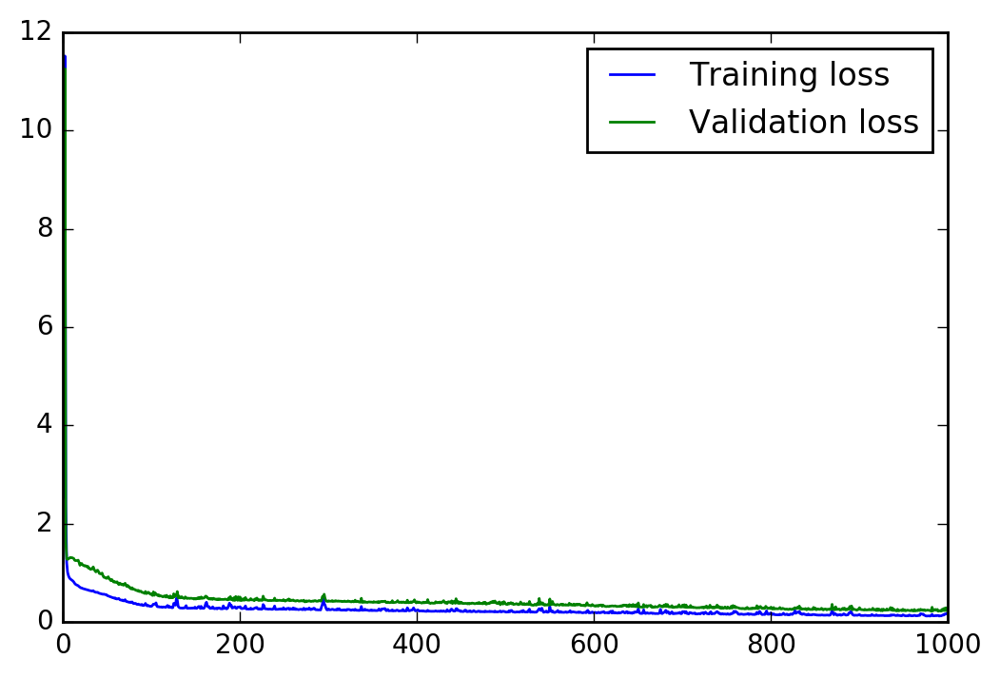

In [172]:
plt.plot(losses['train'], label='Training loss')
plt.plot(losses['validation'], label='Validation loss')
plt.legend()
_ = plt.ylim()

## Check out your predictions

Here, use the test data to view how well your network is modeling the data. If something is completely wrong here, make sure each step in your network is implemented correctly.

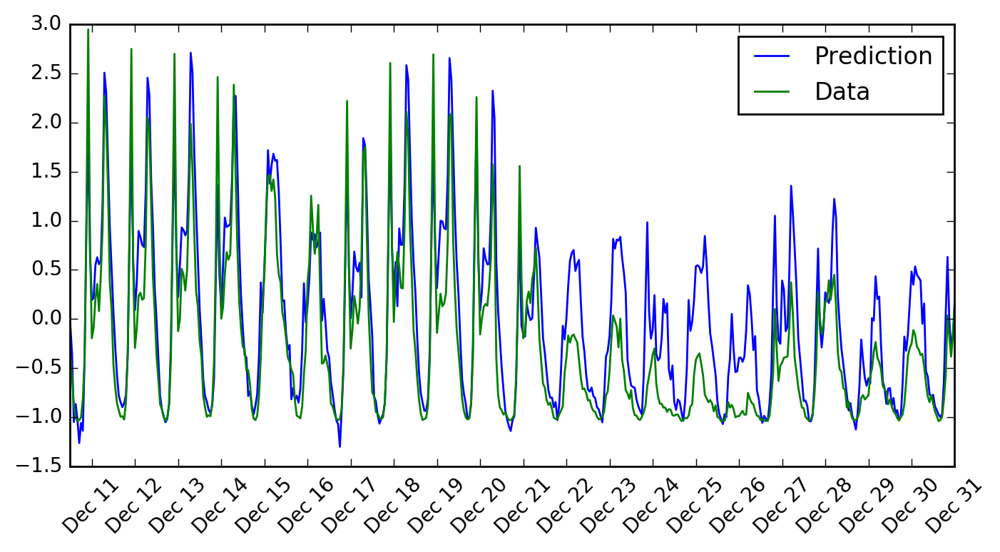

In [173]:
fig, ax = plt.subplots(figsize=(8,4))

mean, std = scaled_features['cnt']
predictions = network.run(test_features).T*std + mean
ax.plot(predictions[0], label='Prediction')
ax.plot((test_targets['cnt']*std + mean).values, label='Data')
ax.set_xlim(right=len(predictions))
ax.legend()

dates = pd.to_datetime(rides.ix[test_data.index]['dteday'])
dates = dates.apply(lambda d: d.strftime('%b %d'))
ax.set_xticks(np.arange(len(dates))[12::24])
_ = ax.set_xticklabels(dates[12::24], rotation=45)

## OPTIONAL: Thinking about your results(this question will not be evaluated in the rubric).
 
Answer these questions about your results. How well does the model predict the data? Where does it fail? Why does it fail where it does?

> **Note:** You can edit the text in this cell by double clicking on it. When you want to render the text, press control + enter

#### Your answer below
The model well predicts the pattern of the time series. However, its error gets higher from Dec 21, predicting higher value than the actual value. One possible reason is a short term seasonal effect. Like Dec24 and Dec 25, the year end might highly affects the number of bike rides. Since I did not add features that represents the year end, the model could not predict the year end demand accurately.